In [1]:
'''added learning buffer'''
'''in this version we always use the same image (times batch size), 
substract batch average at each step to obtain batch-wise advantages
use reward with axes of fft being separated'''

'in this version we always use the same image (times batch size), \nsubstract batch average at each step to obtain batch-wise advantages\nuse reward with axes of fft being separated'

/usr/local/lib/python3.8/dist-packages/tensorflow_addons/utils/ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.3.0 and strictly below 2.6.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.6.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


config:  namespace(action_upper_bound=array([2., 2.]), agent_batch_size=32, batch_size=32, distance_penalty_coefficient=0.1, distance_penalty_enabled=True, distance_penalty_exponent=2, distance_penalty_r0=15.0, do_grayscale=True, filter=array([[[[ 0.        ],
         [ 1.        ],
         [ 0.93406058],
         [ 0.16910922],
         [-0.25916066],
         [-0.38278056],
         [-0.36833901],
         [-0.306479  ],
         [-0.23612829],
         [-0.17285442],
         [-0.12178184],
         [-0.08322866],
         [-0.05547789],
         [-0.03621425],
         [-0.02322227],
         [-0.01466442]]]]), fixed_image_num=1, foveate=None, gym_mode=False, history_length=16, image_h=224, image_hm=264, image_w=224, image_wm=264, loud=True, margin=20, max_freq=13, min_freq=1, motion_mode='velocity', sum_axes=True, t_ignore=16, t_max=50, use_dones=False)


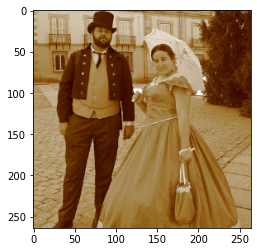

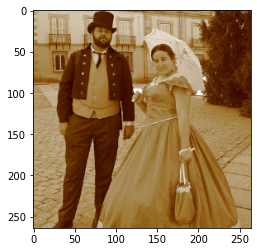

In [2]:
import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'  # or any {'0', '1', '2'}
from imagenet_dataset import get_dataset
from retina_env import RetinaEnv, calculate_retinal_filter
from rl_networks import create_actor_model, create_critic_model, policy
from rl_core import Buffer, update_target
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from pg_core import GaussianPolicyAgentWithBuffer

import types
config = types.SimpleNamespace()
config.batch_size = 32
config.margin = 20
config.image_h = 224
config.image_w = 224
config.sum_axes = True
config.distance_penalty_enabled = True
config.image_hm = config.image_h+2*config.margin
config.image_wm = config.image_w+2*config.margin
config.foveate = None
config.do_grayscale = True
config.history_length = 16
config.t_ignore = 16
config.t_max =50
config.motion_mode = 'velocity'
config.use_dones = False
config.fixed_image_num = 1 #this is a nice image
config.gym_mode = False
t_vec = np.linspace(0,150,16)

config.agent_batch_size = 32

balanced_filter = calculate_retinal_filter(t_vec, R=1.0)
config.filter = balanced_filter.reshape([1,1,-1,1])
config.min_freq = 1
config.max_freq = 13
config.action_upper_bound = np.array([2.0, 2.0])
actor_lr = 1e-4
dataset_dir = '/home/bnapp/datasets/tensorflow_datasets/imagenet2012/5.0.0/'

def epsilon_scheduler(episode, floor_episode=200, epsilon_floor=0.1):
    if episode < floor_episode:
        return 1.-(1.-epsilon_floor)*episode/floor_episode
    else:
        return epsilon_floor

dataset = get_dataset(dataset_dir,
                                     'validation',
                                     config.batch_size,
                                     image_h = config.image_hm,
                                     image_w = config.image_wm,
                                    deterministic=True,
                                     preprocessing='identity',
                                     rggb_mode=False,
                                     central_squeeze_and_pad_factor=-1)

# env = RetinaEnv(config, image_generator=dataset)
env = RetinaEnv(config) #freezing on first batch
for images,_ in dataset:
    break
    
images = images[config.fixed_image_num].numpy()
images = np.repeat(images[np.newaxis, :, :, :], config.batch_size, axis=0)
plt.imshow(images[0])
plt.figure()
plt.imshow(images[1])
if config.gym_mode:
    num_states = env.observation_space.shape[0]
    num_actions = env.action_space.shape[0]

    upper_bound = env.action_space.high[0]
    lower_bound = env.action_space.low[0]
else:
    num_states = env.observation_size
    num_actions = env.action_size
    upper_bound = env.action_upper_bound
    lower_bound = env.action_lower_bound


actor_model = create_actor_model(env.image_h, env.image_w,
                                 env.spectral_density_size, env.location_history_size,
                                 env.timestep_size, env.action_size)
actor_optimizer = tf.keras.optimizers.Adam(actor_lr)
actor_model.optimizer = actor_optimizer
agent = GaussianPolicyAgentWithBuffer(std_deviation=1.0,model=actor_model, 
                                      state_dim=env.observation_size, 
                                      action_dim=2, 
                                      batch_size=config.agent_batch_size, 
                                      buffer_size=10000)

In [3]:
# Training loop
reward_records = []
epsilon_records = []
action_mean_records = []
action_var_records = []
action_statmean_records = []
action_statvar_records = []
episodes = 10000
best_episodic_reward = -1e9
for ep in range(episodes):
    prev_state = env.reset(images=images)
    episodic_reward = 0
    states, actions, rewards = [], [], []

#     epsilon = epsilon_scheduler(ep, floor_episode=1000)

    while True:

        deterministic_action, means,stdevs = agent.get_action(env.unflatten_observation(prev_state),
                                               return_stats=True)
        action = deterministic_action #hook in order to add noise if neccessary
        state, reward, done, info = env.step(action)
        
        if env.warmup_done:
            states.append(prev_state)
            actions.append(action)
            rewards.append(reward)
                
            episodic_reward += reward
           
            action_mean_records.append(deterministic_action.mean(axis=0))
            action_var_records.append(deterministic_action.var(axis=0))
            action_statmean_records.append(means)
            action_statvar_records.append(stdevs)
        # End this episode when `done` is True
        if done:
            break

        prev_state = np.copy(state)
    agent.record(np.array(states), np.array(actions), np.array(rewards), num_records=None)
    agent.train(shaper_fn=env.unflatten_observation_v2,
                max_iterations=17, loud=True)
    reward_records.append(episodic_reward)
    print(f"Episode * {ep} * Episodic Reward is ==> {episodic_reward.mean()}")
#     print(f"Episode * {ep} * Episodic Reward is ==> {episodic_reward.numpy().mean()}")
#     print(f"Episode * {ep} * exploration epsilon {epsilon} * Episodic Reward is ==> {episodic_reward.numpy().mean()}")
    print("action means and variances at step -10:", action_mean_records[-10],action_var_records[-10])
    print("action means and variances at step -5:", action_mean_records[-5],action_var_records[-5])
    print("action statmeans and variances at step -10:", action_statmean_records[-10][0],action_statvar_records[-10][0])
    print("action statmeans and variances at step -5:", action_statmean_records[-5][0],action_statvar_records[-5][0])

    
#     mean_episodic_reward = episodic_reward.numpy().mean()
    mean_episodic_reward = episodic_reward.mean()
    if mean_episodic_reward > best_episodic_reward:
        actor_model.save('actor_cp_vanilla_det_singleImg_Adv_distPen101')
        print('saved checkpoint at mean_episodic_reward=',mean_episodic_reward)
        best_episodic_reward = mean_episodic_reward + 0.

item states
item actions
item returns
indices [   4  900   25  542  548   69  647 1045  884   26  102  414  638  753
  828  121   35 1036 1015   78   18  966  811  306  826  109  598 1035
  501  989  753  417]
indices [ 553   33  174  448  475  221  622  431  107  579  801  781  366 1054
  932  365  745  767  568  640   44  171  791  482  163   74  412  984
  531  669  147  412]
indices [ 582  467  784  550  339  455  343  659  681   46  882 1017  783   13
  863   34  620  190  391   81  206 1072  890  644  270  883  745  113
  897  201  870  601]
indices [ 478  262  563 1075  445  735  674  766  183  536  734  734  687  731
  196 1047  868  724   62  713  751  988   56  225  324  278 1039  966
  378  520  128    1]
indices [  66  800  999  474  563  771  692  233  379  330 1002  606  996  396
  986  648  146  585  763 1063 1040  164  955  654  109  341  872  409
   83  440  306   28]
indices [  64 1073  870 1046  228  303  354  876  449  934  158  472   89  902
 1073  744  864   30  3

indices [ 226 2186 1877  460 1132 2185 2077 1384 2006 2885  856 3194 1993 1833
   84 1719 1497  518  327  724 1291 2383  815 1474 1987  131 2271  977
  571 2461 1766 2989]
indices [1717  506 2513 1778 3224 2855 1738 3144 2533  655 2533  329 1478  751
  434 3007 3096 1171 1826 2714  862 2134   59 1042 1773 2068  516 1697
  651 1828  592 2396]
indices [ 453 2018 1697  147  896 1287 2917  946   81 1769 2231   99  330  932
 1982 1370  245 3242  164 2869 3015 2604  906 1272 2427  766  133 2406
  926 1621 2220 3213]
indices [ 913  838 2625  691 2907 1553 1454  134  924  347  428  185 1892  833
 1975  488 2790 2783  529 2646  472 2832 1627  580  983  708 2751 2505
 2358  647  912  466]
indices [2995 2419 2206 2047  777 2104 1383 2028 2785  882 1476  882  107 1322
  524  303 2516   19 1385 2527 3153 2883   76 2170 1834  480 1580 3172
 1880  307  162  317]
indices [2609  264 2726 3142 1684 1334  897 1317  406 1056 3132  121 2040 2046
 1790 2387 1263 2187  720 2402  560 1131  781 1446 2395 1599 

indices [1605 5265 1147 5330  736  417 2109 3084 1309 2262 4156 2071 5071 1588
 2329 4359 1729  252 2828 1046 1019 1655 1858 2089  870 3883 2228  552
 5361 5325 4537 3155]
indices [4310 2043 2871  991 3063  283  849  169 3603 3054 3056  250 4724 4791
 3325 5239   20 5040 4506 3598 4690 2060 1211 3999  923 3222 3865 1292
 3180 4598 4184 1908]
indices [3554 1962 1669  125 2386  755 3561 4373 4042  490 4704  340 2017 3826
 3836 3326 2165 2788 3779 3052  234 1725 1213   56 5278 1540 3616 2266
 4540 2733 5286  566]
indices [1023 4380 3360 4785 3340 1813  852 3379  818  144 1725  256 2288 1945
 1476 2453 1733  996 3906 3637 2716 4888 1588 2523 4730 1012 4865 5092
 3410  571 4555 1974]
indices [3799  489 3508 1640 2793 4922  814 3361 4063 4462 3182 1181 3761 2307
 1888 1601 5294 4173  460 4763 1964  746 4101 5307 1823 3405 2238 1339
 5031 2292 1712 5140]
indices [1936 4595 4043  955  590 3003 1839 1543 4214 1090 4335 2047 4621  357
 4628 4955 1108  632 4564   86    8 3797 2167  903  898 3175 

indices [ 259 1759   89   67 4249 6805  860 1788 7073 1405 1631 4682 6226 2709
 2108  322 2981 5257 7196 1805 5283 4060 2988 7083  929 3764 1524 4385
 4473 6565 4394 5294]
Episode * 6 * Episodic Reward is ==> -13.355141640592453
action means and variances at step -10: [0.05296522 0.16185883] [0.98196597 1.11705536]
action means and variances at step -5: [0.22709157 0.41993041] [0.78806473 1.19468905]
action statmeans and variances at step -10: [-0.08926789  0.18805912] [1. 1.]
action statmeans and variances at step -5: [-0.08150805  0.19257057] [1. 1.]
item states
item actions
item returns
indices [7870 1095  249 7216 6662 4113 5689 6970 7967 8661 1616 8492  773 1479
 2127 1199 2849   68  906 8211 1956 3156 6425 6210 1993 1607 8581 2338
 7487 5842  319 5227]
indices [1261 2127 1113 5842  236 1481 6282 6105  278 8011 1182 1392  552 4632
 1734 3621 3116 3715 4345 2987  390 3396  856  289  923 7076 1781 2757
 5577 5981 5888 4113]
indices [4476 4546 5917 5758 3510 1204  939  781  823 3886 

item states
item actions
item returns
indices [ 821 6030  304 9962 1336 8500 3234 1990 9237 2336 5196 8356 1905 7892
 7928 7306 7399  876 7798 5184 4529 6326 8159 7446 1433 1127  129 3211
 9032 5046 3042 7384]
indices [9500 3188 9387 4310  263 8617  850 7709 2175 5470 3594 2260 6335 1087
 8904 4223 4232 3700 8447 7772 2899 6707 9943 6421 2654 8761 5682 8792
  536 5417 8849 4178]
indices [ 103 1485 3858 5657 4834 4528  332 7675 6704 5447 2372 2119 9419 1822
 2940 5080 7740 1806 3513 7057 5883 7365  560 1758 6589 2352 1473  272
 8715 3923 1494 6305]
indices [ 225 9448 7640 2616 6008 4275 7923 8443  844 4075  801 9414 4227 1674
 8012 4524   37 8563  475 8439 6662 4747 4119 2135 9722 8477 1051 1513
 4119 9309 5219 5455]
indices [4710 7723 8430 8970 3607 8519 7191 6300 2240 7612 8651 1208 7531 9538
  596 8217 1144 1023 7765 1987 6636 3476 9778 5656 4816 9715 4295 6515
 1746 8872 8083  714]
indices [2775 6011  538   60 8889 5345 4265 9490 1999 3639 9205 5583 6438 4717
 6015 4753  782 6874 48

indices [7939 4169 6902 9458 3091 7536 7309  539 2370 4047 3350 8283 4349 3040
 8746 5506 2148 1009 9817 3521 2982 4770 5195 5514 8484 4909 5120 5072
 6399 6158 2073 4949]
indices [8639 2978 4174 9807 9072 8765 2712   40 4089 1814 5576 8507 9466 6398
 1056 8874 6308 2672 2486 6756 7050 8949 3137 8225 4293 3462 4073 8272
 9215 1369  325 6238]
indices [7971 6548  814 8329 7522 6012 7274  237 1039 6627 9467 4685 4418  484
  680 3548 4580 9140 5316 6551 7441 5527 4759 9008 5329 2157 4538 6856
 3464  818 2210 3257]
indices [4670 3816 1444 8646 7109  403 5577 2766 4339 9705 1285 1223 5833 5381
 2151 6719 8611 2913 8631 1111 7376 6272  854 6265 6466 1496 7204  471
 1501  717 3108 9815]
indices [5937 4173 6813 1315 7593 2017  710 2530 2838 4246 1381 1641 5241 4473
  501 9640 9783 8945 4006  205 1235 8228 3887 8567 6638 6398  298 7012
 7064 8942 7331 7210]
indices [4429 3150 6126 4822 4298 6205 4420  587 1552 9192 2420 2597  351   53
 1139 7804 8969 3706  811 8062  234 3873 1113  281 9933 5792 

indices [9306 9477  621 1159 7629  562 9265 5055 7754 4488 8871 4840 4866 3808
 5079 8640 9524 8957 4572 9833 4286 5841 4272 6748 9134 1969 7348 3557
 7938 5536 4412 5504]
indices [3534 5472 7215 8042 5120 8051 1025 2162 1346 7986 6408 9175  441 8078
 1014 3947 9621 3295  997 9876 6290 6078 4043 4174 5744 4876 4773 6901
  172 8641 6515 6994]
indices [1904 5462 1917 6463 2890 9052 3177 8669 3346 1749  328 1993 6318 5761
 2702 4154 3123 2336 1534 3076 9247  626 1979 9583 6301 3769 9233 5826
 6661 8116 8337 9029]
indices [2754 8629 8477 7843 2851 4981   40 9045  612 5162 1246 2782 6133 2805
 1147 7401 3440 4506 5968 5862 5489 8473  209 4624  137 2879 9300 5552
 3008  516 9919 5011]
indices [2298 7829 4826 5881 7238 6231  572 8865 5652 1775 4392 2562 6037 9558
 6910 3793 5919 5286  949 4908 2325 3122 5882 9934 7515 3353 3158 6561
 9202 3442 3467  211]
indices [4231 1128  360 5967 9399 2302 9589 2523 7360 6873 8446 2192 6930 5213
 2607 4157 2666 2798 7452  589  581 3288  343 1183 7932 5185 

Episode * 15 * Episodic Reward is ==> -13.149675393143959
action means and variances at step -10: [0.08827308 0.14554549] [0.74924439 0.62906451]
action means and variances at step -5: [-0.29930468  0.20143194] [1.0498803  0.87432955]
action statmeans and variances at step -10: [-0.1632812   0.06158112] [1. 1.]
action statmeans and variances at step -5: [-0.16068737  0.05986714] [1. 1.]
item states
item actions
item returns
indices [8256 5360 6654 5326 1732 7790  160 4061 5556 6994 3477 9952 3127 1752
 5066 5245  375 4356 6120 5754 7426 4878  548 1952 2397 3357 9559 1178
 2891 8614 6514 9948]
indices [7959 1128 4371 1423 9269 7750 9888 4402 7258 1707  565 5696 9369 3700
 8059 6978 1584   39 4924 5437 6150 8565 8627 2727 6077 3027 8982 3586
 5145 1196 8403 6855]
indices [6631 8907 8823 9680 9869 8056 4509 4164  930 1671 5828 8348 8155 2724
 6254 5442 3081 4703 1585 9624 3956 4329 9655 9194 1792 3670 6841 1253
 7778  978 3890 9930]
indices [8397 5827 3857 9595   84 3844 4061 1266 7496 92

indices [7951 2297 3470 2402 6681 3332 6045  592  521  737 3864 3802 4125 6510
 5163  541 5722 7936 5471  513 4904  555 9652 7031 9852 3765 4113 5754
 8750 2248 2420 2511]
indices [4002 5751 7299 8064 2151 7506 8944 1198 3168 3341 4599 4083 3089 8576
 1675 3939 6889 2399 8568 3820 4989 8431 7528 2864 1783 3248 9842 3111
 2099 9212 8453 7869]
indices [1219 2090  290  305 9995 1722 6989 4874 5927 3869 9941 4051 1593 1300
  286  153 7678 3805 6345 1781 6633 4920 9300 2749 1722 5608 8835 2101
 4263 5302 2092 3180]
indices [6362 1699 6962 9534 3930 2329 4663 2429 3990 7482 4243 6823 9521 7952
 7817 3619 8541 3440 9793 8510 2725 8925 2115  532 5847 3195 9262 9478
 9461 6994 5477 2899]
indices [2507 8067 2514 2121 1524 3494 5124 7399 4272 7659 3272 3597 7478 2496
 3423  551 2740 6448 5340 7419 6427 7001 5227 6971 5423 3143  313 5074
 9645  489  602 3678]
indices [2726 2092 8127 8021 9023 8333 3263 2010 8851 4415 9140 2716  850 5546
 3017 9632 4713 2392  645 5657 2891 4649 6025 9380 5470 6980 

indices [8657 6614 7206 3058 4468 1163 6269 9375 3343 2043 9452  790 8123 1760
 1124 9814 6688 1539 6773 4920 5184 2432 6154 7580 9042 6036 2949 1050
 7274 6235 2285 5973]
indices [4878 1461 2389 1122 6656 7620 8403 9493 9305 7617 2341 1415 2428 3345
 9187 2655  958 4732 4370 9578 8340 3740 3614 3439 3579 7286 1129 2920
 3460 2127 7397  106]
indices [7845 2159 3726 7763 6607 2474 9852 5453 4201 3068 6902 9332 1879  686
 9309 8910 3813 2838 5088 8058 5385 5651 9480 5789 4895 2463 4438 3215
 1072 6078 9726  594]
indices [2977 2182 9180 6665 7961 7196 4378 7215 5772 2451 8428 3590  102 6499
 1943 2103 2885 6193 9957 9706 8181 9671  872 2012 6892    4  231 2634
 1814 5785 6141 3019]
indices [7908 9381 6368 8679 5916 6704 4429 6920 5055 7688 5515 6724 6663 2234
 8639 8935 2664 6054 3500 6068 3037 7813 4618 2431 9901 4514 9769 3704
 1222 8095 9978 4416]
indices [8100 4085  822 6597 4113 2228 9934  473 5925 1612 8712 9421 6775 5656
 5167 6091 3954 3504 3490 5974  584 2842 2149 4593 7945 4688 

indices [ 343 8950 6003 8779 7363 9485  846 7387  361 4730 3991 6968 8746 9188
 2824  256 3303 8681 3312 7607 9505  768 7576 8570 5622  310 1658 8043
 6615 5956 7581 9513]
indices [7303    2 6542 7597 9758 2891  524 4818 5386 6442 3525 3798 9762 2280
 7843 3258 9809 9302 1057 4760 6964 8801 3010  234 7813 1207 1261 3695
 9107 6869 9261 1009]
indices [6014 6925 1087  118 9580 9709 7042 7209 1734 1176 4426 1251 6221 9759
 5369 1841 1952 5449 4328 3959 3716 7615  651 5268 4097 6277 5932  829
 4994 8604 9526 7121]
Episode * 22 * Episodic Reward is ==> -13.64715060797422
action means and variances at step -10: [-0.27692554  0.06989413] [1.07335762 1.28714039]
action means and variances at step -5: [-0.30959452  0.01401058] [1.04304688 0.84869119]
action statmeans and variances at step -10: [-0.22040531  0.08198626] [1. 1.]
action statmeans and variances at step -5: [-0.19075133  0.07731917] [1. 1.]
item states
item actions
item returns
indices [ 423 7259 6380 7497 7739  777   54 5378 8319 4

item states
item actions
item returns
indices [4624 8861 2726 9557 3188 2203 1120 2688 8348 9140 3982 1366  170 5144
 3728 7996 9991  840 1759  145 4566 8691 1169 7714 8283 9345 1430 8941
 6188 5078 9715 4662]
indices [9472 5387 5131   77 3887 2941 4495 4566 1426 9997 3605 3010 4378 6066
 7700 4005 8584 3993 7450 3596  297  594 7650 8090 3198 8639 3536  921
 7431 3642 7291  922]
indices [8190 7931 8325 8915 2138 6406  638 7795 5567 5109 5077 6113 8531 2464
 3318  556 8128 3111 9608 5901 4996 5569 7382 7151 4306 6517 6168 5744
  120 6246  840 5103]
indices [3266 3309 7416 5294 6398 7822 8077  824 1739 8024 8942 7447 1361 4581
 5534 6561 7315 2361 4359 7070 3622 7837   49 2355 9684 9558   51 8452
 7150 9608 6747 9389]
indices [5505 5827 8105   29 6040 5555 8455 8074 8436 8067 5848 4182 5808 5635
 8148 5990 9717 7045 5245 7089 6880 6950 3492 2574 8445 7702 9152   34
  760 3320 4925 4096]
indices [3928 6430 6033 2475 5042  212 8102 8198 6852 3476 6391 2361 1764 3960
 3014 1175 3628 8124 14

indices [7951  768 8391 8091 4961  959 2291 2051 4487 8257 5115 8069 6261 5018
 9842 5770 3174 6912 1402 5541 1109 6346 1174 8155 4723 2310 6889 8131
 3851 3324 3929  849]
indices [9010 5970 8955 2732 3929 6925 7093  338 2301 8207 3784 7453 5017 5515
 5061 5983  522 7410 7513 1966 7979 1107 5231 7905 2538 5791  427 2801
 8993 5812 8190 5849]
indices [2649 5583 6227 4445  271 9733 9696 2656 7137 9581 2252 3084 2132 2262
 6414 9377 8211 6649 3647 6417 1015 2124 1534 7056 7212  494 7030 4259
 9932 2029 6374   40]
indices [2065 7122 4727  743 1067 7191 9422 2880 1475 6061 1223 3627 5060 5423
 8496 1266 2437 3799 2782 9789 2233 7992 7643 5057 4158 8490 8488 2812
  156 6030 5935 7552]
indices [4823 6594 5776 7377 5511 9459 3692 6794 6225  189 8899 3836 7930 8144
 6437 6886 6840 3359 3105 1725  826 7271 8520 4777 9929  525   41 5718
  809 7268 7247  916]
indices [7410 6792 4159 9417 1451 4329 7688 8668 9870 5379 7312 6499 3781 4763
 1854 1209 7163 4991 9970 7303 7743 2498 7709 9589 4276 6178 

indices [8464 2119 1805 8776 6821 1690 8172 2186 4550 8053 6739 7619  788 1284
 1682 7061 5748 6712 7334 8393 8029 2783 9328 3753 8479 9058 5348 2076
    3 4718 3500 9990]
indices [4194 3125 7202 6412   82 2924  706 2511 7839 5047 8321 5444 2442 3005
 7961 8268 3131 8828 9130 8450 3576 3209 8709 4115 5660 1564 2036 7851
  564 8032 4270 4051]
indices [2427 7332 6760 6643 7631 4505  376 8543 4642 9340 8051 5791 2559 3770
 9628 8373 5458 9784 5319 7907 3845 5169 8127 2573 3480 3070 7427 8512
 3436 4306 4387 4691]
indices [4129  458 1901 4622  240 2344    9  502 1706 9754 5815 1205 6295 3523
 2471 5410 7554 9380 4845 7929 2072 9429 5020 3400 4471 9226 1360 7232
 2070 3329 7992 9192]
indices [4660 1772 2418 7532 5885 8440 6155  823  429 2164 2364 2731 7956 9982
 2587 1183 8668 2064 9711 4594 3282 3537 1828 2256 8709 6296 3861 1026
 7700  248 8997 4335]
indices [7698  564 2171 9825 1820 9154 1192 1372 9666 3273 9112 6035 4436 8075
 1136 4621 4902 8470 4545 4465 4925 6312 9347 4218 8236 5470 

Episode * 31 * Episodic Reward is ==> -12.39974175491264
action means and variances at step -10: [-0.06973337  0.2476458 ] [0.5579551  0.78369828]
action means and variances at step -5: [-0.00104463 -0.00662378] [1.1346172  0.97626463]
action statmeans and variances at step -10: [-0.0560798   0.05926577] [1. 1.]
action statmeans and variances at step -5: [-0.03966995  0.04201369] [1. 1.]
item states
item actions
item returns
indices [9831  259 8793 7753 7355 5798 5816 3166  991 9943 1561  871 6249 3440
 4919 7372 8405 5446 4944 1147  698 2299 6697  224 9450 1231 9724 1903
 9608  639 9835 6341]
indices [5556 8586 7533  907   93 9839 6639 4342 1178 3824 7511 6571 3212 2503
 2548 7799 1618 4340 1276 7678 6511 8393 2840 9653 9514  933 6481 9056
 4228 8909 2322 7751]
indices [6579 4233 7523 6360 9460 8866 2324  431 3336 8781 4042 2370 5990  334
 3415 3888 6788 2957 9869 2868 3101 8277 6044 6666 8388 4455 2546 7216
 7505 9682 2799 3125]
indices [4959 2543 4293 1150 4715 9075 9406 3519 4544 7

indices [ 894 8127 3221  604 9314 7744  869 1919 4505 2702 8621 7602 5925 3522
  287 6586 7900 6852 6041 6900 9011 7836 6961 4505  989 4328 4645 3473
 8521 8725 2119 5405]
indices [1007 3481 3143 7135  896 5015 2699 7481 3396 4825 3733 1984 8841 3793
 1727 9067 3938 8154 5082 5644 5437 9324 9132 2396 8469 6570 6778 7358
 8288 4119 2436  948]
indices [5171  424  755 2400 2934 6768 9612 7350 9062 2703 8011 9797 3071 6863
 5682 3069 6096 1070 3075 5677  573 7766 8843 1604   15  622 4972 4808
 4831  656 8952 2203]
indices [6506 1448 3303 6252 5621 7023 7184 8169 1952 8240 6730 5844 4732 6687
 1393 2932 9540  142 7967 4569 5457 9285  178 6721 2599 3292 8460 5239
 3264 7762 4588 1405]
indices [3697 7515 7352 8081 5341 1059 7990 9936 2519 3886 2131 7111 4058 7576
 6699 4305 2112 4926 1821 4215 8096 9956 6934 6825 4630 7045 3296 5781
 6318 1909  198 4514]
indices [9002 2688  548 7410 4401 6599 9047 2946 2450 5938 2098 9843 9951 4375
 7962 4517 3150 6284 1363 7233 4049 7813 5413 3343 2893 9781 

indices [3903 7271 3191 1664 6032 3993  450 5280 2486 4976 5107 3460 7531 9750
 6926 7430  566 5368 9555  428 6482 7269 8775 4462 2346 8259 2350 4184
 1994 6970 4737 4754]
indices [ 306 7565 7017 7577 7056 6644 1186 5789 2779 1587 9331 1561 2520 7275
 2225 4394 4614  274 4600  648 6912 7158 4868  706 4843 5297 4794 6207
 2369 7445 4731 8971]
indices [2173 3756 4162 4013 7097 3955 3941 8025 1400 6140 2904 8239 4679 7262
 9364 3628  271 6721 7076 4109 2176  320 9017 3088 3205 7663 9121 9273
 6535  926  969 9367]
indices [ 767 7490 3309 9887 8113 9481 9208 5803 8890  936 3125 8769 5088 4079
 3219 8576 6048 8753  508  391 4535 7286 6409 7667 4055 2440 9048 9328
 3160 9693  295 1844]
indices [6943  247 6206 6069 3106 2258 1192 5463 7265 5621 7983 2936 4155 3620
 6544 5823  525 2214 2471 5811 3563 9396 6740 9057 8526 5898 8347 6419
 1033 8295 8784 9878]
indices [1675 3259 2231 2966 7783 2109 7116 3824  908 9290 1496 8723 5718 2142
 9464 9104 2457 4918 5474 7204 6852 5782  744 3888  623 2339 

indices [7980 8341 2027 7162 8308  265 9665 2947 3649 5693 4072 4633 8913 5985
 7246 4029 2376 5155 1886 4535 9944 3771 6754 5474  920 5086 5778 4041
 7432 1513 3209 4935]
indices [7071 2994 9910 5914 8767 5442 8533 9245 6732 9145 3312 3576 8956 7353
 5837 4154 1029 3785 2854 8614 2307 8766 5236 4768 9215 8577 2060 2429
 8909  903 8861 6619]
indices [9133 8558 4440 6732 3335 8997 7323 3550 2768 5306 5330 5887 8256 3708
 2821 9993 9859 2371 3153 8160 3567 5203 1831 4995 7688 4398 2896 1975
  484 7454 6887 4056]
Episode * 38 * Episodic Reward is ==> -14.44434256214872
action means and variances at step -10: [-0.08012874  0.20345894] [0.73719893 1.31742413]
action means and variances at step -5: [-0.33895765  0.22381699] [0.70184314 0.98637275]
action statmeans and variances at step -10: [-0.3742794  0.081406 ] [1. 1.]
action statmeans and variances at step -5: [-0.378273    0.08248569] [1. 1.]
item states
item actions
item returns
indices [8470 7731 7980 3335 4177 6571 3046 5557 2868  47

item states
item actions
item returns
indices [7136 8504 5007   31 4965 5548 3530 1356 6338 5726 1111 1004 6337 3480
 4573 5939 2455 2306 9924 1053 8740 1319 5215 1100 7619 5135 4174 4390
 9556 4861 9262 5356]
indices [9786 8696 5241 3781  984 5591 7342 7875 1752 5344 4618 1308 4617 5884
 6408 4205 1015 4285 7376 7585 5442 8437 6210 3438 3863 7311 6800 2777
 1636 5505 7473 4086]
indices [9489 2453 9780 2387 1947 4618 3075 6750 8434 6466  415 9182 2423 2809
 3831 4724 5985 4389 7700 7593 1644 7091 9627   23 9196 4676   67 4714
 7403 3045 7215 2215]
indices [1909 2798 2761 8596 4294 9602 6601 6787   71 4229 2955 1614  821 8901
 8467 1535 7682 6932 1205 1566 7631 5410 1659  169 6240 4596 4484 4715
 9815 6872 9911 8153]
indices [2351 7348 6061 9632  157  370  487 9829 2845 2284 2256 9843 4793 7000
 7050 6016 4257 2054 9358 7658 5895 7180 1053 7706 8075 2758 6671 7012
 8780 2693 3530 3359]
indices [5534 3786 9013 3453  720 6045 1897 1469 3905 6601 5467 2503 1783 8735
 5485 7619 9329 9223   

indices [2409 1292 5173 5818   38 9252 1736 5850 6817 7821 9869 5765 5643 6611
 7517 1001 3617 4360 3632 9726 9996 4303 5543 9366 8067 9954 8893 9646
 1708 8797 7733 2850]
indices [2589 4159  948 6452 9228 2521 5633 9575 5698 8124 2126 3911 6726 7196
 3748  603 6105 2061 1206 9246  169 5877 3287 1908 7499  460 2502 6121
 9183 8707 1224  570]
indices [2084 6353 8851 3686 1934 2783 7694 7312 7055 8146 2444 8969 7337 3657
 6754 2160 3262 5391 8294 4059 5702 2313 1030 8263 6817 6782 5276 3848
 2296  387 8989 3531]
indices [6261 4097 6052 8253  749  334 2399 4775 8404 6990 4971 6110 2132 4613
 1105 9489 8797 4336 3929  546 4578 3974 3824 1880  903 7828 8947 8971
 9053 9025 1607 6402]
indices [2368 8441 4373 1671 3681 3406 7670 4179 1657 4498  843 3361  564  982
 3683 6735 2367 7115 9708 4708 5468 2251 6618 4679 9352 1286 3984 7338
 4806  713 6332 8837]
indices [9627 8892 9984 3400 2832 7760 8495 3366 5913 4547  768 7240 8456 4793
 8323 1940 6148 3118 5489 3718 3425 8578 2874 8268 5856 2103 

indices [4931 7355 4154 5038 3676 8435 5047 8876 3897  494 3490 4262 1723 3108
 4021 7494 1294   47 5973 4360 5478 1424 3873 9629 8473  186 6205 8248
 2614 6132 9122 6974]
indices [8712 7523 7825 3180 6240 7469  960 5857 5636 6297 8683 2055 7179 3022
 1298 1643 5044 6569 3660 1459 6393 9809 1250  126 4724 8206 8331 4773
 7153 2566 1788 7795]
indices [2361 7483 2643 3135  327 2534 3074 4061 9281 1119 7239 6826 3371 1945
 7701 9119 3611 3851  227  492 1794 2923 7430 9145 4124  401 5576 7720
 9727 4369 4757 2473]
indices [3525 4696 4790 4706 8945 3150 4196 4816   49 5575 3639 8605 3405 7472
 8848  471 9307 9474 9090 5143 4694 4674 8499 6765 9899 9055 8246 7884
 4074 8947 2060 6107]
indices [9781 5842 2250 5048 2089 1957 8649  862  999 1936 3541 2852 9222 9186
 5328 5791 2550 5018 6111 4738 9820 1029 4438 3318 7505 6852 1698 1109
 2291 1201 3708 3609]
indices [8382 7545 4535 3579 6885 6738 7429 8806 7793 4643 6265 3219 8848  823
 1325 6409 8664 8212 2891 3562 9757  650 5789 9765 1044 6701 

Episode * 47 * Episodic Reward is ==> -13.092652775727323
action means and variances at step -10: [-0.13714078  0.05521453] [0.90349492 0.51307617]
action means and variances at step -5: [-0.04309999 -0.02668571] [1.04216402 1.18472356]
action statmeans and variances at step -10: [ 0.0091641  -0.00449748] [1. 1.]
action statmeans and variances at step -5: [-0.00136949  0.00497169] [1. 1.]
item states
item actions
item returns
indices [9431 9266 8131 5886  936 2186 2830 9610 5536   51 1513  762  479 6674
 5240 8595 4330 3215 3788 4939 3303 8025 3338 2500 3026 1989 4775 3193
 7781 8578 5921 6579]
indices [5109  537 8866 2740  160 5502 3008 8229 5149 4194  102 1793 9808 7741
 6214 8862 7325 5975 8409 7814 9729 7086 4542 1652 2124 5406 1259 7037
 9187 8359 8316 3716]
indices [9295 7770 2068 5111 2629 7993 4298 6832 6318 3870 9475 3387 6835 3668
 1334 6239 7580 7740 8527 1184 3033 5818 6075 8875 5377 6872 5407 3414
 1267 9080 8169 3242]
indices [3635 1284 8284 5104 7496 5056  959 2762 5164 

indices [8192 3915  402 4662  353 9760 8049 1833 3498 3269  856 1973 2224 9641
 7343 6518 9452 6468 8701 8128 8145  895 8032 6307  587  335 4958  336
 7289 2111 1459  573]
indices [8587 9886 3234 6892  640 6186 3403 1757 6128 8949 9016 5261 7812 6135
 1506 8393 1846 5343 9147 4707 3036 5809 6682 8752 2485 8107 8922 4773
 5318 8752 5906 7427]
indices [9307 2373 5730 3933 1183 3550 6792 6880 5995 4712 7583 1398 9615 5508
 2928  854 6866  712 6070   57 7178 1251 4832 3542 4380 2482 8175  823
 7939 9076 1709 6183]
indices [7766 1005 5506 3506 2328 5756  634 9312 9803 2002 2629 6171 1363 2985
 8413 2785 9995 2504 6362 1954 4745 6849 6548 9090 2049 9743  568 6430
 1227 4536 8136 6349]
indices [6429 8903 9304 1192 7278 8566 7488 6347 7792 1314 8126 8801  260 1132
 7931 4575 6497 6831  876 3853 1837 1210 6431 4683 4508 1118 5816 1443
 4921 8539  323 4602]
indices [2829 1748  558 1822 1044 9153 1857 2615  208 9461 7103 6094 2876 6206
  804 1224 6021 7761 3040 4632 2371 8325 5019  405 5604 1672 

indices [ 279 4296 7425 2072 3219  334 9853 9237 2164 5441 1380 9314 3437 1005
 6551 7764  458 1024 7984 6023 6946 9634 5908 2693 1011  330 7886 6856
 1106 3815 8842 9812]
indices [6666 3068 6208 4877  920 3180  355 8287 7309 1502 6333 1795 7247 3439
 9901 3565 6819 1454 2822 5113 1648 3729 5821 9535 5764 2088 3643 9099
 3044  119 4842 4136]
indices [ 227 7605 9904 8705 2664 3237 3417 4981 5383 7038  263 6624 6212 7093
 9595 9541 5448 3306 9301 3325 7426 4142 7030  709 5658 5005 7659 3807
 1745 4358 7754 8715]
indices [1803 6368 5894 6135 1874 6749 5068 9882 1859 3938 2331 2050 5422 5003
 4453 2713  605 7273 4696 5450 8169 3539   69 2208 5657  399 5934 4331
 5938 3586 4697 6504]
indices [6465 9754 2581 7128 8448 2570 9495 3145 4219 6216 5713 5943 8192 7146
 3557 4002 8272 9595 2628 8080 8317 9020 8582 8243 4239 3005 1527 4329
 9995 1410 8389 6983]
indices [2509 9226 3789 1885  250 8869 8164 5346 2076 2812 7144 7387 8725 9525
 6698 9891 2973 2981 9652 3931 4852 9993  487  104 2735 1628 

indices [1375 7860 3513 5110 3678  979 8991 7583 1077  353 1548 9719  684 2734
 7288 6311 3840 7127 5268 5674 5690 9099 2899 6980 6395 6437 4867 6779
 5356 7893 9632 9346]
indices [3705 6947  184 7194 5871 7273 6023 1664 2006 6859 8667 8142 3887 6896
 9075 1999 1315 7875 6792 7533 1874 8008 9991 4387 3384 9103  149 3582
 1956 8932 7210 6006]
indices [5372 5421  583 4714 6225 3818 8546 3039 4993 9272 4180 7909 1071 1509
 4555 7201 6181 4111 5598 6205 7174 7846 4973 7005 6307 5959 5108 7178
 8330 2806 5153 8055]
Episode * 54 * Episodic Reward is ==> -12.93681414379083
action means and variances at step -10: [0.35318778 0.05397984] [1.06730015 1.19737014]
action means and variances at step -5: [-0.19327815  0.25739194] [0.46767394 0.71373783]
action statmeans and variances at step -10: [ 0.05731124 -0.05509786] [1. 1.]
action statmeans and variances at step -5: [ 0.0385836 -0.043695 ] [1. 1.]
item states
item actions
item returns
indices [8846 8691 8807 8750 9507  223 3564 3014 6269 8800 

item states
item actions
item returns
indices [9465 8130 4229 4499 6688 6820 1773 5142 1526 7089 3843 3708 6650 8982
 2810 4555 4606 1531  895 6085 5124 9536 3787 2772 8145 7269 1809 7119
 5103 6890 8084  972]
indices [6435 4080 3019 6618 9547 2000 3870 6931  120 1157 1942 8710 2467 7623
 8456 7712 2908    1 4716 3293 9845 3080 1495 1777 2932 2067 4361 1971
 2229 2852 7988 7474]
indices [6753 4641 9766 8379 8429 8619 3977 9969 1617 9419 8711 4883 2911 8337
 3658 6144 2570  972 9336 2593 3308 3028 3378 6446 3210 9187 3788 5910
 3603 3458 2974 9723]
indices [9024 5282 2865 5010 2915 3339 8641 9173 7646 6810   52 9355 5943 2805
  776 2800 2802 3737 8697  506  741 3038 1804 9868 3107  189  416 5124
 4619 7870  294 1964]
indices [2430 2147 7184 4172 4303 7896 7171 5989 3756 4032 2691 9675 8537 4031
  535 1555 6017 8492 7319 1850 1498 2522  552 7608 2242 3264 5502 2430
 9057 4480 3291 6827]
indices [8793 7944 8721 4904 1821 3336 9777 8972 1749 6501 8641 3254 7445 2009
 3763 2463 8846 4425 78

indices [6189 6397 9406  342 4065 5122 2235 3532 6429 6571  936 6560 5409 1517
 1309 1821 6797 4788 9841 3877 2140 1439 3317 2878 4427 2239 1838 3332
 4447 2566 3001 9282]
indices [ 250 5614 4286 7585 8693 2785 4862 4938 7353 2972 8764 2100 8349 4708
 9739 7380 7048 2302  289 7588 4566 9868 3946 3769 1667 8012 8481 5362
 8800 8743 1774 7990]
indices [9735 8115 5373 1406  909 2830 8732 6596 1989 8006 6247 8219 1442 5802
 5168  998 7896 3955 8938 1842 7249 7611 7236 9311 3045 6202 3651 6575
 9162 9100 9855 2284]
indices [8760 9880 7633  785 7834 4498 2674 5695 7959  730 5469 5641 2197 3924
 6428 8547 4464 8314 1596 8771 9267  131 6871  872 6636 7367 5398 5496
 4064 3118 3355 5148]
indices [2297 9672 9627  415 8214 7268 7708 1917  968 4660 2741 6336  840 5786
 7772 7017 2402 6806 4434 3080 4671 5022 3030 8474 8891 8092 1952 5752
 8008 7454 3864 2535]
indices [5709 4265 3740 8247 4677 7020 3125 2703 5242 4155 1208  697 1558 2389
 7408 9563 7578   72 1282 3099 2178 1653 9397 6105  152 1511 

indices [ 348 2180 2623 5759 3521 2730  755 5757 6204 3765  487  289 4620 6479
 6007 4299 3448 3264 4860 3183 1926  853 8489 1549 5417 1279 6078 3378
 9498 1549 5489 5475]
indices [5778 9274 9836 6938  557  280   88 6130 1533  943 7535 3119 4342 1836
 4059 9380 7252 3173 7548 1077 8791 1026 1530 9772 8630 5986 6636 4972
 2543 8385 1833  639]
indices [5723 8844 7157  750 8753 7080 9181 1761 2407 6668 9581 4221 8813 5769
  498 8362 9632 6549 6448 8775 8169 9417 9519  588 4761 3365 7734 7021
 2087 7063  144 3337]
indices [9076 1421 2203 7857 1480 6979 4777 3531 9266 3565 8606 4889 7198 6864
 3891 9166 4599 4721 6193 9158 8705 8934 4641 6152 3671 4251 7531  908
 5501 4316 5421  168]
indices [8415 5305 9586 5895 6938 4509 7997 9288 9856 8203 9799 2996 5466 8141
 5021 5929 3103 6934 6209 9555 4225 1821 5987  477 6396 8652 9548 4709
 9251 8848 9444 7414]
indices [7437 9454 6041 9778 7926 8070 3488  863 7923 5691 9566 9484 6675 2184
 7846 1087 2053 6579 1018 8698 9919 8705  903 6503 6349 2192 

Episode * 63 * Episodic Reward is ==> -12.316636968488284
action means and variances at step -10: [-0.17555744  0.24615323] [1.12094373 1.19787089]
action means and variances at step -5: [-0.26548874  0.16982069] [0.68737305 0.98904741]
action statmeans and variances at step -10: [-0.1576182   0.00487558] [1. 1.]
action statmeans and variances at step -5: [-0.17590147  0.01035385] [1. 1.]
item states
item actions
item returns
indices [4676 6119 3282 6307 7738 1340 7770 5618  129 8079 1437 1948 4213 4152
 9515 7011 1899 9077  153 1019 8325 9113  379 4220 5928 8169 9434 2534
  783 5549 2858 7996]
indices [7162 6213 3498 8746 6061 6653 5220 7064 5873 2893 7076 7771 8601 3857
 4395 6855 4025  119 2942 7022 1330 7204 8601  944 6212 7587  289 2230
 6643 4602 8825 4162]
indices [4734 4941 9006 8246 2121 5640 1201 4658 9161 3180 9434  890 4783 2301
 7976 1434 7671 1000 5254 2801 6451 9700 6596 6232 8160  961 3817 6786
  657 2810 5961  680]
indices [1349 8525 7560 5891 1670 4953 1209 4636 4025 

indices [1712 5502 8053 1978 3879 4903 9954  616 8502  650 5444 6609 8151 4869
 9850 5728  158 2707  347 9990 4749 2858 7554 2660 1501 4606 3192 9310
 8636 5089  145 4573]
indices [7030 1621 6998 4691 2367 9436 6526 3368 9940 8528 1656 8608 7293 5065
 9413 9678 9073 9857 7823 9391 1459 7768 9306 6641 3982 9530 3510 5565
 3550 2667 9328 2885]
indices [4732 8120 8556 8317 1061 3532 5515 7643 4372 4705 5137 3463 5982 1183
 2261 1938 3104 5469 8961 8629 5144 4038 7903 2707 6443  996 2648 3836
 2439 6869 7832 3861]
indices [4846 6840 4209 3380 2394 2379 4036 8590  453 5285 3738 6281 7784 5527
 3780 3701  650 2258 6881 1167 2897 4111 7345 4661 7122 3020 5026 9837
 3666 7579 7505 4204]
indices [9147 8684  223 8052 1174 7498 3737 7916 2309 8711 3519 8415 6842 6066
 1853 9068 4108 5131 3946 5890  842 5114 2674 5647 6416 7848  112 7661
 6264 4700 4068 1868]
indices [8861 7304 1222 7248 2262 2539 8304 7976 6532 5477  548 9067 4808 4686
 7148 5682 4206 6170 2873 1456  531 9930 5343 7951 9011 4304 

indices [9220  993 7123 3701 2063 5967 5040 4580 7137 4013 6358 1059 2609 5855
  516 2819 9113 2408 5140 5565 7681 9218  528 5528 6179 5905 8987 8856
 8385 4472  422 3985]
indices [1672 7652 3372 7340 5894 8195 6463 9794 9238 4232 3944 5909 1833 4679
 1141 2811 2628 6762 5887 5241 2578 3731 8144 8255 4269 1885 4774 4712
 7628 8813 1124 8623]
indices [4892 4060 7381 4941 8420 1056 7774 4801 6600  501 7028 7941 7455 2865
 4072 2997 6233 9913 7232 2893 7105 9489 5056 4419 5406 3862 1429 4124
 2095 2127 5938 9275]
indices [8022 4749 6805 9085 8270 8023 9327 6096 7999 8313 9066 3926 5043 8461
 1564 3066 4768 9868 8397  768 4357 1430 8859 5935 4367 5125 2763 5203
 6522 5417 9884 2533]
indices [9514 2686 2721 9456 7242 6622 8228 8753 5218 9513 8901 9248 8396 9046
 4612 3537 9017 7010 7012 9079  823 8996 8576 1769 1678 7136 5723 8414
 8744 2783 3255 3130]
indices [1941 9262  104  892 8475 8718 6500 9083  439 5214 7670 3157 6003 9425
 2831 1335 1297 7748 3287  792 6815 9967 7758 4913 5280  264 

indices [ 856 1757 4573 2889 1138 8790 9014 1563 9725 6041  508 2395 2767 4467
 3078 3851 1988 4306 7629 5899 4667 9203 2765 2189 7392 4887  485  359
 3082 2048 3087 7284]
indices [ 717 8377 9251 1223 8637 7366 5042 9712 7063 4686 7935 7404 3192 3380
 9563 5941  713 3510 2868 2712 2659 5245 4524  645 6583 9235 4522 5985
 1102 9439 6663 6853]
indices [7849 3051 4739 9631 8459 5756 3170 1628 7106 5253 4561 7475 2779 3766
 5272 2688 9164 7845 6088  998 9386 5754  657 9394 4728 2409 1025 7997
 5918 6067 6498 4583]
Episode * 70 * Episodic Reward is ==> -12.758034138973208
action means and variances at step -10: [-0.52000272  0.72934618] [0.76975614 1.82881599]
action means and variances at step -5: [-0.10295862  0.34341922] [0.97394074 0.95883304]
action statmeans and variances at step -10: [0.02082596 0.10683744] [1. 1.]
action statmeans and variances at step -5: [0.00982268 0.10590634] [1. 1.]
item states
item actions
item returns
indices [9076 3858 1117 9359 8310 8436 9065 3351 6952 1659

item states
item actions
item returns
indices [4846 4184 4874 3216 6530 8832 6984 2094 3584 3881 9370 5903 6942 6296
 4670 5319  300 3376 9915 2534 7109 1654 7680 6662 3069 9639 9020 7869
 6321 6773 1965  575]
indices [9371  479 9716 9040 1634 5947 3899 7113 7905 3018 2312 5018  642 8908
 4689 6846 7191 5455 8243 5203 2197 7735 4702 3141 9174 6675  215 6483
 4678 2818 7564  840]
indices [2637 4490  334 9648 2049 9399 1263 9822 7676 3384 8206 1453 1365 8861
 9805 9111 3931 2515 4494 8013 1077 2592 4426 4401 7204 7676 2459 7127
 4308 2015 5630 9123]
indices [4591 9071 6669 7389 4410 1738 3539  290 1285 9971 4808 3268 8154 6569
 8154 8200 1280 1132 8337 5721 7450 3693 8996 4394 2865 1432   65 7461
 3787 9312 2690 4887]
indices [3865  966 1920 8449 7319 7901 8818 2809 5385 6850 1628 6821 7563 2244
 3711 7104  876 8671 9313 9211 6538 5595 1796 1017 4126 1057 9576 2229
 2842 1950  958 7054]
indices [2339 2932 9021 9837 6413 3609 1084 3700 1190  587 4089 9892 1879 1430
 6993 5465 9779 1662 63

indices [1661 3409 5292 3083 8622 6790 4871 6970 1520 5123 2865 7408 7179 2033
   10 8541 6423 5847 6250 2478 1869 6221 5069  879 9820  428 3677 8397
 3627 1829 1391 4252]
indices [3150 6528 5241 4482 5622 1310 3500 5781  157 6960 1707 7789  734 9487
 2544 3861  730 1157 3147 8090 5273 1865 3697 5035 4321 5288 4420 1648
  782 2643 4927  801]
indices [2571 5039 6673 2081 3022 1372 8623 4622 4809 7958 9307 8014 8969 4259
 3764 8886 6059  600 3182 9369 4436 9671 3307 8834 1996 7325 8690 6830
 5324 6244 3817 5285]
indices [6271 8388 7036 5072 6678 3238    9 9582 4344 4099 3581 5253 5458  110
 2434 8164 2860 5766 4988 2658 1842 6615 5623 1641 8347 1748 1246  674
 5224 9371 2749 2596]
indices [6653  550 2452 8649 1793 4230 9264 1779 1622 7484 9084 9774 3125 5511
 1995 1955 1309 5133 8714 2269 9529 9891 9369  834 5004    8 3191 4641
 7308 9773 9984 7260]
indices [1671 8125 1209 3238 5093 8550 2568 2047  546 7455 2581  909 5200 6010
 4126 2518  709 1543 5910 3897 3748 1057 4401 5420  205 4363 

indices [7039 7959 9127  512 2972 8403 1486 3648 3061 8312 1743 5636 7593 8055
 2155 7746 9890 7372 7440 4174 8577 2233  668 2289 9367 5496  903 9088
 9268 8974 1018 1380]
indices [3840 9343 8864 3441 2513 9752 3438 3773 9016 2737 3338 1134 6050 5994
  580  124 9199 2824 4659 2178 8000 7672 3760 8063 2527 6464 6100 6708
 5659 9302 8933 3709]
indices [ 584 2853 1841 5855 2080 3190 8655 4531 2643 7752 6963 5517 8573 3576
 4117 9970 1055 8376 4078  947 5701 3320 7483 6284 8769 5876 7176 3561
 9935 1682 9018 2263]
indices [4546 1920 9979 4492 3503 4776 8658  659 7316 3957  938 4087 8522 7094
 7511 2271 4140 3139 9590 1225 3832 8237 2535 9892 8834  149 2753 3416
  875 5983 9796 6719]
indices [5251 8181 3045 6814 1032 2583 8646 8676 4052 6627 5863 6629 5413 1819
 7744 3170 4494 8814 4108 8469  384 6951 4199 4574  303 9107 8516 3209
  427  508 7160  101]
indices [ 826 2256 5537 2568 2540 8356 9041 1563 1101 1506 4102 2977 9079 4411
   45 5909 6072 5682 7422  314 7393 4746 7359 2501 3293 4115 

Episode * 79 * Episodic Reward is ==> -12.36385612494281
action means and variances at step -10: [ 0.18378839 -0.00732634] [1.46599647 1.03377459]
action means and variances at step -5: [ 0.07239684 -0.23426778] [1.02080331 1.0474193 ]
action statmeans and variances at step -10: [-0.10924318  0.01820123] [1. 1.]
action statmeans and variances at step -5: [-0.09168877  0.00888243] [1. 1.]
item states
item actions
item returns
indices [7060 5763 2296 8928 3734 7799  844 3999 9405 9910  213 2640 6409 1591
 2121 8408  277 6805 5715 4876 5979 2284 6713 1758 9016 9242 3352 4420
 4420 4578 4396 3237]
indices [4703 8525 5897 1993 3958 8306 4575 4461  106 5375 9579 7506 8894 7662
  296 4934 8524 9217 8166  532 8957 3541 9725 7680  112 7875 1495 9582
 7193 9673 9235 8943]
indices [9059 1075 1474 2198 5795 9514 8186 9333 9716 8377 5908 7433  612 6395
 7416 1258 9585 2986 5129 9728 8210 4169 8365 3302 1024 8429 2049 7733
 2287 2711 9612  914]
indices [7770 4853 5269  354 5283 9104 4800 6550  186 5

indices [2119 1952 9694 3677 1197 8389 7662 5991  795 9171 5147 5925 8962 3349
  973 5163 7068 1202 8056 2084 7123  442 8109 2478  508 9432 5763 1998
 4198 4019 4044 8552]
indices [9168 6138 3943 8229 4781 5893 1820 2989 6129 7054 3437 3427 7327 5280
 2318 4328 4525  296 4525 8754 8682 9002    4 7689  261 8583 3541 1310
 1899 5917 3228  998]
indices [4072 5784 6041 3855 6244  440 6106 9963 3429 3591  861 2690  501 6551
 5412 5401 2603 9106 6712 9076 2515 8418 8836 4750 4173  977 9287 6424
 7562 4707 2159 6588]
indices [9558 4582 9313 9523 5736 2052 3419 9697 7535 5762 7824 7219 7422 5143
 4850 7652 5958 4011 5739 1103 1238 3049 4738 8562 9318 1556 2707 1572
 3399 7610 1997 7429]
indices [3250 9598 5214 7079 5503 3645 6772  504 6221 1235 4385 8163 7854 2975
 8428 6433 9517  936 3694 9265 5041 9787 7693 5569 5348 2040 3504 6569
 1070 3409 8376 1782]
indices [3527 2966 4554 1895 6995 4098 3490 1401 6639 9170 6752 4866 6225 5297
  414 5447 2949 6386 9529 2058 2951 8288 3617 8592 8406 6283 

indices [6835 6025 8209 4994 3149 6814 2824 8361 7739 7923 9034 3427 4963 9017
 2702 3901 4907 4189 6023 3652 7679 1588 2000 1213  427 9823 6816 6253
  369 4411 1282 6938]
indices [9621 1255 3370 4727 4358 7986 8060 7892 5500 9867    2 5671 2566 5367
 4915 2850 9481 1165 7780  433  636 4663 4411 7045 2001 6621 2788 8053
 3437 5602 1786 9316]
indices [5516 1305 6184 5460 2985 1272 9584 8471 3768  576 8067 7785 1368 8479
 1965 3332 4084 1161 5561 6217 3837 1978 8684 7532 1047  368 2035 1818
 1995 8498 6626 2629]
indices [2651 5808 2054 3792 7642 6590 4435 4687  509 7219 6941 7868   76  485
 7792   41 4269 6069 9065 8123 4032  413 8673 7096 5602 1199 3511 1815
 6438 6872 4036 6047]
indices [5779 6912 6064  371 7398 3018 8672 6536 5054 9687 8885 3213 2278 9993
 2849 8243 1541 9467 3904 5593 4933 6101 5999 8197 6779 1800 6093 2815
 7978 5782 8774 1794]
indices [9621 5234 1785 8123 8764 7209 5384 2081 3505 8797 6289 1830 6919 3511
 1145 6958  687 2924 9583 5008 1865 7308 3492 6245 7816 2528 

indices [6275 2132 1038  351 8067 6928 1063 8166 1730 2299 4465 4947 9214 3165
 6415 6773  831 1805  346 8792 4123 1635 6205 9552 9863 2543  262 8342
 3030 5233 4633 3589]
indices [9154 2890 8171 9783  752 7285 1410 8078 1133 8597 2807 2972 8571 6340
 5268 7352 4118 6443 1902 8125 5243  921 9915 2077 7088 3037 3619 6950
 6460 3243 1892 3756]
indices [9390 2320 8614 1913 2908 8636 2238 9181 5808 9042 5720 4450 7848 4606
  398 8101 6540 9319 9413 6508 3532 5392 9410 3203 2769 2913 7929 4599
 3919 5757 8439 2790]
Episode * 86 * Episodic Reward is ==> -13.279302281837932
action means and variances at step -10: [-0.39123328  0.08902132] [1.31669648 0.78012826]
action means and variances at step -5: [-0.09617418  0.21504014] [0.85484121 1.29552402]
action statmeans and variances at step -10: [-0.24077256  0.02720173] [1. 1.]
action statmeans and variances at step -5: [-0.23410347  0.02110755] [1. 1.]
item states
item actions
item returns
indices [2148 2503 9261 7604  146  605 9707 1202 3957 

item states
item actions
item returns
indices [1199 1673 8644  597 1905 3047 9541  449 4649 9459 4454 8126 3237 3692
 7462 5983 3767 9101 2229 7885 4769 4874 8773 2384 8680 7819 9145 7558
 5603   30 9913  898]
indices [3928 9637 5861 6750 2067 2236 7865 3044 5991 4521 6297 3102 3710 5888
 3373   63 4015 3887 5396 2831  636 6899 9277 8895  979 6051 9676 6822
 6709 1131 6605 7344]
indices [4134 7146  620 6852 9300 1564 7980 7379 3418 2664 6914 7519 2203 8945
 6437 8343 6510 3817  204 3013  355 7064 1786 3815  566  624 8772 1210
 9173  717 2886 5235]
indices [3507 9058 6472 2643 9933 9688 9049 8637  600 6263 9279 7311 7358 5864
  964 5459 9275 7779 5996 8512 7689 2928 2480 4003 5724 6136 2407 1078
  649 3227 7903  396]
indices [8509 9588 6043 7574 1245 6110 4486 7005 5437 5768 6298 5398 7162 9673
  254 5492 3299 5687 5728 4703 9652 9368 7255 2272 5488 9359 9518 6046
 4465 3398 6029 5401]
indices [9654 9403 5453 4682 3769 3197 1142 5301 8420 9994 5182  421 5360 9984
  840 8818 2718 6659 88

indices [6389 7002 9068  145  537 5492 8986 5518 3403 3514 8412 2198 7895 5101
 5281 3868 2328 5925 5815 1068 4697  719 3565 8343 5057 9737 5240 7658
 4010 7607 3350 6389]
indices [2106  644 7961 8464 8642 8329 5231 3565 4859 6264 4850 1593 2436 4277
 2893 5538 6971 4569 2008 8674 1223 6185   21 3121 1279 9011 1906 8557
 3798 3922 2986 9683]
indices [6244 9286 6133 8982 5974 1740 6447 6227 5758 4959 3498 7564 8026 8089
 6453 1014 4548 4409 6001 2339 7410  110 4041 3410 3168 2571  883 7160
  380 2196 5379 8464]
indices [7528 7457 7656 7771 7702 2801 7755 6938 2799  783 9228 1546 5212 7384
 1845 5212 8207  542 5579 2113  600 3893 6263 8635 4847 5524 6118 3900
  973 6625 6135 6264]
indices [1306  518 7066  282 2938 5051 7648 1038 2788 9894 4687 5383 1479 3702
 1732 4990  690 5112 7722 7262 2032 4601 9699 8313 5301 2219 9228 9690
 6697 4210 3633 6864]
indices [4328 4414 4143 8704 3971 8018  724 2438 2484   49 4250 6243 5941 7458
 7162 9709 6723 6416 7796 6258 8933 6908 3646 2697 5488 8563 

indices [5902 1392 4804 6420 6084 1005 5901 4343 8504 4216    4 6045 4577 3260
 7211 4394 8862 3866 9430 9757 2612 3964 1189  307  379 5717  861 9971
 3424 2986  290 4354]
indices [3087 7571 1854 7017 3909 1661 8466 2832  412   28 6489  593 4537 9882
 8298 1497 9420 9814 1678 9493 4369 8406 9275 2859 6180 8482 7658 4288
 7924 9943  266 5377]
indices [1234 9982 8896  297 2419 7535 8027 6763 3762 5736 6550 1417 3474   74
 7523  821 4955 4283  101 9263 6885 1237 9997 3417 1073 2949 6826 7613
 3714 7044 5815 2338]
indices [5689 3673 3899 7631 1902 9783 3487 4159 7076 3489 9545 7822 3390 3938
 2468 5160 1386 1606 4015 1666  818 4815 4281 8064 6265 8186 2673 1409
 1963  699 4407 3685]
indices [8165 2548 6964  443 9926 8294 8907 2182 4107 1952   21 3542 2534 4291
 8592 9800 2369 1657 6321 3073 1906 3462 3420 6704 2115 3162 8598 1699
 7460 3530 5650 6128]
indices [4143 8655 1970  946 1333 6155 1681  606 6387 2028 3732 2034 5044 8950
 4874 9336  778 7177 5965 9673 7324 2605 6642 2489 5590 3168 

Episode * 95 * Episodic Reward is ==> -13.549461062036778
action means and variances at step -10: [-0.26289723  0.04395503] [0.66130068 1.38286704]
action means and variances at step -5: [-0.32477939 -0.06747424] [0.64683038 1.07765995]
action statmeans and variances at step -10: [-0.20791611  0.20895727] [1. 1.]
action statmeans and variances at step -5: [-0.2337679   0.20599386] [1. 1.]
item states
item actions
item returns
indices [ 248 8740 3723  934 4978 1710    6 1194 3976 9036 7343 1286 4382  317
 3115 5710  511 9285  195 2405 3172 3485 2617 2928 2342 3212 5365 6913
 7483 4597  497 6479]
indices [2522 7647 1569 3996 2890 8526 3124 8229 2712 7299 1990 5969 2113 2485
 7378 3123 8661 1589 9319 4072 3614 1226 3446 6334 1124 4723 9210 1506
 6134 8792 4038 3762]
indices [6539 1932 8564 3304  101 7027 9527 8887 8860 2112 1720 4030 5776  354
 4955 8125 8751 2051 4240 2319 8875 5782 9023 1539 9686 1653 6295 2865
 2758 7515 1927 4193]
indices [3890 2651 7555 4488 1548 4877 4197 9280 8318 

indices [8195 3402  271 3265 6974 9417 8886 2436 6152 4948 8781 9166 8665 4290
 9299 4171 1990 4298 4539 7818 4320 2741  881 9640 6981 5015 7334 2679
 1835 6254 8542  782]
indices [4952 7003 1466 3531 5589 4327 4351 7162 9422 1522 1226 7715 7433 8914
 9357 5197 5344 2870 4718 9640  223 4795  785 2206 9021 7869 9282 3202
 4249 1638  904  481]
indices [3060 5596 8793  196 7036 9471 3557  980 9340 3969 1361 7387 8087 5896
 9453 8656 4856 6433 3039 2648 5933 6619 2320 4939 2271 9177  573 7815
 5826 2686 4702 4078]
indices [6425 1835 8825 4845 8012 3887 7303 7900 2702 6645 8794 3493 2059 5740
  970  286 5978  854 4726 2962 9240 8491 6651 5029 3945 8190 5809 8864
 8875  546 7363 5599]
indices [5707  744 5837 1367 5792 7191 9444 6250 8083 3376 8345 1155 4393 8224
 3895 5604 9627 5530 8440 1990 7001 5286 3151 6087 4436 9803 1322 8754
 5129 9630 3736 5740]
indices [1370 4967  615  729  267 4297 1394 7113 8258 5719  472 6017 8005 2298
  265 2725 5522 2661 7079 5352 2824 1494 6600 1957 4858 1795 

indices [5743 8613 1594 2568 6966 4144 8110 1854  989 4748 9863 5413 3265 9802
 5384 6307 7660 3892 4033 9691 7928  350 9136 8974 7202 3086 9337  614
  267 8701 9419 5994]
indices [4017  875 9637 9496 4440 9933 4049 3510 3260 9320 1644 6175 6094  289
 7342 2572 9293 3750 3587 7165 8695 1636 8167 4818 6963 4646 7823 6771
 4089 8494 2805 3682]
indices [2417 6095 6762 4153  158 3667 5435 5280 8136 8313 7782 5785  270 3942
 6525 2696  247 3987 9319 7681 3545 1296 9300 8522 8354 2829 6361  515
 6135 5587 1609 2428]
indices [8318 6335 1824 6403 5603  357 9577 6447 1665 6562  825 6450 8304 3460
 8943 3263 5106 6334 3089 7654  473 2558 9998 6978 6732 5591 6159 8356
 8426 5650  991 6697]
indices [5521 5657 1280 7260  327 7723 2294 3839 2039 9704  497 6241 1085  255
 2860 3821  244 3417 3370 5594 8214 6482 1617 1547 3600 7770 7380 1390
 8212 5405 1453 8295]
indices [   5 7949 8536 8057 5721 1022 5283 6866 2687 9154 1152 5230 7494 7265
  870 9338 5006 5984 2874 2291 7574 7958 2548 4779 7749 2872 

indices [1133 5590 2483 8072 8071 7812 6397 7126 8853 9441 6461 2500 7423 8207
 1598 5067 3146 6362 1768 5234 6565 7360 6653 5714 1339 1441 8726 9920
 6553  367 2574 8206]
indices [ 270 4710 6884 8785 1251  172 7593 4728 8065 9387 6991 7679 8419 9292
 5723 7137 7816 1799 8872 9320 9581 9741 4669 9410 1165 8733  303 6676
 3774 7657 1615 6652]
indices [8064 8677 2627 6972 4092 1698 5677 3527 5485  541 3739 2433  263 4372
 8163 6399 3734 8631 7401 1544 6913 7581 5040 5834 9049 3242 9009 4650
 7243  180 4116 2288]
Episode * 102 * Episodic Reward is ==> -15.023231044271927
action means and variances at step -10: [0.06244354 0.01635133] [1.05926756 0.75190394]
action means and variances at step -5: [ 0.07398188 -0.26342629] [1.10063621 1.05545429]
action statmeans and variances at step -10: [-0.03559368 -0.14444235] [1. 1.]
action statmeans and variances at step -5: [-0.03220074 -0.14819752] [1. 1.]
item states
item actions
item returns
indices [3730   93 5465 6928  332 6837 2111 9059 5089 5

item states
item actions
item returns
indices [ 678  798 2613  541 4012 9400 1124 6252 6224 4178  325 7098 7022 2890
  112 7977 7091 5569 8232 4052 4692 6090 7980 5193 7252 2340  843 8621
 1978 1342 7337 6551]
indices [5442 6755 9211 1920 5930 2787 4620 4547 9261 4997 5803 3012 8610 4622
 6566 4888 8249 5053 4029 9645 3207 7246 9278 5557 1039 6787 6704 2699
 6622  347 3077 6197]
indices [2861 1326 7382 2351 7809 7384 7656 7077 7700 9565 7386 1268 5496 8913
 1429 8040 4058 3329 3940 8459 5749 8420 4642 1827 7567 3474 1857 2099
  755 7861 6594  860]
indices [5194 6553 5159 7315 7014 5741 1077 5236 9846 7960 3418 7380 2998 4783
 1131 5159 2010 8803 6535 4085 4547 8770 8715  528 1567 6669 2451 1213
 8501 2016 7334 4122]
indices [ 448 5557 8142 6099  706 8868 3014  574 3840  869 4116 6072 9521 6098
 2687 1188 6323 1520 7898 9835 9816 1342  628 6028 1008 9834 2337 5463
 1151 5251 9024 6214]
indices [2982 8611 6664  698 4459  696 1754 9252 7522 3470 7742 2706 6726 2755
 5057 5782 6278 9943 33

indices [8684 3743 1660  948 8276 2495 5691 6050  274 9497  757 2442 6685 7748
 4946 9721 4508 6328 5644 9755 6543 8368 5223 6316 3449 4658 9196 5943
 2448 6504  582 5735]
indices [ 978 5268 2372 6222 7758 7320 2056 4130 4888  748 9664 7773 1024 5824
 2204 5088  448 4698 5078 4718 7901 3662 7440 3864 2301 7602 6431 4112
 9419 2797 5165  292]
indices [7630 4672 1706  499   22 9917 1463 4711 9939  949 3059 4769 2315 2340
 8088 7200 3007  463 5460 2930 8892 5909 3644 7513 7909 9974 3479 8038
 2615 2435 6280 6121]
indices [6131   26 4080 5112 5215 9206 1833 8868 9073 2780 6565 5051 7283 2230
 9590 4176 4944 5565 2147 1386 6663 5826 3561 4717 7064 7859   93 2957
 1131 1345 2473  478]
indices [3322 9098 6765 5834 4198 7611 6997 4352 9183 5038  874 1047  350 8160
 1901 1710 6336 9069 9557 1250 5921  443 5435 5017 3194 8249 4443 4104
  113 7253 7178 2922]
indices [1896 1321  882 4536 4363 2916 2100 8629 2335 4757 5372 9227  792 7285
 6782 7195 3719 9798 5647 2750 2287 4724 7561 8594 2367 5055 

indices [8148  584 6832 5610 1041 3100 7309 7942 3319  352 7216 5525 6940 1685
 6234 2338 8112 7497 7130 3707 2212 3890 4260 9816 8337 4481 3608 5296
 3913 2772 3840 6136]
indices [ 560 1403 8732 7994 9541 5829 6540 2097 2518 9249  377 6643 8477 1768
 7901  133 5331 6584 6476 8785 5061 8152 7000   68 1773 2631   51 3557
 7428 4080 4378 3810]
indices [8912 6710 9101 1465 7839 8565 3268 5281 7428 2848 8940 1756 3845 2360
 9709 4731 9958 3932 8142 6606 4616 1692 9829 9766 2708 9596 4115 7268
  147 1973   21 3216]
indices [4446 9241 5942 1084 9646 5119  269 4874 9589 3553 9661 1579 5206  728
 3475 8714 5276 3276 4927 9092 8110 2173 9708 6188 5696 2873 7738 1851
 5314 7133 6124 8218]
indices [1772 4100 7648 7804 6310 5154 5635 5009 1192 7881  993 7365 3165 1659
 4583 4067 1997 9711 9235 1748 2844 2907 1516 8590  580 7339 2339 3939
 4172 9167 8932 9223]
indices [9813 8424 5728 9127 4734 8129 9916 2610 4413   38 7774 7576 8338 3752
 5130 8647 3317 1126 8654  373 1901 9524 8464 1555 1219 9781 

Episode * 111 * Episodic Reward is ==> -12.605241331887438
action means and variances at step -10: [0.09710957 0.03224732] [0.71919127 1.37994893]
action means and variances at step -5: [-0.06343722  0.39288774] [0.5104513  0.62106182]
action statmeans and variances at step -10: [ 0.07789581 -0.13648593] [1. 1.]
action statmeans and variances at step -5: [-0.04802007 -0.02230604] [1. 1.]
item states
item actions
item returns
indices [7346 4063 9779 2735 9057 2146 7377  887 6374 9009 1743  706 2313 1526
 1597 3407  507  352 1249 3538  219 1113 1105  190 9755 8237 1887 7733
 5370 2525 4909 3569]
indices [7428 5897  650 2159  623 2472 4864 5045 1765 6600 6788 7862 4932 9602
 8242 9831 7245  620 6935 2869 9817 3515 4991  345 4144  499 2463 4275
 1962 8876  225 8930]
indices [8853 7672 9844 2305 8817 5998 8587 4782 3394 8883 3505 2581  742 7772
 9621 7921 4107 9776 2575  641 8716 5271 3672 5370 7482 9003  337 1093
 9202 2185 4310 3348]
indices [ 793 6192 9469 2895 2439 1733 8975 6027 4776 6

indices [2661  562 8957 3966 6774 8569 1172 5953 6396 7580 3357 8099 9822 2575
 4229 7819 9314 2449 9826 7113 1530 2491 4191 9458 3342 1589 2890  779
 7497 8864 2728 8854]
indices [3655 1724 3340 9942 8198 8646 3012 4167 5455  895 4822  562  519 4519
 2724 1631 4024 2071  491 4291 6674  648 2569   78 7689 6346 6298 2705
 5932 3690 4190 3087]
indices [4761 9274 4600 3708 8238 7415 9384 8271 2208 4214 1956 8331 1610 8745
   30 8264 7797 1046 7699 7292 2962 8270 8685 3139 6970 4433 1992 8829
 4608 6350 2716 2825]
indices [6894 7319 3964 8234 4597 3340 2707 9931 2583  784  879 1164 1511 7987
 1663 8075 6220 1680 9656 7575 1617 2371 5946 7647 5658 6161 2242 5916
 4132 1742 3442 3107]
indices [1460 1610  612 8374 3182 1781 7664 8378 8141 7272 2478 8149 7902 5880
 3530 6599 6880 4862 2460 3519  277 6276 3775 2513 3907 8373 8060 9923
 2587 1302  466 3352]
indices [5813  880 3015 2878 6877 5562 7236 4466 3799 7990  445 7357  159 5247
  657 1327 5847 5980 9476 7619 8757 3179 7257 7509 3904 3407 

indices [3808 2541 8321 2900 9317 2315 7227 3851 1948 9240 7356 5652  924 4325
 5314 6448 3831 7358 2701 9860 2024 7456 2850  358 8477  852 8211 3105
 4017  319  636 7444]
indices [2028 4499 9060 6256 1454 7291 3304 7522 6247 6291 5467 1604 5514 4564
 8178 6271 4047 2864 4131 2086 5376 9450 2362 2479 3604 1978 1483 9657
  287 9400 2545  662]
indices [1267 9008 4847 6966 5284 6257 5765 5495  445 9300 9991 9439 9479 6429
 5370 6562 9639 1391 9209 9909 9177 4140 3790 1901 7636 7367  773 1176
 6938 3369 6044 2003]
indices [9670 9069 7080 9257  419 7677   96 6617 3171 1329  725 6563 9520 1288
 2963 2819 9859 2685 9520 8321 2666  131 8516 5929 8008 9757 1662 8949
  646 9492 1714 6450]
indices [8620 5473 5752 5555 2768 1607 8040 4919 6041 8078 9438 8838 9028 8182
 6445  559 8493 6940 8719 4031 6475  175 2477 5129 4370 2265 6214 3891
 9368  885 2869 8399]
indices [ 515 8014 8421 3123 7472 8804 3298 5813 8842 1543 1985 1426 3743  504
 6141 3016 8834 7480 8410 4164 3985 7045  890 5594 3018 6346 

indices [6373 7671 3347 6108 7046 2402 8305 3107  856  148 2795 2659 3471 7410
 8718 5079 8047 7526 3437 2856 4376 3911  113 6909 9817   92 7167 2900
 7219 8737 7960 5898]
indices [5807 3894 5724 9431 5782 7098 3496 7322 7521 4126 5160 8772 9098 8553
  656 3081 6555 5153 8626 6520 2341  837 1812 6894 5518 4301 4618 5591
 1209 2066  921  889]
indices [1640 6182 7230 3811  360 2983 7693 8830 2837 6922 3962 9271 7550 7066
 2170 5994  269 8987  488  582 5767 7343 2921   56 4693  342 6725 7756
 8929 4336 2735 6324]
Episode * 118 * Episodic Reward is ==> -20.20544996123546
action means and variances at step -10: [ 0.28866356 -0.34011223] [0.86656991 0.76684161]
action means and variances at step -5: [ 0.56480501 -0.28648434] [1.316732   1.67415052]
action statmeans and variances at step -10: [ 0.34850252 -0.43634695] [1. 1.]
action statmeans and variances at step -5: [ 0.34796154 -0.43497753] [1. 1.]
item states
item actions
item returns
indices [4398 5281  665 7767 8940 4033 8297 4863 9601 

item states
item actions
item returns
indices [9689 6653 1440 2547 6964 1220 5476  769 2290 4752 5680 3965 2793 5146
 2542 6847 9689 6316 5210 4722 6492 2852 4181 5441 3377 7766 9202 1549
 1472 7233 3024 4058]
indices [2375 5862 6336 6771  378 1957 7084 8405 9362 1763 1413 2666  934 8630
 6595 7028 5091 9846 9004 3275  708 1839 6412  325 1283 2067 9284 8442
 9015 4319 8075 6507]
indices [2142 7455 9860 8967 6138  895  433  271 2053 7844 2300 5160 4124 3840
 4016 4305 6452 5661 7342 8690  119 6107 9849 6045 9099 6856 8519 5529
 2677 2341 5353  872]
indices [3021 3271 2167 7522 8503  173 9271 8076 3197 9883 2800 9320 3086 3897
 3203 3646 7954 7471 4751 9759 1187 6713 7378 7556 8002 3504 5370 4891
  954 5180 2268 4114]
indices [6970 5545  755 3381 4777 3653 5746 7595  704 3788 4031 6901 6056 3589
 1360 1529  114 3984 7093 9129  155 2220 1775 6342 1030 9768 6001 7890
 8022 9949 8380 2130]
indices [ 816 8969 2438 3396 2606 8046  430 6769 3661 6538 9580 8407 6698 7185
 3171 9656 6773 3333 66

indices [7024 3456 5662 3016  672 6424 2963 4864 5884 7518 5309 2407 2983 7522
 2176 4362 8246 4424 3965 4689 2080 1538  759 5053 4686 4945 2602 6491
 4246 6319 8657 2273]
indices [4449 3938 4873  740 2147 1834 2297 7833  194  824 5363 9911 3818 6506
 4956 2173 8356 1587 4827 2036 7742 5942 7837 3279 7015 3140 7116  595
 7441 9777 4261 9379]
indices [8957 8340 3865  546 2650 9405   97 6532 5355 3142 1723 1197 2018 9772
 4418 2498 1429 9976 1356 5560 9514 2133 5713 1044 6823 1754 6273 9695
 7447 2612 6011 6471]
indices [1406 2061 3080 6335 8709  147 7726 3665 2098 9765  533 2303 7501 2446
 8108 2804 7134 1988 2107 1929  271 8723 4313 6166 7128 6689 4253 3715
 8772 6361 3165 1579]
indices [1491 9067 6421  971 8733 7510 1815 7834 5820 9200 7620   68 8448 7500
 9398 6996 7798 7920 6514 2048 2279 8166 4806 5546 3674 2976 9470 1290
  411 9821 4113 9200]
indices [3996 8565 4372  944 3469  639  862 2790 5941  508 8666 8631 3279 9394
 3884 5978 8384 2841 1105 7359 8467 6623 2491  178 3079 6809 

indices [2506 2432 8046 9729 7986  599 5928 9611 1747 5167 9047 1320 1139 1022
 9394 8903 3472 9775  566 2290 1039 9173  475 8336 8314 4737 8717 6690
 4221 6811 9932 2985]
indices [5256 4348 3480 9096 5752 7031 6256  794 3218 4648  989  113 1147 6649
  172 6116 8065 2740 7110 1602 5697 2580  150 9914 6348 2647 6042 2061
 9708 7390  323 5162]
indices [3212  187 5272 2325 8506 5714 1367 7365 2343 7181 2328 1370 2894 4980
 7204 3188 2818 8726  881 3337 1709 1573  612 1116 9184 6757 2314 3673
 2940 8080 5406 3405]
indices [3894 3731 3607 3209 7289 1354 8791 6235 9743 9488 5199 6890 8910 8317
 9269 8783 9768 8992 6551 6473 8512 2994  142 4520 5187  159 8475 2095
 2137 5178 9560 5752]
indices [2767 6755 6316 9374 2041  183  590 4974 6139 7939 7762 3278 7026 6517
 2607 1909 5724 6163 6980 8993  238 2900 8020 6415  744 8814  658 2899
  766 2358 3816 9071]
indices [6534 8130 2665 5087 6447  331 9034 9758 6525 4967 1684 1628 6613 2830
 8050 7528 1870 4374 9483 7603   87 9114 9839 7273 9176 6650 

Episode * 127 * Episodic Reward is ==> -12.799275189844483
action means and variances at step -10: [ 0.1794059 -0.1559215] [0.41657602 1.42415044]
action means and variances at step -5: [-0.24227392 -0.19752692] [1.03615645 1.02354706]
action statmeans and variances at step -10: [ 0.09025476 -0.0972175 ] [1. 1.]
action statmeans and variances at step -5: [ 0.0104286  -0.00664511] [1. 1.]
item states
item actions
item returns
indices [8801 5169 3378 2024 7481 1571 1561 5937 2795 5588 3228 3744 7455 1562
 2273 6637 3048 9957 1094 7816 5624 4854 3024 5614 2495  760  543 5037
 2521 9567 6431 5905]
indices [7684 6063  705   15 2953 5822 9569 8407 6454 1700 3507 3632 4286 2213
 4223 7858 1169 6213 2129 9902  414 4047  234 2004 8314 6758 6584 5522
 2492 1269 1813 8452]
indices [ 680 5831 6834 7661  781 4762 9201 9693 7742 5774 5972 7920 8592 1554
  201 5820 3606 6494 3684 7597 5484 9970  446 3670 7252 8287 3597 3260
 2273  622 8681 8095]
indices [7623 6890  153 7280 4669 7049 5758 1203 3410  

indices [4499 5027 9661 9668 9067 9199  807 2921 9628 8935 4200 8914 1400 2607
 9267 1926 1414 6113 6092 5712 4805 1882 5382 1729 5916 4380 5510 6638
 4814 3145 6186  456]
indices [2463 4094 5277 6428 1780  829 1109 1489 5664 8228 8573 4243 7290 6412
 4423 2296 5687 8922 9950  235 7899 3470 8743 3248 7554 7030 5028 7783
 5552 2455 4009 7603]
indices [6252 9403 3051 8786 1548 3027 4126 2364 8732 1853 5471 9634 3099 2781
 2650 7957 2610 5668 2821  374 4148 7200 1938 7506 8694 9755 4230 5890
 1553 6802 1170 2835]
indices [2093 7525 4838 3435 7836 4789 7916 8894 2749 4740 2462 1644 8158 6374
 8553 1663 5671 4827 5196 7212 6435 4243 8363 8048 9064 6372 9548 4405
 1580 5441 8073 3442]
indices [2115 1081 8973 4449 7183 5563 8942 3725 3676 8299 9637 3112 7636 7583
 6437 6796 3389 1539 2478 2533 3007 4174 4034 9721 9932 4438 6804 6180
 7701  920 4033 6970]
indices [2198 1224 9251 5111 6437 4702 7868  232 2857 5392 5508 2410 6651 9458
 9189 7429 9791 1611 5652 9333 1008 2439   20 3452 2103 7618 

indices [6898   45 1965   32 7277 9013 6771 3618 7369 4617 6336  581 5384 5935
 4456 9738  189 1569 7175 6509 8913 6283 9719 4475 1146 7581 7096 9928
 9157 1148 1459 7139]
indices [8702 8654  832 4434 4489 8480 2666 1532 6907 4791 4628 4299 3988  668
 7265 6108 7636 7793 7509 1714 3167 1482 5528 7777  467 9416 4760   65
 9146 5336 8659 6378]
indices [5674 3110 8154 5751 9575 5634  221 2272 4052 9880 3682 7010 4558 1799
 3978 6586 4587 6910 7229 4378 9993 7046 9664 4663 9298 3908 7441 6449
 2150   86 2715 1655]
indices [4320 2826 7014 2977  691 4637 1216 8170 7641 2141 3184 4699 5933 7138
 4196 1321 9160   62 4540  527 2760 1553 1742 9819 5686 1582 4844  301
 2199 5490 8756 5090]
indices [9300 1401 4468 8866 4046 4050 4878 8005 2263 1452 8220 9101 9240 5692
 1045 9656   91 5689  860 2443 1653 5583 3135   10 7768 5252 9579 4279
 4023 9496 8324 5849]
indices [6254 6133 9380  387 2508  835 2543 7516 8124 4606 9059 6047 3367  931
 7601 9762 6150 2036 3696 8700 2960 9024 2974 6132 8177  534 

indices [4826 7879 4786  241 9904 3212 6208 9015 9187 5653 5349 1757 3528 4151
 2078 2074 2575   36 2699 2206  808 7390  744 8611 9329 1145 1116 3195
 9849 7117 6086 4833]
indices [9536 5527 4736 7891 9160 4624 7921 1694 7398 1096 4991 5146 8567 5946
 6271  307 3539 8513 3713 2578 5909  236 6885   21   87 2117 9148 9829
 1173  829 5904 4967]
indices [3170 1764 4602 2432 3440 3358 1121 2184 4058 4955  842 3039 2659 7754
 2693 6204 8151  865 6242 6822 2500 9297 3796 6780 3970 9520 4611 9362
 4545 3764 3426 2192]
Episode * 134 * Episodic Reward is ==> -12.43433429304579
action means and variances at step -10: [ 0.08377201 -0.19044988] [1.31386957 0.9507231 ]
action means and variances at step -5: [-0.25907915  0.01092933] [1.27715946 1.23319163]
action statmeans and variances at step -10: [-0.04026046 -0.0152628 ] [1. 1.]
action statmeans and variances at step -5: [-0.12807733  0.08584797] [1. 1.]
item states
item actions
item returns
indices [3279  211 1721 4549 2603 7936 3323  537 3711 

item states
item actions
item returns
indices [6037 2619 7586 6261 1051 3453 6148 5632 4273 2950 5966 7202 9854 3056
 4562 2266 7611  452 9350 4422  255   14 9967 8126 7744 5844 4452  373
 4520 2372 1102 5183]
indices [8094  910 5475 7264 1828 5699 9353 2870 8999 7260 6128 4845 7004  738
 5865 7473 1276 4270 6242 1353  670  938 4979  830 2874 1482 7780 2819
 6797 1714 8944   70]
indices [8794 4255 3860 7806 9685 6683 2786   91 6979 8579 9004 8886 1361 5917
 7316 5448 1684  537 6105 6423 9258 2127 1523 9459 9432 7079  420 7663
 6370 4695 5483 8925]
indices [2021 4694 2316  135 6503 7708 1806 2923 9126 5918 3682 9275 1134 4799
 2064 6745 1867 4383 5860 1229 1289 7102 2015 3233 5939 5374 8440 4262
 2884   24 9007 5698]
indices [5362 3482 4600 6098 8187 3813 4506 8336 5985 5839  828 2785 9672 9145
 2260 8993 1760  137 2851 4444 3661 7830 6554 7174 2270 9862 5569  712
 1868 3825 9024 1129]
indices [2807 9518 5349 1854 7628 6137 7810 5391 3600  282 3321 9014  899 6037
 9772 2459 7109 7948 49

indices [2104 5648 1370 6573 1201 7832 2503 2318 3989 1062 2734 6536 1246 3938
  134 1109 5151 4248 8529 3437 3625 6952 1626 1071 7775 4982  809 5741
 7990 3512 1430 4305]
indices [5483 4245 7328 8803 8775 3215 1002 5801 4847 3538 9290 7533 7476 7716
 7925 7445 6530 1075 1584 5547 4053 3588 7188 1374 9427  933 8718   28
  446 6929 5460 9912]
indices [5960 4774 4482 4210 6733 7627 8816 1655 5923 2720 4721 3198 9879 7135
 5315 5476 6978 3915 4039 4325 1667  379 3777 9930 6256 4264 5768 6463
 8137 9227 9007 1000]
indices [4399 5652 6536 3198  265 8819 5892 8832  833  524 2819 8660  500 9122
 9174 9733 3077 9809 5990 3211 3718 5638 2403 7448 6257 1594 8531 5447
  356 2515 1725 8503]
indices [8908 3472  601  277 6898 5843 2493  262 7629 3084 5134 4814 8654 8678
 6986 5432 8209 4104 1429 3757 4684 2402 4343 9406  271 1556 4815 2178
 7508 7684 9814 6676]
indices [3424  482 7606 5643 9286 9503 1338 2238 4440 9748 4519 7539 3578 5702
 1398 3279  318 7274 9587 3680 2104 6408 4341  948 6561 8500 

indices [3997 7997  780 1842 7034 3443 6152 9994 5200 6898 3038 1853 3943 1589
 4863 4693 2802 8390 7832 7760 1451  678 5046 2642 6648 8043 2645  717
 7622 3962  729 5851]
indices [8965 5995 2119 3491 2571 5413 1801 8851 7804 3653 1287 6358 3952 4359
 3012 8988 2135 7115 7854 5412 8193 5522 3051 9388  786 4181 3199 8815
  574 8017 8753 8448]
indices [7795 6872 3300 8141 1264 4880 1214 5406 2583 6659 4742 4782 4377 3966
 6506 3339 1148 3896 5812 3780 2082 2373 7320 8290 2203 7309 8705 9465
 8065 6655  641 7945]
indices [2108 7498 9602 8404 4452 5193 5477 3483 7452 7266 8552 5549 4918 9151
 7283  484 5815 9885 1256 2391  166 5069 4383 6802 9507 1090 2873 6768
 2779 6876 2481 4466]
indices [4489 1365 1909 9102 5238 6788 2405 4607 3537 2710 5043 4278 3013 7217
 8781 2834 4760 3414 1092    9 3690 2895 8466 3609 4897 5489  238 3724
 2519 6518 4547 2415]
indices [2485 6088 5411 2731 1944 1101 1639 7215 9065 9732 4855 5721 1522 8876
 3368 2341 1285 7020 8279 1939 4543  666 5951 5346 3020 5422 

Episode * 143 * Episodic Reward is ==> -12.681399314927031
action means and variances at step -10: [-0.27592378 -0.05802035] [0.92178689 0.52226194]
action means and variances at step -5: [-0.09639998 -0.11646321] [1.0106511  1.04033502]
action statmeans and variances at step -10: [ 0.01627595 -0.04989826] [1. 1.]
action statmeans and variances at step -5: [ 0.02548462 -0.05339215] [1. 1.]
item states
item actions
item returns
indices [9237 7085 4115 3555 9837 6847  514 4338 5700 3036 3151 4086 7625 9712
 3385  340 2923 8016 2455 2436 2946 6633 6135 5306 2920 6352 6379 8159
 1905 8265 8246 7079]
indices [8072 6133 7808 2743 1216  769 8487 6499 8855 1765 6638 7764 2213 7679
 1688 2230 1687 8764 9301 4142  627 9921 6475  908 9363 9873 2440 8437
 4071 8161 8109 4609]
indices [3861 3546 9557 1512 4220 2572  999 5788 9055 8865 8511 6644 5284 2378
 6188 8004 2197  709 5667 2219 8109 4281 7902 5014 2471 7090 4528 1775
  676 4425 3439 2903]
indices [2978 3832 4863 9648 3121 7203 7039 6717 5537

indices [1504 8622 4770 6771 9291 3570 3557 6543 4468 8794 3485 6823 3944 1589
 6862 4137 5247 5269 6721  471 8597 6082 4679 8256 8684 8701 3517 8399
 5822 9884  988 4304]
indices [8241 5936 6353 2297 7894 5194 8053 9036 6385 9125 6982 3129 3813  583
  603 8886 5393 2238  712 7533 3965 8814 6872 6001 9313 1008 6174 7758
 4486  747 4716 4596]
indices [1404  665 2701 9683 1135 4188 2674 2132 4028  650 2357 2975 6023 6983
 3429 5864 8594 1083 4762  519 6094 6424  126 7463  576 6184 4665 9961
 7145 6704 4289 3647]
indices [8765 5397 7703 5013 6651 5125 4195 6714 5126 3433 6881 9971 4751 8402
 9781 3700 4696 9657 5788 3061 1543 8675 2757 5748 9440 5828 6714 3107
 1629 4564 9880 2657]
indices [7645 8604 8028 1948 5612 6764 4869 5593 8436 1130 8669 5418 1047 8537
 2277 6424  659 6390 6616 6961 1834 3779 8532 6842 9922 8101 6457 8090
 1477 2346  933 3626]
indices [1359 6755 9190 9941 7502 1608 8231 7858 5980 5953  117 2964 3458 2875
 9974 8430 5426 8760 3337 6415 8966 4351 7933 4693 1465 5488 

indices [6103 3420 1341 9259 6960 4306 3360 9500 5564 8950 6623 1660 4303 3096
   51 4704 6929 5954  240 5830 7540 5376 2053 7272 5657 1011 3171 6661
  810 8343 1152 7699]
indices [2305 5010 5344 5010 6044 3222  205 2256  166 2698 3163 8662  855 5328
 7969 5575 4545 7742 9134 8798 1510 6340 4756 4256 8042 2422 4334 4579
 2278  363 3528  979]
indices [2715 2317 4099 7289 4482 1601 9119  454 9618  611 1260 5721  248 5774
 9643 9421 3773 9818  187 5222 1148 9792 3173 7613 7167 7977 4769 5125
 9194 7537 6380 2874]
indices [4096 5661  699  937 8306 5006 5087 7853 6452 3766 4193 1162 2458  438
 9558 1947 3556 8932 1311  812 5272  922 3159 5550 3549  752 2932  990
 4192 7156 3018 5801]
indices [7736 9664 9099 7298 4814 8855 8966 6967 4320 8173 2993 5490 9045 8164
 7624 5099 8002 4036 2110 5127 4958 5318 2703 6029 1920  388 4948 3292
 3751 9715 5925 9214]
indices [9274  965 5713 9131 2871 3910  788 8961 9765 5958 8721 3014 2928 8265
 5926 1311 6818 8268 5491 7209 8202 4710 5399 4645 4031 9260 

indices [5524 9843 7427 8136  419 9750  893 8558 3333 3762 4007 6064 2183  549
 4163 7437 6774 5888 6780 2782 4413 3455 3209 6436 9335 1802 6514 9141
 8325 7687 8732 1621]
indices [7319 2942 3738 2078 4790 9139 8598 1189 9875 6606 6863 5110 8975 3144
 8968 2194  949 7051 9672 9917 3823 6734 1563  790 6223 9512 6568 1369
 3508 5786 7879 4406]
indices [ 607 3919 6481 6086 8909 5651 1251 8860 4416 5995 7222 4706 5013  310
 8779 9129 3113 5007 4458 1274 3572 2524 5995 4668 7046 5155 6022 2638
  965 4260 9736 8933]
Episode * 150 * Episodic Reward is ==> -12.549280989458925
action means and variances at step -10: [0.12660489 0.00123919] [1.03627975 1.02020379]
action means and variances at step -5: [ 0.02624235 -0.13203444] [1.01474555 0.93958081]
action statmeans and variances at step -10: [-0.08562821  0.09003656] [1. 1.]
action statmeans and variances at step -5: [-0.0998811   0.07117196] [1. 1.]
item states
item actions
item returns
indices [1768 7668 7657 8860 5507 1808 5758 4727 7506 6

INFO:tensorflow:Assets written to: actor_cp_vanilla_det_singleImg_Adv_distPen101/assets
saved checkpoint at mean_episodic_reward= -12.081894762422287
item states
item actions
item returns
indices [4199 3541 6122 7583 4407  649 4230 8251 3470 9777 9710 9334 8981 9382
 2316 8869 2322 2143 5357 3886 7599 2146 8469 1457 3319 7092 3820 8332
 4477 6953 8136 8548]
indices [3581  460 3896 4612  917 1352 5341  772 1251 1259 8621  252 6506 8085
 3805 4172 9711 1922 4444 9480 1436 1637 5256 5896 4782 9863 1795 2764
 4714 5456 7034   47]
indices [7903  341 8193 8011 8702 5330 4593 4486 8913 4128 5977 3997 2887 5674
 7229 3836 1395 6720 6650 5058 6813 2824  393 4448 2564 8906 5461 8926
    3 4885 6434 6344]
indices [9204 6469  888 2526 4163 1606 1157 5465 5041 3000 1386 6547 5317 4287
   75 6419 7342 7297 3973 5303 7092 1432 2233 8307 1022  741 6002 5957
 2198 2982 6213  754]
indices [9501 8224  403 2106 7324 7614 6356 4291 1685 1749 6023 5222 4799 6478
 7128  534 5903 9411 6291 5420 9526 8558 8434

indices [9518 4176 8171 3457 4149 5279 5383 7791 6179 7344 1380 3563 6037  218
 2173 5963  217 9155 4397 6859 5694  823 6120  212 7063 8089 5324 1349
 5767 7628 5082 7673]
indices [5572 6128 3308 9096 4624 4783  323 7691 6341 1188 7753 2703  924 4531
 9094 3454 8320 7530 8966 8490 2184 2453 4580 2100 6580 3652 6262 6169
 3673 2700 4552 5661]
indices [2147 8820 7854  535 5873 1409 5498 3186 1673 2227 9366 9928 8635 7689
 6901 7916 3928 6746 6318 1575 1559 2716  462 9042 4569 8746 4034 2883
 7067 9059 9683 7931]
indices [3177 3400 8703 9059 3704 1161 2443 1349 3704 7849   13 5728 9926 4426
 9271 9457  280 7148 3887 9255 3660  955 6215 3685 6682  903 4096 4665
 8768 3670 3000 5058]
indices [5290 9451 3421 9119 2441 6677 4596 2942 7073 3853  814 6361 2711 4200
 4038 5686 3440 1877 3445 9745 2187 3335 7248 7746 9747 5799 5686 5967
 3084 3070 2459 2856]
indices [8063 4909 8663 8862 2506 6056 8608 3397 1693 5481 6098 8709 5286 1652
 9609 3007 7114 9171 1805 9729 7782 5933 7957 7090 5148 5674 

indices [6032 6130  254 1014 2916 2092 4147 9678 1686 6115 9121 4238 1006 3864
 2837 5619 7920 9390 3793 6833 7276 9348 3731  806 9659 8520 9298 9848
 4827 5594 5971  656]
indices [5116 5815  990 8208 5913 6734 2694 8098 4762 3327 9914  312 9257 4702
 2695 8934 1505 6871 1298 7704 9166 2515 7530  147 5244 9222 7453 9359
 2010   18 6398 9595]
indices [2128 7297 9847 6826 8697 2839  190 1350 8418 3138 8011  348 8385 3006
 1008 2330 9452 7524  108 6718 7932 2956 5657 3047 1731 8288 2778 1663
 2729 9997 9563 3054]
indices [6591 5150 2638 3546 6749 6435 9884 2634 6350 7914 4940  631 8911 9331
 1930 3653 8572 7921 4707 2189 2254 3355 7745 4844  362 7659 3562 5352
 3548  433 1892 3931]
indices [2645 2514 8538 5127 4543 9417 2969 7361 2955 5791 9594 3706 4673 6835
 3192 4754 3983 9461  368 1715 7230  140 4515 9285 4551 3514 6698 1546
 9122 6698 3061  454]
indices [4495 6956 2522 7163 2753 3197 1173 4915 1141 2051 3144 5911 6445 4033
 5916 5060 8844 3073   34 5893 6404 2757 4886 8627 5950  866 

Episode * 159 * Episodic Reward is ==> -12.397310321080766
action means and variances at step -10: [-0.13456546 -0.03477184] [0.85685623 0.78637835]
action means and variances at step -5: [0.10834907 0.21066631] [1.25535483 0.93476414]
action statmeans and variances at step -10: [ 0.17449026 -0.10879318] [1. 1.]
action statmeans and variances at step -5: [ 0.27828497 -0.1618399 ] [1. 1.]
item states
item actions
item returns
indices [ 776 1403 5992 5273 5287 7727 7191 2687 4280  834 2127 6350 2193  661
 3673 7433 6836 6649   86  355 4675  178 2727 4238 6160 5121 2573 8714
 7728 1800 7379 6354]
indices [4451 8641 4854 4480 6276 9688 5694 8926  730 8851  453 9012 6420 8644
 5463 5881 7297 2135 7035 9966 8817 6319 2433 7371 1513 5123 3585 9491
 9214 8110 1786 8304]
indices [5865 8180 8640 8800 1334 9742 1603 2313 1861 6811 4590 1152 8388 8814
 8816  914 6407 2946 9784 1916 1017 2761 3864 7626 2992  119 7125 6823
 6374 7700 2214 8712]
indices [8623 2137  615 1603 3953 4633 7449  218 8562 2

indices [2857 2700 5328 7393 6154 3802 1122 1517 6760 5648 4449 9403 5253  980
 3933 2636 2666  688 4422 1786 4926 2586 7843 8965 8143 2785 7941 5360
 3429 2743 3740 7000]
indices [2312 5546 9540 1622 4615 7009 2875 1426 8874 9794 6811 1843 4192 6705
 6713  332 8960 8449 6267 8479 9238  944 9072 8998 6211 9940 6305 1338
 4850 8106  596 5076]
indices [5878 6256 3839 2611 3891 5188 2436  511 1065 8946 4404  863 1099 6910
 3512 4664 8323 7182 5083 7306 8137 8770 8433 7170 6810 5079 3018 7948
 8932 7762 1997 1977]
indices [7137 3983 9817 5094 8047 6263   10 2277 4165 8685 4251 6296 3644 6883
 3050   91 4339 8329  791 9511 4140 5782 6762 8315 7536 9618 9806 3402
 2748 7858 9096 7821]
indices [4907 2796 4204 2499 2022 2226 7306 8080 8462 4579  106 6457 8218 1195
 2910 1288 4070 5640 4827 4369 5896 3776 1496 6394 6512  423 5668 7077
 4635 7635   15 7837]
indices [8268 4360  438 2882 6052 6934 6355 1199 5240 3254  417  214 7966 2164
 5293 5406 5028 4801 7981 6819 5873 9944 8587 1617 8488  389 

indices [9440 4279 3876 7654  664 3898 4927 6798 6844 5777 7900 7746 2229 7618
 4201 2715 4578 3320 7705 8652 1367 1669 6655 2471 2413 3471 5282 8891
 3186 5554 1715 5149]
indices [9772 4072 3148 5747 4059 3654 1869 2657 5635  294 5841 1230 1530 3521
 5995 2751 3175 9352    7 7505 9597 7869  913 4709 1493 3149 6732 8662
 2986 7414 4633 6363]
indices [2086  928 8464 7000 6100  394 7193 3675 3019 5642 3824 3058  279 5193
  539 9635 9351 8768 3995  117 4368 3187 5298  412  224 1835 2263 3500
 5149 3397 7133 6149]
indices [6637 4161  704 3777 4346 6200 2660 2394 3015 3602 6813 5854 4313 8680
 2511 7271 8398 6382 3626 5522 6696 3292 4838  484  390 3928 6234 1963
 4344 3016 1417 1753]
indices [ 497 4223 3707 8686 7450 6587 8369 1633 1774 5233 5898 9255 8150 7171
 4025  240 6345 6449  178 3512 1576 6663 8513 3786 8404 1242 8026 9887
 7315 4037 9921 1472]
indices [5069 6601 5044 6988 9823 6834  354  532 7638 1327 3072 3747 5674 5443
 6637 8274  972 3182 2420 2300 1107 2094 1328 8898 5887 7705 

indices [1689 5693 4041 4167 7528 8265 4209 2480 1313 2010 4028 2455 2192 1180
 5913 3995 1724 3922 7675 8115 3498 5420 3564 2160 1967  621  705 2790
  954  268 5128 2706]
indices [4053 4808 2248 3263 1751 6254 6689 9351 9190 1309 5917 3814 2238 8241
 9131 9190  321 2241 9311 3409 8434 8842 6381 4387 7350 3673 1282 3922
 7733 6296 3971 9652]
indices [1724  730 9603 5058 7031 8328 3472 5537 3769  969 5836 2907 1928  645
 4455  151 7156 3464 2067 1442 3627 8075 2019 8980  475 1350 9282 8347
 7600  913 3031 3665]
Episode * 166 * Episodic Reward is ==> -12.59166572519701
action means and variances at step -10: [0.05621357 0.06125842] [0.75188147 0.52374272]
action means and variances at step -5: [-0.02814469  0.30279179] [0.69829561 0.96083928]
action statmeans and variances at step -10: [ 0.2919327  -0.17547221] [1. 1.]
action statmeans and variances at step -5: [ 0.18002029 -0.01126176] [1. 1.]
item states
item actions
item returns
indices [6979 9443 3741 9282 6613 8982 5422 6937 2158 55

item states
item actions
item returns
indices [2013  167 2107 4528 6490 4272 9803  725 8380 3309 5198 1540 6817 7489
 5826 8944 7186 8435 4381 9858 8488 3939 9602 2933 1818 9772 8603 2686
 2847 5741 2732 8341]
indices [7532 5736 1507  339 2541 6541 6890 5556 7989 3838 4728  142 7893 1934
 2508 5873 3657 3040 2328 8622  898 6501   96 2010 5423 3004 3429 4899
 5233 4466 8722 6535]
indices [1552 8719 4005 9229 7724 9446 2382 1580 6530  942 3249  542 7502 1569
 9671 9234 3014 9082 1409 2636 9486 3081 2982 1168 8180 7341 9243 8335
 1788  163    5 5911]
indices [1124  783 4026 4438 8325 4784 6397 5364 9078    2 6534 5109 4435 4270
 2639 3530  912 9227 5644 3823 5496 9534 3004 3325 2353 3090 6853 9337
 7957 2584 7107  689]
indices [3578 9835  828  520 3704 4165 9631 4672 8903 7715 4548 2129 1382 3179
 6957 5355 2381  861 7455 1860 8468 2115 7043 5809 2466 7208 3739 1634
 5331 5081 6069 8954]
indices [4620  108 2819 6267 9009 2782  535 1990 6351 6813 8726 3818 9465 8687
 7179 4950 4992 2378 15

indices [1681 7391 7385  360 7142 4600 8072 6704 5261 3210 1388  441 8306 4655
 1578 9893 4923 6436 3619 2388 5122  904 8929 4851 2645 4482 1320 1116
 8322  112 6974 7826]
indices [6396 4258 1423 3539 5964 8681   36 3796 7108 5721 4247  725 9654 7289
 7680  572 5466 7139 4412 5445 7533 1228 7622 1170 6197 6666 1077 2242
 9299 9091 4791 3399]
indices [8178 9470 8423 4815 4880 2306 6126 6121  164 4699 3235 7534 8915 4914
 7739 2215 1109 5486  963 6692 6950 6767 1475 5011 9515 5278 8343 9369
 8405 8849 5892 1739]
indices [ 689 5528 8043 4234  884 8368 2652 1413  118 5235 9489 7070  651 6620
 8730  913 1814 5719 6957 5511 2940  933 1990  632 3188  652 4327 6054
 4849  289 9535 2697]
indices [9503 9470 6437 5743  908 5157 8908 6959 2990 9254 5976 4367 8954 2282
 7932 4898 1455 1077 1312 3488   76 9209  187 6816 3338 5174 4174 5876
  532 3644 5334 4482]
indices [9193  156 4240 7244 1025 7746 8602 5164 9402 7072 4061 3678 5726 6416
 7786 6967 4262 1038 7227 5408 1298 5627 5452 4741 5709 8692 

indices [6663 8370 3779 6159 5650 3230 7916 8263 2235 5674 3763  331 7916 1993
 2228 6703 5455 9839 1731 5217 9020 6123 4753 1797 2390 4652 6610 7083
 5511  290 3163 5906]
indices [2898 8746 3184 2511 2227 9014 5389  512 4608 3803 7013 5850  209 8912
 1569 2902 7761 7247 8301 1750 6816 6087 8743   65 2715 4788 2075 5293
 3761 2050 3465 2619]
indices [6465 2179 3240 4801 5762 5925 7423 8436 2500 9452 5005 5002 2792 2957
 8110 9779 9794 6130 9812 5578 5684 4034 2270 2616 8959 6719 6853 4940
 1467 4607 4764 3493]
indices [5606 3850 7972 9768  683 3409 8869 8777 4717 8119 7833 4132 9804 5991
 5326 4348 5408 9157 3917 9102 4527 1861 4555  799 3127 6012 7679 9453
 4390 6567 6479 3831]
indices [3770 5640 7795 4612 5422 4910 3979 1182   72 2445 1278 2070 2943 7845
 7973 6216 4436 9994 2398 6434 9657 3718 2895 6315 2880 8257 4847 1710
 4572 3183 4086 2022]
indices [7283 3057 2512 6493 5285  274 4970 8708 3903  312 8950  197 7183 1986
 6848 2145 2943 2769 1870 5387  215 1241 5975 6255  863 9807 

Episode * 175 * Episodic Reward is ==> -12.614355852190478
action means and variances at step -10: [ 0.25711444 -0.14284079] [0.84272626 1.07407193]
action means and variances at step -5: [ 0.14398942 -0.10547082] [1.23993022 1.15143127]
action statmeans and variances at step -10: [ 0.00170323 -0.14270978] [1. 1.]
action statmeans and variances at step -5: [-0.05091071 -0.09125725] [1. 1.]
item states
item actions
item returns
indices [6154 2970  570 7029 4815 4967 1926 9608 4410 5708 5336 3179 8420 1244
 5146 7535 8013   40 2213 1893 6961 8824 3693 8648 6677 6802 5886 3280
 5129 3464 3168 1491]
indices [2869 3799 6121 7884 5388 8338    9 4343 4248   97 5773 6165 3822 8487
 7070  559 9785 8178  227 7980  819 1928 7271 2442 4807 2200 7349 6328
 2509 1429 9816 8188]
indices [5810 6210 4388 9747 7800 5916 1592 5748 1412 5745 6714 4133 8843 3688
  628 3744 6589 2772 9908 7779 4932 6243  395 9617 6651 3750 1757 5517
 4825 7046 7870 3149]
indices [5622 2650 6069 7722 3856 3074 7077 7911 3134

indices [3951 9750 2236  817 7549 1009 3118 7590 1420 3108 2180  733 5885 3791
 9953 2707 3830 6318  292 7057 7618 3248   50  160 1570 2967 1797  493
 7927 2617 1814 1601]
indices [ 713 5040 1422 2121 5925 1327  744 3842  837 2705 3419 9200 8322 1950
 8884 4847 7111 5473 1071 8152 7966 2945   70 2459 6968 8386 6938 5516
 5964 7736 4562 8259]
indices [7066 8539 9438 4832 1082 6110  988 7295 1147 4957 8832 8407 4981 9752
 3485 9645 9234 7793 8911 6048 8554 9490 3011 2909 5149 1256 5511 3911
 4494  809 5810 5385]
indices [2847 1849 2518  451 9601 9601 8920 7872 5042  957  808 3019 7303 6735
 2172 1411 1043 3084 9723 4976 2491 4656 9464 3087 5570 6098 1430 1987
 6946 9638 5046  107]
indices [3320 4145 6294  157 9147 3217 2411 8825 8053 6934 2015 1036 1391 1682
 2637 1327 3096 4755 2821 7719 7012  426 2358 7749 4669  516 7232 5844
 8817  779 9697 1362]
indices [8799 3885 9606 4063 9699 1969 1766 5688 6897 2732 9242 4914 1923 2862
 4461 6301 4898 7400  818 9546 5954  190 1006 9790 9843 5368 

indices [2728 9174 2113 3921  912 1403 9419  405 9701 8962 4051  115 9242 9498
 2332 5597  762 6347 5987 1245 6468 9488 1537 2800 6377 4398 7679 8574
 9693 1267 8025 4060]
indices [3439 6380 5952  790 5572 9883  849 2049 9389 2794 5315 1790  504 3180
  117 9734 2999 4659 2132 5383 7261 6219 4551 3494 7305 2325 5623 5790
 6566 7484 1526 2395]
indices [1097 8360 7881 7047 7420 5051 7291 4819 8420 2831 2797 8599 5497 9422
 2578  995 2218 1051 8838 1089 2745 1840 5806 8618 9998 1146 3560 6041
 8139 9958 5355 4860]
indices [7711 4629 7945 4754 3101 6059 1829 5742 5257 5427 4267 2959 1450 1653
 3781 8111 4606 4785 9517 3547  203 9654 6481 5488 1550  360  234  886
 3535 8027 8065 5430]
indices [6784 3008 1324 7383 7658  429 8775 1696 6909 8409 7975 2816 1979 1428
 9063 1374 6626 7286 7276 7629 1854 1375 2651 1932 6139 2454 6277 6310
 2208 5561 7764 2333]
indices [6530 7453 6180 7628 8377 9953  780 3846 6449 8198 1022 6177 7001 9042
 7534 2469 5024 3209 7425  236 2637 3187 6884 9770  280 1515 

indices [6295 7019 5276  296 8463 4090 3671 4150 1587 9607 1086 7553 3445 5524
 8827 4791 6211 9898 9665 2781 8560 1893 1304 7510 3661 8476 8061  966
 8759 6368  297  143]
indices [ 828 2629 9382 9446 4037 3215 5018  187  275 4233 1809  646 5353 2465
 9177 4719 7786 6346  934 2669 4555 6243 6735 5791 4315 8088 9302 9851
 2043 3374 1990 4055]
indices [6329  505 5509 6828 6182 2930  729 6954 7400 4672 6771 3007 5053 2191
 5324 8306 7181 5453 1086 3264 4801 2895 6319 8496 2737 9977 9202 4642
 5918  248 6347 5089]
Episode * 182 * Episodic Reward is ==> -12.469737317699035
action means and variances at step -10: [ 0.37023095 -0.18567678] [0.91440552 0.83806613]
action means and variances at step -5: [0.16057217 0.02215845] [1.04891778 1.70933208]
action statmeans and variances at step -10: [ 0.05837207 -0.11643596] [1. 1.]
action statmeans and variances at step -5: [ 0.17489491 -0.15794438] [1. 1.]
item states
item actions
item returns
indices [ 988 5181 9228 3835 3197  116 5409 1272 2655 1

item states
item actions
item returns
indices [3446 9767 5279 9757 3398 1349 2301 3205 2761 3787 7364 8866 7149 8539
 6272 8932 2934 8064 9107 1211 6138 2725  793  377 6640 5279 4397 9085
 9027 2996  707 5606]
indices [8087 4155 1713 3774 4866 9264 7755 4665 8096 6986 7805 5176  806 5648
 3996  633 3939 6248 9685 7601 1959 9387 7543 3381 3901  657 3640 4290
   69 8982 7952 7462]
indices [6874 2179 7592  604 1549  840  417 7141 2853 5991 9808 6900 7634 6757
 5474 4493 5381 3219 1348  611 3876 9133 1595 7048 3515 5674 7518 2997
 8337 4203 9406 3883]
indices [1106 1873 4429 6785 1302 7950 1865 5161 3504 9653 1804 1078 1891 7961
 3227   64 5780  629 1315 5006 7762  355 9687  335 3167 9637  338  838
 5129 9211 4373 6517]
indices [7202 7468 3876 8646 3531 1538 2144 7142 7038 3457 2208 4495 4431  491
 1971 7861 1779 5019 4633 8517  850 6787 1080 5234 3341  876  270 5259
 7079 5247 4362 1337]
indices [6009 5452 5935 1753 1047 2375 7150 6366 6211 5869 5503 7789 1206 6677
 6160 5364 6436 1537 60

indices [1981 6594  152 7063 6860 9734 6031 9489 1373 4532 6438 3289 5974 7961
 3534 2785 4594 3002 2568 8897 8732 5001 8988 9258 4063 1346 2840 3994
 2033 3164 4602 2931]
indices [7776 3208  623 9966 3830 3435 1101 3168 4428 7781 5843 8675 5779 8110
 6900 4192 7944 2924 2971 7621 9778 8343 4985 5487 9272 1511 1105 7831
 8974  103 4637 8198]
indices [4367  529 7862 3387 7821 7265 2078 7206 1141 5078 5808 6389 7820 9317
 8338 3552 9133 5916 1026 9063 8495 8683 3697 6166 3819 2513 7716 4941
  501 2668  551 4381]
indices [8146 8342 9552 1103 4197 7396 2420  441 9467 1018  764 4353 6892 2583
 3029  257 4452 7758 3142 4058 4815 6601 3444 3840 5488 7426 1635 2676
   39 4961 7621 3986]
indices [8215 5648 3953 7296 7699 1319   30 3508 8167 4982 1871 3708 1316 8518
 3282 2806  673 4308 4263 9339 5033 7165 3900 9205 2065 9028 9233 2791
 1434 8212 8512 3696]
indices [7145 3783 6613 9382 2333 9034  337 2717 3520 9597 1395 4839  926 7554
 3929 6424 8006 2005 5356 6252 8343  767   88 7957 3481 5437 

indices [3669 1326 9576 5612 5241 8113 8120 6434 5788 4411 7842 6729 9504 8735
 1446 1615 1623 3271 9459 9828 8098 4228 9402 2201 1767 6364 2646 5990
 1898 6181 7271 2530]
indices [9634 2745 8032 9067 5114 6110 5282 8394 4711 7820 1042 4597 2108 8081
 4619 4169 9792 8789 6930 5753 6511 3429 2108 6208 9607   55 8302 8214
 3048 5947 7649 4600]
indices [7286 9058 7486 4599 6503 2230 2909 2159 7455 2623 1694 2956 4185 3882
 8070 2518 6883 7921 7454 7003 4406 7152 9130 2933 7591 1558  270 7855
 6630 4600  258 7074]
indices [7968 2954  677 6212 5366 2945 3203 3991 7322 3085   72 4266 3635  788
 4056 4396 6919 6286 5706 7909 6434 3582 6305 3746 7577 9422 5159 8211
  279 8563   68 9253]
indices [3021 6442  930 6999  260 4252 2436  468 5455 2671 9861 1612 6971 4962
  226 7296 4556 6008 2496 8476 7826 4853 5337   97 4295  437 7437 2372
 9649 2987 9073 8857]
indices [8519 2285 3610 7649 6400 8489 2555  296  755 5812 2348  252 1130 4745
 7458 2683 5563 8558 4439 3949 6993 8597 9049 9081 2461 3751 

Episode * 191 * Episodic Reward is ==> -12.430635802456472
action means and variances at step -10: [-0.01265611 -0.05103654] [0.96694057 1.66115821]
action means and variances at step -5: [ 0.08857172 -0.04823734] [1.0938111  1.33082444]
action statmeans and variances at step -10: [0.06466364 0.1067671 ] [1. 1.]
action statmeans and variances at step -5: [0.18697844 0.00851741] [1. 1.]
item states
item actions
item returns
indices [5824 2700 1631 3109 5483 5657 8713 7656 8408 3258 5409 5992 4861 7816
 4897  641 5903 2416 9706   11 3659 7210 3154 7503 7462 4321 4588 7662
 9168   66 4608 8889]
indices [2093 9740 1637 8622 9409 5037 1915 1635 1240 4306  402 8980 4696 8708
 6570  143 7916  408 7540 8618 2169 5834 9603 8228 7889  311 9755 7633
 9412 5416 7588 6620]
indices [9100 2908 2557 4763 7971 2299 8398 9940 7562 7785  346 1949 1402 7538
 4277 6674 2020 3924 1330 9962 4754 5435 2564 9950 4621 4219 3367 1449
 5090 3821 9651  211]
indices [7148 8454 8491 1272 5848  439 3409 5337 8220 575

indices [9553 7984 4249 8997 2412 7100 8021 4329 3580 7022 6413 5681 2243 9929
 7979 8384   24  381 8325 6878 8524  401 8084 6574 5447 1571 8754 2921
 4938 1543   88 3030]
indices [ 114 7942 5140 3903 3748 5372  979 5513 9977 2010 3884 1508 8251 3007
 8180  930 8115 2240 1729 2720 3712  784 6414 3932 4328 1964 6186 5411
 2342 8894 1472 1992]
indices [1616 1742 2558 1019 1823 5922 1229 5229 8025 7874 3433  571 6421 5258
 8170 2181 6863 9745 8078  792 6527 6310  947 5099 3581 1836 4787 5085
 7476 4325 5514 9838]
indices [4987 1068  264   33 9641 7947 5640 8470 4524 8916 6136 9455 8370 8662
 5811 1227 9945 7263  264 1544  433 5372 3718 4489 3867 8007 5235 3085
 8413 3247 2062 8656]
indices [8445 1141 2839 3128 9988 1377 6639 3990 8269 8460 8351 6418 7031 4091
 9361 7297 8955 9143 9429 2960 4053 6665 8322 7986 4690 5858 1372  763
  261 3223 2016 6820]
indices [9976 3554 8262 3258 2143 4920 4888 1635 5599  146 7908 6033 4457 3818
  894 2843 4926 4321 2856 7228 5226 7253 1878 3457 4078 6984 

indices [7136 7632 8572 7634 4368 7742 7951 3228 6773  553 6263 7723 6521 8794
 2298 1118  970 7915 4278  208 8427 6996 2058 7143 5059 3173 2291  907
 1193 2434 4730 3217]
indices [4087 7929 8490 9732 7512 2762 8450 8936 2710 8274 1069  799 6674  108
 7844 4571 5214 4982  702 9364 6094 2639 4423 8195 6435 9105 3788 4412
 7010 4899 4235 3705]
indices [2167 4675 1973  394  230 2853 3697  876 4155 4261 3554 5116 5018 7139
  231 6747  375 6479 7323 2366 7474 2939 7464  237 5357 6939 2190 8950
  600 9337 6460 1778]
indices [3876 4468 1112  376 8647 7781 9839 1287 7095  698 4272  236 4336 4571
 4118  699 2529 5010 9420 7583 1148 7985 2965 3952 5146 8660  396 7128
  129 6497 4672 9554]
indices [4031 4394 9514 7392 4737 7701 2276 2763  770 5557 9081 3185 7611 7054
  900 4119 9537 2536 8030 6556 7665 5921 5546 8300 1373 9059  394 4455
 4947 7352 3286 1155]
indices [8974 2506 7129 1204  258 4071 1152 6613 9238 9656   91 8812 6926 8966
 8481 8803 2269 9562 1333 8019 9895 1026 6279 8550 9432 5301 

indices [5207 4039 1881 6765 2522 9040 3458 7087 5368 7531 3939 9829 8579 6220
 9874 6685 1785 1546 3185 7230 9226 4670 7278 2700 6603 4525 6730 1303
 3629 7830 4412  926]
indices [9928 8455 8703 4397 4038 5620 6346 3904 2144 9569 3076  958 3511 8726
  391 5704 2649 8531 4969 8378 5418 9433 3083 4355 1153 4408 7704  762
 5449 7695 9363  889]
indices [3846 5173 6439 2040 8738 6943 2699 8494 8782 6633 6323 5264 6118 3739
 4147 7679 9918 7235 7363 6621 3440 8047 7527 6373 1329 4564 1286 6014
 1627 1679 2562 6985]
Episode * 198 * Episodic Reward is ==> -12.584486987459105
action means and variances at step -10: [-0.08238275 -0.05656715] [1.2709327 1.0248856]
action means and variances at step -5: [0.17546735 0.05124414] [0.54323989 1.19371129]
action statmeans and variances at step -10: [ 0.2610581  -0.24004507] [1. 1.]
action statmeans and variances at step -5: [ 0.22173667 -0.22748077] [1. 1.]
item states
item actions
item returns
indices [2155 4941  571 5828 7210 5486 8731 8635 6696 794

item states
item actions
item returns
indices [9538 6124 1435 4652  745 4876 1645 7805 4361 3020 2587   72 2337 9820
 5515 6169 9813 2111 8270 7293 4607 5033  209 6835 5843 2072 5390 5680
 5083 7439 1525 6742]
indices [7837 6068 2222 6343 2466 9018 5544 4608 5111 9221 3218 6877 6664 6467
 5831 6723 2535 8449 6867 6771 6583 4659 4069 2883 4898 2215  587 6041
 8437 4893  781 6842]
indices [2403  431   76 2490 1090 8474 6196 5946  207 3086 9067 2892 9268 4561
 9771 6417 5428 1769 9286 2055 7254 3165 3075 7476 6458 9881 7838 7984
 2706 5741 2217 8676]
indices [3330 7936 6663 7187 6029 6838 5704 6185 9655 5242 7744 8748 2874 4923
 7373 5700  507  867 5396 4067 6781 1052 1116 9208 1470 3124 4591 9033
 8821 1321 2645 3941]
indices [7834 2618 9482 5293 8394 5602 9815 6902 7817 4089 5294 7480 4395 8085
  420 8917 2390 8877 5231 7700 4808  837 8359 1730 8886 6832 7614 3657
 9502 9504 9999 1838]
indices [6701 1801 6306 6909 3286  580   62 1855 4433 7662 8510 6617 8293 5812
 6639 9476 5552  794 17

indices [3266 2276 9685 9121 6700 9534 2733 1760 9812 3896 8884 1328 5560 3819
 2298 3459 9767 3160  965 5488 1230 5153 1171 9558 6771 1672 2606 2326
 3327 5355  647 6298]
indices [9152 2671  946 5241 4033 4447 8227 7726 1315 3334 2760 8653 1386 2589
 6811 5250 4840  205 4828 6727 6837 1709 1175 7388 5269 4911 4672 8895
 6851 9510 9783 7168]
indices [1719 7839 9328 9676 3968 9213 4738 6253 1907 4043 3646    6 2728 7017
  462 2509 3250 9271 1587 8225 3195 4297  247 7665 6203 6491 7277 3034
 4284 3809 2472 6956]
indices [3372 1172 6580 2976  261 8682 4557 2445 9717 8899 5675 3123 4452  215
 9931 2647  610 4328 8693 1332 8136 2282 4280 3817 6062 1781 5338 4912
 8690 6452  483  959]
indices [1759 3588  811 6714  250 3416 1110 4192 2703 5714 6931 1419 5906  999
 5114 3775 1993 2921 1831 4681  293 3426 8063 1616 2542 5778 9430 4513
 4564 7516 3041 9055]
indices [8435 6573 1548 7117  846 3192 6288 1331 6120 5705 2416 4818 2754 8561
 9077 8996 9600 2894 1372 8376 4320  415 5687 3048  663 2594 

indices [ 434 9440 4460 1160 9808 3988 4051  382 4252 7346 5289 1063 5329 9043
 6005 7243 8070 6121 4056 1220 2279 4097 9516 6201 4712  668 4135  566
 7749 6665 4376 3936]
indices [1689 2280 9476 1537 9574 9481 8874 4735 5168 7469 3297 7687 9647 7314
 3072 3380 3835 3374 1302 1092 4692 3722 1015 4524 6416 8997 5112 2556
 9986 2015 6219 8923]
indices [9440 2598 4711 5645 8309 1095  387  833 6509 9843 2886 2946 6376 7712
 1244 9173 2038 3768 9444 8973 3264 7788 8025 3152 9517 8657 2620 2062
 4439  182 9924 4333]
indices [2941 1272 9743 2450 8345  116 7051 1712 4608 4225 4489 3659 2325 2000
 1330  883 1449 2167 4931 9239 4419 7958 6922 3826  865 5890 4088 3897
 3967  583 8889 9827]
indices [3358 8155 2768 7847 4070 5273 1558 2293 3648 2538 9967 9628 6788 3695
 3975 1997 7114 5501 6905 1640 6077 5802 9997 9464 3549 2851 1951 7095
 5593 1069 4195 9783]
indices [9472 4461 7671 1189 5180 7987 4864 7802 4863 8127 2774 2218 2449 7140
 6279 8146 7198 1497 4920 6504 9275 5152 9086 1920 7892 1311 

Episode * 207 * Episodic Reward is ==> -12.454412411102545
action means and variances at step -10: [ 0.17523609 -0.24444864] [0.80479296 0.98002571]
action means and variances at step -5: [ 0.17261773 -0.26539674] [0.77156646 1.3776851 ]
action statmeans and variances at step -10: [-0.21971427  0.15782164] [1. 1.]
action statmeans and variances at step -5: [-0.24157748  0.24698943] [1. 1.]
item states
item actions
item returns
indices [9662 5554 7269 6907 8650 2084 6015  497 4150 5086 9867 1366 6142  638
 3697 5538 1389 4643 3890 1681 7820 9895 7390 3214 6867 1672 2935 9928
 3335 4159 5134 2062]
indices [2117 1133 2502 8867 6465 4676  339 8625 3679 2667 1909 6406 2986 9311
  321 9311 9588 3860 6322 7310 6213 8835 1946 8666 8622 6568 9806 4407
 1920 9105 1597 9850]
indices [6442 2839 9431 3609 2900 9911 5911 6273 7122 3101 1401 7422 6174 7001
 9641 6773 8599 4204 5234 2009 3068 9674 5863 1524 2526 5575 8997 8639
 7633 8803   85 8879]
indices [6486 8318 4446 6688 3862 9361 4799 3317 8556

indices [9951 2498 1220 1141 6911 3570 3246 2302 7925 9624   20 2244 1078  364
 5580 7489 5678  695 3709  406 4238 3741 4729 3230  600 5490 7105 5043
 5847 6904 3074 4372]
indices [1423 3963 8637  599 5437 6416   94 1394 6271 3128 6339 1109 4734  774
  357 1686 4196 8106 8939 2870 5183 8615 3714 7076 8705 3180 1256 1495
 4640 6681 5263 3121]
indices [8325 4548 3406 5527 8359 8501 8703 2776 5065 6985 1980 5743 4999 4312
  147 2958 1158 4772  526 8608 6476 9213 5772 4791 5275 5510 3821 7907
 5512 3739 5719 2644]
indices [4509    3 8287 2720  335 9506 3135 3498 1170 5433 7854 5794 3828 8805
 6497 2476 4980 6531 3523 1088 4931 5212 1324 4592 4593  501 3264 2121
 8216 3185 6941 1516]
indices [3538 5824 7439  273 7770 3634 6804 9797 3234 1034 2801 5541 4660 5757
 1608 9852 3037 7663 4683 6459 6905 9814 6325 9994  377 7748 1226 6756
 2662 3450 1002 2687]
indices [2059 4323 1206 1686 1052 3909 2305 1347 5729 2909 9762 9410 4242 6864
 7186 7587 6668 9651 9324 3476 4203 6667  510 2865 7496 9001 

indices [ 167 5287 2582 9672 5053  969 8114 1886 2728  956 8632 5321 7030 1532
 7838 5369 7434 9227 7443  571 9937 8719 9573 4268 2025 2799 1248 6991
 1285 2701 4122 2723]
indices [8222 8925 9113 7044 2772 5413 5589 6353 4531 7379 5394 9268 1092 8946
 3259 2995 4971 1177 2063  788 7420 2938  254 5965 7629 7253  526 9784
 4718 9589 8976 1496]
indices [9662 7794  688  463 8469 9268 2080 3430 5612 5914 5723 6622 1189 9450
 1794 1699 3087 4622 2897 9993 7734  830 8767 1082 8778 5333  922 1148
 7888 9734 2905 4291]
indices [1484 5968 1758 5349 3480 3034 5999 5684  959 7713 6888 1763 5277 3254
 4112 7517 2836 1964 8208 7272 5951 7498 7801 1297 3604  544 7505 8895
  809 2501 9981 1313]
indices [6502 7957 3246 7928 7560 4418 4096 6731  158 5838 8740 4137 5244 5824
 2192 1645 3669 6654 5169 7421 5492 8231 7752 9791 5747 6592 2861 2899
 4359 9743 1826 8778]
indices [7208 5905 9891 1245 8694 1251 4046 4355 3763  808 8872 2396 3069 1895
 1550 9612 6374 4018 7723 5433  170 6278 1966  306 4980 4597 

indices [2486 7773  847  109  658 9903 1426 1152 4562 5063 5124 1175 2148  694
 8599 6128 2835 6472 1116 3816 6539 4382 4431 9583  269   98 7994 5114
 8823 2026 9250 8603]
indices [1877 5289 1124 5521 1298  950 4824 6800 4462 9319  699 1196 1202 4838
 9192 4176 5890 8766 8653  484 6485 6623 7548 2724 4584 8602 4751 8777
  756 7314 2245 6196]
indices [7781 1724 5953 5005  644  617 3213 9592 4542 9699 8650 4069 8865 1318
 9482 2278 4577 7593 2355 8153 1589 9063 6626 5531 4950 3951 6140 3146
 7238 5056 5691 2576]
Episode * 214 * Episodic Reward is ==> -12.571041603286226
action means and variances at step -10: [-0.55775684 -0.10017276] [0.76813541 1.05922933]
action means and variances at step -5: [ 0.12780581 -0.15091792] [1.62567035 0.85512639]
action statmeans and variances at step -10: [-0.26149923  0.0796161 ] [1. 1.]
action statmeans and variances at step -5: [-0.137658   -0.03831061] [1. 1.]
item states
item actions
item returns
indices [5819 4269 3484 8617 3537 1286 1693  886 3587

item states
item actions
item returns
indices [3809 6162  487 7070 2935 4862 9625 6911 3332 3642 1180 2551 1697 9615
 3630 8595 1881 9983 5735 2168 6703 4913 1594 4788 7629 1436 2018 8728
 7766 1044 8114 4046]
indices [1935 8324 6636 8808 6103 4175 5764 3174 9026 7108 5166 5376 4710 5891
 8142 2951 7816 8917 7696 2672  109 9970 3519  235 6591 3603 8394 7282
 5089 8242 8415  816]
indices [9211 2165  328  491 3571 5762 7321 5295 6793 6166  609  256 7913 9145
 1024 6136 7747   49 7638 5060 5281 9388 1626 1676 6844 4153 4043 6059
 8056 8727 4732 8447]
indices [7900 5299 7518 6246 9857 2345 9022 3150 1587  202  913 7546 2276 1329
  604 6537 2114 4931  479 3128 1039 4608 6181  671 6314 2061 2237 4173
  929 1626  348 1860]
indices [3779 8585 4166 5270 9098 6226 3835 6639 5056 5296 5853 8263 4395 1253
 7485 2529  470 2785 7968 2768 3284 3415 4470 6663 5100 5953 3130  790
 1978 2804 5420 2231]
indices [9718 8113 1035 1789 6764  499 7977 7352 6808 7248 3510 6829  106 4294
 9359 7950 9073 7689 81

indices [4700 5493 2705 9490  153 2990 1980 5641  189 3385  396 9548 2819 5209
 4109 8291 8158 8841 4564 4428 5603 7311 1306 3950 1583  768  127 7133
 3750  427 5633 3346]
indices [9550 5959 3614 7901 4822 4584 1854 6385 6760 6095 2774 2641  592 3219
 4847 7370  598  307  326 7310 9046 4414 2692 1347 4554 1734 2323 7859
 8512 2359 7810  650]
indices [9133 4697 4047 5027 5315 9202 8299 3000 2184 1458  950 5176 7955  565
 7661  104 2666 6344 7205 3419 1060 2764  307 2215 2546 1817  835 5687
 1131 6685 9014 7750]
indices [5555 7164 9486 5586 7220 7462 5972 9766  687 2074 6706 8426 1717 8440
 5827  368 5785 1444 2846  831 6612 6817 9421 4736 4225 1700 3871 5776
 2515 8868 5468 3215]
indices [7806 4572 6274   40 1884 9895 8710 1557 4242  789 8460 7044 3414 4091
  955 1076  389 9919 6980 8944 4924 7315 1847 1550 9322 5418 3994 6632
 4243  446 2109 7040]
indices [3710 2120 4922 5404 2739 9592 5683 8077 4173 3907 5825 9178 2830 8887
 2538 1490 4589 3105 6787 5415 9292 5898 6700  744 2812 4865 

indices [5510 7944 5261 2544 1424 8384 6672 8182 3885 4714 1158 4767 7390 7569
 4758 2005 5536 5308 6796 1366 3876  547 1686 5929 3075 1502 9472  997
 5065 8267 3824 5710]
indices [6040 8604 1603  113 2115 5405  770 1035 9204 7532 3059 3590 1246 8583
 3348 2795 6305 6536 7551 8368 5810 8430 1246 2640 1922 2446 3399 6091
  919 8681  710 9128]
indices [7449 7021 7457 4365 3738 7343 2820 5572 4595 1015 6158 9800 7381 1589
 2374 9933  353 4876 2849 1206 1976  334 8939   27 3814 8553 8461 6916
 9216 8356 1922 3261]
indices [4740 7349  490 7699 4925 6192 4229 1380 6438 5936 6054  557  378 8236
 3046 5036 5967 7455 8043 6754 8090 5454 2646 4264 1231 6860 8239 8217
 1237 4519 3009 1451]
indices [8716  222 2817 7452 1981 2842 4021  606 4676 9283 9510 8858 7034 3511
 9326 2752 7591 7542 7782 8789 3151 4789 7809 9720 1539 4683  389 4513
 5760 7163 2736 3906]
indices [5092  139 7481 5122 8169 3843 1599 4447  825 4216 7376 5258 8813  546
 1427  390  851 1061 2258 8639  985  767  742 2437 7635 4003 

Episode * 223 * Episodic Reward is ==> -13.391587321081886
action means and variances at step -10: [-0.0424121  -0.11933123] [1.00796363 1.18819782]
action means and variances at step -5: [-0.08508391  0.03606177] [0.8021658  0.82040666]
action statmeans and variances at step -10: [ 0.25678644 -0.20145547] [1. 1.]
action statmeans and variances at step -5: [ 0.04823195 -0.04004654] [1. 1.]
item states
item actions
item returns
indices [2105 8957 8702 1834 7716  187 2268 3538 8692 4539 4111 4260 7213 1327
 4921 3880 2708   23 9361 3595 6733  621 5658 7937 6447 3874  872 9050
 4134 7272 6843 9748]
indices [9709 4429 6249 3790 7575 8293 2186 7273 6840 1300 4332 3190 1742 8424
 8027 8413 3499 7041 1476 5024 6345 9253 2160 2023 2369 8790 7529 4837
 1510 2332 8354 8558]
indices [3325 6517 8461 7247 6888 5842 2487 5026 4682 6059 1834 3498 5426 3572
 8943 2293 3482 3595 4097 2545 3876 4954 6884 5580 1790 1044 9877 6653
 4073 4822 7746 1480]
indices [5526 7728 3092 4681 1052  265  886 6401 4510

indices [6257 7355 2406 6753 8965 4115 7177  476 4465   67 6873 1860  308 3004
 1669 2595 8301 2696 8134  330 2313   82  629 8394  384 5731 2357 3724
 2352 8722 5006 5417]
indices [6503 8140 3381 8246 9671 6933 8957 7067 7991 8181 5519 1439 8072 8855
 5596 7032 9381 8965  753 1983 7074 7590 6318 9229  506 7069 4273 9417
 2893 6717 2726 4575]
indices [2545 6726 8509  757 2881  123 8413 1803 1199 8992 3741 3398 3617 2379
 8823 2300  601 2271 5538 4413 4133 7099 3856 5125  669 9261 1516 7663
  790 6093 7866 5926]
indices [2511  926 7348 6379 6241 5525 9727 1963 7535 5991 9843 8915   85 4090
 9818 7214 3634  135 2557 1788 9439 2104 3032 7304 3390 1140 6417 1104
 5126  968 6538 8242]
indices [5805 9438 1988 9594 8531 2795 3994 1018  673 4436 7620 8131 1375 7729
 9681 1941 3428 4980 5311 3725 2229 6475 7511 3192 4022 9590 8597 4637
 4136 9576 5050 8776]
indices [7009 9338 4655 1429 6458 3143 6875 9841 4778 1567 1520 5487 2568  862
 5549 7138 2174 7784 5702 9401  802 4376 6977 9990 3427 2830 

indices [4813 2117 3093 1853 4231 6962 2332 8035 2229 4223 7101 9015 5606 9322
 9028 1731 2937 2255 7548  323 9734 2912  790 3570 8566 8424 1733 6060
 7089 2211 3807 8697]
indices [7677 1961 6046 5375 2877 3133   31 9570 2443  882 5378 6092 6459  212
 2650 5889 6972 1431 7794 2143 3628 2763 7252 2383 1023 7434 4480 5264
 4041 2513 9569 1739]
indices [4741 6390 5580 5997  703 5808 5864 2152 6392 6622 3480 1869 5717 5231
 6547 2157 2617 7197 6192 1433 4466 9169 1651 8913 5725 4061 6669  896
 5757 1776 6768 3599]
indices [9446 2321 6887   78  400 5763 9841 3572 9898  346 2649 2145   90 3888
 8083  380 7958 3207 1455 8796 9153  727 8453 1929 4166 1399 8504  168
 6629 2048 9270 3156]
indices [9429 5310 3201 3306 4369 4704 5273 6972 9277 6014 6374 9180 1735 6124
  147 3488 5067 6736 8610 7322  393 8291 5536 1902 4347 1926 6908 6963
  478 5157 3602 2457]
indices [6109 8300 1008 6838  474 1517 4608 4944 7884 4989 5681 9193 4371 8816
 1888  432 1848  395 6892 4085  139 5870 8038 9998 6950 1231 

indices [  18 3871 5375 1013 1294 4022  925  149  845 2652 5170 4089 5372 8864
 8330 3836 5019 1443 9559 9395 8805 6567 9760 4732 5882 2492 6258 4287
 6603 4882 4132 5816]
indices [3637 1583 9683  219 9384  649 8497 5143 1659 1735 6782 9587 5574 4624
 5283 9744  199 9627 8489 7260 7669 3678 6487 7497 8404 4477 8090 4562
 8905 9215 6778 7718]
indices [6472 1584 4380 8121 6256 9932 1399 7361 2389 8924 9610 5152 2737 3028
 7919 2344 9776 6237 6233 8809  150 9470 6575  626 5988 9489 7855 4222
 1324 4651 6039 6606]
Episode * 230 * Episodic Reward is ==> -12.588395394198429
action means and variances at step -10: [-0.1438156  -0.33255495] [0.93577006 1.21999486]
action means and variances at step -5: [-0.09146987  0.06220558] [0.93823525 0.88311635]
action statmeans and variances at step -10: [0.05053513 0.1238584 ] [1. 1.]
action statmeans and variances at step -5: [0.05777868 0.12203579] [1. 1.]
item states
item actions
item returns
indices [7888 6247 7892 4414 1650 8359  299  982 6299  81

item states
item actions
item returns
indices [5078 1145 6472 2652 2835 8168 5377 8555 4885  571 6303  348 3333 1684
 6601 2423 1158 6947  234 3753 8265 7530 5847 4102 9081 4489 5763  338
 9911 6963  780 3630]
indices [3997 1896 1310 5223 7548 8346 6154  483 4802 3282 1121 1185 7482 5325
 1644 9543 7894 1257 1854 4895 8767 7431 7440  741 2413  807 7497 2279
 4781  779 7809 3793]
indices [1122 3013  238 6597 5143 7368 5257 7683 2085 2391 6973 2412  439 4050
 9688 7257 6633  458 6904 8591 1773 1438 4384 5147 8972  180 6010 4506
 3569 1582 3005 8861]
indices [6566 9078 9155 5105 3189 2748 4976 7248 4492 4598 9872 9812 8086 7680
 4224 5116 7450 1755 6127 6996 4015  177 5768 3876 5907 5537  326 3656
 6090 2724 4706 3080]
indices [ 472 6069 5829 8840 2054 9186 5895 3472   96 2069 1690 5867 6425 6650
 9751 4193 7542 3473 6292 6376 4354 1710 1082 5393 4875 9029 2014 4455
 2361 6700 7229 3457]
indices [7583 9562 1103 5780 8643 1098 9679 7937 9686 7077 4744  593 6172 5826
  631 8568 1785 6195  8

indices [3266 3965 3837 8933 2380 7311 7955 1533 8649 1644 8547 4550 8773 3223
 2638 2486 3853 7638 6353 8354 7929 7823 9354 3646 4455 5425 8946 7365
 6733 8429 6816 5785]
indices [ 124 7931  774 1305  411 2396 6377 9734 6434 7033  685 6030 4109 6821
 2810  540 1472 2369  184 7572 5013 5568 8053  976 1351 4813 1212 4331
 1273 4189 7535  978]
indices [7870 9110 2243 4435 7417 3928 9680 1253 3662 6665 3095   82 3020 4730
 1025 5276 5118 9686  103 3774 8788 3019 8611 9264 4659 7216 3096 9298
 6476 2957 7392  781]
indices [6639 8028 3029 1618 6609 5834 2830 8286 1802 2511 7043 3424   70 2868
 8372 8957 2343 6599 9167 2658 8434 1382 8621 5568 6670 8575  577  936
 1414 1727 9131 6377]
indices [ 311 6757 9546 4168 2382 7746 7644 8712 2062 1612 5812 3526 1421 3932
 8692  240 4120 9268 2096 3668 5483 9096 4919 6212 2855 5250 1246 7824
 4950 4457 2326 9877]
indices [8460 8883 2430  275 7546 7257 4045  973 8276  154 7880 3612 5132 6343
 2493 1330 5479 2204 1314 4373 3212 1233 8228 6296 8195  568 

indices [8428 4487 7133 2857 6837 4710 1572 6461  415 3859 8334 8686 3991 9657
 7365 4689 8460 2301 9090 1034 3331 6384 2631 4504 8928  969 3253 9047
  151 2968 6009 1861]
indices [7190 7044 2717  417 3688 1958 6436 6595 1172 9295 7437 7114 6303 3724
 6061 9494 7806 8080 7269  882 4867  326  482 5107 4690 9616 9279 2135
 3201 8177 2618 5507]
indices [6009 8188 7844 5217 2887 3376 8541 6102 9918 3350    2 5486 2814 2364
 8828 6300 5975 8062 8463 6776 7791 2883   23 4109   68 4858 6812 4325
 2429  130 9529 2875]
indices [ 798 2224 9410 4740 5834 4305 4460 8463  865 7959 2187  491 2626 8570
 4290 2987 2258 9911 4459 7298 7564 8873 7300 9381 4541 7300 6855 4096
 9631 5082 7688 9749]
indices [1670 8559 8096 6813 3292 4258 3183 1641 9767 4337 5988 9381 7435 9173
 7783 9133 9302 9222 6502 5867 6259 6165 8266 7002 1345 6198 1390 4165
 8804 6843 9053 2801]
indices [2075 7339 7159 5913 6228 3892 6830 5891 4869 9552 7171 8953 6436 2349
 1861 9448 6316 7686 7345 7711 5743 8651 7439 1764 2469 8677 

Episode * 239 * Episodic Reward is ==> -12.109344074452718
action means and variances at step -10: [0.03696467 0.1520116 ] [0.94337009 1.36662683]
action means and variances at step -5: [ 0.49815845 -0.01444591] [0.90203213 1.28861877]
action statmeans and variances at step -10: [-0.1673422   0.04716927] [1. 1.]
action statmeans and variances at step -5: [-0.16893026 -0.0012405 ] [1. 1.]
item states
item actions
item returns
indices [8767 6097 5768  451 9421 4083 9763 5302 4293 8689  259 7104 1985 9536
 7249 9432 4195 7626 9384 6091 9704 7418 5835 5902 1028 1380 4775   30
 5548 8846 9760 8201]
indices [2366 1733  703 4116 7452 5451 5305 1193 3046 8755 3161 4548 1762 9941
 7613 5084 8629 6630 7959 6648 7430 7334 4350 4967 1470 6010 2993 4261
 5809 5418 2323 3125]
indices [4962 7859 6948 8009 4376 2223 7481  781 1825 9302 4617 3695 7542 8398
 2721 9728 7629 6332 8250 9112 7575 2384 1339 3782 3545 9507 9465 3797
 6095 7847 3338 9219]
indices [8427 8069 2432 3787 8592 7890 5103 9675 4587 4

indices [9880 1888 2614 5713 3575 8383 8658 6645 3130 9497 4984 1003 7485 4944
 9523 6536 7572  837 3740 8918 3304 2194 5275 5998 7894 1488 3299 3999
  272  400 1134 5168]
indices [4610 1693 5643  769 5525 5440 7260 9785 6253 6086  130 4992 7251 5588
 6982 6761 6420 2109 7377 8392 2480 4837 1803 8130 2104 5305 9706 2532
 9314 3458 6975 3555]
indices [6263 9557 2692 3243 2813 4535 8106 3161 1160 2438 1097 6024 5371 4543
 2629 9635  418 5646 8883 3216 3872 2672 6576 2374 6286 7432 6941 1504
 4146 6772 6128 7771]
indices [9570 8795 1505  153 3923 9860 3089 9326 6555 5270 6902 9801  353 4816
 5962 2520 6029 9823 2899 8010 1971 4851 8916   16 4169 5205 8278 5570
 1961 6180 9764 4128]
indices [5188 4979 3340 8633 5940 7917 4588 3992 6527 5271 1427 8780 9652 4569
 8469 7750 8990  227 6934 2623 4424 7512 6890 6765 6935 1601 1729 4576
 4431 2226 4794 4243]
indices [3087 6673 4425 8839  630  196 7665 5128 5456 4348 9143 1334  609  852
  980 3622 3489 9005 7501 3236 8785 7941 6548 1884 9900 6776 

indices [2971 1676 2705 2725 7774 5065  290 5233 6377 1623 4749 1011 1848 2348
 2341 3780 1092 4639 9970 8582 8299 4182 7992 8641 8454 8554  428 2932
 7011 1257 1180  742]
indices [6121 3364 1364 8822 2642 3012 5665 5126 9826 7906 4941  235  629 2585
  520 8797 7142 8531  446 7887 9304 6801  318 8898 6250   19  895 1367
 3399 6879 6567 1231]
indices [5316 6499  468 7388 5635 8856 8033 2550 2720 8407 7882  289 3581 8875
 9902 2426 7056 7206 9120 6432 5028 3726 8725   63 2589 6132 4098 7285
 4042 8757 2900 6646]
indices [7524   20 7772 8471 3592 2733 9987 5668 2372 7479  626 1882  566 4476
 1469 6150 4382 9833 9132  307  760 8479 4235 1650  382 3551 9830 7949
 3702  264 6022 2846]
indices [6104 9720 1289 6106 4514 4179 7302 7446 5320 5258 6127 5181 8148  292
 3037 9831 7219 4834 9619 2487 6318 2768 6954 8605 3663 7940 5936  741
 2465 9555 4956  378]
indices [2629 4542 2433 3524 2727 3404 8777 6380 1748 7458 4923  521 1819 7787
 2234 1234 5906 8532 7693 1627 7906 1274 6398 3525 9895 7614 

indices [1009 6935 4537 3064 3275 3472 6778 7220 4041 5075 8138 6167 4555  133
 3528 5363 4033 8892 3185 4282 9804 4678 1088 3049 6322 2150 9211 9728
 5489 7470 9897 5072]
indices [ 797 7177 5557 7097 1536 1834 9877 3856 9517  718 5826  390 5247 9792
 3701 5037 1046 5799 8879 6795 4851  285 9907  312 3838 5332 3749 1086
 5755 3644  576 7235]
indices [3547 3864 4149 2816 2413 8571 1301 9550  306 2643 9679 2601 8225 4392
 8557 1189 7164 3674  326 9346 9545 8977 5900 1523 7116  239 1241 9286
 8783 8534  532 1845]
Episode * 246 * Episodic Reward is ==> -12.153201182218416
action means and variances at step -10: [ 0.32089579 -0.44467667] [0.90209621 1.15748539]
action means and variances at step -5: [-0.09210044  0.02378217] [0.63813408 1.13777344]
action statmeans and variances at step -10: [ 0.01744148 -0.26403636] [1. 1.]
action statmeans and variances at step -5: [ 0.02058319 -0.20328051] [1. 1.]
item states
item actions
item returns
indices [2979 2044 1240 5428 7304 6097  604 9549 9857

item states
item actions
item returns
indices [8627 7786  239  154  220 6877 5922 2412 4386 8303 8126 8616 8927 8813
 3172 7909 3782 1123 8814 3947 4501 1629 6973 4590 8346 8078 4942 1243
 8109 6009 4164 7641]
indices [5365 1682 8680 7553 3173 8013 2587 3847 4800 1889 9712 8219 8654 2801
 8160 9144 8977 3673 4991 6153  968 2432 5735 8142 7108 1816 1779 2186
 4266 6270 5709 9377]
indices [9509 2475 7429 7290 1588 8565 6917 4885 2501 4422 1814 4715 1667 5562
 7060 6775  259 1798 6737  338 8106 6494 6444 1792 5300 2708 8638 3152
 9136 2475  380 8777]
indices [1165 7297 8505  519 9487 9724  181 4427 5820 2580 3380 7073 2456 7088
 9484 4116 5063 9961 8571 1190 6433 8271 6297 1444 4695 7042 9607 8602
 7333 4335 7669 8832]
indices [2415 9402 1788 4225 9347 6282 4183 2642 5012 8303 7679 8979 7423 9818
 5856 3943 9767 4832 4808 6328 6131 8455 7526 3448 6629 6471 5907  849
 8114 8243 7969 8569]
indices [4712 1450 9054 7125 3981 8013 1337 2993 3383 8766 7248  890 9221  369
 1029 2613 9259 8892 60

indices [3544 2311  713 3482 7795 8128 6639 2328 3113 5167 4123 1973 5938 9857
 2799 8006 5910 7316 3470 2944 1880 8858 5043 9156 9059 4912 1595 8138
 1127 3781 7867 1623]
indices [2298 8011 2570 8590 6555 5994 3350  749 4466 4761 8563 5813  942 8854
 9270 2971 8222 1387 8898 3985 4557 4083  158  640 6502 2319 4727 7962
 2151 6954 7789 7839]
indices [1473 4223 8288 9556 1261 5046 7936 9845  577  405 2678 3677 7818 5706
 4337 7000 5659 9871  349 6880 1620 7676 3110 4782  515 2065 1638  910
 9818 2550  489 9122]
indices [9232 5412   54 5248 5078 9537 2145 4410 2262 6465 4411 5904  555 6826
 9699 7782 2661 8009  249 8795 8852 8837  517 1064 7206 8144 7448 5477
 6756 5326 1749 4484]
indices [ 211 2877 5262  928 9080 4221 1713  788 2128 2068 4412 2901 8665 1766
 1447 2764 1693 7937 7026 6945 8745  264 3443  478 7033 9616 8365 7353
 9734 4350 6024 5703]
indices [7142 3623 6037 7509 5951 9112 9566 5691 6796 8079 3172 9093 8590   40
 9467  311 2913  482 7695 6280 8685 8469 5737 5392 6303 4017 

indices [8855 5316 2872 6387 3429 9314 8189 3928 2125 6885 4872 9325 9391 9232
 9369 9430 1705 5920 5933 4335 6421 3185 9369 3327 5107 2461 3121 8053
 7575 2994 5258 4291]
indices [1781 9777   16  589 7716 3389 2016 8131 3215 6623 1035 9376 1164 9399
 9225 3993 4980 6733 7368 8355 5725 7841 1671 4393 9607 7233 7014 2649
 4113 9263 1089 3857]
indices [6559 8331 8115 9598 5523 9103 7193 3939  867 5437 6165 9079 9085 7819
 2442  480 3084 7732 1796 4523 7638 6699 8671 9416 8786 4297 5962 1761
 3140 8785 4196 1435]
indices [4518  687 4681 4572 1859 6671 5385 5777 2701 8810 7745 4398 2054 3858
 3483 7275 2422 6005 5427 9566 8072 8285 3967 1387 1636 7958  481 5945
 6156 6182 1881 2780]
indices [1990 1246 4169 6377 4240 1858 6658 6400 6117 9021 5761 7859 8747 9002
 7682 8980 9737 3173 6963 1855 5793 5636 8566 6591 3477 9579 9193 4751
 8709 9325 8407  587]
indices [ 117 9038 4997 8973 7879  970 3189 5203 1351 1126 5804 7334 1254 1305
 5961 7566 4024 3356 2439 8500 1475  318 5175 3315 6139 4486 

Episode * 255 * Episodic Reward is ==> -12.341079986811256
action means and variances at step -10: [-0.17442591  0.30574254] [1.214045   1.01528455]
action means and variances at step -5: [0.10032014 0.17527027] [0.7832814  0.56560171]
action statmeans and variances at step -10: [-0.07394353  0.1542911 ] [1. 1.]
action statmeans and variances at step -5: [-0.18107572  0.10906817] [1. 1.]
item states
item actions
item returns
indices [6475 1529 4413 5042 8633 8333  361 8355 5111 2144 8524 9774 2242 2837
 2608 7076 8956 2879 7799 6366 5179 4643 2906  161 2278 3648 4692 4712
 5734 9333 1177 1430]
indices [8452 9334 4778 8259 9947  694  648 8213 8971 9933 8754 3688 5639 1512
 8489 7327 1961 3139 1541 5445 5816 4909 8018 3988  620 8181 2293 8543
 7944 3145 9565 4527]
indices [6294 2836 8432 2346 9554 6298 3939 6405 4751 4463 1860 3472 7110 4520
 6502 2285 2771 2006 5325 5615  773 6047 4099 9490 2068 9494 9719 9096
 8350 6675 7817 9240]
indices [2777 5783 2499 4857 7451 3018 8535 4635 5260  

indices [9245 2525 5534 8532 7376 9681 2011 7107 6689 4165 3992 6005 3858 9975
 8889 7215 9786 1119 6719 3595 3508 9030 2681 7834 9679 6327 2216 6658
 6558 3428 3932 6607]
indices [6068 1658 2295 3419 7204 2690 7244 8907 7209 6079 3787 9938 8935 3234
  284 9057  781 8839 3326 4593 5694 6128 5541  333 1863  993 6232 5956
 9992 3054 5472 7326]
indices [8935 8013 6152  192 5042 5900 9201 2748 4052 2933  249 9986 8035 7642
 4105  713 4143 8215 6882 4785 7206 2596 2643 1664 7686 1273 5424 8089
 3139 9147 5641 9964]
indices [6584 2320 9125 9241 5947 6508 3419 4504 3040 4256 2721 3952 7923 3689
 6081 9205 8274  708 9597 6236 1385 4007 3452 6610 8768  678 5247 6156
 3790  836 2027 3987]
indices [9081 6978 5051 3860 9273 3165 7343 8277 5986 3589 2032 9163 2051 2982
 1984 6346 6464 8788  952 9780 6032 6921 8011 3320 7333 1143 7203  320
  990  997 5125 5497]
indices [5900 2535 7431 5005 5398 6046 5750 4081 5755 5265 8386 8128 1154 6754
 3879 6350 4086 1695 4699  991 7884 6382 8459 7231 8225 7973 

indices [9920 3941 2463 9343 8150 1778 7254 5889 9325 7772 2984 8971 3762 2083
 4287 2334 8002  341 4026 7992 1567 7698 8532 4607 5877 1830 4221 5232
 8307  376 6668 9651]
indices [8301  181 6836 9402 1204 4194 3978 7667  602 9972 8175 7513  697 3998
 7425 4794 9019 5402 5784 1426 3755 5959 4072 3469 6737 3276 3916 9882
 5980 6216 2168 9656]
indices [8241 2059 7415 7604 2005 9143 8995 6662 1794 7601 4455 1465 5958 6788
 1720 7019 1881 5091 4204 6465 5075 1249 5221 6997 5004 8721 5853 7993
 7445 3152 8869 4155]
indices [5873 8836 5886  461 8125 6992 2974 9665 7940 7560 9637 8012 1661 6131
 9890 1195 4317  238 2109 6105  982 7119 7223 1300 8908 6506 6651 2847
 2087 3250 7228 3684]
indices [2981 6403 1925 9710 3303  292 7260  818 1959 3461 9864 3378 3902 8597
 8275 1232 5669 8273 1503 1644 9398 4792 1437 9374 4641 2641 2811 4925
 1129  946 5235 7157]
indices [5935 3850 8851 8723 2561 9492 5532 6708  628 2088 8288 4001 2907 7438
 4142 7872 1829  905 1682 4296 1631  477  257 5654 1837 1397 

indices [9972 5480 7242 1605 6481 2059 4803 9462 7170 8102 4015 7060 8311 2277
 7246 6413 3329 6116 9625 5705 2392 9434 8839 8732 9803 6777 8488  761
 1913  579 3362 2997]
indices [7532 8029 5811 3970 8458 9252  820 9578 2013  650 8520 3158 5255 3569
 3516 1597 3769 6520 3263 6118  703 3164 8473    0 4811 6535 8866 9382
 2913 3831 4399 6166]
indices [1020 8607 5267 5083 1017 4060 2324 8702 3723 7288  903 9907  730  208
 9479 1838 9796 9627 6460  741 1121 1949 7957  865 9235 5251 9172 2679
  892 6463 5257 4449]
Episode * 262 * Episodic Reward is ==> -12.667339185868888
action means and variances at step -10: [-0.02910957  0.20061635] [0.56696268 1.002533  ]
action means and variances at step -5: [-0.06475678 -0.27358501] [1.00042825 0.7915153 ]
action statmeans and variances at step -10: [-0.12134176 -0.18910258] [1. 1.]
action statmeans and variances at step -5: [-0.09520432 -0.21790627] [1. 1.]
item states
item actions
item returns
indices [8448 3608  348 6863 5260 2123 7053 7895 9065

item states
item actions
item returns
indices [3547 7412 6806 7574 6613 6150 6457 2493 2658 9604 2200 9579 1717 5237
 3250 4481 3980 9698 2697 3182 7973 2476 5313 9075 2716 7015  235  539
 7517 4041 9434 1604]
indices [7143 2825 3380 1662 9797 6110 6659 9926 6102 1756 4450 9865 5125 9552
 1568 9295  146 8698 7776 8293 2225  902 3899 9518 3899 6129 8841 1264
 6803 8029 6157 7951]
indices [5719 8905 4469 5994  982 5291 1551 1972 3574 7551 7400 6588 3402 1590
 4288 9260 8239 8143 8500 4354  663 2741  833 2185 6327 9258 4077 5717
 5924 6182  776 5919]
indices [9785  591  664 9248 4963 9970 7023  656 2668   74 7490 5119    5 3543
  965 9479 6008   54  951 8275 2615 9987 2628   32 7129 7061 4933 8977
 6768 8918 4021 3394]
indices [ 622 8827 9366 7038 2677 9168 4864 3227 8219 1073 9511 2628 7539 6651
 2787 2937 8126 8788 8307 5247 4263  615 4742 5884 8874 8733 1104 7009
  167 6333 4987 8323]
indices [2912 8127 2290 6818 2920 7884 8972 7744  452 9577 8941 4559 2286 1421
 2735 4289 6978 1272 60

indices [7537 7616 7665 2757 1470 4761 7269   91 7751 7350 2075 1957 6341 6728
 7592 1126 2030 7139 8155 4706 2663 5372 9186 2220 1467  284  782 4228
 7429 1281 3770 2245]
indices [3179  904 2046 3462 7887 4153 5734 6525 9340 1376 9117 2478 1255 4211
 3712 7841 8604 2541 8866 6108  485 4783 2362 9522 7714 7332 7310 7561
 7954  738 3254 2494]
indices [4518 4800 9180 1486 2593 8797 4794 8521 4163 4906 9480 1025 8897 7449
 5035 3851 8072 7826 8074  975 7234 4343 6891 9787 1373 7892 8991 4522
 4573  601 2942  509]
indices [4630 4959 9039 6117 8060  909  213 1790 4517 5950 8022 3940 7412 8884
 7993 6520 4077 7135 4859 1692   68 1547 1133 9377 3852 3172 4800 1546
 5059 5816  160 3388]
indices [1221  498 9832 6030 5528 2294  901 6840 2703 3659 8835 6036 8514 7299
 2190 9517 7913 5563 1400 2966 8053  922 7049 3060 3470 2234 7172 7640
 7215 4287 3709 2317]
indices [3380 3406 4120 8522 7303 2352 9901 4617 5398 3234 5544 8955 3166 7046
 7127 6289 1477 4380 6950 9635 8534 2505 8851 5047  413 3879 

indices [ 152 1230 4903 2510 7305 5537 6602 9870 5670  111 7262 2821 4504 2026
 2336 8974 9288 5303  487 3573 4318 4299 5927   48 7243 9874 9797 3399
 1543 4337 7608 6257]
indices [3427 3178  925 9166 5730 4852 7302 6016 8887 2470 7190 3117 5546 8328
 8731 5411 5130 4651  952 4026 5531 5899 9570 1885  217 1382 6879 9533
 6588 5130 5024 2644]
indices [8098 2388 1410 1360 3217 3909 3559 7219 2845 7958 5314 8023 5577  612
 2940 5293 8502  531 5265 7277 3041 6299 7737 3244 3567 9751 5680 7308
 9335 4826  512 1519]
indices [8872 5941  786 3802 2538 8527 6735 1606 5821 7558 1662 1522 1404 2970
 8843 9328 6114  276 1065 7113 3719 9131 5519 6199 4762  684    9 8224
 4766 1913 4357  937]
indices [2268 7473 2220 1240  837 7164 5779 2951 4974 2731 6296 9582 8623 5415
 5642 7322 3884 6675 2491 3862 2343  578 6702 6590 2579 4936 5502 2882
 3143 6543 5487 1078]
indices [6791 9303 4124 5652  373 9368  741 1506 9598 5814 2573 3585  598 4222
 5676 2409 4338 3907 8690 8324 8087 1174 5850 3361 5260 6574 

Episode * 271 * Episodic Reward is ==> -13.682307081701325
action means and variances at step -10: [ 0.14788609 -0.19735313] [0.84676537 1.21779807]
action means and variances at step -5: [-0.14607845 -0.296818  ] [1.75655262 0.84775334]
action statmeans and variances at step -10: [-0.15719442 -0.04929077] [1. 1.]
action statmeans and variances at step -5: [-0.13445398 -0.07199191] [1. 1.]
item states
item actions
item returns
indices [3778 2661 1116 9591 2837 2969 5681 8128 9901 6379 8134 4174 3771 9276
 3534 1479 9439 5288 7618 6038 9931 2596 8454 9551 8012 6379 2816  972
 6498 1748 1215 6020]
indices [3441  196 7757 5321  480 2181 5879 7354 9298 5243 8695 2643 5763 4169
 7272 9302 3455  449 3899 7017 6832 7117 8765 7407 7828  850 2860 1128
 7992 7092 9362 6781]
indices [8308 2871 8942 8451 1684 1201 5296 3101 7508 8342 4144 1841 6674 3728
 6036 1486 9820 4518 4945 7770 8517 3772 5362 2170 8999 6796 9844 1640
 3498  649 1756 1020]
indices [3340 4356 3266 9678 5346 5741 5771 5513 7293

indices [  84 2631 6480 6002 2982 7298  387 5773 5787 5718 4710 2438 1259 9616
 1693 2120 2116 3598 5699 6610 5112 2274  362 8764 7796 6695 4992 3685
 7638 9111  601 1019]
indices [1599  358 5422 1088 1780 2486 5991 7005 4656 7894 9633 6581 1065 4074
 7239 2183 8124 8433 4649 8830 2158  993 4438 9467 3905 5058 6850 8350
  990 8788 9542 9497]
indices [9224 8630 8289 5245  413 6353 2789  192 3567 2458 3671 6817 9867  306
 2983 7174 3455 5326  803 2583 4985 2186 7260 6300 2749  999 9116 9010
 4018 1037 8345 5138]
indices [6040 8360 7757 5479 6022 9958 6619  387 8634 4463 4969 7797 8930 3777
 8233 1537 3756 6882 7053 3789 9143 7377 7244 6253 9392 2533 7076 2798
 5261 5156 3699 1606]
indices [8332 6762 1047 8417 5012 1890 5127 8126 6776 4987 1456 6619   68 4168
 6896 5469 4177 6931 2061 5308  100 6872 3458  152 6534 6174 5891 8344
 7967 2810 1607 3900]
indices [2467 7687 6962 2237 9474  738 8173  545 2264 5207 6862 4098 4581  304
 7672 5243 6973 9989 9519 4495 6512 3049 9598 3653 2561 1472 

indices [3846 5200 8881 6047 8294 6242 1185 6557 6314 1813 9467 6467 1433 2562
 7390 5339 1303 9017 9772 4058 7933 5985 1748 6395 3760 2019  271 5035
  436 5596 7277 4803]
indices [ 356 2806 8078  472 3557 5649 4403 1316 4152  468 1247 7806  670 4035
 3138 8488 2905 3469 8695 2669  327 6962 7392 7040 5323 4727 2934 8309
 1347 7471 6779 6960]
indices [ 903 2833 3413 9689 1465 1536 4623 8190 8839 4582 3411 2408  896 8961
 6339 1786 6694  854 3148 9654 9418 7274 2512 2794 7837 1023 6752 4457
 9257 8433 2483 6529]
indices [ 745 5860 1966 6786 4001 7454   32 6407 8141 4807 3604  516 7896 9928
 7381 6551 5872 2556 6435  222 9976 8614 4446  281 4688 4261 2409 6987
 8675 1887 5070 7307]
indices [6290 3189 8414 9733 4499 9906  870 9552 4929 5444 9042 5137 5642 4741
 9308 2935  251 6578 8016  425 2151  284 3011  440 8248 8129 1170 2901
 7035 9456 3594 7194]
indices [4835 5389 9027 6997 5749 7078 2598 6622 1667  730 4924 8039 2948 1750
 9134 5254  709 6511 4123 5626 7318 5289 1318 3319  888 1780 

indices [5384 3945 6046 5057 1994 6646 7244 1659 1111 8384 4874 7921 2254 6839
 6512 8260 2440 3796 6881 8769  246 5958 8488 6108 9830 8503 7385 2214
 9075 2038 3361 9771]
indices [3885 3776 4493 5140  281 9901 5726 8465 7131 5862 3186 9821 2002 7921
 4244 3165 7299 4581  468 3732 8414 6640 9178 4630 4585  406 9372 3586
 6295 4109 7204 7464]
indices [4289 2893 1412  564 5295 1699  796 7152 3303 9264 9181 5584 2487 5853
 1121 3210 5291 9839  634 5905  921 1452 5772 2475 3027 3795 6270   72
 7721 6618 8962 3216]
Episode * 278 * Episodic Reward is ==> -12.842573341582392
action means and variances at step -10: [0.15998892 0.10155925] [0.70678013 0.78202161]
action means and variances at step -5: [-0.35205803 -0.14742623] [1.22050373 1.00472768]
action statmeans and variances at step -10: [-0.20176423 -0.02203954] [1. 1.]
action statmeans and variances at step -5: [-0.2414982   0.13263091] [1. 1.]
item states
item actions
item returns
indices [8869 1201 1940 1296 1324 6676 4018 8472 8754 5

item states
item actions
item returns
indices [1283 7192 9801 2872 7889  161  166  203 2423 7140 9994 8840  626 9717
 2750 8463 6845 6308 4193 3399 2052 5223 6736 3865 2378 1137 1152 2594
 7173 5512 1277 8630]
indices [4251 1369 6299 2541 7340 9139 8339 8517 7516 9782 7992 4096 8934 1481
 9660 9729  820 7442 9960 8838  423 7715 1730 9089 3481 4489 4225 7075
 4465 1507 6093 2587]
indices [4268 2645 6843 2359 1116 4550 7516 3547  788 6244 8494 5966 4591 8701
 3856 6641 2339 1697 9682 9760 2359 9969 7756 2570 2095 2248  712 7402
 3209 4750 3570 1398]
indices [4578 5379 9463 9592 4981 4900 8391 2895 1439 5297 8421 2842 7563 1597
  161 3924 6545 7422 5367 5258 5553 5124 9616 8959 4818 9834 4936 6363
 1734 8065 6944 6833]
indices [3231 8906 7434 9042 2035 1348 1604 8654 5888 9409 3202 1253 6532 9627
 6629 9373  175 1471  422 6989 6656 9441 4080 3097 8712 7238 5897 7163
  527 7945 7227 5496]
indices [6284 3558 6704  520 8780 4707 2762 1373 2961 6563 6716 9362  167 6339
 5683 1254 1588 3855 25

indices [3582 2198 6119 9636 8558 7776 8219  842 1364 4425  577  841 4662 4979
  417 7814 1638 7581 8521 8889 1765  702 5524 9900 2107 2793 3783 1193
 7070 3237 8770 8091]
indices [8807 2149  547 4859 3834 4414 6938 6875 4023 3505 6541 6875 5895 1158
  812 6512 6304 9214 8184 6171 6260 1143 9528 5979  828 9407  233 9464
 2246 5851   58 2563]
indices [ 795 5516 4728 7794 7556 7095 3385 2268   83 4019 6655 2505 8797 2621
 2325 6082 1338 3139  615 3137 7581 6961  796 7732 8937 3182 9332 3431
 4224 7561 9181 8380]
indices [7369 6118 2882 2135 8429 3303 9566  825  376 1341 5724 3255 7492 1047
 4864 1933 1247 3629 7254 1594 7539 1157 6088 4624 2585 4062 6156 7731
 5447 8314 2200 4390]
indices [1022  832 8036 9202 4248 8762 3319 3967 7522 1694 6419 8073 2483 2459
 2926 3353 2314 5035 6044 4265 3724 2179 1330 5070 9066  153  114 4275
 6616 8060 3063 7108]
indices [7698 7726 6117 7209 3075 8902 5604 7758 6351  442 1273 7840 4482 3781
 1347 3583 3124 2669 7809 7090 9342 5894 8220 8642 1425 9243 

indices [7940 9022 6639 7781 5597 1331 4077 5371 3525 1228 5461 7060 2101 1166
 5051 7221 5741 6964 1763 5506 2855 1391 6661 4453 9360 7049 6053 5067
 2029 6481 6174 3667]
indices [3506 2145 5513 5097 1999 9004 2728 6883 2169 4784 4119 8319 5261 9181
 2462 5528 7009 3207 3538 7366 4925 1915 1182 9412 2178 6220 2970 8049
 8964 4555 6887 9647]
indices [3981 3018 5364 1434 3734 6843 5738 2819  721 9312 2368 2580 2720 4652
 4574 6528 3082 3135 7536 3753 5748 9633 7015 7560  677 7396 1449 3536
 6040 2743 7972 8304]
indices [2667 1104 1531 5352 2947 1490 8088 4682  138 6465  541 9933 5026 9728
 4402 2537 3011 4122 2792  913 3487 5500 8803 5603 9091 2324 1260 8566
 1603  541 6220 8988]
indices [6560 9248 1618 8322 4030 6245 7153 4806  451 5915 7885 6411 3546 8624
 5544 2680 5477 4366 6124 8930 9228 1692 1903 5759  850 1528 8735 3080
 5682 3152  988 1149]
indices [5047 1322 5283  639  514 3152 3606 3828 6176 6708 8268 4149 5722 5186
 7680  889 9340 3178 9608 2988 7117 7487 2912 1040  848 5692 

Episode * 287 * Episodic Reward is ==> -12.190141434885971
action means and variances at step -10: [-0.17100824  0.46205005] [1.56709592 1.31217012]
action means and variances at step -5: [-0.09340582 -0.29569411] [1.13119213 0.65817352]
action statmeans and variances at step -10: [ 0.19438803 -0.03602966] [1. 1.]
action statmeans and variances at step -5: [0.06797116 0.09764674] [1. 1.]
item states
item actions
item returns
indices [ 134 9677 8861 5638 2175  359 8153 1986 4763 4071 4485 6103 2456  950
  697 3964 1514 5719 4725 6858  750 6383 5826 7407 8701 2195 3978 8741
  356 6139 7302 9363]
indices [ 439 6920 8184 1442 5639 1483 9262 5247 1866 1542 9368 1007 7370 8475
 3489 5232 6639 3550 2007 6095 6267 3266 5458 8402 2394 2367 5946 9913
 7041 9776 7086 1220]
indices [2790 5972 8490 8474 3822 8069 3782 5410 5298 2188 3788 6862 9219 9640
 6725 8634  267 8971 7313 1567 9399 9118 1546 7408 8023 8247 8942  816
 1931 8123 7622 9640]
indices [4772 3239 8053 9992 3852 8388 3828 2518 2264 2

indices [2378 9665    1 1858 3102 2328  929 6661  888 2684 7485 2147  670 2528
  876 2596 7539 8979 7559 9338 4422 8332 8654 4339 4293  390 7338 8860
 8805 9037 4733 8193]
indices [4199 4834 4373 8230 8951 4795 8863 1768 4820 2945 9378 8914 1617 4109
 3395 7072  975 4523 8766 6530 5498  397 6220 3589 6006 4678 9440 7422
 4540 4221 9400 5311]
indices [6503  101 3981  360  154 4164 1522 9940 3673 5040 4367 4915   41 5846
 9104 8124 2889 9501 6966 5211 6066 9791 5119 9868 2948 6227 3269 6438
 8779 6267 4988 2884]
indices [4473 5598 6829 1159 9302  452 7773 7249 5456 3173 1807 9440 3668  889
 5673 8102 2050 2976 7114 3625  903 1013 8782 6684 3621 1611 5707 4748
 1111 5518 5968 7044]
indices [ 114 6695 3706 3849 3505 7823 1323 8953 7657 2092 4736 4592 2436 2224
 7909 1567 2500 3315 8414 4479 8129 5973 5226 7923  685 6665  117 9174
 7688 2837 4496 6579]
indices [ 844 4673 4586  286 5662 8443 7289 4563  152 7671  177 9532 6968 6554
  540 1575 1758 6319 1030 2372 1911 5542 6892  577 7677 6767 

indices [8440 1649 8363 7882 3856 8465 4917 4603 9510 6787 3285 7694 6448 7317
 6974 4820 4778 1767  292 9720  337 1498 7082 6185 2429 3231 3539 2167
 9344 1639  590 2313]
indices [3238 8363 3569 7537 6203 8790 7400 9817 1131 5899 6995 8034 9610 2556
 9396 6775 3581 6083 5566   24 3328 7542 4414 3401 1826 5938 2766 3482
 9276 6407 9702 3706]
indices [4293 7830 2232 3429 8619 4749 3681 7145 7074 9236 7414 2913 5826 4128
 3076 1814 1832 1499   86 1534 9835 7111  172 3608 4452 3635 3390 1117
 5723 8020 4202 6226]
indices [1724 3699 4737 7940 9507 2017 6495 5744 3882 3953 9588 8348 6984 2484
 4321 9920 1212 5082 3567 3788 6690 5784 5874 8165   73 8983 3436 4618
 9208 2194 6912 2562]
indices [3891 5447 3600  304 5604 8480  719 9229 6971 3044 7228 2091  906 3673
 2132 8822 3842 7121 5269 5599 3777 3486 1016 8331 4582 7208  430 7467
 8133  702 6020 9316]
indices [5219 4117 8607 6218 9776 1895 1092 1323 4886  582  625 2926 5691 3298
 5999 1244  614 1195 2029 4621 1271  351 5124 6944 6945 9982 

indices [1351  401  642 2351 5395 1854 3514 5733 3061 4091 1163 2919 6359 5530
 4668 1424 5270  803 8369 8653 8287 6296 9660 4566 9913 1010 1107  990
 6816 1179 8487 8982]
indices [ 632 1075 8943 5091 3472 5145 6896 7805 2801 2697 6829 6183 2904 5820
 4936 3375 5209 7397 1701 1239 8260 5089 1300 8606 6074 3897 2904 2235
 6499 2553 2136 3493]
indices [ 496 2533 2035  854 5266 2951 2905 3529 9846 9685 7385 9759 9586  945
 1466 4224  590 6244 3065 8317  729 6692 4211 5868 8093 4474 4862 7938
 9923 1456 7652 2876]
Episode * 294 * Episodic Reward is ==> -12.121002825495953
action means and variances at step -10: [-0.34975383 -0.21505264] [0.75339856 0.91489437]
action means and variances at step -5: [-0.17998561 -0.09312749] [1.46528613 0.46958447]
action statmeans and variances at step -10: [ 0.30800265 -0.45288444] [1. 1.]
action statmeans and variances at step -5: [ 0.2904779 -0.4115296] [1. 1.]
item states
item actions
item returns
indices [7730 3551 8352 8076 4012 5059 2391  867  489 2

item states
item actions
item returns
indices [8741 8542 3038 4994 2566 6809 5544 9361 9026 7702 4276 2419 1646 8598
 7361 8704 6999 9457 1553 3634 8912 1922 8451 7430 5929 9203  635 1459
 1390 3610 4294 4701]
indices [4985  198   78 2164 6524 4772   77 8504 4178 8288 7355 1164 6083 3306
 3635 1941 9996 9224 1071  837 9686 8943 7460 4125 7026  794 8026 2891
 6057 5154 2384 7412]
indices [3245 5818 7455 7467 3090 8765   83 2101 4111 8989 1318 4553 3330 8572
 3366 1930 9746  565 2421 8088 9782 3308 9346 5887 2906 8880 2251 7718
  111 2799 6604 8374]
indices [2254 9378 8440 9491  902 7089   74 9181 4404 7100 7731 9209 2495 4047
 9060 8564 6734 5237 7201 4414 4023 2454  882 5919 9767 1922 2531 1661
 4533 5165 8225 4894]
indices [3582  503 2271 9495 1203 8535  279 6625 6978 1978  684 2508 4557 8790
 4758 4848 1387   33 1081 9027 6242 8524 7592 3459 7731 2324  264 6967
 8444 3120 9661 8031]
indices [3980 4114 2448 7574  627 7829 5612 5503 2362 1827 9322 9524 2293 1408
 9043 2934 3455 2313  6

indices [3122 3085 6624  896 3081 9813 9599 6945  357 9470 1528  568 8128 6146
 5693 4926 3169 1344 1026 4499 5943 7198 3109 4267 2772 1452 2858 3699
 4261 4985 5284 6685]
indices [2467 4525 6226 3980 3619 6578 1682 3499 8514 3780 4889 5230 3738 5512
 8876 1642 7949 4997  905 4792 9867 8428 1139 7367 7130 7480 2730 7864
 7936 2266 5714 8958]
indices [6652 8353 7525 5078 7832 2858 6606 7081 2393 3321 4162 9251 6516 2659
 6370  388 4928 6119 9802 3218 6083 5440 3954 7661 6071 8477 3386 5104
  649 6631 5121 9873]
indices [6756 3087 8606 4907 4316 4686 5777 6219 5264 3789 7631 3584 9666 8345
 2438 8643 8148 9349 9040 1473 2271 3897 6203 7396 7271 3986 2258 9307
 3916 7810 2200 7272]
indices [1261 3366 2079 8284  302 2105  352 3355 9906 7924 3864 1464 8172  624
  386 2019 3478 4299 7628 3523 9152  766 2845 8863 4483 4687 8537 5562
 7499 5521 5574 9668]
indices [3995 9982 8868 6813 8503 2395 8706 9393 2553 4737 2195 1447 3160 9509
  645 1776 3248 1569 8593 3527 1004 2501 4300 1144 3636 8667 

indices [9874 4445 2248 3735 6682 5338 7861 2927 5821 4760 2528 5344 3726 9268
 1624  133 3584 3786 7691 3478 6361 6294 1903 2627 5842 1279 4034 4640
 5867 2945 9351 5949]
indices [8553 6523 6280 8803  347 5951 1429 9111 4544  503 4407  824 1276 6553
 1551 8305  862 6033 7114 7630 3026  409  721 2157 5142 4473 9059 6317
 1033 1827 6993 1153]
indices [8082 7377 5262 5143 8036 5818 2381  757 6156 2327  872 8648 2957 3069
 4857 7953 7728 9833 4225 2279 6089 2968  155 8418 9915 6700  122 2875
  587 8252 3229 5605]
indices [4104 7521 7641  364 7598 8879 6512 3880 1658  389 6931 6286 5977 1169
 5645 5905 1104 2544 4038 3861 6341 9336 7936 9134 1105 4580 3112 1473
 2226 2107 4950 9042]
indices [4567  608 1087 8208  841 4899  157 5826 7924  464 8244 2068 7872 5193
 3974 7443 6008  393 6900 4893 6548 4443 8988 4238  666 5877 4775 7761
 2223 2718 4016 9822]
indices [2770 1297 8230 9946 6588 1703 3085   97 8965 9137 9213 4978 6841 4504
   74 5461 4205  199 2008 7724 3476 9732 5317  634 8621 3895 

Episode * 303 * Episodic Reward is ==> -12.776944287840475
action means and variances at step -10: [-0.27542075 -0.37026596] [1.52783684 1.2619386 ]
action means and variances at step -5: [0.23327832 0.48069506] [0.71007272 0.64117366]
action statmeans and variances at step -10: [-0.10137638  0.15917608] [1. 1.]
action statmeans and variances at step -5: [-0.05551691  0.10124977] [1. 1.]
item states
item actions
item returns
indices [6811 8604  337 7664 5238 6564 1111  304 2780 9892  555  420 5525 8283
 9271 4973 2123 2678 3575 2719 8558 3815 2679 9387  946  617 6023  542
  324  529 2099 8351]
indices [5462 5233 4100 7521 7641  154  576 9714 5905 4239  405 3155 2702 7139
 1438 1267 2208 5192 1015 5631 4599 8892 7175 7229 6857 6224 6749 5931
 7735 2887 8893 2545]
indices [1527 6795 8092  788 7759 4723 9212 3382 4759 3664 1622  204 8761 6930
 7106 5238 2627 8309 6720 2388 2960 8513 2066 3596 6577 1183 8453 3627
 9736 7217 1832 9623]
indices [   9 6162 2241 3338 1649  745 1235  803 8358 9

indices [3133 6198 9343 1020 5960 9546 7245 5532 4549 2528 9581 1328 6109 3965
 6056  717 1868 7049 4889 5611 9420 6891 7818 5298 3382 1013 3965 6232
 3459 6834 5552 4460]
indices [5169 5121 3338 2563 4052 3435 4177 1119 3426  276 7071 7000 3271 5984
 2392 6664   96 5206 3502 6583 1614 7512 5128   28 6372 5439 6991 9141
 5734 2254 9216 8726]
indices [9778 1052 6886 5676  307 3486 1492 3671 2941  282 5349 6183  785 3239
 1735 4643 9942 5263 8209 2910 3946 8897 6244 6103 3902 8857 9293 1616
 9636  728 7730  986]
indices [2257   18  801 3034 2378 6159   10 1875 6369  108 5671 7878 1373 3401
 9517 7786   71 2184 2946 7694 4759 6311 8176 5810 2615 3595 7089 4493
  132 3960 5112 1574]
indices [9977 7644 9762 6989 4921 7816 6555 6182 7939 3937 1983 5183 7168 2313
 8879 2939  664 5267 4626 9170 9637 5021 5077 7110 2078 7491 9993 6545
 2858 3505 1071 9636]
indices [5695 3837  308 4637  343 3664 7730 2807 4845 1525 2810 9152 4078 7117
 3343 1511 3192 2494 6979 5465 4401 1664 4704 2252 5536  419 

indices [3470 9147 2298 4411 2661 3672 3638 6180 5707 8212 7063  407 3461 5846
 7860 9882 7750 3220 2636 4465 3179 7580 6007 9057 2440  120 6080 9316
 9656 5962  457 3903]
indices [ 476 5323 9706 3245 1943 7052 2579 3988  254 4066 4118 3573 6826 8294
 1195 2304 5620 3768 5914  440 5200 8981 6034 4804   56  766 6905 1082
 7482  521 4069 5098]
indices [8794 9027 3322 2192 7730 1182 2921 7289 7256 1821 5438 5193 3595 6675
 7118 9880 3582 3573  830 4346 6124 6021 1742 3293 7723  553 7915 3424
  368 6717 2311 4998]
indices [7399 6304 9924  826 4310 7548 9714 6349 4099 6651 1510 5733 7747 7609
 8481 5510 8783 8112 2458 2352  829 4944 2835 3773 3957 8440 3611 4770
  978  700  194 6221]
indices [5554 4020 2595 2254 2001  723 8152 4736 4906 2720  861 4173 9570 7309
  299 2149 5022 5729 3187 8143 2168 7138 9114 7798 5736 8281 7447 9883
 8832 5557 8951 5734]
indices [ 525 4304 7022 3030   57 4638 1619 1205 8504 3684 9921 5932 8678 5585
 3916 4334 9232 5426 1145 8466 6896 6821 3491  475 3969 6359 

indices [5833  894 2875 1443 4082  552 8859 9736 5221  841 5704 3037 4156 2635
 7277 2058 6706 6201 5209 9086 7077 2714 5581 8623 1677 4703 9403 8781
 6230 9394 9438 4428]
indices [9451 2802 7010 4103 2070 4059 7827 3515 2575 5753 8898 1675  347 6324
 1249 9202 8600 3344 6334 7298 3213 5349 4851 7609 5746 5937 1180 2437
 8870 1103    6  858]
indices [9135 9093 5762 6992 2967 6782 8701   57 6365 8699 5349 3317 7125 7656
 4929 6815 8187 5913 2049 2743 4572 9900 3121 3899 8737 8200 6695 6017
 3915 5971 1325 9116]
Episode * 310 * Episodic Reward is ==> -12.352865563630923
action means and variances at step -10: [-0.11133554  0.24672226] [0.98461616 1.21491172]
action means and variances at step -5: [-0.11009597  0.11414236] [0.60889345 0.58449059]
action statmeans and variances at step -10: [ 0.26080045 -0.23679623] [1. 1.]
action statmeans and variances at step -5: [ 0.26525736 -0.2673807 ] [1. 1.]
item states
item actions
item returns
indices [5698 6213 6272 9774 5577 3322 9422 7711 4290

item states
item actions
item returns
indices [9358 9371 8565 9551 2245 2474 2045 4251 1831 6100 9472 9974  167 7816
 5658 3829 2286 4427 9148 5289 8713 5358  145 8868   24 2503 5225 8079
 7396 9169 3351 3681]
indices [9791 7471 1666 1656 5507 2852 9870  948 5158  140 2482 6188 4039 8279
 5411 3836 4967 5654 1412 3281 7943 4704 3070 5630 2025 6846 2660 2284
 2871 6446 3446 3430]
indices [2884 2310 4650 5742 6883 1690 3133 4891 6338 2737 8827 5386 3703 2011
 1686 5961 1366 9491 9700 6138 7003 1593 3712 8752 6272 6580 1747 9672
 2364 8179 4026 2805]
indices [ 464 6890 3742 5761  404 1913 7981   42 4985 2599  644 8540 2174 7592
 4645 9013  325 5933 6151 6836 5217 8386  401 7146 7040 8107 7182 4879
 6243 2822 6084 7806]
indices [8047 3826 7362   83 8784 6989 5607 1615 3639 4678 8469 2588 7548 4323
 4373 7599 9170 6371 4663 7611 4870  307 6438 1612 7963 2054 5667 1367
 1447 5642  128 2434]
indices [5646 9512 1131 5376  499 5577 7852 3449 7365 1914  256 8245 6922 5775
 8212 2791 7972 5438 51

indices [8646 5800 7877 5392 4401 7840 7288 8458 4099 2883 5020 8189 9252 3203
 6955 9584 7191 3798 1720  252 2584 6262 2314 5169 4001 9535 2711 1018
 6353 7740 7162 7015]
indices [9252 4494 3911 9499 5405 1187 6458 9266 1064 8798 5589 9081  316 7223
 7647 3094 6980 5592 6354  584 4344 8248 4163 9636 8203 4434 7291 4707
 3519 3383 3653 5872]
indices [3380 5855 1505 3345 4369 4208 6379  791  622 4968 8505 2408 9559 4437
 1104 9666 8332 9926 7191 7773 3050 5096 9849  412 4258  486 9109 4028
 1058 8821 7831 2309]
indices [1266 9174 8964 3982 2311 7181 9524 6499 1393 4729 2889 3462 6669 4901
 4172 6413 5518  615 8540 2827 6815 2790 6442 7629 2661 3940 3268 5891
 4712 4434 4766 8660]
indices [4732  830 6466 4112 1029 3509 1584 2658  747 7629 8092 1801 4823 4723
 8367 5277 3365 9499 6327 5915 2828  694 3191 9890 8842 1388 7071 3449
 4370 6093 1817 1008]
indices [5254 7064 9867  838 2712 1092 1711 2472 3496 8731 9380 1259 4619 3684
  984 5159 3826 9770 5442 3605 8362 7002 3242 9398 9541 8546 

indices [4853 9976 5325 4636  636 3079 8356 8413 7353 2874 8830 3092 4469 1024
 7510 4988 9168 5704 4704 9613 3727 7974 9868 6613 3173 5900 9402 1713
 5773 7329 4090 5098]
indices [9364 2941 8930 1140 6079 2595 5314  603 5373 5345 7488 2839 4789  635
 8575 6703 8215 3369 2770  380 6666 4687 4436 8819 6186 7546 3777 2708
 6035 1189 8966 1812]
indices [4932 3398 3842 6716 4684 4722 1796 3487 5700 5221  255 8725 8310 5399
 4387 7778 6481 6676 1219 2684 9873 9736 8623 9343 5297 2549  397 6246
 8115 1123 9963 4410]
indices [3547 6232 2488 3418 2194 5523  243 9315 1808 5361 6063  292 2553 6436
 7095 5842 5676  691 1635 9510 7930 8316 6814 8882 2279 8430 9679 8918
 3231 6043 6303 8751]
indices [8622 5482 7516 8279 7577 6040 4302 5980 2728 3830 3824 1198 6704 1257
 1494 2780 7719 3782 8832 4376 4195 9707 4860 3880 7968 9709 9174  503
 3719 3327 7360 4741]
indices [8278 8027 7112 7841 9554  387 1235 8449 8257 4722 5859  248 3011 4412
 8246 7863 2652 9245 5256 9364 2078  226 2410 2145 9626  580 

Episode * 319 * Episodic Reward is ==> -12.263042626349446
action means and variances at step -10: [ 0.27227501 -0.10672183] [1.23788668 0.88042671]
action means and variances at step -5: [-0.03616134  0.13680934] [1.05824071 1.60675516]
action statmeans and variances at step -10: [ 0.04960718 -0.1665158 ] [1. 1.]
action statmeans and variances at step -5: [ 0.01552457 -0.11223421] [1. 1.]
item states
item actions
item returns
indices [1762  752 2344 5821  861  943 8623 5808 2265  915 1266 3745 8168 6949
 9251  862 4569 3214 5442 4462 1747 8908 8967  167 9454 3703 3639 1210
 7070 1218 9758 3817]
indices [8817 3216 7703 4200 2047 6511 3389   81 7805 6192 7456 6174 8659 6423
 5629  163 4311 1553 9684 7884 5614 7343 3208 4613 9533  230 4472 8229
  598 7925  135 3228]
indices [5095 1675 8983 4017 5347 2724 3149 1369 1344 6975 9900 9338 1859 3525
 3851 3604 7690 8998 3680 5175 7411 2340 1555 9592 1780 6488 3116  748
 1153  938   12 7960]
indices [ 631 3874 5603 7433 6893 3507 3306 9429 9589

indices [5011 9332 2798 5209 3721 1472 4917 9896 6723 9451 5431 3414 7032 1283
 5239 1400 6529 1024 9514 8410  361 6973  794 8477  423 2124 5772   99
 7898 2806 1450 4756]
indices [9093 8873  266 3019 2035 6806 9800  803 3966 2743 6565 6644 8694 8148
 7306 2482 6829  688  698 5182 8452 1165 6983 4895 8012 5586 6912 2718
 3603 7511 5130  677]
indices [2499 9063 1129 6963 7756 6269 2843 6867 7456 3005 8499 3059  918 4298
 1642   90 5172  902 2163 8257 7974 6493 9437 7839 3809 2197  384 3044
 8682 5871 2346 3633]
indices [4480 9033 6360 3307 7842 8887 3806 3188  116 2009 5398 7593 9883 3999
 4464  329 2495 8102 1734 4220 5496 3472 6217 4262 3701 7353 8075 2110
 9419 6158 7775 7655]
indices [ 496 4603 4999 8441 7502 1875 3783 2998 8080 8477 4524 6333 9253 1600
 5178 3052 5472 2370 2870 5764 3345  733 6335 2730 4842 5935 2364 3274
 1004 3342 2242  381]
indices [ 515 9988 5395 4388 4279 1547 1211 3979   96 6157 7645 2260 5243 4418
 1461 2374 1687 7143 8098 9575 5693  250 5184 9664 3484 6182 

indices [5206 4097 1035 5159 3587 4889 1376 5331 4694 3406  636 1784 4555 8841
 2441 7742 5249 1854 6520 7026 5349 2732  495 8338 5055 8954  242 4413
 3531 3850 6932 4818]
indices [ 675 2776 3356 2066 8038  467 6983 4265 9126 7162 4834 3373 4560 6101
 9963 8549 9920 6442  349 6996 6424  139 2553 1085 2817 7497 7033 7291
 2923 7022 1879 9221]
indices [ 679 2601  278 7813 3354 8561 6270 7042  806 7762 5001 8670 2708 9552
  696 1882 9732 1735 1010 7198 6516 9020 2740 2067 3878 2698 7244 1406
  315 9662 9323 8412]
indices [2349 2197 8900 2523 4884 3338 5614 3420 7417 5411 6863 3873 6359 1370
 9364 9572 2410 6586 2067 8963 7615 5314 9262 7438 4767 6200  547 1275
  608 1494 8603 8213]
indices [9725 7688 1736 9541 9187 3412 8620 9685  356 6247 4654 1483 9268 3535
 5198 6982  420 8771 6340 8627 9474 7299 1748 7317  986 2081 7944 2259
 1117 6012 8193 7313]
indices [3091 9610 1129 6888 7065 9013 2033 8484  427 7646  625  548 8139 5212
 9184 1287 6169 1617 2283 2437 5817 2733 5360 7571 3598 7337 

indices [1530 2941 5560 5810 4787 5685 6007 8911  258 5426 5384 4358 7780 2980
 9637 2066 2302 6832 5369 7080 2220 3065 8503 5948 4033 5454 3226 2083
  879 6955 6485 2658]
indices [3515 4341 5305 2559 4958 9921 9347 4961 4678 5929 7972 2791 1740 7426
 7592 8890 5028 5811 3934 3810 8827 2369  299 8938  878 4922 7273 8952
 4652 9062 1391 3877]
indices [2375  792 1989 2146 6457 6193 5264 7018 9469 2339 4069 7205 8803 8465
 5846  829 8230 5396 7840 2865 5868 7127 3186 3848 1354 2632 7847  919
 3546 3981 2717 5617]
Episode * 326 * Episodic Reward is ==> -12.669365993140547
action means and variances at step -10: [-0.01266197  0.1419447 ] [1.00893263 0.8970793 ]
action means and variances at step -5: [0.19391209 0.06431341] [1.05622468 1.3088675 ]
action statmeans and variances at step -10: [-0.03270951  0.3236622 ] [1. 1.]
action statmeans and variances at step -5: [-0.06878541  0.35522524] [1. 1.]
item states
item actions
item returns
indices [6646 2750 7531 8286 1223 9032 7463 7366 9560 9

item states
item actions
item returns
indices [5606 1411  657 9558  295 6701   47 7977 9814 7286  830 7902 8326 8881
 2644 5450 8612 8113 2281  701 3534 6302 9263 7424 6589 2551 8393 8997
 3237 1863 2847   84]
indices [7879 6753 3757 6073 9600 8237 3771 8049 3990 2486 6961 5357 8996 2412
  697 3267 3904 6166  411 8881 4124 1889 1106 9029 4739 8741 1490 5645
 9610  400 6125 9439]
indices [6716  982 7944 1696 1354 8887 9009 7824  590 7827 6155 2656 1965 6045
 5690 1008 9132 3501 3522  903 2831 5808 2804 9129 8401  633 1470 9009
 3801 5006 2494 5172]
indices [ 297 9978 9696 3899 8589 4338 9773 5967 3560 2463 7967 4106 5642 7096
 2141 8854 2239 2493 5504 8073 3434 7405 7317 1799 3337 1747  470 7134
 7533 4351 7215 5015]
indices [2902 3663  220 4760 2849 6442 1255 3124  304 2260 5176 6842 2942 7572
 5485 3267 6101 4581 6139 7703  386 4744 3289 2809 6374 4912 2337 2784
 7782  301 1942 5295]
indices [9882 4354 7112 8830 5064 3567 6667 5523 8651 6529 7040 5742 4523 9284
 8278 8637 1851  910 19

indices [6023 8776 5119  179 6552 9968 6958 8895 3413 1819 4032 3520  782 9245
 5567 6650 3359 2506  340 3581 5849 4093 1038 6606 4147 9926 4496 1007
 3189 9255 5752  375]
indices [2257 5122 6112 7440 6950 9487 5914 4881  731 6153 7325 5558 2737 4360
 8736 3229 8848 8689 9071 4481 3862 3512 9383 5094 1970 7416 9786 5795
 4497 8450 5133 5332]
indices [7345 3741 7685 3641 9811 1013 8385 7345 4726 6421 6130 2801 4807 9602
 4745 9959 2586 6993 4423 7002 2165  292 2967 9798 4806 3113  111 6235
  659 8625 7162 2861]
indices [7189 6519 7545 9399 6007 7105 4022 8718 5741 9705  812 3008 3283 9746
 8659 8418 1807 2907 9334 7094 8478 6276 5085 5320 3812  260 8677 2547
 5169 8897 5676 2887]
indices [1243 9440 2325 4356  400 3171 9155 6066 2897 8528 5411 7724 9240 4887
 8043 3307  720  947 8193 6673 3937 6531 6891 9477 8944 3368 5305  112
 9327  681 3882  162]
indices [3270 1113 7328 7224 8779 5483 5907 2310 3543 1014 5441 5930 8853 9403
 8289 7764 7590 3178 8692 2870  795  603 4244 4732 3360 7876 

indices [ 412  951 1956 5901 5713 3554 7642 5412 6298 4324 8385 1679 4584   74
 3677 6938 9125 1603 7135 5730 5375 7832 1866 5604 5823 6204 7727 6794
 1463 7890 4037 2888]
indices [1661 1846  648 9092  110 5209  123 9600 3181 1944 9611 3984 1967 8610
 5821 1534 8691 2595 1854 5076 4555 2698 6352 4398 6213  126 4860 5758
 5716 3937 9917 8359]
indices [8225 6996 6021 5485 9074 6400 1736 8667 8820 9247 8543 7620  409  848
 3812 5983 7724  794 5863 7827 2779 1906 3795 4138 2667 3341 1953 3099
 7086 3092 5918  364]
indices [ 736 6109 1548 1750 6256 9572 6697 3331 7214 7848  244 1023 3798 3689
 9424 8732 8819 3560 3501 6675 5951 8387 8127 4106 7504 6950 4861 6710
 2146 5559 5825 9233]
indices [9707 1181 6982 8961 3075 5945 8562 4276 5399 3167 7670 8516 6632 5915
 2546 5942 8061  957 3815 3303 2984 1556 8164 5561 3502 8719 8253 8260
 4695 6285  917 5514]
indices [5011 6926 2540 7959 5640 7417 9031 4694 5856 9927 3188 6532 6102 7259
 5423 1890 7310 2267 3890   40 3628 5316 4631 9055 8288 3602 

Episode * 335 * Episodic Reward is ==> -12.064330038191475
action means and variances at step -10: [-0.05022954  0.00137691] [1.11416803 1.57080973]
action means and variances at step -5: [0.01934668 0.10963188] [0.952174   0.87756129]
action statmeans and variances at step -10: [-0.08992145  0.35674405] [1. 1.]
action statmeans and variances at step -5: [0.13030201 0.1621447 ] [1. 1.]
item states
item actions
item returns
indices [ 582 2689 6721    9 9344 5704 6072 3251 2282 2375 9602  671 6478 2624
 6194 7277 6586 3007 8106 3344 3120 3703 1651 6303 9585  594 8404 5479
 1902 5532 1903 5324]
indices [1305   72 4106 9357 3493  675 1607 3335 5672 8031 2587 8709 5390 2829
 4044 1547 1593 4572 7062 6107 4247 7290 6004 9577 4785 3916 8296 5042
 1210  221 2010 7958]
indices [1978 4128 1212 2330 5904 3446 8833 1156 9678 9722 1734 5199 3853 8690
 1023 5796 7302 7007 3221 1926 9814  337 4586 8983 3426 2318 5234  709
 5329 6550 4335 3522]
indices [2960 8562 4941 7142 7744 9200 3537 4088  592 482

indices [ 847 6408 9041 5890 3506  795 2894 7887 1323 5289 4769 3874 4291 5744
 4646 2581 4601 2369 6843  434 3663 2856 6429 2383 6003 7827  270  781
 6092 9980 1578 7923]
indices [8310 1550 8627  332 6769 2559 9803 1756 7745  352 2742 2642 5824 5916
  183 8926 4123 8998 2041 3455  688 5005  368 9454 1038 5733 2708 1963
 2679 1578 7362 7353]
indices [5525 6392 1221 6150 5578 1076 1410 3511 9032  862 3609 9527 6676 9602
 7103 7577 2783 7124 2697 3264 7591 7804 1858 3554  995 5867 9301 3031
 6361 1942 2599 3257]
indices [4813 7302 1162 6687  198 3686 2019 4424 2720  578 5758  879  421 1630
  401 8867 2446 9225 4837  273 6690 4306 6330 5421 6287 8955 9392 4773
 3789 9834 7738 2338]
indices [5862 4221 9297 7619 2915 9837 4821 7362 1607 4107 4902 1170 1343 3112
 7895 4432 1085 5042 5491 6525 5845 6846 7849 7983 3755 1588 1832 5297
 3269 7905  934 9011]
indices [3571 8328 2941 5719 4860 6090 1617  458 7921 9940 5799 3989 6660 2286
 6307  200 1060 8370 2502 2889 8459 3643 1360 8515 2620 7472 

indices [6097 2684 2865 5285 3730 9075 4876 7220  618 4737 3579 3918 8336 6539
 3684 9449 8897 7086 5178 3688 1822 3937 3622  550 6388 1484 3071 5260
 8495 4127 8304 3751]
indices [ 966  324 5497 7753  956 1773  910 9427 1969 2427 2364 9209 8577 3773
 3493 7623 9581 1115 2650 3727 8012 3091 7565  267  474 2435 1399 5872
 1825 1449 7549 3156]
indices [4374 4501 7528 2307 6834 7411 1021 6673 6951 1544 4763 7178  607  389
 1459 5404 1288 2578 3363 6113 6665 6066 7802 9736 2536 6494 2457 6960
 9766 9456 2312 1274]
indices [8407 4569 7633 2527 7738 2815 9670 9207 6621 2568 3625 5664 9236 5631
 1232 1864  632 6878 4688 3866 6008 1647 1832 7758 1152   21 2387 3478
 8984 2378 6182 7892]
indices [6481 8373 1516 8672 1743 9527 3250 4785 4100 3615 1407 3354 4507 5522
 5330 8747 6391 1369 7244 8982 9933 2286 3974 5707 4916   13  466 6110
 4562 9659 8314 2668]
indices [5544  633  639 8739 1813 3938 6180 5014 8091 5176 9960  815  382 8418
 6360   46 1639 8371 9236 6535 7640 3691 5763 7348  397  710 

indices [6509 8132  551 6363 1154 2992 2190 5614 2586 9583 1274 5453 6311 2101
 6937 7347 1069 1947 2850 4921  279 5532 8365 1646 9604 8761 6139 8301
 5180 8498 9802 2062]
indices [2060 3163 6374 1029 9334 5513 1538 1987 1214 3493 8850 8257 6872 1516
 5480 5695 4522 1413 4737  485 3782 7105   36 8706  718 8980 8791 5938
 3053 2405 9646 2619]
indices [9223 7601 2887  263 3380 9531 4356 6312 8538 8915 1693 8734 5533 5079
 5851 1375 2255 9877 4355 5373 8875 9266 4229 5770 1332 8345 8225 3219
 8487 8887 7566 5561]
Episode * 342 * Episodic Reward is ==> -12.255502026066868
action means and variances at step -10: [-0.02235016 -0.23352133] [0.88181957 1.12554077]
action means and variances at step -5: [-0.02076592  0.08063543] [1.45059447 1.02375221]
action statmeans and variances at step -10: [-0.2749851   0.12189282] [1. 1.]
action statmeans and variances at step -5: [-0.23422769  0.1292243 ] [1. 1.]
item states
item actions
item returns
indices [8168 7366  441 2928 9395 6937 5860 5498  948

item states
item actions
item returns
indices [2333 8883  909 4624  705 6253 5772 9445 5847 7895 8257  616 1520 6934
 8090 3038 3363 7459 1554 3094 1684 6326 8038 3614 4956 5968 3136 8943
 8431 7540 7129   65]
indices [1074 2692  365 2722 8238 7617 6263 5373 5326 7150 5608 8927 8833 5485
 5472 5212  212 2362 6323 3010 1707   20 1585 5581 1059 1086 2238 3386
 4534 3316 9689 2129]
indices [8115 2196 7100 4617 8102 9714 6271  940 9971 7727 2054 8167 1894 1081
 1386 4353 7444  461  135 1092 2856 4241 2464 2269 5619 2467 1340 7285
  395 1167 3819 1945]
indices [3941 6480 7047 8921 9426  979 4925 7356 7811 1098 8781 5097 3396 1511
 1796 2563 7978 4178 7783 3516 4032 9855 3468 7934  368 7447 6121 6648
 7775 7016 2095 9460]
indices [6364 5386 9997 2363 9257 1613 6406 6515 8999 6471 6485  583 1625 7623
  730 5803 5922  578  144 2912 5698 5269 9711 9016 6962 7414 5904  168
 5666  212 3398 5005]
indices [5362 4979 2147 3275 3607 5499 6569 3326 6434 8540 8170  767 8256 7833
 3391 7333 5261 3449  3

indices [4660 2527  969 9758 8891 5664 9198 2729 6825 6967 9112 9258 3255 2228
 2659  599 5494 6062 9603 8505 2589 4616 8364 2572 3435 8880 8064 7723
 9891  431 7638  408]
indices [7624 7458 7042  830 7318 1684 1750 4735 2333 8562 6729 9000 5989   47
 6884  312 2673 5295 2479 8407 2603 7427 8752 3374 6534 3750 2505 3282
 3834 7374 3545 5971]
indices [9528 9029 6604 2062 8016 8776 1751 4023  507 3287 7638 2984 7549 7220
 4480 1509 8209 7654 6165 7233  706 1820 1306 4097 1910 2216 7438 3800
 1541 2154 5722 5652]
indices [8984 9788 3126 1518 6222 9489 1134 9950 4067 3983 5435 9672 9010 1838
 8853 4689 4371 7384 6203 6613 9307 2902 9470 7114 5980 8666 6551 9173
 4596 4449 8647 7266]
indices [5283  580 6469 9788 8030  244  602 8742 5048 4236  869 3272 1958 7294
 6866 1802 5054 4257 1939 3877 8809 3686 9734 5583 1510 7400 3191 5818
  443  835  939 8936]
indices [3664 3881  281 7056 7744 9777 7748 6124 4955 4280 2527 1595 9735 2240
  100 5161 3760 1565 6118 8600 1990 2396   58 8136 9399  324 

indices [9309 4841 8234 4550 3251 4295 9889 8698   63 1153 7564 4845  418 7696
 4641 4762 7202 9602 8291 5325 6844 1324 8841 4890 2274 2266 4181 1025
 1913 3856 9791    2]
indices [4547 5238 1769 7321 3377 1851 7012 4699 8010 4097 3610 6018 8403 8729
 3404 9348 6843 9861 5456 7132 4710  367 7251  881 5762 7536 2181 8140
 4475 6365 4380 1297]
indices [7466 1163 7149 5482 5627 5145  854 6534 6529 5471  605 4347 9725 4820
 7705 9059 7802 4483 1124 2555 9172 6245  148 3591 5274  156 9357 9134
 8567 1682 7817 1649]
indices [4239 4218 2788 5289 8293 5906 2984 3544 9246 3497 9473 5050 3132 8342
 4972 8830 7153 7511 1397 4575 9315 4771 6075 4226 4594  827 2036 6838
 5786 2980 2287   81]
indices [ 619  948 9584 7225 7156 3033 1385 6375 9976 9355 8245 4477 9000 9119
 6108 1320 7571 2595  179 6717 4705 6903 9835 1015 6938 5056  384 9631
 5828  308 1083 6178]
indices [1343 7550 9351 6874 7489 6678 7627 7437 8030 8153 5750 6905 2426 4148
 6792 8796 1491 7253 3383 8870 3284 2495 5436 9652 5952 1562 

Episode * 351 * Episodic Reward is ==> -12.360197671248962
action means and variances at step -10: [-0.42396508 -0.14942646] [1.24423184 0.65493624]
action means and variances at step -5: [0.1441426  0.36289954] [0.50837771 0.88959157]
action statmeans and variances at step -10: [-0.15147442  0.3753733 ] [1. 1.]
action statmeans and variances at step -5: [-0.04690515  0.3302166 ] [1. 1.]
item states
item actions
item returns
indices [ 613 5357 9605 7839 9944 4316 5396 2185 1093 6927 8446 8192 2275 6603
 1545  513 4593  403 9093 4124 4717 1949 2203 1733 4104  983 5230   10
 1785  472 9457  129]
indices [6502 3591 5782 1785 8348 6402 5346 6208 5734 4674 3226 3337 1472 6732
 6810  371 7826 7432 2808 9735 7131 8241 5087 3825 2429 7524 5008 2559
 7533  733 1222 6109]
indices [4334 4630 8739 8043 4280 7046 1591 5112 1514 1728 6643 4899 7002 5499
 1421 4485   35 9747 6999 6247 9145 4188 9211  897  527  652 2079 1955
 1908 3964  592 6234]
indices [5235 4315 6559  270 8917 9834 3017 6531 3119 8

indices [3197 2316 4113 5629  136 2599 6934 9459 6176 1512 3824 2451 2509 4803
 2911 2561  337  568 5633 3321 5028 1300 5318 7104 9942 9360 8790 7953
 1767 2438 6695  111]
indices [4553 1003 2549 8078 5695  890 7802 5654 2887 1978  269 3373 5958 3592
 6595 4592 6227 6563 6248 5279 4467 1895 8891 7037 5740 8786 3137 1302
 4048 3829 7270 4559]
indices [6856 2827 4578 5980 9754 1269 2491 9097 6494 8846 7290 1772 7960  141
  279 6980 8272 3133 3628 8492 6278 8765  851 1286 1583 4270 5545 8719
 4072 9445 5945 7326]
indices [5889  103 9207 7539 2881 9029 1567 3826 2554 2799 2665 1263 1805 9389
 7434 7075  897 2171  239 4998 4889 9666 6995  464 5155 7453 5120 2668
  812 4677  104 1054]
indices [4792  966  618 1640  907 2748 1343 5983 7732  224 6113 7978 2902 2228
 2531 9582 3536 2015  767 7883 2370 2649 8429 1256 8739 9935 6399 1520
 3705 6811 3571 3649]
indices [  60 2755 1761 7195 4016 1225 5444 8153 2571 5177 2745 9151 9823 5321
 7548 3744 1902 5903 1531 5073 7274 1794 9263 1893 4754 4784 

indices [4003 6117 2901 7116 1466 5467 3585 9234 5241 7151 1498 2158 6320  656
  715 9509 8173 6006 2652 2361 3526 8196 9746 5791 2417 4386 1645 2946
 3858 8132 9561 2098]
indices [9534 3435 7853 3425 1505 4959 1571 6657 3182 9923 3595 1941  504 6175
 6196 1014 8040 8620 4917 7151 9355  836 5326 5441 2813 8731 6617 2365
 6135 5794 7073 9931]
indices [ 494 6084 5288  600 1951 5663  121 4301 8765 9515 5941 1200 5016 9378
 9120  741 8357 3362 6105 2744 9027 8738 9042 6398 4561 8439 7303 5071
 5397 8230 9788 4646]
indices [5519 6216 5494 1364   16 8468 1308 4467 4962 3495  192 1723 3642 1527
 7198 6585 1257 6021 1757 7495 2594 7824 3488 9927  822 8147 3583 8398
 5594  780 9957 9122]
indices [8943 5737 7371 8471 3774 1872 6726  140 6404 9862 6826 7958 1480  610
 1565  725 6611 1839 2793  820 1030 6162  563 7428 2906 6085   94 5657
 6700 4553 2301 1196]
indices [ 368 5019 2843 6236 6050 4669 4736 8051 5159 1142 2142 3576 7888  113
  925 1507 4318 3681 3178 4491 3676 8379 2044 7844 9143  948 

indices [5901 6787  763 8328 9683   80 9590  987 2226 6484 2414 3733 6218 2190
 6717 6397 3679 6959 5179 9467 1764 5445 4667 2414 7283   73 4985 1551
 8781 5304 7589 8871]
indices [7928 5604 4361 3894 9411 8472 3288 4936 2829 9930 2576 4992 2772 2677
 6076 4993 4177 6057  317 4844 7518 8578 8002 6820  628 2451 4613  641
 5768 2580  583 8796]
indices [1178 7465 6454 1254 5326 1765 1084 1370  231 6100 8512 3663 3588 3327
 3469 5787 1027 9536 7443 4786 4508 7469 7749 7445 3954 6542 8273 3306
 5282 9057   29 7316]
Episode * 358 * Episodic Reward is ==> -12.550290500455773
action means and variances at step -10: [-0.10512031 -0.152232  ] [0.58132769 1.16568406]
action means and variances at step -5: [ 0.14810496 -0.11705587] [1.13788025 1.09554767]
action statmeans and variances at step -10: [ 0.02228794 -0.12791   ] [1. 1.]
action statmeans and variances at step -5: [-0.09834296 -0.01726851] [1. 1.]
item states
item actions
item returns
indices [6494 5153 1324 4033 3049 7008  457 4797  388

item states
item actions
item returns
indices [1276 9398 4034 5504 2519  928 6471 9890 7543 9000 7966 6318 5376 1254
 1555 3604 2542 3740 4519 7194 9665 1854 1924 8194 4853 3654 6954 6599
 1101 8196 1509 3160]
indices [7899 9743  938 3644  728  659 1201 8017 8445 2061 9921 5847 4303 3545
 1317 2561 9405 9158 6619 8119 6917 7872 3106 4949 8220 4560 4688 2956
 9352 8998 3312 5044]
indices [2658 5672 9191 7588 9452 1747 1358 2473 8476 8444  971 8921 4656 2536
 7783 3916 3879 1691 7131 2664 2412 3808 8741 5565 5685 9292 9690 1974
 5632 3359 3734 3954]
indices [3862 1238 8651 5761 9646 6658 6962 8843 5408 4751 3493 5536 2627 4107
 4753 5494 4979  421 5511 7265 6942 1309 8598 8084    1 5501 1097 5423
 4798 9603 6975 3370]
indices [3083 5169 1349 4212 7143 6344 1895 9471  120 1487 6320 2396 7052 3246
   40 9579  770 6097 8372 5658  830 4285 8995 6851 4723 6723 4240 4419
 6676 7135 3714 4016]
indices [3443 2541 8919 5423 3198 2905 1705 6690 8768 4250 4504 7914 3821  461
 1793 6654 9736 9269 51

indices [3292 2828 2672 2885  462  982  171  315 4863 6611 5169  690  901 7770
  619 8853  875 6954 6716 9797  445 6387 4928 3924  535 6483 4724  972
 1050 2678 3176 5971]
indices [9227 2730 9573 3868  140 4905 9650 3018 8486 2777 3723 7284 3726 9035
 8878 8607 6273 1639 4240 2969 2675 3686 1961 3567  750 9005 5514 3916
 2214 9366 6635 1754]
indices [2940 1048 5126 4852 9023 3111 6912 4007 2033  312 8210 8407 9235 3314
 8085 8274 2302  812 7085  103 1798 3475 2220 6536 3159 5324 1523 4648
  599 2186 5955 2999]
indices [1831 3437 5192 1661 6479  150 5723  885 6598 3270 7113 3704 8049 2548
 1482 9696  594 3258 9790 3981 7375 3197 4408 1003  513  166 5927 1550
 1954 1463 9220  405]
indices [6149 6776 9105 9918  837 1596  363 9764 4373 4949 1885 5675 6303 9501
 3951 3410 1039 5356 2947 3852 4392 9259 6299 3880 2839 1198 5476 8213
 2074 2611 8566 7394]
indices [4333 8864 6539 8607  546 8828 4576 8011  791 6892 7450 2781 2578 6631
 5539 4001 7943 3738 7595 6532 2551 1605 5825 2365  468 1321 

indices [7283 9182 4920   66 8686 3763 7189  394 6906 6832 5745 2341 3725 5350
 3627 1868 1868 1097 2143 6331 2935 1014 8172 3121 7283 7720 2256 9665
 3850 5057 2424 4114]
indices [7267 2623 6101 7392  864 8024 5581 6565 1053 5584 2486 3450 2645 7056
 7383 1915 6722 5299  965 9893 2549 5968 8579 9696  564 4135 5791 4462
 9295 5582 6001 5718]
indices [6873 1106 1696 8557 5297 4341 3548 4494 3587 3771 3654 6306 5630 6311
 8022 1706 9859 7090 8756 6223 8696 4910 8763 3138 8560 2025 6200 2287
 2966 5059  806 3793]
indices [4439 9752 6961 3460 5860 4467 8077 7412 3266 7838 4283 7756 3418 8572
 1726   34 6882  302 9828  670 1806 7647 4434 4509 3977 2043 1200 7946
 8031 5774 6023 5426]
indices [2855  389 5310 4452 1809 1117 9617 8229 1289 5178 3609 5031 4743 5428
  337 7852 4574 6142  253 5818 3846 9773  546 3668 3978 8908 7041   91
 6596 1558 3323 8653]
indices [3816 6620 3746 6915 6792 1408 1337 3099 4842 7398 9641 4861 2220 9618
 6144 6652 6486  254 4691 8799 5749 4545 7459 5299 9417 3926 

Episode * 367 * Episodic Reward is ==> -12.1598808048564
action means and variances at step -10: [-0.35404897  0.02066824] [1.29880602 0.94322122]
action means and variances at step -5: [ 0.06482223 -0.07975051] [1.32274502 1.40337589]
action statmeans and variances at step -10: [0.21266368 0.09399241] [1. 1.]
action statmeans and variances at step -5: [0.24855435 0.06357026] [1. 1.]
item states
item actions
item returns
indices [3967 6372 2706 2399 4910 9898 5863 9070 1453 5332 2019 7970 5144  767
 5858 5035 5447 1752 2454 8080 8303 9156 8279 9046 8563 5725 2058 1840
 6328 4355 4811 3980]
indices [6346 9598 5693 4549 8176  367 8281 3443 1554 1587 8760 4700 8950 9707
 5219  706 6308  707  340 9526  116  672 7344 1092 7502 9458 2024 8616
 8482 9171 5235 9620]
indices [8515 8345 6721 1304 7471 8675 3864 3184 1504  219 3711 2326 4679 5749
 1302  118 4840 7746 8782 4898 1820 2671 3821 7440 4436 2705 2442 9442
 3381 5240 4896 5101]
indices [4805 3929 3465 6729 8175  698 6572 7201  735 7300 

indices [5505 1444 2321 1537 9494 2338 9087 7481  893 8054 7966 7521 3652  727
 5727 1008 5797 2918 2895  206 7251 1553 1514 2128  133 1017 8612 3567
  836 6922 2885 6710]
indices [1527 6855 9569 9673 1243 1909 2806 5516 4268 2197 7155 9698 1933 6382
 3173 4998 1188 8115 1783 1099 9479 7905 2141 7961 2351 7420 6116 7048
 6442 8008  840 9103]
indices [8046  242 5456 9056 3149  718 3141 6243 7312 9223 6560 5176 5135  117
 3275 5850 6655 7092 2855 1667 5729 7034 4537 2136 5926 1371 7527 7357
 4150 6939 1363 1868]
indices [5629 6412 4245 4360 7894  398 1026 9076 8906 9222 1864 7275 8012 9794
  499 2892 7541 6196 1678 3943 5694 6024 6337 5078 2583  867 4476  464
  985 8895  381 7764]
indices [9279 4807 5599 7695 5181 7683 7935 7328 2168 1492 9218 1982  427 5600
 7463 1506 4467 2182 8606 9782 6187 9961 6906 6685 5975 4827 3015 6362
 8690 4807 6889 2387]
indices [8877 2051 1840 9341 7901 3087  372 7736 6467 8776 7988 9333 7960 5935
 2108 3279 3118 9757 7804 1396 4964 4870 7513 3062 7438  695 

indices [1375 8881 1945 2831 7623 5085 1970 8093  875 7304 9573 9458 4199 1672
 6633 2813 7898 1829 2735  130 4640 9093  966 5659 7193 2285 8549 3047
 9306 8576 2136 6792]
indices [3508 2937 8784 9512 3600 5234 6431 3191 5073 5830 7695 1211 6095 7285
 6363 9677 3639 4277 3443 4906 9592 4113 5970 4382 2895  512 8835 4962
 3998 5746 2627  339]
indices [ 830 6388 3602 3062 8609  878 1415 6473 5224 7848 4734 5984 7197  852
 3187 5109 2288 8731 9314 2975  469 6882 9677 8526 6865 1114 1706  218
 7816 5996 5729 8232]
indices [ 965 4930 1382  487 8172 6613 3916 7614 4416 9746 9925 6360 6382 6343
 8969 3973 8941 5158  902 6052 2755 9319 1038  347 8355 2936 3302 6515
 4715 6719 8332 3088]
indices [3737 4166 9933 7015 1370 2472 4655 8175 4813 9630   98 6648 9301 4508
 5516 8273 7549 9080 5329 6123 7163 7190 3459 4197 2362 7057 2830 5522
 1552 5424 2375 7797]
indices [7058 2874 3891 4476 1385 2894 9250  291  965 4667 9979 2328 7017 2743
 5520 7965  139 7366  317 4868 4201 8079 7845 5684 3240 4414 

indices [8583 2171 7048 7110  637 5331 9131 2856  119 4156   89 7668 6155 4201
 9902  425 6347 2866 8023 2409 6192 3488 1191 5302 9984 8651 3247 5546
 5859 1978  321 4752]
indices [9464 3925 2679 2368 8041 6818 4442 7591 9541 8172 9853 3423 2537 4393
 2095 5487 3020 8924 2310 8541  671 5757 9556 6321 5523 3585 9871 5007
 1018 7065 4588 1457]
indices [7451  534 8619 3270 5979 1116 1683 6627 7257 6700 3434 6763 1643 5552
 5730 2274 9164 6862 9207  541 3661 3026   49 2947 6160   50 1183 2344
 2799 5565 5763 2993]
Episode * 374 * Episodic Reward is ==> -11.947106196834106
action means and variances at step -10: [ 0.14232037 -0.15148273] [0.59797184 0.95441017]
action means and variances at step -5: [-0.02656687  0.01612699] [1.41008262 1.28821084]
action statmeans and variances at step -10: [-0.30150625  0.02023587] [1. 1.]
action statmeans and variances at step -5: [-0.2937438   0.01944431] [1. 1.]
item states
item actions
item returns
indices [9825 2409  872 7105 5976 1995 8681 5427 2578

item states
item actions
item returns
indices [3657 2619 1956 5806 6045 4999 8313 9505  658 8121 1860 6449 9819 4323
 8038 6588 3975 8017 9149 5650 6933 6140 9525 1518 4969 7936  116 1039
 4088  949 4664 5414]
indices [6233 4349 4497 2369 4762 9580 3568 7786 2296 7797 8222 3216  629 3107
 9884 5332 2271 5229 1749 7273 4097 1780 6514 4665 1440 6100 6221 3798
 5950 4969 6885  305]
indices [8209 1694 6103 1349 5366 3329 6001 3246 6812 7372 3632 8287 9651 2146
 4291 9510  617 5116 8879 6905 1677 8711 9676  971 4361 6375 1565 1121
 6936 3687 4392  637]
indices [5271 4446 2657 4313 1420 3629 1850 5735 7188 8023 1658 2365 4413 3994
 3134 3184 1360  485 5437 3940 3123 7682 2648 9013 8444 7493 5417 1434
 1656 2623 6260  219]
indices [7635 8276 7378 9312 7926 7006 3967 4706 4051 2336 4498 4124 5068  744
 2886 2014 7136  285  389 8870 1633 9164 8796 4010 9406 1864 1181 1596
 3356 8450 2002 1924]
indices [2213 2341 2316 5001 4698  257 7085 3479 9145 1553  294 8759 9064 9817
 4715 1859 6935 1314 23

indices [ 816  194  761 9920 3860 9252 1492 1001 4691 4808  615 9513 3868 8424
 5478 2559 7996  996 8566 6279 3399 8398 7054 2784 6001 2117 9271 1218
 3013 5625 2689 2452]
indices [7926 4595 4471 1106 2123 3601 2335 3048 2926 5425 8323 6724 2505 7987
 1473 9016 1007  310 5793 6108 1786 3308  794 2458 1213 4702 1696 1283
 5562 8327 2844 4831]
indices [3076 1186 1648 4414 6020 5140 9334 1854 7749 8914 4439 4830 7850 9900
 2839 6400 9313 5941   65 8304 5209 1205 3040  313 3135 8601 2477 3139
 2349 6284 4985 6780]
indices [3140 5294 8261 9796 7672 1503 8791 2310 3792 1801 5337 5617 8442 3773
 4079 1018 1475 5564 2352 3970 5470 8446   56 5437 2550 9334 6777 7895
 5211 7424 6985 8587]
indices [1545 2880 9758 6891 2377 2333 2187 5994 2318 4218 4758 3060 3950 5717
 6365  533 3716 9536 6977  539 5365 7385 2562 5078 7798 1286 7073  479
 5530 1801 2615 4557]
indices [2520 1975 1967 6470 5706 4617 4441 6579 7260 3477 7125 5807 6273  495
 9405 6521 3443 2776 9286 6133 1744 9175 2028 6056 5442 5535 

indices [7519  584 1357 8731 7988 1285 6085 5077 7240 5029 5794 6501 9204 9182
 1360 6595 9736 4247 9031 1727 2407   61 8168 6785 2826 8785 5977 3932
 1730 6060 8717 3851]
indices [3923 8738 2429 1354 1979 9600 7515 6970 3070 1590 4585 2835 1160 2207
 2201 3223 4320 3562 6147 9331 7238 4243  197 2192 1998 7538 8645 3856
 6184 1393 9498 7904]
indices [9476 4830 1322 2080 9840 3651  685 2759 8262 5460 9128 2207 6291 2684
  113 4888 7393 1131 8161  771 2492 2484 4188 1695 4564 3222 6550 6441
 4880 3256 9609 5648]
indices [7729 1765 5231 4267 8302 7194 8616 3704 2505 8137 9004 9253 2319 9537
 4784 1132 9016 6086 3713 6498 9298  539  514 9028 1729 9272 9246 6304
 4931 4742 6683 8173]
indices [2682 2923 3154 2306 3377 4490 4479 3425 1001  488 1140 5933 8682 9183
 4578 2824 1252 7193 3372 3146 2903   86 7966 9919 4315 2589  207  439
  814 2596 4559 5120]
indices [9194 7895 3133 8712 8780 6917 8115 2486   23 8404  528  761 3460 8682
 8738 6963 9084 7181 7737  754 4289 6295 2376 7302 9561  729 

Episode * 383 * Episodic Reward is ==> -13.063833298015245
action means and variances at step -10: [-0.08091825  0.17723897] [0.69187408 0.85190887]
action means and variances at step -5: [0.04891765 0.1956836 ] [0.5913336  1.10229547]
action statmeans and variances at step -10: [-0.1867011   0.09515391] [1. 1.]
action statmeans and variances at step -5: [ 0.03271116 -0.03967045] [1. 1.]
item states
item actions
item returns
indices [5173 5551 6711 9578 3775 3769 8656 5880 7241  445  324 4146 5741 9480
 4356 5626 1077 4429 4194 9103 8284 9321 1197 4457 4573 2809  939 9473
 8446 7508 1813 2466]
indices [2974 5699 9901 8580 7537 7055 4084 8955 9128 5270 3666 5074 2688 2158
 4269 3256 2190 3864 6625 4879  945 5735  124 3010 5035 9610 8003  549
 9737  114 1494 5869]
indices [5220 9477 3370 7483 2827 2670 3969 9686   86 6788 1246 1209 8111 6138
 3677 9386 9323 2107 7805 3212 7261 5483 8041 5297 7503 7671 3427  553
 5084 5695 6220 1324]
indices [3077 8945 4338 5191 6709 4372 6665 3654 2458 7

indices [ 468 7424 2792 8578 4592 2779 1422 2082 8210  703 6371 1988 4948 1368
 1658  250 9727 5769 2065 1945 3207 2365 1489 7269  159 6672 9035 6799
 7479 9299 1637 3217]
indices [8654 2834 1712 1213 8337 2191 8594 8011 5502 7414 2015 6460 4235 3166
 4074  464 3467 6268 7265 1941 6093 4123 9112 7711 7276 5107 3085 7824
 1432 8211 4929 9993]
indices [2915 4599 8564 6741 9627 9771 1398 6032 9661  420 4567 5834 4554 5583
 1445 8457  476 5645 7019 5354 5520 3956 4164 3524 3622 1959 2154 5500
 2192 3636 2443 4598]
indices [8197 2085 2540 9048 3498 4259 8579 7480 6082 6446 7275 4312 6560 1546
 8978 2649 4846 9643 8300 8915  532 7535 5485 8513 4265 1165  412 4227
  878 3101 8566 2243]
indices [8680 8244 3567  194  820 5937 7871 2971 6307 7074 8086 5754 6269 6688
 3205 1386 8767 8011 1011 1009 3370 9943   35 7610 6935 4624 9661 3885
 5356 6728 8548   48]
indices [8985 5090 2681  710 8962 7162 9923 2672 7971 2284 8470 2138 2284 5801
 1362 4056  746 1081 7827 6517 5536 3591 8941 5869 3074 7735 

indices [ 878 7266 6610 6461  201 8529 8594 1447 4438 4871 6657 3450 6056 3267
 5347 8712 3772 5659 3640 2787 6478 6610 4428 3088 3003 5991 7262 5336
  552 1501 1604 5228]
indices [ 629 7427  457 9878 6442 2192 9312 1815 3624 1783 6286 6245 3505 5353
 9009 1847 2971 5479 7450 1126 7336 6423 3018 8534 4653 1215 3178 6989
 4468 7883 7696 7397]
indices [6682 3888 1486 5693 7766 1523 4371 5155 8097 2741 4886 6818 7997 9884
 3670 7057 6758 8259 3403 4462 2695 4312 4894 8806 3081 2664 1403 4525
 6502 7892 3105 8458]
indices [ 383 3803 6109 1922 4286 3267 3199 2724 2338 4085 5200 4250 2559 1803
   23 4782 9540 2098 3103 7954 5496 1917 3531 1035 4946 5212 2302 1216
 1545 1972 6004 9269]
indices [9912 1918 8074 5042 4702 7704 9731  743  176 9536  732 4196 4548 6458
 5585  455 6844 2368 4736 4395  420 1761 2885 9890 6208 5190 6295 9202
 4884 9599 7051 1881]
indices [6420 2691 2044 6792 2263 5022 7988 3204 4041  515 2339 9403 7683 8547
 3489 7904  428 4665 6647 2040 6569 7450 8327 1317 6559 5341 

indices [1429 9538 7395 6103 9499 2332  551 6715 7710 1618 8013 7956 6670 1568
 2088 8249  785 1436 3542 4758 3187  171 6966 8435 5591 8896 5264 7057
 8530 9107 8435 3306]
indices [6243 6694 6502 9719  841 2663 7071  383 3089 9806 4258 2538 8308 1524
 5649 6959 8159 8208 5489 7531 8734 6073 8819 5518 2760 9747 7774 7136
 5431 8855 7727 5831]
indices [ 882 1380  866 4475 5426 1892 9208 3667 5023 1943 4495 2541 1845 3040
 6778  533 8891 9366 7030 1763 7605 7573 6740 7198 7604 8253 8836 4071
 3824 7956 5155 4052]
Episode * 390 * Episodic Reward is ==> -13.123625708457393
action means and variances at step -10: [-0.21300607  0.08468592] [1.08812509 0.57870967]
action means and variances at step -5: [0.01540812 0.17745283] [0.86838026 1.25082893]
action statmeans and variances at step -10: [ 0.17327705 -0.01469635] [1. 1.]
action statmeans and variances at step -5: [-0.04928125  0.04837873] [1. 1.]
item states
item actions
item returns
indices [7935 7792  219  914 2466 6784 5965 2149 6928 3

item states
item actions
item returns
indices [3900 4217 2555  387  367 9857  126 2098 1870 9386 9045 1717 1568 6845
 2236 5016 9359  476 9711  705 2827 8074 3054 4608 9858  479 2224 7109
 4249 7360 6019  827]
indices [5738 6326 3023  135 3208 7361 5545 2330 8625  639 2016 8369 4692 4817
 1937  898 2565 2568 7675 9150 6576 4076 2658 2049 3517 4416 8318  703
 7930 6836 3997 3594]
indices [5732 7515 4995 8658 5246 8843 8717  301  748 1912 2620 4685 1249 6122
 5686 4262 6520 5070 5820 6556  234 4637 2146 7531 7964 7641 2201  345
 7331  586 8965 4488]
indices [5699 9337 7956    3 5424 6916 2595  482 9169 8453 2541 2320 6187   75
 7911 4555 7993 9124 9407 5856 9494 9738 4489 6148 5978 1527 5097 4661
 9987 9891 6957  778]
indices [1747 1793 3208 4900 4662 2471 5970 9441 4923 2143 4242 8442 8119 2103
   67 3862 7077 4836 9634 5230 6402 3207 9271 2061 9571 8173 1734 5164
 4200 4444 6001 8918]
indices [1381 5895 8813 9032 4771 4026 4402 4916 9961 7184 6749 9182 2031 1124
 9763 8817 5979 9940 68

indices [2891 1692 9339 8990  699 3878 9718 1238 6642  672 5534 4781 1896 8698
 9376   81 8066 8901 6323 4435 1158 6180 5275 9112  158 6002 3439 2034
 5216 3943 5340 8579]
indices [8640 5739 7139 8735 9438 3852 7245 7135 1833 7031 3100 6982 4921  149
 1603  936 1392 7755 8420 2108 5400 6079 3734  376 5855 4143  697 6158
 3994 1553  549 1714]
indices [8491 1023 4702 9449 2147 7009 2543 6808 4131 4660 2926 9693 6689 9966
 2429 6574 4386 9702 3762  137 4995 8271 1557 5577 3136 8639 1204 7605
 8286 5983 6792 7284]
indices [9575 9562 4078   92 9532 9294  737 1250 6352 8053 9210 9686 6349   84
  878 5798  451 8125 9259 8045 1431 2988 3138 1062 7181 3456 1298  951
 9587 3826 7079 1176]
indices [4863 4402 6679 1722 5068 5098  533 4023 3231 6810 2104 5930 3142 6867
  495 4229 3746  673 1035  109 1535 4731  510 6925 4811 5278 3962 3241
 5429 6359 7451 3595]
indices [2751   53 5162 4252 3903 6951 9249 7972 2220 2507 5086 1030 7710  321
 6674 2984 2387 4591 4218  264 6588 8927  285 6747 8913 3365 

indices [ 718 4262 7038 7908 5792 7933 7418 6893 2203  670 8808 7185 5088 8965
 4824 6430 4030 1734 3060 5158 8133 4753  302 9517 1022 2544 5586 4474
 4435 1984 5580 1977]
indices [7463 4016 2841 5128 9771 6512 4320 6786 1022  402 9710 7441 3710 7344
 1694 6694 5251 5559 8101 2338 3585 3209 3617 3865 7183 6637 1966 3786
 4490 2205 6643 2719]
indices [2224   62 7797 8758 5655 9304 3098 7681 3849 2157 6800 8467 2604 9850
 7948 3422 9875 1073 5191 4693 7962 5027 2236 9485 5303 3005 5299 6083
 4875 2994 5966 8645]
indices [5369 7654 1822 9496 3693 3292 7354 3840 9676  492 8989 7991 8099 2223
 9354 9891  892 8165 2346 8832 7584  562 2149 5115 1676  594 4880 5805
 1448 8821 5294 3966]
indices [5867 5704 9848 4920 6282 2007 7436 6006 3765 3260  529 1830 1761 6197
 5096  741 5134 8906 2711 9141 3776 9193 4310 8803 3109 8721  900 8378
 9895  879 2138 6862]
indices [2993 5097 3963 3485 1678 2951 6258 1464 8392 6169 9026 2797 7477 6800
 5713 7448 4978 1848  703 9870 1810 5595  539 8430 3882 2111 

Episode * 399 * Episodic Reward is ==> -12.702680359347127
action means and variances at step -10: [-0.04121102 -0.07383429] [0.88045077 0.81650938]
action means and variances at step -5: [-0.04098642  0.2647685 ] [0.84638771 1.13950313]
action statmeans and variances at step -10: [ 0.07456437 -0.04868779] [1. 1.]
action statmeans and variances at step -5: [ 0.00790877 -0.02928063] [1. 1.]
item states
item actions
item returns
indices [7944 7648 7576 9709 4081 5429 4146 7799 7756 5934 9966 6720 7495 1367
 6269 9857 6060 5948 1636 3031  778 5598 9161 1856 8520 5601 4825 6444
 4106 7522 1876 3754]
indices [7934 5250 8772 2281 8015 2283 7918 9069 3790 3487 1174 9837 3903 7850
 1211 1764 9500 4295 3839 9212 2078 1429 9828 4661 6195 5942 4295 9424
 2927 6379 9106 6883]
indices [5262 8193 4784 7156 4644 2386 6846 6662 9962 7936 3029 4014 9530 3569
 5127 9780 8726 6055 4281 2636 3218 5929 3604 7825 2263 5448 7142 1037
 9524 1815 7462 4169]
indices [1546 2766 8295 8237 4369 8704 6199 5875 2600

indices [7071 6773 9148 4850 1548 8626 2978  313 1874 8687 2273 1632  188 8550
  952  733  719 8217 3371 9790 1644 5120 6614 7427 3919 3696 2088 3067
 9674 3901 8919 4529]
indices [ 506 2729 3242 4870 6852 4474 3724 7751 8273 4990 6121 4665 8717 8570
 1467 7164 2024 1265  522 6948 7183  871 2570 3044 6388 4162 3558 9925
 5345 9691 9794 4369]
indices [1630 9131 7787 7706 8658  255 9167 6441 4758 8563 1761 9746 5578 7396
 9165 2206 5841 4929 5873  509 9814 6821  712 9005 7347 3308 7146 2146
 7499 7762 6854 3680]
indices [2332 9818 5753 4351 4762 9294 6289   37 8741  661 7975 3055 1060 2941
 7514 9364 7896 1668 5963 2817 4119 7832 2682 2972 2696 8471 2607 5580
 8183 4689 4237 6029]
indices [4385 2294 1479  987 7591 1899 7074 4148 7877 5098 3593 5268 4444 3155
 1671 1650 3299 3452 3085 1603  578 9727 1522 3418  582 4554  680 3688
 9393 8095 7746 1369]
indices [9227 4978 8750  321 7996 4068 2010 2966 8114 5757 1451 7081 9505 4606
 3824 4341 5234 7209 8446 9459 2104 5627 3747  860 4701 7239 

indices [4108 1233  494 5656 2655 9602 9303 4544 7623 9207 2815 3108 8194 3052
 1428 8708 1443 4796 9670  686 4052 1230 5023 3863  131 8408  464 1493
 2067 2666 4395 4726]
indices [8761   53 4341 2078  151 8144 6008 8936 8898 8915 3677 4348  190 3193
 6389 1323 6827 8684 6022 6670 8938 7207 5425 6549 4107 8240 5190 9284
 6148 4728  241 3302]
indices [3069 8140 4537 2659 2434 9664  402 1284 2077 4892 3948 4123 5852 5410
 5307 9424  841 8529 1239 5053 8024 1438 7724 6155  591 2775 3387 4124
 1077 2508 8180 5345]
indices [ 387 7497 5429 4282 2894 3839 1888 9010 3629 9482 2251 4048 3686 3026
 2092 4147 6473 2601 1242 9994 6361 4836 7919 6192 2005 2905 2055 4816
 7753 9158 7675 4114]
indices [5654 2627 6677 7760 4487 6175 4139 8943 2108 1425 8797 8330 8689 7627
  371 5646 2824 9803 8918 8043 4430 8404 7587 4171 9469 8564  929 1067
 1281 5590 9072 4044]
indices [6548 6400 9084 2464 6529 1477 2634 9450  762 6674 3136 3315 5827 8444
 1354 5794 2048  967 5281 4173 8875 3921 9342 8891 6812 3015 

indices [2882 7806  308 7812 4455 4890  693 2544 5915 9221 9805 5608  916 5675
 9525 2562 2376 2706 6771 8431  212 6068 4796 2477 1504 8542 8446 6863
 5422 2198 1432 1689]
indices [5396 8715 2602 9774 9328 1516 7084 3591 3689 4822 7058 4742 1767 5202
  531 9103 7697 5350 7616 5996 5837 3985 1945  118  554 3308 9817 6106
 8430  291 1428 7204]
indices [5297 4230 3682 4553 8498 2133 9987 8613 3457 7316 2267 8761  615 2286
 9038 5976 9098  782 6677 6439  141 7538 4092 5815   66 3750 2887 7839
 9076 5654 9449  659]
Episode * 406 * Episodic Reward is ==> -12.149911718515966
action means and variances at step -10: [-0.01846961  0.07485672] [1.07424437 0.85341988]
action means and variances at step -5: [-0.14855932  0.05744026] [0.891407   0.90535399]
action statmeans and variances at step -10: [-0.13687417  0.13645518] [1. 1.]
action statmeans and variances at step -5: [ 0.02118335 -0.04004999] [1. 1.]
item states
item actions
item returns
indices [7870 2086 8010 7136  102 7701  854 6473 3734

item states
item actions
item returns
indices [2225 4205 6152 1743 4950 6069 7903  784 4548  471 1166 6076 9763 1568
 9716 6090 2561 6689 5713 9752 5225 4329 8019  575 6495 4187 8668  224
 8893 8138 7343 6882]
indices [9476 6325 7365 8256 3748  334 3921  787 5151 3964 4073 8376 1293 7362
 4735 9314 9822 1641  260 8404 2912 4215 6032 6551 9648 4641 3055 6244
 7512 1685 1050 3143]
indices [3819 3686 1017 2980 7961  663 6341 1239 7734 1289 8379 7513 1148  716
 7505 6447 7719 7760 1862 6171 9603  342 2931 8641  906 9479  301 3748
 9358 2878 6820 8189]
indices [5681 4951  295 5781 4395 3011  453 3462 4375 9050 3672 9046 1456 2328
 5452 7611  786 9402  433 1959 3945 9432 8908 2320 8353 8495 7600 6795
 1372 9308 8882 5944]
indices [5735 5165 4128 7810 2048  934 4460 4782 9056 3926 4891 8211 9603 6886
 9173 9649 2848 9628 5660 5243 5415 1001 5974 3489 4001 2678 9452 8661
 3913 4919 6797 7071]
indices [7492 6843  639 6172 9969 6868 3030 8494 8902 2757 2858 9204 2238 5184
 4940 1642 6036 5079 94

indices [5438 6288 5443  238 4524 3430 6227 8301  415 9010 9424 3425 4161 9684
 5576 2471 9050  569 1723 8480 8767 6673 3998 4944 8659 7930 4374 3830
 5586 4815 6055 4181]
indices [9630  122 7714 7024 5746 2248 8910 1003 2830 7707 2126 4113 6880 7982
 5593 3941 7628 6073 7915 1335 2611 5195 1232 3236 4673 3308 4190 8830
 5495 2468 3493  897]
indices [5493  472 2028 1457 2241 6556 9814 6615 6513 2012 1620 8206 6209 1057
 4883 5309 1015 5596 8212 1515 1282  337 4280 5319 9739 7651 2538 1432
 6796   87 7695  912]
indices [9487 6867 8255  852 5891  450 8129 1976 3470 6572 3686 9487 2036 4017
 6593  688 4500 2482 2754 2699  529 8892 7556 6358 3185 4057  188 6490
 4056 2170 4132 6566]
indices [9389 6841 7068 5901 5910 5226  974 8920 9317 2569 6071 3087 8284  723
 1741 9415 7312 1602 7529   25  271  684 2865 2622 1670  286 5485 1723
 7060 4608  756 8440]
indices [8812 1662 9095 3211 8610 7061 7225 3372 3964  983 5669 9145 1637 1772
 3063 4909 2609 7722 2715 7543 1080 9422 5383 9914 9391 8649 

indices [ 145  199 9685 2842 3939 3646 9505 3800 4141 7587 1106 8354 6324 3576
  221 5869 5875 9906 4674  747 6076 8161 2673 9673 9793 3987 7266 3043
 3869 5364 3081 3439]
indices [ 928 1272 2049  558  667 2706 4619 9027  135 6431 6664  368 8667  428
 5354 9256 8659  619 8814 7724 7164 6933 5721 8673 4866 7396 5536 6431
 3751 5488 6423 2322]
indices [5071 1273 1528 7596 9563 9392 4360 4562 9838 3514 1756 3368  338 1524
 5216 4354 2221 6453 9905 4520 4595 3418 6468 6800 1902 9530 4049 1721
 8622  728 1432 5349]
indices [6080 3473 6565 5213 8666 7085 5430 6053 3727 6330 8939 4430  982  660
 8811 1943  223 6728 4617 4484 8959 1755 8995 7140 8277 2070 1927 8825
 2649 6273 5665 2465]
indices [7957 4863 6647 7674 9758 3609 3647 2323 4389 3335 4912   56 2688 5529
 8586 6117 4308 1385 9840 9956  381 5323 9141 4932  268 3484 1377 2822
 7046 4660 8302  590]
indices [7659 4837 8254 5771 9195  274 7620 6134 4365 5272 2148 9341 9549 6327
  399 4964 7038 9966 3051 1514 6955 9751 9854 9784 6914  858 

Episode * 415 * Episodic Reward is ==> -12.267466990634134
action means and variances at step -10: [ 0.03239583 -0.13199738] [0.7988287  1.11169387]
action means and variances at step -5: [ 0.00986245 -0.13385292] [0.9226899  0.88296105]
action statmeans and variances at step -10: [ 0.19900681 -0.26901647] [1. 1.]
action statmeans and variances at step -5: [ 0.19756421 -0.2110934 ] [1. 1.]
item states
item actions
item returns
indices [3248 7000 7675 5263 4824 9359 6920 7247 8930 4958 3266 6179 6001 6303
 2358 3032  753 9528 2001 3747 1395  528  655 9341 9370 3814 4666 9610
 9952 3182 4377 9537]
indices [1028 4141 3902  352 5593 6326 1642 8332 3971 2627 5423  354 4806  663
  376   85 9305 2678  836 7499 3556 5818 8016 8067 2698 1495 9352 9474
 5272 4706 5510 1567]
indices [6289 2125 5352 2581 2410 8935 2278 8858 5111 7931 6701 9740 2472 2367
 7764 6795 5729 9694 2433 6986 9747 5194 8548 6212 9472 9356 6631 6398
 8427 8555 1281 1845]
indices [1032 8628 3188 6770 9777 2466 2377 2675 8986

indices [2161 5130 5796 3698 6472 3092 6441 6495 7514 1717  309 1456  281 9919
 7613 1303 2934 3668 9113  375 3309 6311 4347 4248 9736 1564  527 8857
 8830 9238 1707 2855]
indices [1060 7094 4299 3065 7326 9879 3344 8415 2007 4344 7796 9333 9360 8977
 4397 6252  495 6262 3653 6981 7732 1879 1754 3609 7307 4680 1502 1347
 6872 3787 2127 2378]
indices [7517 2179 6029 8892 7599 8212  538 2529 6170 7777 7692 7722 7054 6448
 8467 1988  816  233 3130 3895 9967 2031  955 4241 1338 5540 6221 5398
 7184 9788 9516 2498]
indices [6944 1567 7344 8217 4928 2709 1287 6195 8900 1730 4099 1993 2358 8339
 8838 4938 7158 2430 4511 7665 4668 9834  679   20 1752 9475 7769 5921
 9161 3141 2119 2028]
indices [6253 6662 1030 3727 3622 5440 1894 3782 2595 5058 3802 3354 6745 8174
 9771 3453 1977 3520 5605 8309 3901 8464 1586 1377 9246 9755 5676 6236
 5011 6345 7854 4320]
indices [2986 9433 2527 7819 2377 4619  375 5548 3190 1356 4669 8262  893  524
 9925 2722 8303 2083 6094 4167 3990 1580 5507 6002 9101 7695 

indices [7601 5307 7597 9355 3827 2687 4970 4973 9252 3431 4082 4479 1249 8704
  162 4769 5871 2411 7900 2686 4742  972 3296 7086 4262 9387 6439 7867
 2289 2938 3761 1490]
indices [5581 9658 7306 4262 9708 9469 3260  562 2831 6876 4450 8540 6526 3161
 3772 9712  419 1097 5599 8280 1507 1627 9983 5058 2025 6783 1271 4871
 8726 7413  144 1369]
indices [8240 1210 3543 1461 9342 2043 5427 9724 3476 3025 7592 4010 8675 7791
 3682 4681 6957 3472 7580 3098 8414 5886 4325 3989 3754 6073 6052  601
 5328 3633 7116 8547]
indices [8560 1469 2832 4642 8624 2104 9900 5820 9943 1577 7771 8765  304  756
 1114 8751 3628 4755 1167 7153 3351 3157 8454 9874 2932 7542 3711 1765
 1106 8469 4368  962]
indices [1362 4666 7796 9446 2361 3338  458 4824 6888 5591 5269 9290  164 7273
 4235 7633 6957  638 1031 7935 6292 7825  936 3639 4594 5084 7637  253
  564 6855 1954 7009]
indices [ 674 1735  361 4843 6171 2411 8688 2570 5413 3813 3323 6906 2693 9367
 2863 8632 8400 6999 4524 9887 8413 7046 7819 6293 8351 2965 

indices [8898 1772 2558 8628 7554 3512 5540 2455 2836 8290 6100 9065   24  142
  603 2720 8617 1541 7239 9117 4934 4460 6804 9852 6282 9868  104 9629
 1942 7038 8561   12]
indices [4604 3745 3542 6047 2480 5646 9192 6289 6113 6921 9847 6504 4965 3722
  540 3822 6170 8312 7099 3067 3279 6780 7891   49 5404 7827 9285 6165
 7728 4173 7397 5610]
indices [9856 8115 5920 2044 1710 5646 7567 6824 4056 2450 4585 1667 4673 7005
  992 3820 3614  203 4745 2138 6568 9310 9022 1342 1858 6010 4626 3813
 9755 9385 5447 7266]
Episode * 422 * Episodic Reward is ==> -11.450436587806593
action means and variances at step -10: [-0.06221293 -0.24078219] [1.11522379 1.07352333]
action means and variances at step -5: [ 0.2186512  -0.19170293] [0.64008083 1.36332356]
action statmeans and variances at step -10: [-0.34586102  0.17236602] [1. 1.]
action statmeans and variances at step -5: [-0.1745784   0.19818217] [1. 1.]
item states
item actions
item returns
indices [9725 2328 1323 1713 4281 9215 4572 7630 6581

item states
item actions
item returns
indices [1728  477 6260 5589 8026 7503 5099 4349 1516 4910 1903 3127 4623 9151
  276 1550 1193 9847 2791 6058 7493 9551 1375 2607 4213 8238 1108 3608
 5560 9532 2479 3283]
indices [2097 5368 2655 3701 8312 7729 6995 1523  220 6419 9601 6737 7856 5964
  494  824 6450 2264 5210 9970 9280 3180 5919 4141  173 7890 7895 8212
 5037   70 9093 1689]
indices [8269 9724 2785 2218 2521 5672 2361 3152 9365 9554 7581 3682 8188 3838
 1139 2330 9702  826 3014 4860 5594 8410  166 4074  930 5298 9480 3594
 6657 7439 6444 6757]
indices [9163 1258 9697 1996 1806 4003 6582 3951 7478 6802 9233  582 6621 8150
 5786 5349 1735  748 4474 1844 6400 1437  592 9685 1574 1870 2831 3844
 6894 1183 3661 4386]
indices [5751 5078 5865 9197 9896 8368 1717 5785  691 9681 3424 5471 6131  957
  303 9708 6480 8935 8389 5499 4677  203 7700 8721 7614 2192 3379 2060
 7782 6070 6331 1563]
indices [6857 2717 1902 2263 1106 4037 8554  770 8996 3647 4073 4413 8840 9256
 1774 1535 3375 5066 84

indices [  26 3573 1838 9480 1066 3592 5824 8391 1518 8992 6750 7233 7757 4106
 3506 1977 7123 2624 7143 6768 7722 4510 5521 8147  181 4653 2580 5234
 2706  332 2791 9322]
indices [ 564 8557  812 1457 2649 7130 4371 8924  701 7070  358 7963  273 9951
 5163 1539 4876 3242 3551 9972 6110 8369 2477 8558  531 2813 9069 4221
 4833 6420 8627 9897]
indices [6182 7118 3390  170 6849 1788 3955  241 8120 5184 9044 1800 4184 7696
 9589 4628 5221 5197 4238 8713 2710 1016 9716 8729 6572 7665 9403 5223
 2685 7596 7739 6842]
indices [6325 1555 9595 8137 9611 2632 8180 5391 1628 6023 5795 9863 6554 2897
 5946 6670  163 5338 7359 2868 5922 3253 4953  906 6806 9854 6259 1781
 7717 6984 7058 5784]
indices [ 586 7528 4095 2670 5712 3781 9781 6706 8124 8828  209 5835 1151 3980
 7749 9500   84  145 5214 4389 2499 1393 7760 9932 4335 9808 3775 4719
 1215 4657 4651 8944]
indices [8584 7770 6997 6044 9114 2796 2667 7037  492 6257 6113 1783 8360 7297
 7706  372 5502 2761 1655 8947 3072  183 2637  692 5123 2784 

indices [8664 4933 2466 9855 3755 9446 3287  119 4548 8572 8325 7931 7149 8657
 2596 7281  405 1154 1840  568 1472 9052  536 7225 2154 4990  787 3034
 9933 5727 3737 6137]
indices [8129 2585 2203 9183 4451 8911 6216 2454  545 6909 5440 3244 6315 1419
 3486 8720 9314 9993  846 7329 1097 5961 2187 6047 8559 6520 2809 5498
 4693 4765 1918 2780]
indices [2456  212 5941 6625 9342 7108 4224  876 6453  190 8949 5547 2708 6054
 5612  174 1825 8599 8140  697 6786 8227  824 5391 1675 8488 3234 7740
 1829 6319 1241 4829]
indices [1247 1897  489  396 8497  824 8887  527  950 1861 3915  374 3233 9205
 7060 2756 1005  649 3462 8485 2482 8388 1419 6425 2632 7645 5322 2537
 6085 6974 3952 1316]
indices [9640 9014 3560 4798 3983 3234 5143 7501 9048 3564  588 5384 3624 7205
 6372 4900 9610 1489 3322 8644 4136 2696 6958 9531 8827 8946 7396 6430
 9574 2012 2445  603]
indices [7672 5454 3197 6175 7018 8103 5378 5476 1810 5049 9744 3156 1593 6180
 4324 6124 6816 7022 3846 1524 6939 9224 1480 1651 3048 9465 

Episode * 431 * Episodic Reward is ==> -20.243872933017677
action means and variances at step -10: [ 0.18909971 -0.43816306] [1.24681333 0.82343281]
action means and variances at step -5: [ 0.66816784 -0.38692723] [1.29182124 0.8757723 ]
action statmeans and variances at step -10: [ 0.40914917 -0.2487706 ] [1. 1.]
action statmeans and variances at step -5: [ 0.40764606 -0.1745651 ] [1. 1.]
item states
item actions
item returns
indices [4549  590 2173 3750 8539 3383 8426  454 5187 9991 9589 8643 8685 3983
 2177 3053 7729 1029 7964  833 3027 7841  284 7428 6386  195 2803 8212
 1385 9417 1261 7372]
indices [7872 6519 2218 7363 3363 7134 3877 4059 6261 8438 3855 1839 4748 3984
  702 7384 3049 8811  859  160 3929 3979 3630 9672 7938  305 4709 4453
 3253 2939 5648 4354]
indices [7849 2430 5912 9001 1183 9321 5672 2041 2012  293 1898 7184 5949 9479
 6660 6041 1495 4929 9788  258 5544 7464  130 1752 2125 7701 5250 3670
 6768 6521 2596 1937]
indices [7918 6955 2132 9221 8456 7483 9659 6214 9404

indices [ 230 4931 4512  572 2789 4901 7071 3308 8328 9670 6521 7577 8747  227
 3260 6562 4595 5125 8440  227 4679 6048 7704 3943 9756 3274 2401 6452
 8120 8062  877 1384]
indices [8319 5319 3713 7598 8084 6079 4531 5971 7893 9932 9232 1477 3341 6358
 6615 6672 7722 4710 5280 8407 6448 7976 3017 9924  460 6869 3489 1020
 9459 3973 8648 6760]
indices [8349 2180 1737 8304 1985 2936 3404 2694 5882 2575 6085 8589 5422 2046
 9183 5946 4688 1239 7837 6264 6244 6651 6204 8181 7336 2400 9785 8040
 2588 7054 5987  130]
indices [4599 6327 5056 8196 8243 8483 7713 9033 2259 4400 1034 1086 7160  547
 7679 2666 8121   59 2451 2599 3165 8749 1307 3945  560 2038 3747  994
  397 2605 5127 4633]
indices [1412 6555 8752 7822 7760 8885 6852 3633 2129 7606 8946 6191 3040 1541
 8455 4224 8159 8137 6316 7159 1938 1377 7229 2703 5095 4407 6065 6374
 6099   11 7255  222]
indices [3250 3887 7542 7862 2240  429 8078  488  981 2747 5765 5766 3366 9705
 5053 3489 6123 4447 6294 8846 8711 3643 1047 4874  143 1040 

indices [4901 6696 8282 1474 5495 6127 6808 3353 8246 4380 7208 9136 6749 6698
 3884 9818 1927  874 5034 2715 7913 8791 4191 7854 2811 7501 1585 2438
 9056  691 6730 2293]
indices [8659 1636 3987 7242  368 1417 1928 1916 6197 6580 6250 1854 9821 8983
 1688 3562 4375 2443 3581 4178 3162 9011 8270 9211 9537 5125 7465 6930
 6879 6335 9216 3445]
indices [4515 2515 4469 5657 7182 7070 2734 2704 6041 8886 8140 9128  195 1527
  553 8420 2532 5190 4920 2747 5003 8218 4651 4409 6525  267 7189 6035
 6367 2160 6791 9606]
indices [5455 2308  816 7944 2500 7520 2152 5688 3187 7480 2473 8489 3130  470
 1735  620 2965 6864 5753 3395 2396 2753 1212 9421 5477 3766 3518  206
 9969 6825 9828  113]
indices [7704  203 6873 2162   65 8464 6562 3431 1406 8359 3137 8581 8104 3238
 3923 7208 7014 6051 3598 9735 7241 4288  192 1515 6002 2256  276 1597
 1868 7095 2495 7496]
indices [1207 5065 7821 8593 5453 2621 9151 1981 2486 2045 5869 5214 1931 9151
 6801 1099 4273 3543  536 3157 9476 2033 2589 3791 9099 3602 

indices [7457 6146 2830 1112 4641 5970 1557 5076 6104 3268 2570 5616 1051 6682
 4378 5976 2744 3137 5228 3060 1850 3560 9961  709 5370 4028 9741 7028
 9044 7317 3040 4288]
indices [ 570  414 4562 9906 2814 5325 9273 7781 6321 7337 3061 8272 9372 1757
 5231 4107 1646  807 4610 2409 7931 1972 6653 9031 5902 7918 9248 4412
 5123 6328 3921 6336]
indices [9662 7293 1826 5512 4873 2666 8514 1384  548 5175 3230 2674 2544 4292
 9568 5238 1063 6730 3929 8966 3400 9950 9377  989 6913  680 9647 1993
 1953 7784 2179 2725]
Episode * 438 * Episodic Reward is ==> -11.881944297946422
action means and variances at step -10: [-0.17342911  0.10796873] [0.70400096 0.86983912]
action means and variances at step -5: [-0.1572464  -0.28044235] [0.6305072  1.11852404]
action statmeans and variances at step -10: [-0.23145437  0.17612685] [1. 1.]
action statmeans and variances at step -5: [-0.32891622  0.04985063] [1. 1.]
item states
item actions
item returns
indices [8250 2469 8272 8479 9354 2884 8461 7321 8118

item states
item actions
item returns
indices [8335   65 9948 4596 6230 3624 2306 2719 4738 2152 5976 3858 1492 9370
 2071 3073 8032 5698 7130 3946 8836 6367 3040 6531 3624 9751 6577 1580
 3119  171 3632 6899]
indices [ 564 7277 1859 1225 8231 3069 9900 1138 8727 7920 7233 9527 4310 2594
 3234  816 1159 4838 6783 2831 9163 6124 8550 6566 7346 8216 4845 1725
 4327 2642 6833 4636]
indices [7680 6665 3254 7681 9164  151 4652 8321 7123 6109 1932 2687 9846 4213
 4389 9294 9033 2793 6559   82 2242 3424 2580 3813 4662 1415 5920 4423
 2904 7160 9388    8]
indices [6028   56 8052 9586 9499 5690 7380 8833  238 8305 1910 9127  422 2251
 4281  926 9140 2247 3784 8770 1364 2517 1406  518 1332 5069 3117 1773
 7069 3945 2658 6991]
indices [3155 4369 4868 9993 2907 7203 1255 2261 3423  252 9678 4833 6569 2373
 9051 7516 8313 8158 4047 5075 1640 9593 5768 2458 6492 3928 2130 7371
 7088 5536 8613  592]
indices [7362 6734 5484 9382 9862 7145 9678 4529 3061 3340 5641 1093 5702 7540
 4402 8428 2791 1799 39

indices [9407 4325 9549 2213 7622 5626 3810 9446 7992 7347 9646 1117 6027 6571
 9243 9140 1147 3458 2281 4082 2281 6139 6684 7101 3725 3689 4794 8525
 4424 2794 1074 3385]
indices [1906 4121 5324 1948 7978  861 2713 3471 6577 5621 9577 2111 3879  841
 6571 9934 8210 5937 9004 6749 2948 5402 7645  669 3111  775 1723 8346
 3969 4168 1431  527]
indices [6355 6320 6239 1207 8069 3858 8631 6475 8977 6430 3335 4008 2206 7211
 4998 1405 6604 7258 8867 8702 4781 9844 5140 6682 5242 5768 8373 2910
 1567 7241 4030   61]
indices [8099 4204 9252 8360 9128 3314  691 8605 2834  208 8840 1238 6689 9356
 5379 9449 5464 9770 3900 9518 9866 6529 1676 8217 2334 3687 5517 6383
  753 7168 3593 9878]
indices [7138  844 2269 7135 2540 5920 6112 7154 4321 1904  832 8818 8301 5826
 6353 7115 5553 1824 2182 8675 5881 7489 8738 2624  688 5210 8216 4192
 2036 4495 3071 5557]
indices [8147 3054  728 3450 4445 1071 6246 8768 7468 2160  962 2984 9230 2119
 5747 1967 7537 4750 1086 7700 7179 9734 2720 2325 2595 2798 

indices [4935 4463 2166 8498 3501 9133  976 3496 4154 9229 9109 7230 9466 7583
 5191 9287 3067 6836 8211 6503 1771 4700 8415 4255 4047 8502  601 1013
 6561 4384 1403 5419]
indices [1998  750 3794 7573   18 7483 8992 2053 5154 2134 1842 2709 9722 9388
 8849 2929 1516 2658 5291 2892 7458 4194 5587 7834 7329 8020 3139 2529
 4111 4282 1682 3087]
indices [9173 9698 8497 1228 3415 2208  282 4913 5096 4383 3431 9574 5521 8421
  561 1801 3320 4862 2714 6304 7167 2251 5231 8032 3462 9515  434 8932
 6518 9255 9004 5808]
indices [8807 7735 7447 4294 1938 2268 2443 5390 2647 3039 6269 4280 1052 7905
 1951 6156 4375  755 7952 8969 7692 2006 7314 9334 8411 9505 8416 8506
 2721 4067 7119 1543]
indices [6954 7512 6191 9638 8899   29 9282 3002 6735 6046 8577  950 9044 2376
 4768  722 5734 6803 3980 2337 3305 1563 9176  892 4098 2157 8021 5948
 2020 8745 8248 7428]
indices [1528 3299 9139 4721 4290 9006 6200 6661 5288 7666 5811 6131 8916 8416
 3495 2708 2006 2758 9102 5049 6591 7507 4434 9414 6311 8819 

Episode * 447 * Episodic Reward is ==> -12.542992113615195
action means and variances at step -10: [ 0.16381643 -0.00038502] [1.57051347 0.89314171]
action means and variances at step -5: [0.18369828 0.22631307] [0.57085337 0.7377995 ]
action statmeans and variances at step -10: [ 0.05198593 -0.14891776] [1. 1.]
action statmeans and variances at step -5: [0.08778626 0.17806685] [1. 1.]
item states
item actions
item returns
indices [3432 1663  885 1475 8212 8183 5779 5408 6986 2771 2184 6716 6344 7088
 8830  201 7904 9779 9064 5799 8650 7906 6887 8307 6904 2235 8329 4575
 4335 7935 1340 6812]
indices [5412 1061 4503 2417  321 8234 2635 9261 7992 9351 8848 9928 4592 8090
 4021 8183 2382 8111 4895 3449 3280  292 8911 2582 5816 8153 4669 7492
 4230 7196 1208 8329]
indices [5961 1513 9722 9233 9483 3581 1183 7473 6487 1855 5431 7789 7364 8132
 5042 1251 3936 5227 5315 2168  155 5675 7305 2763 8134 7387 1138 3571
 2307 3338 5946  406]
indices [1473 8987 6859 6577 6838 6795 5768 6207  761 123

indices [5033 6894 1567 5387 7123 7224  243  629 6886 3821 1441  359  754 6983
 8807 4370  835 9200 3330 4100 5782 9894 6410 6968 5460 3347 9756 7464
 1537 5722 1176 3582]
indices [2183 4149 6523 5159 4342 2842 9646 2895 1648 9117 5947 7578 7586  989
 3682 1472 4357 9663 6750 9873 8796 7129 1748  296 2385 5341 1206  359
 9176 9764 8401 2863]
indices [6079 5584 9279 6421 9874 9178 5976 1436 3018 4524 6216 3757 6311 2021
 4690 3757 6380 6359 6119 4323 5074 1488 7965 4988 7795 8270  501 1131
 9177 4726 4767 5593]
indices [2220 9165 8387  219 9387 7726 4297 5666 7062 1239 1243 3613 6359 4387
  597 4445 8984  366 6266 7560 7349 8919 7724 2645 2874 2695 5030 3484
 2592 9212 6466 7862]
indices [3101 7707  878 2325 2594 3124 7459 3161 4202 2372 6555 1921 4338 7875
 4423 6791 2062 8578 1303 3952 5455 1047 4614 9104 5283 1552 1915 9079
 9929 2684 1841 6315]
indices [9338 7257 6436 8272 6138 7859 6587 7833 8048 1527 1372 7632 1828 9788
 5132 2414 6875  259 5490 9095   98 1590 8236 3620  839  915 

indices [3079 9275  786 1997 4124 3317 7363  880 3490 8404 7294 1989 9305 9019
 9737 9295  960 5229  806 7865 8355 6582 5485 7801 2344 7160 7498  606
  572 5469 4724 6246]
indices [7889  614 9507  937 5786 4337 6792 2250 2358 2699 7750 1739 9758 2883
 1471  995 1976 6601 1036  442 7857 5137 6669 5031 7883 2254 3147 9481
 6364 9773 1072 1024]
indices [9052 3708 2522 1569 7935 8413 7044 4340   78 3385 1324 4384 8515 7258
 5248 6940 5206 8782  873 8133 2340 6122 5034 3525 2529  598 9035 9218
 1542 7004 7568  876]
indices [6874 9692 9086 2838 9945 3762 9219  230 2288 8092 1745 1335 7770  958
 9401 3139 5865 6655 2137 1729 5587 5139 9088 5979  273 2896 6029  374
 6243 7082 7733 7239]
indices [8305 4009 3059 9041 6784 7651 6256 4721  687 4594 1464  493  242 9797
  207 1420 9608 9246 2705 4218  418 4261 1800 5793 5257 8621 4765  991
 9290 1168 6495 7656]
indices [9515  510 9774 2167 1861 6294 9379 9316 4105 6186 5957 5895 7547 9300
 7089 7225  153 2230  607   12 7395 4817 5879  556 5548 3519 

indices [  27 3799  604 7698 9148 4075 2388 1888 1435 7385 7005  790 9601 4045
 9183 5851 9275 6540 3999 1445 3644 3016 5361 8833 3421 7708 2666 2599
 2635 9802 5304 4972]
indices [2215 9682 1375  325 5639 5740 7100 8658 9929 4080 2717 9377 4075 1621
 1535  879 1991  880 5035 1271 1271 6895 3694 6609 9072 3070 9533 6295
 8267 5216 4647 3444]
indices [8936 3823 2032 2728 8013 1541 7568 5256 6267  369 3452 4190  122 3757
 6074 3836 1419 4708 9129 3553 9743 6312 3063 8977 2721  685 2907 7883
 9425 7666  539 8775]
Episode * 454 * Episodic Reward is ==> -12.306044719386234
action means and variances at step -10: [0.00405675 0.11882531] [0.91115346 0.88802516]
action means and variances at step -5: [ 0.06164742 -0.12271927] [0.92144513 0.95688041]
action statmeans and variances at step -10: [-0.09033473  0.1090343 ] [1. 1.]
action statmeans and variances at step -5: [-0.11698237 -0.11272712] [1. 1.]
item states
item actions
item returns
indices [3603 8505 2761  122  139  410 2009 4807  247 5

item states
item actions
item returns
indices [3031 8678 8276  189  385 8133 1436 9397 9464 7296 6246 2473 2019 9109
 2214 5647 6651 7547 9698 3516  297 7914 1677  249 4834 6985 3932 9185
 7104 2359  609 2538]
indices [3717 9237  726 4752 2976 2004 9634  944 6747 1988 6348  891 3946 6013
   97 9931  622 8068 7064 6433 8928   72 2514 6497 2664 4290 9770 2985
 9406 4562 7699 1093]
indices [3888 6107 4544 1777 9637 4268 8466 2233 6533 8388 7205 9557 2552 2504
 1580  944 1831 5557  177 8854 6539 6756 4197 3876 6149  371 2784 9329
 2622 3737 1467 3281]
indices [4645 3848 3538 4262 5569 2467 2592 6554 6040 9190 8219 8453 1943 5346
 9355 4480 3756 6528 6479 2345 2199  602 6527 2961 5344 2033  241 1568
  772 8215 6500 3012]
indices [ 979 6325 3469 9562 7658 8800 1757 9336 8589 3361  253 8848 1027 3276
 9293 9593 3709  266 9112 3571 2930  555 2867 2314 4575 6083 7961 2408
 6660 1172 1750 8144]
indices [9303  309 7810 6294 4690 5228 4627 5595 3797 3182 5551  806  688 9500
 5073 8279  254 8497 43

indices [9449 1750  308 8754 1331 4777 7733 5823 2860 5953  547 5666 6134 3315
 5126 5167 8618 4860 1967 1976 9638 8064 4064 1272 5042 7149 2817 5312
 6549 3370  332 3870]
indices [2025 1418 6480 1708 4884 1164 4640 4423 1649 7480 8947 8511 2928 8880
 7506 8878 6271 8708 5842 4522 8752 3406 8087 4420 2521 7957 1741 3130
 1186 8551 7916 4187]
indices [2414 5528 1336 6187 3374  197  632 5990  606 7653 2683 1031 4363 7477
  497 4901  661 4374 5172 2899 2876 4273 1428 9595 3460 4130 1151 9123
 5552 1336 9129 9998]
indices [2890 1024 1221 4228  485 1749 1108 2986 7622 1357  873 2600 5102  610
  930 5615 9025 4744 8131 7167 5152 5261 4849 4479 8723 6647  734  483
 5941 9261 6368 4329]
indices [7130  838 5036 3021  928 2371 1924 7988 6930 8456 9627 2776 4027 4188
  280 7937 8556 8794 6755 8947  849 8497  318 7184 1302 2579 7825 1995
 9504 4695 5300 1949]
indices [7827 3984 4960 3590 1421 7944 8414 8519 4370 5749 9032 2496 7430 7306
 9904 5654 3829 2529 6595 9276 5803 5149 3436 2517 3138 6366 

indices [2959 1137 6077 4748 2924 3510 1000 5830 9787 6952 6144 8618 6952 2115
 1599 8911 7049 1585 2202  382 8783  720 8037 8698  134 2503 9159 2772
 4619 9882 2905 8113]
indices [7361 4588 8808 2969 9170 3581 5299 6514 5896 5957 7128 7806 8233 6467
 8008 5573 7575  861 8358 8634 6727 8148 9525 9756 3556 9811 2182 1687
 1145  900 8502 9556]
indices [7487 4478 7889 3312 2992 3342 2193   78  394 1023 3694 8022 3459 4489
 7015 4661 5041 9732 8088 6998 7788 5115 5920 6093 8780 1684 3219 8963
 6943 9204 2084 5607]
indices [4120 2146 2463 6691 1244 6575 7347 3444 8172 4727 7829 7922  733 9725
 1323 8784 8435 5283 6635 5632 2143 3970 2317 7955 7504 9344 1540 5107
  857 4475 6765 2539]
indices [6234 1956 6618 5459 1937 4607 2787 1379 6074 8638  482 6701 4934 5109
 5674 6994 8499 2563 3572 5732 4644 8425 9377 9342 8630 1008 4857 5565
 2935   47 9657 8937]
indices [2278 4490  610 2870 6586 3379 2158 7337 8717 5360   89 9499 4408 1834
 7073 1713 4199 2902 4605 9006 6450 9185 5210 1796 1490 8818 

Episode * 463 * Episodic Reward is ==> -11.89082088191438
action means and variances at step -10: [-0.09851649  0.11556954] [1.12444154 0.9285907 ]
action means and variances at step -5: [-0.16133431 -0.04198879] [0.46392291 1.2708593 ]
action statmeans and variances at step -10: [ 0.4994816  -0.32079065] [1. 1.]
action statmeans and variances at step -5: [ 0.38118434 -0.2172111 ] [1. 1.]
item states
item actions
item returns
indices [2429 2899 4485 1623 1336 3659  351 9693 3196 4717 8866 2637 9708 6534
 6505  228 9869 9851  255 7966 2733 3511 9965 7874 5693 1209 4657 3755
 7481  379 7920 4426]
indices [1203 7964 1032 3805 6505 9953 4620 8822 4853 2382 8786  454 7647 3118
 7567 8569 1575 4603 1209 4993 2754 2062 1049 9558 8127 1345 4514 6289
 3239 3284 8004 7161]
indices [4027 7421 5614 1936 7328 8959  162 1055  917 3735 4990 4019 4769 7218
 6500 3245  438 2300   36  150 7659 1617 3916 8644 8806 1295 7932 7693
 2141 4714 8573 3108]
indices [9452 6932 7477 4193 8945 4607 4411 6890 5506 

indices [5924 3496 4023 2390 8264 8388 6493 2711 5495 2560 2542 4605 8897 3602
 8512 2797 3714 2501 1679 3452  365 8178 8361 8030 1441 3900 7292   94
  560 6019 4542 2992]
indices [6605 3886 6716 3505 2027 3076 6352 5171 1475 1706 1894 3618 3987 5950
 7611 1305 4189 9887 4611 5805 9127 6441  662 7676 8501 7726 9246 4240
 7871  329 9992 7781]
indices [ 394 2443  494 8809 9221 7443 9403 8298 6653 1414 9270 3828 3965 4294
 7544 7303 3867 7421 4955 5975 7593  278 4058 3711 2902 8518 8841 6588
 8130 2143  118 9594]
indices [9680 9031 6215 7097 2885 2522 6895  453 1410 7257 7927 7600 9667 5602
  819 8853 8372 7155 8822 8034 3815 5359 6885 5101 5467 9169 8501 7838
 3976 4200 8225 1278]
indices [3502 6643 3142 6875 1131 9435 7994 4717 5154 9631 2010 8201 9565  179
 1481 4493 6201   22 9400 6127 4723 7542 8724 4219 9656 7649 8562  994
 5959 8817 9091 1383]
indices [8152  341 4555 6995 8258 2147 2941 6469 2831 4853 7962 5031 2087 9945
 8100 7288 5372 7753 5825 7646 8175 7028 9484 2262 2735 5937 

indices [9658 9254 2940 9099 5069 2871 6063  568 2795 3071 6939 9051 9499 9310
  821 5933 7689 4335  685 9967 5864 2472 1590 3504 4981 6279 4080 8581
 1179 3881 2203 5445]
indices [2167  759  910 6184 5654   64 8250 5027 5138 9446 3734 4497 8660 1662
 5428 5711 9738  156 8551 7524 2207 2491 2077 9411 6763 8142 6414 6423
 9669 5191 1042 6269]
indices [9575 1540 2712 4938 1737 3053 2117  702  860 2289  941 2106 6160 5798
 3058 6902  402 6152 4065 8855  813 1535 4398 1140 1194  618 9724 4288
 2135 9735 9046 8426]
indices [5170 5116 7683 8957 7470 3008 6675 3658 2400 9812 6805 9915 1691 1640
 6834 7805 1191 7502 6870 6849    6 8895 2786 8093 4951 4425  477 9971
 3392 3372 3676 9427]
indices [9978 2653 6320 1438  947 5959 3796 2147 8033 7699 7604 9788 7655 1206
 2292 1201 9596 9368 7501 9818  138 5974 8150 1144  672 4409 6341 3848
 3285 5786  261 3439]
indices [5341 3176  639 4275 1931 9746 7384 6052 9809 5391 6459 4402 3099 8750
 4971 9530  753 8864 8882 4056 3312 7600  879 5202 2202 7490 

indices [1813 6582 7561  296 6567 4587 4972 2530 9270 1321 6846 8453 5143 5709
 6911 5534 8176 1245 1603 5750 7189 3374 9046 8334 8844 6382 6388 8016
 6626 5720 2404 3593]
indices [7975 9556 5434 8169 4117 4785 8386 2525 5949 1200 8996 9933 4593 1253
  647 1204 2151 1838 1316 4875 6754  950  333 7710 2828 1320 4784 4858
 3967 2860 9630 2093]
indices [1283 3261 6067 7458 2693 1498 9513  508 4517 1708  921 2329 9175 6844
 8865 8212 2518 6114 1432 3905 1920 1504 1332 5332 4685 9454 1288  978
 9270  302  833 7383]
Episode * 470 * Episodic Reward is ==> -12.166360417273086
action means and variances at step -10: [0.03359413 0.15204792] [1.24355803 1.38107398]
action means and variances at step -5: [ 0.0762052  -0.00805883] [0.9180368  0.78782146]
action statmeans and variances at step -10: [-0.00379994  0.08599626] [1. 1.]
action statmeans and variances at step -5: [-0.273859    0.08852189] [1. 1.]
item states
item actions
item returns
indices [9165 6204 5423 6026 8165 7349 3256 1451 1350 3

item states
item actions
item returns
indices [3514 7394 8588 6688 6468 1486 6215 4033 7232 7921 1648 8582 4758 5292
 4009 7527  492 3556 5420 7420 6247 7892  553 3761 9016 5129 9829 1293
 3261 8290 8109 9981]
indices [1986 8019 1416 5832 6039 1779 4275 2439 9917 1481 3995 1111 2090 5948
 6994 2906 3523 8613 8738 2274 9441 3470 4273 7819 6205 5795 7552 9237
  438 2801 2117 2974]
indices [ 701 2759  890 8888  918   41 6356 5925 3202 7158 6871 5283 4205 4681
 6729 7849 1343 7346 8498 3359 1639  757 8053 4550 5789  130 8009 8011
 7742 6263 7945 6940]
indices [8873 3623 2172 4162 7912  130 2436 4258  608 4480 1446  186 4113 4550
  270  702 8157  790 3418 8765 1994 2780 3026 9881 4653  337 9725 5962
 2747 7077 8205 4967]
indices [ 882 5154 7244 6803 6636 7936 2846 4824 3297 5713  950 3221 8135 3519
 7280  964 3877 8837 5447 3161  827 2989 2590 2560 3624  533 8517 9363
 3106 1817  931  587]
indices [9260 8847 2579 4417 9215 3816 1596 5300 9541 6548 1549 3362  976 6258
 5713 9161 8068 2087 41

indices [5665  825 5318 6708 3940 1870 5376 7205 3041 9218  852 3534 2671   62
 1441  603 3523 8169 1991 9243 7037 8057 6448 9366 2034  569 3059   37
  920 2283 3060 7488]
indices [8045 1236 7698 9852 3553  509 1999 9431 4101 1863 3282 6480 4952 2813
 4586 5583 2514 7771 1726  846 2640 2670  883 5704 7345 9888 6616 1965
 4523 7488 9259 9950]
indices [2995 7020 4437 5889 9993 6070 5543 1482 1321  903  298 9536 4927 5406
 3858 2349 2842 8130 2822 1173 6395 3524 5556 6085 7066 7659 1117 5683
 5844 9198 9509 6869]
indices [8500 3414 5412 2815 2391 9890 5998 2248 5190 7010 1168 8863 3961 4532
 4496  984 4657  862 3103 5353  528 2293 8992 2305 6304  831 7059 6607
 4097 2585 5696  199]
indices [3322 9351  224 5038 5995 4234 9290 7862 6078 7223 7718 9016 8711 2529
  835 6982 4057 9214 6777 2624 6037 9623 5675  275  639  954 1218 4074
 1296 3844 5860 9992]
indices [4557 6925 7728 3730 3891 4215 5283 2253  517 2699 7496 3045 9542 6663
 6750 9492  592  296 8253 3971 5705 4079 1210 1586 1690 4760 

indices [8678 6564  184 5235  714 5342 4220 9194 8765 8807 3183 2832 3559 4643
 9185 9728 3964 4167  418 7129 8196 7172 3805 6802 6313 9546 3804 7449
 6509 9621  951 5221]
indices [9770 4411 2054 4395 9241 1268 2573 3879  489 8652 1065 3121 3800 6149
 4554  195 5767 6305 7460 9643 2943 1530 4231 3278 7466 8908 3844 9666
 3400 1481 5862 4521]
indices [6957 8895 6305 7809 9301 1193 6471 5050 5188  520 3848 9001 8876  608
 7648 5154 7508  338 7640 6824 3454 4140 3112 7263 8686 3672 2112 7918
 6040 9942 2827 3183]
indices [6886 5113 3767 8300 3641 4201 5655 3079 5008 9891 3369 1909 3048 1087
 3537 9546  711 1282 7723  749 3505 4677 1234 9189 7561 2048 4847 2699
  175 6229 8213 1961]
indices [9680 4244 8443  131 1490 1508 6896 8573 5285  598 1219 5644 8243 1649
 6926 6006 8133 4251 1382  672 1510 1846 6617  601 9214 5976 6038 8123
 7665 2932 6683 6835]
indices [6073 2901 2958 8543 7945 8225 6961 9274 7008 5269 6391  393 9656  469
 5058 2320 3358 3297 2011 8691 2836  313 8359  943 6664 9860 

Episode * 479 * Episodic Reward is ==> -12.583228877922066
action means and variances at step -10: [-0.07807679 -0.4085938 ] [0.78595178 0.89763164]
action means and variances at step -5: [ 0.16588603 -0.08020739] [1.10873449 1.04433569]
action statmeans and variances at step -10: [ 0.24681163 -0.10197146] [1. 1.]
action statmeans and variances at step -5: [ 0.5808021  -0.12154147] [1. 1.]
item states
item actions
item returns
indices [7938 2204 2397 6176 4567   63 3679 1887  949 1808 1058 1512 6982 5852
 2210 7475 7756 8470 7077 9579 3352 8306 1310 6549 3261 9185 5211 3801
 1455 7008 4567 8327]
indices [3465 7872 8474 5599 4170 9663 5877 5420 8855 7589 7533 7408  432 3395
 2304 7487 6265 5808 8861 7445 5440 9211 8775 3639 3045 6031 6223 7751
 5133 5730 7118 1849]
indices [9369 6496 6855 7743 4700 9428 5376 8833 5428 7567 8989 5289  990  757
 5854 1124 9152  246 6621 4030 5097 4221 6642  950 8795 3969 2244 6204
 2426 4371  386 5771]
indices [1045 4083 2994 1647 8120 3411  750 6762 6757

indices [2622 3113 1996 1402 4549 8169 5037 5745 8712  269   64 7227 3582 2733
 8530 7443 4318 6710  487 2676 2807 6517 7051 6356 4785 4470  983 4248
 7949 7953 7387 7623]
indices [3398 4024 4669 4909 7965 2239 8771 3931 5852 7458 1644  970 8923 2574
 7527 3738 2310 6776 9317 5240 2413  563 1232 7763 8114 7290 5322 6522
 4513 5670 6015 3386]
indices [1821 8615 6083 4285 3578 6199 9712 5690 5663 6739 3764 6470 7440 3231
 6602 1647 5007 9746 3799 4984 1984 8923 4961 2110 4929 9185 4834 9409
 9659 3168 5688 9647]
indices [2034 5921 9506  664  968 4883 9368    1 4811 9659 8766   16 9336 6737
 7349 9470 3130 9383 4195 3270 8395 8521 6247 2830 1577 8590 7114 6016
 2064 8867 8317 6867]
indices [3386 9446 6623 8008 1131  719 5154 3544 8923 3302 3721 4564 9989 9001
 6693 6943 2269 2433  562 3386 2626 9057 5217 6312 3147 3272 2640  547
 5151 3288 9319 9976]
indices [6316 9014 9198 2007 8673 5813 4654 4718 8690 8594 4218 2663 4426   33
 9463 4128 7236  568 1957 9939 8720 5755 5764 2444 7779 5167 

indices [6144 5136 4629 5797  174 9428 6136  206 9085 4863 5916 8343 8109 2752
 5034 4133 1110  885  903 4900  943 5657 7428 7351 9418 6615 7833  120
 2955 6438 3179 3798]
indices [8644 2986 3002 6125  513 4926 3070 6033  959   20 8921  694 5122  836
 5629   12 1103 9857 3981 4394 5676 5463 7532 1795 1815 9446 2538 8422
 3188  712 2323 2234]
indices [ 426 7767 5229 1929 4778 9292 2918 5673 8266 3334 5101 7558 7772 3785
 7000 1827 9156 3233 1504 2430 8105 7604  890 5175 1633 1502  176 5465
 2389 8099 9983 9982]
indices [1831 2019 3942 2668 1884 8348 3034  660 2786 9847 5935 7627 1390 6611
 6047 1209 1098 7091 2264 1923 1156 2511 3126 7261 2199  111 2452  956
  393 6395   86 4793]
indices [6819 2884 4132 7164 1625  984 8462 6561 8180 4821 2293 3846  324 4352
  446 4580 6824  928 9835 4636  455 3139 5183 9607 2925  156 8446 6672
 1623 6774  875 3712]
indices [9663 7365 3714  670 3938 3362 7069  360 8744  511 3725 8609 8073 7560
 9807 2232 8119 4822 3815 5660 1985 2114 3155 6122 1099  726 

indices [9952  278 4011 1821 4824 3699 5013 5757 5418 3536  660 4276 2571 5064
 2199 4778 3297 6101 9493 4692   48  493 3606 5825 4876 2750 2752 3493
 5629 5025 4327 6452]
indices [8367 5834 8513  376 6832 2846 7821 3386 6451 2823 1543 7299 7746 5956
 7380 1962 1146  393 1218 6134 1297 4350 2594 4363 7800 2874  729 9597
 9082  443 5913 9426]
indices [ 955 7134 8964  382 8411  953 8878 2735 9638 8163 8460 6696 5403 6181
 4586 9459 4277 1857  289  231 1076 6840 7474 7348 7487 1223 9260 1600
 2846  421 3225 4711]
Episode * 486 * Episodic Reward is ==> -11.670328703737068
action means and variances at step -10: [-0.04338704 -0.022892  ] [0.96595657 1.02511977]
action means and variances at step -5: [0.07010225 0.0128865 ] [0.7340525  0.58200832]
action statmeans and variances at step -10: [0.19638771 0.31945157] [1. 1.]
action statmeans and variances at step -5: [-0.20440295  0.21435763] [1. 1.]
item states
item actions
item returns
indices [6706  867 9112 1880 9698 7801 4845  165 1577 338

item states
item actions
item returns
indices [4389  330 8999 1413 6570  252 6838  416 3054  841 6051 6406 3607  409
 4658 4980 3486  945 8757 4641 5620  504 1347 1280 9685 2996 1592 8765
 1756 3061 6042 6405]
indices [8913 3354 9759  443  882 8894 1631 6292 3315 1022 9209 2757 5093 4637
 2613 1410 8205 7068  686 6258 3846 8617 8509 1506 6690 9376 7358 5899
 9400 1917 3833 9177]
indices [5449 2600 7722 7108 9535 3114 1810 5709  284 8802 2613 9400 4340 5481
 5916 1449 1218 5722 6110 4629 7851 6831 7193 4159 9715  343 6027 5622
 6008  427  760 2928]
indices [8516  746 5152 9708  702 2187 4377 4933 8956  870 9198  870  522 1096
 1254  182 6278 5092 1848 6143 1696 9069 3820 8327 6473 9376 2545 9884
 8480 1295 9365 5137]
indices [6786  463 8163 2833 3190 5977 8971 1833 6517 4449 9482 3521  958 4770
 3659 6880 5247 7943 8700   80 3165 1929 5670 2348 6382   19 7080 8343
 6277 3248 2528 3694]
indices [3674 4689 7632 2727 2455 4982 8343 1522 9770 9487 6265 4353 8665 7693
 7167 4735 6783 6753 47

indices [5332 6145 1126 3854 6731 1580 5820 5072 2152 6885  393 5215 7597 3419
 7715 5304 8909 5210 1007 6252 1252  924 8521 7634 6972 6238 3232 8627
  228 9638 7401 8864]
indices [6870 2491 6945  801 3942 4699 5310 5400 3188 4435 7498  656 6376 9425
 1679 6772 4532 2844 2778 2701 9352 1630 5177 5483 8551 6718 3836  827
 4994 1369 3943 7370]
indices [2307  897 6779 5404 7429 5137 7486 1975 7947  535 8359 3637 8894 6263
 7195  441 6955 6033 3780 6606 8552   45 3036 6084  279 5189 5628 2373
 8313 3233 9626 4068]
indices [7609 7710 2918 8077 5098 8048  673 2024 5522 9868 9248 9803 8808 5833
 2798  843 5086 4156 2693 5996 6895 5462 3357 3057 9809 8478 7943 4664
  272 5828 9953 5063]
indices [2033 2361 4777 7885 7727 8817 1065 8519 9989 3469 8687 8576 3903 4165
 6234 3135  761 7910 8678 4873 5797 5527 8224 9497 5312  704 4246 4760
 5474 1242 7541 8174]
indices [5716 4342 6997 1420 8140 6745 3001 6390 3788 3627  138 9163  837 8871
 9680 3714 7695  758 5506 9873 3025 6636 6744 6647 3774 9380 

indices [5820 5356 5615 8015 4786 6136 8020 8568 7789 8199 6293 7141  783 8513
 6836  949 4243 3105 7856 4911 6796 8833 7636 1500 2438 4712 2690 8314
 7910 8058 1444 1883]
indices [1410 7218 3996 6271 8262 7452   74 1016 7351 4568 6557 4467 4248 8857
 7904 5734 9701 6987 2288 8806 2140 8775  877 1898 7380 3221 6828 4294
 1269 6433 5382 8922]
indices [1267 5913 8382 6735  870 6146  186 9388  451 9029 5150 6630   66 2133
 1900 1627 7610 9203 9043 3072 3010 1008 6424 4768 4468 3672 5544 8890
  868 8220 9733 7574]
indices [3364 5339 2874  561 8693 9969  700 8401  823 8677 3767 7221 7502  174
 3505 4063 3375 5903 7110 1935 6540 1097 9297 1392 6178 2429 2273 6740
  157 2935 7998 7584]
indices [ 146 1232 9715 9985  592 2657 2296 9128 5697 5321 6784 4301 1666 3213
 9877 6129 9131 9968  441 9876  616 9299 6456 7035 3869 7702 4669  643
 7948 3995 2087 5885]
indices [9033 9032 6133 2079 4714 1371 3688 3521 9411 2257 4921 7790 8907 2160
 1010  269 7357 2805 4102 2475 5465 5811 8823 3517 7455 1097 

Episode * 495 * Episodic Reward is ==> -12.143573510308482
action means and variances at step -10: [-0.16330268  0.1382232 ] [1.18586332 1.00059782]
action means and variances at step -5: [-0.22189384 -0.12449976] [1.03528305 1.17576339]
action statmeans and variances at step -10: [0.33583206 0.29086736] [1. 1.]
action statmeans and variances at step -5: [0.10746738 0.40464944] [1. 1.]
item states
item actions
item returns
indices [6219 9178 4142 5948 1584 3046 5856 2063  759 6323 4112 7909 6477 6497
 8937 2757 1986 9250 8961 1523 1384 9150 6003 7695 4107 6510 2212 3620
 5700  734 4934 1038]
indices [7252 3352 5242 3899 8715 9041 7130 3117 2169 4065 6998   99  573 2738
 9661 5352 6768 5731 2450 5300 8512  547 6874 5021 3680 3607 4139 1760
 5757 7589 5352 2370]
indices [5979 5936 3845 7257 5117 4609 3274 1561  591 9627 8138 6961  897 1035
 3450 8028 4321 1136 6334 6962 9124 5585 5778 1965 5819 1946  338 2036
  609 4338 3629 4269]
indices [6801 8129 8886 3284 7376 5947 5092 8931 4769 457

indices [ 543 1680 5829 8209 1974  380 3370 3028 2923 8313 4840 2253 1356 9050
 7152 7473 2413 4231 5940 5138 4910 1236 1769 3541 3341 2706 2851 1444
 3950 3375 2280  733]
indices [9998 9434 4849 6259 2956 5549 2264 9617 6196 5471 9003 7469 4402 8817
 5913 6107 3923 8606 5432 3830 4554 3273 3136  962 4548 3714 1853 5134
   10 8510  163 8753]
indices [4889 5545 2786 7678 8236 3232 2758 6910 9340 1526  768 6274 3560 5157
 6427 4771 4139 4296 7540 1115 8904 5838 7612 5160 9240 8945 7618 1215
 8862 6739 2747 9786]
indices [5666 1188  523 9154 5251 1110 1989 8209 9645 3654 9997 8357 2717 1458
 7324 8738 6129 1036 3767 6117 2798  354 5079 3276 2105  828 7540 2319
 3363 8995 9103 6322]
indices [2213 5926 4918 4098 9737 2809 8267 5668 9226 3701 1553 3250 6712 7647
 3920 6845 3778 4498 4456 6346 4291 8263 2744 9216 4346 2442 6618 6275
 6015 3013  739 7647]
indices [ 812 1086 3325   92 6725 8465 4782 1595 7404 5054 2596 1666 3647 1341
 7477 4179 4274 4436 7780 9707 4019 5190 7675 2178 2697 3810 

indices [9665 2932 6062 3628 2758 2943 7834 6879 9387 2373 6841 3857 1729 6849
 9437 5923 1078 2271  549 3988 9534 7090  714 9153 3173 8809 3576 9241
  551 2143 1881 3546]
indices [9630  105 3208 1364 3278 4245 4551 5427 2071 6861 3112 4593 7846 4942
 2736 5097 4410 2286 1970 9651 6460 1358  231 3832 4154 5017 3281 4270
 9390 2481 2310 6775]
indices [7313 2466 5909 7713 4783 7485 8652 7924 1309 7461 2704 3086 5020  756
  367 2890 2812 9807 1618 9528  312 6682 9683 9424  766 7741 8477 4085
 2102 3874 9506 2732]
indices [7717 9732 8879 2606 4665  262 7556 5678 1926 6768 2421 4484 9694  668
 4183 8834 4715 3038 1618 6295 3866  544 4639 1438 8435 9723 7942 2195
 7639 8703 2328 2303]
indices [ 985  347 7668 1729 3307  794 5067  652 6245 9952 9251 8286 6773 9111
 5634 5457 7250 4868 4905 2860 9727 6561 1089 6597 6217  817 2276 2289
 4342 8218 7816 5715]
indices [1727 6003 7125 6778 8965 1304 8252 2752 3193 9694 9864 4835 2803 3880
  406  386 6389 9411 2364 1749 6955 3164 5479 7238 7599  219 

indices [1743 5274 9429  874 4289 7458 5975 4670 3881  870 8792 3186 3405 7826
 3358 7127 8142 4039 2345 7343 6218 9106 5127 4722 7937 8941 8616 7143
  955 6502 7042  160]
indices [9270 3506 5246 1559 1882 4502 9797 6537 9839 8191 9586 2926 7814  382
 2215 2415 5678 2474 7073 7339 7062  584 7225 6686 2292 7271 4862  357
 7014 3862 9412 2726]
indices [7981 4065 2424 7786 9439 5368 1117 6947 6243 3542 4648 6481 7404 4100
 1381 6455 7053 6915 3933 1667 2977 2003 3508 2711 2599 4472 2416 2543
 4200 3154 6050 4277]
Episode * 502 * Episodic Reward is ==> -12.186426834576675
action means and variances at step -10: [-0.44576912  0.27083252] [0.78748199 1.05368847]
action means and variances at step -5: [-0.38855939 -0.38708224] [1.00299829 1.60259063]
action statmeans and variances at step -10: [-0.29919672  0.13028729] [1. 1.]
action statmeans and variances at step -5: [0.1220658  0.35750732] [1. 1.]
item states
item actions
item returns
indices [6092 3174 8054 6924 1852 3832 4316 7316 2916  

item states
item actions
item returns
indices [1516 1864 9005 8114 9200  244 8945 2264 3369  587 4970 4094 8376 2329
 1918 9884 3855 4678  345 9120 8126 3451 1548 3632 7296 8806 6252  918
 3874 1708 7689 3756]
indices [4617 8418 7652 2456 3771 5783 4548 6921 7168 4587 7169 6565 5342 2026
 7239 3617 8722 8912 7045 2747 1487 5571 9355 4500 5704 7965 1882 1268
 2773 9800 1420 4104]
indices [4426 8243 7107 1156 6949 9537 6819 5166 2343 5296 4777 5268 9103 7380
 2458 5014 8875 2297 2810 3166 4596   81 1841 6669 1372  121 3101 5242
 8894 7695 6495 8413]
indices [4291 6169 7563 5871 3601 3444 6997 3173   43 5272 7145 4572 8327 9167
 5895 2799 5912 2407 6712 9555 1088 1758 6538 2964 3261 5457 4964 5669
 6775 5196 4183 5037]
indices [7152 5383  791  618 2505 7268 3871 5435  406 2950 9025 5479 6053  103
 7639 7013 4712 7335 8803 8249 5421 1132 2434 9985 4109  382 2587 1647
 7040 3538 9552 6566]
indices [5899 7960 8035 1776 8563 5228 7781 5931 5270  571  490 3007 2350 4238
 4502 4351  584 4860 71

indices [1376  238 4333 3680 3306 2602 4634 6487 8581 7869 7191  104 9642 6229
 3600 9351 6614  178 4094 5617 7204 6458 8314 7359 4986 5493 2427 3310
 6411 2920 3462 2025]
indices [4350 8229 7888 7078 7860 2996 8185  176 7937 6960 7072 3640 1585 6945
 1640 8537 4632 7545   43 7712  850 5901 9352 9783 8761 6939 2887 3002
 6477 4745 7259 3895]
indices [ 473 4509 6565 3736  274 5177 4874 8270 1660 5783  458 6843 3063 6892
 6007 9212 4400 5376 7423 7908 2846 1532 7887 9962 5599 9069  554 1860
 5143 2907 8944 5190]
indices [5877 1697 4263 6262 1629 7115 4803 8764 5185 4468 8030 4851 8567 4343
 9262 4563 7617 2881 2272 5421 6437  223 6982 1288 1399 2893 1087 9182
 9703 8936 3323 1578]
indices [ 425 7868 8075 1068 9113 2010 6092 8628 6761 8594  270 2848 5807 2582
  761 7843 8346  610 6905  959 9100 2924 7856 2490 1978 3123 9387 1483
 3557 5031 6945 9742]
indices [ 910  691 5259 6696 1380 8319 3455 8182  156 2335 5184 7350  330 4465
 4244 7898 9549 8946 5945 1449  624 4351 6196 8220 9363 8537 

indices [ 953 7972 4301 1013 9698   61 6262 9288  997 6378 4391 4626 4433 6395
 2600 3026 1591 7081 9506 5026 8959 5975 2427 9783 2749 3831 7929  253
 5173 4721 5828 1423]
indices [  29 4495 7160 7509  439 2604 9417  184 8810 7939 8181 4860 3459 9128
 4527  566  544 3214 8978 5621 8337 6614 7516 6728 9394 3171 6668 5084
  624 4481 9386 4332]
indices [ 386 6464 2407 6043 7772 1010 3077 7373 5695 7267 6578 1146 3439 6648
 6135 5225 6480  364 5280 1588  632 2104 2800 7840 6796 5216 4530 3265
 4194 8797 1855  919]
indices [5799 1543 6439 6590 8532 9456 9474 7079 1962  686 6479  313 4663 3555
 7713 9557  999 4470 7161 1905 1252 2772 1807 1041 8193 8699 4098 6917
 5954 7605 8019 9520]
indices [1252 9491 4809 7656 4791    9 3692 9870 8598 6226 4675 2707 1821 4114
 3897 2955 6877 4628   38 1671 7823 7020 4400 9454 2026 8878 2463 6559
 9917 3414 7491 7166]
indices [3597 4213 9942 1192 5167 2291 7397 8624 5775 2813 4038 3578 9350 7041
 3949 9231 4081 7799 5827 7291 4959 3725 2602 8809 5015 6544 

Episode * 511 * Episodic Reward is ==> -11.666331105136848
action means and variances at step -10: [-0.14025818 -0.18370639] [1.55613965 0.5404002 ]
action means and variances at step -5: [ 0.02240888 -0.31163335] [1.34893921 1.15177842]
action statmeans and variances at step -10: [0.44402725 0.47622687] [1. 1.]
action statmeans and variances at step -5: [0.29375595 0.01807734] [1. 1.]
item states
item actions
item returns
indices [3532 7114 9650 9476 8212 7476 9320 4413 4021 5893 6529 5046 8927 2858
 7088 9816 1564 9553  355 2454 7383 8596 6860 6221 9827 9027 3873 9385
 9988 4103  620 3787]
indices [3048 9667 7460 9528 1052 8552  757 9845 3429 4073 9710   16 6128 2712
   15 3492 5852  152 1686 8289  973 8826 8598 1862 3803  920 2152 5971
 9559 2729 9160 7900]
indices [5678 8029 9169 3843 6082 9297 9390 9823 9229 6387 8840 6878 4400 1402
 8255 8386 3302 6847 4300 6356 6203 9493 5359 7634 8211 3514 3313 3104
 3159 2539 8147 3244]
indices [ 937 4766 4464 1094 2990 5583 8832 7615 5469 155

indices [9706 2636 9731  972  244 7661 8411 8219 1748   87 3106 2950 2400  247
 2136 9797  110 7178 3905 3551 8070 8189  631 4231 2684  607 7179 4891
 9110 3907  480 9825]
indices [ 173 1214 9824 9422 1254  375  373 5489 1349 1318 6160 6098 3590  256
 7411 8203 2534  637 5972 2916 4728  362 9988 3625 6302 7757 7334 4672
 3616 1831 8067 3770]
indices [9912 1068 2722 8076 1635 5435  323 2688 5636 3646 9992 9130 7496 2635
 7602 4178 5930 4096 6181 9997 7469 1262 3596 9662 9907 7874 3047 4581
 9232 5330 1470 8108]
indices [2537  938 5522 9558 5794 9806 1274 9294 4931  622 6020 6563 4946 5692
 6741 8441 3582 9259 1254 4454 9237 5914 4414 4257 8838 2466  422 8028
 4574 4726 4818 3149]
indices [1132 4381 1285 7601  500 7378 9506 2996  955 1113 2763 6494 8425 4230
 5160 5233  242 3891  832 1214 4388 7134 2861 4523 4865 2950 5089 4977
 8674 6457 4511 9605]
indices [6067 1012 5708 1690 6206 4337 9716 5243 6294 4139 7183 2843 1830 9834
 2693 6425   76 7495 5354 4883 7469 9575 5535 8869 9120 7077 

indices [2655 8003 2033 2643 6807 2798 8001 8864  385  910 2810 2283 7655 1281
 3672 5765 5269 9882 4853 3319 1935 7083 8548 1604 5564 1466 2186 1962
 3757  579 6554 2123]
indices [ 420 8552 1533 8413 1088 9418  758 8960 3953 5789 5615 1390 7859 1349
 2255 7664 4071 8239 1693 7592 8917 9580 2130 6014 8770 9638 7879  652
 1918 5378 9939 9412]
indices [ 542 4703 6398 9994 3204 7170 7683 9981 4448 5044 1033 3745 2993  944
 6081 8141 2844 9986 3902  466  762 7622 3584 6449 9533 8732 2851 6515
 6469 1688 4532 7870]
indices [3908 9360 3895 9027 2386 5876 1836 1394 7805 4037 1593 5079 4729  312
 8515 8339 5594 5909 3763 7663 7625  232 4082 5137 2659 7645 3754 1905
 2487 9684 4665 2955]
indices [9104 8001 1959 9188 7303 8288 4036 1197  770 2752 1558 9188 3856 7530
  451 1719 6532 5509 9842 9106  165 5269 9562 9088 4767  895 4061 2879
 9065 5152 2932 5891]
indices [8209 1605 8607 7963 8928 4732 5168 5960 3166 3721 3026 7837  132  413
 4468   41 8310  522 6088 5873 5817 9042  147 5748 1767 3865 

indices [2432 8339 4141 8507 5738  562 9826  184 8657 7681 6882 3053 8374 2231
 2782 7021 8257 6941 5331 5688 4112 6291 7614 5520  400 2325 4474  626
 8303 9615  960 3724]
indices [5714 4254 2892 2525 3570 5199 4591 1694  970 7297 3047 3821 4656 4109
 4065 2503 2772 3486 8335 4928  655  300 7836 3362 9663 6089 4555 5816
 5880 6911 2182  336]
indices [9167 4016  738 6855 5452 6754 8218 2251  396 3376 2247 7345 3641 4578
 1734 9881 3220 9212 8400 6153 8974 6860 1748 4480 2078 6354 9661  559
 1314 4351 3033 2528]
Episode * 518 * Episodic Reward is ==> -11.92770452007864
action means and variances at step -10: [0.30535659 0.06138873] [1.14292898 0.55341677]
action means and variances at step -5: [-0.18540633 -0.03466977] [1.23438479 0.90525858]
action statmeans and variances at step -10: [ 0.6339443  -0.06114567] [1. 1.]
action statmeans and variances at step -5: [0.08105525 0.30074146] [1. 1.]
item states
item actions
item returns
indices [4295 8078 6406 2566 2790 7097   11 5555 7800 5654

item states
item actions
item returns
indices [8860 4502 5198 1431 5792 5138    7 4729 3042 8794 6247 8193 5762 4415
 2076 5174  271 2727 8857 7912 9538  373 9252 9942 7323 8596 2026 8528
 7918 7276   25 8823]
indices [4885 3405 9731  516 2084 3786 4049 2756  992 5423 8460 6708 7407 5123
 8480 7197 1335 7658 2407 2779 2860 6110 4506 2954 6636 4497 9085 4057
 7238 8094 6980 5301]
indices [5101 9796 2838 7490 8524 8206 6965 1834 9952 2129 8430 7887 9055 7789
  223 7966  944 1232 6972 5137 4049 3876 8161  744 9708 1738 5590 6215
 6168  400  567 9253]
indices [3955 4097 7534 6178 1576 9332 8021  610 6494 1820 2663 8955 8262 3603
 6106 3204 2960 4717 8974 2351 7748 6131 9121 4448 7661 7259 8206 5257
 1227 3627 5872 3812]
indices [8330 7358 6933 5662 7227 5514 2615 9281 3560 5951 7196 1699 1537 4527
 7777 6344 2991 9660 2173 2519 1157 8008 1436 9169 3515 6887 1497 4188
 7097 3853 9554 1155]
indices [8387 1187 4944 8980 3204 5139  205 5247 3639 2316 1826 4590 7315  626
 7246 1084  461 3035 50

indices [8976 9207 2159 5690 7721   69 9208 7649 4715 4531 4603 2372 5854 5623
 4349 7336 6813 5748 9585 8105 8770 2770 1557 1045 8004 5280 7586 9200
 8921  873 7833 3839]
indices [2523 7247 8904 7025 8100 6249 8804 9949 4574  985 7662  135 3082 5947
 1479 4000 2695 5808 6796 3791 4947 6911 4802 9533 3249 9645 5008 3228
 2722 2383 3916 2692]
indices [1314 3645 4746 9639 3223 2880 2977 7582 4572 7063 4149 5023 6286 5394
  506 9410  702 6759 4115 1283  863 1376 2223 4384 9415 4911 4583 2800
  499 5993 7561  410]
indices [5924 9264 9689 2957 9328 6159 6588 2863  301 4890 5225  929 6664  604
 6231 5435 1187 6133 2507 6932 4490 6042 9523 9398 3542 9596 3011 8873
 3664 1146 7392 2357]
indices [5046 1939 3432 4796 7731  421 5323 6588 5626 3569 5576 1759 7824 1603
 5455 3108 7504 7697 2630 5234 1891 3305 6676 9834 7299  622 4737  748
 3128 7427 7777 4547]
indices [5691 4034 4450  965 9447 5708 3524 3673 2410 6448 5800 8820 1891 3285
 2483  311 9200 4963 6835  531 6573 2415 9570 6014 4346 6133 

indices [3418 7636  979  665  630 2595 6404 7531 4644 3044 8348 4147 5488 7616
 1254 2604 1327 7375 6617  802 7275   99 8018 5526 3574  444 3547 8849
 4449 2271 4132 8841]
indices [5395 4406 3330 8786 6461 1391 5644 3358 4081 3055 4048 5375 9868 2602
 2164 1435 4128 3631 6414 3028 9054 4605 2724 9675 4322 3705 8142 3196
 5865 7066  363 2920]
indices [9731 6224 6861 4917 1989 1933 7600 7392 3397 8169 9969 4219 8819 2723
 2943 6457 4121 9776 5941 8340 1027 7836 2745 7732 8445 5144 3900 9077
 5791 8900 6033 8086]
indices [4198 3137 9849 7525 4399 6865 9732 6937 4809  151 8751 8266 8859 3271
 5237 5588 6451 5635 9850 3217 5745 4376 3878 4085 6616 3100 1084 6889
   30 9528 5317 2104]
indices [5559 4102 8266 6867 1123 1195 4309 3091 4673  871 6698 3451 5578 5712
 9145 8340 9484 9114 6413  285 6626 8326 9578 9603 1620 2102 5141 5531
 3228 4098 1721 3173]
indices [7000 1834 6528 8115 2709 6492 6218 1873 1610 4074 1132 1245 6109 7935
 1868 4773 8158  691   22 1195  810 9594 3840 8770 4693 5129 

Episode * 527 * Episodic Reward is ==> -11.731808037421033
action means and variances at step -10: [ 0.10807745 -0.14503651] [0.87160839 0.81001661]
action means and variances at step -5: [-0.0376012   0.29400288] [0.98428767 0.91868125]
action statmeans and variances at step -10: [-0.4656669   0.00522467] [1. 1.]
action statmeans and variances at step -5: [-0.32558393 -0.20625353] [1. 1.]
item states
item actions
item returns
indices [6070 1658 8960 2772 1265 3006 7982 7807  916 4398 9783 2124 7857 8294
 7098 8954 9379 4744 5409 5006 4598 6530 7602 9516  548 9454 2622 4903
 2257 9785  673 6865]
indices [3977 9949 9704 6759 9264 4879 1756 5931 8908 4696 1513  305 9494 3362
 8574 9933 6405 9299 2212 6781 7917 5930 6021 8164 7469 9294  511 1684
  914 8553 1471 8659]
indices [7453 8356 2336 6179 5147 3760 4113 4074 8148 4257 3008 1107 1113 9715
 6102 8682 5710 3866 6156 1990 4472 5167 4661 2174 6538 9381 7284 6554
 9178 2258 5324 5305]
indices [1462 3209 5710 8476 1472 6123 7443 4514 5560

indices [2637 7434 8611 6632  794 6767 6872 4562 5880  117 3649 1999 3169 5262
 3098 3253 1378 3609 6280 8946 6708 1383 5662 7873 3811 2999 6194  366
 2447 3503 8952 3964]
indices [2719  252 4292 2313 8427 1711 2125 3325 3258 6669 7893 3630 8527 6109
 1950 4538 6250 6840 7326 3280 6398 7662 8744 7414 8962  842 8869 2270
 4602 2318 5215 4154]
indices [1255 1413 2665 5928  112 8701 3270 4286 3183 1802 3995 2106 4401 3287
 7400 6760 5455 4687  623 2119  660 9861 6300 5076 8308 8084 1194 7559
 4345 5041 7643 1923]
indices [6120 8347 1289 1822 2357 4810 2190 4066 1047 1403 7889 8099 4984  603
 1480 7619  465 3966 8675 7180  936 3948  608 4988 6055 1854 5426  882
 6210 2030 6777 1938]
indices [8220 4359 7265 8679 2219 5413 6319 2332 6381 9292 7147 1865 2825 4520
 3357 5256 1115 9361 8722 3788  554 4909 2971 6436 4366 8967 8300 4462
 6736 5744 1696 6248]
indices [7628 1336 2785 2086 3325 3646 6033 6355 5794 5562 8696 7122 2793 8678
 7224 6499 3529 8772 1152 1116 4168 7154  376 2073 6342 6481 

indices [2530 1086  345 1475   85 3789 5208 8285 4287 2002 5666 4334 8486 2123
 3557 7274 7810 5275 9961 7427 8925 6601 9165 6569 9635 8388 2165  220
  612 7963 3231 7131]
indices [5056 5878 4705 7651  486 6105 1083 9714 1702 6459 3533 9552 2980 4348
 4393 8647 1339 9632 4197 6204 4946  846 5413 4185 4369 5873 4807 7305
 7046 3100 3772   41]
indices [9407 2156 6856 3224 5548 8544 1466 4863 7600 5012 8005 2383 6269  978
 8251 8241 8580 8986 7955 8759 8872 1696 2896 3387 4624  507 6618  360
  597 3770 4989 2505]
indices [8253 6855 4301 9651 9467 3589 7845 7662 8469  907 1174 8736 6905 7094
  695 7218 2696 2848   43 2257 4406 9138 4609 2273 1166 2121 5916 5319
 8827 1386 1571  132]
indices [1366 1190 7008 3788 4979 2733  705 4965 6441 6278 2283 9698 1359 4577
 8672 3649 5048 4392 7376 1065 6728 3369 8117 7912 2454  897 6385 4136
 5873 4541 8866 7652]
indices [8405  735 7397 5258 8693 9568 2076 8310 4092 5946 2039 6088 5268 9871
 6645 1253 2942 8665 6820  750 4949 4155 2235 1794 5699   53 

indices [8842 3861 3596  873 1105 3092 6526 7586 2801 3828 9768 9978 6170 6228
 4970 3827 8064 5832 2022 2229 5636 3413 1553 8832 1796 9400 5721 8113
 2313 5526 3107  312]
indices [ 294 7247 9333 8396 9112 6208 5487 9700 8958 7719 7087 6864 1569 2140
 6560 7270 1377 7600 4929 8836 7999  570  817 6204 7592 4228 8977 4903
 1724 8124 1595 1811]
indices [6901 7661 1828 5540 6461 4948  807 6061 7992 3998 4943  494 6806 6110
 5316 9125 8509 9661  678 5314 1544 5040  770 6124 6708 4474 4567 8146
 1134 7790 2371 6276]
Episode * 534 * Episodic Reward is ==> -12.320074713745917
action means and variances at step -10: [-0.19399348  0.02996414] [0.97996671 0.83937128]
action means and variances at step -5: [-0.18759479 -0.00663096] [1.06119422 1.04124906]
action statmeans and variances at step -10: [-0.36234716 -0.13686682] [1. 1.]
action statmeans and variances at step -5: [-0.09181487 -0.12107122] [1. 1.]
item states
item actions
item returns
indices [5965 4985 5702 4980  473 4465 5447 6813 6803

item states
item actions
item returns
indices [7964 6315 1667 7480 1199 2219 1394 1301 6291   91 6627 6626 8483 3389
 4333  894 9771 5770 1496 8871 9184 5128 1058 3574 7495 2029 8570 3540
 6539 2169 5608 8204]
indices [3670 9809 6388 3115 8496 6847 9578 9959 9915 3178  735 9563 3899 7970
 3201 8327 9801 6612 6749 5167 9700 1143 8464 8108 6227 5271 5757 5542
 4718 3840 8572 1287]
indices [1159 5355 9913 8442 8027 9155 4041  930 6742 2474 1531 1962 2101  325
 4660 2249 1683 4708 3323 8760 8631 7329 7858 5002 4171 3595 1273 1341
   38 2072 6051  499]
indices [5601 9309 9248 6847 4684 2803 8339 6975 9561 9292 2152 8982 5306   11
 4092 7370 2710 9531 8209 2973  219 4038 6203 8329 1007 3423 4548 4887
 7369 8739 5075 9897]
indices [6709 4577  626 9310 1465 5303 6722 9368 2826 8116 4014  375 4370 3245
 6578  137 9309 5665 5359 9275 2955 4822 6861 7244 4524 2331 6650 9089
 6671 1375 3194 1742]
indices [8206 3964 7762 7914 4225 5160 7766 9603  465 1778 9143 7744  333 4087
 6455 9251 7111 3323 46

indices [9158 9605 8212 8081 7049 1741 7493 8044 2758 3141 4462   62  294 4237
 4877 8096 3265 1160 4291 1821 6465 1195 8555 5025 6924 3474 1178 2888
 3718 2581 4976 1767]
indices [8652 9451 6834  556 5260 1625 9332 1078 7527 9737 3010 8627   69 1555
 8133 3199 7301 8405 5387 3830 5151 6431 6362 8489 3117 7908 9009 3758
 4608 7649 9133 7972]
indices [7462 3403 8149 1172 4134 9358 6655 7894 3676 8494 9513 9782 9080    9
  516 1278 5068 9424 3780 1839 5207 8148 7001  278 4388 8440 7887 1762
 6041  600 1488 9594]
indices [6058 2702 2067 4790 6518 8362 5755 7347  303 7599 4454 6142 6982 4185
   32 6222 6444 5440 1678 4319 2518 4476 1722 3445  272 1916 2267 4516
 8639 1224 2218 3593]
indices [5635 5879 3085 3866 1211 7667 1849 8865 3688 4681 2027 6721 5780 3290
  689 4172 7272 3904 2986  186 6541 4181 6660 8760 6044 9144 3007 8918
 4944 8520 5994 5889]
indices [4292 5152  392 6328 2192 9246  774 9649 5103 3874 4273 8647 2360   65
 9378  860 2371 6160 9029 8470 2234  941 7955 9000 3219 4576 

indices [ 248 8491  357  347 7311 3651 1468 8536 3870 4775 6670 7054 9115 8619
 1896 2878 4218 6674 4943 5117 3937 8720 7276 3685  851 3277 8410 4201
 1752 2906 7700 3927]
indices [1115 1529   10  780 1142 8120 9914 2438 1892 9129 2884 4365 4570 9833
 9430 1676  704 6675 9832 9034 7070 6587 8437 6138 4066 2578 4123 7825
 6768 8936 2836  297]
indices [4449 9628 5792 1140 4658 8337 4319 3230 7221 1239 5652 5445 2783 9767
 7076 7742 9935 2532 1666 8682 7892 3529 6871  894 2800 9808 9574 5025
 4695 5470 3199 9385]
indices [2586 1470 5546 6561 8271 8709 6614 1251 1017 7647 7003 5468 4332 5042
  466 6402  455  566 6650 1584 2643  708  282 7460 8473 3521 8605 8976
 7570 2422 4066  482]
indices [1108 6935 9194  832 7204 1968 4760 9518 1519 6209 7528 4458 1816  931
 2553 6617 7177 8891 1943 2351 6697 8272 2170  928 2777 7689 2525 9009
 8359 9288 5820 8393]
indices [5918 8779 2734 5713 3501 8000 6237 5506 4305 7814 6663 5974 6090 7302
  938 9842 3274 9611  962 1964 1546 1823 3179 2652 3191 5141 

Episode * 543 * Episodic Reward is ==> -11.8888711387828
action means and variances at step -10: [-0.00979855  0.15720804] [1.03567762 1.24411219]
action means and variances at step -5: [ 0.06280911 -0.12598973] [0.9700737  1.42866422]
action statmeans and variances at step -10: [-0.13057962  0.00143178] [1. 1.]
action statmeans and variances at step -5: [-0.01686001 -0.05136514] [1. 1.]
item states
item actions
item returns
indices [8199 6378 5170 9114 4552 3633 8044   88 1974 1044 2480 6398  134 8687
 5136 9826 2186 9621 3883 2101  320  674  456 2538 9573 5284 2515 2671
 4630 8132 8837 5893]
indices [ 131  877 2454 3482 7763 7593 6838 8394   67 5918 2965 7081 7120 9185
 6465 8369 6170 2938 1627 1856 3922 5318 9455 6767 1769 6817 3370 1634
 9558 9483 9427 4916]
indices [6594 7802 4745 4554 8087 4524 5157 3979 7823 9715 5798 2959 7402  620
 9379 4810 3349 9205 8741 9068 2986 4269  440 3997 5944 6108 9575 6221
 5467 3199 3865 6214]
indices [4948 3614 1823 1837 6004 7812 7001 6265 4033 3

indices [4486 5480  990 4667 4849 5107 1179 3540 9558 1873 5041 9085 3841 5612
 3846 4441 4867 6701 3120 1243 5654 1667 9735 7263 2347 2762 8500 7189
 4501 9664 4993 6026]
indices [4187 7216 7991  281 5093  936 3495 1676 6612 6072  112 7315 5919 7169
 8261 4166 5624 4340 5142 2760 7521 8308 9040 6891 7299 9744 5331 7000
 6043 3075 7077 6809]
indices [6330 2693 2813 8466  390 6533 1452 3850 8250  321 3764 6646 4113 1166
 3458 9014  264 2655 4016 4033 6741 9857 5994  645 9546 1571 9831 6633
 5083  588 6196  309]
indices [2100  420 8773 5778 1994 1585 8448 5822 2061 6536 7057 1033 2512 2850
 9047 6764  436 3197 1687 2812 5897 7319 9797 5973 2270 7854 7576  238
 7046 6069 3058 7942]
indices [5571 5833 2278 3728 7198 1930 3279 3390 3486 1367 7671 1540 5152  571
 1545 5014 6742 3243 7478 4807 4330 1354 9168 5291 8318 3987 6713 1290
 2817 3125 5139 6720]
indices [7497 7338 8448 1226 3381 8158 8457 1748 1495 4626 1927   74 9090 9262
 4155 5730 6996 7314 4047 8903 7294  279 6227 8716 4118 7271 

indices [3603 2430 8937 2972 1705 5075 3280 4029 4199 1065 2751 6444 1072 4230
 1937 5114 5692  698 1770 6144  344 7438 2405 3663 9288 2781 4650 1017
 9458 2270 3192 6646]
indices [3724 8539 5434 2611 7674 2167 2411 2868 6447 1954 4925 5626 5265 6856
  354 2695 7631 2463 7407 8946 5110 3613 1268 3046 1418 2092 1567 7645
 7295 6134  221 2424]
indices [4321 3271 5167 6876 8905 6440 7303 6634 8877 2112 7171 3866 7785 6375
 7418 1491 7497 9734 4500 9421 5145 9661 9925 6089 9643 2164 2061 6534
 2481  698 2945 9784]
indices [1624 7920 4008 5298 2861 1650 1736 8002  882 1941 4117  154 3402 1722
 4888 7415 9145 1867 7246 1221 6364 3312 1442  936  999 2006 4349 2243
 4906 7403 7287 7884]
indices [  66 6196 2448 9564 7183 7026 7653 4450 2281 3275 2115 6242 2285 5672
 9069 9731 2220 8283 2415  378 7550 7768 1853 7856 1049 3793 4890 9485
 2644 5408 5743 5912]
indices [8111  228  457 7787 7836 6463 9745 1452 5244 4648 7038 3230 3540 5668
 2974 8382 4835 1784 6938 4581 4970 9454 9429 8245 1491 3994 

indices [1552 6670 8268 7098 1865 9467 3879 7065 3582 2666 3201 9420  351 6301
 3415 5658 7785 5097 6325  631 5740 6196 2813 6946 7605 9940 7463 8300
  112 5843 8540 1740]
indices [7015 8454 5240 4857 4635 7339 1876 1068 5235 2817  923   90 7020 4831
 4281 5243 3607   87 7617 5547 7673 1057 6799 9242  966  205 6516 8078
 1157 5298 8096 6161]
indices [4953 3130 2124 9034 9116 4532 2022 4890 5712  821 7337 1411 7963 6668
  465 1783  747 9983 2182 4550 4699 5697 5157  620 7995 4054  897 9131
 2388 3613 1687 1292]
Episode * 550 * Episodic Reward is ==> -11.705815625746002
action means and variances at step -10: [ 0.08679031 -0.16524146] [1.04789474 0.77206506]
action means and variances at step -5: [ 0.23287285 -0.09077552] [1.46013777 0.62826665]
action statmeans and variances at step -10: [-0.17423794 -0.30520406] [1. 1.]
action statmeans and variances at step -5: [ 0.03786879 -0.21833998] [1. 1.]
item states
item actions
item returns
indices [ 636 8358  186 1630 4204 3265 7556 4462 7317

item states
item actions
item returns
indices [6727 8105 7281 9778 3618 1301 3784 7338 4977 2179 6197 6047 5804 6486
  506 8890 3724 9422 4426 6656 8149 3101 8269 2740 1001 3447 3959 6119
 1714 3966 2015 5022]
indices [3753 6954 4821 5274 1469 4371 9688  362  627 5351 5305 9800 8962 6731
 2664  692 3659 9748 1298  274 8636 5697 6283 2742 9700 4030 3334 7614
 8650 7535 7169 4243]
indices [5427 7780 8426 6993 1661 5888  444  628 5426 9451 3922 5396  315 3429
 2321  717 6373 6039 7330 5313 9178 7536 1959 6779 4815 6298 7860 5912
 7689 2003 1481 3055]
indices [4918 8520 4968 3375 1076 8411 4598 8902 8745 9063 1877 3190 9642 4610
 5620 9793 9107 4314 2193 4168 5700 5820 9748 6920 7357 6405 1781 3181
 6357 6002 2431 6033]
indices [4200 8016 2161 6922 5600 7616 2773 6602 4397 6997 5332 4829 1441 5071
  521  223 2792 3418 6498 5274 8623 4883 5244 4109 9436 9030 5495 1915
 8697 4938 2527 3881]
indices [2675 3836 4636 5994  108   90 7485 3657 6835 7653 3244 5012 9784 1731
  630 1874 7928 7054 67

indices [ 684  830 3052 2728 4991 6028  243 2475 2208 5600 7852 6621 3936 6420
 6367 7433 7809 4564 3833 5881 5508 6320 2459 6352  840 1631 1112 4849
 5439 5603 9045 3178]
indices [1095  782 8452 5691 8066 3282 8330 9638 9346 7708 7225 9671 1756 4241
 6124 2019 6395 2985 6119 5170 7288 6213 6367 6182 9606  628 6094 5527
 4282  317 3540 3619]
indices [1163 2508 7714 5373  570 9372 3816 8174 6522 5842 4264 1271 3752 5228
 7263 3294 6848 4942  970 8892 6599 6362  735 7122 1956 3075 2139 8153
 9717 4640 7497 5199]
indices [7348 5099 6796 7634 4641 4070 8518 4103 3632 8321 9704 7883 4259 1815
 4578 7473 7571 1641 6922 7581 3967 4160 7119 7401 3938 4783 1248 2481
 2331 9878 9547 6551]
indices [5003 8823 7804 2183 1224  776 6259 8941  302 8451 5133 5866 2441  199
 3371 7518 6123 8952 1616 6010 8499 1311 3238 3639 5088 9747 7940 9641
 6526 9131 8454 2267]
indices [9715  572  838 3216 9262 9738 9427 8323 8385 1711  667 3354 5406 1922
 2161 9896 4485 2652 1331 8500 2127 3728 1419 8658 3037 9396 

indices [7236 1469 5052 1750 6128 3826 5613 5199  179 3140 6415 9569 8001 9415
 2759 7507 8070 1816 6862 1799 3603 5357 7469 4867  190   97 9790 8942
  394 9792 3874  738]
indices [2268 3237 9610 8126 3890 6948 9601 9984 1481 8751 5139 6429 3888 9325
 8931 2045 5965 3227 2139 6883 6617 9376 7306 8017  803  221 7658 2139
 4048 9674 6432 1017]
indices [5257 1976 5843 2594 3240 4697 6576 6988  428 5405 6539 6562 7133 7095
  868 6008 7451 5115 6153 4805  437 2938 3568 1918 5655 1792 8728 5110
  369 8095 4578  695]
indices [9735 9186 5158 5529 6966 4357 2913 3992   14 7336 8148 9029  242 9161
 5039 3833 7196 6975   91 2243 5882 5130 8781 6735 5544 2074 1267 4109
 7611 4800 8332 4939]
indices [5649 4140 2232 6926   96 3922 9746 9446 7543 8381 5263 1006 4025  406
 3025 8382 7701  790 4212 1301 9365 2502 5269 9482 3738 4493  282 1441
 1522 7627  606 5699]
indices [9673 2090 4907 2718 7574 1103 3366 8420 9975 7442 8173 3071  150 8533
 6323 2229  137 6454 1686 4647 6719 7455 5314 2039 3881  860 

Episode * 559 * Episodic Reward is ==> -11.549536765265367
action means and variances at step -10: [ 0.00796805 -0.08621095] [0.92062133 0.77767234]
action means and variances at step -5: [-0.14333632 -0.02997845] [1.0029124  0.94741989]
action statmeans and variances at step -10: [0.17764744 0.66556436] [1. 1.]
action statmeans and variances at step -5: [0.02540574 0.2424263 ] [1. 1.]
item states
item actions
item returns
indices [9283 3783 7455 2452 3743  895 6546 5737 2762 2877 7504 1213 8814 4743
  908 8929 5572 8930 4666 4385  106 6334 4351 6049 6324 8624 1493 6378
 9912 7683 9504 1943]
indices [ 740  463 8704 4017 6711 3085 6374   18 8430 1210 2604 7660 1728 9856
 5253 7535 6431 7784 8198 4523 8259 3046 2783 3919 4884 1356 1469 9976
 3163 4182 5353 9797]
indices [3146 7629 4187 2674 8433 4513 5593 5935 8746 6138 1943 7887 5965 3522
 5963 1686 3544 2097 1188 4773 5556 6805 2339 8363 4618 1971 4293 1724
 3512 6146 8208 5867]
indices [8788 4038 7079 7756  943 8787 9568 2716  855 384

indices [7912 6219 9217  462 2120  808 1893 6417 2906 1037 9864 4948 1162 4677
 4546 6176 3527 6453 5170 2649 4080 4097 8691   23 1593 9460 2637 7817
 8515 6240 5139 8957]
indices [2083 2137 8328  664 7622 2939 2813 9163 2969 4056 8336 1223 7383 4504
 6195 5073 5421 7119 4056 2132 3879  325 8210  994 8189 8439 2789 1262
 9305 4844 8048 2283]
indices [6034  170 3737  752  703 3620 1988  877  186 3339 3056 6443  796 5277
 8613 5715 4532 8143 7503 9859 1401 3730 1917 6243 8869  656 9518 4850
 5155 3247 9762 5652]
indices [  43 9139 3998 8159  706 4105 9565  615 6603 8629 9215 2570 3016 3867
  649 5769 3178 2071 3569 5092 5123 9205 2820 7364 3342 7224 7498 8138
 2286  598 9689 4032]
indices [ 516 6684 1484 2603  587 3823 4890 3774 4531 5658  307 1225 1560 2307
 8562  988 3410   75 4014 2017 2501 9297 4501 8432 3180 5065 2078 7044
 5492 3066 1310 9638]
indices [1593 1505 7546 4210 6590 4739 6122 8285 3138 9060 8335 7585 6851 8434
 8709 6871 7038 7966 1399  200 3247 7372 7493 1880 2374 2845 

indices [9788 7520 4033 4747 2458 4714 2319 3268 7728 4661 5601 4598 2114 2428
  371 3817 4673 1787 9336 9894 2761 8783 7074  510 3741  380 3801 4021
 5012 7132 7278 5108]
indices [7183 1050 1705 7826  161 7322 3712 5563 6778 8384 6045 3326 6241 7816
 1612  944 3611 1955 3299 2934  208 1205 2029 6653 9512 4552 4500 9737
  244 8691   18 9268]
indices [9000 4439  532 1598 9993 5115 8115  537 3955 1087 8445 9969 5273 8208
 9438 5695 9427 9691 4777 4431 2661 2722 4752 4219 8721 4409 2614 3714
 8651 1450 3506 7029]
indices [5944 2082 4261  513 3461 7936 9842 7381 1399 5668 8545 7358 2220  503
   25 5745 3884 7265 6782 3772 2726 7874 1036 9848 2614  835 7957 2838
 8310 5986 1190 3509]
indices [2305 3755 5176 7769 3935 1869 9031 9121 2302 5515 9216 5793 1243 2196
 2458  408 5493 5210 3186 8876 1886 7572 1314 3888  689  662 1077 7064
 2151   16 2435 9517]
indices [4951 8227 6190 6925 3044 3494 9700  534 5398 2541 7275 2853 7049 8335
  465 3658 2089  931 8012  650 9488 7260 3084 1916 6426 2460 

indices [9659 7288 8573 7620 9898 6242 9151 1974 8714 8585 9777 3743 8714 6242
 2349 6966 6150 7986 9499 2879 1524 3027 9140 8823 1597 4012 1694 7790
 1519 4156 1438 4920]
indices [3177 3763 2553 5769 1195 4401 5113 4998 2739 2433 5205 4606 2732 8072
 1219 1487 4636 9207 4640 2296 3215 1611 4284 1813 7540 5438  354 4452
 9474 9114 8598 4186]
indices [  60 9313 1754 5144 2009 6724 5151 6098 3485 7591 1052 5313 3719 7252
 6178 9878   10   94 3811 1010 4376 9552 8021 1779  876 3298 6449 2123
  407 4146 3782 9246]
Episode * 566 * Episodic Reward is ==> -12.487989578376375
action means and variances at step -10: [0.15692439 0.36583453] [1.24404967 0.72088387]
action means and variances at step -5: [0.07044344 0.25066171] [0.49979194 1.4727727 ]
action statmeans and variances at step -10: [ 0.18544875 -0.36079746] [1. 1.]
action statmeans and variances at step -5: [ 0.03061599 -0.40157133] [1. 1.]
item states
item actions
item returns
indices [6752 9463 5134 1125 2388 3022 3502 1993 6367 268

item states
item actions
item returns
indices [6326 9289   15 6893 7813 8396  376 1241 7566 9465 6451 5051 4585  704
 9238 4076 5825 4951 6487 4460 3584 3084 3647 4644 5861 3639 9977  641
 5978 6811 7442 2677]
indices [5731 4783  376  688 4328 1159 2182 3617 6358  452 8084  292 4329 1308
 1285 5940 2780 6713 1135 6602 2661 7692 6267 2640 9711  717 9381 1521
 9341  934 7098 2917]
indices [3791  257 1130 8487 5203 9734 8435 1381 8400 4939  827 1650 2425 5116
  838 6526 4000 8820 7652 1712 4302 3097 4368  567 4793 8205 4224 8315
 8233  197 5421 3597]
indices [5894 3212 6713  240 9112 8950 9994 6608 3673 4361 4647 9529 7802 4424
  683 5172 1115 8223 7747 4937   26 7299 3726 4169 8197 9699 9342 4478
 4512  805 3670 6803]
indices [3314  186 4294 6743 8692 3183 3643 5656 9275 2295 5021 6305 5366 2413
 4849 4918 9859 9710 9744 5353 3186  350 5673  259 6911 5916  482 9042
 3227 5074 2288 6864]
indices [6744 8960 5308 5718 8111 8201 6309 5710  715  760 8916 9199 3117 2679
 3584 3591 4254 5350 94

indices [1364 1333 8510 5083 2957 3497  529 5889 2302 2713 1887 8860 8652 6035
  851 8750 5913 1267 8707 4057  351 7163 1717 8110 6163  308 1465 2186
 9356  497  696 7682]
indices [9465 4220 3840 4872 6559  379 5976 5894 6052 6657 7317 6135  853 8752
 5397  607 8568  932 8399 3960 2328  266   68 1247 1489 9484 6988 1788
 6644 7203 4877 4979]
indices [7496 3080 3765 6418  455 5697 2396 1261 5261   57 8389 7726 6396 9528
 6247 8938 9291 5022 3830  779  949 2603 8795 1852 5444 9626 7878 2470
 3662 4700 5802 6076]
indices [8293 6799 9418 6908 8189 7164 8176 8196 8141 6566 7849 8566 8607 2005
 3247 8593 6509 4857 8130 5982 7449 9819 1050 9023 7220 5961 2759 2973
 9903  624 6486 2161]
indices [6437 1617 7408 8823 8156 3805 3539  851 3203  247 4735  495 8026 7285
 7985 6340 5541 2931 4418 7190 4395 5656 8329 3610 8315  490 6582 7860
 6239 9100 4346 4694]
indices [6130 4409 1599 8668 5314 9883 9582 7577 6191 1904 7744 6790 9249 6599
 4514 4448 6345 2451 3242 5621 8949 6954 4332 6066 1084 7194 

indices [2783 9459 6816 9203 8471 9232 3311  602 7020 6480 3797 5796 9056 9009
 3432 9627 5655 7731 6823 6060  521 5127 4959 1035 9128 6637 8965 2216
 9023 6646 1460 4785]
indices [3931 5205 9495 5554  340 4320  615 4871 2756 8257 2495 4745  549 8221
 8839 2126 3852 9488 2461 6656 6441 3981 8262 3186 4455 8985 6031 5616
 7741 5456 2319 5469]
indices [6659 7958  818 5316 6520 7805 4890 6284  358 6414 1497  881 1632 5217
 5622 3751 6344 3693 5164 6286 5347 4238 4642 6020 7033 5426 8435 4538
 6430  291 9369 3727]
indices [8564 9616  533 7089 5961 5782 4260  559 3747 9389 2636 8338 4386 6578
 6906 5415 8028   72 6863 1314 1340  852 2365   73  197 7983 2400 3232
 5199 3004 8872 7817]
indices [6503 6141 9969 5662 3988 9613 3300 7224 4111 4100 2268 8231 2202 4018
 6623 5235 4879 2776 3210 3153 8078 6998 5484 3335 8689 6974 7553 5135
 5931 6061 9066 8253]
indices [6925 2776 9927 4088 6360 5164 5059 5342  893 1863 2130 2343 1020 9742
  580 8031 7224 8806 3031 6543 7007 6531 8936 4021  228 6610 

Episode * 575 * Episodic Reward is ==> -15.540885565106771
action means and variances at step -10: [ 0.43057832 -0.11430658] [0.75716691 0.8961734 ]
action means and variances at step -5: [ 0.23858627 -0.19635218] [1.20314779 1.24201315]
action statmeans and variances at step -10: [ 0.31891158 -0.06953831] [1. 1.]
action statmeans and variances at step -5: [ 0.15581946 -0.21753326] [1. 1.]
item states
item actions
item returns
indices [ 836 7122  428 7094 4606 9814 3864 4537 1676 8836 6548 8863 8759 1005
 9093 5600 4621 7040 1732 5634 7059 2043 5875 9024 3253  315 6901 5062
 8834 6150 6669 4110]
indices [3172 8083 3132   87 1408 9515 3350 8285  141 1273 3396 2090 3649 8763
 3460 3534 5163 5163 5971 9523  921  572 3074 4495 5830 8279  559 3929
 6003 8749 6507 8610]
indices [8340 3911 4472 8360 5787 7580  685  458 3272 3490 7824 8123 7193 3110
 3609 7186 9876 3977 8022 1540 7722 4179 3613 4307 1635 6918 8532 1934
 2959 8037 2583 5074]
indices [6180  807 9866 4845 4102 6264 2927 3246 5447

indices [4099 3344 7151 7215 3570 7956 5939 6375 9136 2748 6034 5813   71 6385
 8194 6007 9624  743 3246 4491 3558 3530 5050 9894 2958  562 5825 6738
 1085 5999 1851 3565]
indices [ 620 9816  325 1530  620 9599 4009 9911 4915  633  331 1187 5097 7299
 6805 9073   57 9210 6363 8029 8789 9707 7252 5299 6104 9517 2512 5249
 6790 6800 1187 8110]
indices [3420 3457 1397 6152 6602 5113 2442 8891 8638 6480 5735 1299 7209 2244
 4419 5573 3060 8450  703 7766 7174 1311 9516  577 3200 5935 8585 7213
 6964 7388 3701 2476]
indices [8327 1655 8364 1008 5553  862 5556 9904  545 2589 9947 4551 3493 6068
 2292 2838 4912 9601 4017 6506 2737 6574 9484 2417 4234 4030 8591 5613
 7274 9292 3600 3254]
indices [3151 1630 6146 6792 8713 5847 4675 7482  921 8850 9304 6588 8513 5878
 9969 7586 6887 3862 2621 9356 7161 9996  191 4151 3978 5876 8301 2938
  859 6674 8384 7081]
indices [6397 1149 9373  298 9639 3326 9613 4631  202 4353 8322 3365 1560 2238
 2830 8478 9309 7799 8624 3799  678 7275 1588 7879 6238 7062 

indices [3154 1352 7446 7782 7690 1890 4060 9660 2997  931 7233 1232  944 5038
 4564 7654 2083 1557 4849 7924 3967 3560 5566 8483 7641  287 7890 6264
 7421  643 4964 6568]
indices [7005 4743 3531 6270 7913 1274 3751 7787  409 1627  663 5854 5159 6435
 8056 8943 1400 6875 7558 5029 3278 5810 2976  855 4358 1975  224 3084
 8319 8494   91 6997]
indices [5664 6853  408 9176 8902 1672 8958 3772 6548 7697 1916 4820 9886 7714
  840 6385 9808 7762 4280 3014 3831 5030 4737 3976 3607  370 3009 1650
 7071 8920 9424 9882]
indices [1790 7042 3187 3741 2050  541 3569 2535 6581 4654 2758  108 2697 3230
  261  319 8189 4724 4700 2609 5672 1080 3013 2768 6699 5448 9065  592
 1591   65 4406 7874]
indices [ 168  958 3598 2944 9306 6489 9454 6323 8868 9195 7053 1072 4094 6484
 6607 5032 2411 9708 6863 9758 2380 3059  752 6335 5741 4306 2644 5591
 9744 9457 5855 5287]
indices [2105 5029 4630 2787 8638 5532  846  683 3315 2665 1866  330 5826 1312
 2779 2849 3388 3976 8681 8628 6424 5229 8788 1524 2748 6069 

indices [1751 8425 6364 7785 7417 2679 7261 6265 5498 4199 9033 8240 3043 6902
 6165 8095 4219 7009 5142 8483 9548 8418 2997 9135  761 6216 8657 9366
 1107 3091 2804  970]
indices [3147 1628 3779 6982 8430 6488 2056 4671 3474 6852 1531 3135 3835 3062
 2534  299 3503 8705  565 9532 4487 9836 3334  279 7234 2715 5107 7905
 2854 1769 5790 7756]
indices [1660 5806 4949 3129 5967 6223 6944 2470 9843 4957 6940 6920 1594 1690
 6044 3106 1470 5362  469 6626 3668 5598 9454 1250 6835 6894 2598 7976
 3671 8542 7249 5426]
Episode * 582 * Episodic Reward is ==> -12.18773851341389
action means and variances at step -10: [ 0.12517943 -0.1030354 ] [0.80106348 0.52859528]
action means and variances at step -5: [ 0.07885761 -0.14998676] [0.78545617 0.8469642 ]
action statmeans and variances at step -10: [-0.32857022 -0.32831883] [1. 1.]
action statmeans and variances at step -5: [-0.32681644 -0.16642024] [1. 1.]
item states
item actions
item returns
indices [2251 8126 7669 2280 1226 2699 3734 5804 5545 

item states
item actions
item returns
indices [6238 7581 6914 5301 3000 2547 7659 4554 1587 9923 3670 5198 6740 5887
 9037 3384 5004 7478 6199 1979 1049 8943 3986  867 3927 8475 2031 2214
 4474 7190 7204 2341]
indices [7732 8805 2365 1421  588 4369 5381 9088 9796 2881 5741 1193  693 8219
 2731 7044 7411 5889 7424 7634 3322 7773  917 8848 5699 6871 5712 4885
  655 6331  515 7068]
indices [5634  395 8332 8148 7032 2164 9345 2601 3660 6783  527 9802 2256 1468
   31  137  848 4389 9906  264 1815 6191 6892 4786 9667 6044 9135 2375
 7457 9570 8536 1223]
indices [9599 6132 8638   10  685 9774 7037 8109 9994 5652 2252 7977 5753 2619
 8249 9809 6372 6628 7582 4401 2551 4358 9306 3756 4482 9050 3678 8018
 9841 2332 2450 2333]
indices [3834 3718 3200 1222 8131 6701 8305 2885 5868 6857 9131 8031  537 3906
 6308  623 6098 3978 9100 1607 9458 7249 8173 9830 6680 5979 9918 1642
 9215  127 4581 7830]
indices [8529 7399 7487 8977 5014 9211 7089 7838 1715 5554 1451 7041 8755 1992
 1418 5417 5447 8350 47

indices [9317  231 9519 7230 6738 7689  507  307 5940 1873  290 8016 6155 7735
 3197 2534 7108 7106  128 6965 2876 8646 9696 3808 2061  649 9506 6754
 3639 8391 4503 5327]
indices [2691 9254 9898 9233 3905 4769 2802  584 2898 5902 9603 9909 5793 9216
 7522 3476 1718 1089  804 8887 9091 9924 6012 2618 2614 4657 9426 5068
 7203 2949 7022 4655]
indices [1965 8198  991 1503 8483 9576 5975 2579 1731 4141  751 7969 5996 6087
 2386 5980 1332 4762 1886 3379 1152 1628 7565 6332 2305 6027 3487 8730
 1772 8562 6265 2034]
indices [9379 2148 4753 2839 6727 5737 5033  663 7623 4350  177 2417 3019  672
 3270 1604 8188 5634 4310 5082 5871   18 3257 7232 9002 1776 6414 8253
  566 3414 8629 9735]
indices [4695 1531 4753 7597 8235 8358 5911 5368 7525 1867 7991  868 7676 2815
 5949 5923 4058 8882  513 5682  872 9662 3727 5221 3096 3642 6205 4633
 9557 5893 1127 5967]
indices [3406 5326 9662  896 9896 8253 6101 9865 4855 4830  920 9848 9465 8271
 7055 9069  213  421 4662 2061 5103 5017 5523 4166 8974 8042 

indices [7202 1397 1248 5006 4300 6054 5560 9308  265 2772  754 2714 3317 4462
 4196 1375 8655 9722 4634 4682 1385 4501 3409 6952 9382 4561 9284 1800
 6628 1700 5871 3081]
indices [6863  673 3634 3601 9917 9120 6212  438 4657  763 1353 6208 8222 2668
 4585 6420 6612  491 9813 6337  653 1375 9093 7025 6493 2593 9977 6503
  775 2130 1002 8534]
indices [3393 8601 8341 5190 7399 7372 2194 6848 5914 8867  579 2706 9985 6462
 2994 9584 5216 1169 4729 5701 1038 5245 3556 2814 6979 8107 6179 1344
  272 1415 8426 3525]
indices [4201 4955 4762  993 8875 1442 3965 3360 2274 8556 7730 8948 3683 2757
 8717 7765 9377 7166  202 5828  470 5936 4275 2215 7184 7972 2397 2840
 3653 5338 1341 2055]
indices [7512 3392 7463 4864 1339 8794 6086 3531 7466 9130 6587 8611 2038 6348
 8240 3035 4520 3883 6895 5378 5430 3529 4359 7441 6741 2993 4812 5122
  530 5675 9648 1393]
indices [5153  939 5357 8825 9448 1235 1315 3140 7900  814 1111 2596 1423 8960
 3262 4312  734 4008 7011  267 4582 7454 2602   30 7059 7369 

Episode * 591 * Episodic Reward is ==> -11.957412151282458
action means and variances at step -10: [ 0.0510905  -0.15273759] [0.92367711 1.32977014]
action means and variances at step -5: [0.02990427 0.04272605] [1.24150951 0.95775529]
action statmeans and variances at step -10: [ 0.67641914 -0.2714282 ] [1. 1.]
action statmeans and variances at step -5: [ 0.7825855  -0.39126837] [1. 1.]
item states
item actions
item returns
indices [7866 3515 5522 8240 5787 7982 2937 7734 1943 7757 8155 5188 1485 7677
 3435 9321 2198 6581 5806 4960 8907 7761 1720 3296 3946 2520 7965 1861
  726 9463 4419 1356]
indices [4874  525  354 6349 8822 3070 6962 7239 7968 4366 7143  332 8379 4095
 4739 7740 2179 8340 9439 1460 1096 1934 3958 5659 7134  721 6861 1466
 6312 7664 2642  190]
indices [8814 8813 9917 3164 2793 3518 3539 2325 3913 7100 4529 3926  651 9465
 1282 2146 6022 8266 1113 1761 8015 1514 3784 7344 7770 5228   46 2150
  713 7794 3039 8732]
indices [5664  197 6307 7727 8653 5071 5773 7110 9180 4

indices [6868  521  386 3278 4673 2195 5510 2330 3844 7120 6060 3584 7220 5672
 3061 2376 7338 6368 4709  426 3241 8434 5857 5395  934 6307 9848 4062
 8718 5060 4317 9649]
indices [6517 9882 8361 1802 5067 1062 6770 6759 3513 1042 8354 2818 7803 1537
 9295 6967 1728 1714 8698 8300  883 8476 2873 4958 5728 5198 9736  564
 8537 5462 3570 9797]
indices [ 809 2865   27 5520 2841 5242 4164  399 9253 4888 6836 3316 5034  671
 4454 9003 9103 7458 7287 3745 3774  586 6593 1061 6224 4840 2290 4466
 7262 3965 9979 5771]
indices [3316 2370 2508 3225 5101 2844 7217 5608 8691 6930 9296 5084 5639  543
  450 8684 7278 7902 9908 8323 6787 4777 6992 7824 4925 8139 5652 9153
 4978 3640 3861 6688]
indices [6981 9231 5825 1573 8437 5879 8967 7190 1761 5862 1992 4579 2225 1998
 7229 9498 8589 8717  737 3629 1242 5572 1677 1883 2586 9839 4664 7785
 1695 1741 1836  290]
indices [2076 5391 7948 5691  518 7786 9759  524 5851 9662 1378 1709 1092 3584
 2673 1016 4731 5906 6721 4739 4152 8085 6779 4693 2827  368 

indices [5723 3412 5247 1419  549 5975 2126   68 5916 4716 3908 4430  319 7960
 5282 5610 9475   89 3735 1678 2720 7674  766 4921   93 2491 1965 8405
 8061 2544  354 2471]
indices [9925 2343 6655 6896 8183 6173 6372 3480 2664 1824 9734 9947 5064  922
  945 7606 3321 3439 8855 3107 1172 4116 5240 6895 7114 1061 6178 8192
 3666 8132 9589 4151]
indices [1403  384 7585 5704 6797 1973 9662 3317 4908 9257 4133 2844 1827  736
 8733 7020 5353 8405  565 7301 3706 2160 4579 9072  384 8560 4332 3242
 6413 2913 2486 8384]
indices [6083 2665 7668 9125  532  311 4045 2280  440 2080 8466 6967 4129  357
 6442 9139 6715 9130 4191 7057 2594 8733 8484 7691 3092 2667 8854 8735
  916 6520 1537 6718]
indices [6306  131    7 7702 5888 9794 9343 9335 7458 7695 6657 2048 2388 6713
 2442 6163 4346 2772  717 6452 5019 2771 1927 4817 2608 7458 8405 4466
 8881 3197 3562 3270]
indices [3196 2817 2029 8880 6939 4822 6400 2814 9514 7335  130  279 5906 9713
 6602 5379 8095 2229  274 8227 3913  375 6042 1952 2882 7318 

indices [1128 2244 9909 4753 3024 2150 7587 7337 4293  561 9606 8804 2496 9599
  643 7572 3015 4971  529 5464 2374 3332 3561 9922  306 8453 7563 7978
 9252 6825  351 6320]
indices [4034 3146 6452 3583 6947 9234 1056 1536 5593 7387 6671 6509 1873 7396
  340 7743 4387 5125  704 7151 5304 1080 2437 5705  344 6326 1561 2055
 5675 2052 6726 4051]
indices [2337 4762 8579 1729 8131 2079 7648 3992 4039 2169 7607 7603 7826 2428
 8612 7844 6146 6001 2772 2042 1442 1925  727  236 2468 7359 6609 7781
 5909 6937  932 5106]
Episode * 598 * Episodic Reward is ==> -18.068845182037578
action means and variances at step -10: [-0.25460858 -0.31771419] [0.90888002 1.25312114]
action means and variances at step -5: [-0.25562179 -0.20324459] [1.20751925 0.97357766]
action statmeans and variances at step -10: [-0.02490978 -0.410654  ] [1. 1.]
action statmeans and variances at step -5: [-0.13011457 -0.3696233 ] [1. 1.]
item states
item actions
item returns
indices [4273 8024 9000 9676 3652 3524 9124 8833 4330

item states
item actions
item returns
indices [1081 5429 3654 4311 3298 2053 5834  619 1913 4879 3231  708 9444 6769
 7525 2521 9284 1223 2664 6845 4985 2304 4425 9564 2817 7507 5029  253
 5996 7978 1177  462]
indices [4678 4773 5866 7194 1809 3869 2859 5121 4928 6425 2961 7510 8451 3311
 4686 9339 1559 3007 8441 5201 6479 5295 2014 8186 1295 2036 1726 7052
 7920  255 7056 5160]
indices [3786 3995 9406 8559 6098 1652 9067 4162 6866 9858 1770 3236 1049 4138
 5697 4855 4940 1377 1606 5507 4057 5065 7996  251 2058 2326 1396 1567
 5692 2224 2599 6442]
indices [6406 1431 5241 5481 6034  727 2593 8581 6912 3918 8710 3735 6864 8905
  687 3830 3944 2633 9613 5786  412 6108 9581 3817 2355  476  918  599
 3394 5160 1638 4497]
indices [6688 1697 2330  152   24 1131 7938 1923 7275 1688 4929 9017 9054 8583
 3163 1647 5766 5417 8804 3238 8835 1964 9976 3757 6859 2677 9638 5275
 6747 6471 5233 8751]
indices [4404 4930 4741 1999 2410   21 4806 3799 6629 6578 5051 6888 9235 7422
 1435 4089 4595 2418 39

indices [3314 5619 5199 4500  480 4356 7127  804 7837 6622 6049 1619 4733 2548
 3264 9993 5690  143 6007 7033 3103 6557  653 1240 6057 4477  384  295
 4325 5150 3235 7223]
indices [9834 3735 9654 1163 8201 6830 7957  441 7093 8530 4261 5775 8504 2689
 9767 7416 4559 1483 1444 1832 2201 6944 2426  269 9860 1733 4502  733
 8841 7940 1064 7962]
indices [2624 1650 3383 9344 1142 6855  884 3717 9265 2786 7681 3116 1666 3426
  301 3217 3303 1262 1585 9932 9513 5146 5034 1004 1597 2525 6676 7461
  889 1988 5153 9412]
indices [9696 9565 3909 4627 8499 2725 5621 6831 1947  295 6725 3967 9429 2044
   82 2948 9952 8834 5531 2136  225 9967 3965 2964 6805 7272 5814   75
 1495 3444 7797 7852]
indices [7341 4661  333 9220 6741 9842 7469 2527 8853 4565  972 6544 6243 2238
 2933 7778 2465  293 6783  379 5585 5222 8395 1675 2033  531 1104 4784
 9365 1047 5426 5086]
indices [8359 8121 7586 3606 3181 1310 1430 7745 7476   10 6206 9497 1713  698
 5657 3913 5936  861 7675 1998  901 8024 3524 5284 2294  805 

indices [9105 7674  514 1858  872 3783  290 1482 4479 7075 4606 2883 5986 4364
 8646 9296 8459 8274 6782 1607 1304    2 4479 8860 6442 5746  578 6814
 6911 4768 2516 2368]
indices [8371 1529 2114 6367 5459 8710  799  425 7532 7776 1253  111 3649 8680
  558 7318 4256 1719 7929 9219 7443 3299 6174 1248 5757 1388 5670 6593
 8971 4662 6927 2199]
indices [1832 2692 9062 1812 6430 7976 7712 3676 3867 3252 4125 7474 3413 8382
 8114 6320 6455  659 2335 5369 2457   87 9430 3518 9147 5662 6719 1715
 5816 6883  207 4321]
indices [6515 3409 2736 2493 8790 9098 5047 6049 7750 9136 6369 8620 3277 7276
   56 4033   69 4148 2501  202 5307  626 6384 2847 4104 3820 1624 4805
 1983 1899 9482 5278]
indices [4675 9891 5699 4453 8398 9233 2661 3145 8903 6777 4343 2237 6589 6216
 7802 5055 9794  359 3264 3043 6043 9016 9995 6917  583  329 6015 7864
 3596 7724 1646 4091]
indices [1932  669 3740 6777 9811 8496 9591 8496 8358 1974 6798 9097 5458 7393
 6188   78 9732 8677 3789 3382 7400 8404 2491 6334 9686   74 

Episode * 607 * Episodic Reward is ==> -15.131883578614833
action means and variances at step -10: [-0.06773699 -0.0188039 ] [1.16423049 1.36497384]
action means and variances at step -5: [-0.25875819 -0.3924981 ] [0.6533061  0.90590955]
action statmeans and variances at step -10: [-0.17298575 -0.35411045] [1. 1.]
action statmeans and variances at step -5: [-0.14762427 -0.35258144] [1. 1.]
item states
item actions
item returns
indices [4184 8087 4156 4581 7463 9569 5996 6300 2950 3610 7289 8073 1268 7554
 7041 8492 3177 3548 4431 5909 4311 9465 9836 7658  127 8682 7594 3097
 1643 7229 9829 4938]
indices [5299 9711 3057 9051  838  737 3081 2551 5111 5137 7478  210  698 7566
 3492 1472 9040  550 7509 2514 3339 7249 6395 5330 1698 3862 2790 3626
 9910 2834 3959 4078]
indices [4325 2852  481 3903 5376 5768 5862 9402 6509 9490 5341 5206 7867 6593
 8178 9677 5559 5444 4847 6755 3903 6696  410 4527 9432 4939 2895 7895
 6651 1525 7964  498]
indices [8825 7218 6448 4468 5581   42 2099 1043 6916

indices [ 441 1309 5112 8595 9762 7824 9014 4199 1808 3855  954 8717 1098 3412
 6907 1114 2169 2273 7410 4234 6265 1717 1091 7853 2815 5705 1227 9578
  660 7593 4360 3282]
indices [6748 8666 7257 8891 7164 4882 1798 8015 6805 2878 1031 9470 7513 1515
 8547 2616 6724 6395 9739 5512 8702 7784 4998 2478 7451 6457 5948 6909
 3755 6265 3483 8522]
indices [4989  613 8264 4887 3846 7999 4490 4705 9072 1416 8602 2565 6126 5385
 3587 1968 3056 8740  366 8229 6038 4984 2196 9368 7835 4675 5057  418
 6423 3247 6739 9322]
indices [1966 7784 3800 7221 2820 8566  915 1742 2030 6477 2711 1891 6783 3598
 2601  844 2150 1787 9977 9548 3849 3378 4416 9919 9316 7985 6731 6770
 4935 6076 8392 3232]
indices [3465 2053 8713 1210 9745 2657 1150 8730 1792 7290 4537 4975  378 4141
 9619  837 3675 8344 6156  501 1465 4644 8463 2078 5240 3071 1641 4923
 6794 4400 4549  834]
indices [6098 4432 1019 1339 4278 9152  600 4829 6557 3462 4413 1995 3318  676
 5183 1593 2938 3354 3016 9535  341 1403 5296 3441 5237 2221 

indices [1075  291 1268 2069 3046 1419 5253 1347 4207 1781 6889 3257 1813 1156
 6409 9077 8972 6687 5538 6692 2845 4199 8236 5073 3382 2024 9093 9929
 6799 1790 6470 8052]
indices [1041 9074 4164 3657 7406 8848 7390 1680 9165 1941 7231 8065 3932 8219
 5955  694  573 8072  963  882 3660  606 3064 1095  806 3735  232 4264
 1474  956 6464 5994]
indices [3986 9918 8307 4811 4376 2094 2004  616 7214  357 2962 6401 4123 3763
 3569 1612   77  840 8132 5992 5790 7884 6115 4191 9670 7262 3168 5141
 8357 3585 7407 8924]
indices [3348 6654 1780 1668 3537 6787 4532 2360 8231 4486 5682 8737 9975 2447
 3533 4517 3323 6693 4712 3123 7674  348 7277 1924 6112 1212 5232 2842
 6569  716  745 7555]
indices [4589 5715 6133 2068 4209 9021 4870 1234 9868 7826 4860 2479 7671 4079
 8102 3243  977 4252 4575 7493  695 4761 2908 7765 1020 9615  414 7979
 9710 2207  509 5580]
indices [2619 4854 3436  249 3299 9720 9292 3361 1117 7919 4852 5065 4524  357
 4114 2666 5405 1144 6927 5573 4803 3269 5912 5059 3069 1227 

indices [9533 3809 3872 2099 8750 5667 6887 4214 9118 6945 2698  561  680  530
 3608 4068 5447 3871  237 1291 1359  262 3060 3605 3166 3326 7379 1548
 6956 9905 1409 9783]
indices [3673 7706 8033 1874 4476 5704 2179 1575 5809 5568 8186 5263 4548 8074
 6593  874 5526 7171 4863 1644  244 1297 5930 4563 3330 4024 6293 6884
 2719 9502 6706 4649]
indices [5838 9032  316 2901 6982 1356 9170 6984 2503  543 9629 4361 3451 5498
 6455 7065 9222 7803 9517 9758 5165  685 6595 7556 1276 3695 4736  318
 2773 4134 2709 7265]
Episode * 614 * Episodic Reward is ==> -18.37008152641844
action means and variances at step -10: [-0.43247979 -0.31170165] [1.16385023 0.70363185]
action means and variances at step -5: [-0.41840149 -0.26213698] [1.04642691 0.66738543]
action statmeans and variances at step -10: [-0.41009152 -0.22140184] [1. 1.]
action statmeans and variances at step -5: [-0.47104615 -0.15770783] [1. 1.]
item states
item actions
item returns
indices [ 565 8241 9879 6138 6505  898 4008 1120 4921 

item states
item actions
item returns
indices [2017 8585 7367 5851 9025 8022 2790 4661 8393 2516 5209 9190 4639 5379
  400  651  900 4332 8076 6832 8071 2905 2011  815 9181  597 8132 8265
 1721 1552 5408 1639]
indices [5043 5258 2483 7018 5658  515 2622 9597 6201  571 7866 6457 4617 4148
 6649 3933 1796 4115 2443 6587 7828 4913 9667 7465 1229 1165 6947 5992
 3778 4245 5896 2260]
indices [7217 6077 9188 2123 3473 6074 1185 2943 6438 5561 7757 6323 2367 8365
 9898 4908 4551 7669 4721 6980   18 3214 5832 2230 6214 2112 3953  640
 3888 8271 1626 5272]
indices [4715 7434  347 4679  416 4898 1927 7752 6655 4532 1921 9374 7971 1221
 7091 3178 8536  376 5440 2062 7324  509 1377 8981 9463 5369 2571 8775
 9120 1925  888 6660]
indices [3024 3934 5371  792  550 6894 4609 4449 2677 6032 8524  684 1303 8066
 5113 5360 2389 2322  685 2596 2981 3726  783 8247 4111 4420 7525 4258
 6224 7579 6261 9043]
indices [7427 7312 4131  967 6892  538 6837 3525 7942  226 7381 8650 1944 5584
  480 9293  439 4243 68

indices [7292 5472 3488 5682 3174 4391 4991 5355 7432 7835 3152 9117 9031 8232
 3601 4339 4150 4071 9649 3329 4814 5643 6397 5461 8398 9342 8268 8640
 3919 5283 6063 6675]
indices [5698 6336 6465 5936  678 2815 5104 2289 7695 4458 2345 4998 3028 2935
 8243  196  127 6571 4462 6371 7540 3974 5950 2582 8762 5369 8473 6572
 8935 8178 9524 8966]
indices [8995 1403 3665 2738 2574 7011   80 7400 2508 9629 6293 9901 6118 2324
 3482 7668 5099  911  396 8749 2639 5707 5899 9403 7032 8070 3565 2445
 3535 2637 7332 8491]
indices [6768 8274 7367 8993  417 2341 4547 5146 5562 2264 2014 1346 2450 5429
 3205 3047 6165 9557 7350 3930 4712 7398 1818 7196  380 4321 1373 3497
 6795 8347 8714 1832]
indices [8175 2387 5773 7350 6984 9548 2835 3428  328 2511 8180 3187  196 9140
 9654 3270 1707 2496 4769 8109 1654  702 7423 5896 2695 5871 6405 1487
 1097  490 7463 8704]
indices [3829 5660 5797 8837 3858 6379 8485 9375 2718 1829 8474 8613 5668 4365
 9009 7237 7325 9019 1466 3961 3025 1666 7306 1489 1513 1933 

indices [2550 5236  110 4131 5290 2670 6543  591 3918   49 3302 5210 1291 1841
 7108 8635 2762 4037 2028 8168 9640 4039 9945 1393 3273 1644 9145 8420
 8088 7826 3613 1646]
indices [3444 8127 4216 7612 4312 1642 3728 3500 1277 4137 8213 1239 1261 1592
 9715 3472 8259 4360 4655 8707 3822 9904 7957 8130 1725 4760 5957 4111
 9744 1577 9025 4663]
indices [7733 5582 9653 4668 9005 6670 6679 3450 3129 3231  165  157 3968 2645
 4970 3091 8682 1035 3002 8075 4405 1084 7912 6411 9045 3802 4537 1023
 9640 1349 1052 8992]
indices [3084 8170 5785 2047 6378 7015 1441  255 1908 1554 4115 1165 5100 3501
 4362 7324  831 4419 3243 3444 4076 3191 5429  957 3433 5121 1727 1994
 2260 9300  867 9921]
indices [ 404 3371 5148 7983   69 1762 2122  565  183 8780 6340 7677 9290 5877
  621 5466  774 6542 3646 9263 2659 6948 8826 9095 2650 5431 7279 9648
 2268 8410 3531 5177]
indices [7946 5824 4357 4142 1465 6448 1412 3538 7696 8141 1970 3853 6835 6171
 3275  744 3842 3547 8442 9017 8011 5913 7457 5026 3900 3881 

Episode * 623 * Episodic Reward is ==> -11.952546147224936
action means and variances at step -10: [ 0.11460406 -0.02954331] [0.49638956 0.92498172]
action means and variances at step -5: [-0.2375465  -0.16709891] [1.22955045 0.96541477]
action statmeans and variances at step -10: [-0.5630473  -0.20450386] [1. 1.]
action statmeans and variances at step -5: [-0.19815123  0.53288525] [1. 1.]
item states
item actions
item returns
indices [3928 5734 2527 6397 6271 2894 1931 8218 8547 7591 9725 1542 4795 8596
 5106 3067 4448 2688 9201 1144 9162 9401 1665 5508   58 6001 6005 8743
 5151 6163 9342  220]
indices [8029 5351 5653 3250 3384 3481 1546 8879 6115 9642 9600 9521 3326 6185
 5141 3903 8535 1127 4448 1663 1258 2296 9261 5558 3232 3137  352 9985
 7489 8758 6234 8354]
indices [6019 2281 2367 9095 2271 1874 3953 4375 4854 8587 5772  915 4433 8038
 9845 3905 1302 2753 9022 3487 9140 1317  447 4652 1597 4359 3544 1691
 3612 9638 3587 1013]
indices [8655 5179 6614 3997 4382  714 1021 6767 5707

indices [9281  898 2989  559 1859 7899 9444 5992 2736 1295 5180 5177  597 2021
 6845 8526 9373 3186 7993  540 8331 3966 8911 8560 2684 2543  615 5191
 3954 5033 5976 5198]
indices [6972 6372 7772 3943 3509 4758 3425 8379 5461 2063 8862 8762 4267 5350
 8927 5487 3638 6350 2419 5490 9151 7751 3664 6142 1154 8435 8210  728
 8085 6417  328 3772]
indices [7307 8381 9959 7376 3403 9361 6306 6977 4607  975 2439 9853 9326 1152
 9181 6310 5120 2525  448 4749 8205  120 3408 4301 7715 9129 5474 3002
 9526 4961 9637 9529]
indices [9041 7037 7016 6388 7174 1461 3920 3322 1494 7841 4068 8637 1869 7409
 1775 1798 7504 2646 2062 4268 1751 9906 9983 4785 8076  368 4377 6171
 5900 3438 3544 7818]
indices [9970 3010 7634 5637 6832 9482 5807 3879 5863 5597  994 2007 2459 9937
  280 6468 8511 3183 9063 1025 4864 2791  708 6310 9979 2739 8467 3006
 4393 3090 5856 3351]
indices [3099 2201 4324 5865 4606 8159 5455  877  456 1122 9833 3529 3809 4779
 7592 2505 8348 8442 6719 8849 2568 3487 4894 4067 2407 6666 

indices [8755 5071   57 9636 4006 2425 7086  744 4758 6099 6943 6991 8140 5535
  919  613 3626  194 4188 3107 7371 4093   97 7790 3230  933 8324  794
 2393 7436 9750 6019]
indices [1773 6961 3943 5052 1670 1723 9386 6457 8864 7089  862 3396 3755 3659
 3442 1881  879 1298 4627 5477 3512 7039 4724 1212 2333 7847 7958 2987
  198 3989  621 1999]
indices [4009 3036 3085 5916 3702 8792 5491 4741 7144 9461 1346 3594 8548 6692
 9267 4981 5083 7027  803 3766 6760 3177 2692 1721 7740 6656 5985 3469
 4548 7650 8758  337]
indices [5895 6185   71 6902 9006 1164 6271 1986 8655  292  667 6442 8269  675
 1617 6611 7702 1109 8379 8337 9230 4150 9908 2869 6782 7235 6623 9184
 4094 1990 1647  858]
indices [6187 9340 9835 7230 8291 6106 3780 2101 5813 7008 3608 6041 5498 9917
 9696 9458 4195 7611 7912 3605 7170 3904 2929 6176 6932 9344 7510 6937
 2455 3610 6430 9580]
indices [9599 1281 3942 1663 1111 2261 4987 3033 9017 3480  659 7391 9329 1848
 1173 2154 8618 7648 4284 5712 2981 4827 1940 7402 4861 1691 

indices [8119 8185 6449 9553 1109 2517 1915 1926  810 1141 6749 7080 5648 8450
 8627 2522 6125 3932 4700 2770 1936 5295  792  387  957 5730 9920 4277
 6702 8789 7451 8064]
indices [1690 3105 5734 3124 6972 4097 9924  362 8433 7859 7627 7103 9450 1574
 3838 5148 2888 1490 5204 3115 9499 3749 3672 5205 4726 1340 3554 5272
 3850 6561 7030 5977]
indices [1653 9998 9892 8710 4062 8696 1872 2212 9330 7116 8190 8631 4663 2361
 7907 6974 8571 5021 1930 6717 9306 5979 7864 6248 2207 6829  321  546
 4809 5058 2534 9529]
Episode * 630 * Episodic Reward is ==> -11.933561258276693
action means and variances at step -10: [-0.15992229 -0.0066605 ] [1.03016328 1.02735855]
action means and variances at step -5: [ 0.01569883 -0.16892309] [0.66619468 1.11267861]
action statmeans and variances at step -10: [ 0.37718624 -0.44489145] [1. 1.]
action statmeans and variances at step -5: [-0.43999    -0.18222979] [1. 1.]
item states
item actions
item returns
indices [8044 8936 7268 7340  251 1597  757 9439 2334

item states
item actions
item returns
indices [4750 1451 5731 1553 3000 6539 3611 7918 3984 4401 9844 7982 3580 6473
 8367 3433 6332  139 4390 7363 9910 6407 5684 7265 7257 9642 4684 8540
 9007 3408 9860 2116]
indices [ 412 4867 6419 3012 1512 4995 8540 8204 3285 7327 4435 5694 5184  532
 7527 8933 3768 9380  506 8393 3438 3814 7597  350  680 5677 7539 1554
 2196 4382   32 5176]
indices [2671 8434 3102 3744 9887 4545 8845 7880 3900 5129 9874 2670 3828  401
 8166 6980 8549 6562 7178 9373  721 3436 5507 3652 3404 2771 8104 8573
 5919 1685 3823 5078]
indices [4051 2309 3977 5238 4160 1095 6888 3755 1476 7050 9839 2381 6697 9284
 5290 3641 3773 8648 8250 1621 1502  995 4127 9657 5729 7491 1019 2244
 8839 7946 1157  115]
indices [9221 3409 6220 7351 5494  845 4244 8021 7163 4106 6065 3360 5581 6432
 8077 1090 4995 8642 4363  418 8284 4844 2278 9717 9809   86 3515 8610
 5925  108 8095 9782]
indices [1239  872 4005 4278 9140 8758 5957 9634 9018 6243 2148 7370 1263 1663
 6166 7544 1344 3432 24

indices [6526 6230 9849 7478 1927 3806 4505 1523 1310 3860  216 7707  902 4954
 3985 4523 8035 6310 1544 6495 8445 5630 2715  922 6231   16 5489 7955
 9666 6772 2886 5270]
indices [9014 9662 5070  224 5569 5698 1510 1026 8827 4574 7038 7705  906 1545
 3357 4354 2385 5197 9793 2523 3029 2235  906 4473 4925 2460  183 6092
  815  955 7769 3795]
indices [5335 1103 5580 4677 2800 6415  981 2891  221 1906 5133  448 5198 4031
 9747 7658 6854 6173 1293 7905  687 3074 1346 3624 5821 1746 8050 8502
 8353   31   70 5402]
indices [9210 6486 1267 5917 8266 9428 8624 1489 9520 8986 3385 3904 7040 4600
 3200 5111 4563 3486 6657 6805 3847 6321 2066 2365 5290 3162 2952 1210
  127 2594 8113 9274]
indices [ 207 7964 9985 9446  268 9861 1039 2355 3299 6288 6608 4109 1927 4104
 6539 2694 3318  874 7611 6249 5248 9999 6787 7409 7454 8898  983 3836
 5104 2060 5542 5710]
indices [1727 6602 1030 1626 9989 4555 5727 1948 8720 3126 5587 5049 8420  647
 9360 1167 9275 5413 1909 6930 6228 3503 4620 7668 3848 9913 

indices [8096 5391 6744 7506 1589 5893 4125 3331 5120 9901 4864 6925 2036  216
  721 6979 8310 7243 7357 6170 2633 7149 4020 2500 5856 7326 6104 5611
 4372 7208 9702 6045]
indices [5811 4321 2807 9450 4602 5351 9647 9454 8667 7221 6701 3731 9178 3306
 1622 6016 8636 3073 5252 7083 1494 5883 9862 6675 2632 6886 4006 1576
 8628 3541 6328 9187]
indices [4051 2255 5472 9132 5262 7213 8384 7999  302 9930 1848 4544 1108 7006
  956 2580 5150 3533 5252 8988 4990 3799 8470 4557 2930 8654 3048 5254
 9241 4373 2488 1648]
indices [3380  687  541  432 9233 7996 9908 7281 7117 1190 8578 5510 6851 4526
 8573  887 3671 8358 8928 5507 7286 5030 6309 8628 1044 9279 7484 2045
 1465 4175 3575 6980]
indices [5844 4810 3440 2337 3242 2432 1909 1482 8095 8810 9416 8021 2123   44
 6091 7415 8114 3363 4234 4873  441 6626 6156 8342 1105 6539 2337 7169
 1134 5641 4397 4213]
indices [7333 6091 8637 3496 4511 4269 7547 7743 6578 4378 4590 1350 5846 1849
 2419 3833 5554 9329  941 2183 1489 5232 1411 4949 8195 9982 

Episode * 639 * Episodic Reward is ==> -12.372433214512062
action means and variances at step -10: [ 0.09056101 -0.12610161] [1.43771713 1.01757095]
action means and variances at step -5: [0.19698117 0.06320885] [0.96624986 1.20813189]
action statmeans and variances at step -10: [-0.80762005  0.46150616] [1. 1.]
action statmeans and variances at step -5: [-0.32292482  0.32310498] [1. 1.]
item states
item actions
item returns
indices [1616 9400 1861 7194 2154 3312 5166 2913 4264  445 3911 8327 2631 4326
 6930  892 8346 3718 9091 9521 7546 1158 7428 8703 8419 7590 8980 4702
  845 4668 8155 9244]
indices [7744 2263 9177 6555 3119 4810 9311 3544 9110 6671 9248 7878 2733 1998
 1656 8737 8726 1979 6888 3057 5400 3672 6280 4761 6871  591 2537 8324
 4968 8303 2270 8875]
indices [4564  837 1543 7947 5595 4013 9604 5185 1840 4388 8290 5095 5148 5244
 3699 2477 5096 9295 5666 4394 1810 2135 3941 8146 9239  286 1408 3188
 9190 4119 2730 4349]
indices [7202 8286 1461 3280 6695 4776 5730 5802 2718 5

indices [2002 3999 3147 1693 1304  284  909 8721  178   25 6542 5348 3121 5252
 9684 1764 2007 7380 2418 5402 6095 8027 5493 5856 6415 9336  413 5492
 7907 3095 1840 8049]
indices [7704 5962 5591  782 7883 4267 4515 7102 3044 4668 3090 5365 5121 8065
 1743 3608 4742 4104 1995 3434 9111 7419 7665 4282 6765 7603 4245 1621
  707 7039 6823 7120]
indices [7483 1760 6266 2133 3257 1005 9476 5487 3180 8095 3490 9396  597 7017
 7459  456 5298 8005 4555 6395 1543 7125 3225 7353 6289 2521 1360 2112
 5602 7882 5670 4870]
indices [9408  915  902 4578 7873  710 4353 2918 3236 7971 6444 3008 9033  849
 5771 4554 8691 4165 6803 3387 6750 6561 4579  800 1183 4029  307 9005
 9841 6365 9957 8468]
indices [6058 5659 2479 7088 6417 4851 9242 4555 9385 2524 8360 7641 7881 6514
 6770 2279 6059 6761 3426 7457 4162 7485 6399 9790 6326 4687 7595 2080
 7622 9278 4531  493]
indices [7824 3837 6651 6383 6759 3348 4775 8524 2598  278 3845 7302 1963 4565
 5090 5058 3180 2484 8892 4820  872 3909 2194  878 4833 8018 

indices [2612 1512  330 6529 3804 1889 7898 4477 3960 4592 4199 6890 4155 6241
 6195  462 9736 1907 5473 8962 6227 1662  150 1594 8417  540  517 4665
 9115  932 5164 4936]
indices [ 193 7676 3681 2509 9874 1780  542 2526 5918  697 9641 9945 1054 2093
 3459 4698 8330 2565 5198 3956 4746 5176 7123 2564 4202 8002 4716 8897
 9423 5871 5093 3096]
indices [6660 6446 6891 2622 9823 4359 1733 9664 8311 8200 2393 8428 5059 8065
 7882 5650 1400 6833 4758 8431 7627 6896 9101 4372 9603 1010 9414 3823
 7557 4253 6057 9624]
indices [4928 3120 4431 6917 1578 5368 1703 6342 3800 6399 1122 7285 5976 4963
 3992 7731 1663  864  715 7594 4021 5701 8190  191 9487 9164  175 3313
 2764 1998  772 4245]
indices [9256 8581 3809 9357 9265 5131  884 9118 1896  325 3897 4561 5320 4963
 7399 8198 9313 2795 4252 1108 8338 2862 3693 6565 7063 2045 8415 3164
 9892 5714 2423 6732]
indices [3037 1308 9649 7569 9910 5051  484  316 1546 5253 3778 1085 6681 8426
 6810 4652 7753  991 8704 3752 6394 9577   82 4206 4938 3582 

indices [2966 4912 5834 6063 6737 8195 7665 4596 6559 7324 3824 5957 6849 9290
 9996 2109 4811 2865 1199 2396 1567 9104 8745 8137 3575  576 2156  867
 4238 1498  399 9384]
indices [5923  384 2369 1032 2804 5040  959 2131 5186 9313 2642  594 9020 5245
  603  857 8599 9727 7106 9275 8768 2300 8156  641  866 4893 8371 4407
 9865 1207 1205 4442]
indices [7256 5646 5076 3945 6790 9424 8353 1673 7308 1101 6493 6751 1618 7214
 7111 9433 1559  380 3136  633 8232 1410 7363 5317 6896 5703 1787 9254
 5480 1892 5224 2891]
Episode * 646 * Episodic Reward is ==> -12.035901773866193
action means and variances at step -10: [-0.17448061  0.18395984] [0.98644529 0.90479755]
action means and variances at step -5: [0.13883016 0.03020301] [1.14111057 1.34471122]
action statmeans and variances at step -10: [-0.26816246 -0.3289349 ] [1. 1.]
action statmeans and variances at step -5: [ 0.20617157 -0.65907705] [1. 1.]
item states
item actions
item returns
indices [ 692 5741  463 5608 7237 2037 5903 3830 9391 5

item states
item actions
item returns
indices [3090 1734 3264 2538 5970 2588 3581 4016 4455 1538  142  642 9041 2126
 2131 5071 9532 2848 2959 5083 3438 8141 7863 4547 9616 3539 4769 6173
 5010 9831 6426 4806]
indices [4878 8625 7802 8588 1541 4908 6283 4322 1661 2222 9813 2767 8468 8280
  592 6212 1042 1159 4099  530 6636 4595 8034 6535 4040 1707 9813 9679
 2865 1511 7967 5701]
indices [ 821 7409 3394  945 6037 5471 4511 8718 5480 1718 7839 6144 1615 5956
 4840 6720 6259 2133 1057 6696 1066 9675 9018 9026 7305  452 8251 2034
 8459 7621 2550 6433]
indices [8290 4364 2342 4550  338 7300 3087 9750  857 7161  175 5844 6929 2370
 1961 4801 4236 7129 6498 9246 8528 4627 4832  891 1452 6816 8563 3094
 4916 6203 7870 8488]
indices [5135 2962 6976 6782  866 9801 5928  196 9135 9943 9498 4703 5331 4776
 4034 1581 1765 8290 9446 8534 4820 6763 8555  879 5973 8038 3346 7472
 4847 1934 1997 8700]
indices [8491 6577 8448  181 6703 8580 6975 2248 6166 8379 6258 1350 2039   65
 4178 3363 6241 4424  8

indices [7668 7235 5120 2619 3560  385 3855 8106 4328  154 7577 1828 3519 2460
 3574 6237 8258  251 4274 9291 4512 2845 7827 1000 4408 3835 2402 7547
  622 2415 4879  294]
indices [3078 4108 1016 2988 3848 5136 1342 2155 1221 4474 7455  171 9785 5816
 3385 7659 1297   29 8242 3981 8802 9310 2945 5395 4814 4807  947 3770
 9663 6575 2126 7651]
indices [1943  526 9829 8333  522  198 8318 2765 3507 5165 8929 4691 6243 7629
 7008 6800 6418 8235 8831 3527 9058 8386  418  977 4273  986 6588 5280
 7380 4352 3535 7224]
indices [6767  490 9440 5106 8288 8705 8707 2772 2235  166 7310 8934 3058 6787
 6571 5822 4351 7140 3408 6270 2498 4446  476 4476 6897  713 1724 1857
 5842 1136 1489 8576]
indices [3103 1509 8782 3924 9172 8365 4749 3375  864 5667 9046 5627 8217 8398
 2453 8945 6115 5960 9354 8726 9690  714 5789 8269 5074 2077 9909 7910
 8313 3852 5667 2527]
indices [9358 2176  728 1342 3283 5086 6448 5431 6586 8927 6274 4291 9035 6458
 7427 6477 5090 5806 8660 6476 3921 5685 6319 6343 9913 5693 

indices [ 453 2987  350 4440 2297 3247 7242 1830 6471 8975 9007 3943    8 4285
 3840 7369 9179 5718 4456 4342 6801 5756 5024 8347  505 2350 4119 5245
 7898 3952  528 1765]
indices [4711  523 9961 1710 4597 1977 7071 2855 5511 7483 2018 8910 8636 4059
 9953 2068 5555 8311 9491 6210 8033 2817 8263 4705 9628 5900 1084 9299
 6571 1163 3503  328]
indices [2430 6759 3954 5008 9183 8169 6180 8512 6391 5522 6972 9715 7474 3552
 6491 4339 8530 5598 2090 7436 8671 8912 1339 6572 3927 6025  696 8620
 4900 4679 4797 4289]
indices [8120 2426 5524 7071 5237 6324 9945 3055  570 8417 5457 3768 6632 3833
 5995 4934 2527 7791 2924  152 6895 7897 7322 3577  851  124 5325 5654
 8096 4331   52 1642]
indices [6395 6231 4154 6268 8812 3107 1640 5401 5952 7021  472 9338 3517 4473
 7581 9347 1191 9908 4820 5707 2223 9579 6508 8730 1143 8279 9101 6343
 9564 4009 4936 8655]
indices [7839 3483 7667 2323 2309 8020 5222 9000 2300 3267 7135 3951 3764 2401
 2476 8688 6565 8652 4326 7680 9157 8021 2643  113 9931 4629 

Episode * 655 * Episodic Reward is ==> -11.864984548419105
action means and variances at step -10: [0.10478568 0.08315725] [1.07843353 0.76813826]
action means and variances at step -5: [-0.29108302 -0.02519261] [1.82659622 0.9941799 ]
action statmeans and variances at step -10: [-0.17985767  0.18361057] [1. 1.]
action statmeans and variances at step -5: [-0.8138854  0.501975 ] [1. 1.]
item states
item actions
item returns
indices [7318 2438 6018 8512 8951 3780 6403 1242 9897 7462 2738 4252 2335 7941
 4292 8351 8362 8828  645 8186 5889 2740 7827 8887 1962 2318  665 3476
 1584 1814 7832 3902]
indices [5858 8427 3858 9461 4350 2131 9599 9647  699 3626 8844 4170 8483 1268
 6909 6221  867 6334 2196 2515 9347 8517 7345 1485 1014 2971 8323 5559
 1300 4454 3075 7095]
indices [8894 6488 3598 6535 9938 6606 8622 7234 4822 6070 7219  467 5973 7877
 3222 3192 3956 5790 7989 9221 4570 5552 1609  446  508 5512 5423  802
 5188 5921 4279 6029]
indices [9235 2158  700 8955 7821 2901 3275  988 2582 869

indices [4257 9233 4806 3283 9555 8179 1706 6247 3462 9192 7216 9427 9375  361
 7326 4109 1716 1810 2268 6206 5609 7689 4314 4905 9288 1583 7973 4650
 1872 2147  142 2949]
indices [5762 1945 5492  146 7934 2067 6792 8029 5072 7007 4221 3860 7670 2368
 4448 3396 6970 5280 9190 7425 8632 4297 1554 8282 4464  551 2201 7251
 1649 9110 5825 7702]
indices [8448  701 4237 3874 9316 9806 2546 4211  838 7882 7361 7252 8887  714
 6521 3027 1919 4112 5537 2232  692 4108 8190 9095  996 6328 7344 7911
 2978 7191 3236 7334]
indices [1466 3321 2168 4074 5114 6555 7873 2941 3551 5742  321 3914 4150 7755
 1961 1371 3181 8451 6219  635 1490 1103 7451  672 2012 2213 2063 8059
 1151 1080 7993 3149]
indices [3593 4707 2910 4449  905 3154 1017 2659 3855 6635 4882  275 9411 8640
 8460 4687 7346 3970 3340 1326 8374   97 1452 7510 4946 1585 3951 3062
 8984 8703 9278 7072]
indices [8140 5948 1523  531 6361 2755 8381 1273 8514  612 8447 3440 1388 2507
 4042 5757 4511 8118 1223 8209 7472 8750 5406  667 3954 1554 

indices [4478 2235 9897 3985 5765 9528 2295 5737 1642 1229 5628 4480 5226 2502
 9512 5085 5420 8935  736 8262 1024 9584 3379 1864 1328 5773 7924  753
 3581 9796 5569 7711]
indices [5063  752 5201 4898 7784 6891 2034 6045 3831 3544 1275 7124 6077 6108
 1454 6808 6672 3789 2297  653 9619  830 3677 6159 3803 7173 1247 5803
 1703 8682 9452 3170]
indices [3125 8649 7056  475  931   35 2431 5019 9255 8524 3848 9465 9997    9
 9186 2704 6301 6686 9705 8534 7899 7804 2277 8531 8539  654 2512 8819
 2901 8753  395 3833]
indices [8544 3237 2359 7235 7947 9355 8151 2778  127 6669 7131 5195 9303  812
 9026 4356 2002 8264 8287 3744 4620 6170 7362 7513 1720 6839 3878 1791
 7057 9994 1323  727]
indices [2640 5110 3688 9314 2410 4647 6078  895 7773 4489 4098 6596 3924 5855
  147 4990 1507 8227 4359  490 5997 9048 7656 3978  703 3072 5665 1564
 8839 2612 4284 3016]
indices [9977    6 9487 1014 6511 1238 5899  924  706 3858 8798 8827 4396 9424
 4038 5185 9970 1142 7171 8253   33  445 9001 2283 8906 8918 

indices [3175 2633 7992 8156 3231 2603 6408 9530 8003 3999 8464 2415 9109  715
 6923 9520  205 5612 8475 5099 3564 3155  277 3693 2179 5920 9775 6860
 7976 1904 9959 4340]
indices [4772 5516 8317 7376 6865  577 2235 6464 1828 2440 6951 6011 4135 2169
 5930  459  656 9008 6277 2197 9026  171 8894 2893 2186 5873 3771 2713
 7647 6009 7058 7368]
indices [2841 6785 2751 9910 9535  736 8015 9728 9472 5749 5573 5424 2177 7684
 5862 9257 7151  839 5911 5777 9643 7824 9511 2372 9305 1436   95 3648
 2948 5881 3957 2954]
Episode * 662 * Episodic Reward is ==> -11.712900167153556
action means and variances at step -10: [ 0.23585977 -0.25360616] [1.05158558 1.02551505]
action means and variances at step -5: [0.18914485 0.16122831] [1.16438383 1.25234495]
action statmeans and variances at step -10: [-0.20241427 -0.3292197 ] [1. 1.]
action statmeans and variances at step -5: [-0.05478466  0.27208292] [1. 1.]
item states
item actions
item returns
indices [2574  206 4122 9272 4520 2414 6701 1780 8332 3

item states
item actions
item returns
indices [6080 7375 6226   86 8703 8309 7896 3870 1254 1421 4384 8031 6207 6086
 7688 2203 9698 1699 4117 8662 5941 6206 9836 6595 2393 4706 8272 3274
 4674 7632 7809 5585]
indices [3959 4826 8082 9366 8512 6625 8412 9227 1585 6066 6599 6633  318 6900
 6366 3923   81 7644 7006 3106 4480 3453 5501   60 7627 9526 9446  686
 2123 6461 4211 2710]
indices [7863  725 7694 6288  767 3522 3023 2008 2410 8368  721 5725 4892 9373
 9744 6011  183 3851 8741 9273 9146  468 1277  205 5998 7481 1118 8625
 5460 6103 5765 5600]
indices [9767 7047 4321 6650 5921 6422 8303 8047 1509 5753  762 4696 5697 3591
 4927 5899 9694 3956  833 2590   97 4018 2130 5133 7790  767 3863 8465
 9986 3006 1591 4364]
indices [4524 9340 2278 6505 8416 6134 4554 3528 2003 4860 5128 8811 3373 1305
 2107 3275 1624 6487 8181 6673 5333 8800 9632 2104 1489 2422 9633 6233
 5415 8511 4830 4278]
indices [8579  408 1261 9782 7386 7952 6777 1540 4252 9570 6957 8649 1314 4944
 5448 9847 9269 1391 35

indices [8812 7013 8530 5938 8382 9350 7987 2829 8291 7983 3269 3944 1679 4219
 5208 5269 5660 8596 9021  171 6391 2282 2348 4750 4501  257 8099 7988
 7932 5167 3302 3101]
indices [9534 9670 9535 8840  443 4842 7588 1016 6870   72 2279 2256 9560 2332
 5438 8390  832 8387 2392  506 6925 3155 2064 2857 4584 7537 2506 4988
 3872 1478 9800  544]
indices [ 784 9970 9285 9296 3007 9887 3144 9809 8170 6745 1232 6496  539 4137
 5076  413 4766 1728 2897 2451 1449 8089 5278  918 9317 1329 8670 5918
 8920 9849 8066 9314]
indices [6877  521 9519 4571 9510 4099 5326 8726 6445 9956 7008  481 6573 8889
 2883 6275 3976 5860 6096 6330 4929  988 5393 3880 4604 2904 9800 7726
 4214 2948 2355  614]
indices [1733 1736 8014 2896 9705 2241 5417 4635 7391  586 7882  753 4281 9017
 1226 6570 4392 8316 2477 9204 4334 4843 3812 6381 6006 5670 2750 3534
 5075 1411  507 6666]
indices [3996 6058 9457 8030  490 8756  955 2432 5455  446 6321  148 6301 2006
 2101 4045 9533 9386 1379 4239  913 8026 1386 6984 8583 1949 

indices [  80 3246 6244 9432 8906 5763 2227 7447 8150 2242 4283 3023  956 6796
 7569 3888 6110 1354 1578  658 1378 2949  958 3161 1943 3808 2656 2354
 4797 3443  806 7976]
indices [3482 1969 5397 6031 8586 9739  234 6834 9355 7906 4690 8273 6590 3573
 4526 1562 6471  856 2522 3965 9928   82 1751 8094 9189 5815   11 1767
 9396 5847 6338 8241]
indices [9626  556  996 8510 7735 4112 4160 5140 9520 6031 7367 7549 7502 3859
 7349 6036 7646 4282 7513 7118 7743 2493 2503 8011 9727 6712 6064 2916
 5830 3434 5685 1291]
indices [3567 8883 6307 1952 3030 8608 7465 5552  456 7077 8886 7667 8818  532
 8397 4714 4419 7319 8504 6932 2463 6503 1892  415 7327  944  691 2353
 8227 9296  117 3745]
indices [7333 1784  328 8199 8322    0 1443 1085 9637 6074 9450 8704 3440  998
 4381 1887 7879 9165 8946 3488 6671 7294 8155 8847 8094 8448 9974 1612
 1636 7652 7128 3895]
indices [9277 8926 6727 2276 4395 8917 5322 5807 7744 1654  659 9769  523 6391
  391 9867 2598 5711 7005 9455 8173 6163 8029 1098 7596 3399 

Episode * 671 * Episodic Reward is ==> -11.93705457035844
action means and variances at step -10: [-0.12167488  0.16002409] [1.31232394 1.09695163]
action means and variances at step -5: [ 0.09818798 -0.08811681] [1.52437339 1.0906357 ]
action statmeans and variances at step -10: [-0.27986413 -0.2157336 ] [1. 1.]
action statmeans and variances at step -5: [0.09081809 0.39268315] [1. 1.]
item states
item actions
item returns
indices [2421 8300 5750 6494 6597 4289 6525 5170 5783 7104 6129 5052 4168 7734
 4201 5147 7827 1288 7500 6818 7152 2761 1408 1921 4468 3996 4372 3234
 3963 4735 2554 9843]
indices [ 406 7366 7394 4758 6136  472 8718 9961 7796 1658 8391 3502 9210 1345
 7907 9173 5432 3128 1973  641 3264 1354 3884 7723  429  123 3349 5612
 5942 9727 3670 8930]
indices [6419 6119 4748 8006 3717 2058   29 8252 3142  263 9455 6604 9559 7049
 7571 8994 9069 9128 1086 2438 7762  206 8582 9958 1440 7803 2367 8660
  719 9369 6823 8829]
indices [7144 9240 2879 8866 1576 5216 3176 7158 9160  2

indices [9342 7285 5283 7813 3767    7 2371 8096 4439 7385 8741 1999 7475 6111
 6779 1226 4663 7440 2750 5256 9248 9194 5711 9800 1782 8358 6331 9901
   57 4842 4133 7952]
indices [6119 6829 2792 1950 4670 4811 2223 1513 8462 5215 7055 8292 2058  263
 9755 4046  367 5071 9959 3639  913 8191 6946   27 2486  658  102 6902
 4335  865 7037 9333]
indices [4761 2343 6947 2334 6615 1970 9150 1934 3094  499 9458  583 6199 1626
 6439 6550 9302 5084 4247 5163 2927 8426 1485 1916  738 8505 9114 5113
 5734 1300 7003 9070]
indices [8253 3387 1749 9245 6712 9789 8119 4880 8131 2911 9648 1439 5226  893
 5252  831 4076 3915 6701 3194 1146 3962 2534 4503 6525 5053  390 6642
 2097  139 3282 5086]
indices [8689 7633 1611 8160 7717 9777 9606 8584 1040 9075 3431 8117 7201  830
 4417 3865 7915 9986 3506 9996  413 2564 8843 3425   42 3216 5907 8579
 9336 6498 7225 2954]
indices [8467 1851 7206 9802 2785 7175 5210 3247 7989 4708 4116 4555 1379 1299
 6499 6369 7576 1702 5246 8257 2890 1696 9626 7130 5866 1224 

indices [4883 6988 2984 8742 3164 5657 8984 7158 6100 1424 5795 2217 7425 8600
  489 1368 5998 2103 9673 3331 3635 2942  815 9189 7778 7568 2357 9570
 4563 6860 5855 6956]
indices [7526 9493 6770 8390 9493 1685  950  515 7511 7841 6856 3208 1635 8919
 1206 8600 5959 3188 9045 6407 8238 8827 9766 8421 1593 9261 9887 5156
 8168 3799 7576 8973]
indices [5946 1256 7831 9598 4415 8344 8156 7686 1366 4346 1982 9851 8462 9075
 3443 4356 3170 3861 7303  230 5298 4713 5792 5281 2918 2550 5637 2898
 6709 2649 1164 6313]
indices [6237 6723 5298 7816 6746 3493 3375 2502 3877  664 8029 9307 8939 1520
 2604 7978 2262 3268 4225 4358 6139 2327 8706 4114 3886 6878 4048 5500
 6072 1147  241  330]
indices [8318 2445 1792 7234  217  390  482 4832 9882 8114 2582 7229 2300  406
 5858  756 8294 2049 7422 9217 4510 4047 7047 8142 6125  245 3450 6837
 3430 5161 6848 8954]
indices [9106 6122  840 4667 7034 4964 7168 4460 7323 1334 1241 5143 7923 1377
 1637 1739 9078 5252 3349 2419 3274 7268 7635 2279 7116 9845 

indices [5341 8516 1980 7181 6615  487 4678 4136 3103 7492 4203  859 2339 6876
 6082 1274 9552 9718 5811 4814 5870 7293 4554 8870 7282 5228  450 4826
 5565 8215 7411 9881]
indices [5778 8405 6634 8171 6272 8621 2767 2301 1413 7310  376 8279   86 8606
 7677   41 1333 8212 2212 3680 7234 9025  168 2681 1074 1598 1043 1603
 5650 7478 6004 5452]
indices [9977 8908 1667 4159  741 8566 7192 5491 8588 1355 8815 8752 8670 1621
 3633 3368 1636 9778 5858 1978   36 5550 7243 6562 2714  496 1699 2670
 9961 5301 9163 2824]
Episode * 678 * Episodic Reward is ==> -11.920358973884273
action means and variances at step -10: [0.15583437 0.07562804] [1.04469976 1.14920994]
action means and variances at step -5: [-0.34274608 -0.34485724] [1.04392963 1.05581774]
action statmeans and variances at step -10: [-0.629242    0.32304323] [1. 1.]
action statmeans and variances at step -5: [-0.56452185  0.38166076] [1. 1.]
item states
item actions
item returns
indices [1177 8088 4023 1948 7289 3769 7017 4250 2827 1

item states
item actions
item returns
indices [7854 6488 6337 2628 7484 3235 1643 6483 6573 3146 5527 2306 2863 1482
 6042 5445 1648  385 3187 5479 1218 9573 9628 4999 1219 5462 2096 3540
 7339 1515 5860 9138]
indices [4590 1302 3119 1724 1541 8799 6375 3130  102 5666 8285 6682 6879 9028
 6096 9090 2252 2157 4435 4280 4012 9645 8151 7068 4808 3317 5172 1722
 4922 5917 8754 4194]
indices [1079 5078 7735 9374 8225 4634 8856  256 5791 7844 7827 2352 4362 3303
 4813 1235 3742 9633 7217 4815 5544 8914 3289 6340 1169 4030 8189 4843
 3246 9322  538 5320]
indices [2508 1684 4096 2647 3724 9098 3410  521 7128 8575 9193 2359 1164 9965
 5040 8609 8160 6204 2691 7536 3667 7464 4198 5882 9176  812 9273 1158
  576 9477 7579  975]
indices [9660 4667 9939 6716 5238 4375 7535 1622 3132 2030 6215 9214 8818 4716
 5783  216 9449  623   82 1797 8616  364 6454 7492 3351  876 4536 1357
 1465 7344 3333 5347]
indices [3572 5681 8605 7088 4617  563 5689 5139 7116 8827 8894 8507 6055 8130
 6939 8157 3139 1630 58

indices [ 559 4595 1953 8303 9837 2050 9234  883 8240 7855 7418 5915 4950 3060
 3246 9477 1549 3965 5215  969 6159 4189 6854 2451 8648 6413 1855 7098
 7308 1536 8986 1967]
indices [8968  255 3534 7127 7619 7248 9812 4377 5464 4746 5266 9798 2395 8295
 3253 5160 3634 1095 5157 3367 6686 2277 3596 3540 3401 8973 1093 6407
 8989 6002  969 5257]
indices [3231 8852 5793 8574 8677  832 5465 8722  344 2073 6287 3132  291 8623
 7996 3398 4653 4850  451 1557 6422 6935 7119 5005 2785 4584 9152 3249
 3886 5840 8963 4244]
indices [3695 5667  692 2766 7756 8142 8408 3525 5611 2577 1756 9340 3756 7042
 4272 8707  941 7226 2403 6977 8284 4776 8513 8985 9844 8345 3182  866
 8844 7069 2569 2595]
indices [1114 3156 4225 1670 6272 9509 6725 6354 5987 4949 4727 8055 9949 5883
 9320 1132 7126 1909  811 4240 7631 2753 8035  126 3771 2865 5129 8319
 7766 1141 4036 9533]
indices [8283 1109  973 6571 4664 9438 7989 3183 4860 9978 6085 4977 3992 2812
 8410 1750 7329 6595 5072 6616 8090 3907 6057 3850 5285 8107 

indices [9084 8923 4176 6981 7756  759 9180 2346 9604 2228 2214  620 4087 9670
  464 9080 8652 5687 5834  517 1406 3682 4136 7375 4973 5070  777 5825
   83 2605 2437 7544]
indices [2242 3362 1412 2225 9985 2535  463 8453 4040 8811 6780 7563 4901 6576
 8280 8523 4087  998 9984 5169 3436 6010 5194 7105 6263 5536 1051 8807
 2713 4028 2261 9982]
indices [9782 9892 6123 5027 4713 5472 8716 6910 2088 7463 5166 2057 8782 5609
 7923 1776 4348 8077 2110 1006 9748 2488 2596 1794 2087  541 7040 2086
 7829 6795 8986 3055]
indices [6248 2475  303  562 7379 8727 9131 5583  301 7717 5916 3159 2115  804
 8397 2108 5672 6140 9297 6973 6939  666 4012 2430 3504 5715 8276 8536
 2243 9678 4864 5935]
indices [8134 9643 5251 7485 1760 5734 4062 1970 5093 1927 7505 3664 1308  552
 5567 6262 9435 5598 8828 2093 5367 3811 7351 1105 5200 6163 8151 5802
 2216 9232 7419 8558]
indices [9255 8866 1655 8324 4003 2649 5429 9129 8109 6742 1238 5629 7339 7302
 5368 3012 8629 5692 3395 5823 5422 3209 8262 6519 9800 4478 

Episode * 687 * Episodic Reward is ==> -11.746792798548991
action means and variances at step -10: [ 0.16722368 -0.43196784] [1.21789915 0.45013308]
action means and variances at step -5: [-0.18564776  0.17525162] [1.71359324 1.12277574]
action statmeans and variances at step -10: [-0.10849739 -0.0163622 ] [1. 1.]
action statmeans and variances at step -5: [ 0.7221508  -0.19736713] [1. 1.]
item states
item actions
item returns
indices [ 795 7967 9055 3939  820 4028  854  276 9619 9171 9668 1958 4837 8931
 7266 6072 8932 6022 8328 8901 3194 3193 6003 4681  514 1930 9091 2644
 9119 8332 7719 5773]
indices [4069 9392 3646 9217 4416 9831 7438 9859  882 9109 1850 4700 3434 7252
   52 8276 6227 1727 5567 3204 1205  377 8870 1643 2862 1758 7440 5297
 2859 7766 8771 2298]
indices [7265 2421 3780 4041 7417 2543  401 6501 9144 5414 5405 2249 3316 1050
 1206 4144 6789 6367 8786 7279  435 8273 8562 3565 6944 6489 9884 8737
 3858 8113 4182 3872]
indices [4566 8974 4812 1934 3440 7068 4956 5658 3045

indices [5895 6888 4846 8311 4992 9774 4774 7155 1151 9704 6946  402 1806 8676
 9186 7045  261 6847 4099 9762 7099 7879 2328 7055  918 6463  770 7917
 2714 2345 9535 1779]
indices [3246 7341 5545 2672 5822 5595 1971 5311 5494 9306 1392 4754 7520 3313
 4177 5471 6074 2512 2568 2603 8104 7731 1005 3435 7476 1066 3629 3418
 4141 5542  304 6481]
indices [3308 5009 6106 6700 3493 5449 4273 7396 8324 7015  439 3590 4878 6510
 5352 5600 3038  820 7290 3852 6899 2449 9256 3875  721 6007 7107 5645
 5819 6553 9916 4785]
indices [1370 6876 2507 1337 2183 2620 8382 2617 3791 7286 9847 9409 9755 9555
 5917 9627 8557 6008 5771 2679 3904    3 3394 2525 2378 3545 5293 8023
 4181 8498 9155 5384]
indices [3718  145 9629 3137 5381 2860 4722 3613 1191 2671 6880 6977 3352 3618
 1615 5551 6517 9699 5061 5865 2167 3231 1721 8900  924 5446 2457 3217
 1244 8200 8827 8083]
indices [4569 3173 6428 3898 9329 7119 4341 7597 3001  629 4987 1850 4298 5106
 8280 4934 6785 8378 8127 8763 6041 2207 5284 1802 3360 5105 

indices [4034 6560 1593 8917  653 5432 7733 3966 8228 5428 7759  577 3910 2139
 5952 7256 7388 8957 6796 3721 1004 2000 3732 8912 1856 3686 9241 2039
 4519 2236 6203 2641]
indices [5186   99 5989  739 5741 9566 4607 2434  326  156 4491 6503 8533 4515
 7322 9265 4523  878  841 1741 4667 1430 3459 4765  700 3377 3013  927
 7819 9141 9579 2009]
indices [2432 6485  605 1405 1505  153 5010 2712 8321 7434 2740 9298 1307 9130
 3436 6574 5207 3140 2904 4023 2498 4369 5540 4387 7407  694 7422 9505
 1578  103 9331 3579]
indices [1814 6692 5856 7476 1820 6706 3664 5745 4605 3107 2606 4348 6504 6691
 2572 8806 4286 9295 8027 9118 7895 2860 6403 7864 4125 8496 9221 8270
 2108 2569 1356 2918]
indices [9724 4004 7261 3283  888 1006 5833  551 8041 8093 6031 8011 7330 9851
 3039 3104   45 3280 3005 5299 5696 1611 1126 8116 8990 6670  174 7229
 8091 7108  692 3702]
indices [6501 4185 5823 7547 9386 7569 6000 8035 5946 4678 6739 2478 1546 1264
 1410  473 2122 9083 5269 8165 2739 9797 1850 2256 6423 1779 

indices [1421 5208 1755 6803 4991 6707 8717 4811  695 8145 4967 1719 1067 9262
 3364 8402 4672 6149 3096 9830 3075  441 3794 4763 3057 4701  844 7794
 7369 5364 2471 4724]
indices [2191 2124 4673 6756 7897  181 7286 6251 7752 7609 8883 4702  654 9118
 6699 9660 9464 7635 1734 5938 2105  868 7367 9791 7580 4051 3872 7148
 4672 8040 9211 5084]
indices [9161 2429 5629 3156  870 9754 1822 8146 7647 8214 9454 2567 9014 6740
 2304  733 8303 3118 9431 7204 4525 4003 9707 4416 2080 1034 7622 3637
 4590  952 4933 5034]
Episode * 694 * Episodic Reward is ==> -12.080208424690507
action means and variances at step -10: [-0.06555396 -0.20445773] [1.28391467 1.26503039]
action means and variances at step -5: [0.0895016  0.28587918] [0.71608854 1.69055098]
action statmeans and variances at step -10: [0.40218008 0.21937472] [1. 1.]
action statmeans and variances at step -5: [-0.55762076 -0.03307007] [1. 1.]
item states
item actions
item returns
indices [6979 4546 4199 3793 6054 4143 9167 2133 1542 111

item states
item actions
item returns
indices [1320 9936 6296 9704 5465 3362    2 2500 6529  187 4857 6455 9424 5830
  415 2805 4953 3652  564 3887 7961 8592 8228 2927 8132 8101 7199 2768
 5675  193 2825 6192]
indices [2406 4075 7115 2956  705 2315 2264 5899 3080  119 8954 1285 6731  972
 2699 1141 8275 7885 3304  184 2261 5664  566 5168 8498 8556 6766 6131
 1936 4653 1672 7530]
indices [2068 7820 3554 6391 7601   51 5129 1889 3179 5667 3699 4885 4410 5398
 5779 7529 1788 1408 8761 2348 5032 2275 8931 8106  803 8088 5066 6277
 2961 1085 5194 3509]
indices [5476 2584 7202 5275  284 1892 9707 3539 2300 6090  945 5687 8871 8225
 3737 5612 2262 5025 2193 5722 9211 2600 6211 1783 7266 3066 7125 2850
 1988 5146 9148   23]
indices [ 467 6899 8240 7115 3916 7480 9824 9206 8633 2600 6621 5799 8722 9070
 3445 7930 6769 5643 6435 2693 4999 3720 5165 2057 3717 1026  519 5705
   84 3256 2180 1781]
indices [9966 2820 8003 1011 3617 1098 8805 2578 8381  366 9412 1815 9762 2194
 7871 8418 1845 2616   

indices [6660 2690 4990 8340  314 9662 2731 8469 8952 8161  906 8595 5552 1760
 6272 5891 4458 8982 9250 3079  583 6921 4378 9449 8111 3742 1124 1484
 5113 2449 8696 7556]
indices [3909 3462 4584 7990 4734 6925 4459 8394 4543 1450 2657  286 6550 3412
 9784  229 7170 2671 6614  141 3419 3523  545 1938 8484 2477 4007 3228
 6650 7499 5544 5933]
indices [ 720   51 9804 3384 8552 8783 7968 8103 1769 5574 1658 3256 1121 3777
 4790 1519  876 4594 2817 3900 5231 7330 5233 5531  295 7400 4503 7013
 4333 1957 2381 9845]
indices [6742 6575 3980 9182  550 4977 8196  804 5550 6422 4926  416 5467 8105
 9517  920 5008 9916 6930 5058 6031 2813 6557 9196 1625 3929 9178 6939
 3517 5883 1923 4303]
indices [8393 7651  393 1074 5235 1385 9478 1500 7800 6708 8802 3475 1796 7873
 6026 6791 8093 7624 1816 7356 3448 6682 9572 2530 3541 4338 3441 7193
 5223  693 2233 6152]
indices [3065 8735 4052 9400 7422  443 4438 5899 3356  778 4567 9725 1004 6061
  764  512 2799 3123 8628 2963 5424 7273 7566 5191 7045 1293 

indices [9893 5295 6523 9104 3022 4272 8459 8029 1659 7313 2720  957 8586 3676
 8671 8886 1358  503 6941 3691 1624 2799 7948 6976 2010 2752 2193 8201
 6973  957 6145 4553]
indices [3289 4455  588 8802 3928 6094 1555 5790 2139 4439 4174 6505 9750 7644
 4958 2664 9475 2850 2392 7310 6049 2848 8452 1248 2089 4216 9847 5090
 9861 7288 3708 9442]
indices [7079 9690 8861 9267 7344 7862 7171 9158 7188  186 6181 6959 9004 1821
 1439 4750 9098 2039 3286 5002  421 6032 6910 2296 4287  976 6558 3054
 2745  200  479 8290]
indices [6112 2187  301 9539 5094 8763 2104 9026 7516 2033 1890  129 4970 1652
 5361   16 9971   87 4039 4272 8138 1410 4468  849 8938 5134 1124 5486
 1854  335 5390 9300]
indices [2814 5374 4987 7163 7582 5242 5225 3991 6246 6238 9349 3939 9963 9003
 1696   17 8635 8379 9585 8927 3535 9757 2646 7010 6691 6213 2206 7098
 3737 5782 1608 6080]
indices [6506  314 8730 1657 9446 5261 5838 7218 4679  353 4797 9912 3117 9190
 2546 9957 3754 6232 2414 4466 1482 5149 7823 1423 7035 1502 

Episode * 703 * Episodic Reward is ==> -12.628323006457695
action means and variances at step -10: [-0.30456868  0.0963041 ] [1.16408285 1.39763164]
action means and variances at step -5: [0.17560608 0.14133753] [0.84432332 1.51495986]
action statmeans and variances at step -10: [ 0.02624159 -0.07002024] [1. 1.]
action statmeans and variances at step -5: [ 0.06942334 -0.02645023] [1. 1.]
item states
item actions
item returns
indices [7283 3129 3808 6311 2498 9137 3819 7914  169 9385  754 2081 5748 9364
 5903 6740 2368 9490 7907 1953 7339 5639  512 7772  170 5899  974 3938
 5394  976 4072 9101]
indices [7491 9285  454 5108 3091 3488 1234 9615 3073  916 3146 8092 4599 3646
 9861 2690 5675 7816 2668 3425 2591 3567 5184 7401 4372 6977 1660 7842
 9627  277  162 3952]
indices [9164  219 1875 5246 7710 5652 2905 5208 4508 9672 2401 7566 7149 4288
 1770 1934 7715 8525 5198 2976 3626 6610 9724  387 4004 1667  720 4056
 3168 1614 3254 2293]
indices [2288 8245 8932 4144 7291 8208 7161 4369 6780 6

indices [2907  714 8977  267 8762 4586 2621 7962 2654  433  940 3010 4317 6461
 5043 8758 2966 5121  362 2100 3902 6013 1761 7042 2275  749  819 9140
 9951 8370 2150 9842]
indices [2364 3402 9500 7971 4038 2231 7603 5258 3207 8432 3130 9389 6200 9552
 1088 1729 4006 6164 4100 8830 7697 6759 7596 9907 6675 7422  559 4996
 4336 4507  183 8121]
indices [4791 5759 3408 5592 9572 9508 6434 9912 7168 5393 2178 1706 1463 5899
  173 6634 1777 3914 2462 6769 1274 4688 9150  735 4996 1764 5372 8931
 8645 4896  398 1894]
indices [3393 5118 9214 1960 2198 3931 5896 9625 2425 2680 1450 9260 6591 8907
 5615 1752  535 5541 8338 2292 1713 5722 8342 7658 7326 8714 1465 3655
 9514 9383 2093 2670]
indices [3122 9084 2472 5375 3924 5730 2369 4509 7198 9887 3473 6411 7878 6659
 2381 1788  231 7624 5880 8884 9440 2429 5843 7441 1333 4997 1167 5392
 7342 1627 4074 4730]
indices [7781 2039 2260  399 7875 3580 9532 6965 6511  179 5235 9709  698 4268
 8899 5354 5743 9313 1281 7804 4822 6108 1677 8908 3155 3161 

indices [3634  686 7296 5182  297 5303 4634 8584 8883 6163 5315 6371 8532 1758
 2419 8285 2989 3558 9983 5961  999  796 9032 8666 5932 2219 2411  450
 3917  664  129 5679]
indices [ 729 1061 1234 4541 8906 8235 6318  222 9763 4061 6223  525  448 3518
 7156 9732 8997 2713 4932 9982 7201 4966 4898  928 4427 7436 8597  522
 5697 7657 2146 7080]
indices [5948 5934 4121 2298 2003 6517 1074 8683  950 3983 4986 6358 8028 2052
 5800 7896 2840 2958 1773 3266 8531 1290 4868 2670 5660 4824 2149 2993
 7085 5695   61 5375]
indices [9119  767 3354 4142 4316 3221  797 1451 9461  988 6013 1011 8681  861
 7412 7799 8379 1623  543  853 5707 9506 8217 3964 7328 2738 1190  520
 6877 3808 7521 6775]
indices [7992 1243 3109 1018 8427 6950 8084 6351 4568 5875   38  472 9953 2362
 5533 6739 4902 4886 5679 8607 2314 1032 9423 2837 9937 3216  420 1866
 1458 9564 5164 5429]
indices [9758 9612 7247 5783 1114  285 3815 1060 9532 6871  626 1041 4684 6431
 7096 3196  505 9374 9343 9462 3435 7669 5293 5315 5931 7367 

indices [5176 9514  198 1919 4061 9057 6919 9020  523 5512 5130 1975 9651 1158
 1310 2664 8896 9138 5718 1804 8291 1065   29  732 3646 5556 4882 8696
 5189  635 7490 2248]
indices [1093 8484  834  326 9707 2122 5603 9603 4575 5479 8431 4053 3585 9954
 4788 7574 5337 5539 7435 1600 3851 5931   70 5689 1022 6939 4682 7328
 3303 5204 9303 7351]
indices [1483 5850 4500 3021 1326 3367 7496 7042 2826 1895 5586  873 9750 7977
 7779 7846 8536 8212 2866 4024 2175 9455 6792 9836 3138 9742 2797 8483
 1929 4275 5818 3446]
Episode * 710 * Episodic Reward is ==> -11.483720254040566
action means and variances at step -10: [ 0.22302757 -0.17468937] [1.53677237 1.30767236]
action means and variances at step -5: [-0.04277116 -0.03488243] [1.4676574  0.70527198]
action statmeans and variances at step -10: [-0.42253524 -0.27593336] [1. 1.]
action statmeans and variances at step -5: [0.09813005 0.5416777 ] [1. 1.]
item states
item actions
item returns
indices [3875 5940 9750 4231 5847 5198 1033 7895  779 3

item states
item actions
item returns
indices [5975 1359 9240 3670 1789 3133 1192 9446  392  981 1230 3244 5704 8166
 8510  972 7189 5362 4832  846 9786 2500 2125 5070 8772 2473 5545 7130
 6443 9955 5993 7910]
indices [6273 8835 9746 8956 2405 8026  529 9444 6856  253 3675 4557 7546 7056
 7624 1038 2489  457 9725 3704 6969 6858 6401 3078 4404 8772 1444 9047
  983 6536 7939 7973]
indices [ 116 3586 8919 5514 8154 2478 9043 4819 6752 1439 3475 2999 7252 2450
 3773  283 8540 6943 5865 5516 1109 8972 1377 5365 6313 4940 9264 2162
 9491 5815 7865 7640]
indices [2082 2060 5841 1780 5176 1466 1128  229 8764 1067 8930 2214 6112 1463
 7426  776  784  625 2640 3225 8326 9787 4025 9553 6077  174 2231 8184
 8710 2442 2523 6888]
indices [7437 3532 9459 7314 9527 6640 2417 7946 5837 7078 9991 5148 6449 1361
 3746 1065 1194 8160 1151 5679 4742 9527 9063 7607 3001 2254 6663 6615
 3642 5891 1411 6007]
indices [ 448 6114 6853 2755 3959 7799 8856 9583 5282 5256 1307 5447 4778  295
 5445  221  505 9599  1

indices [1924  870 5193 1280 9369 2211  682  351 3069 6849 4741 1433 5445 8343
 1876 1129 2503   85 3852 9461 7953 1160 6390 1764 6371 9150 2592 9889
 6191 9295 4082 8640]
indices [8876 3687 5373 3660 6998 4881 4065 5274 3344 5743  870 8646 5174 7254
  645 7212 8596 1688  833 3491 5292  946 3181 1214  256 8885 6686  992
 9972 5730 8413 4754]
indices [9821 6092 9808 6523 8072 5021 4615 7759 4295 7027  164 5158 2368 2997
 7431  233 9062 3600 4710 8311 4871 1806 4541 7687 3166 2029 1718 9217
 7643 1457 6982 5319]
indices [8343 7528 9721 6633 9613 9049 4645 4691 8809 3542 9837 3832  981 9844
 6784 6934 2792 4505 8767 9804 7474 6552 2012 6031 7853  793 5629 3639
 1272 7002 3258 7691]
indices [9627 4497 5270 7631 7527 9079 2742 3629  191 3001 5457 4979 1481 3179
 3614  735 3429 1189 4162  251 7145 6256 4754  743 1282 4421 3236 4988
 8456  376  453 1054]
indices [7215 5759 9491 3367 9589 5916 4685 9915 1061 6062  361 7342 5589 8546
 3357 2190 1009 7583 5173 3381 9445 8867 2151 6596 3820 7886 

indices [7244 7424 3915 3108 9292 3305 6340 9337 5320 8375 7442 1934 7399 3038
 6705 8482 3186 6548 9773 8823 1820 2544 5340 7857 4683 9255 6392 6547
 8568 1689 2152 4688]
indices [8148 2492 3307 7513 3164 1955 4727 7554 5698 9777 2702  439 1835 7871
 5275   49 2014 4123 9015 6622 8550 5718 3619 4929 8455 6739   95 9046
 8829 9885 2313 9370]
indices [8383 9299 8679 6284 5854 7377 9081 2766 2866 3535  729 6627 1995 6863
 6822 9078 1161 6941  375 9107 2682 9490 9420 3912 8467 8716 3685  244
 8517 9491 1226 1141]
indices [8715 7301 5939  623 1056 1289 7476  366 9929 9362 2823  270 4935 8204
 4977 2604 8499 4388 4551 2073 9265  369 5340 8002 3375 7350 6298 5427
 1607 3121 4388 1504]
indices [8185 3757 7098 9639 2720 6888 6197 1614 2666 3949  389 6707 2119 4306
 9297 9267  704 3894 2553 5534 7893 4041 9949   12 1682 6039 7637 6192
 7141 4733 8396 8385]
indices [4819 2462 6876 3441 3219 6915 8290 8953 2088 1109 3521 2904 9349 7191
 1869 5142  810 2935  609 7956  653 2229 2871 7116 4832 3366 

Episode * 719 * Episodic Reward is ==> -12.252203485244527
action means and variances at step -10: [ 0.30318145 -0.21277481] [0.89448084 1.15055728]
action means and variances at step -5: [ 0.03718403 -0.03225962] [0.911748   0.98833852]
action statmeans and variances at step -10: [ 0.12853774 -0.20463762] [1. 1.]
action statmeans and variances at step -5: [-0.32769072 -0.27482384] [1. 1.]
item states
item actions
item returns
indices [9581 9140 8714 5751 5910 1257 2637 3770 5812 6072 7555 3852 3170 9246
  445 8193 1033 5200  868 9926 4425 1500 2337 8506 2937 7681 1389  836
 5603 5125 8662  705]
indices [ 570 2755 8283 5772 2556 3323 4555  499 1941 3273 7290 6382 2581 8267
 5294 6713 4274 2875 4705 3983 7939 1898 5332 4450 6561 7878 1077 2212
 5358  678 1281 1408]
indices [9544 9192 6804 2313 7295 9995  268 3849 1154 8919 7177 7467  490 4248
 7729 1464 6878 6696  930 9043 5735 8280 3613 6263  164 8045 6544 5261
  694  909  820 5011]
indices [9572  139 1649 8572 6432 6638 6822 4589   11

indices [9169 5044 2227 5379 7778 6974 5917 1909 4434 1929 8180 2827 9385 8096
 6409 2716 2196 3098 2148  896 4837 9109 8306 8671 6466 8907 2036 8207
 5724 7266 5474 3714]
indices [7217 4268 3995 8209 9830 8276 9401 9351 9769  954  912 1534 9576 6283
 7624 6668 7637 1325 8821 2257 4455 6190 1782 9457 2340 9048 1703 8317
 9741 2350 8366  611]
indices [ 463 4758 9564 2371 5770 7969 7737 4247 4662 4128 2501 2444 6093 3293
 8600 2261 6868 3502 9481 2012 7328 9573 7318 9119 2774 2965 8193 8615
 3222 3369 1311 4832]
indices [ 305 4146 2147 1653 1225 7200 8685 1050 2296 5348 4006 6232 8736 6625
 2371  838 6829 6223 9471 2996 6093 9443 6220 6864 3201 8046  526 1331
 4454 4695   56 4525]
indices [5000 3607 1771 5833 1093 2882 1235 2529 3668 3102 9784 8629 6078 5983
  945 5434 2730 7205 5806 4134 6005 5647 1212 5659 5660 9753 1951 2193
 3481 3840 8743 2623]
indices [5929 8476 5622 9556 3035 7555 1627  525 4980 3941 2313 9827 9104 1936
 7705 1396 8553 2899 8478   28 7176 8521 5364 6541 8523 4432 

indices [6623 6920 6398 6751 4354 6445 9776 8388 9124 7952 3965 4473   26  205
 5342 4380 6466 6574 1027 7481 7298 1320 7991 7552 9917 6499 6950 4701
 7846 4094 4748 4232]
indices [8414 1930  619 7342 8350 1067 4553  413 6681 5161 5270 9019 8270 9008
 1684 5269 6928 1488 3855 5505  600  733 4094 1051 9008 1429 4054 6861
 1693 5526 9844  805]
indices [8473 3221 5564 4933 1414 4441 7537 7847 2626 3034 7686 6403 9695 8009
 1229 6911 4381 7204 3217 1686 4182  218 5312   62 8327 1794 6392  585
 2268 8151  594 6294]
indices [7901 8613 2114 5996 2570 1199  148 5792 7819 2566 4744 6178 5232 3576
 7859 5111  275 2808 7945 1851 8124 5758 4916 1958 7718 8989 3073 7021
 4611 7904 5944 1525]
indices [6248 1771 8422 1224 3637 6183 1699 9447 8194 9542  199 5975 5875  166
 1734  727  742 9997 6328 9133 7524 9291 2321 2144 4640 5840 4951 8820
 5963 7484 7051 9806]
indices [8218 3791 3318 5892 4888 8535  159 1062 4502 8122 2372 9222 1007 1797
 1486  686 3804 9436 7278 4209 8714 2156 9900 1456 7526 1380 

indices [1445 1942 5962 6201 3373  752 5909 7999 8546 2487 4076 4921 4856  173
 6815 5197  174 3358 7385 8308 3928 2032 4872 4721 8083 1935 5998 1139
 9453 6805 4479 7027]
indices [5616 5402 6157 8398 1294 7231 5896 3067 7787 6160 1023 6950 6879 7584
 5455 5332 4184 1842 5204 4147 1804 8030 3074 5350 5298 2802 7394 8856
 6593  895 9797 1603]
indices [4624   27 3759  285 4269 8932 7856 6084 3364 4102 8153 7976 3700 4233
 2969 3917 4656 6591  225 3900 2121 2513 3938  379 4346 6101 3321 6411
 4397 2641 4690 5197]
Episode * 726 * Episodic Reward is ==> -11.512900250569018
action means and variances at step -10: [ 0.15893906 -0.1519938 ] [1.02381563 1.04991148]
action means and variances at step -5: [ 0.13299993 -0.29802097] [0.72822133 0.68033327]
action statmeans and variances at step -10: [0.5622302  0.44059223] [1. 1.]
action statmeans and variances at step -5: [0.6379699 0.1542681] [1. 1.]
item states
item actions
item returns
indices [8834  163 1575  486 2823 2188 9955 5986 6677 2341 

item states
item actions
item returns
indices [1438 9598 4593 6435 3132 8492 6050 4012 6460 1427 3160 5556  338 2452
 1848 6581 4073 8905 9257 6566 1121 3483 4276 5964  680 8064 7753 8399
 9758 3939  767 5765]
indices [5874 6552 2002 4300 3037 4067 7314 1631 8587 6739 4975 8864 1144 9364
 6314 2998 8526 1975 6499 3491 1997 7313 2607  458 2219 3947 8065 8231
 1255 5180 9204 9003]
indices [7261 8961  755 4268 4687 9352 6487 4728 7492 3153 9817 8300  369 9067
 8776 3218 1120 1850 9283 6395 9627 1001 2146 7235 8513    9 4414 9170
 1690 2078 3381 6369]
indices [ 270 7298 7048 7995 3764 8727 8292 9032 2855 1641 4108 8699 6667 3372
  370 5193 8560 1838 4152 4923 7653 7298 6020 6772 8655 8981 3912 4920
 3469  686 2458 9035]
indices [3435 3475 8919 1769 3149 4350  618 9495 4814 3491 2782 6705 2037 7337
 1750 5979 5840 7836 8543  106 2924 1353 7007 4783 3812 6803 4717 8466
  757 1447 4241  758]
indices [8886 5221  536 1018 9070 3754 7508 4262 7505 2038  472 4338 9180 7667
  781 3978  248  380 50

indices [4851 3069 7458  896  279 9066 1394 6572  478 7961 7696  707 3798 7905
 1200 8426 2007 4862 2666 2150 9694 8154 8185 6075 3511 4105 3371 3233
 5993 2134 8516 3997]
indices [2267 2657 1316 3005 1975  807 9883  367 5511 4029 3905 4448 1313 8595
 8072 1483 2200 8380 1661 3009 1137 5501 8883 8765 7155 5072 6127 7606
 7469 5392 9513 1786]
indices [7865 4966 2553 2417 9368 2107 5538 6659 4144 3091 6691 6077 6688 9268
  587 4529 9427 7878 5359    4 1009 1164 7420 4447 1914 7137 9041 8144
 4297 1639 7235 8636]
indices [9803 1149 8821 6360 8332 7397 7703 1455   61 2102 8732 2088 7118 7582
 2332 2073 5358  772 6575 4528 8675 9884 8198 3959 5799 2814  424 6547
 8330 8594 6513 9106]
indices [7114 6265 3438 8724 9260 3687 4603 7199 2748 9948 8003 1860 2141 9611
 3873 5913 1103  326 6555 6252 9130   83   56 6446 1456 3808 6983 3444
 1674 6082 7582  583]
indices [1544 2674 9016 2577 7106 1343 9695 5586  831 3531 2592  882 5121  980
 7616 6509 6247 2313 5858 4782  491 2526 2696 6531 8828 3359 

indices [2013 5542 7929 5939  681 1825 4556 4712 7882 4073  604 8130 1097 8244
 4631 6958 5251 1855 7304 8403 6977 8307 5609 2698 3593 4198 4279 1830
 6756 5854 2445 6516]
indices [8314 8424 7168 6058 8206 3488 8821 5144 3900 9495 2517 1018 1396 3247
 3033 3617 1044 8915 5057  939 4399 1323 8620 8611 5805 5007 4939 9167
 2612 1567 9695 4157]
indices [1253 3362 3342 2876 2763 6861 5143 9942 7991 2281 9299 8180 9544 2876
 6927 7765  775 4300 8346 5308 6162 1624 2627  144 6491 3540 2257  599
 7120  209   70 7772]
indices [2684 5823 3148  302 6260 7464 1707   63 2030 9947 7516 6308 9243 9382
 1907 9723 6815 7726 4102 9550 1849 5067 3597 8363 5198 8297 4860 7796
 8012 8250 6690 5850]
indices [9415 3192 8786 5097 2967 2639 7314 6999 7897 2291 8183 9068 5701 5466
  236 2127 2388 5594 3117 3035 3350 4287 3181 7393 6607 9987 3510 4117
 7106 8062 3398 3460]
indices [6018 9821 2566 5587 2909  629 5635 2294  654 7954  113 5617 7343 9130
 7431 8390 3649 4990 9235 6550 1951  461 3463 2099  369 7155 

Episode * 735 * Episodic Reward is ==> -11.529552789770559
action means and variances at step -10: [-0.10809267 -0.17807892] [0.84809502 0.76117535]
action means and variances at step -5: [ 0.33590161 -0.25455954] [1.08975884 0.99054378]
action statmeans and variances at step -10: [-0.45318595 -0.29701576] [1. 1.]
action statmeans and variances at step -5: [-0.17428885  0.5409352 ] [1. 1.]
item states
item actions
item returns
indices [5245 4849 2946 5051 4784 5856  222 9163 3490 9276 4872 6048 6354 8306
 8940 7461 4120 1745 7489  467  402 6949 5977 4126 4560 1357 4346 7456
 8154 2715 9529   70]
indices [7327  727 4106 8249 3539 9723 4863 5916 9385 3381 6299 6212 8790 4374
 2570 5266  326 7837 6556 3342 9412 3231 1224 4285 8483 4825 7910 7019
 4036 3979 5396 1294]
indices [2560 6628 8174 4198 6422 4476 3149 7696 5765 4974 3962 1182 2060 2905
  798 3487 3334 2064 1922 5318 3736 2932 7981 9748 7664 1142 6961 9333
 9613 9515 6054 1887]
indices [6974 9628 7813 9738 5137 1225 7142 4028 2981

indices [2466 7485 6794   61 4503 4158 5661 9815 9702 3701 1111 3065 7829 5974
 1217 5614 2476 8072  572 9429 8792 5455 9541 1489 1986 4783 1414  770
 3035 9092  515 3365]
indices [ 826 7432 1776 5789  727 9077 2755 2848 7557  476 5723 9283 3392 3503
 2287 8003 8324  337 1722 4932 1647 6866 6583  204 5673 3651 3315 6387
 5869 4165 4559 8447]
indices [6525 5608 3221 4434 9118 7945 2199 4371 9853 8782 4737 5313 2440 5661
 9115 8692 3366  159 8017 6439 8745 5189 9601 8347 9352 7122 6962 9067
 6340 2272 4126 5898]
indices [7647 3278 4895 2290 6986 2110 5769 9294 7156  253 1500 2487 9072 9822
 8172 7599 2906 2019 4108 1521 9281 3526 9520  442 1582 3456 2910 7820
 5545 6637 8135 4144]
indices [9260 4318 9343 5974 9279 3812 3742 6355 4072 8442 6377 2606 1468 2817
 8093 5621 6127 7375 8679 2929  839 7356 5437 9061  296 1958 1980 7482
 8326 2261 9480 9908]
indices [9090 7951 4274  396 5906 6643 8808 5836 4048 7629 7221  301  935 4999
 4799 8116 1315 4066 4177 9207 4975 1568 2653 9947  680 8078 

indices [9490 9220 9737 2882 7826 4136 9338 8546 8142 5691 1875 7045 9135 4477
 1688 8804 6647 6441 4069 3792 6085 6284 2854 9112  531  219 1187 7280
 3631 8121 6206 2215]
indices [7094 5294  436 2894 4192 7533 7516 3608 4572 1300 7219 3652 5281 9279
 6368  218 6506 4797 6584 7038 1095 7901 7254 1994 4401 6072 7954 6534
 8670 5162 2424  801]
indices [2453 2014 4007 1624 8045 2731 8241 9972 6784 1015 3175  372 5199 4157
 5635 5733 5441 9149 5221 1703 1378 6997 7584 7096 5862 8243 2925  747
 2562 9107 5554 5876]
indices [3656 1429  211 8477 6112 4824 6273 3313 8093 4842  980  656 8949 1140
 3348 2707 4723 2496  992 1782  327 5213 6028 6724 2840 9676 5215 8093
  319 7461 9517 7174]
indices [ 683 9151 8971 7908 5644 1638 3173 9617 3953 9083 7166 4163 4525 6421
 1924 3143 6080 7279 8310 7983 4223 3670 9197  583 4631  606 3914 4372
 9243 1505 1825 8632]
indices [1266 4774 1157 3206 1963 1717 5306 6256 8575 5892 7790 5106 1422 8954
 2246 7686 4213 6549  411   27 4883 5295 6607 3967 2683 4477 

indices [7276 8571 5958 7337 9818 1346 7815 3983  174 6528 7426 1718 1910 5853
  850 9765 5923 2624 5093 8143 5754 3829 2768 9891 3685 8286 3594 2426
 1582 1787 8795 5559]
indices [1250 3856 5300 8974 3795 3925 4761 4878 2710 6103   94 7480 3056 8053
 3698 3655 6487 3237 1575  471 4321 3747 9321 2213 9802 1403  749 5650
 3894 7362 6038  730]
indices [7339 3584  245  906  490 5954 5163 6773 7767 7057 2073 4785   17  583
 2366 1350 4075 3782 9521 4686  462 1484 9087 8561 1775 3479 4640 4855
 5104 6013 2653 9956]
Episode * 742 * Episodic Reward is ==> -11.914482553823234
action means and variances at step -10: [-0.12889495 -0.06587089] [1.44507355 0.85011427]
action means and variances at step -5: [0.10943868 0.2262692 ] [1.51860039 0.89884229]
action statmeans and variances at step -10: [0.7459033  0.22467466] [1. 1.]
action statmeans and variances at step -5: [-0.38329583 -0.01960108] [1. 1.]
item states
item actions
item returns
indices [8445 4668 1129 2365  684 6338 4448 1345 3777 151

item states
item actions
item returns
indices [5623 5239 9642 4536 2785 9681 6529 5853 3611 7857 7088 2764 7435 3484
 9518 6164 3013 6347  530   84 1675 4982 1738 5578 7611 7630 3605 9366
  685 9697 3890 8333]
indices [9632 6269 2473 5353 9667 2281 9393 7725 7449 8045 1045 7843 1733   63
 9946 8909 1170  641 7224 8295 7841 9255 8358 6352  144  437 6128 7000
 4266 5885 6177 2413]
indices [ 321 8488 3701 9260 6697 5419 9450 8848 4422 1133 2649 1917  660 3278
 2636  648 7120 4989  536 1454 3351 2705 4413 4249 5214 5894 2718 9287
 1015 7510 2312  750]
indices [2630 1504 6902 9203 1118  532 3735 3389 8989 3513 7542 9064 9465   52
 4420 2322 7441   71 5043 6578 5027 1623 4767 4727 3524 3567 5361 8180
 1133 4892 4934 2629]
indices [1076 2776 5220  190 4864 2738 6815 7465 3348  350 9879  685 7881 3665
 3704 4290 8992 9136 3156 7590 3759 1139 5981  322 5812  531 6090 8403
  570 6185 6935 4775]
indices [5930 2089 9412 9943 9180 5932 4180 9112 3188 1155 3119  897 3740 9156
 1347 7123 8036 9753 27

indices [5632 2844 2649 2602 9514 4003 9521 7039 1837 6305 5532 5871 4931 6303
 5932 3545  211 9375 6175 7448 6555  869  382 8310 4087  927 3745 4371
 8413  255 4253 7594]
indices [6957 8105 6482 8983 2901  384 3606 9448 5274 6996 7472 6242 3928  759
 3032 9061 8959 5861 6838 7808 1417 1723 1772 8204 7917 7748 9524 6291
 4186 8153  481 2680]
indices [6958 9977 9312 2023 9560 6107 4760 4337  320  766  619 6338 6840  895
 8970 5788 8692 4847 9014 2943 4714 8255 3612 2894 7182 5292 6930 5330
  953 7647 8233 6822]
indices [8095 2136 2857 9684 4246 7451  691 6469 8935  529 7740 5693 4476 2433
 6612 2652 6578 5349 8366 5887 7441 8482 3213 6002 3643 2312 7526 1912
 8249 9395 4694 8711]
indices [5616 5686 5722 4952 5576 5112 5957 8715 2290 8176 3700  375 4694  592
  318 2564 3604 7258 9713 1967 1515 5753 9680 6724 4279 4902  775 2937
 7806 2957 6211 3385]
indices [8203 1863 1256 8932 4695 9786 9652 6165 2723 9940 1379 3681 7465 2717
 6760 1177 3734 7399 7530 5257 2777 6564  947 7037 6028 1016 

indices [8594 4507 4500 7816 8525 6634 3380 9450 2516 3186 6718 7060 1147 4387
 2267 3691 4403 2584 7492 4296 1384 9341 1604 4747 4925 3016 4463 2338
 4697  988 4887  196]
indices [ 546 5440 7012 7713 9617 8149 5031  619 7268  500 4399 7854 1289 2014
 1355 8590 1260 7577 4187 7633 8456 5647  191 4442 8109 6434 5429 8175
 8676 4983 5687 2150]
indices [4624 9951 2763 8873 8006 6552 2477 8747 6593 1240 5235 1320  254 8729
 6735 4735 1518 3461 3886 4482 4398 6960 7321 5944 2751 1937 4149 9061
 3073 9216 2742 1406]
indices [4526 6803 3030 9803 5841 2931 7505 1911 1301 4680 6922 3369 7256 7073
 1842 6417 8813 8786 6202 6264 8269 1517 5533 1629 4709 8206 1903 8281
 7770 4207 9999 7362]
indices [9135 8388 4384 1226 8291 4202 5861 3121 3860 2099 9801 5867 8315 6033
 6429 2225 1297 9237 6513 5778 7918 9856 4248 5248  105 3449 2053 5229
 5328 8458 1086 4128]
indices [ 800 3930  104 7140 7044 6079  662  418 7134 3048 4747 2019 5449 2098
 9982 4902 6122 4568   46 7844 7802 9381 6241   27 6094 3730 

Episode * 751 * Episodic Reward is ==> -11.948630831051792
action means and variances at step -10: [0.0425336  0.24392797] [1.22825294 0.95605298]
action means and variances at step -5: [0.2300574  0.08703813] [0.93962118 0.65844711]
action statmeans and variances at step -10: [0.06857392 0.79973495] [1. 1.]
action statmeans and variances at step -5: [-0.02507551  1.0309627 ] [1. 1.]
item states
item actions
item returns
indices [9789 1059 4875 2996 8521 9768 3394 2458 5986 9177  351 9615 4848 1514
 4293 7270 6187 9752 7970  416 9318 6228 7798 9764 1789 4735 6704 5289
 8928  267 5918 8113]
indices [ 654 1330 2809 9022 6080  858 9981   37 1247  996 9525  981 6110  811
 8693 4429 7725 6406 9703 6478 7828 9885 9714 8579 3065 2095 1399  728
 9246 7125 9922 4870]
indices [8921 9314 6704 8043   42 9221 1363 3887 6962 7889 3039 4611 4939 7620
  379 9442 3078 8460 3932 5335 4041 7001 8274 6307 6817 6508 4786 8388
 7050 6304 6866  747]
indices [3377 4312 4740 7835 7561 7282  772 5254 5584 2055 

indices [7378 5856 3784 1989 4431 4814 8697 9484 1293 4721 1237 9894 9406 5042
 5043 6301 9566 1862 7424 7906 2305 8554 4233 8100 4631  500 5127  775
 3557 5555 5434 6569]
indices [7144 5044 2306 6954 1775  176 5781 9036 3859 4915 6576  880 2277 9670
 9872 3430 7623 9285 5851 3606 3437   34 9054 6372  107 5096 2660 5827
 3156 3852 4574  800]
indices [5248 5951 7616 6768 2469 2435 7865 6644 6248 1645 3293 1437 5778 4117
  756 9764   33 1752 1454 1780 4409 7681 9947 9463 3483 8668 1624 2212
  259 3965 7723 2020]
indices [1434  474 4724 1947 9086 7881 7793 7944  646  408 4355 5712 3840  442
 2613 8869 9369  681 1179 2751 8086 6308 5613 4000  633 5822 9664 2672
  178 4776 8536 9057]
indices [4023  189 6882 6670 9950 6971 7188 6118 9272  299 7718 9987 5853 6965
 5034  274 3388 1103 2444 6812 1738 6268 9032 6611 6012  116  575 4267
  610 1894 8138 2610]
indices [7098 6357 1881 7790 6259 5968 7190 9249 9535 7015 4751 2642 7494 5046
 6832 7443 1259 3319 8628 1456 5219 1046 5880 5952 8052 7027 

indices [6956  355 2350 1226 3585 6157 7965 4552 6049 4455 8805 9991 1404 6192
 9575 9833 6252 6863 9143 6969 4577  210 5539 3381 4287 8421 2494  458
 3908 3161 1348 9474]
indices [7880 9298 5592 9358 8841 6521 1252 7472 5294 9420 4779 4841 9993  384
 5186 5177  915 6351 2282 4779 4561 9585 4725 9547 9423 1901  455 4012
  987 9151 6328 1827]
indices [6842 4102 1673 1527 4216 3350 9422 4062 5694 2485 3543 1897 4166 5792
 5938 3772 6771 5338 8844 5418 5738 8855 6885 4002 9800 8291  829 9466
 7422 2352 1016   16]
indices [1280 4945 5421 8662 6839 5927 7573 1179  538 3683  406 1039 3167 4502
 2666 1404 8066 4841 6199 6933 1561 8401 1852 4404 8352 1979 8268 5713
 6982 1190 3995 5183]
indices [3637 1095 2550 4532 4513 5352 4439 3026 1437 1842 9208 2874 9925 8093
 4276 6915  512 7929 6183  837 7525  348   16 3086 1727 1505 1406 8168
  879  634  396 1977]
indices [9812 6294 9613 3797 4324 4692 5480 3427 4866 5533 9468 9150 9056 2724
  211 5900 1809  190 4876 6589 7203 9906 6388 1155 4560 6017 

indices [1128 2308 3865 5140 1481 1370 6212 3596 9936 6490 7397 4508 4979 4684
 3199  383 9222 4084 1012 5577 2774 1684 6094 6918 2689 1417 1984 1326
 5629 4582 3946 3783]
indices [3388 4978  197 8591 2893 4782 6114  670 5069 9282 8364 4241  248 1326
 5338 3693 7680 2026 4269 4082 4165 8225 7547 4261 7921 7722 5208 1568
 1953 7811 1019 8758]
indices [1978 3450  541 1945 3648 5936 3215 1053 4545 4658 5658 1138 1346 8635
  780 2354 8298 6448 1353 6051 1854 7233 9348 9731 1320 3302 5575 7561
 6484 9127 2055 9279]
Episode * 758 * Episodic Reward is ==> -11.472070421407288
action means and variances at step -10: [ 0.33156515 -0.51171538] [1.36233461 0.64999537]
action means and variances at step -5: [-0.2821486   0.06760709] [1.18907249 1.09293211]
action statmeans and variances at step -10: [ 0.8192624  -0.14033632] [1. 1.]
action statmeans and variances at step -5: [ 0.2519753  -0.08130269] [1. 1.]
item states
item actions
item returns
indices [6829  734 9327 1765 2913 5008 1347 2543 8379

INFO:tensorflow:Assets written to: actor_cp_vanilla_det_singleImg_Adv_distPen101/assets
saved checkpoint at mean_episodic_reward= -11.130847433057673
item states
item actions
item returns
indices [1364 9250 5134  241 3843 7200 9193 5827 2395 9633 8282 7782 3157 9035
 1540 9573 8872 9493 9664 4602  958 4875  944 6754 4610 6982  811 2776
 8348 9722 3993  937]
indices [9504 4682 2575 5956 4909 9745 3985 8780 5397 2504 3606 8987 6076 6517
 9299 8645 6341 3835   45 8974 9729 3994 4898 1609 6780 8637  453  475
 1649 5329 9148 7749]
indices [4603 2987 9100 9035  922 4154 8408 1615 4049 1936 1124 5989 7004 8263
 9412 9111 1805 1001 7044  740 2540 1723 3450 6985 5603 3840 2611 2886
 7416 6871 8517 6326]
indices [7231 1018 2725 7078 2091 3438 6065 6223  315 4228 2214 8060 7155 8039
 6623 1302 4025 8984 1802 3231 2271 6292  505 6175 7803  716 7689 1553
 2924 6521 6735 2349]
indices [1754  202 4340 7784 6503 2592 4818 6397 7141  666 3320  253 7200 6684
 3051 7829 9038 4295 7271  306 3661 3874 8019

indices [6359 8439 6590 2966 3253  320 4159 4626 5888 4382 1832 2221 9263 9896
 3280 3899 2008 4620 6684 2757 5017 9460 7353 7273 6384 4127 5796 2787
 8602 8973 8222  593]
indices [9191 5122 2453 9879 7612 3894 9300 8743  833 2859 6111 8502  153 6262
 4300 5619 4964  476 8550 2514 5124 9332  495 3362 4192 7795 7174 8154
 3183 7335 6895 9426]
indices [9007 7618 9811  933 1419 5755 2001 9548 4923 7460 5319 1173 2043 7778
 1375  997 7090 9264 6834 3048 6156  913 9371 7338  352 3910 6090 4261
 5791  726 6734 2500]
indices [1227 5579  619 1116  676 7972 8438 9770 6500 2079 3150 4721 6315 1425
 3210 9075 6245 2174   38 3673 7955 7232 4058 7815 7905 2621   79 6084
 6564  710 9426 1304]
indices [1935 8352 4730 1632 9877 8174 8894 1139 2623 2517 5249 9141 9398 9564
 3230 8707 4009 4481 4731 8699 8763 3352 7411 1799  100 4127  416 9291
 3605 6787 5739 7199]
indices [4090 3778 5553 6579 2975 6289 2040 1979 7655 8497  514 9229 9397   85
 1256 7425  703 8868 7575 3968 4789 9368 9046 3812 1984 6186 

indices [7823 6889 1389 5954 9545 4024 8804 7414 6668 4810 5965 2285 4396 2070
 5217 2622 9400 7090 9794 1567 2443 6723 4787  383 7425   99 2049 4443
  980 3471 6376 5742]
indices [8563 9433 8447  602 1797 8678 5695  334  198 9874 5253 5624 7859 6295
 1670 1445 1986 5527 9162 4496 2406 1422 1658  117 8882 3969 6046 1097
 9902 6114 7330 6793]
indices [ 852 5953 2609 9344 3251 6567 1105 9538 5672 1464 4702 3614 2880 2954
 9185 4089 5888 1348 5230 2537 2074 6188 8847  638 4054 9079 4773 1220
 2365 8625 6253 2814]
indices [8984 2300 8531 3419  709 4995 3342 8213 4066 4389 7043 2261 7818 2306
 5647  856 2991 6697 1591 5535 3764  541 9733 6258 3738 1583 4934 1999
 6532 2063 4312 5041]
indices [8052 2067   19 9439 1713 9993 1204 8217 5364 2346 2424 3138 3951 8608
 4838 2252 8958 2093 5720  834 8621 5296 4161 7909 1183 8201 5149 2393
 2591 9767 8878 9116]
indices [4482  970 9646 1773 5207 2908 8169 3596 8355 5168 8879 9687 8946 4980
 4600 9362 3606 1177  560 1131  731  892 1882 6306  901 2960 

Episode * 767 * Episodic Reward is ==> -11.828996915362042
action means and variances at step -10: [ 0.0679068  -0.17279069] [1.54205381 0.95032612]
action means and variances at step -5: [0.08044685 0.06733785] [1.83896143 1.17689886]
action statmeans and variances at step -10: [ 0.09747074 -0.5510871 ] [1. 1.]
action statmeans and variances at step -5: [-0.58468556 -0.40665913] [1. 1.]
item states
item actions
item returns
indices [7119 2671 2252 2328 6422 2002 4105 1839 5557 4978 9762 3193  324 9218
 7774 3596 6789 5663 1766 3834 6487 3053 9851 3070 7712  401 7094 5262
 4811 3550 7034 4778]
indices [5574 5331 2715 2183 3042 8018 1313 8538 4892 3436 8407 3771 1513 5322
 3879 5927 2840 4675 1626 8509 6150 6589 6140 4891 9345 4305 9279 9449
 3251 6047 3665 1350]
indices [3905 3289 2831  358 1891 8372  516 5821 7826   35 6183  388  791 1301
 3029 7729 9394 5240 8401 2973 7461 6920  959 6776 3107 2669 9917 1142
 6841 6496 6359 3276]
indices [9484 3258 7143 5370 6536 6634 3733  314 2923 5

indices [1313 4239 6409 5409 2778 7086 6268 8542 2576 7808 2889  995 7604 6779
 4596 2531 1914   43  470 2832  319 7574   41 2197 4746 7489 3240 6780
 7342 4908 1891 1075]
indices [3722 9671 6546 3268 1562 1864 9904 3321 3909 6997 9521 7976 7613 2329
 1797 8486 4505 8687 8666 4769 2926 1695 4184 4098 7843 1887 1219 7993
 7830 6677 1185  864]
indices [7640 8211 7149 6981    1 8648 6634 7241 3296 4324 3434 8833 2232 5890
 9961 1043 5396 8821 7804 5026 8210  956  377 4610  591 9781 8440 3257
 4197 8404 1204 7171]
indices [7961  595 3835 4327 5524 2285 6679 2694  940 4290  562 5046 3595 7850
 5143 8862 6635 5609 7100 1390 8642 1364 2278 1071 3795 9910 7128 5030
  513 3138 8413 3295]
indices [1525 9765 2497 5222 7069 7881 4193 1950 3831 5831 7962 6571 2722 9389
 1321    8 3406 3616 5600 2788 4005 6564 2470  264 8478 9517 1763  419
 3120 1908 9178 5314]
indices [5779 9748 2609 2504 6468 6476 9880 9578 4545 8918 4056 7942 1470 5576
 6093 8196 7938  956 4179 9944 3935 9246 3412 2790  402  137 

indices [8846 4074 2822 7930 7298 8592 8847 9559 5006 3774 5786 3641 8103 8403
 3517 1701 7911 7193 6512 2874 3897 3583 3578 2406  284 4900  343 5127
 7296 4312 7723 1865]
indices [2811 2558  208   62 1273 1145 3175 8155 7373 6108 2989 5578 5792 2356
 3638 2158 5712 6014 6554 3558 6071 7453 2617 4585  899 1468 4511 1325
 8502 7505 6371 2381]
indices [2736 3399 4991 8482 3508 7330    8 6392 6248 1131   24 9664 9922 6238
  880 2906 1268 5016 4916  924  905 5026 9992   25 8054 3213 3281 2817
 7811 5761 9545 4047]
indices [6036  955 7759 9196 8592 7164 1687   90 5383 3257 7188 4839 4051 5945
 2714 9997 2328 3978 1411 1700 5479 5808 9678 2320 2934 1782 1102 6567
 9677 8900 5641 3928]
indices [3742 9849 4248 4128 3857 3265 3024 7772 6795 8749 7883 5413 8644 5797
 4096 2737 4129 2810 5101 9739 4536 7758 2461 9825 4675 2479 9677 4153
 5052 9098 2331 3202]
indices [7629 5922 1489 6743 9929 5243 4999 2719 9221 8389 9036 2608 2956 3187
 5625 9081 7376 2691 6949 1343 5601  860 3922 6599 5862 8589 

indices [ 432 1772 7174 7969  673 4797 3414 6881 3584 3206 1181 7922 9028 6481
 1270 6010 4459 5273 3232 3926 2888 5679 3022  435 2136 4284 8122 8523
 9646 4460 9085 9805]
indices [5690 8429 9136 2624 9683  739 3853 1058 4827 6700 7295 4262 9895 4770
 9329 3007 5918 5786 4816 8201 3023 6988 8202 8252 1839  580 3284 4380
 8968   60 5839 4667]
indices [ 774 7999 6745 2155 7896 1253 4902 6826  214 5829   55 2187 7077 3799
 4943 3872 8107 5045 6216 6185 3688 7591 3347 2490 7917 6656 4132 8992
 9269 3728 3911 8392]
Episode * 774 * Episodic Reward is ==> -11.892617435887562
action means and variances at step -10: [-0.26227058 -0.07777313] [1.12549168 1.54074278]
action means and variances at step -5: [-0.19137871  0.51097233] [0.71400801 1.25044315]
action statmeans and variances at step -10: [ 0.03436125 -0.18865858] [1. 1.]
action statmeans and variances at step -5: [-0.52410895  0.1619387 ] [1. 1.]
item states
item actions
item returns
indices [4369 2502  453 4092 1413 3675 9340 6796 6580

item states
item actions
item returns
indices [7117 9472 5243 6597 8018 4528 7185  577 7356 3771 5298 8828  426 9585
 9178 1292  413 2365  680 2371 9501  764 7808 4217  541 5158 9589 1752
 2275 6913 3388 2321]
indices [8356 2355 6643 8301 9273  639  985    4 5231 9631  352 6675 1861 4648
 8618 7985 8859  828 4463 3966  621 1354 9526 7426 9798  533 1557 9147
 4331 9836 8743 2210]
indices [5368 7244 4854 1207 7307 6355  869 9253 3007 2584   58 7965 8102 3211
  804 4010 5170 9911 4285 2436 6647 9488 2247 3997 8412  742  132 7486
 4780 7733 9240 3495]
indices [6493 9163 1907  740 9031 9737  101 7149  721 7117 1016 1707 5772 5411
 3597 5851 2946 9814 3408 2799 6809 5568 7102 8142 8079 6804  702 9825
 5915 8550 8301 4880]
indices [  94 2746 7601 9625 9704 6073 6963 1812 7902 4407 7438  862 6649 7825
 6982 2696 3180 3886 3647 9284 9191 9637 8028 4485 2264 7197 2020 9585
 2028 7063 9815 2643]
indices [1245 1459 2253  356 3508 9325  659 7466 5300 6371 7638 2268  907 7921
  956 4988  134 8719 35

indices [5587  587 7368 3531  680 2069 4659 7529 4001 2383 3057 3011 6043 9377
 1434 7027 4843 1339 3682 8553 5043 1271 2057 3741 4573 9650 9512 3020
 8450 4144 7845 1881]
indices [2279 2649 1227 8733 6305 1681 6325 7961 4485 3375 8122 8486 2104 4509
 8092 6466 1149  893 2963 8170 1372 2745 7723 4274 4537 4523 2933  128
 6498 8208 2125 9233]
indices [9479 5381 8639 9819 1634 1715 3800 3523 2842 5262 8769 7268 2002 7197
 9715  723 9415 9301 9477 5898 2923 2734 5652 3632 3656 8997 6053 9472
 7982 6655 6898 8302]
indices [5729 8404 8744 9525 2244 5645 1612 7484  232 5776  732 6822 4074 4913
 3759  540 3591 8105 6361 2418 2132  400 1848 5071 5226 2903  244 5560
 3527 8621 2084 9229]
indices [5783 5214 4946 2118 7577 8344 1092  884   16 2530 6054 6154 9942 7808
 5871  577 5757 5291 2566 3304 9909 9582 1638 7602 6320 1029 3661 1269
 3364 1733 8066 5677]
indices [2310 2350  730 2701 1591 1761  677 4412 2038 4380 1551 6286 3001 9356
 9233 2051 7355 5255 4967 3089 7941 4943 1011 8860 9918 1123 

indices [2780 6873 8594 5460 4601 5744 6980 3203 3225 3885 2082 8728 1319 9798
 6566 2597 6109 2027 7219 3757  564 7489 8726 5397 8893 3537 1471 7090
 8223 3939 2425 4245]
indices [3595 3107 9309  900 8556 3164 1812 1209  416 2846 4465 7398 8127 9704
 2167 5943 7366 3170 6497 6170 6544 2701 2129 9423 5530 2853 7379 1550
 2558 9154  146 4545]
indices [ 310 2084 6350 9208 2232 1064 3563 8609 8052 9413 1169 5766  101 1305
 5629 3681  150 2283  727 1973 1292 9053 5063 7946 8950   40 9381 5201
 1464 7010  949 1145]
indices [5672 6677 9482 3093 6981 1222 6279 8548 3236 9103 9641 7871 2488 5217
 9438 7277 1095 1640 5461 4603 1899 8302 3311   93 5140 9470 9340 9676
  210 6686 6169 1995]
indices [8410 4675 2107 4617 4580 8015 5612 3237 8697 5855 6386 3531 9381 3089
 4427 7328 8469  783 2731 5332 6927 7934   17 9465 9045 8563 6045 2615
  982 1799 2646 6802]
indices [1921   98   76  316 2921 5648  589 6641  242 7079 1638 2853 2912 8401
 3967  228 8781 4392 6544 9702 9753 9246 5192 1130 7297 4415 

Episode * 783 * Episodic Reward is ==> -11.506830470065598
action means and variances at step -10: [-0.27217968  0.16855671] [1.39675695 0.94478584]
action means and variances at step -5: [0.18100796 0.12443417] [1.12132742 1.3459359 ]
action statmeans and variances at step -10: [0.37428302 0.33447245] [1. 1.]
action statmeans and variances at step -5: [-0.7416662   0.08366676] [1. 1.]
item states
item actions
item returns
indices [4566 9637 7130 2857 6936 2940 8772 5042 8712 9393 5036 6348  577 3245
 7504 3184 5794 7513 6802 3921   84 2821 3034 7181 5945  342 9948 4541
 4225 7817  526 5467]
indices [6964 2546 9895  451 8449 8620 6388 2926 5597 8185 8614  241 1332 2356
 4533 8972 5574  387 5928 5395 5857 7808 1918 2428 2201 9097 3953 9068
 7856 5537 7017 1215]
indices [9528 8242  228   19  102 3064  363 3190 4745 8863 3197 2911  619 1430
 9181  389 1389 1709 8611 9967 4235 7551 3554 9721 4242 3891 7038 3691
 3462 5767 7390  112]
indices [ 322 6912 5344  108 9708 1576 5767 4980 9570 596

indices [6091 7719 8167 4450 8125 3135 7207 8654 3599 1611 9690 1691  968 2951
 9478 9753 3578 2331 7430 1541 5755 6453 3219 8804 1304 3066 6171 9379
 9301 9957  688  969]
indices [1687 7020 7803 7070 2302 6231 7070 1061 2787 2901 4737 3442 3982 9324
 6048 3887 7561 2304 2867 9844 2613 7136 8984 9294 8965 6758 3802 8371
 1290 8723 3195 4452]
indices [6652 1627  976 1689 1154 7040 1428 9348 8581  970 3223 5906 6146 7819
 8136 9377 4573 4235  733 4827 2877 1750 9883 2896 6121   26 7317 1081
 2050 4792 9507   62]
indices [3973  879 8247 1843 9787 1591 6714 6896 1929 2293 7876 3424 1256 9763
 5398 9961 2196 5783 2116 4385 3370 5438 8572 9641 5464 2170 4309   79
  809 2930 7033 3722]
indices [6115  432 1685 4302  191 6156 6226 1309 8087 6651 6619 7133 9012 1338
 2642 4596 1423 7162 7418 5876 3858 7949 4946 9172 2146 2402 6552 7548
 3218 5296 4167 4465]
indices [2939 3486 8382 2458 7493  745  944 3467 7953 9174 6519 9310 2335 8697
 7813 5406 2705   52  753 4104 3433 1693 9677 4199 4228 7335 

indices [3648   10 2297 6715 8124  681 5439  709 9193 5656 5340 6341 5583 1615
  715 7841 3761 6634 5649 2618 5941 7653  272 9609 2946 1263 1572 7208
 1510 8332 7268  755]
indices [8533 6573  224 6186 2473 6679  940 4233 2861 6162 4254 1711 9311 8524
  472 4192 3987 3821 3378 5145 6690 4569 3541  584 5247 1388 1632 2742
 8698 8173 3457 3334]
indices [5811 1326 3817 7686 1505 7582 1935 5047 8585 1487 2196 6283 4456 4174
 8261 5827    6 7621  629 3783 9986 9773 3456 1707  968 2339 9164   76
 3578 2200 5055 6409]
indices [8069    1 3453 4208 7548 1387 1297 7759 5163 2707 7776 4346 3327 3157
 1073  816 2386 1727 6480 9174 4507 4309 5444 2536 3971 3672 7084 2503
 7357  990 5194 4094]
indices [5152 3004 1643 3960 6922 3015 4769 1927 1076  852 9868 2659 1922 6761
 4721 5077  268 5320 6590 8618 9021 4770 4050  332 7547 6479  728 6200
 5346 1189 9251 2403]
indices [ 987 1554 7470 4240  928 8378 1134 3909 5251 2000 2532  373 8853 7655
 5363 9680 3694 7868 4859 8607 3220 3326 4481 3836 3290 7741 

indices [3755 8266 4948  921 7228 8149 9628 6586 4428 1979 8267 3615 8784 6343
 4844 7555 4042 7343  786 4546 3319 7418 2495 2708 9518 8210  565 9977
 2572 4543 8230 1626]
indices [8080 3876 4096 4636 6253 6302 1333 4033 8361 7736 9046 2378 7972 8926
 5546 9259 2310 8851 1980 4354 1962 4863 3036 5297  851 5777 2195 4973
 7021 1032 6038 4709]
indices [8931 6883 8843 9177  453 7170 9075 9057 4610 5972 1954 1177 3334 3289
  344 2240 7069 3090 3418 4419 2808 1080  282 9860  544 6088 5847 2212
 2377 3781 5515 7164]
Episode * 790 * Episodic Reward is ==> -11.071307105248636
action means and variances at step -10: [ 0.27529079 -0.28223672] [0.94173816 0.86337514]
action means and variances at step -5: [-0.05867485  0.48552147] [0.77393752 1.27637977]
action statmeans and variances at step -10: [-0.21258943  0.7691218 ] [1. 1.]
action statmeans and variances at step -5: [0.5022657  0.04917322] [1. 1.]
INFO:tensorflow:Assets written to: actor_cp_vanilla_det_singleImg_Adv_distPen101/assets
saved

item states
item actions
item returns
indices [1439 7509 8453   57 5150 7141 7842  431 7540 5426 2664 9277 8908 6628
 7056 4986 3219 8463 2970 2816 3892 9944 1678 6620 1898 9757 4259 9975
 6675 7117 8485 6323]
indices [1181 4157 1123 7242 4665  834 6993  752 3549 7626 7369 2724 4885 2855
  625 3446 9199 8217 1876 7874 3992 1746  781 3514 2318 4311 3773 4600
 3141 9425 5403 9695]
indices [7004 7961  110 2577 4685 6449 9135 6918 7222 1610 1073 3971 9195   70
 6833 1878 9678 7420 7065 1751 2833 2622 5059 9730 2656 4526 4042 2362
 6011 8652 5063 1127]
indices [4720 8468 4907 3008 7147  496 4005 3989 1507 3003 6053   13  690 3518
 6468 6218 7597 9642 6318 1784 3612 1624 8290 2341  587 9851 7556 1999
 4268 4565 9787 4849]
indices [5791 1793 7216 1172 7620 5892  327 4431 5988 2240 9218 7254 1238 8942
 4051  516 9821 4442 3301 5179 8730 3104 4121 8528 1293 5360 1896 4487
 8525 3874 2619 7693]
indices [ 664 5024 1724 4894  651 6628 5291 7444   59 1531 1212 4104 6501 2236
 7555 6885 4965 5134 38

indices [6733 8161 9150  391 9171 7761 2816 5259 1051 1196 2199 9146 6826 5174
 5062 8188 1140 6465 9233  784 9635 2210 8909 6331 1502 1300 1262 9356
    3 2929  863 8944]
indices [ 304 7857 9295 3348 4276 7516 2584  917 4040 8431 9184 3545 8316 4544
 8014 7066 1868 7036 5331 7136 6395 1937 8219 6129 5000 3154 2023 3616
 1647 8902 1972 4594]
indices [9911 2199 2657 9523 5408 2563 6062 8283 6751 9101 4037 8995 9147 2439
 8951 2095  816 9808 4428 7694 9052 8900 1733 7595 6327 1307 4186 1758
 6948 2846 3136 6489]
indices [6969  721 8291 8067  428 8532 5152 8923 4162 2827   37 1848 8865 7460
 9972 7866 1958 6179 5638 8654 6417  417 7889  456 4401 8267 5095 6912
 2534 5302 7199 2160]
indices [1098 7795 7816 1640 8791 7435 5867 3210 6090 1616 2702 1289 7363 2740
 3268 8748 1480 6813 5831 4343 7014 7451 6301 9071 9595 2566 2506 8197
 3402 5300 8514 2690]
indices [ 740 7552 3991 8797 6905 9641 2668  400 5910  228 7516 9337 1193 9514
 4052 1738 8721 8647 5291   38 4984 7650 2558 1850 6521 2983 

indices [8376 9093 9894 1896 9660 3617 2987  527 2707 3111 6312 2828 7034 9151
 5178 9571 3651  571 4065 1907 6387 1213 3138 8238 5651 7556 9975  584
 8146 3550 8737 2515]
indices [5049 4940 2973 5229 3584 9107 6554 3117 2580 2075 5449 9929 6215 5342
 2737 8544 6516 8418  113 6241 9973 6968 7535 4987 1591 5978 5310 8021
 8287 6415  755 8754]
indices [5600 5409 1110 7965 6270 3231 3979 6865 1725 7654 9134 5895 6363 9387
 7369  909 4171 9692 2007 8696  733 4187 6131  359  802 6105 1736  953
   51 9955 5197 3149]
indices [6677 3248 3363 8420 4980  284 1222 3993 3420 7136 2534 7642 8619 6909
 3803 6964 2687 4445 8532 3906 5045 6216 2174 8423 7490 9161 6860 9955
 7074 6845 4223 4873]
indices [2143 8199 7971 6124 6029  337 9399 5108 1831 4457 8298 1127 3993 2045
 1518 8031 3404 9214 6611 3919 8514 5438 6168 2844 5151 3634 6874 1412
 6813 5796 9365 2231]
indices [2696 4039 3030 8635 9749 5644 5005  147 2605 7505 2362 9991 5439 4717
 7135 5304 8896 5979 3458 8336 1956 9553 4845 7829 4683 9632 

Episode * 799 * Episodic Reward is ==> -11.41604678712526
action means and variances at step -10: [ 0.23230454 -0.37567883] [1.46827847 1.23683897]
action means and variances at step -5: [ 0.22362525 -0.28168282] [1.48091238 1.20315386]
action statmeans and variances at step -10: [ 0.711243   -0.18172567] [1. 1.]
action statmeans and variances at step -5: [0.18061507 0.6407553 ] [1. 1.]
item states
item actions
item returns
indices [9663 6442 8008 7631 4196 6345 5285 8038   59 4452 4291   33 4355 8322
 9818  905 7666 7812 7604  549 2380 2980 7171 4723 7860 7948 2204  151
  644 6916 3303 9643]
indices [7800 7470 7539 2036 9989 5232 8144 6909 3063 4969 2230 7326 2680 2294
 4360 2476 9504 1047 8100 4005 5115 8071 8645 7683 1873 7744 5129 4959
 4866 7143 8382 4097]
indices [3827 5926 1199 3387 8030 6188 7687 6692  914 5748 7330 2612   33 4729
 2846 4713 2675 6958 8928 3984 6590 1336 8229 2679 1224  942  322  904
 6534 6001 2009 2959]
indices [4902 1292 8057 7894 6048 7647  516 7306 8333  2

indices [9660 1242 3239 6539 4103 5839 7805   44 7501 8997 5300 6691 6611 8067
 8651  605 6313 9873 1802 8793 8713 7809 1663 8204   98 1104 4786 7637
 6299 4833 1530  345]
indices [1655 8478 6089 9549 1538 1691 3289 8227 2602 7584 1887 3625 5469 2689
 8624 8220  627 3594 8642 2030 7636 7094   31 9049 5751 4597 5291 8064
  493 2050 3166 9475]
indices [8658 9862 6150 8544 1499 3557 6117 1339 8939  865 4748 5851  676 9662
 4947 1052 3487 2366  333 2367 6300 5946 9529 8253 2869 4145 6678 6071
 9565 2465 8248 8199]
indices [4612 7625 1078 5977 7668 3092 5777 6904 5688 1592 9490 2398 2590 9843
 9709 8775 5963 2016 8397 3577 4513 6474  796 8390 8579 5962 8723 7415
 7369 7224 6726 8485]
indices [4273 8398 3301  287  153 2463 6418  298 5101  538 5251 1402 6751 5078
 1772 5536 5369 4585 8939 4289 3521  237 7801 6694 9185 1419 7940 8255
 3427  949 3407 3329]
indices [9309 4829 8328 4402 5611 2449 6925 5118 8422 7514 3359 9734 3695 9363
 5204 8956 4451 6158  246 9302 3850 5992 7273 6643 2200 9527 

indices [4110 2394 5370 5678  750 1861 2689 2182 7121 5062 1053 4794 4964 3961
 5554 8299 1999 3460 8886 6255 8985 8446 5530 7140 2143 6088 8283 9338
 2132 1068 9835  508]
indices [1271 1715 3665  175 6960 8535 5136 3011 8730 2362  467 9741 6097 6561
 8476 8240 3935 5225 3083 7941 3852 9066  659 2236  758 3302 1763 4234
  218  276 1011 5114]
indices [ 331 7219 7053 2623 1670 5184 3434 6693 9989 3590 1091 1783 8558 1322
  759 2059 8943 4925 4852 5874  837 1001 1058 7367 7817 5693 3872 6670
 4764  572 9918  650]
indices [ 679 7523 9618 3375  684 6519 8063 2041 2549 6440 4119 3119 9815 4988
 2569 8331 8973 8882 3618  976 2073 8343 6335 6294 2235 6249 1804  658
 4810 3038 8310 5632]
indices [8734 4728   90 3427 1611 2702 7486 9061 6219 4422 4630 2850 5343 9420
 7461 7934 8017 3891 8077 4172 6312 6162 6129 9282 6037 7340 3887 6834
 7126 1013 4235 3805]
indices [ 938 9609 2451  358 4914 4144 3887 1128 8432 8579 5004 8677 9678 8898
 1675 3315 4770 3662 2744 3896 1958 7668 4693 2490 1277 9215 

indices [5630 4017 4607 7084 5719 7339 3456  109 7324 2454 6396 1031 7112 9082
 9251 5950 6406 5611 2041 2289 9143 4522 3366 8819 2470 1754 2396 3414
  270 1239 4795 9197]
indices [3343 3743 8789 2991 9878 4345 4205 9648 2313 8630 5853 1896 6301 1786
 8206 2547 6615 6793 1737  286 5677 9030 4504 6668 8934 3870 9719 5080
 1945 2662 5691 8395]
indices [3503 1405 8634 7387 1004  301 8672 7727 4681 6829 3236 2351 8057 7471
 4920 7495 3473 1992 5945 7867 3499 2099 4154 3471 6536 5365  395 5544
  325 7245 6549 9473]
Episode * 806 * Episodic Reward is ==> -11.900286040132581
action means and variances at step -10: [0.12553903 0.1564552 ] [1.10972677 0.63098694]
action means and variances at step -5: [-0.20252073  0.15848218] [1.26440901 1.1270325 ]
action statmeans and variances at step -10: [-0.32821003  0.04074793] [1. 1.]
action statmeans and variances at step -5: [-0.6569768  0.4447261] [1. 1.]
item states
item actions
item returns
indices [9311 4853 1821 7407 1012  438 7949  412 4362 211

item states
item actions
item returns
indices [4972 7914 9088 1893 3034 6437 8171 2782 8943 3827 3801 8019 3524 4112
 6214 6664 4562 3617 1418 6715 7340 9820 1912 1114 9907 9429  516 8451
 8100 5596 4210  623]
indices [3598 3050 5977 7969 5139 9074 9866 2702 9437 5699 4684 1862 5460 9122
 1224 4721 6069 6743 2415 8862 6387 7130 4173 5823 6982  349 7375 6449
  462 2284 7664 3566]
indices [1767 7415 7275 5118 1276 8732 2870 8369 3917 3262 4298 8189 9505 5925
 7863 5436 8888 5972 7080 9263 8298 3715 3693 9116  616  475  246 5345
 7136 2254 1601 8576]
indices [1119 3512 6092 5581 4274 3044 2443 6692  885  174 6300 8915 5253 4133
  756 1691 8914 1339 7726  849 2409 1359 8276 1898 6707 4901 7331 5887
 4851 1421 9428 8455]
indices [6687 6374 4814  496  462 2331 1121 6573 7213 7658 2256 6496 9371  919
 4504 8381 8263 7125 7543 5398 7938 9260 5728 4710 8485 8511 8246 4678
 7178  731 5002 3724]
indices [3832 8635 7191 4727 3852 3999 3223 2424 9984 4784 2088 2462 1989 7699
 8919 4323 1193 7179 41

indices [2785 4877 1791 7317 8132  300 3538 1228 7074 6882 8359 7201 7636 3705
  573 5053 6785 6286 8782 1193 3928 7249 4717 7150 3404 1730 6136 7924
 8695 5730 5710 1952]
indices [6367 6832 7073 9892  215 1550 2391 1545 6453 1796 4494 3963 5454 5038
 6480  835 7940 5293 4809 2186 3525 2331 7969 8880 8105 3863 2020 8260
 4355 9906 8404 5279]
indices [9935 8475 8038 1115 8405 3160 3483   65  879  283 4753  610 1754 4207
 2699  166 2010 6024 7680 4137 6341 3123 6244 3196 6874 8625 8510 3129
 8588 3237 5140 5902]
indices [9401 9895 7403 4174 5123 3311 2369 7500 2378 8126 4566 2302 9777 4475
 9395 4379 4552 6600 5898 2448  655  957 2096 4587 7265 4060 1976 9965
 7138 6842 3949 8639]
indices [4561 2066 7299  188  641 3456 2925 8288 2488 7974 4501 7044 1368 2381
 8935 3086 6889 1885 2431 4264 6939  802  885 1123 5736 6261 1085 2778
 7884 1524 3750 2575]
indices [2665  279 8280 8939 3506 7281  333 2704 4188 6675 6822 1839 8336 5218
 7512 3642 1402 4072 1949 5333 1822 2735 9763 3971 9135 7742 

indices [2274 3348  112 1755  343 8598 3948  262 3943 1248 4267 5344 3235 8763
 6748  594  829 6189 4648 7251  835 1224 9935 6210 9066 2449 9794 1078
 2802  524  799 5932]
indices [6998 6343 5057 5389 8668 5619 2790  367 2381 8325 5035 2391 3011 7704
 1318 7331 3463 7824 7778   33 4004 7121 7398 6403 7894 3786 2281 5125
 3295 3770 8804 5021]
indices [1761 7075 7671 9685 1923 3306 2035 5285 4095   66 9672 1931 9473 1529
 3009 2744 7805 8653  500 5300 5899 9475  124 5186 9826 2005 5465   58
 3795 4455 2735 2629]
indices [2410 7678 4238 9252 5863 7216 4844 6698 3534 5393 3379 2398 9359 7925
 8122 3439 8560  565  422 4412 2694 3008 1145 8760 1981 9316 7850 5512
 3830 4565  569 8238]
indices [7675 2312 1404  695 7116  759 1182 4453 9537 5040 4501  785 5660 5176
 5496 1465 7878 7102 9549 2244 6208 8510 4813 4822  686 2053 4885 8472
 7712 3388 9015 2353]
indices [1966 4978 5615 6313 2050 6959   27 6010 9644 8089  462 1348 6897 7437
 5820 8368 4687 1841 6106 6168 7078  708 2964 7752 5150 6144 

Episode * 815 * Episodic Reward is ==> -11.362536758906101
action means and variances at step -10: [-0.04497438  0.12570052] [1.6082711  0.62819427]
action means and variances at step -5: [-0.22620139  0.19292234] [1.12748906 0.90207834]
action statmeans and variances at step -10: [ 0.39541262 -0.51807076] [1. 1.]
action statmeans and variances at step -5: [-0.8875453  0.1593439] [1. 1.]
item states
item actions
item returns
indices [3138  528 1929  721 3046 9771 9990 9685 7838 5485 4075 6276  535 4631
  791 1098  901 4227 2423 4583 6743 1631 4168 1330 5612 5393  732 8216
 5033 2556 4256  760]
indices [2357 8783 3967 2571 8667 6480 2325  483 3516 8037 6087 9057 7012 4316
 9678 3087 8950 5671 9501 6363 8003 5833 9689 4661 7980 8142 6441 9060
 9841 5885 4038 1490]
indices [7769 1744 1231 7123 6915 9620 6816 5581 3479 8851 4638 7902 4404 7427
 3760 6058 1948 9455 6611 9167 7524 3219 5652 6280 3904 4111 1382 3609
  277 7168 5288 2130]
indices [6548 9293  323 3212 2682 2585 1165  461 2188 6

indices [5684 6953 4703 6275 6930 8292 7502 9623 3072 6232 8329 4358 5676  327
 6479 2339 3547 6724 6270 8468  564  842 1589 7549 4376 4561  651 4879
 4200 4479 6027 4033]
indices [8141 7212 6330 9099 4549 8873 7449  435 9082 3480 6899 2382 1931 2578
 3624 2596 2728   72 8817 2367 2343  911 3481 3422 4214 4558 2639 8742
 9947 2842 3634 3021]
indices [3056 1386 5527 6059 1961 6625  789 9873 5490 1250  633 1331 4525 1988
 3756 6699  581 4227 8782 5114 8587 7917 7955 8828 2680 1723 3763 2320
 3212 4765 4690 1953]
indices [6856 8279 6858 3758 2546 9094 2904 2861 5119 8406 5275 6333  592 4983
 7245 3146 8057 2654 5952 4182 8032 8227 3633 6321 1786 9983 2894 3627
  787 7087 8215 9201]
indices [5362 5457 7910 3397 9556 7392 2146 6158 1363 4651 6845 2002 5799  281
  822 7677 5213 4304 8326  481 2671 2025   30 6481 1882 2631 6921 2812
 6708 3514 7251 3293]
indices [8488 6086 2764 3451 8525 6607 6196 9031 1194 1671 2654  275  164 3263
 4963 7159 3317 4330 9908 2405 2135 3235 3492 5367 7505 8039 

indices [9705 8458 7329 9214 8142 1583 5708 6806  968 2759 3123 6142  204 6924
 7600 5727 4127 1310 5683 5177 6041 6003 7943 4197 9911 8198 3153 4618
 8125 4421 1359 5915]
indices [5787 4073  803 3156  361 9094 4148 9682 7371 5455 7061 2348 8576 1485
 1044 1402 8258 2266 1206 9984 4211 6572 4869 3176 5126 3416 5662 3626
 7594  781 7640 6725]
indices [2015  898 3681  631 6207 5085 5247 8076 2543  846 8644 4280 7827 7465
 8628 3327 7044 5009 1765 4434 4662 6788 5966 9386 3057 5678 5978 7466
 1441 3686 4352 4818]
indices [7089 2546 6645 3060 7551 3786 7614 5464 2943 4207 8990 3299 7732  436
 8560 1538 1346 6093 4126 2321 6467 3947 6647 6573 2093 7085  622 5553
 7578 4099 1631 3975]
indices [3183 1201 2440 1816 8337 6164 9161 8770 2520 3528 8996 4549 6652 6317
 1075 5546 8439 9195 7583 6384 4105 8157 3057 8736 4201 7228 2878 2764
 3045 2021 4134 2435]
indices [2414 8085 5441 7672 9164 5262 4254 3159 2795 4487 6139 7879 4507 9262
  273 1241 9188 3189 7951 1079 9221 2140 5252 3642  178  789 

indices [1961 8096 8740 7420 1388 4926 9744 1170 4116 7350 5246  230 4712  845
  989 5291 6903 9445 8381 6070    9 2976 9125 8609 4535 6540 9905 2227
 4368 6150 9723 9445]
indices [8550 9810 5515 3493 3532 9852 8076 1899 3307 8612 3883 8022 5300 5796
 2831 4160 4668 1873 5021 7001 2055 6625 4866 7508 8569 9639 1967 4994
 6042 7712 8353 9879]
indices [9517 6509 5862 7280 5094 3751 5677 5269 1768 3143 5275 8063 6284 2589
  696 9324 8828 8242 5688 3767 4934 7656 6769 9988 7610 7662  129 3104
 4427 3366  789 9738]
Episode * 822 * Episodic Reward is ==> -10.900481061338994
action means and variances at step -10: [-0.07271465  0.20585566] [1.56582858 2.06867216]
action means and variances at step -5: [-0.30518081  0.1186479 ] [1.55333977 1.39529998]
action statmeans and variances at step -10: [-0.9149174   0.39720976] [1. 1.]
action statmeans and variances at step -5: [-0.76787513 -0.30875036] [1. 1.]
item states
item actions
item returns
indices [5597  927 4006 3776 2602 3195 5749 7190 7281

item states
item actions
item returns
indices [4358 7335 2892 9295 5518 6936 8944 4790 4380 1679 7333 9821 8848  577
 7734  479 2026 8975 5199 5984  450 9888 3932 2183 6891 6048 9751 1615
 7157 2313 6519 5691]
indices [1031 2026 1936  282 4929 5984 4112 5615 4163 8881 4375 6432 5141 7971
 5154 7754 3883 9792 8657 9625 7604 9555 8657 2270 5262 6945 8899 7229
 7504 6150 2051 9899]
indices [3685 8077 1311 7149 9034 8053 1024 1889 2066   57 9290 4716 8721 6718
 5760 8047 9971 8167 5674 8854 1989 4480 3612 1778 4606 3775 8651 6760
 3307 7974 4782 1354]
indices [6730 3631 8774 9476 6757 8330 5895 1573 6150 3165 9332 7647 7336 5427
 4401 8751 4784 6343 7735 2009 9236 4265 3554 8451 2777 2771 6811 8429
 9110 7736 2848 4266]
indices [9759 8637 9800 3676 2109 9282 7340 1740 1113 5471 1801 8216 1723 9274
 7647 3479 4889 9426 9755  645 7549 1372 6982 9054 7148 5229 1981 4591
  647 2780 8479 8647]
indices [5581 9607  477 7292 8476 1729 9456 2277 8969 7504 4260 2401 5651 2792
 8149 5688 6437 6340 89

indices [8268 7214 6941 5294 2796 2289 7430  922 5235 6930 4384 5412  474 2221
 8253 9723 8063 4798 1900 9468 6271  744  712 6789 5758 3883 4526 8791
 3009 4330 1348 8680]
indices [5907 8378 1623 5727 7933 2339 3991 9158 5799 2509 1208 6054 4271   87
 1300 9153 5643  359 3212 5644 4518 7908 3644  503 4657 7196 8899 2873
 4810 5449  978 7214]
indices [8026 8180 9467 5735 2885 4817 9483 4285 9123 3155 8480 7193 4399 6231
 2761 5614 2538 6968 1661 4184 3213 4079   16 2875 1091 5784 9822  516
 9713  661 1657 7510]
indices [7612 3509  307 1906 9711 9117 2996 5015 9881 5389 6760 3337 3552 4247
 5430 2253 1829 5066 8955 5363  267 5607 9364 7710 1979 7413 3193 4442
  191 5328 4346 6595]
indices [7297  749 2658 1207 7235 2511 9475 7438 9574 8845 5819 8339 1043 1640
  249 4157  951 1998 1036 1469 5735 8161 8801   64 2069 5284 5845 1260
 7041  115 1584  507]
indices [1089 8376 7830 2935 4612 7876 2323 2749 4763 3451  612 2076  806 3582
 6511 2956 9041 6662  748 7812 2207 5433 8251 6291 1541 2373 

indices [1706 9716 2213 2318 5264 4086 8570  485 4336 8596 3275 7282 6015 6995
 1511 1623 2729 2132 7031 6507  357 7420 7571 8221 9150 5628 3057 9913
 5313 6967 1721 4519]
indices [6529 3016 6683 3617 2887 7993 8799 3589 8479 8946 8331 5103 6712 9585
 9181 7339 6150 9234 5930 4323 1095 7738 2912 8909 3483 7397 6225 3525
 3638 9082 3351 4928]
indices [8764 6529  655 6063 5101 8557 4553 9279 5098 5833 2197 9607 7768 4866
 1138 7911 3781 7543 3922 4763 2761 8896 4570 6985 9566 9456 5193 3557
 2308 5418 1221 4104]
indices [8960 4373 8511  347 9691 1450 5121 4900 1472 9953 2317 9005 6194 7549
 5376  986 6372 4047 7569 3376 5765 6156 7706 7898 9406 8349 9203 3555
 2160  755 9430 1361]
indices [3173 4624 8584 5314 9301 9973 8161 4095 5298 1982 3390 7277 6822 9053
  981 7322 1515 7981 1517 1631 5456 2311 4955 2607 3972 9541 9929 4956
 2830 9492 9412 8466]
indices [1290 7845    4 4810 5403 7734 2987 4076 9116 9570 6070 4254    3 4942
 6763 2757  726 1390 3729  266 5855 9273 4369 5803 7758 9026 

Episode * 831 * Episodic Reward is ==> -11.513218784477164
action means and variances at step -10: [0.27884586 0.04180489] [1.65677379 0.82093938]
action means and variances at step -5: [-0.39192729  0.34053515] [1.04139833 1.51995923]
action statmeans and variances at step -10: [ 0.8103386  -0.41581026] [1. 1.]
action statmeans and variances at step -5: [ 0.67908716 -0.34300297] [1. 1.]
item states
item actions
item returns
indices [8074 8395 7641  175 4852 6019 9020 9030 1037 5322 3305 3711 2273 3180
 7183 6157  191 2404 8119 6758 8938 7270 6302 4612 7153 2546 4039 8142
 1452  757 8747 2828]
indices [5921 7765 1512 7990  519 6219 9212 8822 8472 7952 2413 8842 9125 2275
 6903 2673 6727 4123 3696 9120 8031 7822 3119 1247 6155 9776 5823 1718
 9613 9871 6904 6301]
indices [6944 4804 6246 3943  427 7969 5095 6476 1414 7412 9314 1408  738 1772
  169 4669 7057 4128 6511 4970  335 2496 6461 1748 2672 2956 2019 6214
 5928 4125 2753 8595]
indices [4568 8101 6505 3803 3052 1348 1720 6953 4250 5

indices [4859 8554 9571 7578 5469 4377 2501 3270  875 4051 4741 9372 4169 6741
 6738 3663 6064 1141 3421 2843  304 3324 2789 6370 1015 9851 1796 5692
 3856 7322 1364  974]
indices [1236 7992 2582 8617  663 4555 6327 7027 9074 1177  132  871 9320 4426
 6918 9690 2402 3618 1456 4440 8466 4647 7493 4153 2769  252 9334 3194
  392 2913 5055 7008]
indices [5539  321 6074 8508  910 9929 9578    8 8410 1285 6325 3029 3155 9077
 8282 7498  271 6021 2228 6662 8395 5493 6192 8840 6147 5532 2198 7968
 8236 7575   31 1998]
indices [ 536 7353  385 3689  797 3585 7522 6827 1198 4087 2895 9991 2857 6981
  860 4467 8634 1276 9319  308 5137 9497 8757 8058   13 4522 6028 8379
 5739 7463 8792 7677]
indices [8156  512 1343 9657 1115 6903 6510 4780 8958 8415 6029  660 5758 7836
   98 9220 9543 2576 4781 3407 7984 1721 8658 7220 4151 3496 7098   93
 2602 4060 1981 6288]
indices [9813 1542 4285 2952 4863 6658 4461 9443 9979 8214 9091 4942 8337 3440
 6553 3526 1313 4320 2541 7520 1803 1018 2595 3595 9401 1130 

indices [3945  371 5378 4433 4546  628 1556 9406 3457 1855  248 9604  947 6407
 2294 4856 5056 7250 2705 1135 2528 2490 8152 5599 4780 5439 8226 6115
  879 8826 6003 8030]
indices [9127 2403 7881 8173 6029 9532 4952 3319 5244 4647 8019 3316 5629 7903
  338 5415 5973  357 1009 8304 5361 5126 3040 6723 6847  434 5423  497
 1098 3871 7212 7131]
indices [5494 8366 6660 1191 2734 5756 6820 7551 6314 3840 4645 7604  688 5385
 4614 4479  964  571 5392 3447 5309 7570 7695 3244 5471 4167 3104 6774
 1036 4460 8933 7238]
indices [5453 8276 4260 5100 7324 8141 3952 8487 9934 5705 8137 1973 2062 6576
 6446 6672 1349 2503 4257 3329 5922 8983 6116 3768 1956 6683 1803 7326
 5763 9208 6118 3003]
indices [5534 4131 5158 2958 6928  312 8089 1287 1605 5258 1429 7862 9287 9075
 2845 1158 6587 3324 9341 6142 3294 6458 6885 3003 9004 3679 4920 2069
 3407 4386 2405 3787]
indices [1105  474  570 4100 7472 1661 2596 6320  296  847 4762 8263 6532 2392
 5808 9582 8768 5316  412 3694 9511 6364 9911 2468 5665 4647 

indices [8366 3317 9674 2935 1976  373 2812 5538 9950 6268 3523 2469 6683 8789
  567 3950 1547  495 4571 9577 9645 2703 7454  987 5713 4944 1787 9533
 9584 8914 8758 9391]
indices [6348 8231 3308 1374 3079 7154 4975  929 7411 5502 4069 9075  993 8612
 9219 3208 6709 7578 7085 1613 6387 1868 6678 2294 8714 6035 4323 5587
 6877 2443 4720 4951]
indices [5927 3987 6112 7663 7454  517 4367 6445 4294  631  210 5566 3520 3537
 4738 1020 4826 7866 1491 1217 1994 8057 1141 1741 3504 1032 2981 8326
 9446 6706 7460 9289]
Episode * 838 * Episodic Reward is ==> -11.509175637475819
action means and variances at step -10: [ 0.1009629  -0.27697496] [1.55878121 1.07918499]
action means and variances at step -5: [-0.1980179  -0.19950655] [1.13015288 1.07108195]
action statmeans and variances at step -10: [-0.33330256  0.7181448 ] [1. 1.]
action statmeans and variances at step -5: [ 0.4408167  -0.37337613] [1. 1.]
item states
item actions
item returns
indices [2184 3886 3766 9344 5573 3333 5946 2036 7521

item states
item actions
item returns
indices [5647 3423 7884 6808 5075 2708 1845 5257 9598 2134 9947 9578 8660 6256
 4952 5362  837  357 1580 7298 4856 9081 1500 4606 1399 3248 3143 9090
 4020 8499 4061 7614]
indices [7372 5295 9909 3478 4377 1433 1071 4302 3907 7172 3038 6289 6325 5926
 7870 1605 9566 9376 2381  888 2254 7966 8458 3440 6488  344 9690 1684
  992 1664 1646 8229]
indices [5149 7653 1279 9304 2503 7710  626 8513 6068 1470 7425 3254 2848 6800
 8712  495 9782 1037 8887 8676 4279 4322 9647 5218 4283 7237 8198 1445
 2762 7487 7159 8804]
indices [ 151 2699 5547 5120 1598 4561 6162  800 3464 8769 1526 2697  264 1041
 3959 8904 3451 8743 2396 5896 1195 7825 2809 3258 8156 9769  459 6123
 5260 4123 5390 8975]
indices [7463 6374 6750 3023  724  884 1745 4227 4220 2808 8701 9118 7348 8882
 3775 9358 6498 8520 4165 7994 7638 2675 6665 7871 5987 3681 6194 7735
  301 5983 2040 1261]
indices [ 782 3269 9856  944 3421 8483 9388 4697  569 8694 5673 2654 4961 8861
 7868 2136 9867 7716 18

indices [ 261 3699 1660  869 3247  621 2843 2859 7147 1670 9662 2759 7807  475
 7155 3857 6869 4394 6160 2479 1351 3927 9105 4892 7656 4166 6999 2460
 2486 4941 4081 7672]
indices [3269 3452 4170 2633 1983 1764 7502 3620 2271 2670 3508 5797 7434 6074
 2989 3435 1953 9028 1824 4177 6501 8412 3250 2057 1227 6667 8401 8614
 2120 4987 7690 1503]
indices [8146 8185 6213 1333 3937 3631 9341 9016 1518 2906 4784 3884 3589 4678
 1498 1338 2859 9757 9223 6925  904 4428 8760  888 8555 4626 3030 8403
 7354 6664 1157 8682]
indices [4933 8492 4886 5828 8541   71 5550  185 7757 7506 5985 9591 6701 8251
 9828 2953 1702 8692 4831  347 1902 1121 2325 7202 9682 6498 4192 7995
 4814 5475 6624 4594]
indices [3541 4488 5641 9725 1973 7781 4548 2689  852 2298 7365 9329 4349 9920
 8706 1095 7337 5862 4689 9867 3945 3848 6830 2583 5632  362 2835 9032
 3831 3174 6811 4126]
indices [1838 8533 3565 5422 2742 5483 5788 1481 9960 2150 2879 7797 4581 5378
 7411  266 7526 7335 7930 7593 3882 8944 1928 9024 3024 6085 

indices [4151 7242  807 3027 6935 6979 6627 1323 7371 1211  236 5142 1366 2454
 8332 7909 3620 7088 8646 7955 8896 5150 4686 5406 6352 7002 1782 3671
 3088 6473 4206 8702]
indices [6123 9707 5796 4621 1652 6964 2501 8355 7116 8897 6036 3776 7415 7056
 7171 3745 9652 1096 2544 7248  359 5852 1643 9748 4344 2603 8803 2867
 1300 9633 5274 9441]
indices [3722 2081 2413 2650   76  933 2219  787 8371 4083 7130 6754 4816 3871
 8981  269 6800 8796 2846 9426 1725 6477  294 2419 9205 1466 4458 9254
 7314 5616 9822  800]
indices [7607 1435 3173 9170 5488 8686 1800 5269  675 9714 2368  805 6925 7621
 3103 3023 4738 8259 1963 7040 8582 9018 6188 4815 3935 5761 9924 5513
 6310 8798 2311 3643]
indices [4565 8316 4525 8220 9429 1329  802 6516 6288 2795  708 9906 8197 9416
 1450 1080  259 5420  539 7802 5866 8398 9812 7607 9102 1617  214   21
 6381 5018 4054 8934]
indices [8799 4989 5343 3392 6184 4208 9244 8807 8904 6416 5040 3015 3237 5918
 7276 2541 6578  942  765 2775 6379 4643 3022 9647 1543 6619 

Episode * 847 * Episodic Reward is ==> -11.713196415458633
action means and variances at step -10: [-0.2497176  -0.15887611] [1.57798895 1.58958983]
action means and variances at step -5: [-0.19589784  0.21066204] [1.31357354 2.10594294]
action statmeans and variances at step -10: [-0.26398516 -0.30698213] [1. 1.]
action statmeans and variances at step -5: [-0.87883854  0.81637466] [1. 1.]
item states
item actions
item returns
indices [2781 4816 5385 2726 5616 9713 1930 2387 1067 4548 1642 5037 3364 5808
 7893 3262 8584  681 6139 1059 7139 5744 8100  968 3201 2579 4424 2875
 2234 9147 5807 1490]
indices [6971 7593 2309 1053  193 4218 2102 8052 7383  901 8081 7892 5045 2864
 2784 7427 3657 5479 8641 1096 3147  992 7473 6999 2178 5181 9530 3937
 9769 9543 1538 4415]
indices [9813 8359 9395  887 4512 7225 2698 1956 1506 9879 6321 1715 9089 7546
 4221 5485 8387 1847 6106 2538   61 5361 9408 4824 1857 3518 4199 1962
 9375 5362 6066 8290]
indices [5035 2607 8199 6806 4839 2521 1544 2728 9813

indices [9027 9058 5192 2224  694  417 2356 1479 2489 2831 5558 9321 5168 8606
 3088 5180  853 5120 8070 9433 8896 3759 3952 8448 8884 5690   54 9859
 6629  922 1050 1732]
indices [9705 6412 3675 5597 9411 2998 1424 8107 5379 7848 7260  720 2438 5400
 9914 3679 6502 9900 1850 5959 6400 6556 4180 2219 9101 7109 8970 2069
 7344 8661  180 6094]
indices [3761 4330 2390 3809 4876 6267 6235 1682 4443  195 2732 2389 1464 8133
  255 2037 4136 4918 3479 7970 1331 6920 3857 6925 3557 8189 2053  316
 4010 5387 5028 8666]
indices [6879 2454 6583 7090 7617 4053 8417 9891 2037 7164 7701 9051 1042 2545
 3247 8393  488 2283 1744 5716 6285 9927 3557 2553 1783 2577 6213 9096
 5966 6232 9527 4017]
indices [1995 4195 4848 6705  218 3013 4338 5091 2821 8566 6558  400 9378 3164
 7758 6521 1638 6905 3573 3628 1351 5477 8896 9121 1019 4022 3976 2896
 2436 7547 2048 3125]
indices [9446 4656 6026 2400 3687 4036 3702 3989 4881 6454 3277 5927 7274 9520
 4765 1785 6895 4069 6080   16 2980 1175 3777 5398 6718 5005 

indices [3614 2510  943 1490 4933 9016 4397 8213 5807 1436 4485 1791 5311 4292
 5361  403 8452 7342 5735 4051 2696 3580 3033 2027 4967 8758 1523 8619
 5370 7452 9737 1979]
indices [5347 7955 2839 4286 5031 7076 8430 8598 2489 4585  588 5184 8495 6611
 2119   78 5975 6844 1226 8111 7121 3717 7132 8837 7697 1679 8772 9170
 3697 6861  139  775]
indices [4874 5663 3896 9708 6927  392 4562 4903 2033  560 1466 8792 4096 9399
 5374 3637 5741 4278  847  961 2345 5355  583 2761 5244 4282 8918 6349
 3812 6789  880 1291]
indices [4466  297 1036 2328 9052 2437 1298 4868 6705 5261 1214 4615 1080 3211
 3366  830 3411 5358  189 7767 4844  943 3301 2728  839 9897 9536 2816
 3131 6882 3504 4554]
indices [6931 1442 6497 2102 5080 5765 5372 4464 6961 9766 1231 1192 4221 2905
 4363 8021 1086 9757  186 2622 6786 8734 9469 9652 5412 6765 9117 9892
 1593 8537 6707 2485]
indices [8204 3956 3854 1137  572 5692 5759  866 5609 4933 6571 8561 8487 5134
 2224 7559  320 7078 2963 6862  776 9873 2851 1935 1976 1369 

indices [5262 9020 2604  709 9360  156 5035 6040 5729 1275 2706 2011 3652 9923
 3369 5563 8783   52 8189 8053 4739 7688 5124 8491  468 4770  330  905
 4935 8615  291 1975]
indices [8306  702 7871 5864 8869 4523 4780 1603 8074 2894 1339 9031 1860  369
 8385 2406 4981 7155 8299 2527 6517  202 5014  402 6896 2308 8248 8894
 3451 6537 6839 6727]
indices [6965 7814 8180 8956 8943 1736 6789 1529 5884 5745 7142 8280 4433 2917
 4596 6716 1125 9558 6768 6943 9946   69 5028 9240 8182 9157 8882 4824
 9010 6499  783 5444]
Episode * 854 * Episodic Reward is ==> -15.849313272993388
action means and variances at step -10: [-0.3025803   0.07806488] [1.02838604 0.99044992]
action means and variances at step -5: [-0.52614484 -0.2965766 ] [0.94338319 1.25866871]
action statmeans and variances at step -10: [-0.3679817  -0.01998405] [1. 1.]
action statmeans and variances at step -5: [-0.36352128 -0.10422298] [1. 1.]
item states
item actions
item returns
indices [4730 4744 4169 5894 5340 9293 5663 1030  530

item states
item actions
item returns
indices [4130 6094 9497 5325 7393 3120 8078  273 4834 8920 1112 5227 2355 8109
 8546 2389 4247 2323 3735 2325 4009 8285 2556 9150 8084 7925 7243 7932
 9400 7565 5322 9390]
indices [2656  220 9025 3988 2370 4840 9955 2728 8352 9569 1818  634 2992 1834
 2206 1017 4407 9253 5993 4989 8516 6238 8155 8196 1482 2005 8242 4907
 1316 3394 8871 8769]
indices [3353 8475 8598 4507 6579 3050 5718 9032 2506  850  261 9261 4658 7752
 1527 2584 3600 8305 8848 4145  562 4387 6730 5383 6758 3094 5464 3702
 5537 7684 4613 1157]
indices [3273 9938 8900  453 4875 9634 2602 4867 4099 4513  547 1801 8304 5865
 7508 5737 3966  673 9093 9754  197  310 4715 5462 1322 9258 2086 3401
 3877 4647 9938 2529]
indices [1521 8646 5687 7137 2922 4143 4089 2479  127 2132 7813 2956 9787 1681
 1713 8041 4512 1150 6252 2449 2623 7887 3042 8535 4598 9353 5272 2467
 8370 8661 9071 4744]
indices [6389  726 2291 9839 1339  702 4676  759 2890 4280 8538 4729 2657 4973
 7849 4347 9108 3159 48

indices [6614 3123 3404 4979 3581 3143 3069 2030 1525 4292  741 2091 1757 4412
 7590 9346  103 4505 8937 1124  463  874 3282 8674  111 4040 2595 4905
 7443  224 4704 1530]
indices [4433 8827  335 8619 1846 2654 6045 4523 1645 9933 5657 8953 4836 3375
 5543 9270 1155 9614 5365 9726 6428 2505 5445 8734 8370 1908 8263 2429
 1963   28 6336 9250]
indices [8242 7230 3745 2811  223 5310 7362 2633 3097 7813 6597 7744 2581 1472
 7615 7778 5275 1319 9242 3908  148 4011 5468 6677 5195 8934 8743 4191
 1954 3288 4296 5937]
indices [2464 5260 3238 5728 6074 3906 2114 6770 9625  308 7628    9  775 3888
 2340 3894 6079 3668 8895 2130 8365 4001 7691 3803 6827 4657  659 2643
 5647 4362 8938 8544]
indices [3133 3536 2576 5479  996 3938 3599 4653 7471 6858 1639 9014 5220 5934
 8700 4808 4012 7748 9730 9796 4022  183 2873 1192 1805 3828 4218 2333
 4963 4640 4802 2015]
indices [ 621 8663 6190  721 7683 9111 4367 1590 2271 7563 2614  436 5948 5721
 4809 6568  955 9160 3050 4741 8859 8094  277 8398 5370 7306 

indices [6733 6324 7449 7987 7309 6336 6452 8894 4163 6053 4791 5830  534 8820
 9444 1426 1702 4798 9673 7648  793 2209 1436 9464  261 9803  660 5178
 3065 5989 3187 4834]
indices [3149    4 6405 7545 1231 5538  534 4046 1104 6583 6645 3405 5485 4442
 7740 2127 6669  276  740 3664 3683 8327 5601 9800 3758 5506 4404  805
 4179 5954 3628 1117]
indices [ 749 9526 8843 9869 2299  526 2797 8138 8713 2634 3059 7859 1858 1516
 2551 2270  128 5557 4045 6093 1345 3796 6032 1580  428 2215 5459 6762
 4220 3331 5731 9898]
indices [3170 7722 1787 4280 4599 2899 6341 3760 9864 2769 9713 1505 8694  200
 2539 7370 3193  236 5525 1668 1639 6340 4742 6091 1777   73 7858 2561
 2777 5916 7441 2769]
indices [3514 1416 8046 5705 4806 8209 5557 8763 2229 8058 6034 6516 9387 6311
 3972 4001 1063 8144 3035 8917 5940 7764 9262  876 2975 5252 5275 5083
 9016 7289 2486 5326]
indices [4549 2024 3023 5764 1493 3142 9630 7315 9444 3539 2256 7928 6107 8048
 9100 3864 6512 3478   92 5363 1767 7448 6197 9111 6081 3777 

Episode * 863 * Episodic Reward is ==> -12.178308758521045
action means and variances at step -10: [-0.09661014 -0.24827505] [0.88618112 1.02443947]
action means and variances at step -5: [-0.06758532  0.08737409] [0.87154579 1.24806617]
action statmeans and variances at step -10: [0.13306445 0.07593475] [1. 1.]
action statmeans and variances at step -5: [ 0.11651404 -0.4476012 ] [1. 1.]
item states
item actions
item returns
indices [2343 7209 1326 2699 1714 5701 1198 7209 4114 1171 5154 9236  731 4367
 2515 6856 3917  213  506 9734 1363 8506  672 7956 7343  314 1084 6145
 5646 5190 7866  182]
indices [4754 1660 1610 6669 7811 1071   18 6134 4893 3437 5344 8948 1804 7735
 9811  951 1260 3160 4297 6985 5699 3120 6130 7707 6504 6346 4135 6255
 5929 1249 2939 3281]
indices [3817 3424  464 2212 1446 5867   80 2434 5169 3951 2505 7306 5644 6157
 9500 4793 8429 4410 4931 1755 4445 9944 1968 4925 7196 3590 6751  895
 5144 5596 9724 5225]
indices [2946 5952 8189 6459 2473 2165 6652 4218 6238 8

indices [9154 9824 1746  580 5455 5862 2917 8838 6798 3895 8567  181 4938 7923
 2638  539 6377 2537 4294 9308 4057 7677 4565 4175 5342 4164  961 1966
  126 9565 5661 2194]
indices [4436 8118 1299 8435 5981 1053 1067 7034  539 4632 9383 4468 7620  845
 1356  180 5595 8119 4002 3186 5259 9118  508 3163 3212 3756 8474  994
 8900 9941 7468 6357]
indices [4917 4883 7685 1237 1132 9220 4318 9755 7814 4621 3283 8126 6576 7775
 1019 3414 2129 2677 7521 3099 4946  298 6744 4275 9008 3267 4552  922
 2375 7412 1239 4074]
indices [4207 9785 8203 9063 9912 5341 7877 5298  351 1099 1972 5629 5862  766
 9183 9278 7960 5192 8261 3134 8504 2112 2037 4168 7241 8511  700 9782
 4005 9206 9979 7557]
indices [3687 3508 1965 8206 5374 1963 2137 2549 5721 4715  287 1099 4688 8941
 8022 7131 1361 3183 8418 2598 9433 1099 5417 4281 2450 7442 5865  831
 6724 8286 4718 5117]
indices [9748 8772 6424 4548 1162 3299 7489 6374 7461 7257 9145 4634 5861 9331
 8300  888 2794 6006 5063 8007 7310  245 1251 7530 1835 7685 

indices [2294 5224 7672 7500 2967 3654 1799 3794 6696 4936 3872 9658 8733  441
  424 8525 3648  544   66 4132 3768  583 4306 7189 9293 3516 9666 8237
 7712 3686 9365 4162]
indices [1559 3649 4224 4662 1703  558  103 7176 2520 6176 1438 5797 6298  148
 4103 1844    1 9592 3606 2171 4783  727 6942  155 9262 4042 8595  501
 3834 8422 6767 1085]
indices [2745 2954 4521 6866 7345 3303 9953 3505 5334 6044 2217 3163 2769 3973
 3480 6440 3919 9245 5070 4604 8472 6464 8329 6110  550 8791 3953  690
 3903 7274 1127 4971]
indices [9622 3774 3369 9141 5917  135 9764 1017 5334 5053 3002 6864 9163 8459
 2560 5950 9195 8250 6096 1989 2611 9971 1866 9224 8458 2673 2337 5110
 5935 5493 1031 7766]
indices [5244 5437 1868 8221 9435 8358 2830 7189 3495 1436 9156 1421 3886 8293
 4582 5275 1868 1882 4799 9542 9917 3103 2538 6326 4777 7481 2207 2605
 6086 5548 1538 9558]
indices [5727 5321 5837 3651 9562 5828 1419 3676  219 2778 2054 6008 3183 2424
 9874 4811 1879 8743 7266  814 5813  796 5733 7145 2713 7565 

indices [9941 1533 1092 8395 8409 1004  216 1469 4088 3719 9290 7941 4104 6422
 3301 1845 6999 3529 3167 8355 7017  555 9526 8098 3032 4832 4361 7822
 8700 2746 7339 9891]
indices [7692 2422 4620 6000 7956 1908 8811 1610 3141 8777 1685 6571   91 8609
 7764  241 5140 9802 7964 4765  602 6362 1579  210 8030 6711 1194 1709
 1952 3543 2452 4481]
indices [7558 6737 7301 6702 1549 2639 5943 1096 6336 9379 6456  461 6976 9147
  531  928 2738   99 4188 8719 2822 8184 7948 4171 3721 4681 8478 4829
 2926 9152 7902 3336]
Episode * 870 * Episodic Reward is ==> -12.047887505591415
action means and variances at step -10: [-0.08294027  0.13886938] [0.76117486 1.41558633]
action means and variances at step -5: [0.0564416  0.22071697] [0.97366494 0.86306035]
action statmeans and variances at step -10: [0.04834049 0.1579539 ] [1. 1.]
action statmeans and variances at step -5: [-0.1645095   0.51302856] [1. 1.]
item states
item actions
item returns
indices [ 115 6492 5049  213 9790  650 1041 4626 9780  23

item states
item actions
item returns
indices [4520 1606 2428 3230 5064 9964 3532 2809  367 7517 8821 5878 2269 5877
 9263 7517 6354 2162 3904 1015 4974 5491 2771 5894 7680 6253 2270 4736
 9374  201 6507 4995]
indices [8515 2796 5551 5641 6514 6951  563 2927 4545 7852 7638 6214 7717 5417
 3507  662  200 3695  410 6346 5672 4053 4721 9794 3458 4528 6276 1358
 5691 8961 1993 1452]
indices [4287 1695 5138 8880 9019 2937 2162 7082 6324 4420  328 4102 8890 9818
 2021 6640 9765 8424 7964 3757 1546 1383 7823 3423 5266 6362 7571  599
  850 2964 3714 5293]
indices [6556 7187  892 7575 2911 9843 3405  907 7532 3176 5051 8388 7392 8240
 4163 9371 3612  820 3045 2018 1651  761 5384 9167 1842 6427  200 4324
 1380 5269 9041 3092]
indices [2247 4652 1803 8215 6376 7281 1273 8792 3795 2085  109 9814 6311 2045
 2136 4145 4174 7083 7371 5910 4585 1091 5987 1277 6397 6779 1949 1702
 2778 4844 5940 9385]
indices [8664 5999 2662 6213 7029 7423 6743 1707 8258 6288 4948 9910 8086 2456
 5377 5466 5263 7092 60

indices [1177 9799 1589 4833 9332 1748 6907 7424 3948 6979 4596 6230  580 3287
  735 4950 7120 5728 4766  171 8456 1681  152 6263 4124  453 8646 1687
 3936 2874 2506 3157]
indices [7703 1661 5607 7601 6389  171 5188 4688  254 5592 3529 2723 2995 7198
 5236 7464 5462 3222 2341 6670 4829 7472 7285 5760 5917 8472 6761  504
 1299  753 1870 1618]
indices [6310 5488 6226 9926 6415 7969 7110 4186 1167 4896 7012 5797 2116 6913
 9067  313 2725 2420 4067 8084 7764 3254 9982 3140 4144 5398 5541 9413
 4857 6666  587 9121]
indices [6120 7941 6446 6639 7486 2557 6227 9163 7051   41 5729 3712 4703 4034
 9402 2433 3707 9047 1440 6180 3356 5102 1735 8960  883 2405 6845   36
 9517  700 1514 1988]
indices [5307 4264  790 7421 6832 8484 9111 8185  814 3872 9718  594 2062 8118
 3141 7353 9090 5640 3814 7987 6200 2182 7863 3859 9864 4806 9765 6551
 5269 3804 6218 4106]
indices [6098 9690 8680 9442 1292 5567 2418 4499 1239 5904 6306 9378 6953 5814
 8297 7254 7491 5237 3064 7228 5284 2126 4776  396 1457 2944 

indices [4143 8183 3131 5460 3611 5673  552 7556 7764 4549 8413 2173 4125 8624
 9440 5333 5732 9766 2488 9828  733 1368 1702 5876 8225 3751 2142 7714
 9791 7967 3096 1492]
indices [8814 6527 8586  450 5599 6354 4388  966 8611 7842 1159 4968 8027 6629
 8982 7479 7451 6572 8285 6436 5966 5906 8320 5804 8242 2788 3440 5513
 7118 4773 8397 6720]
indices [5597 8298 1512  263 8734 8640 5235 9412 7555  742 2074 4608  903 5259
 6999 8809 6992 6629 2955 4899  230 7365 3704 4745 4605 1933 2586 9930
 3501 3648 7320 3864]
indices [  54 6203 1378 7450  823 5827 1151 4849 4046 7705 1153 5938 5932 1890
 1301 2229 9961 6694 7328 5604  519 6170  496 2181  943 9402  494 9237
 8285  934 7966 2441]
indices [8390  232 1823 3958 3072 5915 6931 7515 5929 6734  378 7296 3665 1772
 1812 5934 7459 1816 1908 8317 7984 6749  641 5502 4793 5267 4282 3480
 3825 3100 5784 2261]
indices [2596 1000 1142 3355 8936 1493 2827 4294 2192  992 8953 4347 2415 6831
 5862  915 3925 2685 3139 4676 3708 7621 6884  174 6307 1243 

Episode * 879 * Episodic Reward is ==> -11.930408569684946
action means and variances at step -10: [-0.01789473 -0.10063396] [1.13023762 1.55625569]
action means and variances at step -5: [-0.10273832 -0.00084413] [1.20503452 1.00013408]
action statmeans and variances at step -10: [ 0.49006408 -0.2151714 ] [1. 1.]
action statmeans and variances at step -5: [ 0.45740926 -0.16892546] [1. 1.]
item states
item actions
item returns
indices [1686 9909  315 8496 1888 5115 6475  410 7634 3897 7869 1567   29 7232
 6527 3910 9747 7757 3374 1409 1325 1685 9064 2767 1649  475 1893 3178
 8946 6911 6881 8219]
indices [8656 1737 1500 7592   24 4325 1104 8957 4580 4355  956 8554 7533 8684
   79 5431  394 4151 4790  429 5242 6759 1056 7327 6739 5233 9949   34
 3087 5743 5811 7696]
indices [  52 4943 9118 8680 6401 2921 9587 6557 4283  232 8886 5639 9737 6695
 4383 6461 6699 3473 3414 4772 1160 2117 1149  173 8330 2163 8363 8800
  941 9520 9910  881]
indices [ 951 1290 4196 6719  271 5472 3848 5603 7245

indices [9838 7228 2258 8164 2290 5427 3788 4746 1243 7904 3770 6462   60 6803
 9551 6971  443 8304 2022 3770 4329 3463 9306  511 1587 1488 2618 6621
 8002 3869 8789 8907]
indices [3543 7913 9259 6605 9929 8368 2363 1297  696 2030 6524 1194 8246 1832
 3370  675 8268 3906 6029 5652  145 1105 1278 3932 4581 5011 8920  112
 8956 4862 3566 3721]
indices [9925 1708 9750  282 5281 5051 4174 3946 7006 8720 2048 9032 4770 5675
 9195 6111 9972 8530 4948 5776 1413 6336   32 2236 7091 3260 7585 1104
  519 9853 5757 2966]
indices [8097 8657 2665  276 2981 7883 3956 6264 3337 7626 3469 5287 5987 8735
 5146 4748 1815 5781 9184 2441 7583  755 9110 2367 3068 3360 6693 8690
 2316 8150 1360 8920]
indices [9250 5210 4692 5365 9400 1042 2404 4227 2347 1252  686 9205 7676 4530
  947 8127 2843  193 1155 1580 3003 7043 6209 9890 6042 7652 8605 4604
 1720 3703 1933 9943]
indices [5297 7298  617 3546 7826 1041 7689 6267 7016  697 7656 3392 7552 3634
 7231   14 5739 4725 6581 7953 9039 9147 5673 7932 3982 9186 

indices [8372 8202 9220 7955 4554 6378 6641 8418 3815 4055 4603 7936 7826 5328
 9006 1286 1418 5860 5320 9380 5809 8123 4088 1730 5265 2224 8966 3350
 7532  203 6204 4527]
indices [7042 6807 2231 7180 4650 9367 7685 5029 1859 9095 5457 2035 5112 3199
 8658 1843 1824 5451 2195 7760 6645 8259 3938 4379 6981 1113 2428  529
 6390 4591 5465 1014]
indices [4438 2198 7042 9070 1747  216  715 8341 6197 7154  150 4467 1945 9244
 5583 5466 3383 6862 3327 7942 6815 1876 9065 3108 4352 7259 2324 3378
 1682 2607 8299 4054]
indices [ 246 7129 1222 1434 9139 5306 5449 7440 3485 1779 9317 6254 1391 3504
 9862 5174 2147 4143 7616 8786 4600 1452 4835 5573 3465 8780 5683 4703
 1349 9028 2656 1158]
indices [8236  400  977 5760 2813 6196 7424 6819 8238 1691 9283 1959 1662 6940
 8658 1019 6560 4901 2577 4225 2431  991 7773 6428 6733 9481 7396 1476
 8385 3584 5907 4095]
indices [1342 3725  663 5058 5312 5133 1991   57 5899 6116 8894 3254 1484 1465
 8636 4162 6550 6259 2141 2757 7570 1072 4610 1907  490 5892 

indices [5369 6568 4541 5017 1981 5184 7588 4907 9319 3688 5653 8991 8433 8628
 5448 1061 8251 9457 4777 9059 5370 5408 8591 6392 5715 1019  244  618
 3032 9464 1235  335]
indices [4433 3935 7907 7855 3655 4496 9367 7264 5185 7509 9718 7642 6278 5471
 1965 4187 1309 5414 3493 6534 7288 6213 7147 7435 3728 7506 2133 8973
 1968 6173 2319 4502]
indices [1966 9474 7961 2349 2259 1203 2706 1934 1991  443 8650 7120 5777 7070
 1258 5104 3212 2342 3764 9809 8374 8019 8433 9426 5189 2321 3288 4728
 4067 7052 2599 4796]
Episode * 886 * Episodic Reward is ==> -12.00512598446651
action means and variances at step -10: [-0.05507989  0.23262226] [1.75895805 1.16076029]
action means and variances at step -5: [0.26276556 0.045725  ] [1.45956477 1.34815302]
action statmeans and variances at step -10: [-0.4590206   0.72493106] [1. 1.]
action statmeans and variances at step -5: [-0.6474642  0.9337687] [1. 1.]
item states
item actions
item returns
indices [6281 5050 5249 3341 5824 7702 5980 9614 5262 4999

item states
item actions
item returns
indices [1669 9503 9667 6650 9722 7591 4969 5873 9700 5065 4966 8846 2823 3870
 8656 7113 1798 8299 2016 1735 5986 9811  862 3492 6321 1002 9568 1045
 4356 2097 4760 8346]
indices [3658 6221 6479 4338 1717  837  374 3691 9550 3502 2611 1276  104 2494
 5450 1932  639 6311  487 5679 3040 7505 2490 6671 4609 9545 1063  356
 5808 9440 3774 5942]
indices [5550 8791 7515 3473 4585   10 2230 2827 9299  981 5147  386 2648  951
 8841  578 6235 1747 6476 3871 6539 6635 8498 5796 5421 8085 1296 4381
 6068 9388 1227 4217]
indices [5563 8622 1067 5104 4882 5439 8782 7307 9692 4870 4751 9421 6973 9149
 3358 7302 3979 9360 8121 8986 6018 1348 4060 3442  431 2883 2014 8176
 2263 5677 7382   43]
indices [4027 2378 1189 2450 3827 1443 1893 3506 5127 4940  798 3032 4225 3267
 4455 9517 4273  983 9703 4546 6932 6832 2168 3485 1599 9894 6425 4053
 6595 9386 1190 5040]
indices [1339 4769 9408 1429 5088  363 7996 6389  120 2900 4511 4374 8725 9545
 5644 3699 6644 2335 50

indices [  71 9759 6364 5121 1268 1447 9248 5195 1759  874 8744 6308 7901 1173
 4749 2969 8969 1631 4273 6372 3215  668 4632 3979 3420 1903 5645 8590
 3067 3771 8672 7753]
indices [5893 6530 9006 4948 1909 2031 6640 4737 8295 6798 4151 2360 7852  347
 1158 4100 2874 6991 4270 3970 3153 1764 2062 3986 7655 7663 8998 3755
 5697 6291 6601 6486]
indices [ 625 6677 2091 8103 2702 5736 4431 1637 1649 6299 3431 9975 6669 3794
 6589 6676 2616  820 6153 7361 1255 1565 4234 4930 7849 3769 7485 5837
 4437  362 4865 6959]
indices [8543 7058 6958 6412 6686 6603 4281 8680 2298 4567 6399 9083 1216 6910
 7761 2123 8487 1368 6406 7494 7947 3022 5816 7355 6725 5964 4814 3329
 9331 9815 6575  568]
indices [4288  839 9367 7085 9897 5097 2821 5775 6715 1919 6479 6576 3323 6111
  838 2863 4353 7415 7400 8131 2859 9682  699 9475 1277 1444  879 9124
 7288 7122 8844  766]
indices [4425 7409 1017 6950 4507 5855 6029 8290  420 9134  733 3135 9564  304
 2742 6134 8096 1988 9332 6659 2866 4016 1057 9112 9248 2438 

indices [ 326 5851 6392 2314 1767 9972 1414 1565 3182 5655 5845 8812 4733 2777
 2647 1833 1794 8126  843 2217 2863 2660 3188 9276 9458 6484 8925 6798
  335 4998 4371 7362]
indices [4964 5769 3518 4848 6457 9300 6526   59 2579 8304 9612 3257 8894 1934
 1002 5864 1218 9045 8881  155 5640 1930 6071  487 2099 3855 1457 9449
 5373 6921 1782  869]
indices [5732 9700 2728 7695 8972 9634 1090  996 2036 4674 1716 3485  331 1975
 4037 9060 9102 9212  897 7673 9196 3155 3870 8247 5997 8291 2510 7792
 7551 6883 5342 6118]
indices [ 613 4634 2356 7887 7918 6629 7220 7800 6693 1184 5597 2424 5316 1867
 5539 7965 5948  694 4636 3357 1715 1554 3821 5994 7777 5602 6914 7717
 7048 7514 2557  310]
indices [6012 4428 3882 7048 4921 5144  308 5293 8972 6768 2299 4324   52 5228
  169  448 2897 2718 8801 7167 3294 7600 9103  981 2963 5184 8397 3011
 1766 8936 7445 6424]
indices [6801 1546 1007 3673 2962 5274 2045 4321 5702 4472 1059  679 4902 2470
 8873 7884 5230 8380 1015 6914 9191 5324 6564 4660 2558 8247 

Episode * 895 * Episodic Reward is ==> -11.984654861732842
action means and variances at step -10: [ 0.1158721  -0.03371915] [1.10180584 1.13260571]
action means and variances at step -5: [0.14321794 0.23509768] [1.16571491 1.06751953]
action statmeans and variances at step -10: [0.18063211 0.06314813] [1. 1.]
action statmeans and variances at step -5: [ 0.2510895  -0.03017499] [1. 1.]
item states
item actions
item returns
indices [5649 7580 9021 8742 1520 2917 6191 1320 3986  939 8298 7197 5119  295
 2337 2204 2698  720 3179 3129  579 1808 9730 4189 4721 6299 2940 4515
 3567 5188 4974 9296]
indices [9849 6889 4107 6607 6074 3319 5976 2269 9110 5380 8803 1540 1991 3108
  502  394 9141 6254 2069 9370 4905 7554 7013 2461 3002    6 7973   23
 8387 2768 3950  850]
indices [1122 4361 6627 8175 9205 6164 7965  754 8572 7753 4986 2049 8696 3990
 1097 7664 8329 8345 1734   71 2266 1178 6996 4153 8741 6860 1697 7513
 3806 9302 7373 2039]
indices [9665 9449 1904 6717 4154 6956 9969 8087 3900 149

indices [9072  302 4560  960 9187 3680 3569 6211 8113 9427 3527 4283 6131 2195
 2209 7791 3437 8874 6235 4656 5042 6695 4765  246 4064 8208  716 8253
 3278 8185  714 6904]
indices [3639 2815 3448 7284 3761 1858 7911 5970 3158  454 4498 4540 7928 4617
 1834 9917 1373 3499 7421 3784 3474 8663 3453 2707  475 7070   96 9614
 8640   62 1719 2021]
indices [1910 5034 4267 8629 9341 3271  688 5995 3178 6169 9601 9432  597 7471
 2787 2062 6776 4666 1162 3929 7856 4929 5032 2254 9713 5806 3929 4498
 5640 6791 9426 8820]
indices [6081 4369 1241 1354 1502 9192 1615 1234 4100 8893 9077 4356 5688 8341
 1449 3820 4457 9616 3047 1959 8407 5426 5704 9561 1122 4043 7626 8623
 8774 9121   22 8483]
indices [4665 3632 4140 6003 2044  224 4129 8091 2367 6719 6409 9431 5706 5688
  711 2695 2345 8101 9204 1823  987 3824 5410  462 1402 4781 9014 4450
 4123 3077 8691 1293]
indices [5269 3311 4389 7404  854 6092 9241 2556 8231 8902 9321  327 8014 7707
 6106  597 5869 9949 3469 3859 3836 5541 1392  578 2597  650 

indices [9885 3015 8924 5194 2640 5790 1219 3169 7356 6350   27 7039 1909 7541
 8204 3825 7545 3885 2724 7813 7818 5388 7655  957 5363 6243 3326 9877
 8725 7883 9912 6008]
indices [2027 2303 9256 3124 8733 3159 7650 9512 3839 4722 4250 9052 7791 5648
 1503 4621 4361 9941 4740 6959 3128 2548 1136 2796 4034 7437 2824 8365
 3196  296 9336 3612]
indices [5082  576 2178 9963 5077 1887 8184 5441 7064 3645 2528 5638 9341 8903
  830 5989 3496 3782 8232  468 1600 6798 3359 4792 6858 3493 9418 6733
 6511 3241 7235 3169]
indices [3975 9483 3832 1926 7754 3615 8862 5682 7822 2025 6673 2457 8021 9666
 9951 1894 7482 5343 5574 4537 3422 8039 5068 1834 8404 8842 7331 4378
 7390  751 2743 3138]
indices [3232 8460 5135 2304 4683 2166 6169 5423 1456 7453  385 4639 8496 7986
 2906  810  592 7794 5753 9640 9113 8324 9219 1933 2406 5830 3177 3973
 9519 3040 1040 5304]
indices [7378 8464 7416 2900  253 6620 4214 3432 3945 5239 6978 6637 3861 8946
 9864 5481 6840 3247 1467 9156  833 2804 6243 2714 1712 9486 

indices [5289 1973 4704 8421 1694 5790 4599 7999 2887 9562 1434 1486 7938 8167
  860 5169 8029  965 6548 8801 7217 8702 7986  373 7809 8136  252 3756
 3741 4154 9635 4630]
indices [3885 9232  111 3395 9575  612  799 8944  842 8300 5189 5716 4490 2671
 1283 8118  401 6063 9408 3789 4086 5627 6971 1475 7322 6368 8303 3894
 2479 5221 8494 1982]
indices [7758  865 1523 1559 5512 7274 8165 7732 6646  738 6218 1796 2250 3595
 6483 2166 6386 1865 2039 2491 5988 6669 4798 7875 6669 1685 6780 1999
 7327 5487 5820  487]
Episode * 902 * Episodic Reward is ==> -11.55184117878638
action means and variances at step -10: [-0.38315008  0.21563173] [1.06800526 1.1088503 ]
action means and variances at step -5: [-0.04346329  0.36608688] [1.55094356 0.76295722]
action statmeans and variances at step -10: [ 0.54813206 -0.50880396] [1. 1.]
action statmeans and variances at step -5: [0.22169167 0.12971584] [1. 1.]
item states
item actions
item returns
indices [5569 9466 1673 3719 9771 2958 1258 8650 8929 47

item states
item actions
item returns
indices [3304 2518 8455 6193 4611 8578 4324 2147 8947 1551 2436 2684 4064 7187
 7992 9501 3401 4977 1432 7008 7292 5348 2591 2470 7950 2283 8039 5544
 1378 7965 7243 6121]
indices [7558 4929 7829 4795 4038 2325 7304 8092 9692 5277 5813 4048 8498 7466
 3321 4161 6111 6663 8266 8796 5751 9633 7875 5601 4248 9504 5963 7574
 4313 8556 9594 6883]
indices [6819 7944 8064 1608 5964 3470 3958 3782 9966 4686 6093 9885 1444 3142
 6954   23 4971 7959 6792 7049 3939 2825 4128 9636 3351 3823 8685 8578
  490 5112 3630 4347]
indices [5293 7666 9739 8305 4777 9819 8066 2272 8639 5880 3126 8723 5327 7316
 1428 4140 6298  523 8953 5240 6306 3931 6048 4594 5439 7503 7344 7437
 8537 7877 5484 8474]
indices [8350 9574 8219 4924 5757   70 5651 2859 3474 8249 5736 9890 2122 8122
 2180 8500 4457 4672 4811 7354 9761 1287 4126  800 6796 4868 7100 8119
 8708 2735 5218 4377]
indices [3967  596 9285 8764 9463 6148 4577 9523 4902 6063 4063 3088 4603  197
 7052 4550 6396 4002  6

indices [6193 7459 8489 2763 3136 9397 1895 4984 5957 5219 1631  266  628 7511
 7493 7825 1710 6652 8739 3465 9405 4707 1048   55 3067 4516 9402 9510
 5018 5957 1169 2206]
indices [5625 9689 7159 7513 5905 4918   50 6933 4042 3254  133 4562 6360 6617
 8314 6827 1645  175 6375 1146 3036 8737 5005 7994 6262  712 9946 9403
 3712 5747 2878 1306]
indices [8744 3373 3318 9680 2822 4800 2375 8419 2586 4499 5225 5092 6514 2020
 3804 5689 2078  574 3352 8944 6004 1627   52 2452 9391  878 4470 5977
 5134 1035 2978 7948]
indices [8149 8685 9571 1530 6442 1697 5679 3713 2736 6933 9042 2097  466 5802
 5420 2064 7997  367 3825 4871 9313 1323 2077 6786 5083 8962 3589 4049
 4919  549 7773 6588]
indices [ 603 2900 7375 3778 9550 5305 3438 1714 4163 1367 3857 5951  622 7296
 5616 6570 3970 4958 6622 7189 6484 9320  657 1779  579 5546 2739  626
 6823 9464 8849 5268]
indices [7927 6404 5869 7918 5625 8850 5329 4096 3321 7196 3700 2921 6064 4095
 9973 6205 8055 3713 3077 5610 6474 6249 5253 1545  234 1104 

indices [8714 3342 4323 7335 9060 7474 9461  927 7037 9837 2649 9142 5903 7145
 9126  722 3735 7226 3278 7808 8820 3317 8560 4298 9586 8759 7792 9430
 4812 9962 9779 2530]
indices [ 235 2289   13 2111 1722 3983 8735 1896 3397  368 8840 4398 5371 7875
 3141 4199 4578  939 7913 9645 4490 5820 5509 6039 3058 3320 6337 4774
 6085 2236 2670 5401]
indices [2949 6271 6099 4161 4793 2415 5783 6786 6697 1124 6688 7762 7931 8553
 1756 7483 2296 5640 5158  811 4107 3346 7117 9720 4847 3870 1366 9165
  873 1470 3964 6747]
indices [7950 2555 4131 4145 5667 8550 5117 4437 6148 5056 5730 7197 2600 8173
 3580 9211 2598 5912  730 4200 3477 9995 5899 7205 3458 8499 6920 1381
 9812 7971 4904 5234]
indices [1594 8594 1589 4267 3183  342 1004  701 5629  316 7918 3625 9864 8420
 7671 4759 8505  919  825 3538 5525 4496 7796 8772 7492 7674 2402  789
 7431 9181 5481 4414]
indices [3188 8978 1883 6501 6223  636 4077 6024  167 7928 6053 7242 9539 7529
 4599 1231 6751 9169 7837 9469 2538 8291  855 1184 9805 3929 

Episode * 911 * Episodic Reward is ==> -11.698809374210644
action means and variances at step -10: [-0.19421522  0.274543  ] [1.34229954 1.04677804]
action means and variances at step -5: [-0.10830006 -0.30924309] [1.36666889 1.0395847 ]
action statmeans and variances at step -10: [-0.15357399  0.50093675] [1. 1.]
action statmeans and variances at step -5: [ 0.523498  -0.3988365] [1. 1.]
item states
item actions
item returns
indices [8032 1073 7640 3864  965 6164 8827 9523 5911 6266 9840  596 1919 2419
 9317 4923 7567 4453 6480 2804 7512 8254 8471 4917 9741 3167 3530 2217
 7764 5219 6031  740]
indices [6379 7744  319  790 8543 1639 1398 2636 5965 9518 3308   26 6093 6427
  979 1503 8556 7026 7898 8426 8946 2727 3488 8685 7392 9996 6982 6417
 1634 6176 2950 8774]
indices [7312 7631 5330 8097 9997 8373 2332 9251  150  998 7243 4009 1902 1711
 6335 8840 8439  320 2967  963 4649 8127 1904 5628 8889 8084 4004 7350
 1635 1614 1270 1129]
indices [6349 1847 5264 8093 5203 5853 3410 8100 3953 8

indices [4398 8103 3183 2080 9256 6905 5643 2442 6242 4774 7739 1191 2449 2479
 4957 7132 9682 5396 6983 6942 3543 3160  446 1156 3589 9246 7862 7575
 6402 6587 6849 2068]
indices [5567  212 9227 4151 4810 6582 9695  666 8665 1101 8372 1458 6251 9070
  766 7648 5977 4339 1810 7221 9139 3666 5507  735 2556 5163 8678 3685
 6039 2546 8245 1514]
indices [ 575 3026 7508 3158 5962 8088  429 7000 5637 7953 5351 1489 2846 4544
 2636 6904  794 6853 9110 4440 2672 1920 3141  441 9339  358 8583 2333
 4400 5327 7627 2076]
indices [8859 4348 7878 4775 1484 7321 2762 4076 8877 3188 5919 4795  549 9014
 7340  277 2983 3447 7618 9379 1169 6768 6806  643 6634 6828 2391 8434
 2965  844 1169 4131]
indices [7335 6036 9068 6231  957 8705 6776 9140 5228 8973 3530 4544 1094 4976
 9624 4684  919 1730 1589 5129 9831 4272 5303 7276 1018 6094 4106  793
 4008 9435 6213 1217]
indices [5442 8318 4519 2255 1893 3599 9303 4790 9561 3001 7864 7712 2984 7719
   10 3541 8037 4458 2786 3908 2211 8193 8120 9195 7047 8132 

indices [9153 6740 9931 7844 1511 4864 1062 2477 3750 1396 9123 9481 6804 4522
 4009 3098 9677 5808 8651 5820 5991 5948 5692 3181 1944 9876 5461 6244
 9880 6881 6650 3672]
indices [6993 1764    0 7656 5155  914 7583 3435 1248  705 7844 8347 3670 7718
 7808 5287 4921 2164 7840  323 3131  260  747 6929 4681 4571 7626 4224
  658 2497 7926 9039]
indices [9832 7785 7780 2130 3848 5909 3438 1388 6936 7390 3688 5286 2048 6705
 1017 6086 4701 4437 4387 3329 5704 5963 5201 9691 4417 1414 8017  717
 9088 3376   39 6899]
indices [2488 6889 7257  996 7083  217 4656 6057 5045 2452 7523  387 3723 2084
 2577 7357 9524 3620 8702 6933 6292 6712 5048 1992 2809 4904 2004 9363
  660 4036 1477 6382]
indices [5688  153 1064 3487 6346 4708 5872 1156 4746 7827 3095 3902 7599 8366
 1857  745 2986 8124 3124 9753 2388 1836 6793 3073 5199 1267  118 3921
 1852 1384 8976 6315]
indices [6957 5147 8713 8675 6230 8243 6196 1194 7517 7480 8993 7944 2705  382
 8360 3624 9491 4366 7567  334 9688 3776 3865 8443 3296  736 

indices [2961 7647 1689 2817 6054 1554 8368 6505 9009  180 9893 6762 8445 4956
 5726 9863 1296  501 8779 4297 1702 3775 3428 3353 1872  787 3395 9525
 8945 8352 8087 6570]
indices [5589 2650 4103 6845  551 2948 7419 7637 2102 1619 3445 9116 8808 5465
 4237 5681 2606 7423 2484 1817 7033 9633  224 8943 9572 7681 6429 3815
 4122  690 4721 2425]
indices [9902   44 7140  765 5033 8320 1631  650 8624 1986 7424 8904 4350 3538
 2222 3053 3990 4553 8932 6366 4294 3924 8451 9118 2149 4330 6848 2156
 3480 8210 2032 5412]
Episode * 918 * Episodic Reward is ==> -11.746716496645131
action means and variances at step -10: [-0.10697979  0.12771428] [1.04873813 1.57731982]
action means and variances at step -5: [-0.06687365 -0.05159244] [1.62595308 1.34580379]
action statmeans and variances at step -10: [-0.49772358 -0.6023851 ] [1. 1.]
action statmeans and variances at step -5: [0.22228517 0.05246405] [1. 1.]
item states
item actions
item returns
indices [7063 6850 1821  978 4248 2340 9591 9715 5962 2

item states
item actions
item returns
indices [ 224  675 1951 1733 1375 5913 2886 3286 9422 1238 7698 1448 7214 7278
 2184 7545 3114 7499 7477  814 4362 5773  436 1119 9337 6271 8439  744
 7532 4645 7692 9437]
indices [7531 7891 3870 7478 6235 8439  587  387 1820 1837 6821 5139  670 6846
 2142 3699 3800 8509 2330 5742 8730 3617 9671 2491 3872 1010  776 7966
 9040 2903  338 4025]
indices [8795 6791 2984 5957 6520 8632 8272 5900 3055 2354 8933 9645 8453   86
 9429 2139 1935 4177 6952  752 6618 2030  914 6663 7547 6446 5721 2612
 9266 2992 1230 1166]
indices [5911 1208 6930  492 5486 1511 2443 2947 7410 9609 9127  463 8044 3412
 4612  303 1415 9983 9171 7427 3882 4674 9430 6894 1219 8595 9053 4570
 7507 8893 8614 8946]
indices [3500 2354 1358 3820 4029 8175 8196 4601 2060 5975 3444 4455  445 8646
 3840 7846 7953 6797 7446 6139 7839 4430 9514 9121 9252 8996 1688   58
 4899 1196 4865 4190]
indices [1616 6842  469 6054 8165 2926 1521 4138 9285 4855 9057 6325 9171 2511
  422 3854   40 9825 61

indices [8069 5208 4159 7496 5454 5905 9535 9680 1980  290 8087 7272 8567 9188
 2022 5892 2005 3838 4967 4300 4179 9366 8323 5241 7014 5288  257  997
 4870 9800 5681  518]
indices [3141 3118 2097 7489 3280 5442 5126 2465 9458 9199 3340 1982 2170 1314
 1143 2414   64 8964 7527 1623  303 6485 1251 6095 6553 2525 4386 1173
 9351 7292 3757 7837]
indices [1649 2568 2686 4405 6956  339 2608 3198  108 2929 2368 8343 7832 8518
 3490 8226  867 4374 6750   37 3222 7741 7884 2065 5580 7224 8629 9804
 7925 9779 9810 2298]
indices [7829  213 2243 2144 9812 8751 7602 9049 4191 9256 9406 8252  654 1234
 4881 8292 4295 6606 3338 8670 8898 3359  704 8065 3019 7917 1402 1211
 5729 6395  333 6590]
indices [3836 8766 1134 1549 3660  434 7306 4566 1649 1700 2454 6861 1357 2315
 4239  239 3599  763 2000 3430 3966 4284 4198 9159 5611 5520 3966 2719
 9490 6341 4126 7872]
indices [ 577 6199 2474 8456 7707 2128 5148 7234 8049 3790  397 1558 5010 8354
 8823 2201 5469 9386 1352  686 3522 7733  754 3016   17  227 

indices [8928 2785 6273 8572 2166 6141 7843 4385 4865 5768 3088 7731 8760 3393
 9887 5970 4070 6473 1655 4045 2225 4245 3271 3993 6269 6314 3673 7658
 7978 2199 7951 8164]
indices [3461 6516 9066 3684 4748  843 1544 7119 7341 6409 4069 1268 7483 5322
 6505 4973 4213 3814 4104 2330 3326 3447 9241 4354 7940 2765 8220 6773
 8051 3552  346 5458]
indices [8779 5277 5963 6782 9461 2294 3679 8248 5100 8110 3606 1920 7627 1793
  285 7237 2715 4986 3045 1904 7858 3235 3293 1210 6617 3580 1066 5626
   74 8681 4986 9649]
indices [ 993 1611 4284 9476 6662 3529 5678 7976 3540 2074 2628   22  946 8348
 4585 3000 4227 6348 3770  845 5737 2612  602 4840  226 9573 9208 7312
 8689 4486 4434 4827]
indices [2298 4686 2320 2860 5219 2049 6801  780 5582 4978 4800 4952 5445 6398
 4127 4081  507 4916 8534 6714 2098 5774 4733 5312 2266 5642 3462 8878
 8008 1414 1802 1185]
indices [1424 8939 3874 4276 6784 1897 1521 6713 9644 6490  894 3111 6796 7921
 5390 9370   76  983  290 3640 7758 7451 4904 3239  850  584 

Episode * 927 * Episodic Reward is ==> -12.079802085663653
action means and variances at step -10: [0.16334007 0.21456247] [0.83644483 1.75227206]
action means and variances at step -5: [0.01122382 0.17933276] [1.33273046 0.80053367]
action statmeans and variances at step -10: [-0.6400437  0.6524946] [1. 1.]
action statmeans and variances at step -5: [-0.40072304  0.65079033] [1. 1.]
item states
item actions
item returns
indices [3231 9820 6123 6551 3987 2834 9477 9053 6225 3125 2041 4382 2128 5048
 4752 1792 7766 9073 1984 5669  484 7345 4437 1422 6682 3763 4312 5137
 7332 5769 4696 4146]
indices [2408 5077 3939 6318 6637 8402 4523 8097  868 1119 6067 7962 3783 2291
 8499 3041 1042 9684 6008 8958 2387 5691 1711 6851 1990 6683 6756 8918
 3772 4872 5508 2292]
indices [7644 3522 6931 5788  111 8978 7685 8245 9373 2229 4609 3668 9092 5600
 4848 5350 4560 5257  374 4892 7414 5058 4136 4933  202 3806 8783 9881
 8544 5342 7881 4706]
indices [3688 5313 6539 1679 1694 9397 7788 6441 3291 6501 

indices [1404 9817 2646 7449 6033 8020 5251  527 7082 6246 4340 9813 5368 8799
 5503 3354 8901 9599 7112 6671 3246 2517 5346 5338 6100 2565 9185 6865
 2835 2641    1  737]
indices [1669 1620 4243 8161 9606 2860 9444  635 1814 2619 2373 7091  715 9884
 3778 8647 9617   65 5391 6157  600 4971 3202 4137 8151 8670 9169 5224
 5186  812 4916 2815]
indices [ 457 9487 3296 8176 4925 9766 3634 7980 4723 3629 2615 8717   84 7428
 1446 2633 7780 7998 2550 1036 4130 3587 9848 1049 6823 8879 7545 9743
 8297 8117  913 6476]
indices [3106 9977 8255  614  387 2623 7301 4916 7703 8895 1567 2784 8400 9164
  408 9974 2594 5254 8943 8009 3347 2420 3597 5712 3364 9264 4631 4139
 5610 8985 9604 6249]
indices [7929 5750  457 6896 9107  450 4891 4045 2020 5892 9410 7290  752 9770
 6728 2744  787 7802  847 1672 2233 4651 2510 2438 3581 3457 1677 4983
 4264 2087 3808 7078]
indices [4752 3895 2613 1491 1831  806 2431 4204 7400 5543 8961 2108 1122 6804
 3479 6017 3448 2657 3000 7041 6121 9481  453 4920 4644 1461 

indices [ 837 5618 7982  642 2538 6202 5072  320 6137 6828 8041 3432 3046 6781
 6153 4477 3703  451 6256  419 7921 4867 7636 8540 3213  282 3683 2838
 6072 3719 4984 2211]
indices [6982 4404 1937 7102 3985 8175 2993 8044 9839 2652 6116 8336 8801 9532
 1624 8951 4271 9092 8855 1604 5473 4480  550 7434 8325  195 5240 3452
 5255 9619 4373 7912]
indices [8282 8412 2754 9614 9016 6144  384 2878 6792 2839 3083 4336 7391 3884
 7184 8308 1334 9297 5494 5688 1133 6570 4596   22 7823 5997 7940 4508
 7002 9691 2927 7668]
indices [ 627  997 2650 1504 8614 8840 6492 5801 4232 5282 8047 8922 6946 3539
 7662 2364 5097 4045 5454 9607 8675  980 3882 4776 2351 5021 6330 1458
 4645 1080 4686 4686]
indices [3686 6841 3940 5176 5823 1730 5340  441 8856 7018 5762 8271  879 1667
 7305  371 9118 1415 7544 4052 6424  573 1295 9601 3269 9780 3800 6029
 8251 3101  807 6325]
indices [ 196 9908 2317 6643  773 6547 3655 1406 7450 4659 7593 5226 7598 7656
 5808 8446 4963 5324 4411 1299 8117 8618 5767 2698 1688 7317 

indices [4547 8385 5686 6192 3274 3434 6783 2520 7675 1541 2067 3584 1580 4762
 9399 7757 8373 6377 3749 5882  326  619 6561 7838 5679 5634 2633 2313
 1337 8814 6876 3433]
indices [3838 9045 8251 7861 6750 8794 6774 1196 6246 3740 8690 4106 5387 6181
 5767 9022 3402 3846   70 2415 9124 5997 9334 1087 9647 7987 5586 2827
 9277 6456 8149 9734]
indices [3030 8583  964 4482 6129 4443 3200 8088 2670 5781  567  394 4011 4310
 6760 5772 1008 3506 4814 1011 5222 1205 8293 3655 5846 5781 6706 6877
 5862 5579 2900 7110]
Episode * 934 * Episodic Reward is ==> -12.034240182846471
action means and variances at step -10: [-0.14948153 -0.47195947] [1.38694267 1.24933814]
action means and variances at step -5: [-0.18382569  0.19223396] [1.06027525 0.86405785]
action statmeans and variances at step -10: [ 0.45006007 -0.48221022] [1. 1.]
action statmeans and variances at step -5: [0.1278531  0.04603866] [1. 1.]
item states
item actions
item returns
indices [3490 9136  535  113 7945 3326 9556 1291 6586 6

item states
item actions
item returns
indices [ 929 3908 5714 4887 8158 7942 4691 4520 3771 4243 7871 8165 2084 6067
 3985 3698 6698 9378 3606 1289 9194 1446 1470 5004  803 5818 1686 3462
 4945 6191  897  845]
indices [2376 3477 6831 8721 9297 3388 5261 7419 7871 9332 8636 3354  114 4285
 7498 7913 2074 6018 8727 5061 4519 6609 1912 2576 7499 5553 4442 7213
 1902 5109 1071   14]
indices [1982   24 6422 6465 9589 4955 5114 9629 3555 4481 9419 8566 4484 2328
 6757 1435 8266  225 3384 2997 6440 5809  828 1935 5358 3084  626 2523
 1075 9643  600 5291]
indices [3542  408 9861 2650 8615 5236 5144  649 4093 1576 9215 4779 1305 5958
 2496 5487 2950 5835 2377  367 9307 1438 4860 4171 5100 1105 1547 1745
 6673 2108 9192 7092]
indices [ 875 4850 9830 8539 7446 2541 3895  822 4828 9161 4910 8578 6283  852
 4676 9503 4045 3961 9339 5955 7275 6258 3755 2658 2078 7518 3528 9873
 5894 3939 9662 6575]
indices [9471 2682 9984 7787 5849 8447 1670 1434 6815 4941 7458   13 4681 6100
 7844 8581 9661 5958 77

indices [3328 8435 7361 8394 8128 5463 6846 4705 6737 1541 2400 6268 6283 7061
 3617  980 5898 3412 2280 3696 9513 8227  340 2828 7598 2424 6817 5611
 1651 6278 3209 2440]
indices [1592 7801 6592 4673 3218 3332 3158 3791 4690 1275 2640  996 8978 3535
 2271 7747 4517 5652 7339 2111 7559 2550 7038 4512 6071 2199  973 7079
 9429 4940 6488 6681]
indices [  20 6422 1517 1565 5133 6989 8903 9670 7821 9471 8203 7777 6553 7910
 7218 4996 6554 9199 2737 9618  808 2494 1513 5152 3477 7635 7512  956
 6995 2857 4940 2260]
indices [4503 2422 5376 8179 5874 2038 3242 7052 7525 9164 7457 3173 9504 4396
 3556  760 1810  986   82  863 5555 9025  134 9499 5738 3440  563 6459
 1692  521 9390 3719]
indices [7275 4825 1730 6393 7806 5369 5233 1294 8705 2373 6029 8048 1601 8841
 1457 2858 7024 1547 8744 3537 5352 9768  995 1286 3031 2159  724 1018
  904  961 7586 4596]
indices [ 783 3835 7825  432 3001  658 4253 3843 4964 8188 7365  836 5679 4470
 4239 3013 4764 6406 2499 5880 6533 3527 3882   36 7822 5710 

indices [6230 4285 2731  585 4515 2323 6698 5284 9297 1871 6477 2366 1701 7152
 8097 4967 5857 9388 1090 1797 8657 2629 2679 7224 8887  550 9537 6246
 7272  862 1394 6387]
indices [9379 5122  320 7535 3358 1871 8067 9157 2227 9308 4298 3485 6957 7057
 1802 4785 6300 8299 4186 5580  781 9165 1557 3014 7873 9029 1904 7906
 4409 7922 7002 7745]
indices [9342 7541  684 7877 3682 1227 7434 7775 3132 1942 1529 9389 7054 3680
 7582 2694 5413 4301  521 7369 3265 7005  409 6185 7905  204  531 3532
 5175 8063 2153 7709]
indices [7888 2727 4160 9382 9105 2007 4721 2634 1516  780 4827 5753 8722 2598
 5072  690 6730  439 7411 1071 5198  118 2300 1528 2714 1765 7635 4502
 9323  977 4841 8150]
indices [3771 2545 6944 6596  409 4375 1107 3746 9173 5495 9393 2664 9446 4785
 5501 2405 2377 9725 9308 7226 9545 3675 2012 1027 6488  276 3416 9652
 4582 5120 7616  743]
indices [1403 6745 5579  231  249 3617 5138 9801 1801 9766 4353 6322  263  362
 6733 7081 4787 8356 4927 3379 1579 1811  343 8779 3386 9295 

Episode * 943 * Episodic Reward is ==> -11.723966206117726
action means and variances at step -10: [-0.27251518 -0.12332821] [1.46713065 1.20257622]
action means and variances at step -5: [ 0.0484248  -0.11102272] [1.65181054 1.15062242]
action statmeans and variances at step -10: [-0.31625482  0.60437787] [1. 1.]
action statmeans and variances at step -5: [ 0.39071283 -0.16145054] [1. 1.]
item states
item actions
item returns
indices [3843 9962  479 3288 7995 9969 7455 5531 1735 9759  153 9087 9988 5768
 2214 4510 6266 6640 1181 7548 4416 4791 2475 7698 5993 8843 5713 5175
 3962 5490 7071 2965]
indices [4141 9023 8943 2082 8625 8043 6569 2385 4158 6510 6072  747 7073 3579
 9627 9302 1496 8777 8129 9255 8326 3729 4324 9792  847 2613 3950 8907
 1291 6436 5708 2987]
indices [9404 4217 2419 1358 3188 3386 7760 5565 4805 8801 6109 4254 2276  911
 2495 8046 5983 6681 7421 6159 3805 6239 5949 9854 5846 3697 7192 5978
 8848 6888 9774 5652]
indices [1750 3840 7903 4401 9660 4896  335 6373 5956

indices [3279 8009 2566 6382 4234 3342 7679 4112  259 9859 1485 5101 6996 3819
 1272 6833 7510 8054 9656 6952 8809 5335 7545  733 4147 4460 2766 8039
 2128 8693 4874  335]
indices [2456 2537 3997 7038   90 3071 3595 8361 4103 7241 2634 5517 3907  524
 3977 4789 5626 1505 4606 6020 9041 1399 8508 6777   34 8280 7146 5968
 3988 2201 3365 1913]
indices [8123 6310  906 2200  725 5325 9844 8094 8235 4324 5502 4955 5775  153
 3916 6718 2579 7501 5802  854 7894 9860 7776 5150 8093 2038 9145 9698
 4613 7474 3993 9509]
indices [4950 2927 1224 4357 3616  911 6615 8979 8763 9193 1193 7015  996 3160
 2755  307 6635 2429 8679 4465 8738 4441 6440 7748 1030  710 5026 1155
 4520 8201 4021 2404]
indices [4501 7120 1744 2637 8389 7226 5946   54  819 1614 1298  247 3474 1587
 8686 4769 5488 7699 8959 9920 5852 1220 8347  793 4980 8714 5470 9453
 1633 7040 1042  732]
indices [3382 9922 5591 8762 3905  966 7837  695 4748 5067 2106 3601 4505 7070
 6575 3421 5211 7395 7157 1398  507 9002 6252 5474 4184 8111 

indices [5194 3526 1353 1006 2833 2087 1138 7132  113 7739  150 5870 5173  836
 2006 3639 8265 9864 3177 6941 6998 2775 6639 8943 8121 3168 5295 9519
 7634 6244 9993 9813]
indices [8486 9085 2991 6101 3541 3997 2489 9649   91 9258 2134 1859 4677 1788
 5359 5392  328 2257 8514  236 6049 6264 2772 9894  735 8360 5860 3391
 6369 1101 7138 1566]
indices [8279 9025 1650  430  381  757 5704 1955  154 8005  797  200 3558 4375
 3129 9640 2969 2229 9704 3299 3589  252 5101 4630 4830 3674 2409  995
 2414 1028  949 6179]
indices [3989  156 1506 6397  643 3505 1983 7439 7453 1354 1089 6261 7683 6820
 7347 4235 5392 6652 2058 6440 6852 4938 2151 7007 3938 3256 4441  642
 1385 4366  917 8863]
indices [9767 7733 9227 2226 8901 8390 1473 9145 2415 3837 3139 7783 6685 3946
 4296 2974 6880 4039 8865 4030 2200 5411 1675 9945 7997 8001 6614 6892
 9385 1003 5419 9539]
indices [9384 1550  175  452 8109 6512 5305 8482   27 6210 4357 4167 1951 6536
 2723 2611 1967 8924 3760 4188 8808 8917 5943 7048 9293 7480 

indices [5854 9583  356 1018 8619 2518 1440 5210 9519 2100 1608 7638 7024 2203
 5604 4479 1927 7027 6069 2771 1772 8366 5864  835 5807  545 4318 1951
 7925  633 7993 6496]
indices [8957 5853 8696 4666 7760 1247  781  641 7026 5381 3600 5826 5036 5581
 3337 9656 2354 1043 3278 2932 3406 7720 2597 1093   97 4967 3118 6449
 6422 1498 4602 6432]
indices [9041 5904 7360 3513 3010 3841 1333 6725 4918  116 1655   31 5913 3292
 2360 1343 7631 2984 4000 5111  899 3537 8295 7157  942 6324 2868 5782
 6444 7871 3997 6646]
Episode * 950 * Episodic Reward is ==> -11.351916885146435
action means and variances at step -10: [-0.09654599  0.25685296] [0.65605538 1.73602726]
action means and variances at step -5: [-0.23715569  0.12753333] [1.06038293 0.82366197]
action statmeans and variances at step -10: [-0.37545732  0.62753654] [1. 1.]
action statmeans and variances at step -5: [-0.9120142  -0.10204844] [1. 1.]
item states
item actions
item returns
indices [7643 9340 2896 1801 2320 1310  226 7572 8158

item states
item actions
item returns
indices [6370 7302  933 2354  582 6241 8867 2252 2172 3172 1881  879   49 6170
 1466 9197 9210 6503 1946 4733 3338 4009 3228 3090  352 7207 2884 7274
 2137  867 1853 6836]
indices [8164 8792  218 2101 1383 1251 3059 2849 7002 9109 9616 5709 5726 7539
  400 5518 1453 1208 5423 9097 5705 3671 4563 2209 4302 2105 9720 5204
 3811 9931 2171 6970]
indices [8429  414 9833 6498 2434 9292 3589 6800 8204 1571 9128 8561 3253 9222
  755 6596 6648 7991 8142 2875 8953 6172 5129  680 2307 6567 9615 4212
 1829 3662 1525 9911]
indices [4665 7419 9467 6143 4649 8325 2493 3767 2869 7301 4678 3419 2625  612
 7476 7468  223 7571  906 2682 5778 1118 9048 5233 3705 1712  377 7735
 8641  916 6074 3785]
indices [9497 2138 7883 9671 2579 9212 6521 4350 1277 9817 3355 5947 7237 5325
 7693 8368 5412 6010  386 3190 8629 5670 4382 6259 9726 6599 2599 8032
 7165 9631 2044  497]
indices [5743 9578 7642 5072 9251 3889 1791 7540 9726 4236 1757 1801 3124 4649
 5928 3177 4393  722 50

indices [9589  993 9885  693 9860 5787 1303 6289 4961 6870 9688 1056 3769 1479
 8886 2281 3051 2832 6283 1757 3204 1968 9104 9288 8327 8642 6249 4808
 9919 6749  235 2989]
indices [5146 8172 8791 1217  215 2969 6835  461 7302 2548 5785 9301 3465 7522
 9736 8798 7236 2834 1552  329 6637 2617 3168 1005 1486 2002 9797 4400
 4570 1891 4113 9854]
indices [3565 4454 2946 8672 5434 5131  478 7383 9320 9557 1144 2235 2021 7892
 8246 9222 6235 7567 4429 5288 3066  556 4745 6791 9232 3861 9516 4297
 7167 5892 8965 4595]
indices [6002 4343 3077 3844 7341 6767 8529 8454 7123 9159 2859   27 1052 1064
 6712 3433 7435  407 9964 4178 2152 9954 5186 4147 1532 2059 7502 8442
 7464 5930 3233 6155]
indices [6377 5196  290 5363 7086 3612 2483 8796 2625 5879 4915 9052 6494 7539
 8649 8382 2001 5654  586 4869 5881 1719 6487  369 2194 5979 7600 9726
 5400 5082 5650 2454]
indices [7015 5672  685 5434 5765  836 5241 7394 1343 7707 2523 8267 4714 5993
 7437 6900 3757   79 9034   30 9700 1983 8905 1818 3629 6785 

indices [ 983 3313 7054 2578 3494 2254 9641 4100 8060 7862 6840 3354 8124 3761
 2458 6654 9248 3871  768 6305  859 1051  178 9191  106 9616 6521 3914
 5749 5736 3836 3977]
indices [2748 5635 4326 9780 7967 2854   90 7206 7005 9980 9775 6805 7059 4627
  624  126  268 4087 8719 5100 2609 4644 6510 3175 1435  677 6384 6835
 6816  429 2646 4296]
indices [4270 7320 2585 2333  544 1539 9071   12 4609 2519 8514 7521 6404 5956
 3385 9373 8505 4527   96 1626 6171 1350 6296 8541 1288 6710  947 6498
 3795 9972 4587 8871]
indices [3476 8792 7516 1378 4951 6614 3777 1707 8057 4965 4931 9379  714  688
 3580 6872 9804 1970 3705 8009 5246 5997 1554 2259 9652 1011 3083  450
 3584 9743 6897 6990]
indices [8570 3784 1937 3492 9965 3465 9593 1993 4687 3980 4477 8799 9776 7598
 8172 9589 6052 2674 4459 1652 9050 9796 1491 1725 9477 2408 6979 3676
 2263 4782 1326 2973]
indices [4367 2665 1310 9654 8654 2468 6733 3359  146 4803 6633 1690 8151 1599
 4581 9097 5309  344 3384 3688 8612 6164 6102 8305  356 1543 

Episode * 959 * Episodic Reward is ==> -11.018612925418118
action means and variances at step -10: [0.18792619 0.04185389] [1.21022429 0.61320836]
action means and variances at step -5: [0.09887795 0.28700541] [1.0223064 1.3706609]
action statmeans and variances at step -10: [0.1829074  0.27617443] [1. 1.]
action statmeans and variances at step -5: [0.3377324  0.24412647] [1. 1.]
item states
item actions
item returns
indices [8685 8249 8765 9307 4474 7289 6909 2020 7280 4135 4651  745 3066 7003
 6080 5145 8794 3926  561 5203 4213 1665 8563 2994 2461 4032 8191 7202
 8918 9335  659 5205]
indices [7482 7864 3573  400 2326 1186 5664 5866 9611 7632 1807  539 4912 7131
 7564 8167 9685 4027 6169 9504 5796 4365 4522  902 6305 3136 8655 7523
 3656 8695 9648 4438]
indices [2886 3297 2140 9950 1846 2228 2456 4663 3244 6713  563 9725 9039 9971
 9399 8036 5427 4986 2167  764 8010 8800 2255 3736 8033 8514 4450 2733
 2194 7995 5395 6736]
indices [2813 3053 4743 7202 1244 5906 6816 8263 1429 4652 1043

indices [3011 4911 1514 7637 1180 6395 6846 2343 7476 3511 1823 8383 4125 6503
 3643 2142 2898 5890 6705 4700 5803 8042 6806 1541 9365 4472 2195 9464
  505 4833 7406 2754]
indices [5832 3861 1935 2792 8894 5098 6675 7758 5458 8046 6267 8065 5160 4221
 5008 9260 2567 1180 8227 7050 7549 7619 1640 6227 3643 4317 4200 3519
  287 8208 4464  546]
indices [5826 8124 1348 9007 3262 5782   97 9371 2235 5873 8880 8281 6288 6282
 8785 2092 3082 1578  392 3370 4407  607 6040 2523 9991 9530 6083 5438
 2783 8691 5813 6749]
indices [4927  534 5366 2693 9993 7102 2552 7820 9312 3412 2681 7438 8488 4840
 2785 2162 9051 6849 7383 2794 6453 4510 3818 8798 2662 2039 9012 3098
 1249 9321 4249  507]
indices [5949 6686 3089 7847 4289 5971 5617 5415 3446 9241 7121 9986 4785  685
  934 4914 4562 9162 1302 3859 3075  226 3943   84 6248 2553 2835 8221
 7704 8388 3273 7766]
indices [ 160 6899 4772 9274  255 2508 6981 9896 3087 9953 6788 7554 7531 3340
   94  710 4349 1687 2890  951 2973 1262 4875 6362 3708 6781 

indices [7375 3753 1515 9876 1551 4441 8280 3597 5232  105 5253 5515 1627 6420
 7596 1266 2067 6578  718 7308 6072 8838  586 4097 2684 5258 2358  922
 7227 7263 5390 1917]
indices [4079 9357 4869 6724 2045 4269 5263 4449 6402 5584 6259 4710 2860 7269
 7056  926 4917 9167 1655 1574 6749 7033 1246 1562 8907 6817 5649 2352
 7405 2418 7994 9942]
indices [9311 2143 3364 2772 6904 1887 6629 6395 6560 3608 2518 3414 5107 1316
 7392 7235 6884 5699  707 3704 1210 9154 7042 2735  971 8631 7099 9519
 6762 3108 3613 7466]
indices [1129 2016 4437 5000 6913 6889 2683 5847 3370 5724 1545 9754 6661 5787
 9408 7248 4855 1507 5772 2490 6418 7125 3489  107 7232 4868   28 7538
 7594 3097 2825 2845]
indices [3000 6062 1034 7122 3027 7387 4837 6355 1892 3814 2719  103 2251 7187
 1614 3795 3166 5724 5856 8863  374 7305 7977 1102 9618  142 6061 2638
  172 3196 5721 1831]
indices [1858 9854 1295 5550 9559 5803  106  204 8258  688 8251 2384 6601 8746
 1510 1425 8411 7239 3477 6208 9109 5352 4596  729 1719 5547 

indices [1028  471 4653 2009 9865 2127 7458  901   53 7589 1503 1763 6860 5860
 4529 4153 3516 6625 9277 6456 6267 9849 7276 4075 7393 7891 4166 1606
 5399 7021 5223 4416]
indices [6404 6744 9073 8687 6390 8201 8966  416 4750  996 3840 8728 2852 6422
 2183 6846 9441 5819 5976 4349 4946 7449 8491 6944 8062 9740 9445 3070
  884 4970 3646 6751]
indices [7159 3690 6147 9139 4060 4312 3007  211 2432 6214 2744 4090  898 4400
 3801 1502 8642 4401 8661 1966 8681 3855 1763 2277 3454 9628 2355 8966
 9399 3149 6165 6095]
Episode * 966 * Episodic Reward is ==> -11.225239472303842
action means and variances at step -10: [0.22627797 0.25092095] [1.1606608  0.87055158]
action means and variances at step -5: [-0.00049743  0.29131971] [1.18255823 0.93558288]
action statmeans and variances at step -10: [-0.38953286 -0.09710179] [1. 1.]
action statmeans and variances at step -5: [-0.18745005 -0.28212684] [1. 1.]
item states
item actions
item returns
indices [7969 7903 4231 5423 2244 4846 5222 7582 9082 5

item states
item actions
item returns
indices [5890 6686 5727 2316 8332 3823 6698 4491  340 9798 4826  198 3204 5017
 5086 5008 5068 7645 2715 4843 1196 7510 9802 1219 2169 6485 7206 5462
 9820 5863 7440 4840]
indices [1790 7183 5497  154 9551 1303 7257 1561 4516 6193 1319 4699 2144 7957
 3121  307 4991 5526 7598 1211 3212 4537 9806 8346 2198 3371 3411 7774
 2014 4001 1602 5909]
indices [9743 2082 5807 4909 4500 9810 2187 6450 2837 4849 9723 2150 4635 9449
 7466 7306 2143 8438 2718 7500 2950 4426 1264  996 5888 2602 9180 3424
 9296 7968 6646 2112]
indices [7536 3650 4151  120 9463 7632 6479 3708 5629 9096 4715 1920 1652 2393
 6640 8170 8838 2188 5157 6788 8325 5077 2235   99 1777 5973 9247 6960
 6974 2930 8359 8194]
indices [3648 5597 2365  268 3720 1537 6956 7022 7247  487 3149 9126 6221 9999
 6934 9047 1228 9210 3520 9297 6333 9091 6113 1001 1626 8439 2051 4639
 8210 2503 1115 6017]
indices [3740 2812 6007 7922 2149 6101  671 2975 5742 5763  234  278 8350 1222
 4770 7706 9339 3863 31

indices [9076  421 6740 9294 5986 8335 6159 6720 3276 7197 3268 2350 8655 5555
 4471 8185 1432 3288  328 1839 4324 3928 4551 2689 5183 5960   73  310
  388 4721 4202 3832]
indices [8581 8745 6544   90 1602 8006 7481 1771 1435 4765 5347 5234 6147 4908
 6875 5742 4610 4884  606 4922 9208 9005 7880  933 7616  568 9046  497
 4871 6088 6576 6558]
indices [ 572 1564 6097 4097 8164 7591 1718  877 3447 8912 6770 8674 7813 5226
  240 7023 9957 5514 4485 9312 5653 1842 8349 5692 5471 9024 8098 1301
  903 5601 3222 8402]
indices [6401 9121 3607 6542 3866 2592 5325 2316  536  880 7021 2407 4823 4144
 4936 5958 8206 1022   68 4839 7210  316 8250 9745 5807 7455 9062 5356
 2936 8498 8588 9833]
indices [2547 3112 5959 2916 9712 9491 5135 7969  467 7259 6677 5109 5445 6332
 6935 6080 1139 4018 6825 3165 2450 1775 9062 6063 5526 5644 2875 7917
  425 7817 8208 9255]
indices [2667 5493 9415 2845 1845  341 8768  908 6087  278 5452 7728 5956 1091
 4867  256 4120 9513 4740 6507 2084 3292 7592 7311 6517 1349 

indices [4383 5684 9776 3413 2683 4804 7532 2851 9591 8956 2912  178 6924 3993
  155 1033 5840 2627 9047 3559  455 3920 6074 8646 7220  241 3599 8488
 8968 1549 7626 8037]
indices [9000 8856 9732  882 8255 1476 9471  701  433 2742 9684 3554 2995 2391
 6578 3325 4089 4176 6127  185 9962 4663 5212  904 6203 2937 8251 3571
 5718 9693 2272 1702]
indices [8196 9601 3032 3506 7664 5635 4142  288 4490 2451 3159 8126   38 8740
  701 7380 1328 9659 5222 1787 8577 4452 6914 5222 4002  326 6381 9665
 5960 1446 1881 5320]
indices [5306  643 1705 8632 7728 3408 8191  921 8974 3168  987 3640 7339 6739
 8844  599 6161 8925 6581 2639 4910 7796 2968 4700 4097 3609 3049 6737
 1619 2733 5232 2927]
indices [5064 5370 8947 9661 6906 1998 3549 9736  121  636 2283 8481 5029 7511
 6667 5993 5109 7192 7753 8571 7573 5901 4499 2713 8389 1578 6276 2869
  352 7816 7062 4630]
indices [5407 4061 7264 9357 7954 2107 5423 5366 4391 5067 8416 1255 9945 5926
 9503 8765 3351 8774 9750 7066 5269 7046 3939 3842 6757 9872 

Episode * 975 * Episodic Reward is ==> -11.639470950727581
action means and variances at step -10: [0.13149383 0.04291526] [0.95951736 1.11080039]
action means and variances at step -5: [0.02666033 0.09016922] [1.04375812 0.81562855]
action statmeans and variances at step -10: [-0.6646767  0.7859801] [1. 1.]
action statmeans and variances at step -5: [0.16618165 0.20259511] [1. 1.]
item states
item actions
item returns
indices [5431 5219 1960  970 1969 4622 2760 9599 2229 9551 8539 1888 3193 3269
 3425 9951 7082 1778 2660 3918 8006 7152 4752 6864 3854 7790 7645 6362
  692 1227  928 6578]
indices [9199 4586 4317 6379  398 5089 1869 6562 8634 3780 5789 6735 3000 2885
 5179 3287 9751 8631 3118   38 6773  421 2707 4541 4018 2700 1734 8148
  747 1212  863 2009]
indices [7125 4746 9963 2655 8364 7871 8961 7080 1745 5549 1739 9020 1009 5185
 4266 1366  370 4021 3446 3078 2996 4495  583 5282 2304 2711 2164  726
 3949 4277 6246 8817]
indices [5785 2838 3998 1187 2490 5239 5634 8820 9358  186 43

indices [1875  928 7103 3649 8278 2775 7150 2711  734 7801  581 4874 8521   85
 1552 9053 6190    4 5090 8107 4574 3567 7576  917 7623 1806 3836 9149
  649 3010 1005 7936]
indices [2738 7421 6177 8425 4263 4397 4140 7316 2304 8032 2660 1149 1166   48
 5033 1064 7911 7532 4319 1774 2140  611 9887 2384 7132 3015 7696 6875
 8051 8777  880 8983]
indices [ 900 7634 9325 4304 4780  342 3150 9857 1547  913 4357 2303 8551 1008
 1321 9995 6099 7187 4749 3254 9719 3982 5178 4055 1066 1441 5188 2669
 6278 4435 9124 7501]
indices [3093 9812 1809 5229 7230 6263 9989 6857 8137 1890  841  453 4928 3128
 1137 5063 6655 7162 8742 7711 3534 9893 7764 6057 6880 1460 5728 4180
 8112 3456 3325 8594]
indices [2914 5583 9993 7879 7194 5293 2946 8754 6423  681 5658 9860 5670 7594
 6254 3850 7120 7604 6670 4949 4090 8821 2597  650 3960  297 6218 3181
 6901 5492 9375 5953]
indices [6720 7991 3489 8213 4512 6836 2069 8339 9071 4660 4652 2404 9932 1343
 9325 5297 4194 6424 1101 3385 3199 1481  486 5392 5916 2749 

indices [3833 1464 3994 4307  681 9231 6608 4827 2647 7936 9291 8054 9478 5359
 5906 8417 4256 7272 4325 2569 5525 7300 8501 1184 9436 4869 7657 1388
 9351 9914  275 8277]
indices [5660 4426 5752 4174 8064 2542 9212 1784 7524 7108 1787 5915 5364  477
 4353 8525 5412 9316 8171 1372 1908 8634 8788 4797 2503 3703 6582 4066
 8022 8441 6316 7905]
indices [1043 2374  258 1030 3818 9258 1028 7777 2514 6016 8483 8650 5678 1257
 3575 8025 2990 8162 4139 9181 2875  628  493 7957 2403 2871 5721 6147
 7071 8708 1883 9774]
indices [5017 8904 6361 8574  801 8626 9806 2098 9712 4350 4986  104 8669 2521
 2839 6569 7425 5217 7950 4819 2474 9227 7357 8416 1710 1035 9144 7531
 4054 9276 9167 5133]
indices [5633 8534 3206 2782 7164  669 4650 5458 9387 9014 5278 3112 8667 5918
 8463  222 5272 1750 7269 3777 9572 9871 3251 3857 9779 3785  403 6301
 8776 1690 4077 8034]
indices [6266 1985 9988 4057 2682 4351 3945 4154 3504   92  770 4463 4559 4924
  975 4659 7042 6047 7686 2215 4283 5263  233 6363 6811 7539 

indices [2199 6221 5807  768 3533 8022 6972 7993 3933 5009 1571 9926 4712 4704
 1866 7833 8144 7416  214  769 4571  825 4488 8729 6238 5093 2923 3887
 6704 7796 3050 3804]
indices [7613 4399 6127 6794 6128 6798 9960 2932 4122 7452 8742 4505 1606 5266
 1874 4685 7035 5450 6019 9098 2694 4727 7324 1575  634 3314 4019 2401
 7935 5965 5397 2616]
indices [9794 5909 8913 5050 8198 9180 2363   68 5951 4665 3981 5953 3305 5330
 2232 2597 8261 2742 3093 5490 5881 8626 8353 2341 6551 4294 9792 6342
 2043   17 3552 6450]
Episode * 982 * Episodic Reward is ==> -11.599733897608605
action means and variances at step -10: [-0.06154587 -0.06764512] [1.08173116 0.84462592]
action means and variances at step -5: [-0.20257268  0.10101264] [1.11466227 0.8130466 ]
action statmeans and variances at step -10: [ 0.40040118 -0.08570478] [1. 1.]
action statmeans and variances at step -5: [-0.46622777 -0.13786961] [1. 1.]
item states
item actions
item returns
indices [7681 6637 7626 1433 1368 6568 3914 2263 4309

item states
item actions
item returns
indices [1554 9203  390 4011 1103 4341 9371 3121 8709 1535 9222 5321 4828 3057
 8677 7452 1472 4509 1888 9309 2183 6353  774 8268  922 7838 7320 6702
 8681 8008 1795 3518]
indices [ 895 3013 7967 8399  360 6373 2824 6752 2783  643 4037 5018 3533 9372
 5855 9386 7221 7752 7646 2329 9160 2410 1354 4377  703 3793 3812 6004
 4430 4696 1796  813]
indices [9331 9211 7642 8337 6120 4357 1089 2191 2869 3104 2762 8432 6506 7130
 3888 4876 8865 8891 1534 3502 4570 8786 1677 8967 3606 7141 9321  777
 8130 9357 3775  368]
indices [5583 2596 7258 6468  612 2251 4152 6862  166 2940 2863 3567 7389 8830
 2714 3155 2597 4406 9433 9909 6175 9531 3492  469  534 5066  438 3158
 9882  102 3162 6912]
indices [7190 5597 6059 9981 6733 3417 3670 8055  282 4068 1869 8881 7995 2087
 3096 9962 7287 8971 5888 6892 5349 8813 6998 6585 2904 4709  401 2563
 9176  142 6737 8181]
indices [6056 9383 4988 9214 3237  503  106 4688 1968 5005 7880 5040 5820 4046
  684 7307 7349 1794 10

indices [ 971 7823  791 4032 2279 5658 3268 9432 6548 9838 8566 9933 6300 4983
 2068 7568 4799 9299 7148 5627 7038 9838 1887 3394 9687 5199 2055 6972
 8816 9774 2225 3379]
indices [7637 2394 2318 4250 4891 9952 3124 6856 7875  172 6059 1905 5295 9209
 4000 4609 6098 8709 8391 2667  427 4274 1811 3085 9248 6257 9641  929
 8874 6056 8767 1561]
indices [5596 6817 8927 9037 4148  637  352  128 7570  299 5717 7556 8376 5765
 1347 1698 4644 5738 6396 4116 1895 6612  477 9949 8379 3252 6746 9171
  960 9502  989 2006]
indices [4863 2288  364 6269 8910 5476 1224 5890 3982 4432 9036 3583 3447 7036
 7282 5417 2359  519 8967 8844  725 7876 1834 5060 8877 7702 9944 5480
 4948 7005 1652 2733]
indices [2061 1469 2424 5636 8764 1599 1466 5918 4767 4462 9520 2702 8285 4762
 1299 7278 7522 8764 5406 6046  891 2178 2759  455 1061  605 4937 1989
 4492 2063 6522 7447]
indices [9753 5343 8258 4675 6341 9732 3947 2034 1701 8344 3958 3038 2467 7147
 3193 4381 9734 5884 2403 7254  496 9229 8160 2212  144 1681 

indices [ 271 8791 9941 7807 8998 4104 1135 4639  582 7875 8478 5826 9319 3534
 2180 2673 5536 9557 1643 2351 2015 2787  670 2633 8034 1938 1050 4617
 4951 4244  337 4077]
indices [9388 3465 4037 1878   17 2450 3893 8830  123 4162 6552 7472  564 9165
  435 1661 7707 6113 2053 4313 1364 9178 9010 4664 1992 1064 3815 7801
 4084 6340 3322 8303]
indices [1474 1345 1717 3788 7479 8763 2952 6437 4291 1961 2917 3075 2643 2001
 3390 7638  176 6135 3779 6864 6956 4411 1765 6526 3771 8503 8944 1113
 8643 1947  425 8311]
indices [8537  406 4134 3393 6928 3209 5397 6254 7094 3537 7517 2262 8808 5119
 9890 6157 7405 5238 5112 5573   90 9935 1127 7606 3075 8007 2706 3698
 1871  293 8474 6255]
indices [9464 6942 4130 7491 7564 4217 2053 2476 6656 3947 8291 1252 4010 9979
 8574 3006 5307 6219 2233 9488 8181  969 6960 9559 3690 7720 5023 4658
 8352 9603   19 1645]
indices [5043 1476  269   21 2913 8378 4255 2317  320 9370 2405 7488 9349  561
 5765 5621 4453 1080 3160  904 3833 9145 1149 9106 4623 8910 

Episode * 991 * Episodic Reward is ==> -12.032901268530658
action means and variances at step -10: [0.0061472  0.33692041] [0.9092724 1.8351502]
action means and variances at step -5: [-0.37170574 -0.10152659] [0.74403603 0.93881153]
action statmeans and variances at step -10: [-0.43726498 -0.6945567 ] [1. 1.]
action statmeans and variances at step -5: [-0.24675786 -0.4630397 ] [1. 1.]
item states
item actions
item returns
indices [4500 7219 5507 7325 6537 2165 5309 9629 8250 6392 3471 9790 7658 7523
 8172 8442 3882 5107 2251 6203 4753 9332 5744 2403 1137 8821 4202  190
 5997 7724 3100 4895]
indices [7544 9189 7722 5139 3535 9451 4564 9913 5257 5384 9865 8434 9075 7479
 6116 1309 8712 9776 4492 3954 7896 7339 5066 9042 9447 9470 7251 2354
 9342 3485  717 2146]
indices [4227 6063 1232 3460 2094 2128 2400 7955 5513 8061 4744 7099 4861 9479
 8174 3682 4702  274 4327 7458 6296 5229 3616 2733 6590 8178 2425 4935
 3343 6064 1188  191]
indices [7816 8652  226 2230 9809  529 4214 5844    4 285

indices [3078  937 8162 3084 9166 2514 3888 4668 4229 2324 9901 9585 7224 8763
 3671 5709 8314 3201 2523 6876 1917 5684 9293 9810 5465 8188 1100 6962
 1978 7216 4071   28]
indices [5084 8193 5717 8765 6066 1998 3544  779 7853 3072 2893 9174 2055  614
 9123 9869 5971 3194 5311 7229  321 4815 9340 8129 8257 9116 3949 4261
 9684 4261 2076 8793]
indices [4717 4472 2678 5117 3168 7188 4265 5679 1749  736 3637 8846 9525 8247
 6225 2010 5968 4973 9075 4037  667 6443   96 2731 6756 2936  129 8785
 5492 6864 8884 3642]
indices [3957 5231 8904 1130 2380 5036 8096 6924 2988 8726 5947 2556 2943 3687
 8154 7945 6596 9861 7399 7146 7201 7311 7380 6297 7349 5511 5675 5238
  595 1820 5065 2044]
indices [2522 5680 2033 2212 4223 9996 7340 6102 7010 9245 2412 3674 4872 4021
 8794 9541 2347 4815 4898 7138 8398 9528 3569 5124 9795 7764 9515 5062
 7212 1427 8027  269]
indices [8465 8377  791 1304 6736 6889 7792 4565 8879 5455 1306 6720  832 3833
  597 7327 4601 9319 1087  447 5885 9133 5842  959  496 5685 

indices [2241 6801 8201 7327 9578 3419 6981 1487 5153 4161 8968 2076 4211 1032
 7565 3208 1178 9579 1101 1229 3103 2221 4224 8201   69 7925 2963 5925
 6625 9989 2615  889]
indices [2496 1091  589 6763 8135 6485 1271  806 8792  126 8223 4756 5195 9436
 5687 5128 6421 7446  788 5546 8518 3406 6828   15 9540 6796 5088  205
 9963 3341 3248  626]
indices [3352 5843 8295 6361 2178 9828 9311 1833 4605 5595 4078 3680 4378  653
 1574 5335 2527 3555 6364 6399   75 7337 2531 7960 6180 8309 6747 7239
 3848   38 4026 7808]
indices [ 399 1279 5834 2629 5954 8606 9701 5345 5268 8771 6717 4524 5247 3270
 6274 2102 5716 9049 5989 3003 7127 3367 1628  880 8718 2239 6617 9381
 4106 3339 3117 4770]
indices [1216 2890  215 2874 3473 7806 1946 3644 3951 7690 2464 7232 1305 2192
 1000 5014 2472 6757 1969 7098 8115 1224 9203 8979 2435 4155 5199 8442
 7672  142 9308 3897]
indices [6786  257 2584 7470 5016 9011 7946 2275 3648 3146 9293 9261 8183  130
 5759 7499 3787 2967 4700 9614 6460 5223 3255 7672 8332 2697 

indices [7025  837 7877 5960 9848 6054 4876 4097 2868 3187 6184 1570 6928 6431
 3433 5024 7557 8213 1752 9521 1149 8498 7741  384 7610 5487 6413 2481
 8609 8451 8144 2813]
indices [6042 6307 6646   85 6714 2705 5198 1663 3655 7567 9406 3418 1217 6253
 4098 5108 7444  242 6906 1146 5948 3767 3164  667 7280 6435 8255 9416
 9145 4885 3382 8072]
indices [5606 9106 8319   51 9459   79 1071 3154 2999 7853 1890 8801 6730 5888
 1835 8560 5935 9714 4208 1437 7591 9275 7912 4487 1435 2626  167 7257
 1347 5343 3260 3920]
Episode * 998 * Episodic Reward is ==> -11.694412456913891
action means and variances at step -10: [-0.11233496 -0.09385987] [1.45420385 1.04645562]
action means and variances at step -5: [0.07119858 0.17769087] [1.41111748 1.14233967]
action statmeans and variances at step -10: [0.01625995 0.30050108] [1. 1.]
action statmeans and variances at step -5: [ 0.34856734 -0.25406626] [1. 1.]
item states
item actions
item returns
indices [6674 7562 9072 5243 1508 9852 9533 9182 2819 559

item states
item actions
item returns
indices [4872 9194 9115 5281 4273 6156 8817 8886 4362 9170 7496 6836 2778 5296
 3072 7712  576 4059 4298 3238 1915 5344 1747 6927 1906 8796 8123   59
 9904 8861 2846 6980]
indices [1149 6872 3767 5077 6101 2766 9666 9119 5288 5267 1677 5173 4377 5299
 9589 8666 3496 1630 5427 2999 5501 3931 1289 8066 2212 5183 2989 8086
 8121 2942 8585 7834]
indices [2447 8144 2787 4336 6136 5619 1332 7598  626 3626  111 5178 3806 1209
 1991   83 3939 9093 9017 3468 3315 9383 9886 7645   99 4181 4199 6615
 1101 3939 5930 4176]
indices [5322 9474 5040  594 9651 8626 2467 2645  622 6561 2538 3285 5541 2360
 4106  128 5254 8847 5055 8158 6293 8599  862 4208 5019 4516 3756 5099
 8873 5930 6053 2233]
indices [2434 8872    8 2170 9801 3233 5755 8372 6278 3727 4402 6105 8282 1666
 2758 7939 9026 3505 8621 8471  421 4802 8862 6330 7205 8133 7673 8429
 1918 6684 5450 2382]
indices [2678 2143 3515 7242 7563 8816 3579 9564 3334 2921 9548 8648 7560 9506
 8399 8081 9540 3538 68

indices [2118  547 3179 2688 1256 8202 3073 4873 8141 9278 7495 6604 2363   37
 1820 9083 5173 5820 3358 3029 6373 9290 4449  581 5056 3342 2533 2457
 9726 5798 9321 9824]
indices [5211 6695 3414 7599 7517 2734 8325 6276 7342 6430 9019 5499 9934 1722
 4030 2985 2081  267 1882 8251  595 1645 1917  731 5578  783 9920 2514
 2854 9965  912 9303]
indices [5984 4007 5563 1739  353 5232 5734  422 3029 8897 5361 2102 9807  744
 9272 8207 7222 5327 7042 1871 4937 1793 5777 7862 7993 8480 4480 6332
 3404 9999 4988  895]
indices [7249 7330 6347 6770 8065 6359 6099 1821 3807 9694 1616  765 8456 9473
  208 3574 5368  673 6989 3254 3452 5283 7503 2273 7570 2681 5101 5751
 9066 9918 8826 4843]
indices [4446 3731 1893  111 9346 1076 2645 2238 5091 6548 4284 4342 9848 7765
 5543  630 6904 9924 3775 6598 7211  399 1868 1315 1150 4625 5134 5351
 5019 2282 5111 5830]
indices [1052 9777 5947 7403 4097 6788 8072 8380 5572   65 6803 1505  357 8918
 4199 7062 3941 9499 4990  213  569 1219 1608 9009 9105 6718 

indices [ 915 4835 1431 2844 7749 4120 2610  607 3475  680 2648 1125 2939 4785
 8215 3634 7430 5268 7190 4314 6118   74 9892 7504 5463 1646 9626 2570
 9986  862 6127 7017]
indices [8885 9833 4828 1248 1124 9066 5112 4346 3876 5933 7747 1970 3743 3907
 3871 2041 1602 1214 1579  429 1891  252 3590 9831 6319 4827 5988 9238
 6329 8407 2360 4938]
indices [4581  164 9099 3389 6281  152 6201 1607 1366 7165 3947 3565 4125 8911
 6097 4727 4130  254 6600 8285 3131 7186 3265  736 8726 2050 1757 6506
 8321 9890 9891 6079]
indices [2274 2360 2652 4783 7257 4974 4535 3163 2399 5370 2168 3256 4963 8854
 7322 2752 5549 4624 4124 9082 7567 9543  700 9517 7001 1202 6650  903
 4459 9966 1985  875]
indices [ 416 7312 8981 3491 4643 7952 3710   49 4150 6474 5829  841  148 5863
 4817 2053 7238 7957 2624 5998  634  908 7494 7308 9861  672 4723 1096
 6360 5261 3576 7507]
indices [5858 1960 2186 7146 9500 4743  119 2248 5417 5581 9966 4854 8465 3137
 2457 5627 7118 4409 4428 9417 8379  855 2248 7779 6239 5730 

Episode * 1007 * Episodic Reward is ==> -11.424075197052403
action means and variances at step -10: [-0.30052647  0.29649494] [1.53164717 1.5109    ]
action means and variances at step -5: [-0.14222803  0.02430763] [1.00792307 1.05157808]
action statmeans and variances at step -10: [-0.0945335   0.22414151] [1. 1.]
action statmeans and variances at step -5: [0.26417565 0.06759381] [1. 1.]
item states
item actions
item returns
indices [7107 6076  183 1105 3076 7753 6477 2104 8386 8120 3896 9964 3699 4264
 9277 8862 3533 6294 6034 8578 7188 9290 3501 5742 4133 2636 5738 3829
 5566  897 8800 3668]
indices [5158 7941 5116 7886 9445  189 5573 7263 1033 2679 8904 3796 5092  971
 3474 5371 6187 2986 8048 3988 9693 8631 3413 5888 4541 8677 6747  283
 3283 8469 9664 3248]
indices [4007 1058 7484 5081 7649 9995  267 4264 6660 9238 6044 8683  698 3867
 9005 2145 6407 3046 8597 7362 3905 5301 1954 4848 4883 4957 7794 5700
 4016 9676 4732 3037]
indices [5385 3125 6054 3669 8923 6757 6787  863 9894 

indices [5572 5766 6589 6145 3500 6945 5767 8194 5709 7257 2961 5708 4902 4260
 6394 7874 1102 3466 8058 6252 6117  365 8814 5758  718 4629  758 9226
 6651 3730 6927 8904]
indices [ 846 6688 8623  130 5372 7121 8649  961 7593  543 5591 2491 4399 9149
 3391 2928 7647 2024 9258 9693 2378 8944 5850 4824  510 3836 5884 9061
 1659 8653 7603 8687]
indices [1065 3189 4015 8801 5662 5632  326 1423 2130 5420 7000 9100 9433 9167
 5328 3154 2045 4872 7576 3567 8259 9975 9306 2391 2497 7876  797 7315
 7474 8516 5481 9443]
indices [7488 6108 3069 2379  961 5200 5907 1170  146 8157  893 4787 7915 1797
 8983 9347 3152 1852 8375  343 8070 7530 8772 8849 1641  734 2269 3151
 9336 7020 6344 6506]
indices [9919 9347 3947 7292 2365 2433 5556 8546  455 4351 8883 1008 7289 9279
 5383 1297 4801 7191 3173 2533 9559 2302 9361 6491 6964 8262 1702 5823
   33 1171 3874 5575]
indices [3846 9989 1326 7035 5980 7673 8330 1490 3121 7348 2255 2511 7124 1438
 1575 9919 1658 4789 1920 5448 1973 2809 7360 2194 1435 7212 

indices [5424 2433 2711 2114 3762 4218 8317 5128 5320 9011 4697 4890 5037 7098
 4218 2528 1485 3053 8619 3641  176 3419 3671  211 2687 7417 3905 3052
  965 8347 8784 3945]
indices [4341 9942  772 8956 6491 6574 7860 4488 5138 4153 5767 7024 9292 4077
 2124 1305 5926 8902 6430 8091 1946 9671 4335 5084 9126 8027 1882  178
 2383 9610 6047  945]
indices [2318  415 5913 5393 4082  814 3910 2835 8881 5441 9912 5814 5602 6222
  356 1556 2165 7851 9449 4896 5533 6425  331  416 9282 4907  914 6008
 7144 2185 7111 2187]
indices [1544 4726 8183 3269 5950 2027 5505 1401 2292 9272 4696 5755 4411 3645
 9858 1320 3935 4614 9913 8172 9371 2875 3570 2170 9658 6650 2051 5008
 6919 6592 2888 3101]
indices [7360 9328 5795 4846 1737 9613 4629 7267 9778 1921 7123 4557  365  104
 5729 7851 3417 7461 9617  385 8078  124 1340 5315 9081 4615 1428 7549
 1639 9054 1813 8565]
indices [6941  298  314 6455 4373 4324 5032 3939 5042 1593 4177 7029 7343 3983
 6496 6941 4659 1814 9409 5577 7587 1259 9152 7762  867 5201 

indices [7203  189 4070 9746 4206 2067 1352 3441 6029 4105 3448 5019  172 7182
 3072 5318 3527 8172 3214 7198 4236 2813 9185 1917 5317 7820 6063 3378
 9928 7876 9243 8971]
indices [7334 8512 9224 3411 3323  751 2812 8931 4996 4739 1154 7051 8480 4249
 5277 3711 7000 4984 7364 6858 9646 8945 9179 9632 4350 8261 2660 5084
 7567 9991 5439 5872]
indices [4218 3518 2482 7934 5501 8021 1990 5430 2112 5354 5065 4961 4435 8778
 1155 6504 8953 8530 9596 9360 3817 5291 5674 5177 4346 6571 4212 7527
 5364 7887 2578 7452]
Episode * 1014 * Episodic Reward is ==> -11.278500524514115
action means and variances at step -10: [0.19141544 0.28101679] [1.51125032 1.06077571]
action means and variances at step -5: [-0.07106219 -0.1662092 ] [1.42453623 1.13443502]
action statmeans and variances at step -10: [0.17081392 0.18298212] [1. 1.]
action statmeans and variances at step -5: [ 0.47957516 -0.3628676 ] [1. 1.]
item states
item actions
item returns
indices [  67 9895  705 2776  381 8273 5530 9005 3434  1

item states
item actions
item returns
indices [1009 7775 8721 1930  636 8035 5065  311 6038  807 2587 8882 1640 9424
 5304 3939 3294 7387 7360 5860 5445 1474 2433 2580 6204 7918 9309 9723
   71 7003 2107  295]
indices [4844 5304 7989 1354 4496 5990 5724 3503 9946 8280 1459  318 2313 6087
 2425 3136 3719 1836 7516 3090 8086 8839 4997 8031 9243 5892 4153 8872
 2599 7585 2720 4334]
indices [1992 9873 9931 2696 1953 4458 3981 1090 5401 9023 1983 7788 2059 7440
 9092 2621 9496 2325 1923 2799  909 5756 9069  724 2577 5223 5535 7527
 3959   17 1148 4375]
indices [5811 3250  110 4620  233 6253  323 4397 8850 6424 9614 5374 6876 8836
 8813 8621 7921 5589 2394 3004 5265 6104 6515 4515 1873 9876 6836 3595
 7296 7306  175 4774]
indices [6176 4861 7729 1669 2168 8397 1109 8877 1573 4123 5146 2123 8219 2670
 4573 2337 8189  364 7284 3550 9136 2666 9870 1755 3254 7786 8681 1820
 8317 8770 6556 4527]
indices [7256  126 9864 6030 8941 6188 4817 5987 4948 8442 2172 3267 8834 5432
 1531 4362 1122 5554 69

indices [6985 7376 8015 9618 3916 8710 8249 4937 8919 3318 8510 2586 8695 6801
 9133 1485 6350 1176 1580 4495 6744 1101 6075  975 1325 2313 3805 3664
  267 4856 4301  461]
indices [2890 8111 1718 2901  714 2067 6298 1529 6203 8834 8726 9987 5861 4680
 2953 8459  792 6508 1202  378 7640 9574  169 5889 8876 4690 7846 3211
 4471 4484 8269 9795]
indices [ 460  727 6684 7808 8626 3244 3928 5379  382 6132  803 8846 2042 4161
 2886 4899 7611 6814 9430 3548 6242 9250 3177 2182 6588 9819 2679 1338
 9890 7152 8280 2312]
indices [9248 3674 4499  415 2461 9493 5511 2582 4833 2872 7487 4973 7685 7813
 2711 8152 8587  273 8246 9730 2755 1078 5118 8769 3914 1009 4523  889
 8702 5069 5160 2032]
indices [3444 2191 2561 4664 5386   45 4410 5545 1230 2935 6931 6082 3522 8971
 5495 4038 2727 1443 3490 2838 4175 8763 6462 3297 5215 5809 5176 8449
 4647 6931 9748 9136]
indices [9982 1308 6760 4212 1923 3121  822 8775 9288 6282 9135 9141 1469 5401
 7389 6033 6246 6954 8347 5626 9520 5380 2167 7252 2950  583 

indices [2815 1303 6949 6115 3573 5126 2652 4680 2875 4169 1416 1308 5532 9595
 3291 7636 1164 3424 6389 1476 1981 6705  548  993 5773 9073 4593 5431
 7054 1277 3722  146]
indices [3068  641 8507 1020 5527 1213 2397 7286 6169 7929 7325 1819 3296 4124
  944 8230 5152  441 3461 3042 4078 6298  504 3048 6558 6316 9850 3828
 6203 7575 9858 3676]
indices [8274 3109 2072 3167 3484 4594 9988 4563 4107 6293 5817 7066 7900 7649
 7386 4039 3096 5791 2236 4485  967 9074 9182 5149 2987 5531 3852 1140
 3025  357 2869 8728]
indices [2312 3116 2140 9580 3487 6358 3640 8192 5329 5244 4346 8612 7144 6346
 8397 4268 1708 2980 9979 8875 6450 9532 2669 6238 2017 5953 8722 2906
 6920 8067  702 7635]
indices [5192  235 6229 6635 5371 8743 4605 8540 9378 5167 7063  963 2559 7534
 8045 6532 4368 8867 2132 3420 2215 1208 3554 4669 7224 9547 6044  884
 8985 7127 7814 1836]
indices [8964 6780 4139 9525 9691 2300 6314 9651 3628 1431 9915  381 2162 9420
 2991 6345 7771 3822 6248 6507 5222 6101 9970 7265 5987 2574 

Episode * 1023 * Episodic Reward is ==> -11.506546529824735
action means and variances at step -10: [-0.21621939 -0.08107357] [1.09488804 1.00515996]
action means and variances at step -5: [ 0.19233509 -0.22041154] [1.05983744 0.76721724]
action statmeans and variances at step -10: [ 0.44366825 -0.25102106] [1. 1.]
action statmeans and variances at step -5: [ 0.4390096 -0.5768142] [1. 1.]
item states
item actions
item returns
indices [2713 8769 3721 2710 9049  733  363 2806 3157 8677 7173 5411 2369 3809
 6719 8311 2407 5136 7743 3065 8342 5152 7035 3169 4607 9726 5479 3938
 7820 2278 3961 6500]
indices [ 306 5743 7805 2917 8216 8641 7457 1710 2793 9801 9839 9667 4560 4622
 1348 7019 7670 6228 3176 2736 6864 3837 8052 3617 6232 2757  749 1371
 3311 3932 5127   31]
indices [8147 5343 3089 5949 8508 9132 4846 8280 9071 8952 3812   91 5552  477
 5474  699 5423 3744 7094  899 2925 8153 4897 6960 7152 4059 9818 1438
 2253 5532 7328  158]
indices [2407 6694  964 5600 2168 2447 1235 6519 4034 

indices [3399 6020 8884 7711 9453  111 7509 4853 5419 5487 8347 6862 9381 9813
 7128 4793 7990 4787 5280 7593 5465 1015 2706 2743 8147  918 8517 5769
 5927 7882 4885  600]
indices [7899 7151 4570  140 8298 4003  747 2039 1322 6928 7045 7297 5837 4169
 8597 2483 5607 4380 4508 4138 9686 4391 1883 7466 4957 6270 2947 6801
 1257 5208 4230 2352]
indices [3167 2458 5426 7603 4074 9714 2626 8212 5496 4789 7250  641 6416 9947
 6286 8420 6081 6688  624 3049 4246 9650 5281 7416 3555 3496 9164 3981
 3935 1714 5728 1466]
indices [8659 4488 4946 9306  418 9312  337 9814 4118 2709 1562 4678 3773 2460
 9310 9325 2308 3376 6776 4012 5525 7701 5778 1721 6842 1047 2961 8731
 6534 4915 6702 5284]
indices [5953 2017 4336 4769 4769  471 8939 8170 3300 1275 8184 6518 3861 2940
 2399 5038 8969 5616 8620 6734 9226 4261 2354 9695 9546 3301 2593 6472
 5429 4505  959 7529]
indices [5607 9547 5476 6296 5559 5329 2579 7543 2070 5620 1273 6303 4783 1462
  244 1053  999 3665 9292 7627 2092  340 9402 6794 8278 4434 

indices [ 587 7976 5282 8456 1314 2178 6307  921 4765 8897 8347 1270  145 8459
 8738 1315 3634 8537 5335 2367 8240 8224  889 4987 4156 7148 4541 8401
 9536 7812  498 9048]
indices [2725 2113 3946 7967  417 5369 8420 6695 2882  927 8157 9740 9572 9761
 2312 6816  621 3861 4818 3063 3295 9153 4753 9251 4911  259 3155 5166
 8817 4006 8757 2671]
indices [9104  941 6688 4901 6340 7906 3415 5326 5131 1174 3445 7319 9996 1677
 5006 7092 8211 1329 4819 6844 6948 1731 5625 8413 5888 4996 6225 4843
 4788 6040 8807 7267]
indices [5635 4861 8940 6669 1979 3186 3024 3695 2472 3402 6874 7064 5065 4094
 4909 6939 7096 4258 9341 2386 6658 4729 4255 2859 1768  662 5166 4358
 8063 6592 5320 6414]
indices [5277 7513 2811 2107 9489 7040 9195 5512 9221 1544 5465 3115 1600 6694
 4224 3506 4394 1282  500 9914 9313 4434 3296 3455 3881 7763 9778 4747
 4744    0 2700 3268]
indices [4190 8446  421 6964  725 6123 1934 4655 3620 1224 4068  173 6514 6477
  794 7228 3201 1452 3225 6641 7067 6040 6207 6855 4931 6329 

indices [7622 7058 7925 6402 7385 9507 4982 2577 6854 1245 2671 5903 9891 4479
 7132 5410 1480 3117  633 8924 9556 6205 2531 9658  476 9254 8381  304
 7057 7880 8513 7430]
indices [2221 3286 5318 1382  728 3511 8514 2591  485 4157 7209 9833 9894 2506
  729 3063 9473 3781 9037 1897 1805 8579 8027 7058 5812 5345 7966 3117
 3359 6001 5632 5568]
indices [4437 5128 3222 3473  785 8938 2861 3685 4389 7731 6096 4514 8497 9492
 9344 6508 7138 4672 3329 6937  803 5262 5498 2462 6619 8084 7688 9042
 3813 1744 3511 1474]
Episode * 1030 * Episodic Reward is ==> -11.72557469100605
action means and variances at step -10: [-0.21693718 -0.25331414] [1.28290281 0.87963761]
action means and variances at step -5: [-0.14472617 -0.13538082] [1.02165532 0.97992322]
action statmeans and variances at step -10: [ 0.49909097 -0.2488233 ] [1. 1.]
action statmeans and variances at step -5: [ 0.5544419 -0.3908704] [1. 1.]
item states
item actions
item returns
indices [6733 7096 4883 4764 3085 4798 3581  281 6214 4

item states
item actions
item returns
indices [5813 4240  989 6108 6612 7812 2424 3466 1827 3629 4245 7784 4155 6510
 3162 9019 9081 2831 3630  987 3893 5670 9216 4665 7362 6336 7377 3813
 3741 4933 4646 6243]
indices [3072  979 3608 8929 4804 2806 4928 6866 5902 3977 7746   18 4876 4201
 8184 3593 4531 8608 8461 9115 6206 6100 6379 8465 2770 1604 8557 7616
 5684 2217 6937 6403]
indices [6929  943 5390 3374 6050 4494 5369 4352 5702 7279 3131 2340  413 4265
 2604  568  878 3734 9618  596 1051   98  574 8467 3201 2956 9435  135
 6608 2177 6187 1584]
indices [8088 4072 5513 5834 4878 3067 2861 2800 9789 1070 2701 5354 4878 9322
 5830  515 3331 5664 5365 6622 7930  753 3568 6610  287 5598 9467 5484
 5962  700 1919 3128]
indices [2563 9742 4149 2334 7945 6832 4147 6145 1821 6296 3099 9366 7575 5817
  308 6023  972 4075 5680 7096 1810  495 3470 4804 4501 9588 6150 5214
 6151 3334 1043 3701]
indices [6214 2747 7939 9335 6160 2441 5181 5926 3202 3278 4408 4297 2194 4894
 6844 1739 2004 4120 59

indices [4997 4806  448   25 9895  315 9883 7349 7769 3453 3597 3923 5446 8677
 1024 8145 5386 5083 4053 4624  314 1185 3559 4712  613 6950 5743  937
 4335 6821 8975 9487]
indices [4155 9362 6488 9600 7706 3978 5314 7142 9800 6596 8608 2991 1917 4387
 5500  456 1276  472 9032 6293 5312 7933 8340 8690 1273 3553 4546 7256
 2571 9907 6476 4490]
indices [2571 6859 2058 7467 2949 3479 9383 4240 8786 3407 6467 2289 3255 3167
 4390 3212 1043 1092 6959 7238 3557 5255 4924 8105 5061 5447    3 4554
 6205 3697 8864 1973]
indices [6277 8912 6506 9111 3637 3406 4208 1081  305 9522 2462  320 7465 7018
 4012 1566 7620 8259 1976 7350 2301 6702 3427 4662 3902 4220 6271 4314
 1344  316 7550  637]
indices [2047 9611 6506 5278 2015 8437 3270 3903 7445 1796 1829 2629 4075 9484
 7385 9122 9823 2358 1742 5113 6410 5670 6378 6341 7350 5674 5548  899
 8125  369 4055 2311]
indices [7342 1695 8569 6934 7884 2151 9539 8264 9163 7225 1508 5340   82 8996
 7435 2057 3769 6930 5701 4844 5011 5052 9355  575 1315 2172 

indices [3147 5670 4312 7152 7687 7723 5370 3087 5470 1809 9887 1993 5299 8830
 4778 8269 9147 2176 6765  685 1637 8525 9280 6823 7513 4845 3161 9600
 1535 9851 1844 7670]
indices [3781 3054 5019 3472  823 6722 6866 9962 4068 5961 8676 5381 1077 6906
 7841 5834 7650 6916 4644 1646 4179 7241 9123 9985 2424 9934 4074 9332
 6603 6504 9322 7116]
indices [7749 4329 7291 7737 4422 4106 8358 5795 1008 2837 8983 7787 9183 3846
 5903 8470 9117 5421 2983 5412 2591 9543 6364 1817 3975 4296 3573  233
 9993 9700 4975  383]
indices [5223 7514 7881 3767 9548 6486 1025  828 8477 2279 1942   12 1513 1132
  611 7579 4442  888 7628 1939 2400 3222 1914 2560 9682 8191 8036 9024
 3002 6877 7869 4426]
indices [4706 5370 6459 6833 1435 6089 2627 1443 9238 2788 9507 2364 6089  836
 6191 2622 3214 1705 6297 7054 4692 4175 4345 3081 4755 6475 6797 9806
 9867 6258 9795 6949]
indices [8808 7980 3950 6090 6035 8351 2843 3798 9759  176 5460 5189 5171 7260
  674 2572 9060 7432 3461 6906 7590 8715 1353 5530  533 5974 

Episode * 1039 * Episodic Reward is ==> -11.62174940985267
action means and variances at step -10: [0.08000364 0.04715491] [1.37407534 1.5370538 ]
action means and variances at step -5: [-0.153664    0.22179526] [1.3997645  1.02080654]
action statmeans and variances at step -10: [ 0.5211947  -0.28240365] [1. 1.]
action statmeans and variances at step -5: [-0.04225239  0.17904295] [1. 1.]
item states
item actions
item returns
indices [4039 7175 4324  499 6754 5888 9876  766  323 4044 2664 6832  214 8937
  604 8982 9322 5107 8451 9152 6569 1381   57 2923 3853 9287 8511 7105
 7754 6742 1235  864]
indices [8210 1616 5933 9159 2494 8125 9548 5867 5397 8341 1086 3828  107 2128
 6044 6341 8088 6077 9814 2906 5218 2246 3228 5363 8950 9214 1761 7033
 4264 6265 1657 9892]
indices [ 224 2927 5493  469 6703  160 4793 6069 1580 1530 7423 2693 2979 1430
  571 4320 5395  223  691 1492 9671 7734 3263  588 4334 8839 5932 6499
  655 3416 5331 5476]
indices [3766 7338 3081 7554 7543  719 6013 5912 5530 8

indices [8298  872 2540 6379 7556 2771 5586 5628  192 9780 9725 2887 3976 6314
 4843 8404 1324 8150 2311 5889 8138 7847 6547 2638 7857  452 5616  126
 1123 3106 7491 1749]
indices [7039 5311 6361 9204 6185 4888 5481 2315 2776  726 8414 4077 4214 5154
 5976   69 6239  417 2027 3717 2856 1793 2533 1366  400 5216 6340 4429
  494 7709 8123 8003]
indices [4194 2588 4896 8178 9248 9615 6836 2760 7125 6986 9079 7469 7838 3332
 4158 9218 3155 9287 7545 9523 2579 6198 9194 2013 3960 8838 7960  187
 9642 9580 1850 5609]
indices [9812  431 4282 8896 8195 9212 3339 4535 2162  510 3663   27 1506 3623
 8127  215 1166 2305  104 1326 1354 5569  524 7469 1560 7534 8910  121
 5025 1295 1994 6980]
indices [3529 5228 2956 4577 1833 4244 8986 8983 8340 6788 1381 2017 9336 7639
 5341 7566 7036 1412 2757 2622  714 8909 7026 5319 1316 5356 1862  988
  683 5181 8585 1344]
indices [5189 1549  326 6542 4755 2565 1437 7015  258 5257 8504 6701 6236 7742
 6543 4501 9467 5721 9458 6581 2650 9563 9026 2254 2541  187 

indices [3105 4934 1750 2716  214 6782 5368 7697 8703  739 9194 4117 2431 6346
   35 2274 6055 7737 2243 8677 9538 1178 9829 8122 1538 8091 7532 6314
 8291 8622 1253 2667]
indices [3350 4170 6206 8613 2665 9444 5788 9298 3854 6247 6987 8897 9009 7940
 2199 9245 7319 3660 9942 1849 4037 5099 9743 8583 1042 3665 6561  994
 5608 1948 7847 1777]
indices [8036 8227 9174 1195 1396  413 5637 6957 4503 6065 5025 4714 1443 3689
 3077 9865 3392 6303 1651 9120 6692 1564 2430  808  648  807 4962 7140
 5772 4864 4163 3790]
indices [6097 8630 3564 5042 4594 5576 6290 3055  793 9216 7569 8407 3121 1542
 9209 4726 2185 3355 4496 7439 5596 1663  252 1240 3108 3605 3107  225
 1102 6989 1434 6017]
indices [8185 3127 6530 5629 5704 6535  792 7642  315 6164  734 2668 1630 7363
  695 8087 2485 1442 2526 4527 2700  860 7201 3613 2080 3901  554 1623
 6491 3006 7393 9752]
indices [5669 1333 7326 3997 9881 6450 7894 8129 6794 8893 7824 3585 9616 7466
 7328 4641 6189 5886 5237 8231 1320 6222 9220 4577 1497 1223 

indices [5489 4714 5627 3587 5176 8762 8609 3832 3038 5833 5699 3710 9811 3255
 5768 5098 2919 5592 7659 6157 4269 8689 6571 5169 9006 8089 1832 5047
  624  626 2934 5125]
indices [ 513 7185  260 6914 7485 4406 9187 5727  280 2165 3492 7691 2540 1189
 4864 5677 2923 3785 7229 6916 4328 5677  663 9496 1400 1764 2095 6208
 8130 4976 9417 7134]
indices [1659 8603 9478 5790 4133 7645 7970 6764 9074 8739 1703 5440 1401 7545
 1221 4207 6302 9716 2643 4473 5580   95  209 3482 8621  776 7225 5058
 9092 8832 8529 8266]
Episode * 1046 * Episodic Reward is ==> -11.284620383935005
action means and variances at step -10: [-0.23229101  0.2848428 ] [1.1148636  1.26859444]
action means and variances at step -5: [ 0.17960986 -0.27102825] [0.95672048 1.25701195]
action statmeans and variances at step -10: [0.15765843 0.12641537] [1. 1.]
action statmeans and variances at step -5: [ 0.35381308 -0.43869647] [1. 1.]
item states
item actions
item returns
indices [2701 4049 5412 5165 2853 7359 5534 7804 2433 

item states
item actions
item returns
indices [4698  429 9280 2596 8037 7836  797 1709 1875 6008 9676 6758 8905 7815
 2174 1575 1868 4134 3774 2112 6860 9463 2530 4736 9280  466 2311 2475
 4361 8203 4950 1485]
indices [9955  960 6100 3097   58 5327 4069 1005 8785 4657 3345  429 9433 9063
 3670 1807 4522 8888 6480 2303 5751 9116 5235 6165 2533 3182 2480 7104
 4591 5771 1399 3311]
indices [1477 8416 1840 2854 1743  310  689 1038 7387 6461 1746 1579 1390 4452
 5954 3969 9751 4453 3459 2662 1318 8235 7040 7244 4208 3687  863 6261
 4486 4472 6453 1358]
indices [ 509 3518 4270   64 5194 8791 5450 4489 9404 7021 5542 8551 4644 4487
 5301 9487 8040 8210 4352  858 6782 6795 9904 4385 2270 4766 8811 4114
  610 2031 8317 2955]
indices [4523 4956 9061 7219 9786 6483 6267 5041 9240 1197 1032  894 1591 7169
 7698  149 8658 7894 4283  822 5023 7530 2512 2965 4030 4070 4461 8241
  790 8467 7947 8089]
indices [4934  350  220 3387 2705 2437 1723 4594 1123 4994 5109 1847 2580 3148
 1977 5894 2431 3023 46

indices [8947 9572 2659 6590 2105 3410 1434 4367 1879 3727 8392 8276 7007 6752
  147 9215 8693  749 9547 3498 5524  644 2310 9835 7023 7183 2274 8366
 8182 1157 8881 5700]
indices [6921 1341 3457  952 6061 1410 8345 6697 4328 1622 4572 2826 9388 3591
 2182 2047 5512 8135 4821 4181 6399 9603 3670 3512 5265  272 1317 5267
 4349 6893 4779 5392]
indices [3568 5786 5845 4138 7695 9262   30 2395 6061 2799 4018 3989 4647 7364
 2241 6727 2123 4669 1020 3370 5990 9167 3133 9908 2616 9223 6752 9486
 9069 3096 9735 7156]
indices [  86 3094 7398 3474 8613 1538  443 2601 2493 7676 2332 6829 7638 1781
  906 7120 9926 1333 6816 8194 7703 8756 1771 2416 4013 9220 8343 7542
 2636  203 3835 2568]
indices [7916 7120  522 2646 3167 5423 8494 6834  730  458 3218 5179 8223 3430
 6491 7397 1288  640 1707 9061 8371 7486 1235  526 2329 7826 4536 7243
 2597 1928 2748 2541]
indices [5673 8622 6045  583 4752 2261 1594 8041 4559   46 2677 5448 7640 2272
 8270 4761 9587 5781 1785 1747 3618 4144 1121 4503 4000 2119 

indices [7703 7925 2492 4383 6308 7206 6880 9911 6306 5977  299 6944 4221 6766
 6058 6660 8643 4024 8383 3599 3163 3487 1087 2524 3136 9414 1139 5680
 2789 8063 8753 4872]
indices [5551 3264 7597 4478 5857 5778 8248 5391 9162 8836 9339 4168 8801 5912
 3680 4445 2216 2633 3740 4849 4284  966 3208 5341 1016 5620 9090 1019
 2419 7829 4378 3508]
indices [1214 1972 9442 3461 3929 8336 6830 6040 2915 2289 8551 9944   91 8397
  831 7316 2881 7642 7276 5795 4259 1568 8216 6933 1145 4605 2377 9211
  320 8218 6577 2485]
indices [8667 4692  918 2219  918 9058 7957 2123 4462 2791 1334 8247 9934 1897
 3902 4837 2796 6841  721 2212  938 5987 7574 6448 9047 4133 3089 2183
 8072 9786 2108 7434]
indices [5361 7071 1641 8160 3518 4100 9632 9609 4749 8073 3967   69 6839 1946
 6976 1967 4929 3395 6267 8810 7850 6058 4609 8364 2800  234   14 4418
 1656 8370 5164 5024]
indices [4595 9486 6256 2090 6306 1829   80 2707  901 8925 8864 5684 4957 9461
 5498 6707 9454 3979 5240 2238 3478 3525 5015 6766 5567 5865 

Episode * 1055 * Episodic Reward is ==> -11.522145517810765
action means and variances at step -10: [ 0.37869713 -0.03122142] [1.02024127 1.44630487]
action means and variances at step -5: [-0.47454972  0.26150108] [1.47210078 1.1791696 ]
action statmeans and variances at step -10: [-0.40756118  0.7897184 ] [1. 1.]
action statmeans and variances at step -5: [-0.18563929  0.0313726 ] [1. 1.]
item states
item actions
item returns
indices [7923 6002 1473 2358 4141 5985 8829 9032 8683 8955 6406 7704 5060 9282
 3336  347 5990 6127 2180 8706 1522 4615 5993 1231 9294 5451 8446 6415
 9888 2615 1151 7209]
indices [5206  854 7295 1986 6037 4533  243 4840 7347 6704 3819 4657 2649 7017
 3610 5763 1585 7140 6526 4503  175 1936  810  691  156 5857  667 6826
 1377 8135 3494 7228]
indices [3369 5541 6048 4434 1383 4613 6614 9957 2500  892 1318 2420 7129 1928
 3903 9096 4596 9530 1196 5787 2270 3903  830 9188 1951 1594  397 4050
 1315 8409 6469 2965]
indices [ 289 7845 6786 8090 3215 7222 1936 3305 383

indices [8203 1978 1317  483 2701 8540 4227 1852 2099   19 6853 3230 4764 4627
  705 5106 6793 1531 3860 5016 5630 6982  258 2780 1909 4294 7201 1479
 3380 5401 9819  585]
indices [1431 7003 2001 4162 2968 3276 5471 1595 4543 4645 5255 8702 8694   73
 7543 4644 1918 6136 1988 1233 1324 8569  209 3770  713 9624 3430 9572
 1708  419  309 7993]
indices [6092 5724 6480 7211 4127 5581 1863 5928 9838 8910 5997 5543 5758  474
  308 1090 4628 3951 4703 4466 5723  267 4802 9379 7814 2331 1372  373
 3202 6648 5504 2505]
indices [3593 1507 6788 6151 1990 8179 3781 5127 2741 9361 7952 9920 3718 5448
 2605 5509 5047 5162 1223 6896 8510 9657  217 5208 7350 6168 4606  498
 2289 8990 5105 9234]
indices [7503 2094 9562 1076 6028 8959 7902 6417 4137 5597 3348 6530 9451 7844
 7060 4427 8026 7656 4766 7028  585 1667 3836  413 1257 6292 3687 2828
 4436 3912 5672 6973]
indices [2173 4068 9659 3661 3928 6718  992 6454 1667 5634 7178 1934 9966 9664
 6850 5108 9356 2168 2602 8297 6013  757  601 1645 2900 9621 

indices [1273 1780  334 1651 6412  831 9819 8205 7695  361 9250 1692 2853 7716
 7053 4238 1576 5430 9288 8054 7410 6664 7793 2647 6868 2781 7107 6663
 1166 9295 4522 8350]
indices [6811 5443 6445 2256 8415 6301 8683 3740 6556 2318 9790 3938 7079 4153
 7340 6021 5099  158 4208 1500 8089 3422 1784 7231 4166 8675 7351 1270
  277 3807 5037 3461]
indices [6206 7086 1534 2581  440 2561 3516 7252 4983 6590 1642 5656 1618 1235
 1457 3804 1788 8703 7085  555 4349 9347 5040 6094 8125 1965 6515 1161
 2979 5443 1432 4745]
indices [6511 5330 2345 1865 3528 1814 5270 9852 8355 7786 7203  706 3924  980
 5419 2759 5361 2540 3674 5189 1702 4189 5547 5323 5782 7803 5819 6039
 6381 8333   98 3058]
indices [3555 3354 7892 9137 3413 3329 5366 5303 2441 7277 4955  473 4657 8952
 6523 8656 5499 1735 1104 5187 3338 3328 6737 6648 8917 4779 2528 7820
 9058 9165 3536 6773]
indices [9967 7026 6540 3570 4280  216   29 5384 4691 5153 7864 2593  832 9888
  696 2823 1306 5809 2375 3940 3698 3170  133 2334  907 8347 

indices [1509 3238 4014 4515 8375 3385 8618 1419 5310 8295 1994 9094 7297 2414
 5382 5480 3528  452 5432 5990 2873 1668 8045 5041 6039 7170 6838 2614
   32 8699 7263 7315]
indices [4901 8029 1087 7828 3061 3609 6288 6617 7259 3609 3602 3393 7431 8717
 2350 5869 5290 1123 6308 6619 2426 4603 4454 5470 8791 7983 2226 3018
  424 6895 2133 4982]
indices [9952 5887 2163 9132 6680 5786 6179 4035 6798 1610 1823 2924 5391 1884
 3182  267 6233  912 4983 8744 5894 3588 2174 6025 8161 8072 7572  635
 6094 6628 1507 4691]
Episode * 1062 * Episodic Reward is ==> -11.274335851274616
action means and variances at step -10: [ 0.05731662 -0.48684455] [1.13236116 1.12417681]
action means and variances at step -5: [-0.30106557  0.04923397] [1.35080237 1.35463243]
action statmeans and variances at step -10: [0.5034485  0.15823156] [1. 1.]
action statmeans and variances at step -5: [-0.22165501 -0.31907883] [1. 1.]
item states
item actions
item returns
indices [4022 1931 1579 1093 5847 9607 7036 3354  898 

item states
item actions
item returns
indices [3510 1972 8075 9185 2040 8350 2195 9229 1028 6901 2813 3647 4954 8915
 1797 8409 3678 2657 4968 9376  928 1194 7975 6122 5342 1665 5769  546
 3405 9385 8859 4272]
indices [5193 7298 8478 8923 3461 4305 8452 1146  229 1152 4131 7809 8617 5447
  599 5845 2130 7467 2882 5425 5120 3946 1410 6950 4927 8739 1986 2445
 7345 9822 6630 9228]
indices [4834  828 2512 9579 6241 9605 3516 4226  633 7852   51 5117 1180 2897
 5917  862  443 3063  473 8912 8780 1975 8307 2530 6550 4411 3589 2465
 2353 5475 2914  621]
indices [6867 6384 1171 4859 1670 3913  884 7123 8744 1569 9111 4250 9236 7345
 3741 4969 2987 5734 8038 3681 5744 7784 7993 5021 5155 8872 3758 8002
 8870 8429 3849 8173]
indices [5315 7631 6203 3537 2168 1840 6833 7383 2978 4564 3132  132 5631 3157
 6908 3627 8242 1117 1412 3550 3373 6225 7976 6653 5946 9973 9535   88
 6145 3770 5929 2440]
indices [2589 1015 7437 9959 1529 2061 7511 4827 1897 5367 6781 5467 5764 9107
 8410 5452 5607 8017 50

indices [4673 7006 2898 8756 1258  361 5921 9418 3588 6141 8244 3985 1900 1220
 1899 1929 8038 9798 8892 9562 4265 4545 3317 9727 6949 5129 4042 1557
  702 9102 3336 9556]
indices [9317  580 7461 2039 4912 2506 9758 4187 3508 7117 1086 4800 9199 5492
 3552 2871  754 5637 9761 9730 6427 5033 2476 2515 5939 3431 4220 5157
 6299 6381 1455 9972]
indices [9479 9780 6074 1166 2305 7678 3079 7358 8536 8667 4510 7172 3131 6968
 7961 9141 5758 2317 7351  600 8581 9067 9355 5212 2091 7708  595 9767
 2151 6840 2090 3919]
indices [5847 2500 5129  366  923 5404 3487 1122 6402  306 4521 8766 7276 3931
 2129 2190 8813 1279 9020 6434 6535 8378 1246 1886 1067 8723 3599 3533
 8998 7005  947 4606]
indices [6520 7749 6691 8404 2322 7966 6356 1295 6366 9444 6885 1927 8926 5672
 8327 9769 4967 7757 8564  851 2151 2775 8843  405 4990  163 5107 5813
 2241   69 6517 3204]
indices [4189 3145  733 1053  432 4353 1285 4071  663  477 9601 9655 8851 1888
 4069 7174 7677 8984 8011 1093 2978 8840 9914 7911 8884 8445 

indices [6014 1713 7352 3070 9104 4325 4993 3602 5777 2584  371 8308 1037  599
 4998 3771 8829 4368  679 9046 6121 5002 2378 4317 9654 1471  496 7311
 6677 3444 2193 1199]
indices [2484  514 9920  722 2642 1791 8069 4301  385 6871 5753 4599 6833 6367
 2046   56  635  709 8257 1988 1984 5873 8486 4394 3516 4355 6792 2994
 8983  946 3291  633]
indices [5309   90 7865 4424 3723 5061 5802 3931 3907 4675 5690 5303 1125 2343
 3300 1860 6227 8271 7041 4601  392 5678 8485 5582 4700 7439 6429 3923
 2849 6510 5198 2230]
indices [7288 2693 7298 4419 8264 2940 8070 5424 5473 2354 1651 2890 8917 4979
 6651 3789 8554 8444 7101 6670 4623  842  242 2208 1119 6291 2792 2400
 4193 8042 7973 5792]
indices [3002 1790 3604  682 4506 8971 7493 1316 9525 5698 2853 8811 6018 8022
 3940 2780 9057 6662 7397 1905 7378 4646 5513  691 7902 9803 9384 6243
 1022 4986 8469 8867]
indices [ 448 4230  695 7073 6311 6857 8166 4941 8238 1954 7729 6216 3664 7034
 3625  506 8688  459 2678 2578 6420 5094 9591 7703 6242 4006 

Episode * 1071 * Episodic Reward is ==> -11.001782539975789
action means and variances at step -10: [-0.18534508  0.06062332] [0.90188489 1.1336732 ]
action means and variances at step -5: [ 0.26513975 -0.19516169] [0.94998303 1.11306456]
action statmeans and variances at step -10: [ 0.19316648 -0.3252856 ] [1. 1.]
action statmeans and variances at step -5: [-0.03251592 -0.06140438] [1. 1.]
item states
item actions
item returns
indices [8720 3051 1990 4665 2241 4874 9067 1334 4967 4314 3502 9328 2286  343
 4329 3009 1271 1796  252 4659 3267 5372 9413 2752 9911 9616 4415 9463
 2616 2943 2194 3082]
indices [2343 1087 2584 2474 7049 1579 1920 1352 5209  133 7642 3719 6427 1104
 4228 6720 5882 5428 9430 5704 9377  408 3774  832 6414 2712 6954 6849
 9681 2482 7196 2393]
indices [5253 6902 2514  963 4116  703 4854 3910 7481 6566 2513 9029 1097 9246
 8423 9214  211 8990 9163 9486 6039 9446 6081 8767 9194 8020 4548 9146
 4559 2103 8447 5212]
indices [8656 8425 4850 5425 4753 2730 5852 6427 852

indices [3528 3352 2700 7326 1312 3787 3269 3702 3254 6068 4376 4798 4469 8343
 2747 1096  738 8150 7622 9926 4814 6949 7802  571 6439 8956 4021  315
 8762  650 3113 3430]
indices [1833 5743 3610 3035 2720 6958 9339  600 5492 2412 7100 1169 9494 2750
 2370 7488 6665 2378 1562 7425   70 3054 8377 9983 1991  235 3217 6517
 2392 1790 9991 9428]
indices [8183 6832 2290 3855 7850 5889 6509 8769  521 1546 7790 1009 7008 3368
   37 2682 6827 3684 8417 7638 1217 5193 5405 8222  203 9415 9345 4955
 8399 1611 5627 2976]
indices [1557  933  278 4231  437  644 8259 3478 6557  521 6150  953 2685 5355
 6088 3665 1782 8805 9684 9649  944 9821 5562  178 4401 2474 2016 2748
 2297 7967 1255 9777]
indices [1795 1625 5862 6637 9333 3245 6534 8039 5901 4346 1677  393  623 5333
 2191 5353 7658 8840 6014 6503 1851 5447 4946 4242 5406 9124 5352 5964
 5903 9764  245 3142]
indices [5212 5075 7767 7492 6453 1254 2853 3713 3341 4618 8461  550 4696 9454
 8834 5336 2592 3126 7443 7388 9041 1841 3607 9650 6892 5092 

indices [5580 2145 1907  270 7327 5415 9709 6651 8851 9462 3251  982 5934 8684
 4841 5751 8772 5773 6694 8430 1639 4786 4816 3411 9197 7753  107 4114
 6811 6492 2190 2389]
indices [5920 1460 6708 5119 3310 3431  802 8169 6207 8205 1425 1684 1055 9120
 4093 6273 7761 4151 6664  591 1317 5678 2042 3818 5174 3828 8072 3485
  576 7046 7603 9785]
indices [1800 8925 8983 3588 2656 1370 5373 7934 9033 6315 9460 8910 8723 7133
 1015 1583 6292 6878 5216 3048 7463 9344 6792 8211 2374 6664 9543 7699
 1231 1858 1160 2138]
indices [7421 2400 9519 3190 6201 9783 5994 8515 5088  952 1095 3823 8124 4167
 5893 1097 4954 4729 8337 9223  714 7279 1035 1153 7638 7498 6711 1623
 7681 2196 6631 1264]
indices [3873 6182 2204 5946 4590  716 3213 6078 1154 3769 1150 2940 1193 1317
 4014 7996 6076 7073 7786 7452 7408 8241 4953 8570 9658 5786 6145 2261
 3484  816 8249  571]
indices [2148 8965 4764 9181 5522 1827 9869 4545 1049 1342 3226 2874 9495 7754
 9446 7620 8098 5603 9605 2170 3721 9492 8313 6640 3235 8835 

indices [9077 7024 2849 8918 5225 6436 5602 4970 9664 5576 3975 5849 1599 6155
 3761 5710  567 4182 9863 7772  211 2844 3043 7798 2935 4103 5677  598
 3915 4469 3257 9991]
indices [4341 8293 3222 6068 8220 1581 9602 7617 7965 4526 1407 7458 3626   98
 7352 7515 5738 4691 5678 6360 4486 8776 9259 9207 2987 8878 5324 6493
 3193 8850 1895  361]
indices [3834 4502 4853 9286 9616 3698 6402 5075 2923 6726 1723 3210 8761 4845
  878 5681 2767 6453 8760   62 6438 5274 5771 3871 9363 9867 3312 4329
 1129  820 9559 2880]
Episode * 1078 * Episodic Reward is ==> -11.66024016894381
action means and variances at step -10: [ 0.09194984 -0.03945554] [1.21781782 1.4926907 ]
action means and variances at step -5: [-0.31063869  0.21797332] [1.30457854 1.1863868 ]
action statmeans and variances at step -10: [-0.08118511 -0.05052303] [1. 1.]
action statmeans and variances at step -5: [0.5549282  0.49161172] [1. 1.]
item states
item actions
item returns
indices [7843 1236 5555 9837 2674 6425 5032  250 1195 8

item states
item actions
item returns
indices [1870 5439 9956 2883 9308 7196  422 9599 9795 7073 2640 3716 9908 8417
 3814  145 3478 8670 3640 3863 8793 4513 9441 5802  382  217 2584 4600
 5358 6524 5990 4195]
indices [6400 6414 5032 2569 9463 7954  283 2308 4564 7825 8692 9047 8290 2220
 7162 9445 8449 7211 1649 3256  483 2802 2093 5807 1662 8722  930 9869
 5238 4679 5470 3474]
indices [ 488 2769 7764 5962 4359 2181 5279 9664 9430 4618 2578 4855  355 6234
  340 4226 5779  381 7996 6085 8100 1587 4173  827 3109 7808 2504 5398
 6823 6554 8468 9286]
indices [7255 8389 9160  293 5707 2634 9009 1367 2522 4984 1132  412 8472 3597
 7660 8606 3092 1056 1183 3435 6077 3197  597 2068 8494  248 3708 5517
 4176 7337 9160  844]
indices [8194 2455 8201 6704 4487 5795 4091 5792 8831 8164 5059 1304 9362 3212
  925 7841 8901 2101 7744 9237 1478 8711  527  146 4418 9811 9272 4537
 6834 9391 6914 7217]
indices [5780 3491 3399 4427 8198 8694 6622 2276 9518 8375 4706 9653 4105 8998
 7375 9413 6904 8123 62

indices [3674 7700  686 1068 5783 5250 4732 4270 8039 4241 4400 6653 2171 9116
 4121  214 1445 9226 9169 6225 6571 2802 5439 1552 6640 6868 8409 7092
  151 8483  430 3207]
indices [3637 6662 8046 2838 9710 5237 8765 8852 8814 3036 2945 2610 3977 4304
 2213 5137  815 5808 7995 6013 7401 5525 8898 1384 5705 5177 1224 3954
 4280 1580 4933 6014]
indices [3638 2959  264 3972 7811 2775 8665 5364 2868 4919 4008 9803 9282 9285
 3633 5694 7739 8673 9166   45 4566 5636 3250 9190 5848 3814  543 5387
 4991 7464 8867 2883]
indices [3186 3023 1386 2478 5933 2392 5199 8358 6787 6649 3422 9774 7833 1086
 5019 2703 8285  931 5754 4644 8908 9804 6664 2571 1490 7105 7270 3085
 3513 3051 9228  947]
indices [4818 7323 6939 5275 1164 8609 9720 3919 3147 5723 1579 7262  744 6530
 1802 5714 5479 8645 4131 4397 3218 1506 8584 2577 4152 7625 5325  542
 3587 3255 8106 9451]
indices [8681 4776 9017 8212 2210  321 5061 3127 7841 9708 1456 3510 3423 8140
 6484 4153 8767 7540 7797 2553 3826 4789 1250 7203 2166 2717 

indices [3789 3371 5921 4013 5595 8278 6026 6860 2489 8114 5942 5640  404 6382
 7586 6503 3193 2359 5507 1571 2825 7475  933 6792 8457 1858 1054 3796
 1800 4680 9781 4177]
indices [4895 7630 9156 6493 4116 8555 4197 6769 7490 5989  956 3865 7819  333
 8700 1254 2774 9634 7794 3486 4764  745 9367 9429 8622 1137 8935 8817
  717  291 3561 7970]
indices [7610 8474 5411 5235 7765 1271 8255 5275 4184 3901 4260 5723 8540 5567
 5572 8961 3542 7277 3081 8072 6852 4609 6747 8523 4551 6778  344 6621
 9949 5916   73 6840]
indices [ 897 9839 3982 7091 8691 3073 8380 4391 7021  684  608 8385 2395 2775
 7665 8954 1272 8265  437 7877 3639 9745 7078 9078 2506 2100 7122 9541
 6312 2267  730 6253]
indices [3334 7462 2756 7925 3648 6687 7598 6285 2645 4339 9372 5754 1567 6088
 4636 9653 5706  941 6497 8138  179 9222 2792 9938 2128 7499 4661 5791
  368 5254 7021 1020]
indices [1216 6284 7982 6797 5789 4224 4318 6932 8773 9230 5181 2029 8321 7292
 7803 6334 1581 5230 4934 2160 1407 6029  187 3834 4741 4451 

Episode * 1087 * Episodic Reward is ==> -10.900225529994987
action means and variances at step -10: [0.11022319 0.12117766] [1.10155449 0.85965536]
action means and variances at step -5: [0.29959529 0.31579618] [0.88030984 0.99417102]
action statmeans and variances at step -10: [0.6054814  0.02995338] [1. 1.]
action statmeans and variances at step -5: [ 0.5290783  -0.50662714] [1. 1.]
item states
item actions
item returns
indices [6928 2249 7498 8465 7060 8074 6451 4042 3568 2529 3538 8234 3648 8706
 5236 6692 8079 8427 1875 8665 1502 9789 3305 2315 9821 8519  477 3133
 5205 4969  477 2317]
indices [7039  734 4384 3718 6086  168 2173 2943 2070 9409 4913 9844 6134 9635
 6574 6040 6902 5482 9492 5383 8191 1922 6973 2921 5878 1481 3988 6975
 9107 1639 7236 2135]
indices [1103 2301 1619 4275 7621 4357 4675 1425 3395 5494 7572 3330 1887  688
 9657 1975 6439 1586 2107 5282 6766 5902 3735 2717  947 7867 6081 9492
 9070 7646 5105 7331]
indices [1278 4531 8021 4604 3713 5639 7189 8516 3165  576

indices [2237 9080 4556 3025 8438  716 4664 6729 2191 2934 2474 8422 7163 9442
 1675 4791 7031 4372 3273 7941 9105 2429  685 6016 8183 4635 7569 9608
  754 6448 3205  288]
indices [3704  168 4196 9387 2264 7674 6746 9305 5680 6874 8086  232 2631 9047
 7678 7380 4000 6216 1677 6524  754 5763 9875 2403  799 1541 9103   28
 7915 1358  734 6777]
indices [ 451 5806 8388  514  161 2861 8248 5741 6895 2206 2462 6175 9954 4076
  350 5614 7150 8504 7427   58 8196 5649 7516  865  413 8315 3905 6205
  256  918 4177 6144]
indices [3357 4054 1013 7902  144 2671  341 9087 7121 5587 6380 5181 1332 1404
 3316 6185  457 8564 7397 3460 9394 6444 5200 4478 6862 5589  670 7589
 2285 7653 6291 3214]
indices [1166 8773 3683 4822 9610 5161 3114 7673 8191 6750 5449 9826 4021 3251
 2578 2625 2966 9810 4074 6911 3850 4108 2441 6601  661 9723 4380 5136
 7786 1190 1292  573]
indices [1191 5248 7117  205 5907 1149 8162 8990 2939 2593 6131 6767 2482 6359
 4000 2605 5354  397 3376 4755 3475 8194 3843 2539 2202 6679 

indices [5641 8643 1370 7013 1691 3171 9832  910 6085 9945 6095  564 2670 1630
 6910 6792 8366 4250 2045 2304 6994 6917 1890 4948 5499 6962 8969   68
 5867  433 9991 7496]
indices [5973  484   11 6297 6883  745 3345 2835 7271 9117 8678 9431 1413 9585
 5538 8528 8091 5177 1076 3251 5232 9444 6977 6847 8128 2230 1346 7466
 9167 5560 2188 1471]
indices [7848 3984 4458 2154 8110 8919 1153 5657 5096  407 9142 5938 4363 7865
 9263 8466 2824 2040 7330 3226 9869 1418 3370 1369 4912 9499 8633    6
 8905 6822 4784 9696]
indices [1839 8639 2114 1727 5462 8438 9860 6793 1528 6011 1267 4331 7507 9662
 7208 7257 6423 3909 7753 2712 3122 4172 5211 8854 1140 3984 2682 2235
 5751 6761  472 9629]
indices [7755 2210 4872  367 1799 6410 6478 9739 1033 9957  481 2109 2630 1839
 7534 2549 7508 8446 1633 7112 9531 3117 2720 9392 7238   74 7711 6086
 7718 7493 1573 6086]
indices [1518 4735 8609 4674 1136 2571  752 6212  804  984 4371 6231 9704 9472
 7228 2029 4374 3694 3526 7546 1916  229 2053 2810 3322 6753 

indices [2170 7086 8553 7358 7143  467 4810 2776 2448 5212  103 9268 2832 4621
 7059 5865 4448 3341 7778 9809 6846 5035 3949 9722 3320 7187 2272 5436
 5257 1735 4926 1703]
indices [5145 7136 8289 7313 5585 4666 8722 9103  751 6728 2985 9756 3560 6233
 9374 9950 7876 8125 1569 9756 3326 6210 8200 5001 9509 4282 9744 1872
 9266 8351 8877 1891]
indices [6223  307 5054 9326 1423 9112 4637 6703 9185 2440 9129 2972 1063 8655
 1265 6576 2308 6288 1958 6400 4340 6549 6067 7094 3696 4969 2802  973
 9497 1498 6287 5212]
Episode * 1094 * Episodic Reward is ==> -11.209576548230823
action means and variances at step -10: [ 0.15007225 -0.10727959] [1.59839016 1.44310592]
action means and variances at step -5: [0.09139859 0.13986731] [0.72956693 1.60305245]
action statmeans and variances at step -10: [0.5444192  0.43134755] [1. 1.]
action statmeans and variances at step -5: [0.6942608  0.02153141] [1. 1.]
item states
item actions
item returns
indices [3525 8295 8380 5365 7486 5067 3326 1781 9383 9745

item states
item actions
item returns
indices [  33 7379 2864 2884 1042 7773 1831 6974 8594 9147 4047 4634 3117 8217
 7222 5720 4266 5605 3251  365 7622 2697 8138 4580 8087 5862 4485 5161
 9777 2921 2698 7540]
indices [9831  392  536 4027 4534 5885 2632 1329 6937 8340  746 8005 7498 8430
 5919 5888 7637 2674 1774 4030 5387 9093 8705  842 3639 2701  464 7860
 8731 8443 3377 3921]
indices [3785  856 2955 8266  346 7173 2649 1310 4759 5319 8908 9773 1452 5742
 4211 4402 8247 9065 6144 2958 5064 1571 4219  874 8806 2420 1160 2451
 5095 7249 6722 2984]
indices [7507 7394 3857 5439 2265 5315 8738 5242 3687  462 4432 4818 9397 6806
 7167 5742 3426 1070 1601 6827 2820 9628 3736 7876 5132 6580 3759 6085
 3187 7384 8327 9849]
indices [4887 3010 7719 4576 5029 1778 7153 5242 9657 3640 8446 5860 4920 9904
 3796 4600 2845 6601 1182 9074 1924 1318 5168 3392 1656 8735 5474 9851
 8636 5039 4164 1743]
indices [9717 4889  834 6676 3231 6868 8988 3057  824 4432 9625 7729 2764 9548
  693 4104 2644  421 83

indices [8523 8591 6324  830 7058 3792 6448 6119 5331 4343 7329  458 2782 6587
 9022 1463 8368 7109 6874 9689 7004 9435 5698 4658  659 2271 3894 2862
 6147 6401 3452 7174]
indices [8947 5993 4832 4367 9682 1355  815 2077 5991 1932 2082 7231 2263 9815
 2103  181 5582 4642 1961 4254 7332  918 4811 4523 3117  575 8467 4660
 1232 6316  981 7683]
indices [5747 4716 1216 4878 3239 9163 8086 5230 8532 1077  347 6378 5249 8530
 6912 3351 2334 9590 8111 7442 4699  813 7371  192 9597 4095 1407 9885
 3160 1148 8608 6406]
indices [5591 2021 2223 8351 9157 9427 1012 6857 9454 1078 5629 9919  259 2321
 1178 8535 9091  498 9774 3813 3572 5922 7144 1025 3751 2869 9190 7371
 8895  333 3287  789]
indices [3676 1376 8787 6145 6386 6206  627 5669 9042 9217 3077 4884 1987  417
 8084 9015 3066 8157  272 7191 2346 8542 9651 3864  318 1631 6765 4771
  268 4403 2676 9892]
indices [2615 5240 3008 6335 9497 9144 8001 3416 1197 1946 1969 1080 2355 3900
 3755 2344 6598 6486 5819 1635 5160 3229 1628 6271 5036 7706 

indices [9978 5729 5264 1655 8437 7519 3271 2442  710 1484  623 7520 9768 8849
 6258 8089 4456 2333 7178 6246 4058 2794 6566 9502 9622 2027 2870 7683
 5051 5663 3199 4655]
indices [3721  486 4236 6345 8115 3299 6150 2049 1148  650 7350 9692 5366 6544
 1901 8468 2420 8545 6910 3204 2369 4903 7759 5158 5279 2418 9842 8560
 2648 5652 3119 7474]
indices [2736 7808  696 4690 9354 5709 6814 2449 5164 7001 3010 7340 4566 2123
 4987 9567 4744 2590   52  533 3234 8266 4170 2312 6254 7188 4492 3003
 2122 9260 8611 6655]
indices [1742 5375 8997 3670 4818 3795 2929 1896 8784 4108 2802 1532   50  514
  245 5736 9236 3005 8771 4054 9998 6234  123 8712 2425 8459 6087 8848
 3913  732 7097 1019]
indices [2903 7712 8651 4510 2326 8853 8471 6659 5570 6275 2000 4379 8572 4414
 8788 6836 9076 7343 3836 8752  191 4284 9702 2119 6858 4984 7753 9002
  780 4554 9339  253]
indices [3168 5931 3914  269  919 4759 7569 8866 3192  738 1356 4774 9305 4823
 6720  150 6486 8728 7572 9120 6343 2282 1463 9522 8633 7187 

Episode * 1103 * Episodic Reward is ==> -11.21861029562954
action means and variances at step -10: [ 0.0524671  -0.04329288] [1.36764068 1.33884279]
action means and variances at step -5: [-0.05112063 -0.09091986] [0.93007993 1.15515858]
action statmeans and variances at step -10: [-0.63955426  0.49795327] [1. 1.]
action statmeans and variances at step -5: [-0.5175544  -0.26174444] [1. 1.]
item states
item actions
item returns
indices [4342 9863 1367 8115 3745 6791 9560 9092 4681 4748  293 5806 5232  949
 6894 4478 6853 5241 5847 2938 9256  358 4906 3687  361 9000 2328 1408
 6522 6289 6765 9687]
indices [2481 6679 2973 3744 3876 1506 2676 4482 2791 6854 2253 8464  857 1814
 3526 4391 4008 4516  610  855 4560 9413 9694 1136 2052  143  642 4718
  683  226 5352 1045]
indices [7097 9678 8413 3337  882 8825 4966 8097 4156 9301 8754 2587 9809 6830
 7568 5802 4992 5656 7202 2897 7141 4690 3212 6556  963 3090 7172  499
 5637   11 7022 5453]
indices [1111 5187 1832 6949 9271 8930 1555 1415 2857

indices [4660 2248 4967 1837 2464 5310 1404 7441 2745 3534 7790  533 5082 2581
 9540 5886 6164 7370 3166 3535 4178 6842 5431  249 1870 8523 9075 2484
 7051 6839 7111 4696]
indices [1157 9110 1249 5343 6058 5609  213 9524 8978 9351 6965 9034 3536 6870
 4750 4801 8744  216 6799 8144 4396 7816 9908 3108 6992 4695  220 4915
 6644  174 2400  604]
indices [4525 8893  756 6829 4519 1379 6472 7995 3594 9202 1023 3989  359 9425
 6166 4143 6870 3177 4316 9271 6147 8668 1326 6621 6559 1614 8294 8392
 9267 8676 4113 7665]
indices [1957 9237 7828 3045 4875 7708 6969  854 6860 5612 7823 8679 8058  756
 3529 2081 1666 7625 3798 8759 1852 7292 4557 8974 3174 9247 1205 4907
 8476 6929 4241 9132]
indices [7234 8003 5807 3139  652 5071 9661 7083 3475 9837 4673 5045 7861  701
 9583 1382 2508 8954  712 5935  832 3435 1034 1091 4328 4306 9337  190
 8687 8778 6910 4226]
indices [6897 6109 9308 5890 3614   74 6838 4142 1393 6142  985 8504 3117 5293
 4597 7517 3361 2158 9511 2074 2559 8773  134 8484 5331 2358 

indices [2270 5447 8701 7023 6762 8973 1402 6914 7638  440 6846 7331 2958 9469
 4985 7638 7756 5501 2516 3879 6015 3962 7802  539 6870 2325 4791 2814
 6626 7318 9019 9432]
indices [1223 5021 4846 3940  565 6528 3003 5084 7179  338  572 9057 8689 3186
 7051 2321 1636 9900 6301 3160 9343 7828 3412 4931 2369 5569 6032 4385
 3295 7898 2886 3094]
indices [2325 6643 4542 7011  470 6245 6212 6310 3772 8188 2049 5030 4830 6800
 8242 9321 2085 8612 7310 2661 6630  142 8109 5133 8201 7537  446 6706
 5854  418 8860 7191]
indices [1669 3305 9868 9360  773 1582 7161 7121 7671 2014 6721  830 7273 2904
 8469 1548 1616 4341 4664 6742  460  279 4562 5552 3884 5222 2824 5888
 7696 3887 7932 4934]
indices [6528 8260 5963 9273 5937 8870 7243 4128 5733 7973 2954 4510 8478 1127
 5626 9205 1065 7455 6894 9030 3037 5110 4304 6494 4057 6481 5365 4910
 1094 1923 9474 3836]
indices [8010 9259 3452  658  227 4095 1228 2613 8278 7200 9498  617 9342 4507
 3897 9404 8161 1615 8717 7698 9848 4699 1708 4598 4997 7022 

indices [8938 6761 2793 9360 7141 7060 1002 4390 9140 7300 9787 8045 9451  276
 9829 4553 2123 3470 7214 3656 5150 9675 6913 9092 9773  817 2334 9762
 7549 7828 3210 2239]
indices [7750 7104 3625 4408 3071 7291  695 3547 8088 7978 6507   93  937 4699
 3096 3630 5166  615 6440  318 4445 2737  786 2692 5728 1776 3303 1922
 1904 9428 2639 7373]
indices [ 592 2148 3424 4004 2447 2178 4570 9037 6411 9213  127 1808 7834 2776
 8825 8514 8693 5637 7756 7195 7727 4562 1786 8665 5654 3774 6635 7883
 1025 1043 1993 9364]
Episode * 1110 * Episodic Reward is ==> -11.017384955153968
action means and variances at step -10: [-0.25396461  0.05400501] [1.06066042 1.82883237]
action means and variances at step -5: [ 0.18169023 -0.02835651] [0.80535362 1.14302177]
action statmeans and variances at step -10: [ 0.1258325  -0.09080489] [1. 1.]
action statmeans and variances at step -5: [-0.59093136  0.19778484] [1. 1.]
item states
item actions
item returns
indices [3747 9656 4740 1254 8953 3534 2290 7251  38

item states
item actions
item returns
indices [7485 4444  805 8472 2323 7142 5223 6793 4290 4247 2389  392 4033 9897
 4934 1215 2237 7841 2277 9076 2636 1671 4325  321  136  355 2708 2649
  851 8168 2513  802]
indices [7128 8082 5887  910 7700 4875  781 3560 3033 8827  134 7128  758 7350
 2775 6693 6696 8490 3008 8176 3564 1896 1140 8817 5928 5990 7597 9142
 1230 6898 6875 5986]
indices [2650 9626 8481 7449 5265 8475 3365 8084 6047 2481 3970   76 1519 5403
 6977 2058 6492 4378 1840 3399  674 2076 4823 4810 5109 2233 5185 7564
  105 5087 1035 3578]
indices [7986 6710 6566 1484 9152 7530 5410 3006 2674 6142 4146 1779 4014  520
 5010 1249 9981 8154 8265 2283 3072 9491 4532 2554 2108 5917  162 8184
 1064 6729 9200 4128]
indices [1429 4066 6036 8556  334 4588  760 3552 2122 4940 4959 5347 7008 5851
  987 1326  487 8212 1486 9509 7610 1941 2288 7151 4805 7239 5368   22
  100 7915 3221 6389]
indices [6626 3412 8828 6240 3395 4609 9024 7534 1872 1677 4410 7713 8219 8459
  444 5091 4153 5705 96

indices [5438 7633 8051 8406 4053 3955 8096 7795 2126  752 4716  731 5152 7725
 3787 4602 5600 1053 8870 5194 2525  502 5968 6331 6068 7619 9191 8088
  474 8773 4372 9901]
indices [9712 9262 8796 5089 3025 3606 7253 5707 8694 8656 5822 5518 1655 7612
 4210 1937 1300 1697  449 1641 4006 6939 1498 6411  762 8960 5037 9607
 9193 1112 6207 2012]
indices [1289 8921 6349 7935 7647 6026 7151 6335 1292 8966 4053 5786 3939 4832
 9371 7002 4834 8322 6884 4452  264 1106  485 3161  682   11 9075 6691
 4293  213 8325 6409]
indices [ 877 8949 1156 7713 7683 2111 7573 5958 9266 2876 6758 6923 2371 7041
 5337 6556 5632 9152 6924 6095 7628 2541 9480 5386 8271 4165 8864 1617
 4605 2050 5342 3303]
indices [7424 2649 3779  351 3502 1731 9464 2699 2502 5273 7987  393 3328 1818
 6747 6145 5325 3172 3859 5381 6203  327 2700  529 6174 9527  451 4126
 8181 7232 4024 3900]
indices [9615 9670 3954  175 7014 3496 4351 2639 9298 4605 8027 3875 5131 5302
 8662 2805 1537 3553 6211 7306 8688 3970 2980 7207 2099 8261 

indices [ 597 8394 7323 7062 9125 2950 3214 7098 4698 7985 9802 5661 8772 9543
 7627 9232 8507 7937 6794 4334 2253 8203 1640 3083 3069 4136 8682 2782
 9468 3422 9596 5901]
indices [6475   15 2862 7092 1680 3548 6051  671 1777 3303   50 9207  619 1975
 4489 6693  938 3191 6520 3957 8896 1158 6538 4409  751 5075 4806  668
 9127 7172   33 8016]
indices [6602 5047 6773 5879 5521 1354 4112 2581 3710 5627 4000 6964 1374 3642
 2221 3241 8062 1158 4465 9828 1653 7579 3024 5260 4491 8373 6814 5292
 6785 6497 1835  624]
indices [3110 7620 4047 5093 9833 7285 3053 3949 3244 4348 6109 1124 8459 2762
 6284 5657 7551 2588 1085 9206 2107 3485 8461 6321 8110 6899 9384 7221
  432 5516 4756 1243]
indices [2131 3938 3990 3275 1154 4114 1110  157  337 9803 9674 1748 2788 5349
 9820 9557 4027 9807 3372 5300 3730 2334 8208 9675 4175 9589 3839 3116
 3064 1806 5522 6072]
indices [5300   92 3105 7154 2237 4770  345 7868 9173 4124 5046 7258 1501 3361
 3612 5519 7272 4364 3851  663 3342 3420 4785  160 2237 4345 

Episode * 1119 * Episodic Reward is ==> -11.242914681234002
action means and variances at step -10: [-0.14846372  0.03390803] [0.77161901 1.2394121 ]
action means and variances at step -5: [-0.09482703  0.41039253] [1.19621769 1.30238892]
action statmeans and variances at step -10: [ 0.67817754 -0.30436182] [1. 1.]
action statmeans and variances at step -5: [-0.1292123  0.7678576] [1. 1.]
item states
item actions
item returns
indices [5614 6979 8891  340  229 7899  108 3213 7256 9271 2161 5417 7599 9628
 7456 4313 4017 3409 4713 6386 8914 4590 8817 9538 9650 3982  267 7852
 4239 7073 9737 8765]
indices [9634 3409 4768 1124   49  986 2258 7293  293 8024 3946 9142 3828 9076
 6390 8637  180 1138 6197 8023 8574  454 1826 4637  487 5540 5151  590
 2771 1460 9565 8763]
indices [6787 9436 3938 3135 3178 8310 9680 4447 6630  626 7427 9371 4458 1157
   60 8840 1941 8657 2672 4920 9857 4234 5916 5760 6288 4844 6074 2109
 2255 2818 1370 6004]
indices [6881 8679 1308 1455 2075 6719 3625 9354 3085 

indices [ 938 2502 5027 3640 6153 3933  842 7833 4767 8482  885 2479 9684 1926
 1987 6859  825  405 8569 4884 3703 2873 8096 8587 8910 7351  804 4054
 1004 5970 6610 7532]
indices [5873 6481 7139 6696 4416 1689  767 2101 2433  366 3359 5808  404 3936
 1448 3954 7341 3036 6011 3545 2399 2674 8720 3412 1968 3406 8159 3130
 1428 8147 2488 2255]
indices [3858 6481 1387 9836 2687 4983 5748 6791 6001 8483  812 9881  470 7881
 3280 2326 9315 2066 3830 1887 4094 6813 1349 2803 1517 6135 2099  333
  496 5497 2518 6334]
indices [2595  172 6495 2666 2718 7999  843 2630 2437 9802 4214  445 9233 7525
 3499 5500 8013 8581 4245 9264 7967 4261 9673 7828 5643  333 8612 3474
 6302 2649 3688 8979]
indices [1631 2892 5667 1774 1065 6324 8805 6852 9543 8435 2409 6016 8935 7174
 3668 1911 1223 7999 6928   31 4788 3922 5693 7695 3084 2876 4086 8151
 9083 8062 3044 5708]
indices [9899 2454 9120 3309 7196 7070 5699 8354  395 7125 3802 3925 9355 1651
 3698 5610 8304 1783 4866 6702 4816 7391 7798 1629 2554 1236 

indices [4568 4521 4941 9643 8343 9516 4776 5825  290 7714 7345 4637 3241 3638
 4122 4896 5100 6532 7773 2962 6268 9119 9956 6358 8174 6424 9801 8264
 7832 6855 4520 3957]
indices [5486 9651 7848 6909  542 9942 9779 9684 1860 5944 6663 5748 3182 6196
  527 8764 8521 5531 9040 5081 5699 7342 7780 7382 8169 2463 5726 5380
 1355 5573 1369 2679]
indices [6819 4131 4722 1890 8675 6865 2553 1767  157 5060   27  679 8525 9505
  554 1015 6047 9718 5727  930  888  747 1761 8835 9755 8137 1012 2565
  730 7129 4394 7023]
indices [1880 3103 9870 3240 6378 3153 5319 4460 2146 6949 7898 2393 8796 3917
 4847 7334  130 7348 1945 2954 3476  440  467 3158 1169 9856 4949 9471
 8563 8468 6480 6618]
indices [3044 8384  506 8595 6772 4511 2215 5527 5929 5259 2103 1845 5858 8499
 3520 8712 4330 7493 9309 6173  884 2589 2807 4435 4771 7429 3468 4476
 9117 8990  136  176]
indices [9889 7763 8040 4442 8922 7575 5061 1590 3543 7641 5689 9429 4454 3536
  309 8822 6881 1789 8195 5430 7491  749 1164 7024 2747 2624 

indices [2963 7503 9565 1805 5973 1578  257  738 2259 4502 7991 5243 8331  437
 3840 4592 6179 1669 9875 4525 2079 5021 4160 9708 1945 8473 7083 2042
  882 6239 5850 6074]
indices [4493 3597 2338 6824 7764 7550 8222 7110 9926 2723 4860 9212 3411 9592
  155 7137 1283 4551 8593  560 8296  588 1523 5179 3485 3876 2476 4696
 1422 6323 9003 8417]
indices [ 493 9560 6274 7935 9141 4869 6904 9792 3002  963 4006 5583 4528 3339
   71 3968 3942 6753 6015 4687 2078 4724 4915 3185  853 7929 2584  160
 8076 9081 2306 4513]
Episode * 1126 * Episodic Reward is ==> -11.443975821100349
action means and variances at step -10: [ 0.20983761 -0.16230991] [1.59880813 1.7698345 ]
action means and variances at step -5: [0.02259626 0.14715127] [1.32403045 0.64184487]
action statmeans and variances at step -10: [0.22544372 0.06860061] [1. 1.]
action statmeans and variances at step -5: [-0.61044747  0.2550406 ] [1. 1.]
item states
item actions
item returns
indices [ 884 8587 4280 7802 5838 4835  938 5373 2554 41

item states
item actions
item returns
indices [1347 3676 1390 4209 1658 6249 8069 3747 7044 1591 8593 6446 5706   47
 4309 5939 4101 1678 6468 2329 7971 7204 8943 7166 4345 8772  494 2411
 4542 8918  538 9483]
indices [  80 3609 2206 7493 1305 5891 7284 6835 8626 6143 2993 8880 5532 8127
 7901 4103 4865 2662  187 6231  227 4272  984 1355 5957 3539  926 8131
 2132 5485 8664 1344]
indices [8966 2809 8474 5674 5595 1810 7115 9133 2803 8289 8201 5761 7118 2651
 5502  406  550 1558 5160 5553 3540 1135 5048 9786 9518 9288 5331 1719
 8648 2506 8488 5165]
indices [5862  115 7267 6293 9262 9058 4653 8088 2352 5502 7607 4162 1308 3220
 5706 4320 3029 3124 1170 6467 2691 6398 6263 4598 2140 3209 9660 2765
 9101 1716 3859 6794]
indices [9890 4489 1373 3721 6352 9682 6119 6905  567 6257 7699 2525 3471 1526
 1809 3049 6319 9687 7994 4262  508 2108 3407 6321 5520 1609 3825 5097
 6144 6126 4323  151]
indices [4457 3497 5656  700  780 3482 1709 1364 1977 7205 3064  792 5380 3106
 3109 3547 8436 6760  1

indices [2316 8591 4676 5457 8900 4409 1512 7711 5784 8172 9752 8568 7892 8076
 2955 6088 9781 1804 5315 8118 3032 4303 3207 2204 6187 4772 2494 3093
 8527 5539 8536 6351]
indices [4844 3746 7830 2339 7544 9030 4015 9831 7444 2452 7842 7106 9720 8811
 2041 7727 6121 1613 8459 5928  842 8400 5733 8147  280 4745 6016 6917
 7831 2255 2208 3090]
indices [1757 9241 8768 8224 8149 2201 2964 4766 8963 5098 1024 1052  830 5222
 2028  619 7867 5934 8002 1869 3692 4158 8579 9143 3316 5800  141 4080
 7024 8991 3321 5211]
indices [ 187 1316 8518 2670 4544  302 4200 4205  252 8842 7851 6315 1208 2568
 2400 8276   19 7336 6700 7919 8833 8128 5928 4168 2638 8613 4824 2786
 5530 4461 8750 8491]
indices [7014 8819 4187 3030 9644  246 3544 9726 4270 7155 9110 3142  518 2114
 4988  482 6813 7926  459 3683 5142 8218 2494 5718 6555 5450 2168 6462
    7 2341 9004 9893]
indices [1998 1270 8895 8863 4255 3934 9156 4982 9880 6455  671 5174 1991  682
 5093 7257 7482 7596 7959 8949 7956 5726   14   32  894 1921 

indices [1278 3512 6010 7146 5382 2865 1624 3206 9748 3647  652 4016 8972 1142
 2258 4778 3765 2452 1171 9714 4906  632 1772 3290 1861 3586 9939 5421
 7642 9514 8945 9146]
indices [6257  737 8013 7248 7423 5387 6739 8817 1138 8998 7759 2668 5143 2306
 5626 4795 4241 1873 3593 3226 3012 6907 3763 3119 6198  446  983 8419
 5652 5463 8410 3104]
indices [7435 9981 9705 6664 5453 1187 1377  630 3310 5832 3966  252 6636 1569
 3311 4295 6648 7445 5335 8176 9423 9980 3977 8053 6226 8579 6064 7020
  826 7373 5133 4538]
indices [2530 6357 9045  690 1784 7562 7286 2802 8960 7899 2757 1325  810 9667
 8176  123 7499 1342 6788 7817 5029 7103 5501 5914 1764 2880 7112 7961
 9645 2617 8090 6992]
indices [3717 4667 8192 6150 3157  846  885 5448 8423 6551 8851 6452 9714 5364
 2264 6023 3499 7940 8729 3795 3828  546 1694  117 5973 3988 2840 7904
 6140 7016 3860 2677]
indices [4723 3776 5195 9184 5243 6276 5951 9616 2176 4067 8243 2365 9059 1257
 5949 8161 8919 7233 1863 1574 2037 7216 7417 5632 7599 7119 

Episode * 1135 * Episodic Reward is ==> -10.757333969616546
action means and variances at step -10: [-0.15285582  0.07928307] [1.02797016 1.242302  ]
action means and variances at step -5: [-0.3572874   0.33384262] [1.03249458 1.53610395]
action statmeans and variances at step -10: [ 0.18972601 -0.8367193 ] [1. 1.]
action statmeans and variances at step -5: [-0.6460252   0.21022506] [1. 1.]
item states
item actions
item returns
indices [5448 9665 2693 8426 9183 1288 5387 2341 8850 5103 1780 9625 5763 4103
 6376  822 5829 6015 3119 6289 2025 6546 9062  646 5980 5444 9986 6739
 5774 9521 3288 7012]
indices [1899 9637 6136 8871 3121 7603 3741 3480 3496 1915 5839 7684 6151 2521
 1877 8875 4702 9772 2421 9834 4722 9276  862 6554 2691  264 1237 7445
 1065 7271 9921 6278]
indices [5956 6374 5111 1624 7178 6557 3268  331   19 3884 4107 8969 1383 7643
 7141 6603 7542 9255 4149 1255 2501 5749  953 6427 5400 8610  852 9390
 1161 8893 1369  179]
indices [4654 7488 2243 2528 5883 6875 8871 4125   2

indices [3663 1307 7941 5126  264 5718 7464 7799 7136 8946 1231  915 5412 9975
 1138 9428 9075 3343 9453 3171 1241 4901 1375 9568 3369 1705 8026  686
 6009 8075 2524 3427]
indices [2210 1868 8694 8587 9026 3209 8958  766 3394 6541 4040 9699  818 1265
 1178 3087 3223 2748 9708  785 8533 2266 4696 9883 7135 5098 1285 8033
 9252 3677 4345 6292]
indices [8902 1435 1552 7326 9694  839 8428  693 3291 3892 8161 6188 8960 6082
 4057 5556  599 3168 2175 2961 3117  618 9857 3462 7186 9153 2705 6921
 8419 3546  832 3107]
indices [7118 5422 1676 8205 8109 6422 7494 2521 5541 8137 4355 7031 8019 8920
 1407  766 6813 8148 7620 5238 6442 1882 1098 9145 5147 9757 6359 5193
 2434 7523 6896 4184]
indices [9524  866 2604 9029 9977   55 6306 1373 3116 9071 9300 5557 2035 7761
 6454 6561 6090 1045 7919 6771 1787 6340 9161 8650 7956  899 8070 5468
 7484 7850 8653  390]
indices [4085 4988 2363 4289 8648  808 3386 8009 8116 1717 5322 4418 6236 9279
 2765 5416 9935 9640  792 1432  157 8190 8694 2246  732 7464 

indices [6109 6489 5644 3154 2211  282 2581 3640 4941  521 3916 8020 3890 8652
  825 2038 1668 3869 9617 5075 4371 3219 1626 4247 6544  908 2372 1871
  596 1796 3800 1599]
indices [2899 2223 7232  238 1085 4554 8599 3506 2488 7046 6183 7917 4007 7051
 3839 8751 5859 4103 5081 5051 2510 9383 5466 9731  933 5932  601 4874
 4026 2350 1371 9052]
indices [  35  849 4132 2071  774 5886  536 2970 8733 4509 3056  199 6112 5848
   32 1235 4656 7862 2631 8689 8882 1438 9995   70 4002 7975 7659 2060
 6143 1846 6593 9453]
indices [5901 3574  326 2937  498 5800 6358 5307 8057  153 5876 7522 1534 7180
 8380 1129 3214  804 9332 4219 6363 6804 8439 3330 9561 1588 3549 4812
 5824 4398  868 9285]
indices [1481 2649 9346 3988 8050 7189 8880 6594 9540 2411 9584 1786 1194 1811
 8737  573 7100 8431 1403 7636 7777 1805 7350 2999 8121 1726 4680 6743
 9524 8202 5496 4054]
indices [6956 5338 3527 2304 1341  879 3199   29 8034 2373 1030 1276 2336 6825
 3976 7340 2061 2432 2628 4278  193 1164 6581   57 8250 3010 

indices [8862    7 7806 6173 7080 6558 6824 6010  121 3316 7653 6482 9171 6665
 1763 9770 6727 6510 3371  144 2481 4472  441 5436 4790 6029  823 7966
 9623 5422 1211 3558]
indices [9520 3525 6296 2781 4611 1970 6527 5173 8199 9416  282  424  325 3575
 7566 8147 9652 1072 9614 7740 4590 1469 8344 8424 4755 1298 1199 2079
 5269  675 6567  675]
indices [6718 8384 3337 8834 9773 4910 1219 6349 1929 9880 2450 5615 9761 6589
  935 5672 9155 1439 4387 5054  488 5925 4749 4082 8940 8823 1072 2048
 8963 9249 6691 6930]
Episode * 1142 * Episodic Reward is ==> -11.110114781754003
action means and variances at step -10: [-0.27373856 -0.10338681] [0.9971467 1.6403355]
action means and variances at step -5: [0.12043773 0.00134037] [1.02682334 1.10376782]
action statmeans and variances at step -10: [0.08058749 0.5285152 ] [1. 1.]
action statmeans and variances at step -5: [ 0.8615509 -0.311829 ] [1. 1.]
item states
item actions
item returns
indices [8295 6163 8056 3959 7197 4171  156 9628 5197 5480 7

item states
item actions
item returns
indices [3297 4825 6237  840 7451 8147  161 8758 1473 1400 6303 4427 1177 9327
 5724 4682 9692 8043 6667 1454 1715 6540 7201 9546 8293 1749 9945 1172
 2033 7335 8076 5745]
indices [8493 3638 1475  827 5887 5384 5089 8791 6326 3784 1109 1136 9108 9501
 2005 2489 1758 6925  324 5128 5604 7668 3772 6865 7599 9339 9394 8817
 2825 4492 6537 7383]
indices [5268  685 6841 4080 5676 9719 2780 2519 8050 6057 1160 8129 9236 9884
 9675  941 2801 7998 4863 6832 5783 3690 1110 9353  723 6179 4638 8062
  975 4740 7067 6973]
indices [8799 7238 4194 2461  923 6880 4471 1305 7713 6128 6319 4717  741 9337
 4867  226 3246    2 6533 7961 3619 5712 7857 1144 3271 2354 9381 5305
 2290 5774 1116 8578]
indices [3988 4747 1350 2073 4170 2427 6196 7424 8737 4806 3337 7394 8094 8362
 5507 7183 3759 8020 4259 9765 9186   47 7385 7734 4259 8231 3591 4844
 6610  117 2655 5446]
indices [7908 2406 5981 6583 1939 4078 5156 5255  762 1240  140 5535 2818 4987
 9608  444 8929 6030 45

indices [4663  398 4123  895 1229 2760  281 5640 8944 2567 4938   24 6867 4600
 1511 2710  205  160 5203 7679 8788 9014 4837 9064 6900 6810   59 6183
 3779 8857 4436 8953]
indices [7782 8458 6739 9722 1422 9258 4390 6296 9329 2024 1187 6086 5101 9098
 7220 3083 8732 7954 3791 9886 2392 5570  195 4585 5917 1311 2637 1273
 5346 9331 9460 3823]
indices [4303  792 5525 3446 6106 8931 5375 7783 1934 8087 7015 5630 3106 8965
 2677 9552 7921 8817 9384 7429 1726  275 6507 3225 1986 1810 9641 1725
 5351 2786 6094 5784]
indices [1565 2538  700 2895 7710 9460 8963 8947  460 3492 2391 3802 5213 6187
 8593 8658 2886 2317 6594 5950 5502 6240 6084 6769 1504 9158 8542  361
 7884 8495 1258 6032]
indices [9612 7627  113 9141  833 1299 2462 4716 8304 8672 5576 8752 9118 4608
 6158  634 8675 3582 1223 2089 2552 3466 7046 7500 5902 1644 6336 5474
 5049 5057 5368 7676]
indices [2639 2565 7172 9187 7179 9688 2873   41 3587 2275 4239 8815 5758  447
 9166 7664 8399 5545 9255 4873 5441  905 7434 7852 9700 8031 

indices [1650 9799 5409 6624 1903 1284 1473 2300 8816 7580 3207 5081 1731 7440
 1158 9207 5066 9840 6242 7406 6136 7372 3752   27 1177 2120 9971  496
  329 2414 4847 6929]
indices [4645 7471 1736 6606 1586 3918 4461 1115 1808 1461 2383 2448 6999 3191
 9367 8397 9149 4745 2353 8683 1600 2407 9425 3597 2928 8321 9794 3550
 3233 8064 4972  550]
indices [3981 6887  316 4384 5257 8025 4204 3478 3678 8572 3952 6259  834 1323
 2423 2024 5938 5858  930 1750 6015  873  603 8170  206 4005 4955  174
 1442 2484 3656  256]
indices [1408 8618 5551 2158 3079 1904 3379 1301 7025 6949 4234 2389 3771  467
 9821  503 3891 9094 6579 2357 1048 2181 4608 7550 5014 5500 8823 9231
 8143 7268 7673  523]
indices [8001 7420 5428 1793 7270 8074 7332 3460 2451 5078  529   31 1426 5523
 7902 3915 8648 4834 4293 5438 7630 5994 3460  956 5840 1335 2200 4927
 5479  367 4734 8573]
indices [ 697  377 9186 2696  746 7443 7317 9969 5980 9809 6914 9319 2842 5982
 7471 1275 2845 4792 6593 2650 2413 5493 7263 5744  547 8728 

Episode * 1151 * Episodic Reward is ==> -11.437041721467017
action means and variances at step -10: [-0.35215495  0.14858134] [1.68220171 0.95019302]
action means and variances at step -5: [0.17768126 0.15429448] [0.90061655 1.49187896]
action statmeans and variances at step -10: [-0.7635846  0.9223515] [1. 1.]
action statmeans and variances at step -5: [ 0.33929074 -0.41762882] [1. 1.]
item states
item actions
item returns
indices [ 153 8838 7793 7674 1296 5264 6621 4456 5571 2037 7131 2606 2072 2112
 9578 7021 3598 7566 5240  690 3336 9671 7608 9846 1193 5214 9342 9853
 9374 3173 6784 9582]
indices [9525 1692 6230 4375 1507 5884 2829 3754 5317 3692 2861 7557 1298 8122
  683 2236 1081 8455  698 3158 6639 6846 8745 8674 1436 7748  571 4085
 1020 3599  936  462]
indices [ 351 5438 8377 7115 1823 4101 5973 4523 1131 3734 6748 6643 5743 2190
 3639 5802 5731  959 3301 4518 2708   12 4668 4346 2787 4654 9348 7185
  575 4638 8292  836]
indices [9998 2775 4003 4566  538 4502 8692 2152 8246 56

indices [8541 8425 4636 1718 2521 1234 9120 5026 9187  953 4411 9671 4386 4685
 6339 3042 3801 7208 7583 4981 6108 4011 5208 5088 7961 3008 5922 4485
  635 8265 1204  951]
indices [3368 4213 6444 6030 5979 4546 1561 4277 6698 7961 6385 8602  944  124
 6952 7024   50  387 4398 9736 4519 6644 7436 5953 1996 7835 1187 5237
  290 8040 1125 5882]
indices [6635  101 7971 1200  521 7148 6158  330  508 1961  830 8020 6284 1523
 9073 3178 4415 9387 9945 8335 8960 4982 2490 8792 5548 5009 1422  772
 1753 6732 6244  150]
indices [1848 5206 6711 3191 7549 1271 4076 6776 7793 4470 1267 9384 2272 7091
 3175 2759 4378  617 5923 8110 4793 7727 7049 8954 5043 6732 4853 2273
 1076 7485 6301 8298]
indices [1412 2841  344   47 9321 5959 8297 2518 8063 7116 2353 3784 6431  147
 8841 2098 3717 8832 6100 2416 5134 5004 4487 8698 3599 6856 6087 9538
 9524 8360 2331 6083]
indices [9689  676 4571 3273  199 6895 2004 1163  693 2157 6354 8684 8848 7689
 3301  386 8580 1517 5047 5611 6701 1050 1023 1038 5269 5894 

indices [2415 7969 2042 8054 8844 7186 9128  182 9853 5593 4320  246  559 7349
 2492 2260 9300 4668 8796 2737 9607 5137 1212 9441 2930 1486 1096  246
 6701 6130   39 3136]
indices [8898 9353 4030 6385 1851 3847 1754 1979 8279 7884 1708 5824 4703 8479
 8774 4418 8143 7622 1048 1035 3860 9192 2949  997 5360 4534 2019 4582
 5594 2963 6175  936]
indices [5569 4848 3625 5055 4151  812 5676 5676 3044 5906 5169 1923 4198 8326
 1397 5229  420 4669 6244 4503 1060 2818 5690 7911 3714 9050 2182 5671
 6839 4055  374 6774]
indices [3613 1788 5000 4570 2594 9730 7848 2277 5284  203 9913 4856  510 4133
 8932 2127 8820 8036 5676 1392   57 6424 3441 8108 3550 9421 6290 7899
  729 2609 5409 1759]
indices [1305 7660 5293 2478 2297 1677 7109 1746 7383 2816 7037 9503 6636 5115
 2554 9329 7081 7350 9838 8143 4775 1105 3846 4052 4202 5095 8658 9541
 4108  858 3163 1484]
indices [7582 7509 7576 2015 3882 1574 4103 6054 2046 2788 2377 6310 3385 1555
 1257 5044 8906 3796 5316 4977 3790 9657 3975  441 3828 4336 

indices [1463 6045 2725 5390 3376 6194 7271 5581 7136 7302  784  829 1346  271
 3804 2761 6672 8789 1908 1143 6228  293 2213 5562 5064 7327  881 8334
  393 8581 6006 5621]
indices [3994 9949 5455 4615 6781 1488 2301 8411 4863 6250 6884 4109 2878 9306
 5427 7889 7029 2587 7754 5962   63 7995 3517 1857  594  370  778 9728
 4105  683  693 6686]
indices [3300 3413 1411  331 3630 1463 1464 4619 6383  113 7526 5763 5762  220
 5146 2276 3167 2205   84 1939 4719 4998 4022 4343 5533 3233 1666 7432
 4124 5962  483 4945]
Episode * 1158 * Episodic Reward is ==> -11.264677248350306
action means and variances at step -10: [-0.08900505  0.08129739] [1.13067091 1.43092653]
action means and variances at step -5: [0.11695368 0.11009228] [1.14264466 0.96937115]
action statmeans and variances at step -10: [0.62168086 0.04970901] [1. 1.]
action statmeans and variances at step -5: [0.1451982  0.30586815] [1. 1.]
item states
item actions
item returns
indices [5941 7426 1286 9091 1715 5268 8720 8244  843  646

item states
item actions
item returns
indices [1788 7994 8910 8670 5979 9346 8074 1450 5229 3259 9394 6442 8378 7217
 4472 4130 4022 8660  392 3793 3999 6742 5845  185 6244 2763 8296 9631
 5225 9240 3568 5294]
indices [5134 1570 9688 9651 4173 4173 5911 1624 4401 8146 2465 8079 7728 1891
  225 1264 9692 3035 9929 5555 9023 1442 5876 1656 2985 5245 8914 4070
 8058 8761 8583 2732]
indices [6048  117 2736  485 4250 2857 4845 6119 4476 9554 5590 1545 4468  384
 6451 2087 6745 7585 8502 2095 3925 5441 4455 1560 2454 6464 4239 1457
 9188 4137 9135 7469]
indices [ 307 2061 2265 5802 4036 3877 8095 5373 5207 9905 6782 1544 1438 7565
 5262 2418 6012  532 4230 8988 1259 3611 2240 9523  382 9055 1920 1517
 1212 9031  951 7378]
indices [6783 5536 8405 5622 7670 1515 4676  623 4992 7969 5823 4092 1095 3455
  175  944  398 6400 5424 1321 3416 2718 3411  247 5878 4828 5330 6276
 9540 1071 3534  586]
indices [3783 7470 2959 8520 4798 4235 2925 5638 7261 1480 8551 5845 9943 7963
 1121 1949  790 8405  3

indices [3819 4456 7167 3120 4587 6118 3388 9024 9867 1149 8007 4801  669 1905
 3073 1859 9231 3283 1406 1781 1722 3909 6068 1065   97 6692 8238 9570
 6307 7517 6292 9761]
indices [2670 1942 7375 6864 2924 5316 2045 9214 3433 5767 7417 1190 3454 6420
 9885 4050 9273 7531 1238 1764 4566 8866 2291 3210 7146 4037 4697 2967
 4054 3099 8748 7655]
indices [2055  973 7282 6400 5851 8530 1227 4276 9719 1644 6358 5446 4610 3643
 2755  233 5364 7353 1440   69  673 8395 6596 3633 8336  954 3856 9878
 8324 6316  604 4384]
indices [4867 8853 7510 8585 9262  735 3357 7995 6555 1366 2454  630 6659 4959
 5876  479 5792 5682  547 5531 4986 8655 1093 5002 4820 4934 1649 6412
 7430 3132 3206 3067]
indices [8378 8443 2510 6115 5502 1962 5136 5856 9089 3469 5778 2990 5328 5903
 9520 5120 7886 9413 4640 2478 8213 9431 3090 5713 8604 2881  770 1534
 3079 2916 5450 2587]
indices [1154 5686 2479 9255 4217 2387 3569 9787 3720 4980 4225 5118 1292  499
 4382 9816 4436 8778 8341 4514 2428 6720 5335 7025 5398 7566 

indices [9172 1566 5010 9498  371 7165 2580 2467  449 8982 4709 8481 6102 2425
 3471 8475 7750 1942 7091 8733 4014 4864 5141 1622 7141 1514 4892 9848
 5507  455 8735 1454]
indices [4442 2740  406 5211 1923 6956  729 1924 3842 3275 9164 5556 3516 1155
 7151 7342  188 2935 3267 5252 4301 5968 1036 1935 3562 1105 5661 1830
 9946 4556 1584 1777]
indices [1214 3418 6901 2775 3697 3891 4327 2942 4766 5274 8053 4697 3630 4729
 8388 1775 1909 8545 7539 2441 9776 4263 9000 3308 3197 2554 9899 8135
 3623 6903 5855 5916]
indices [2299 8593 1588 8989 1687 5327 5124 2649 5738 8030 8436 5388 9644 3444
 1433 8373 9096 3865 3964 5702 9087 7317 6328 6299 3450 6976 5334   33
 7193 9722 1421 1093]
indices [3317  681 1164 5653 8648 9605  209 9218 4295 7764 7557 6195 5361  329
 5095 9615 1363 4537 9469 9749 5635 2473 7526 4854 9556 3303 6219 2867
 4947 7477 2872 9902]
indices [6097  230 9789 8286 6099 6823 7503 8963 9096 4869 2504 8741 3356 2362
 8118 9908 7350 3514 2387 5342 5605 7042 7315 8104 3656 2732 

Episode * 1167 * Episodic Reward is ==> -11.19118988776819
action means and variances at step -10: [-0.22527633 -0.06067776] [0.75120352 1.06473062]
action means and variances at step -5: [-0.05720093 -0.26909741] [0.83730849 1.34851737]
action statmeans and variances at step -10: [0.691875   0.12489132] [1. 1.]
action statmeans and variances at step -5: [ 0.52668834 -0.02323871] [1. 1.]
item states
item actions
item returns
indices [ 221 8867 1989 7259 6267 3232 2867 1035 6836 9589 3486 8490 1233 5924
 7618 1893 5831 2782 8741 5085 5935 6223 4238 4622 3991 3344 9131 5689
 3980 9906 2593 7348]
indices [4425 6549 9664 4368 2404  593 1834 8417 2611 9716 1203 1061 9108  925
 7513 9913 2130 8238 6369 7345 7943 9605 9865 7798 6223  250 8226 5019
 1985 5207 2041 1853]
indices [8929 1955 6295 4814 3419 5896 5621 6855 4310 1921 1186 3171  947 2322
 3203 7080 7906 8519 4623 3459 8537 4429 2243 8424 3290 6124  324 3276
 1655 1388  388 5924]
indices [8071 1288 5899 4851 1207 3174 1157  792 6235 8

indices [6220 1383 7363 6363 6161 5292 1251 8412 7028 4694 5486 2337 2675 3658
 4755 4519 1336 6044 3458 6739 2245 8430 8321 4125 3734 2269 4153 5648
 3040 3264 8132 7026]
indices [1894 5429 4739 2924 5295  940 7802 2477  369  626 7840 6090  982 7146
 9870 8309 7760  529 1830 5304 5746 1268 4491 2736 3797 5885 5224 8653
 2392 6942 2516 4321]
indices [5069 7445 6839  357 9873   55 7879 6764 4891 2207  220 3783 7741 7726
 1142 8826 7579 5342 5983 8529 6172 5925 2124 2073 9717 9365 2182 8308
 5441 8533 6978  203]
indices [6288 2655 8778 6814  903 7826  787 6587 1903  419 9381 5956 9502  294
 4019 1765 9235 3533 8725 3520 3869 9102 5935 3737 4452 9761 2035 8273
 4865 2511 6701 8661]
indices [1587  731 2654 8296 6651 5894  560 5857 7528 8730 5032  634 8326 7677
 1045 1009 4588 1482 6383 1160 6473 2662   67 7995 2144 6493 5769 7711
 5031 8729 8683 3044]
indices [8165 3374 2883 1494 4672 6340 2621 9109 1088  323 1853 5608  894  983
 6064 7725 3331 6491 3065 4064 1895 4613 6607 8452 6410 6504 

indices [7625 5672  177 1594 1339 4461 3231 9222 5848 8974 2748 3139  539 9071
 3554 7174 5096 3085 1779  425 4690 4365   41 4300 9430 4495 6144 4833
 5372  176 4519 8484]
indices [2601 4186 9153  406 7235 3022 4117 5366  631 1747 7999 2358 3606 3731
 2287 7828 3295 6199 4872 5626 2723 8543 3490 4552 5422 4803  314 6817
 9473 8541 5720 6979]
indices [2568  806 7576 2191 2256 5490   53 5397 2202 9097 1869 4068 5638 1426
 8417 1316 5606 6060 1041 2102 8384 2053 2995 3469 9522 4102  649 3621
 6834 2700 1246 2888]
indices [7568 7501 2400 2246 3517 8870 8484 3117 1403 4243 4325 6651 9535  540
 9009 9784  459 4856 5354 5111 5102 9888 2497  885 8028 3101 1123 4127
 6139  489 8502 7954]
indices [  75 8459  271 9944 7858 5736 6876  635 5408 1766 6130 1636 1222 6047
 1922 8357 4638 4826 5828 9862 4290 3138 3529 2867 1962  813 5414 5229
 2145 8198  634 2425]
indices [1554 3853 3405 7313 2877 7399 4405 6947 9716 3757 4773 2084 8544  446
 6409 6536 3422 3065 7407  838 5978 5527   20 4981 3747 5274 

indices [2803 7550 5349 7589  516 4870 9788 6775 6238 6312 9362 6342 6235 5755
 2764 8357 6896 3631  907 8780 1271 4234 9277 2813 5795 7172 8842 5391
 7611  475 4272 9431]
indices [1599 4252 1588 9900 7257 6182 5783 7750 3496  495 2140 8554 5825 6811
 8838 3636 8271 2208 8309 8383 6762 6201 1590  914 5452  198 7962 3720
 7543 1163 8512  570]
indices [6748 5762 3094 9272 4987 9955 3418 8466 1462 8665 3621 4873 4798 8049
 8158 2294 4928 4951 7141 3349 1218   39 6136 5831 6502 7468 5661 5380
 7144 4941 9817 5339]
Episode * 1174 * Episodic Reward is ==> -11.88702968460483
action means and variances at step -10: [-0.2352879  -0.00994005] [1.36109771 1.30942921]
action means and variances at step -5: [-0.1176434   0.03572292] [1.31717396 0.86752532]
action statmeans and variances at step -10: [-0.92975605  0.59858304] [1. 1.]
action statmeans and variances at step -5: [-0.732758    0.13644099] [1. 1.]
item states
item actions
item returns
indices [9929 2886 5447 6123 3681 1377 2917 1397 6589

item states
item actions
item returns
indices [5460 8415 6341  858 1265 7331 4070  387 7262 3124 8051 2325 1906 8911
 1953 7139 1648 6403 6944 7853 5324 8103 7193 4049 8836 3459 8519 1018
 6419 8234 1714 8407]
indices [2050 8957 3895 5730 5823 3732 2586 3441 9789 4429 6902 6680 6220 5137
 7760 7805 8172 9213 3632 8853 9243 2372  713 8541 5174 5823  978 4456
 3987 3892 6559 4746]
indices [1941 9523  250 8609 2835 8489 3115 5865 7092 1263   56 8336  862 2062
 1373 2386 2104 8704 8402 4934 5373 6187  158  679 3151 3068 5445  455
 3082 4990  436 2850]
indices [7329  479 9748 9019  918 4531  350 5956 7895 5947 3824 7145 6010 8539
 8746 9251 3147 9124 5839 2877 3237 1385 3653  405 1760 2784 3767 6278
 2296 9646 2915 7689]
indices [5283 3627 5622 1451 1866 8802  379 1316 9004  511 2468 8083  232 2231
 9941 4039 1740 2276 8888 1888 2719 7005 9127 4080 1160 7656 9004 4676
 1633 8428 8542 4331]
indices [2339 3570 4307 3290 1397  570 2474 9792 1888 2550 8411 1345 8161 9271
 8748 8588 7329 5031 89

indices [5848  273 3173 7180 6429 5097 4290 7346 1906 9852 4112 8310 5812 3071
 7174 6879  517 8558 6134 5295 5564 4082 5626 5502 1518 8788 3509 4069
 5853 7374 1908  506]
indices [6024 1200  755 2821  832 4703  673 7049  263 2762 2057 9600 5393 1479
 2413 9751 1527 7780 7763 8563  149 6913 4770 9046 7854 3057 9501 5863
 3307 2914 3211 1129]
indices [1853 2768 5037 2788 7420 2067 8657 1156 2309 3890 6198   88 2927 5724
 2440 5006 8272 3710 1989 3326 8100  676 2628 5110 7449 2441 6893 4249
 2151 9623 2855 5415]
indices [4815 4796 3427 6458 9476 1435 4167 6150 6331 9237 8104 7944 7905 2150
 9987 5494 4958 1620 4531 6665 6562 7403 1406 3916  375 8792 5468 5121
  734 2338 3589 8562]
indices [6614 7736 7115 3278 2525  674 8606 9339 1149 5359  712 1922  795  988
 1066  854 1909  396 8449 2921 1498 2760 5951 7327 6170 1241 7208 7592
  706   10  434 2068]
indices [4345 4842 8683 1106 4420 4668 6616 5544 8476 5453 9119 8414 5113 3215
 2304 1280 8450 5936 1746 4628  750  380  434 1420  364 4948 

indices [5491 9938 3110 3160 4066 4791 2782 4051  239 5076  813 3957 5498 8577
 8328  907 2107 1732 3774 3752 1020 8245 8063 9540 2550 6280 8103 3911
 5995 4579 2877 4402]
indices [7648 5035 3052 7865  289 7776 7318 5631 3390 7947 7682 5136 3957 7503
 9911 9755 1752 5561 3434 5174 2858 5139 3645 7623  198 4926 7160 9314
 5514 8499  758  883]
indices [ 729 1961 6810 9883 7788 7011 1795 6902 6070  383  866 1652 3070  788
 5922 1753 4137 1606  525 9249 6790 7287 2507  702 1656 4754 4852 3647
 2290 6522 2491 2638]
indices [5695 7209 2059 1191 2365 6988 5832 1589 6316  799 1373 4557 7014 7242
 3055 7839 6434  774 1715 8058 7076 8949 9749 2473 3148 2041  495 5509
 4007 7680 8979 3728]
indices [6794 5026  642 1516 2166 4344 5108 8735 9834 2793 1676 9057 1314 3260
 7531 6925 3409 8609 5476 9872 1416 4754 7511 2187 4349 6838 7128 5765
 2553 1115 1654 2500]
indices [1078 6951 2812 2857 8757  556 3980 4851 8886 5730 4635 9116  515 9633
 9259 1648 4409 7625 7271 7854 9517 7460 7902 9188 2107 8071 

Episode * 1183 * Episodic Reward is ==> -11.228948043791782
action means and variances at step -10: [-0.3759354   0.04822522] [1.24326498 1.23075546]
action means and variances at step -5: [ 0.31347405 -0.36307548] [0.72462266 0.80313217]
action statmeans and variances at step -10: [-0.54981184 -0.1822059 ] [1. 1.]
action statmeans and variances at step -5: [ 0.25363117 -0.53648925] [1. 1.]
item states
item actions
item returns
indices [5236  994 4915 4768  211  174 6371 3432  304 5252 2259   82 7853 9875
  783 1517 4876 9766 3147  877 1679 2096  370 4766 7446 8642 4738 1887
 6645 7895 2017 3277]
indices [3218 3615 7850 3728 3457 5190 5281 9535 8563 3335  954 9926 9814 5019
  804 5296  667 7405   11 6686 1456  145 3537 6629  798 9809 4420 9876
 3359 5706 3945 1305]
indices [7596 1931 6146 4812 4166 9194 2567 2408 5239 8565  556 6207 6357 5269
 5515 6808 8485 1158 7454 2333 8153 7387 6688 5302  228 1234 4988  314
 2168 4245 5400  309]
indices [1181 8070 5068 5382 8178 1688 9614 9947 998

indices [9133 7375 2439 4071  527 9331  417 5589 1218 3402 8342 9784 8488 8348
 9136 7872 4823  982 1893 3709 9323 9654 9247 2198 9921 1320 6265 9259
 2378 6963 2307 8197]
indices [3119 4812 2210 3082 6230 2311 4158 5170 8849 2633 3621  183 8705 9195
 6805 7687 5414 8535 2492 5257 1910 4030 5208 5887 5603 3594 9401 3460
 6504  361 4394 2957]
indices [ 572 5976 7285 9686 1490  736 6634 7647 2114 8978 8588 7279 3394 9311
 9847  314 1321 9890 2560 9991  894 6056 3362 5451 9507 4493 8371 7860
 2504 2928 8921 6240]
indices [9796 8900 5092 2200 3875 5132 8944 9972 5033 6829 8769 4087 6842 6836
 4381 5538 7481  847 1836 7971 3421 8736 9071 3614 8190 8371 5557 3502
 4044 3808 1452 1191]
indices [9056 8657 1016 3574 8392 8890 8764 9174 6491 6339 9060 9601 2444 7677
 9987 5348 1214 4046 5499 7882 1065 9227 1922 9986 5977 2427 2938 2897
 6367 3054 1018 1675]
indices [6644 9422 5761 5871 5930 7247 2187 6866 3730  247 8429 3197 3600 1224
 7851 3147 8615  806 9475  664 8368 3137 6480 4074 4974 6664 

indices [2997   35 7693 2613 6616 5645 7444 8079  918 4863 3122 4768 5530 9842
 1760 2592 3907  470 3939 7732 3249 2819 9259  433 8463  783 2156 8978
 4059 9333  121 7250]
indices [7076 6108 7329 6059 4491 6490 9507 1672 8408 2864 1849 1742 3604 2830
  409 9050 9716 4566 5634 4356 6800 5240 6175 1585 5032 3762 7659 5486
 9894  463 9634 5743]
indices [ 566  814 9624  183 7398  331 1377 3863 5662 5982 1103 7841 4770 3084
 2307 8946 7806 3707 3463 8325 7906 6855 3051 3224 8099 7345 1731 9551
  177 3604 9812 6921]
indices [3812 6887 5221 1850 7222 6923  935 6678  356 7517 2057 5519 6052 5935
 9088 6731 3679 6774 3331 1804  812 8861 1238 1677  942 2259  559   39
 1249 3300 4415 7613]
indices [3317 2993 1870 9443 9030 3952  602  147 5245 9327 4994 4637 6682 7890
   17 6305  355  890 2356 6720 9653 4911 3754 8006 7953 4967  360 7523
 2249 4659 8291 3017]
indices [9247 7945 8220 1345 9000 4911 6198 8890 3808 5803 7646 8535 4025 7120
 9710 2841 9879 8327 4812 8983  586 1334 7537 6310   12 2892 

indices [1642 3693 5583 7289 6175 1245  985 3497 9790 8775 4013 4551   93 3298
 5129 5837 5698 8162 7776 9055 3105 2275 9646 5946 1252 2725 9739  160
 4123 8514 4752  776]
indices [7786 2780 7379 6780 9527 9757 9408  352 4680  137 5842 6664 4172 2833
 5603 5111 5213 7293 7282  462 7446 5221 2760 2839 8100 5810 3269 2814
 4255 5174 8157 8808]
indices [9970 2801 6238  754  426 2325 7880 4648 4189 8304 5878 7558 9040 9523
 2932 2623 1992 3851 2478 3768  628 8149 3947 4148 4801 6403 8275 8056
 4696  281 4256 3872]
Episode * 1190 * Episodic Reward is ==> -11.952970517135823
action means and variances at step -10: [0.01015232 0.30641607] [0.82122883 1.44615957]
action means and variances at step -5: [0.48388192 0.17033525] [0.92050168 1.07891647]
action statmeans and variances at step -10: [ 0.07014067 -0.37473473] [1. 1.]
action statmeans and variances at step -5: [ 0.5512386 -0.0038534] [1. 1.]
item states
item actions
item returns
indices [1240 8113 7073 2204 6629 4799 8281 7046 4336 7515

item states
item actions
item returns
indices [9215 8419 4320 1607 1838 3418 3330 7568 8922 3427 5080 7304 8729 4191
 6227 5508 8283 1998 4971 2482 9383 6592 9775 2529 8157  790 8148 5987
 7944 8620 3267 1627]
indices [9944 7624 8156 5877  514 3299 7950 4399 9105 8822 6572  110 4243 8754
 2516 6554 8693 9199 2126 8595 8499 7095 8716 6711 7803 5365 8051 6922
 2452 3937 2893 5330]
indices [1359 2609 8220 3788 9121 1103  439  264 6954 4092 3879 2584  549 7062
  371 7442  947 5102 3829 3032 7335 6885 5182 5239  951 9350 3915 4029
 9600 7576  793  569]
indices [3178 7152 2772    7 1458 4786 2914 7704 2950 2898 5920  356  396 5909
 9272 2495 2435 4801 6379 9012 6823  271  382 4234 2335 6088 6189 2231
 8981 6868 4483 1708]
indices [2031 3629 7856  910 3569 4916 1848 5796 6923  769 4399 6647 6211 8444
 8944 4036 9628 1192 4522 6161  319 7707 1504 6441 1179 5158  868 9759
 3205 3987 3352 3723]
indices [4098 8902 3831 6861 7003 5852 6205 5050 1953  443 4507 6329 4015 5880
 7597 9961 5720    9  8

indices [8631 4341 6170 4519 8243 6765  683 2478 1729  497 1151 8459 2174 3343
 6107 3794 8562  395 6938 1365 8184  909 9830 6964 3993 4292 6616 7541
 7449 9678 4133 6972]
indices [4324 8824 8987 7521 9969 3550 6210 1363 3851 3445 2447 7910 8694 9679
 9800 8440 4820 5246 5609 9889 3332 7761 6859 5564 8167 3166 2574  726
 3666  931 1702 3778]
indices [1755 8866  351 4185 8455 8488 8858 8007  417 1031  282 6863 2128  662
 4350 4132 1356 1904 2223 7403 9106 6127 8909 5532 9168 6348 7361 6131
 1659 3113 5849  234]
indices [2594 6549 7913 5544 8577 4755 8382  467 4413 3039  943  458 1411 4552
 5691 3761 2055 6516 3860 4639 3425 2056  825 2613 1141 2938 3062 7936
 9404  684 7575 1326]
indices [8638 2289 3941 7330 3895 8574 9485 6663    5 1431 5698 2972 6611 5848
  655 7573 9035 2682 1259 9718 3809 9219 3417 9681 6362 4778  689 1805
 9061 8051 6422 9528]
indices [ 885 6958 1560 4505 3792 1144  823 1171 4773 3406 8907 2926  113 4650
 2685 9142 9301 8838 4736 6767  543 5360 1991 2491 8662 9979 

indices [3547 5379 7846 4309 2357 7286 7733   85  529 2488 7696 7710 7211  440
 6400 4588 6326 7601 2691 1096 4193 7258 1890 5755 4765 8456 2768 6637
 8416 6581 8475 8088]
indices [3351 9410   17 8536 1618 6458 7141 7724 9191 1487 6662 1027 9162 6057
 7727 7350 1256 3219 6548 8183 4265 2659 9740 3881 8148 2820 4773 3606
 1572 8439  426 7840]
indices [5167 6031 2984 4546  758  736 2582 2870 1377 7517 6903 6810 3830 9586
 7367 7008 8372 5503 8565 9409 6674 1313 9967 8181  793 2195 5542 2307
 6908 2261 3355 6045]
indices [8172 8266 1453 4864 7498 4496 1914 5927 5548 3694 2646 5984 9886 9931
 9922 8534 4748 7587 6501 4802  702 9953 7750 5838 4213 4559  843 2057
 1434 3440 4444 8970]
indices [8114 5766  727 5581 1026 8595 9785 9508 1465 7680 5497 9152 2562 6682
 4322 6017 2345 9296 5868 6894 4049 2641 8261 7619 4486 5465 9590  417
 1565 4993 3479 1249]
indices [4842 3059 3069 6412 1748 3496  123 6710 6152 1111 7386 7622 1711 7670
 7707 6646 3831 9095 5793 7918 3126 9516 1967 1388 6966 7478 

Episode * 1199 * Episodic Reward is ==> -11.096437497165907
action means and variances at step -10: [-0.13596216 -0.28740089] [1.11355372 0.98341949]
action means and variances at step -5: [ 0.01864923 -0.27547832] [1.60695801 0.81826176]
action statmeans and variances at step -10: [-0.7217306  -0.03552439] [1. 1.]
action statmeans and variances at step -5: [ 0.16923101 -0.11193066] [1. 1.]
item states
item actions
item returns
indices [2357 2241 6607 4711 3306 3689   23 4572 8580 6386 7592 5953 7224 5875
 9583 9190 4640 1012 2063 2408  274 4120  156 6125 5234 8461 9444 9716
 5538 2868 1267 9307]
indices [ 457 9105 3772 4112  972 3335 6327 5652 2807 8091 4863  405  157 3205
 9806 3679 5912 4288 3771 9752 9966 7492 4350 1603 4992 8369 1563 4323
 5516 8787 5440 8558]
indices [6139 5707 2181 2897 1006 2616 8098 2844 8506 5125 4041 3675 5160 2919
 3823 2088  862 4906 7782 5499 2085 1235 7844 5096 5760 6598  835  565
  298 7198 4394 2716]
indices [9582 4653 9040 6243 1259 2586 1528 7969  83

indices [7031 5694  224 8184 4711 9667 5971 8862 9148 9833 6184 8360 6202 5512
 8559 4765 8032 2954 8399 4259 5462   90 7894 1318 2388 5550 4403 7567
 2755 2079 3135 7461]
indices [7375 3835  866 3310 5096 8879 6890 5119 2155 1390 2374 6541 5888 5814
 1736 1696 1961 6566 5644 2757 3722 5071 3158  265 7484 2871 6464 1638
 3359 1506 1376 2794]
indices [3424 7066 4377 8141 3934 1075 5955 2762 9392  270 2499 6047 5011 2039
 1432 3859 4693 8664 3893   38 1640 5555 9031 3977 1096 3458 8246  219
 5284 8037 9013 7218]
indices [7593 1155 9426 8574 2462 8465 1733 1960 9679 5036 8297 7286  431  219
 7029 5654 3028 6209 4281 3607 7408 4005 7305 1643   35 4277 4784 5719
 1850 2229 6012 5496]
indices [ 988 4148 7638 3202 6132 5756 4882 2641  722 9647 9584 5263 6939 8346
 8158 9610 2899 4754 4216 5471 4018 5961  726 9753 1721 5423 6917 6320
 5022 8838 4313 3162]
indices [7163 2191 7641 8074 6890 9460 1555 5899 4620 4717  643 2241 7578 1115
 8125 4693 8919 5783 4798 3554 2833 8999 1525   36 6135 8850 

indices [ 654  855 1971 9901 6877 6977  821 8749 8697 3682 4177  299 2417 6114
 2505 3779 3178 9844 2263    6 7884 7390 8811 2167 5753 6450 4844 7369
 2874 6376 1910 7541]
indices [8868  739 4098 7933  637 9366 7207 9032 2686 2825 4085 5330 1620 8943
 9346 7704 1027 9883 6275 5483  426 2433 6039  562 2052 7081 8530 9855
 3521 3265  227 8989]
indices [7289 3635 2035 9985 7555 7744 6282 3982 5797 6118 3277 4771  197 6380
 2802 9777 3640 9502 4380 3825 4774 5272 7000 1486 4256 1874  358 5985
 7610 5028 3580 6543]
indices [3390 6521 2081 9192 5008 3752 7225 3927 4158 3535 4101 2991 7005 6926
 2366 5888 1873  726 7950 4375 7420 5871 1843 6321 2012 8518 7574  414
 4925 4857 9904 4098]
indices [7607 4931 7333  443 8988 1472 4049 4133 9518 7355 1985  132 6694 9920
 5530 3234 4979 4768 1059 3076  951 2184 3458 4406 6288 5381 8313  512
 5180 7838 6532 3702]
indices [2144 1239 9263 2348 3213 3305 8069 9181 5633   83 9360 6017 9294 5150
 9310  403 4134 8876 4572 7154  186  209 5244 7573 2654 9707 

indices [3892 7456 9711 7426 8001 9579 6203 7260 6217 4097 8868 2221 6727  418
 2797 3745  854  852  892 4541 1167 4299 9158 9207 5878 2475 9689 7145
 3323 3065 6957 5576]
indices [3404 6210 2682 1045 1418 2206 9385 8597 8647 3487 1367 2790 4307 5830
 9879 5962 5877 3074  332   97 7100 5405 1156 8529 2933 7106 1295 1240
  759 6359 3662 7982]
indices [2807 1063 5097  485 4695 6362 3374  435 8810 6672 7395 1445 6329 4138
 9112 4615 6065 5520 3395 1763 8204 4740 3295 7306  813 5242 1622 9882
 9852 8218 7121 4752]
Episode * 1206 * Episodic Reward is ==> -11.055861007468867
action means and variances at step -10: [ 0.01896684 -0.17340791] [1.42520042 1.33039366]
action means and variances at step -5: [-0.05853116  0.19119157] [1.21871777 0.90837618]
action statmeans and variances at step -10: [ 0.57128626 -0.5523957 ] [1. 1.]
action statmeans and variances at step -5: [-0.96219325  0.28751066] [1. 1.]
item states
item actions
item returns
indices [7702 2588 8703 5860 3385 3101 2770 8703 163

item states
item actions
item returns
indices [6802 3275  421 7953 5597 1756 8233   28 8904 3822 3070 4976 8657 5946
  479 7330 3437 5855 2861 5496 7411 5403 9210 6213 4163 5658 4400 2345
 3999 6350  407 6039]
indices [8703 6851 8309 9872 8515 7772 7505 5773 8723 6080 3046 9673 2882 8149
 2313 5735 2071 6892 9730 2015 9646 3864 8229 2050 1783 1001  570 5646
 1387 7004 3903 5911]
indices [9288 7033 3348 6089 7565 8673 9188 4774 5644 2761 4309 1696 2390 4865
 9825 9028 1725 1401 8969 6813 8439  193 1277 1356  261 9708  417 3284
 6490 9374 1623 2181]
indices [6612 3921 7870 7797 6159  386 3171  950 4103 9557 9753 8028 6371 5830
 1757 8075 5538 9582 2450 1576 4893 6045 8320 9219 2658 3696 3362  899
 6895  575 9825 7439]
indices [3104 4737 4061  655 6423 9549 8228 7420 2746 8820 2080  112 3942 3110
 7763 5571 8508 2030 6265 8413 1370 1995 4185 9910 5206  688 3135 8140
 1386 1415 5291  757]
indices [8781 7850 3423 1487 8666 5694 9134 7940 5783 7160 8963 1677 9842 3205
 8143  574  988 4123 63

indices [7638 8909 3875 2389 1459 1715 5995 9716 2808 2152 8182 4671 1851 2445
 6523 5777 9129 3353 6714 4476 5842 8877 5056 9836 5672 6516 4819  989
  620 9428 7066 7212]
indices [5112 7780 4979 6535  741 9799 5016 4371 6831 4316 4134 1712 8874 1587
 6015 7054 5768 3682 3728 7202 6280 6145  255  112 5772 1178 6513 2684
 3257 9511 3583 7864]
indices [5280 5058 6806 5281   12 7977 4762 4518 4640 8253 7937 4706 4482 6821
 8377 4461 4166 3583  616 8017 1090 7071 8375 8652 6001 5874 7223 6251
 2993  904 8239 7082]
indices [1241 4815 9559 6994 2443 5669 5029 7563 9419 5521 2054 9414 7066 3943
 2472 5182 1495 3717 2454 7516 2219 3353 2020 2055  712 9921  390 4782
 2112 2427  510 9688]
indices [4801 3596 7156 6625 6035 4862 2237 9326 5253 4530  524 4940 6931 4107
 5501 3025 1874 5003 9723 5823 9988 3628 9235 2992  541 1500 5536 1214
 7799 4958 4049 2256]
indices [8893 4892 3305  648  738 4174 3240 1109 6013 2475 7647 5886 3215 4906
 7797 2381 2707 5535 3349 1477 9220 1244 4245 4415 9755 1039 

indices [7514  767 4567 4204 2919 1481 2445 3342 7611 4349 3603 2132 8605 6387
 1769 4839 1148 2740 1326  603 2275 3362 2343 6973 6101 4694 7599 6216
 1311  952 1821  548]
indices [ 654 6171 6378 8908 1033 3315 1232 9575 2900 8158 1402 1642 9579 1196
 8499 6225 7612 3105 7880   59 7772 1762 6841 2502 3809 1578 8862 2178
 2225 7476 2266 2540]
indices [4851 7327 7686 8550 7829 6911 3603 2200 1197  503 5067 6539  842 6952
 1773 3221 1524 7682 6810 2387 8899 9065 4642 2248 3797 2575 6655 8395
 1898 9934 4914 8665]
indices [1339 5098 2299 3778  857 4963 5912 3492 7489 4131 7125 9333 2112 5704
 4019 8057 9055 9019 9864 3853 7215 1795 1137 5870 6162 8033 6319 6708
 2530 3890    6 1613]
indices [8597 9735 9847 3378 5760 2625 9505 8714 1908 8724 4318 9819 2739 2343
 3741 2481 4748 1804 7136 4651 2326 9162 3071 3896 2296 7662 1048 4360
 8528 1492 4808 9071]
indices [5991 3874 1114 2414 2056 2188 3722 1298 7715  651 7334 1079 5506 6614
 8974  259 4959 9012 1588  129 1532 5491 7140 6144 5593 4402 

Episode * 1215 * Episodic Reward is ==> -10.724431498009547
action means and variances at step -10: [-0.2151899  0.0571244] [1.21973851 1.42755428]
action means and variances at step -5: [0.06235843 0.15345911] [1.25248932 1.07324977]
action statmeans and variances at step -10: [0.20521536 0.20276943] [1. 1.]
action statmeans and variances at step -5: [ 0.79111344 -0.15544976] [1. 1.]
item states
item actions
item returns
indices [9289  303 1566 6929 3552  986 5350 9300 4273 7737 9458 2781 9287 5825
 9549 3696 2875 3871 3873 5969 8911  868 2936 6385 2308 1315 6920 8350
 7703 4717 2308 4437]
indices [8562 4466 9069 7719 4871  524 8014 6805 4881 4316 9270 2123 4201 7798
 5169  124 5258 2536 5917 9142 9663  210 5637 6605 1884 1013 4630  860
 9565 9327 5592  362]
indices [1301  483 2107 1505 1847 9191 7673  452 1867 7763  879 4235 7241 4033
  566 2322  700 5413 3801 2223 9569 8116 1716 9142 4723 8055 6419 3203
 8510 5218 6723 7474]
indices [9796 4798 9988 3422 7684 2543 8870 2077 8556 4402

indices [5979 6351 4177 1101 8330  750 5648 9921  587 2253 4670 5641 5987 6920
 2051 3743 9501 9173 6722  987 8128 3691  553 9404 1125 1009 7526 7396
  564 5566 7349 3270]
indices [9677  789 8282 3786 2814 6776 7027 4118 3978 9871  674 5770 3942 8138
 8194 4923 8397 1512 5106 6692 7443  512  788 1269 7336 2951 8604 9370
 6834  950 8195 6897]
indices [1538 4714  808 9309 8151 5831 7384 6721 4634 3020 3348  255 1824 2671
 6183 6551 7381 3727 2297 7850  132 5609 8534 6125 9815 9457 5959 9790
 4286 7618 5023 6163]
indices [9737 5753  582 2075 1869 4554  263 3799  283  597 3620 5766 8962 7866
 5283 3599 6125 4327 9144   74 5180 2748  837 1701 6512 4994 2677 8484
 4454 9457 7523 4813]
indices [5313 7186 4436 7397 8282 2874 7491 4906 4747 1834 2694  172 3352 6155
 7963 6754 4296  296 9461 5296 7101 4968 4211 8747 2905 9478 1676 2497
 3093 4526 9788 8857]
indices [3161  718 2710 7690 2652 8887 6756 2693 5402 5559 6734 4817 4899 4548
 1762 5336 3594 1629 9149 7034 6748 4556 8733  811 1338 5433 

indices [3168 8789  280  644  738 9140 6238 4543 8564 8935 4101 3204 5883 8857
 3843 8286 3884 9070 7325 2492 6385 1632 6202 3297 6582  880 4521  815
 8490 6838 1223 9832]
indices [8831 6196 8702 6662 5860 9008 7602 6786 8320 1214 3150 4520 7824 1769
 8240 1946 5924 8983  693 3745 8368 8589 3140 2142 7669 9104 1716 7619
 7399 9190 8499 7666]
indices [5967 7156 2336 3637 5508 8931 3531 6833 7985 7156 6151 6170 5829 8641
 6837 6824  480 1152 3404 3927 4228 7731  808 5089 8603 5656 2880 8564
 3398 4397 2978   31]
indices [8424  996 2544  515 3972 2060 3768 3222 5714 6187 5867 2704  146 1792
 1082 7945 7481 8370 2135 8124 8589 9207 4022 8682 9140 5446  416 1788
 3515 6389 5992 7357]
indices [4618 5741 2113 1198  418 5214 2439 1526 5880 6603 5372 4259 5283 6441
 6587 3390 4824 5610  234 7172 5185  450 5879 1892 1740 5991 3850 4519
 6225 2363 8965 9875]
indices [4227 1197 5495 2830 6592 5616 6223 7985 4533  423 7686 9203 4540 8536
 5035 1079 6145 2467 8464 3277 4765 4463 7465 8787 8123 3517 

indices [5166 9790 8923 4596 8052 3772  952 9563  311 9236  988 3013 9674 6935
 7152 2231 1161 6402 7604 3559 4136  316 5218  117 6956 3144 2124 5814
 6057 8950 1785 4970]
indices [8453 7360 4449 7255 1034 3691 2248 9324 1432 9727 2879 9049 7794 3884
 1367 9451 9375 5264 1918 6624 1708 1337 8753 1831 8233 6608 8240 6928
 9985 1679 5708 6374]
indices [2750 5553 2054 4713 3291 5803 2926 2241 3901 9858 3059  560 9242 4940
 5319 7678 9441 6251 2339 5097 7836 1439 7157 4875 3240 1385 7945 1027
 2115  801 7943 1723]
Episode * 1222 * Episodic Reward is ==> -11.43856195079151
action means and variances at step -10: [-0.04028827  0.11236258] [1.61745778 0.84174752]
action means and variances at step -5: [-0.07638368 -0.28898807] [1.1094464  1.13425954]
action statmeans and variances at step -10: [-0.63892657  0.5411595 ] [1. 1.]
action statmeans and variances at step -5: [-0.15940619 -0.03748352] [1. 1.]
item states
item actions
item returns
indices [8435 6525 2941 3402  108 9812 1836 3304 9012

item states
item actions
item returns
indices [2824 5609 7322 4701    9 7584 1359  492 7676 4174  587 7975 9355 2938
 1167 9177 6316 6812 2060 1847 4337 9261 9148 7874 8751 4240  875 6792
 9653 8230 2227 4594]
indices [6843 2180 4514 7582  586 9978 4688  110 2098 7874 6844 5801 9592 4501
 5157 7031 3263 6810 6554  926 8295 1670 9650 5136  760 7197 7977  691
 5678 6081 9241 5226]
indices [7318 4217 3139 3947 2092 8359 2868 7163  651 7406 8597 4395 8600 2468
 2753 8645 7037 5311 1931  226 5013 1526 7668 6726 1115 9476 8632 3094
 2466 8980 2950 5837]
indices [9856 7901 3115 8239 4136  776 2143 2058 2660 4395 3830 7076 1493 2372
 2511 2415  906 5146 7109 3682  469 7056 6513  571 2024  710 2837 4717
 9581 6974 6966 2035]
indices [ 824 3566 6853 4553 4779 3709 4071  324 2919  476 5759 1327 9953 1802
  427 9789 4569  410 4788 9242 3712 9818 4916 1164  215 9458 2677 6688
  853 1824 8331 1943]
indices [ 886 8583 4720 9453 9236 1414 2350 1490 3595 4606 2950 7238 3845 3396
 3724 2673 4622 2040   

indices [5130 9606 8275 3228  134 7230 6529 6052 7949 1117 5547 5537 9914 5711
 8261 7743 5287 4631 9420 3455 1384  564 3024  754 2401 7191 5883 9787
 4198 5048  113  925]
indices [7274  184 9029 4573  405  462 7377 7778 8407 4979 6413 7192 6022 9580
 3372 5481 1107  204 1759 6585 8962 1302 6655 1718   43 8839 9483 8927
 6365 7786 3039  874]
indices [8074 4497 2200 2600 8778 8733 8128 7521 3668 4530 7810 5493 5701 2451
 9963 3552 4345 4332 7696 1536 3975 7687 1679 6140 8035 4747 5865 8364
 3020 7987 4443 8392]
indices [  34 7355 6621 8814 8369 1791 4179 1730 6087 1942 9723  867 4149 8489
 7455 5731 4509 5818 1840 9423 4805 5533 2535 1087 2310 5952  609 5486
 4763 2934 7406 8026]
indices [6603 2143 8207 8487 1465 4193   27 5226 6628 7027 3770 1224 3784 3804
 2748 4318  109 8031 5860 6142 7035 1359 5299 9026 2786  644 9283 1102
 3724 6796 1104 9688]
indices [1640 9947 8754 5882  895 8629 7457 4796  574 4653 6545 1748 4252 3597
 1113 1130 8975  240  559 3890 8583 3115 6365 3483 4570  202 

indices [7632 2787 7890 1142  982 6908 3339 5828 5092 6930 1976 5077 5278 2974
 7833 6167 9300  957 1615 6784 5235 8799 4062 9336 2364 3396 7708 6941
 1915 6225 5104 7446]
indices [3282 7506 9929  184 3621 8124 8034 1454 5340 8171 2226 8298 7736 6490
 3211 9218 6493 8569 5470 1872 6737 1094 8051 4760 9516 9616 8533  623
 9160 6591 1870 6842]
indices [4488 7910 6414 8727 4112 1565 9881  474  907  875 2600 4020 2494 3826
 2596 5563 1159  512 3145 8503 9549  780 4243 5152 6625  574 6852 5454
 2475  742 3276 3345]
indices [2277 9106 3146 1496 3381 3209 4316  437 3706 7179 3776 6448 6683 8498
  960  402   96   45 3029 8181 5834 7534 8873 6266 9721 6222  716 7791
 4561 2619 1228 5584]
indices [1966 1390 4172 6155 3367  177 1284 2617  212 8199 2979 2500 7741 6071
 6407  260 9293 1789 2888 3238 8396 2494 4361 1974 4577 3913 3505 2715
 9806 9425 4012 4595]
indices [9550 7042 1143 4991 4905 4097 3773 9217 6876 8408  456 4110 1461  259
 2270 5867 7205 9464 9712 7583 7996 3295  740 6054 5895 3691 

Episode * 1231 * Episodic Reward is ==> -12.015747750777713
action means and variances at step -10: [0.23224515 0.09772246] [1.08658428 1.02830298]
action means and variances at step -5: [-0.01854391  0.22537821] [1.01932601 0.88044252]
action statmeans and variances at step -10: [-0.43522373 -0.00439727] [1. 1.]
action statmeans and variances at step -5: [-0.34550935  0.09359516] [1. 1.]
item states
item actions
item returns
indices [5939 1197 5424 5388  368 5171 2660 9114 6600 6797 3880 7176 9145 3502
 8340 5494 5507 6880 6706 8609 9975 1806 2790 9302 9966 5656 6575 7963
 4911 4238 9550 1550]
indices [3115 4445 8346   76 8254 2977 6393 4115 1416 6350 8069 8412  818 1109
 7414 1175 7710 5763 4573 5242 7963 2100 7907 6214 5860 8499 6149 9098
 2590 9866 2528  395]
indices [8222 2813 5888 3838 8926 3455 1103 6803 6321 1386 1406 3389 4493 4190
 4909 8705  752 8286 4729  430 6096 8136 9118 3100  826 3397 1559 3013
 1865 3841 3493 6477]
indices [3206 2928 2805 2067 2198 6189 1278 2937 4044 

indices [ 168 5182 7224 8467 9849 8147 4630 7167 2666 8140 1347 3458 5478 6531
 2028 2427 3998 7345 6873 3005 1497 4180 2109 5254 7549 6608 3540 3783
 6274 4797 2731 3067]
indices [8445 8135  807 7274 5305 5911 6385 6269 6720 3203 4848 6639 3396 3015
 4794 8265 7609 2041 8537 2671 7822 9192 4950 5489 2771 3977 4347  878
 7646 1155 8228 3780]
indices [2248 9533  245 8503 9758 2100 8721 4205 3530 9457 9930 6409 4610 9776
 3572  474 8772 6571 6679 3146 1437 7685 1325 7208 3982 2085 2280 3154
 6201 1149 4624 1848]
indices [ 128  157    5 1794 8728 2642 4710 7619 2450 6227 5084 4598 2623 6725
 4314 8898 1929 6461 5668 2290 3048 5556  501  972 9691 3601 3920 8888
 8003 6064 8715 7702]
indices [ 966 2795 5912 8726 2650 7495 8209 8296 1253 6815 1427 1165 4404 1720
 3917 8675 6897 4731 6823 8230 5388 4237 2439 6503 5823 3510 6035 8031
 5134 8359 5821 6020]
indices [8704 3814 1920 6955 4332 6372 9243 7304 8694 3739 4175 9857 8178 5444
 8674 1164  405 6148 7681  911 5244 4448 2603 4377 8987  256 

indices [3016 7693 3217 8117 8773 4114 7434 9262   40 9287  522 2837 6746 9437
 4845 6257 6817 5040  377 1307 1533 1212 9176 5563 2471 9530  134 4560
 3958 1225 9765 9982]
indices [1054 8917 7597 7596 1237 3888 8693 4921 5494 9906 9590 6966 6792 4885
  364 4418 1715 3811  441 9513 6711 9587 4220 1500 7925 2349  445 4355
  276 6103 3367 4355]
indices [7615 6048 7988 9358 8669 9831 2639 4579 5190 3991 6791  556 1452 3198
 4184 6378 7549  640 3662  820 5941  167 3700 6337 4164 1755 3974 8442
 1978 1130 9311 9948]
indices [5026 3888 9649 7098 1189  577  381 1268 9725 3378 5191 6651 2103 5308
 6882 3128 2438 1510 5238 9265 7622 6661  684 5178 4541 8178 4148 6338
 5784 4403 1982 9715]
indices [4897 3245 8602 4446 6667 2285  792 1306 5601 7107 8844 5236  174 2942
 1853 1009 9422 3486  103 2764 1372 4604 9456 5573 8956 5267 5577 2165
  546 3046 2465 6006]
indices [8284 8092 1232 4908 3923 3934 6023 9672 8076 1036 4329 8198 1220 8181
 6796 3936 9435 1041  446 5714 6541 5555 1409 8446 5463 6669 

indices [3958  547 4337 2119 5183 9568 8914 3042 1121 5705 9094 2431 3810 5205
 6017  580 1266 4339 9258 2929 8146 3546 1615 6546 7715  258  187 4236
 4209 1706 9504 9186]
indices [6135  348  506 1162 6786 3765 3399 3669 5383 5607 8820 6185 4167 9617
 3520 2462  123 3700 8006 3518 4958 9364 6010 6101 7223 2373 7959 4010
 7521 4667 4196 3219]
indices [8547 7206  893 5168 3504 4064 9801 1492 1313 5842 7611 1464 7257 7150
 5324 4784 3303 6111 3896 1126 7776 5227 4393 5637 3676 3227 4903 7064
 6325 7965 7316 2249]
Episode * 1238 * Episodic Reward is ==> -11.694830974329037
action means and variances at step -10: [-0.07442439 -0.09258162] [0.57570428 1.08633492]
action means and variances at step -5: [-0.18374165 -0.40959214] [1.61077067 1.34794465]
action statmeans and variances at step -10: [0.59591687 0.00146197] [1. 1.]
action statmeans and variances at step -5: [-0.43575484 -0.04501628] [1. 1.]
item states
item actions
item returns
indices [4694 4664 3260 4176 1988 5595 8075 2277 6844 

item states
item actions
item returns
indices [9453 2610 8159 4324  167 8447 8592 5367 1821 2100 8435 5290 3920 7272
 5671 7002 5353 4153 2623  572  870 7907 5553 1756 6726 4471 4613 4646
 7990 6964 7409 2476]
indices [7502 5150 9896 5071 9069 8929 3937 1763 9205  974 6903 9738 8815 7166
 7662 6228 4930 6751 5439 1512 6342 8853 4756 2738 9494 3564 2042 4065
 7986 6913 9753 2664]
indices [8373 4759 8158 8801 7154 6171 5523 4864 1163  448 3054 7029 9525 5696
  350 2097 8502 3357  596 2637  544 4344 7404 4276 5801 1896 4421 8224
 8769 8429 2763 5993]
indices [5130 6871  943 5517 9861 7925 5542 4921 8673  314 8753 3886 2980 8224
 4317 9738 9665 2947 8089 3886 2659 3854 5154 7461  416 5045   63 5564
 3428  397 9508 9761]
indices [8827  345 5879 7235 6716 4207 5335 6618  953 6529 8784 2218 5792  118
 2385 9933 5442   83  923 3960 8784 5461 6863 2758 2636 9470 8131 6557
 2307 2268 7339 2135]
indices [5759  268 7648 6953 1638 9529 2502 5214   51 5659 1543 3533 2746 1766
 4062 5246 6422 7007 67

indices [   6 1309 8331 7354 4232 7207 4869 6082 5605 5548 7536 8075 1084 8475
 2579 6638 5903  198 9769 1351 4602 6714 8195  577 5917 4576 5424 8089
 6327 9927 8558 8405]
indices [1030 1580 5026 8621 2632  549 6151 9202 4791 3942 1251 9054 4651 9914
 4470 4421 1481 7033 2797 7977 8130 8894 7165 7973 4187 6652  429 2319
 8687 4705 6612 3777]
indices [ 136  138 9256 9106 3749 7644 9891 4386 1330 1537 1906 7303  645  936
 5906 5729 8405 3561  496 3796 9633  761 3535 9987 4334 2877 7401  135
 2907 7173  765 1595]
indices [8605 7887 1963 6007 2249 3425 1336 9122 4467 7897 7595 5255 6542  156
 4055 1134 8777 3892 1833  152 4487 2402 8400  581 6700 1297   77 9671
 9844 8250 7426 2256]
indices [1908 2197  109 3218 3534 9504 7795 9607  936 4768 2102 5592 8062 2927
 5012 9699 4663 1426 1254 6311 5093 2376 8226 6684 9216 5035 5891 6144
 4760 9867 2139 6223]
indices [9107 6037 2154 9356  382 1336  535 5730 3398 1495 3479 6084 6620  429
 4834 6127 6858 9830 3195 4560 4253 5192 8270 5533 9420 7757 

indices [8512 9203 2213   90 7810 8634 7445 8012 5629 4504 7393 6344 1818 4594
 5704 6241 5085  848 4396 2726 3643 3975 4603 2748 9926 8271 5912 3555
 6178  791 6111 7337]
indices [3470 1335 2998 7995 1925 1672 5341 8705  438  883 7148 7748 9156 4103
 5738 5810 5749 1213  863  228  157 4937  182 2895 3239 8403  846 2038
 3090 6347 1340 2152]
indices [4542  197 7334 6600 2096 3825 3854 2367   81  449 9991 6482  913 8400
 5737 1578 5887 8842 3774 5620 4143 4247 4404 6799 3197 6406 3592 4980
  109 1190  172 9537]
indices [9138 2072 9419 7082 2791 6841 1196 2794 7800 4247 4849 2452 5936 4083
 7550 7684 3359 9263 6367 6169 7245 3494 3826 7935   52 6975 5184 2491
 8386 4916  829 5762]
indices [7014  866 8500 3956 7950 3345 1975 3343 4905 7900 2817 3014 7618 7597
 4955 6739 3524 7657 8907 8939 6104 8776 1688 4627 8748 6472 4550 2233
 2213 4002 5287 2848]
indices [2742 1814 8268  976 8914 7475 3825 2090  698  553 7003  580 6153 5505
 4145 1198 6036  213 6122 6260  231 9744 1797 2295  863 7586 

Episode * 1247 * Episodic Reward is ==> -11.599187480785154
action means and variances at step -10: [ 0.43336096 -0.08915828] [1.43270649 0.80883632]
action means and variances at step -5: [-0.11310506  0.29557092] [1.50195583 0.73349747]
action statmeans and variances at step -10: [-0.64557946  0.21314114] [1. 1.]
action statmeans and variances at step -5: [-0.27393693  0.93017375] [1. 1.]
item states
item actions
item returns
indices [ 321 1692 3952 6505 4876 1185 7638 4933 9646 3923  812 4692 8903 9101
 2752 1958 5044 5936 2363 3945 8064 8791 4805 4381 4162  938 9207 4186
 1011 5344 6965  501]
indices [ 194  380 1089 3785 3525 4973 3984 3952 7143 6116 9044  651 9626 2300
 5972 3520 9487 1177 9375 2191  916 5148 7881 8652  599 7842 9720 9218
 9742 3447 2024 5289]
indices [6405  872 6935 3902 1221 6680 5192 3557 8168 2921 7989   99 6365 1176
 4084 5465 9347  685 8535 1788 5337 3594 3687 5918 7852 8894 1517  644
 5715 7488 9946 6657]
indices [5109 5478 8684 8327  695 7575 1761 8925 725

indices [ 542 8836  845  665 1071 7279 5741 9006 8591 3019 3710 4696 4832 6331
 7953 9231  287  357 8023 5780 5638 4444 1324 7847 5206 4142 7862 9409
 6194 6797 5837 1618]
indices [4846 8535  522 8767 9840 1603 8503 5058 5694 4628 7234 7309 4479 7790
 2371 1310  118 2192 7773 3576 1086 4872 8193 5974 3851 3916 6768 3192
  949 1798 9093 6781]
indices [9547  297 2877 4108 2899 8728 4829 3701 3641  761 7672 4523 4920 9370
 8465 6954 8203 3478 2471  987 1158  854 5067 9688 8574 4889   74 9237
 1821 7518 1417 5348]
indices [5299 7375   96 2871 9529 7381 1519 8165 1137 9734 7545 3061 8388 8052
 4262 1660 2263  205 5737 6348 4754 4188 9477 3254 8226 8685   80 7857
 8004 7305 5818 2451]
indices [5397 7207 8016 6361 3709 3472 6833 9138 8526 5574 4661 5094 9680 1971
 3571 3462   77  540 7489 2299 9710  753 1423 3523 9950 6530 4222 9359
 4499 5847 3629 7586]
indices [4144 8498 9317 7393 3549 6800 5981 9536 6854 4807 8876 9233 3034  751
   12 4357 1218 7670  398 6228 8396 9418 1890 8316 3363  732 

indices [9008 4731 1035 2930  673 3037 4420 5626 5335 8272 8421 5521 4254 8583
 6762 7230 3296 3246 4755 8509 8709 9235 8069 8031 6685 2794 7360 4184
 3699 2956  578 3143]
indices [8628 3581 8755 3057 2735 9484 8602 7516 3172 7865 2935 5150 1167 9029
 2299  503 1789 6033 7576 1897 4942 8613 8995 8835 9941  707 4926 7698
 5940 7181 1920 6537]
indices [3033 4061 9558  309 6676 8400 7357 8003 1661 1959 2049 4212 2307 6599
 8257 2328 6889 2980 1710 5456 6174 2499 7105 8882 3768 7953 4953 1397
 1786 4934 6950 7672]
indices [7352 3021 3658 9107  188 9988 8802 8866 1774 6502 4205 2245 1414 1224
 5591 6730 7867 9019 8066 4538 6314 4277 9492 9265 2727 2391 5511 7899
 9509 6849 5907 9144]
indices [7273 8519 3211 1606 2542 9865 9171 4765 8247 6021 8391   39 9696 8433
 3716 7036 4308 6928 4891 5783 3546 9500 6024 9860 8574 5202  416 9290
 1001 8190 7200 6997]
indices [8983 5391 4310 2989 8712 9571 9347 3634 9299  737  381 5249 8718 9967
  656 9438  307  670  664 7084 3675 2359 4485 5206  361 2870 

indices [3733 6247 4261 6458 5249 6682 6762 6980 9402 5308 1230 3930 5494 7178
 9479 7005 4871 9797 7053 7731 4654 6935 7888  554  954 5257 6512 9157
 7912 7839 6288 1662]
indices [4139 6463 9571 4884 3740 1408 9119 3874 5496 9992  153 5317 6694 1554
 8516 4556 6798 8527 6158 8787 4210 2131 5521 8295 1052 4920 7422 8987
 3911 7293 7148 1339]
indices [7085 3948 8151 8282  653 5064   59 2993 9002 3882 2764 1721 4983 8519
 7274 7761 9432 5379 1422 6712 9191 5006 5513 8329 8154 9596 8468 6519
 1761 6416 9942   98]
Episode * 1254 * Episodic Reward is ==> -11.038430016686819
action means and variances at step -10: [-0.25022583 -0.26761681] [1.40534199 1.79506694]
action means and variances at step -5: [ 0.30092135 -0.12221957] [1.23010744 1.20006806]
action statmeans and variances at step -10: [-0.67984235  0.44242525] [1. 1.]
action statmeans and variances at step -5: [-0.43582112  0.21401788] [1. 1.]
item states
item actions
item returns
indices [1639 9181 9141 7148 4473 5144 8219 6704 741

item states
item actions
item returns
indices [4180 1393 7965 8160 3394 1459 4242 1487 4950 6500 6508 3058 2035 8484
 2871 1027 9520 1281 9908 7383 9389 3644 5923 6903 6404 3802 7059 3848
 1144 9559 8139 8548]
indices [3189 8805 4458 9207 6852 3447 2929 3226 5646 1525 2738 4164 3690 9914
 7162 4654 8227 1060 9513 1227 4967 7398  429 8206 3784 8996   39 3532
 1448 8535 1184 9011]
indices [ 853  185 3065  986 2883 7771 6043 3554 8366 2077 8330 3485 4179 8261
 6041 9216 9145 9762 2632 5878 9031 6360 8995  511 8816 7416 1851 1045
 6560 5428 8216 9590]
indices [6958 8706 8807 3305 4377 3326 9001 8509 9414 6855 4206 6902 5822 2610
 5304 2379 2510 9997 2638 3919 5677 8004 7229   97 4371  114 7833 1691
 1439 5873 3761 8901]
indices [7625 6043 5334 8687 2314 2743 3574 6654 6961 1964 2910 1478 9698 3899
 4030 4645  954 9639 3027 7903 2999 1870 2277 9019 2778 4740 7646 9750
 4346 6124 9235 2274]
indices [2310 6005 3071 9680 2031 4912 6014 2791 4029 3495 3124 9503 1618 9420
 3700 4962 8932  960 53

indices [7133 9122 5538  564 1432 6320 2422 2737 6845 8854 6269 1565 3067 1811
  302 6647 1011 4633 8462 2291 7719 3316 5203 6168 6279  904 1916 8972
 5958 1710 4787 7292]
indices [3075 8396 6943 7308 7508 7707 3459 1478 8559 2716 4266 6487 5285 9433
 1321 9654 1325 3712 6587 5422 2795 7208  745 8806 7436 3391 7799 3813
 8617 8447 1005 5105]
indices [2309 6929 9074 7369 6252 5966 5778 4042  135 6411 9478 9027 3134 5336
 9652 2041 1738 4171 7552 8953 8469 4114   64 9406 5846 4750 3532 3473
 6658 3362 4630  826]
indices [3275 1651 5761 7092  522  270 6977 7432 8781 5984 9382 7657 6856 6998
  514  453  876 5397  617 7255 1113 6931 9480 9312 8661 7397 5607 5848
 2566 7640 4711 9066]
indices [3134 9905 2493 7888 4129 2046 3800 2123 8819 9175 1279 9591  689 4178
 4947 6705 8947 3382 9223 2841 6405 2514  828  285 1663 1463  256 9217
  297 9364 3683 9924]
indices [4312 1082  584 3552 4236  852  789 9207 3824 6798 8188  597 3051 2669
 6584  664 6163 6347 8965 2980 3256 3454 7363 1865 5035 1020 

indices [9026 4684 5073 6589 9027 8683 2965 9178 7385 4472 4142 6779 1124 3409
 8268 7726 8591 9251 9450 1041 9845 8804 7805  962 8876 3952 5887 9654
 8226 1474 7513 1935]
indices [ 457 4553 6868 2377 6163 5817 1755  940 9071 3438 6952 9469 1758 6975
 4355 7932 2528 7861 8698 9118  774 6224 2541 8078 1576 3746 5218 1153
 8452 4421 8157 4490]
indices [3061 6100  178 7371 7165 1778 6987 8710 6595 2942 5089  563 9009 7906
 7150 8105  880 8757 4299 2435  267 4032 6890 1250 5050 8628 8568 6855
 5309 5214 7479 8186]
indices [4356 4330 3679 5840 8837 9656 2685 9992 5447 8252 3406 2046 9564 7938
  371 6637 8288 8714 5941 6778 3126 9766 2251 7918 3993 1647 8815 2381
 5385 1710 6843 6058]
indices [ 898  764  704 3840 2209 8221 2735 9784 1186  235 8941 2312 3947 2403
 4654 5570 6837 2530 1851 8977 6862 6009 5823 5111 5376 2838 2975 9304
 7793 8071 4752 5204]
indices [4226 8774 7426 6645 4837 4919  792 1052 1707 8341 4623 4653 2200 7172
 7217 7171 9360 5546 2928 2947 2017 4228 3574 2720 3404 3913 

Episode * 1263 * Episodic Reward is ==> -11.464484775753627
action means and variances at step -10: [0.28114253 0.16151242] [1.02711312 0.96391967]
action means and variances at step -5: [-0.20002347 -0.11654494] [0.89937046 0.86501664]
action statmeans and variances at step -10: [0.8670155  0.26072353] [1. 1.]
action statmeans and variances at step -5: [-0.19226831  0.6142758 ] [1. 1.]
item states
item actions
item returns
indices [ 804 6068 7933 3609 5507 8793 9914 7732 9934 2011 8730 5618 8901 2227
 5826 3196 3579 2718 9495 5629 2034 7280 8817 1407 5310 4160 7860  138
  820 2205 7693 2266]
indices [2982 3418 2329 7026 5592 4384 6074 8796 1885 2726 1893 4355 6113 5817
 6168 3840 1654 3788 1481  120 8673 6839 6005 6481 6789 3141 9511 3232
 3996  187 9266 4518]
indices [8416 7008 8325 6920 4549 9553  572 7526 1545 2793  533 9231 8451 9697
 4745 2109 9520 8943 8595 9201 5308 4742 9638 3428 4505  408 7890 9175
 2432 1788 3060 2620]
indices [4185 2427 7326 1089  150 3887 6597 8939 9197 48

indices [2474 4475  697 5365 8175 3351  580 3589 1603 8703 8905 7712 8587 3533
 8184  466 6693 3401 3180 8548 9955 6184  289 3707 4112 5120 7758 1918
  604 6452 3636 1036]
indices [6447 1368 6876  565 8724  807 2674 2091 5560 5884 8811 3744 5120 5371
 8941  481 7237 6048 8887 4790 4443 9575 6992  314 6893 3522 3452 4602
  970 5198 7360 2992]
indices [7832 6637 8840 9054 1507 6243  179 6259 2280 9009 1819 8585 8175  711
 9776 5010 1559 9851 8198  833   58 5279 1904  822 7476 2557 5704 1818
 9721 6552 2422 8966]
indices [2750 8843 1466  196 5799 8598 6134 6608 6005 7602 6300 5120 9330 9792
 7121 9160  253  771 3966 6390 1548 6249 6960 2245 2009 9055 6678 3995
  324 9339 8423 5246]
indices [1504 8699 8646 4425 7461 1518 5758 9896 7002 1504 8518 2445 3998 6651
 9787 4819 7892 1488 7832 3398 5702 5246 9206  689 6291 9896 6217 7337
 1177 5437 8359   49]
indices [6973 1375 9690 7739 9882 6212 5067 2832 8185 4167 7481 2841 2245 6857
  885 8074 4943 9453 1059 5324 3138 2323 6280 1591 5003 4141 

indices [2906 9299 6092 4000 6521 8260 1407 5209 7534  117 6483 8681 2488  728
 5298 4450 1674 4046 9280 6144  934 6617 5152 3106 8611 6293 5086 4867
 8462 6749 2424 5406]
indices [1393 4204 6949 2899 9344 5872 4952 1675 6251 7257 3343 4164 7452 3230
  490 7196 9934 1223 8054 8487 6377 8758 9706 4178 5455 7382 7099 1579
 1463 1486  417 2957]
indices [5506   46 1468 7582 9951 2497  394 5543 9384 7501 9182  397 1830 8381
 5038 1615 7529  961  980 3438 4865 6841 4365 3687 4344 2551 8767 4142
 6586 9925 7539 7781]
indices [7419 7234 4917 4198 3922 1751 8388 2028 6527 9952 2067 7784 1159 4083
 5664 3740  178 4869 7834  299  719 6032 8405 3877 5289 5629 7832 8185
 1449 9517 5748 4821]
indices [ 907 2240 3182 8671 6056 5009 5449  454 6157 2267 8901 4674 6472 2287
 7757   63 8591 7294 3227 9675 1617 8380 2607 2475 7611 2794  841 2941
 5846 2918 8715  866]
indices [2444 8066 1209 4380  847 5752  957 9749 6011 3171 6916 9830 8508 6322
 6381 7582 9108 8940 2446 9255 9717 8797 9986  618 7948  156 

indices [6187 7105 8415 4986 2094  175 2473   40 5176 5545 9568 3095 5929 9823
 1673 7115 7450 2445 1561 7795 3922 6348 3726 3221  501 8780 6878  648
 9060 1581 6316  905]
indices [ 589 3198 4352 7688 6095 1357 2299 5619 8558 4733 2086   27  716 5290
 5504 3284 4512 7775 8978 1585 2072 2053 8446 4245 5424 4446 4080 5752
 5481  987  921   43]
indices [2290 3539 6556 4462 7078 4151  621 3304  487 1890 1735 6060  339 5542
 6149 3403 3269 2422 7417 9679 2051 7528 2452 3473 3138 7630 9371 9669
 8460 3984 2946 9390]
Episode * 1270 * Episodic Reward is ==> -11.280161311133966
action means and variances at step -10: [0.26281834 0.02419749] [0.91072446 1.09367186]
action means and variances at step -5: [ 0.07331993 -0.04300231] [1.28428527 1.31446511]
action statmeans and variances at step -10: [ 0.01404191 -0.3284616 ] [1. 1.]
action statmeans and variances at step -5: [ 0.24001074 -0.27656162] [1. 1.]
item states
item actions
item returns
indices [5483 3709 7434  740 1628 6536 9419 7515 4387 

item states
item actions
item returns
indices [9286 9629 9361 2302 3585  730 5100 5231 1497 8011 1706 5916 8341 7473
 2988 4066 4941 7680 5410 1713  643 8469 3813 1539 4236 1331 4927 1827
 8386  720 5715 6864]
indices [3663 6510 7970 8274 2372 8699 9421 7370 4038 2187  481 2392 4058 8131
 1939  163  757 6641  623 5670 1323  362 2138 6729 7813 7823 4075 6413
 5259 8160  140  713]
indices [9207 5825 1087 2260 5590 3410 8218 9357 4899 9584 5619 9980 9906 7049
 2344 8072 6342 5938  904 3601 7000 7368 4341  745  344 3331 7748 4910
 9699 7062 1304 4189]
indices [9493 1695 1737 3091 2790 6382 1982 9709 5561 5149 4262 3934 6053 1813
  717 9150 1454 5098 5005 5657 1854 2469 4005 4655 1864 6779 6080 9312
 7423 5349 1529 7836]
indices [9892 1301 7715 4781 1665 8395 8580 9338   10 8268 5180 5337 1726 2200
 6266 5174 5831 7008 2918 3852 4078 4629 6122 6557 2517 5443 4928  441
 6938 7074 1110 7397]
indices [9687 1000 5325 7523 5755 2417 8556 5419 2182 9125 7921 8989  560  126
 1885 4440 8768 5137 73

indices [5382 7753 4954 3102  849  357 1120 9089   41 7086 8686 1120  401 8877
 2464 3251 5505 7179 6999 5300 3557 2065 1149 1688 9958 8051 1971 7271
  976 9227 8229 4000]
indices [7554 5046 8484 7889 5379  897 9029  516 5731 1834 4411 3693 4638 4943
 6197 3444 9697 4693 1555 2767 9887  451 6019 9537 9860 3322  161 4950
 9676 9247 7597 4920]
indices [3670 1490 7827 4441 4868 1961 8897 8323 3022 6293 5099 4887 8384 8707
 4177 8269 4323 9993 2103 7020 1945 9641 4170 7651 8873 7815 9543 7408
 3539 6867 3745 6434]
indices [5112  141 3391 8311 3416 9007 1943 1265 1598 1039 6904 5989 8111  762
  751 9859 6592 6680  964 8372 2933  211 7918 5555 3175 6538 4738 7329
 5048 7581 5512 8476]
indices [9050 6973  790 5015  141 5761 1678 9514 9003 3793 9478 3013 7058 9083
 2544 5157 6802 4552  907 7409 4727 3295  124 6471 6515  912 9388 9567
 5405 3394 3844 5908]
indices [ 327 1566 3771 5120 5144  606 9319 5686 7785 1764  624 1221 7207 1326
  324 6319 1059 4491 3288 6857 8099  415 6154 4009 9786  236 

indices [4715 5076  960 6943 8073 3077 3133 9688 6297 6260 8813 8150 4861 7529
 3679  243 5568 1855 2521 3049 4299 9220 5880 5013 9744 9218 8680 1890
 1684 4248 7566 5925]
indices [2585 5455 8406 6436 2736 4331 8129 4102 6704 1288 9540  641 9836 1025
 3526 4372 7259 8960 5624 3252 2611 4077 4188 2945 3242 7389 6731 5266
  900 8051 2350 6572]
indices [5355 4679 3874 9270 1538 8053 6204 9746 2196 5958 5622 9741  994 8470
 2353 7273 6262 6645 2769 7529 1853 3817 3868 2531 5165 5800 8146 1436
 3431 7631 5491 7221]
indices [3784 5415 5079  408 8782 6877 8831 1524 9225 2770 9516  444 4135 1182
 1921 5475 6612 9660 1836 5338   16 6886 6777 1195 9572   28 9163 9020
  372 1515 7650 9244]
indices [4535  448 3176 1830 4890 4900 7588 5107 7440 2243 4086 5409 1644 8618
 2654  581  952 9427 7909 5750 5580 1142 2617 5964  630 4021 7089 5290
  347 9381 6951 4573]
indices [8970 5023 4868 4509 4523 5222 2017 7283 2055 3629  860 8488 2539 6673
 1088 2266 5305 8435 9806 2523 5847 1774 5682 1838 4094 7226 

Episode * 1279 * Episodic Reward is ==> -11.062641312701752
action means and variances at step -10: [-0.01638524  0.26852092] [0.99260884 0.51592739]
action means and variances at step -5: [0.06336252 0.03434968] [1.47885829 0.78865959]
action statmeans and variances at step -10: [0.6856602  0.21831465] [1. 1.]
action statmeans and variances at step -5: [ 0.48512125 -0.2974218 ] [1. 1.]
item states
item actions
item returns
indices [6466  917  612 7370 1612 8178  863 5824 7674 7929 1854 1593 9933 9270
 4446 2748 7819 8035 4552 1868 8038  225 8538  432 9934 4434 4894 6200
 8951 8458 1606 8618]
indices [8468 2177 3134 3823 8079 8667 7896  822 2159 8645 5167 3121 5614 2205
 5781 3498 3984 2280 4560 4873 5275  955 7639 9380 9262 3852 1638 4428
 9193 2119 1695 7005]
indices [9045 7909 4756 8283 2788 8431 3602 9445  517 2879 6575 5390 7412 4033
 9020  893 4203 9935 6489 6636 4550 2494 8927 8779 8223 3959  134 3663
 4083 3414 3830 9172]
indices [ 845 6792 8170 8770 1720 8385 9710 9480 1624  1

indices [7021 1578 1867 1332 8214 3983 3675 7159 9190 7652 6206 3305 3448 1803
 1060  525 9104 8785 3660 6499 4913 4696 7758 8241 5237 1525 5154 5432
 1996 4762 1228 3846]
indices [8217 3349 4072 5886 5785 7874 8534 1074 8051 6956 9023 6649  144 5083
 3354 8321 4081 7052 7938  231 9644 8401 5658 8901 6814 2858 6705 1034
 3415 5147 7000 1169]
indices [5966 2343 9138 4488 9396 5840 9879 3231 6388 7317 9220 5998 5977 9447
 4952 9015 8881 8381 7353 6070 9614 3035 2968 4215 3494 9190 3393 7892
 3728 9799 1500  645]
indices [6051 2718 4333 8054 7983 8855 5617 4179 8609 9653 2666 4431 1044 3847
 8234 7472 6803 3620 9615 6704 1627 1094  148 6543 2295 3846 5763 2402
  815 1134 8304 6227]
indices [1162 2037 3807 8269 8323 7259 6639 6480 9361 4917 7011 6540  852 4592
 6579 4011 6453 7076 3631 2135 4910 3446  475 6515 2942 3012 8352 8277
 6374  917 2056 6609]
indices [ 790 9182 1307 7164 7069 2756 7327 5516 6067 1065 3162 2229 7979 1748
 3109  846 7523 7143 5581 2155 7267 3314 8084  237  402 8656 

indices [1274 1742 3632 7873 5891 6947 4080 7308 1718   64 6902 8317 1405 6439
 2310 2303 2922  734 9874  990  939 2227 7479 1293 2022 7174 8048 7680
 9213 4218 2862 6260]
indices [3772 7446 2743 7123 2126  429 5091 1254 8997 3053 7827 4383 5319 8031
 9574  821 7901 4982 7949 4905 7148 6131 6463 1942 7493 7002 1245  950
 2878 7872 9646 5679]
indices [ 949 8269 6497 8902 7725 8897 9057 7393 2718 6345 6607 1691 1986 8438
 1539 3714 3090 4084 9016 1150 5137 7128 4597 2629 2753 2359 7018 9889
 2782 8526  195 7187]
indices [2999 4182 8693 2023 6724 3267 6803 2258 6274 9929 2513   28 8772 4589
 9062 6456 3518 7058 7119 7354 6258 7103 6098  582 5713 1760 1755 7528
 6971 6903 9833  590]
indices [8648 9487  206 8226 1513 4336 8060 9584 4364 7698 3365 8944 8994  803
  672 6407 5781  128 8669 5956  560 1141 7165 8138  445 8525 1407 1162
 5326 3163 2864 4975]
indices [ 249 8148 4583 4131 9287 6792 2470 5101 3360 4321 8032 5390 3884  354
 2527 6547 7212 2944 1828 2930 7043 3987 4917 4474 3848 9799 

indices [3418 1264  462 8095 9629 3514 8402 8391 3615 4292 7928 4884 7611 5981
 1764  355 2171  777 5063 7925 1321  377 3155 1882 2796 9846  102 8158
 9480 9612 9556 3178]
indices [8535 4720 1092 3605  272 9123 9192 3535 4255 5327 1272 3138 8299 3385
 7482  739  600 6954 8399 5744 7719 5976 6765 3577 4577 9215  516 7817
 5375 5925 7440 7509]
indices [7171 6697 3502 9090 6487 8939 3626 8541 4844 3891  646 5446 4338 6560
 5556 9054 8333 8244 4819 2705 4201 8474 8466 2403 9971 3360 5079 3656
 8975 2540 6783 3069]
Episode * 1286 * Episodic Reward is ==> -11.104680506965796
action means and variances at step -10: [-0.06340952 -0.10604249] [1.55339527 0.95451561]
action means and variances at step -5: [0.17239359 0.07985696] [1.3233819  1.01605445]
action statmeans and variances at step -10: [0.23292303 0.4397599 ] [1. 1.]
action statmeans and variances at step -5: [0.5679305  0.29138002] [1. 1.]
item states
item actions
item returns
indices [ 726 1552 4135 4438 1216 6686 9890 5176 5516 7587

item states
item actions
item returns
indices [ 722 5535 1643 9187 3658 2694 6057  240 5287 5795 6436 8832 8519 9684
  111 5549 4082 9421 7562 6774 3803 7007 1581  474 3070  443  351 2312
 6586 1333 8048 9620]
indices [8387 1462 7068 1079 6079 1423 6091 9074 4472 6028 7046 1948 8068 2858
 4000   38 5462 4459 6708 6235 4758 4898 6618  541 6513 2773 9622 8951
 4264 9471 7472 4485]
indices [ 619 8511 4453 7933 8234 8948 4410 4968 3166 1918 4511 1445 4952 4514
 2514 5146 4101 6686  588 6708 3761 9880 9621 8495 2292 1413 1797 7581
 8097  452 5372 7915]
indices [1438 8627 6792 1807 2842 2696 8963 7318 6686 2825 8076 9536 2205 5509
 8608 6575 6739  951 6335 6121 7282 4440 1735 3487 6869 2487 2557 7845
 7433 3069 2822 1716]
indices [8120 1355 6244 9277 5442 6685 8040 7465 2612  600 1925 3236 5754 6412
 7621  981 6796 4231 8141 6683 5684 5143  901 9591 2392 3344 5580 2340
 8519 5587 8013 7859]
indices [5142 8820 1012 1527 6314 8942 6860 9707 5665 4088 7591 7758 9791 6454
 6948 8739 4003 2815  6

indices [8622 3295  361 1146 6671 2062 5468 6803 4066 8857 2078 2572 3786 6630
 4167  502 3935 5288   25 6335 4326 6542 7467 1175 4434 6491 6097 8631
  985 3479  688 9015]
indices [1266 5444 2456 8044 5295 1506   63 2306 6033 9558 1060 6817 2229 6211
 5831 1103 3578 6588  647 4322 4967 9482 7727 9065 7595  680 2427 2449
 2242 6102 6926 4088]
indices [2999 2163 2701 7074 1986 7313 6103 3160  585 3796 6724 6677 8142 9489
 9002 5071 8658 7247 5125 4366 4894 6441 5038  276 7733  261 2246 8858
  962 3438  809 2694]
indices [5932 5522 2574 2969 9718 3956 9913 6996 6923 3796 8319 1675 4492  619
 3130 4792 6111 1163 6215 7990 2862 5201    6 1158 8715  493 7371 3351
 3624 9438 6952 7510]
indices [5715 5844 6944 9359 9963 1904 1717 3477 6923 6444 3170 8201 9476 9808
 5057 9955 7534 5023 3660 9974  402 4165 1823 9444 8654 4429 2801 6750
 4566 7600 5015 1215]
indices [2731 5565 5894 4174  163 6575 6550 3948 5038 3546 1365 8225 8505 5008
 7672 4395 5457 7469 6573 9583  855  982 7320 3960 3231 4808 

indices [4290 2096 7320  189 3875 6718 4456 1847 1815 3181 5930  926 1040 6127
 5993 2783 8428 6002 6070 2589 3988 1326  565 7367 4659 4426 9310 8559
 3466 1446 6309 8633]
indices [7107 4033 7619 6218 9995 7372 2172 6273 3726  505 7845 6824 2889 2782
 1707  953  501  789 1029 5496 5021 7237 6589 1076 1346 6570 9483 9527
  846 4336 3237 8869]
indices [7183 8616 9190 6455 9740 6150 1672 4924 3070 6962 6680  937   74  388
 8146 3851 1704   44 1691 7288 8153 2278  573 4635 7297 5252 9543 2417
 2882 9213 7411 8078]
indices [8246 4527 1680 2065 8412  299 4284   56 8353 3041 5576 7002 7369 9491
 4455 5130  674 3501 9065 3706 3796 4896 8378 6727 8805 2779 8874 5793
 4780 1378 7065 7632]
indices [7411 7937 9279 9728 6233 2934 2385 4628 6893 6202 8043 1864  754 8817
   30 4748 8468 5462 4159 7544 5738  512 1649 3005 8244 8450 3097 6751
 5784 5212 4467 5604]
indices [3909  675 3796 3349 1558 9871 5592  848 1694 3120  985  786 8068 5337
  778 6741 6809 1063 9970 6924 8646 4206 3133 1607 6969 1505 

Episode * 1295 * Episodic Reward is ==> -11.088349645589538
action means and variances at step -10: [-0.157893   -0.00057556] [1.67552319 1.10315951]
action means and variances at step -5: [-0.03643437  0.07724606] [0.92803428 1.43650168]
action statmeans and variances at step -10: [0.96559346 0.06836539] [1. 1.]
action statmeans and variances at step -5: [ 0.52972645 -0.23460634] [1. 1.]
item states
item actions
item returns
indices [2644 6510 1057 3720 8237 4696 7420 9552 8503 1976 9005 8106 9845 3206
 8033  687 2542 5876 1099 8789  136 2408 1440 9421 4288   49 6400 8721
 1924 4675 5746 5984]
indices [5754 9840 6297 3266 5715 7054 3951  758 3533 2733 6000  286 2644 4326
 5811 6631 7647 7930 7942 2076 9217 6374 4940 3307 4059 9013 9380 6368
 1798 8029 1073 1311]
indices [4148 1687 3936 2670 2438  872 7846 3750 2220 7315 7056 6793 9330 9637
 9618 6580 7109 7789 1819 8603 7494 9122 4147 4215  645 8087 1931 6186
  398 7437 2255 5381]
indices [ 981 1628 8139 2378  130 5189 4819 4747  916 

indices [8328 6704 9844 3404 5806   66 5725 1935 6564 1111 9353 3979 3698 4239
 3658  531 7238 3124 1033 6416 6613 4248 5688 9610 8071  109 5662 9327
 1137 1406 7156 8709]
indices [ 272  170  914 3760 5320 7912 1845 9068 8600 8288 9489  668 5645 5721
 2551 8609 7720 6563 5130 2716  154 1787 9931  684 3329 4896  471 9264
  890 5647 3342 8021]
indices [6422 2381 6662 3477 7915 7206 4060 4507 8750 7370 4030 6056 2060 5117
 6774 9661 6388  466 7847 2897 8654 3349 3728 2107 1809 3165 1463 8210
 8357 8381 6909 3497]
indices [8366 9992  993 5631 1752 7339 8420 7320 8488 2629 2398 4904 9358 4227
 6732 3697 9635 4622 4250 1596 7675 6431 2285 7659 6273 8058   89 8363
 9657 4636 2837 5852]
indices [6384 5558 1823 4873  421 7045 8329 7691 8709 3935 6725 6136 7625 7087
 2485 3955 6581  928 5519 4242 8888 6779 5269 4753 3011 8646 9261 4830
 6165 9452 1311 6476]
indices [6781 5011 4517 7874 7466 5533  664 9806  214 3722   38 3683 1723 8711
  506 4327 6970 9646    6 3248 4730 9837 2326 2840 1575 7136 

indices [4579 2351 2108 4682 3470 2281 9412 3652 5739 6422 1421 4322 6076 6097
 6841 4321 4832 9899 5029 3311 9085 2968 3124 7640 6806 3370  370 6830
 9202 4051 6440 5991]
indices [9101 2607 3955 5472 4167 9040  113 8452 7051 6748 8709 7989 3914 9384
 7136 5398 7035  366  348 5079 2743 6856 5326 2013 3898 4771 5194 5541
 3688 7657 9258 9588]
indices [7433 7803 1251 6613 7979 5243 9983 6187 1450 2594 1079 2196 2551 2102
 5933 2600 6092 1314 3483 6117 6637 7165 3411 5898 7268 1803 3269 8676
 6919 7880 4181 8910]
indices [1584 1423 7608 3584 8425 4067 4851 6283 9379 7435  148 6470 1485 3341
  249 3605 9556 5700  343 4322 7810 4654 8650 5321 2907  443 8038 8456
 5452 6067 9758 4311]
indices [3338 7077  234 2687 8695 7274 1281 5461 3360 1920 9189 4623 4693  936
 8087 1994 5723 6573  257 2395 8450  522 1563 7414 7162 1353 5026 9264
 9404 5125 7587 9622]
indices [4598 1266 4159 2925  304 5941 8592 5219 7813 4110 9530 1743  674 3655
 1894 8569 2886 8743  559 8651 7313 5651   61 7352 7897 9362 

indices [7648 8958 9187 7981 2256  208 6062  561 7846 2018 8698 4662 1258 2278
 4918 5005 8145 8483 4950 7168 3797 4264 9294 2071 9812 6563 5690 2738
 6601 1602 7923 8759]
indices [9551 2215 3760  704 5545 9822 6845 7537  257 2393 7230 7044 3873 9176
 8574 1599 3238 6868 6992 3409 2425 1229 4681 1531 5489 3433 1903 9059
  378 1322 2981 1071]
indices [1473 3227 5318 6846 1230 7016 2768 7205 7510 6164 8978  961 8593 9850
 3326 3535 8819   95 4889 3507 8901 7675 2111 6028 4590 8051 4565 6666
 1947  736 3392 7811]
Episode * 1302 * Episodic Reward is ==> -10.99693085219874
action means and variances at step -10: [-0.13303997 -0.12026611] [1.04049888 0.75101117]
action means and variances at step -5: [ 0.04377579 -0.04821751] [1.50870325 1.20368392]
action statmeans and variances at step -10: [-0.742838    0.06090481] [1. 1.]
action statmeans and variances at step -5: [-0.53446823  0.70756435] [1. 1.]
item states
item actions
item returns
indices [8711 9212 6669 4564 7587 8942 2838 5904 5680

item states
item actions
item returns
indices [5882 1914   56 2827 2521 9730  609  500 7555 5641 3079 4003 4546 9000
 3539 5111 6278 5996 1057 1668 1036 3181 1078 5150 7199  565 1695 5998
 5749 2237 2110 3941]
indices [1711 3112 3598 5811  365 7128 4165 4325 7424 4906  566 7017 6732  173
 4810 1489 6729 8867  372  175 5716 8666 7203 7526 6736  352 7450 6831
 2867 8177 8352 6993]
indices [5831 1550  936 7233 4361 6723 2994 9754  290 8940 7287 3963 7331 6434
 8112 6651 4131 7453 4414 2378 4774 5478 5765 5196 2301 6879 1238  440
 6132  759 8838 5436]
indices [6429 2728 9866 6007 5794 9007 6292 5872 3875 9418 4441 6152 3466 2863
  251 9373 9831 3705 6790 5098 8292 6723 1502 6890 3816 8751 1131 7385
 5102 1380 2286   20]
indices [7956 3149 7383  960 6195 1777 3096 4494 8724 6290 9083 1684 8774 2497
 2221  725 5078 1989 5258 2293 8046 2883 6927   72 4519 3181 6887 7142
 6630 1274 9875 2721]
indices [6818  578  624 3834 6423 8222 6408 3253 8566 5824  708 9381 5783 6830
 1741  665 2541 9250  6

indices [9977 9480 2756 4885 1818 8973 6880 9825 6912 7237 1992 8091 9862 2634
 4476 6906  643  156 2568 4928 3345 2491 7393 6491 8513 7658 9854 9094
 1615 7782 7498 4827]
indices [4081 6704 1444 8508  885 4070 7665 2401 4195 9741 1863 5489 4085 2440
 5968 4295 1322 8067 2483 5326 2801 3229 3533 4975 7569 9776 8744 1321
  317 9132 3621 5469]
indices [8296 7456 9620 1174 6198 6649 8750 7579 9094 4722 5349 6469  465 8207
 4719 6092  640 7281 5482 7455 6468 5266 3934 1457 1549 6208 6435  410
  237 2786 5338 6225]
indices [6884 4116 1136 4160 7794 4907 2622 6552 1063 8576 9396 1163 1632  163
 6324 2453 9534 7295  458 7333 4625 7681   13 9935 6450 7336 7741 4281
 9502  426 8208 5845]
indices [4372  539 4545 8513 1946 7569 1228 5959 7186 1990 4691 8053 2081  689
 7058 7062 3151 3965 9803  141 9969 8935 4074 7510 5762 2183   60 9062
 4908 4165 7644 2529]
indices [7403 3926 3337 9263  940 2279 2397  503 9289 4048 3702 4117 9653 8631
 4079 6171 2698 9137 4450 4548  145 1211 8852 1891  218 7511 

indices [8260 6739 3269 2657 4727 9006  554  532 3682 8100 3385 9614 3156 1665
 1258 5761 1528 3952 9269  602  311 8115   37 6576 6953 7655 9327 4635
 6780 9613 2463 7886]
indices [7570 1090  340 7633 3525  303 5977 9946 4866 4754 1783 9267 6418 6883
 3908 2536 7450 4612 4364  693 3318 4172 7881 5633 3672 4860 2558 5321
 8833 8547 9780 2214]
indices [1952 3828  957 4705 8627 8843 1150 7783 2578 8183 7873 7075 9273  737
 4299  857 9138 1332 5340 9490 8424 9825 5185  138 3735 7801  195 3970
 8274 8158 4249  813]
indices [3175 7876 2338 4421 7295 5714 4912 9598 3560 4498 8917 2383 9346 2034
 5624 7194 7495  870 4154 6651 1911 4899 5284 1077 1942 2828 7882 8708
 9054 5141 1245 8854]
indices [9403 3263 3805 1578 7282  780 1786 8967 2621 1974 6772 9998 2202  171
 2313 7314 7974 1992 9815 2398 3520 5735 9648 1539 5730 3650 9611 2069
  122  380 5681 7128]
indices [ 443 9075 3167 7680 3483 9702 6356 9880 8357 7149 2889 7003 2035  707
  562 8461  330 7079 7852 6683 7672 6447 5344 4000  452 1674 

Episode * 1311 * Episodic Reward is ==> -11.368413046595876
action means and variances at step -10: [-0.12183729  0.37656488] [1.58217275 1.33781172]
action means and variances at step -5: [-0.04221899  0.00740251] [0.811828  0.6813755]
action statmeans and variances at step -10: [-0.46528736  0.31385452] [1. 1.]
action statmeans and variances at step -5: [ 0.3999098 -0.5959674] [1. 1.]
item states
item actions
item returns
indices [3263 9149  782 9696 5161  126 6421 4966 7212 5996 5458 5347 4883 8088
 1144 8649 5230 4356 5991 8383 5894 3014 6492 5552 2418 3973 3799 8276
 4744 1039 8389 6373]
indices [2754 3803 1222  159 7786 3996 6993 6551 8909 3068 8340 1994 3813 7354
 7986 8278 1603 3877 1073 9976 3446 4768  920 3506 5279 4176 3278 5273
 1154 2731 2179 8861]
indices [9809 4929 4604 3856 8655 1872 2566  791 8737 6290 5342 1492 2030 4253
 8280 6741 5512 3439   13 7587 9387 5249 6477 9747 8227 3732 1555 6843
 9821 4274  792 1113]
indices [5484 5362 7449 7228 2926 1461 6374 1070 9558 13

indices [6516 2499  348 4387 7003 1223 5412 6637 9277 3272 7274 8396 9795 6785
 7656 9052 1272 1964 8289 4963 1030 8327 9682 4694 6211  384 8883 3401
 1039 1216 5515 6898]
indices [8018  836 9848 3240 6939 3671 2862 1166 5671 5724 5900 5241 3929 7504
 7644 9134 6700 6312  133 4992 3907 4516 4279 3051 4135 7134  815 2456
 2354  838 6788 1370]
indices [6426 3162 8384 8220  838 8265 5537 3923 1243 6452 2212 8872 7015 4704
 8099 4319 1411 9641 4179 9421 4800 3144 5144 7735 8336 2592 4614 6734
 4009 4126 5721 8565]
indices [5640 6993 1450 3467 3348 4288 6716 5937 3114 2996  292 6852 7412 6222
 8070 2909 7972 9569 5900 6986 6956 5754 9614 3431 5476 5322 1685 4546
 2868 3319 6650 9687]
indices [6768 1922 1072 7488 8604 8841 5422 3922 6733 1108 6199 8249 4005 2620
 4779 2119 4005 5850 5212 4208 6218  154 6464 3261 6248 3286 1727 4244
 8355  671 6795 3392]
indices [9195 8979 8895  245 6445 8363 9907 9861 1397  891 2021 2214 5905 1452
 3840 2073 1118 7670 6981 7029 3776 8622 3043 8014 1696 4760 

indices [  81  948 1754 7352 4459 5546 2039 4717 5115 5148 5917 8918 5039 9231
 2554 5796 9215 2394 3576 3209 5185 4000 4663 9928 5652 4702 7149  772
 2307 5518 2622 6090]
indices [4299 7502 1781 6921 8009 7803 4024 9587 6538 4296 1455 9759 4948 2255
 7246 4292 6606 4707 6590 4203 4284 2018 8445  850 3457 3871 9721 6968
 6859 3374 5363 6655]
indices [2383 2669 1706 4072 2611 7204 2977 8309 9070 3980 6856 2131 7442 8835
 3550 7525 3885 4554 8867 2189 1438 1223 3198 3061 8074 9758 8912 1132
 5229 6004 8889 9380]
indices [2535 4371  142 4892 1281 2822 7084 2654 5984 6334 1286 1233 3114  750
 3733 6054 8581 4059 7064 2879 7039 4342 9968 4750 2025 4954 5943 2148
 6940 2632 3089  305]
indices [1640 6135 8617 2141 5179 7094 7006 6553 6514 6837 9827 9549 7965 5502
 3911  362 6004 8374 8062 3069 9369 1724 8883 8344 7557 3667 8377 4851
 2608  963 4608 1545]
indices [3967 9333 3086 9420 9598   21 4593 6855 9450 1588 6904 6126 7428 7655
 3837 1595 6900 9968 3358 2714  993 1226 2216  585 6571 7433 

indices [9474 2666  220 2868 2203 2534 9748 5924 7654 9292 7159 3847 6718 2232
 7948 3460 2907 4762 2649 1989 3184 2682 7278 5841 6973 8336 2879 2395
 1729 2986 8406 7465]
indices [8448 6109 4915  602 7873 9152 2023 3732   13 8645 8675 1786 3049  897
 3674 8582 5213 7241 5834 4763  124 1065 3667 7696 5548 2916 8040 6526
 1963 2307 6551 2690]
indices [2063 9176 1768 6853 8178  956 7302 4827 6181 9015 2142 6827 8582 6831
 1597 2181 5682 6858 2045 6200 8973 3711 9029 2318  544 9152 7047 6099
 8438 8757 8945 4712]
Episode * 1318 * Episodic Reward is ==> -11.056021396041832
action means and variances at step -10: [0.07054084 0.45355766] [0.95121107 1.23053609]
action means and variances at step -5: [0.25761603 0.24979487] [0.94947639 1.29776485]
action statmeans and variances at step -10: [0.12493485 0.11923487] [1. 1.]
action statmeans and variances at step -5: [0.03131387 0.22725445] [1. 1.]
item states
item actions
item returns
indices [ 422 2719 8303 8861 2025 9382 1408 5258 3254 3301 1

item states
item actions
item returns
indices [5213 9847 8033  406 3939  836 4212 9147 7315 1887 4592 8612 3196 8224
 1255 5871 3001  171 9958 6790 6506 3495 2203 5570 7129 5448 5427 3357
 9797 8556 2434  715]
indices [2731 3912 4868 9870 8090 8658 6917 6289 5839 8522 5201 2556 1781 4840
 5555 8750 4340 7488 6141 8067  469 4207 9887 9890 1432 9243 6014 7976
 8830 2702  595 5407]
indices [7724 1220 6602 7067 4985 7089 1551 1245 4964 5771 4614 5456 2273 1463
 3009 8973 1167 8146 7656 8040 6551  192 6375 6581 3706 1344 3851 6056
 1970 2555 8039 3213]
indices [7767 9951  351 6834  597 5981 7588    8  162 1907 4351 2812 9641 2011
  439  802 7731 4465  157 4097 8505 2120 9850 7542 2974 7838 2826 6172
 8568 3431 3329 3930]
indices [5012 3977 2065 8686 5107 3445 3531 7189 6539 4659  645 8365 3135 7278
 3369 1177 4462 4374 1625 1902 2258 3654 2956  166 1726 3746 7706 6775
 3710 3571 8083 2065]
indices [5007 1669 4168 9583   70 5992   50 4076 9507 2300 7636 3641 3251 4752
 8512 4445 4099 8888 43

indices [8867 9849 2658 1633 9320 8493 8069  941 2914  890 1638 3401 7130 2565
 3441 9304 4310 3958 3433 6759 2209  360  523 2175 5848 1417 9842 3896
  357 9844  896 3733]
indices [1054 4591  513  842 6599 8564 7951 2408 9024 3695 8411 8314 1707 3539
 1448 3530 1518 4309 6965  540 7450 4831 5127 8990 6455 7286 2094  860
 5332 7510 1533 9446]
indices [2053 1837 7835  371 2628 1871 3298  962 8704 5061 9160 6596 2092 9017
 4437  923 3295 4524 9145 4568  422 5599 7572 6954 5354 8988 5098 5273
 8834 1729 2813 4765]
indices [1230 3777 5293 5999 9886 8945 8630 3305 7834 7559 3602 3756 7403 9354
 2620 4142 5987 7738 5568 5139 2778 5470 8587 9724 9224 7358 1135 9806
 4097 7686 7309 7673]
indices [ 109 8940 5735  642 8039 4319 3898  742 4684 5506 7935  366 7768 7344
 3241 8316 6113 3482 3654 3756 1223 2937 6450 7510 5331 5993 4398 2946
 8097 5596 7833 3530]
indices [5223 5985 5923 7066 6286 7179 9262   56 1804 3431 3256 5338 8137 4297
 5806 6383 7464 1066 3714 4644 2320 6015 3132 9128 3857 6443 

indices [8680 2058 1866 5986 4352 1287 6496 6765 9868 6171 2265 9969 9321 2765
 4601 3479 1942 5485 8852 1579 8233 3281 6904  546 4806 7207 6306 3514
  348 1702 6642 6674]
indices [ 553  593 9717 6905 4501 7127  568 7569 5492 9646 4705 3417 6182 2087
  124 6477 2174 6317 3885 7259 9345 3513  502 1699 1586 1324 2832 3852
 5364 8440 8320 4039]
indices [2386 7025 8598 1009 1624 2978 6801 4890  312 9083 8077 9225 3646 6448
 7438 3855 6097 3386 8720 3449 5578   77 1054 8725 8828  708 1700 8934
 5434 5281 3458  166]
indices [2207 6764 1983 7119 6415 9015 6846 1521 7905 4595 8787 2000 3768 6040
 2456 4363 3669 5869 9562 6462  194 2890 6621 9893 6605 8056 4978 1864
 1113 8007 6548 3335]
indices [1350  183  613 5194 6173 8525 9792 7601   42 7428 8164 4526 9052 6674
 9982 6580  656 8538 8194  710 3792 2222 6714 7042 2167 9320 3908 8215
 9248 3825 7723 7504]
indices [5193  113 9123 7889  715 3915 1445 5835  939 2396 1394 7609 9609 2272
 3784 9901  577 1332 6762 1561 9361 5648 9702 8696 3637 5447 

Episode * 1327 * Episodic Reward is ==> -11.349010059111997
action means and variances at step -10: [ 0.43390379 -0.3675219 ] [1.4277969  0.88426284]
action means and variances at step -5: [-0.21211719  0.09588576] [1.36740612 1.24949075]
action statmeans and variances at step -10: [ 0.23571667 -0.929855  ] [1. 1.]
action statmeans and variances at step -5: [0.04270139 0.5112213 ] [1. 1.]
item states
item actions
item returns
indices [7243 9292 8189  471 8664 2337 3998 4819 8825 7403 9712 2389 7361 5150
 6708  338 6418 7378 5239 2602 7397 8171 3205 7223 5694 2179  356 6954
 9144  733 5923 1728]
indices [2669 2255 3116  794 9393 4038 8833 9542 5578 8562 2117 8144 1566  668
 3022 4375 8612 3454 2662 3035 9986 8347 9482 9394 3353 8856  631 5753
 8743 9872 9841 2156]
indices [4047 7928 9533 8774  988 5220 3227 8647  352 3319 7599  700 1612 1710
  742 7064 7378 4577  937 1285 1186 2863 6819 2388 3993 2162 8912  901
 7558 2959  860 7486]
indices [5692 7923 9783 6883  489 8550 5514 2524 9089 

indices [9536 4062 3093 3848 9404 8251 7683 6247 6854 5638 3714  324 5081 3636
 6128 1462 8663 8128 2865 2575 7119 8479 1549 9546 7932 1857 4857 2051
 2344 9757  651 7159]
indices [9314 4314 1781 2412 7321 6953    8  646 9811 3213 9333 2352 6634 3946
  254 4616 1535 8404 9078 6521 6893  465 1080 1346 2217 4044 8213 7939
 3395 9932 5399 8197]
indices [3055 1865 7883 8787 6279 5626 5190 2817 9721 4775 3593 8088 1119  366
 1222 3455 7318 3332 8304 9864 8014 2645 8417 2229 9132 5454 4792 7702
  302 3806 3643  750]
indices [1570 9370 9101 5121 3272 2748 2978 8814 4892 8477  829 9611 3752 1274
  367 2485 8273 3689 6455 5307 7410 1177 7949 4872 3812 1866 9077 2999
 2213 4241 4127 9554]
indices [7045 2943 9956 1642 2348 5371 2235 2975  184 3232 5017 7368 1399 4044
 6258 6409 2096 9079  937 2855 2098 9895 2063 9222 6077 4968 3916 1608
 6480 3417 7044 4955]
indices [5261 8547 6959 8063  769 9467 6821 3308 7203 3457 2993 3093 8722 2887
 1819 7498  393 6008 8708 1249 4370 6406 2638 7615 1088 8654 

indices [2152 1545 6442 9571  313 5904 5850 9627 9262 3133 8999 1734 9881 9629
 2445 9902 4827 4070 8641 2542 7545 6845 8208 6548 8022 4091 4749 3558
 2484 1903 3473 4373]
indices [8850 5833 8291 2745 7180 2425 2114 5492 3021 1238 5026 1721 4390 6917
 7533 7274 8743 8319 6388 6797 8653 8569 7421 7546 2626 8815  833 2563
 3029  475 9242  293]
indices [5330 8449 1680 4767 6301 5081 7351 2283 7728 2932 5562 5264 6298 9366
 2743 7872 3072 1377 2965 7932 8366 9226 7394 9470 9642 6034 1266 5109
 6313 3210 2438 7500]
indices [8189 6796 2563 5438 6785 1811 4922 2465 9215 1826  364 5485 7906 3458
 6044 7389 2678 6722 3828 2218 7101 8219 4445 8387 7402 1753 2661 8140
 6388 4238 8524 7839]
indices [8432 8602 6127 6611 7805 2239  252 4210 8202 2891 7243 7183 4196 1682
 4903 7419 8735 2598 5141 4781 8159  630 8119 5561 6157 2405 6764 8249
 4451 5408 7139 2978]
indices [9035 8634 6048  779 9716 8709 7852 7749 4284  462 4859 9783  849 3761
 3859 3183 3449 8342 9719 1358 3920 1347 1679 6453  678 8559 

indices [3113 5942 5800 7880 2727 9455  681 2809 5883 3354 9745 4330  485 5094
 5741 4180 4969 2373  475 3463 5829 2717 2668 8262 6994 7667 4183 4455
 8926  611 2988  208]
indices [5632  213 2668 5801 9602 2392 1862 5615 9346 1882 5254 3104 5638 3622
 9666 1766 8535 5079 8246 8836 4894 6529 8939 4166 7969 7566 2727 6979
  443  134 4390 7078]
indices [ 301 2963 4715 8665 3000 1002 1215 7841 9602 5829 8530  780 9278 6354
 9377 9389 4895 7289 5158 5853 7260 7943 5249 6487 1511 9940 6891 8074
 5791 8458 3176 8614]
Episode * 1334 * Episodic Reward is ==> -11.470825827528238
action means and variances at step -10: [-0.3958947  -0.14516214] [0.9238327  0.79299918]
action means and variances at step -5: [0.48561828 0.25254094] [1.89235184 0.73973707]
action statmeans and variances at step -10: [0.2710411  0.01766146] [1. 1.]
action statmeans and variances at step -5: [-0.21534103  0.5431744 ] [1. 1.]
item states
item actions
item returns
indices [4930 2288 5537 2816 1358 8589 3760 7599 7030 73

item states
item actions
item returns
indices [9043 8254 3886 5258 6565 9427 2470 6482 6312 3555 6880 4427 4780 6421
 2257 7687 6987 3464 2668 3864 6083 8441 4575 5783 4541 2343 3338 4550
 1162 7325 9490 5922]
indices [1207 8775 4433 6180 4663  940 3312 6360 3499 6613 5722 5923 6313 2171
   58 7099 9597 8418  977 9066 4020 4511 2199 5930 7256 9329 3114 3544
 8082  527 5044 9161]
indices [9299 9408 1116 7429 6861 4111 2517 3799 6836 6125 9757  183 2588 2105
 6637 5948 8438 4091 7241 3612 2972 2831 4043 4750 4886 3418 9469 4757
  521 1471 8497 4082]
indices [8917 3874 9394 7529 4557 2064 9539 3482 7246 5161 6806 3414 5783 4333
  622 5540 6439 2261 5211 4084 9327 9528 3439 5373 2961 6177 7570  188
  457 1992 9971 3832]
indices [8161 6202 6759  437 4271 5563 3128 6567 5488 8459 7931 7354 8329 1778
 8255 7887 7650 4303 9683  156 6201 1681 4705 4359 2043 4037 5726 3247
 9553 6800 1814 9451]
indices [5316 7536 3036 6682  502 3634 4135 5389 6695 5210 3595 4196 4917 7802
 4978 2569 5702 3065 31

indices [8936 1177   13 3090 4884 7005 3225  161 6410 2321 4339 7141 2934 2533
 4034 6742 8321 7940 6487 6198 5433 9062 7108 9772 6206 3085 5046 9499
 9715 2834 1273 8931]
indices [1509 5761 1076 6494 1907 6685 8225 9673 9850 5820 6570 5416 8064 2138
 3570  471 9040  587 1332 5474 8540 5554 4290 7317 6157  396 3771 4179
   89 3164 7209 6343]
indices [ 875 9310 2160 4067 1503 6063 6299 8907 5470 3540 6748   21 7536 8610
 8692 6235 1685 1054 3750 6154 1211 6992 8049 6308 5519   32 3929   23
 2519 4149 1409 8588]
indices [1568 6451 6022 1283 4205 1055 7106 9276 8304 5638  535 4325 5924 4701
 4324  789 8943 2651 3506 6999 9161 3886 9456 2200 1683 1483 4003 5957
 7204 4754 9631 8945]
indices [9797  466 1351 7742  839 7236 9196 3927 1725 5137 9288 2881 8671 2012
 2382 6549 8599 9211 4087  998 2289 6163 4865   17 5800 6241 5172 8971
 6726 3534 9257 5442]
indices [  81 8653 1978 5538 9280 5458 3359   96 4449 9376 3149 9538 7278 1442
 8251 9129 6970 4678 2697 8738 3318 8324 4358 5365 1555  693 

indices [1918  858 6982 9876 1960 4949 1993 4210 5827  157 1832 8160   98 7213
  343 7990 4135 2698 3360 6665 6616 8901 9080 3083 4076 6213 5775 7434
  222 1591 7310 4002]
indices [2566 1192 7944 1321 5290 1004 6084 1272 4470 5271  143 3299 1082 2060
 1070 2453 2335 5593 8919 7701 8841 9236 6499 6579 7578 3667 7814 2095
 4338 4854 6499 7784]
indices [9910 1590 5305 8083 4451 7287  211 2768 7794 4535 6196 5863 4255 5783
 3276 7361 5646 5448 9252 6165 6369 3583 5826 8433 9493 3418 8618 6229
 8564 9573 1573 5649]
indices [6306 6194 3049 9690  565 8427 7242 1740 8736 2296 3704 8176 2928 2083
 2156 7357 2191 6432 9170 7761  107 9772 9893  116 2260 2638 1325 8699
 3397 5647 2058 2676]
indices [2390 4893  468 8120 5468 5516 2507 6983  562 7719  294 8334 1669 8763
 3085 8679 5386 7449 9464 6404 6831 2619 3357 8760 6402 2649  362 2243
 6443 4444 5175 8221]
indices [1658 9810 1524 9978 6758 3431 1339 9210 8043 4651 6173 9552 8692 3865
 7405 5871  863 7439 3358 6597 4987 1080 6041 6069 2208 8146 

Episode * 1343 * Episodic Reward is ==> -11.671418651872635
action means and variances at step -10: [-0.45074385  0.31122317] [1.75080513 1.50074482]
action means and variances at step -5: [0.00861617 0.19359446] [1.69099463 1.06056408]
action statmeans and variances at step -10: [0.00155221 0.2569503 ] [1. 1.]
action statmeans and variances at step -5: [-0.34842795  0.26291162] [1. 1.]
item states
item actions
item returns
indices [5693 6302 8656 2685  432 5029 2767 2391 7891  380  233 9955 5268 4039
 7701 1858 6881 9922  392 9273 9734 5363 8675 9769 4623 5670 3391 1131
 2650 1380 5142 1567]
indices [8919 1411 6090 1806 4570  354 7829 5389 8385  418 3172 5769 7436 3813
 6045 5595 5963 7538 4210 1556 7643 5597 5545 7608 3273 8522 6207 4775
 6933 9695 6592 7919]
indices [ 693 6433 3350 6378 9017 6449 1529 1764 5036 7212 6490 2670 3528 2367
 3119   67 9107 2375 4461 1193 9303 9161 1210 7132 5304 4953 3431 2600
 1231 2171 2210 4916]
indices [1305 5155  153  910 7557  507 8243 3806 9063 94

indices [ 334 1411 5513 2637 7072 8930 1851 8329 7387 4333 5030 8401 6096 6234
 6249  756  224 9266 2684 1942 5342 4196 4641 7580 8952 9036 5036 4999
 5372 4549 1491  143]
indices [9209 3385 7581 9789 6580 5034 1907 2025 1033 1515 2375  448 7772 4929
 8020 9883 2607 8084 8369 3894 7247 3391 5050 9514 1393 6274 5505 8664
 1111 7462  791 3324]
indices [6938 2837 9412 4738 4476 3917 9609 7551 3206 6457 1017 8699 9592 7728
  951 3697 1762 6792 8390 7717 9438 7223 3995 2965 1487 2466 1391 8119
 6586 1341 3815 2486]
indices [7624 8517  471  542 3117 6771 6973 7502 4659 6256 7230 7582 8118  509
 8021 9773 4561 5842 1789 6439 8566 4794 7517 5041 8512  454 9016 9335
 4610 5343 6540 9275]
indices [4507 1053 4040 9145 9175 3865 2984  198 9544 9658 4865 1371 5764  890
 7379 8894 1376  937 4889 4031 4030 7612  296 9002 8041 7433 9049 1056
  988 1463 1694 1836]
indices [4544 7836 2731 5892 4278 8231 9403 7214 7767 1482 4886 3508 5800 5413
 5365 1940 4377 9406 5279 4590 5407 9236 1482 5986  621 5650 

indices [5077 9530 3855 2377 6801 5319 6330 1729  882 7115 3677 2559 9412 9017
 3590 6043  255 9064 4929 6025 7219 7129  602 6107 3508 2636 3046 5818
 5733  925 7238 6683]
indices [8332 9319 6526 5091 5077 4716 4275 2303 7048 3407 5787 6820 9978 1831
 5603 5283 2676 9463 2426 1771 8536 2311 5947  922 8852 4275 4928 4295
 2718 7422 9975 3176]
indices [  84 8884 3417 7534 1078 9345 3570 7964 4202 9978  862 6075 9073 4085
 6970 3414 1403 7876 5411 7584 7280 3066 3985 4775 4051 2382 4830 7439
 5595 3277  566 8334]
indices [5542 7490 2597  631 6368 1509 2473 8797 9074 8346 7875 1565 6336 8681
 6959 1126 8944 8313 4661 4819 9133 8131 6379 9757 3051 7111 5543 4140
  655 5933 8688 6209]
indices [5337  883 8730 2858 3840 4974 4042 7042 7662  194 2036 3156 7631 5380
 1347 1725 5373 8107 9150 6200 2823 6811 8388 5354 8076 2321 3870 8610
 8552 4447 9363 1199]
indices [9554 8368 6786  247 8432 6310 4858 8926 9216 1866 6276 1299 5248 7275
 4095 7600  853 3717 1395 9536 8400 7945 7541 8852 1546 9742 

indices [4664 2601 2037  269 8230 6681 5616 6234 4425 3340 4744 6194 1448 5286
 1393 9853 5966 2597 7373  944 3583 3992 8501 4468 4530 1837  697  968
 7243 4998 5114 1115]
indices [9644 2311 7040 6134 2597 2365 8835 7047 1475 4875 5999 4734 6019 4146
 6222 6175 1631 6815 9753 3054 5766  842 6608 7518 4436 5495 2232 1283
 2723 9639 3608 2882]
indices [7591 9131 2291 9732 1393  262 6472 5478 2452 6326 4418 2038 6195 4774
 3085 1819 1484  776 2522 7897 5993 1884 6362 7794 3379 1701 5170 5739
 2104 2609 6145 7693]
Episode * 1350 * Episodic Reward is ==> -11.33723780473331
action means and variances at step -10: [-0.16439495 -0.08906628] [1.04443208 0.98563682]
action means and variances at step -5: [-0.00082259  0.19977963] [1.04706935 1.4976666 ]
action statmeans and variances at step -10: [ 0.9246496 -0.2414676] [1. 1.]
action statmeans and variances at step -5: [ 0.9920499  -0.31268376] [1. 1.]
item states
item actions
item returns
indices [4868 5536  204 5141 1878  647 5821 8665 4395 6

item states
item actions
item returns
indices [ 706 2120 7983 6908 8337  911  672 7248 8104 7001 6972 5650 2846 8038
 6219 9602 5596 6961 5771 5779  215 6901 7524 9161 5454 8326  339 9453
 7252 4721 2939 7665]
indices [4599 2034 1534 4987 2122  987 2686 3039 7098   84 9653 9565 8601 2943
 3060 8385  330 5713 1797 6339 3214  918 8063 6176 6392 6520  841 1253
  609 9933 5395 8129]
indices [1441 9230 2212 4237 4717 7224 9463 2418  822 3770 4728 2272 1483 2797
 4184 7703 7364 1586 2595 8509 5781 1537 3705 2972  825 6215 9241 8884
 9759 6224 2434 9008]
indices [7514 1603 9986 6353 1106 9172 2271 3216 6945 2012 6943 9101 7819 5525
 1066 6240 1063 9712 1266 9443 7927 7921 4642 4687 1198  465  361 6574
 4057 2993 7351 2045]
indices [4332 9556 9207 2544  373 6850 3230 7483 1236 3012 8527 7401 6549  949
 9478 8964 6030 4022 5992 2722 5686 5418 5881  461 5173 6059 1986 5927
 7565 4718 2078 9083]
indices [6582 6155 2881 6055  836 1706 5619 2033 5034 2943 6307 2548 1169 1020
 4915 8253 8402 9100 83

indices [ 946 8737 5806 7719 7688 3907 3359  743 4850 7596 3697 4518 6127  597
 6609 3921 7073 8934   18 1288  605 4506 1529  962 5424 1710  708 1658
 6450 4464 9941 6934]
indices [6126 3585 6498 1381 6442 2239   23 4899 4105  236 7943 1092 9534 4684
 6173 9272 4743 6006 2098 8599 9112 4548  749  958 9566 7771 1591 1755
  193 5786 3021 9814]
indices [ 679 2065 8980 4792 7619 6984 6959  539 8298 7220 4190 6938 2204 5914
 2492 4953  213 1677 3815 9553 4569 5288 6839 6797 2313 6457 6795 9602
 2379 3565 8401 9857]
indices [9888 4523 3720 2081 3598 1236 6164  866 3012 7743 4503 8159 1625 7739
 1095 7981  346 8476 1060 5358 1842 9740 3372 6767 6758 5917 5763 8148
 9839  150 6658 1974]
indices [6330 8566 6905 8785 6817  447 4699 1703 3329 7305 7201 6708 3347 5921
 2068 4529 4430  466 4087  272 1981 1226 3960 3549 3577 8394 2542 5044
 5814 3123 8448 4666]
indices [1406 9903 9838 7284 7393 2044 8535 6577 2844 5101   91 9191 9503 8941
 1856 4754 3372 7525  459 9347 1936 8997 5250 3815 9435 8514 

indices [3680 5897 7765 7601 8406 6617 7224 5106 9190 8419 9487 9050 5846 3696
 5656 1018 7064 1643 8786 5356 3894 3575 1254   86 2932 4753 8225 4492
 9078 4108 9650 8885]
indices [2303 1076 1993 1229 8659 3325 9054 3532 5838 8250 3348 5566 4776 8797
 5320 6349 8206 2735 2502 7220 4966 1871 9182 8263 6893 2346 6537 3773
 2544 1148 2536 8570]
indices [1315 8206  967  942 2170 1224 9959 8005  296 1799 7291 7639 9223 6569
 7950 1746 6675 3407 6566 8999 5998 3036 6507 5244 1985 3697 7209 6583
 6493 4591 4638 4958]
indices [9574 9614 4593  595 7489 8009 3108 5243 3158 2268 9239 7796 5698 9751
  152 7574 5110 1532 2676 7878 5050 5701 1270 6837 3316 6034 6409 7019
 2681 4210 8628 8870]
indices [4235 1822 5888 3599 7288 7147 5216 3166 8647 6098 6741 6054 5293 8053
 2441 2818 7387 7430 6400 8858 6898 5145 7027 9115 2136 7988 3673 8240
 3826 1634 3236 8867]
indices [4530 8705 9900 3254 3980 1319 9656 1670 1814 2409 4744 7580 5129 9014
 2090 5914 6686 7153  225 1570 5653 1097 4066 3251 3039 6262 

Episode * 1359 * Episodic Reward is ==> -11.228423278694557
action means and variances at step -10: [0.24433484 0.40425304] [1.52495409 0.8712952 ]
action means and variances at step -5: [0.01321883 0.032614  ] [0.9255333  0.77402515]
action statmeans and variances at step -10: [ 0.5399295  -0.01884471] [1. 1.]
action statmeans and variances at step -5: [ 0.6606283  -0.00813168] [1. 1.]
item states
item actions
item returns
indices [  35 2414 7662 3700 7315 7364 5203 8185 3054 9109 6499 1821 6310  512
 4198 3559 8255 4356  628 9314 9897  895 9920 9565 3315 9212 6241 3871
 8362 6804 4799 2291]
indices [3160 1800 4336 7112 2414 6230 4154 3348 1674 3745 2254 9283 3467 2681
 8186 5320 7232 5135 5279 4685 4759  958 1119 6038 4361 7646 5740 2424
 7982 5404 2114 4527]
indices [ 424 9252 8170  479 9990 9727  609 1664 4071 4318 7811 4593 4881 5231
 5094 7479 5174  548 9671 4663 3287 5844 5907 7927  571 4592 1100  775
 7070 5362 1965 2245]
indices [5716 6363 8190 8413 8002 6864 9328 1007 5576 86

indices [8569 8740 9068 8081 2591 5217 7767 3786 4142 1061 5182 5664  119 6047
 3264 8375 9455 5132 8721 7937 5903 8024 2263 1206 1046  857 1006 6964
 7765 3648 1264 9678]
indices [7803 9426 1180 4607 2125 7430 2217 7182 7436 6073 6721 7170 5749 2821
 5087 8714 9070 1168 1452 7205 4870 7416 2402  411 5188 7849 5928 5889
 3781 4864 5395 4279]
indices [7635 8686 7419 3883 1342  439  676 2970 2943 8428 4306 8858 1067 3679
 5717 2908 6554 9222 7047 3697 8641 1165 3513 5814 4866 5933 7037  871
 5335 8276 1054 2877]
indices [1329 7592 1936 8335 7728 5054 4844 1257 3533 3307 3721  904 3018  753
 3746 4262 1781 9002  662  542 2014 5524  149 6117 3448 1216 9477  286
 6286 6295 7240 8391]
indices [8298 9158 3449 9792  977 2995 4520 1493 2962 8253 1692 3299 6371 9220
 7792 6360 1761 2363  936 8570  645 3014 5136 9725 5261 7641  827 7427
 7077 9601 8820 1725]
indices [5880 3661 6705 6609 8260  526  660 7490 9641 8397 9460 2254 9977 6319
 2966 2759 1463 1378 5657  528 4194 3924 8240 4072 9939 9496 

indices [9466 9648 5707 2060 1893 8365 1901 1592 6729 7335 1806 2808 1864 6096
 5301 4615 3923   76 7231 5516 8148 5262 2310 9324   76 7108 2831 1252
 7577 6780 3933  383]
indices [7789 4487 8923 6225 2646 3098 8905  864 5445  181 6810 3823 5687 1350
 5983 7352 2380 4389 4621 5539 1292 2007 6357 1258 2627 6307 8289 2598
 6759 5802 5691 6219]
indices [ 728 3118  475 1077 9182 6316 9101 1894 9909 9636 2149 5565 2164 1980
 9382 5036 4976 7980 5301 1736 8879 9413 3910 2998 2589 3919 2492  293
 8651 1294 4069 5755]
indices [9807 6402 8195 1529 1717 3768 8406 4648 9666 2205 2693 3005 7555 2029
 4283 9670 2034  635  168 4989  243 4790 4805 8115 9212  509 9461 9451
  504 8301 2035 4598]
indices [9687 1383 8909 7483 2742 7183 4097 6938 7441 3571 9511 9775  651 8207
 6454 8712 5548 1075 7263 2432 9108  383 8429 8937 4210 8848 9929 2872
 8249 4325 2867 5085]
indices [ 980 5925 4368 1666 8029 7527 8988 7198 2721 6953   49 2791   53 4192
 7676 6784 1022 1929 5987 2078 1537  608 7742 1736 7592 5958 

indices [ 992 7193 8453 1196 4196 4379 2258 3509 3081 8628 5814 6584 4855  351
 1468 1107 8308 5003 3263 5729 2505 1922 8521 8669 4637 7160 5664 6069
 5625 5314 6290 7293]
indices [  99 4604  653 1469 4345  449 8974 4093 4927 2627 1628 4027 1978 6874
 6211 7046 9771 2590 4342 9526 1965 8520 3964  371 2015 6471 7422 4043
 3708 3504 3261 9956]
indices [4845 2024 1763 8890 9383 4185 2410 6494 1331 7863 1127 3141 1632 2124
 1143 8320 5554 6002 6662 8172 7324 1246 5531 5576 5541 3442  902 5583
 4381 5299 3583 6360]
Episode * 1366 * Episodic Reward is ==> -11.233877191194148
action means and variances at step -10: [ 0.12074702 -0.10788819] [1.76619614 1.3286964 ]
action means and variances at step -5: [-0.19607716  0.04219735] [1.54795684 0.87402439]
action statmeans and variances at step -10: [-0.35099724 -0.44438505] [1. 1.]
action statmeans and variances at step -5: [-0.5199416  0.6070607] [1. 1.]
item states
item actions
item returns
indices [9335 5252 4007 5380 6238 3804 6809 3680  695 

item states
item actions
item returns
indices [1086 3841 5728  282 8501 3311 5161 2603 8685 4157 4866 5151 3557 5085
 8530  619 8958  717 5151 3438 2443 2650 3540 8550 7752 7576 4039 9497
 9752 5323 5930 8023]
indices [6567 2719 5852 6276 5774  341 1568  787 6490 5645   70 9563 5208 3991
 7090 1169 3495  623 8512 9044 4056 8763 2903  626 6835 5690 1279 5868
 3956 5042 4736 1980]
indices [7564 4776 1921 9259 8134 1612 2401 3668 2537 1905 2134 1128 9016 9602
 8318 1697 3923 9707 8245 4329 1340 8819 3642 4917 8168 3136 1731 1913
 5281 8481 1445 3097]
indices [8168 1222 1374 3559 7271 9199 3758 5728 9028 5536 8529 5463 7998 4853
 4157  999 5624 3546 6072 1917 7662  367 3694  365 4995 9225 6284 4875
 4349 2434 9940 4479]
indices [8300 5697 6447 1106 7830 2219 3307 5304 1393  260 9910 3693 1238 6151
  681 4650 6860  868 7359  485 9239 8912 5228 5342  310 7816 7560 5809
 2298 6437 5134 7953]
indices [8276 7302  885 7413 4870 2094 8952 5210  780 4538 7405 2092  516 9883
  297  145 6653 8583 88

indices [ 277 6980  692  165 2605 4346 4149 7885 4769  214 6050 3932 6457 3386
 2283  351 8869 1678 9605 8718 4961 6562 4150 3423 6425 3351 2510 8610
 5564 9811 6561 6584]
indices [9840 7996 8179  560 4534 4246 7428 3751 7285 6239 4313 2334 6789 1940
 6614 4154  471 7737 2786 2697 1342 1549 8266 3139 9577   91 9150  313
 6439 8513 7240 8102]
indices [3026 2769   13 5007 9184  311 7223 8807 4471 1559 4754 2580 9122 2279
 3593 4920 8917 2170 3683 2988 4545 1663 7234 6372 9271  778 5432 4818
 7445 2036 5301 7101]
indices [ 199 3178  952 8779 8610 2905 1907 9000   50 8144 1968 4809 9478 9073
 7793 2642 2537 3073 7935 6220 2655 2880  917 7551  705 5223 3746 4713
 7286 9129 7340 9444]
indices [1673 6417 8611 9794 9571 6054 8468 8746  713 9911 4000 3284 9255 6867
 9871 6647 9608 5914 5473 2910 5443 9045 5781 2671 3347 5599 7998 7688
 1299 5584 5003 7240]
indices [5353 9411 1270 8593 5223 6331 8448 8566 9684  481  989 2282 3449 6022
 8859 9458  368 6455  694 2275  956 1547 9584 3305 3070 4146 

indices [9111 3722 4491 7249 8378 8359 1573 8379 5970 4766 4440 5371 6755 2847
 8082 4196 1953 6281 4184 3880   83 8348 9724 8425  498 8146 4637 8503
 9648 2063 7856 4186]
indices [3894 9967  973 7686 4202 5078 7026 8819  896 4055 5862 5332 2467 1693
 5669 3674 2830 9068 8936 4590 3474 9354 8417 2379 4862 3618 2563 9651
 4729 8069 6074 3289]
indices [1779 7848 8241  891 4494 1299 5374  636 3417 7028 4829 1152 8647  601
 2169 2661 9007 1918 3474 4529 7694 2620 7411 2003 6714 9087 9720 2066
 8899 5121 9931 5863]
indices [ 229 2055  442 7625 8752 2068 5976 9923 8834 2401 2277 6619 8529 5607
 2925 2668 8154 9030 3150 6504 3683 9221 3649 5683 5184 7570  199 3592
 5331 2796  757 3741]
indices [1349 9062 3025 8054 9537 9801 2182 7688 6274 1226 6742 5502 7758 7115
 2078  687 4004 8120 8079 2485 8515 6254 4269 8685 8395 4952 7754 9508
 1188 1031 8180 4565]
indices [3539 6847  370  864 8915 5871 7096 3634 7183 1195 5241 7903 3685 7371
 9781 6316 7881 5594 7941 6041 1106 1057 6685 6689 7659 5601 

Episode * 1375 * Episodic Reward is ==> -11.260725600887923
action means and variances at step -10: [0.09700229 0.07622021] [1.17865231 0.95261496]
action means and variances at step -5: [-0.01699123 -0.02274884] [1.25200819 1.53105018]
action statmeans and variances at step -10: [-0.06343904 -0.4799857 ] [1. 1.]
action statmeans and variances at step -5: [ 0.7809721  -0.54942286] [1. 1.]
item states
item actions
item returns
indices [4766 5548 8021 9861 9284 2367 4240 1772 5206 9356 5434 1655 2620 3779
 7804 8873 9566 1583 1660 6991 6525 3040 4117 2115 6136 5036  904  299
 9366 2413 3230 2801]
indices [ 987 1218 7078 4303 9480 5344 6628  928 6838 9943 9840 5782 5118 2764
 7779 3459   35  206 2480 4868 1382 5698  976 2343 8199 1239 7894 7558
 3772 2874 6752 9870]
indices [2227 3041 7621 2757 8104 9201 1176 7910 3127 8961 2858 7921 6748 8904
 3460 4560 9187  373 6479 7375 3081 3129 8564 6298 1369 8995  470 4074
 8898 3294 3131  807]
indices [9154 7700 4385 2272 7100 9130 8473  815  644 

indices [4314 3474 8963 5090 8472 4202 5105 9874 6535  684 1676 3294 2273 8725
 7522  447 5036 3559 6866 3621 6744 2758  928 3323 4317 1164   10 8877
 3380 4956 2752 2828]
indices [5687  637 1072 7782 2210 7084  261  412 2382 3451 7506  302   83 4655
 3323 6041 3782 4986 9837 1623 6242 4174 1147 3496 9609 9518 4366 1185
  798 5786 1645 8707]
indices [ 725 1666 2774 2422 7378 7687 2345 7466 4698 6349 1153 2901 2775 2271
 4515 3635 5398  616 5078 7584 6144 9633 1455 1591 9376  708 5440  405
 7870 6044 3108 3528]
indices [ 433 6462 4042 7012 6317 4601 1852 3728 2777 5134 6644 7183 3948 6390
 1038 7284 9478 6719  889  859 6949 4971 4710 7069 1354 5476 4341 6327
 3392 9689 3113 2451]
indices [9129 1011 5816 8030 9508 5417 4543 7759 6218 6127 4566 6686 4645 3706
 5712 1230 9705 8635 9605 1983 5025 2410 5412 2938 7271 6772 7204 4761
 8265 7037 9982  422]
indices [9843 9363 9815   14 7792 4123 2111 5886 6167 1903  576 6094 8160 6126
 5566 8082 4242 4390 7358 8553 3501 8722 9937 4651 6134 9356 

indices [2989 1421 9095 4600   73 5000 3021 4791 5834 1441 7602 4555 3889 8009
 2695 2994 2457 9817 9333 6338 5071 6479 7528 2611 1757 8138 5430 1969
 2048 8962 4164 2956]
indices [9749  809 7667  441 2354 3864 9797 2775 5442 8142 5227 7859 7486 5354
   39 4474 3131 8215 4228 5796 9396 2137 5542 9905 6336  874 2975 4895
 7720 3065  638 3942]
indices [8670 8817 4991  705 4292 8326 9600 6119 5623 5518 5327 5365 4244 7398
 6894  679 7040 7511 3918  443 1106 7312 7117 5428 5415  535 3433 4970
 6727 3651 4362 2805]
indices [3716 5139 1985 2993 8206 8771 3838 3276 7372  509 2082 2797 8049 9659
 9575 8154 3462  616 2263 8964 1356 8728 1494 3276  162 5071 5146 5588
 5333 2460  669 4304]
indices [2552 3267 5976 7931 6538 8411 8944 3912 8309 4047 1371 5819 4971 8383
 5636 9299 3926  988 7496 1525 3057 9627 4409  128 7032 1293 7252 7685
 3852 5577 4645 2491]
indices [ 146  518  568 9605 8878 5246 1287 5136 9093 9067 8153 5993 1055 9882
 2522 9834 5929 7050  919 1103 1809 5351 1656 2736 9497 2307 

indices [1545 7210 7094 9974 2587 5788 6901 3360 8803 2457 2130 5777 4162 3869
 6492 5717 5206 2090 9893  428 8433 7407 4933 6533 1820   41 7076 9285
 7628 3626 9780  755]
indices [4734 3952 7733 6364 3678 5114 2055 2093 1081 2715 1662 4030 9218 4140
  846 3523 4166 6786 1870 3535 2753 3344 4533 7146 2501 5927 6110  690
 9630 1549 6615 1137]
indices [6011 9987 1668 6612 6886 2063 8094 4300  864 7338 5145 2063 7403 5294
 9081 9767 2546  681 2610 6904 7884 1926 4458 9598 1566 3163 8115 3449
 3797 1302 5557 6729]
Episode * 1382 * Episodic Reward is ==> -10.962258029997217
action means and variances at step -10: [0.02208543 0.00758374] [0.90846042 1.37449224]
action means and variances at step -5: [0.06230846 0.34277832] [1.41626644 0.86507622]
action statmeans and variances at step -10: [-0.30055648 -0.25976583] [1. 1.]
action statmeans and variances at step -5: [ 0.5648889 -0.3912195] [1. 1.]
item states
item actions
item returns
indices [6081 6375 3346 6996 2427 2182 7255 2434 9832 6856

item states
item actions
item returns
indices [4096  865 2113 8406  256 6166  305  209 6974 2724 7418 4966 8619    0
 4569 1271 8776 5109 3728 3959 2405 4565  101 4534 1739 8637  462 9024
 2127 5561 6077 1188]
indices [3342 8876   88 4779 2721 6481 9825 4130 9650  502 9965 7289 6249 2639
 4511  100 4777 4044 2178 9417 7211  708 9261  353 6278 8847  759 3398
 9392 3763  112 4467]
indices [ 816 5184 7698  275 1301 3373 7330  178  453 1346 3382 5245 1305 9775
 6392 4429 9497 3352 4003 2329 5952 7081 7936 6226 4837 5578 3736 2504
 9978 2108  786 7521]
indices [4485 7115 8840 3061  227 6322 1310 2531 4351 5329 9791 3797  490 5211
 4542 1869 8054 1671 1847 9074 1759 8044 5695 8650 5645  172 8050 1774
 9940 7086 6461 2506]
indices [8697 4311  531 3920 3454 6751 9594 8182 5356 6464 3162 8325 2972 8025
 6668 7217 4785 9919 9125 2790 2049 4447 9341 6646 3087 2859 9753 1447
 5602 1683 4566 5342]
indices [5453  862 5736 4067 3599 1962 2800 5200 1721 8323 5500 8964 3686 8080
 8616 9329 9887 2114 36

indices [3023  859 1310 7688 2584 7422 7481 3079 9961 6971 7863 7017 9402 1220
 8042 4454 5210 2608 5463  685 5943 3675 1463 1089 2226 3623 2096 9878
 6554 8236 7215 4343]
indices [2640 8649 1319 4333 9222 2720 3325  162 3331 8135 4237  668 7598 8153
 1888 3580 1709 3415 9913 9244 8370 5538 8546 4973 5433 6810 6723 5360
  756 2693 2890 5399]
indices [ 918   60 5391 9650 9631 2160 8359 2269 3947 1724 1890 4946 5492 3528
 9924 3310 7017 5326 7268 4575 2114 1678 7634 5694 2759 3580 5610  862
 3973 7791 4655 2439]
indices [2752 5956 2425 6694 8804 3457 1290 7943 6695 3069 8512 6965 8892 6227
  681 9272 1399 7489 2421  120 5086 2082  324 8983 2993   90 5685 8118
 3381  477 8350 8053]
indices [ 157 2327 7777 7215 7555 5715 7260 9110 7348 7463 7205 7186 5550 7733
 2008 1417 3429 5436  841 3966  806 9188 6045 9816  924 6957 7087 4217
 6088  906 1065 9272]
indices [3892 9598 5554 9654 8152 3225 1627 9924 9512   41 5767  314  960 3100
 2606 7868    7 5440 5081 8952 1700 6226 1316 6565 2771 9746 

indices [5567 1358 8959 8410 2718 5057 5788 3505  928 1200 8263 5719 4933 3802
 6202  756 7177 7392  961 6512 8032 8428 2497 9514 5573  893 4383 4084
 4992 3204 7529 8982]
indices [5494 6572 9111  302 2313 9062 1744 7927  612 7361 7078 1365 6624 5124
 2072   25 5117 6218  140 2673 5929 9524 5557 7655 9326 1357 4836 9816
 3554 6255 1740 3326]
indices [5617  561 7467 6443 8166 9537 2940 3684 2486 3858 1082  877 7492 2315
 4747 5979 7158 5467 1542 7941 4779 6828 2420 1234 2285  218  582 1453
 2279 4923 5018 3544]
indices [1845 3584 5819 3506  223  687 6778 9626  187 1526 1469 8520 1893 4820
  404 1382 9419 7425 6304 5492 9771 7203 1771 7877 2054 7375 2236  245
 2877 3974 3091 5593]
indices [2454 8556 9793 7938 4692 7684  687 8608 8598 7355 6978 3689 2982 1096
  914  113 1672 1077 1327 5769 3738 3360 3522 3814 4941  165 7979 1368
 1334 1728 2337 2660]
indices [1649 6255 4210 4021 2931 3346 9560  596 2245 6310 8539 4096 2298 1207
 6624 5353 4804 8009 6888 1495 3718 2506 6924 6110  957 2232 

Episode * 1391 * Episodic Reward is ==> -11.001685930916128
action means and variances at step -10: [-0.14330421  0.03715963] [1.32911514 1.68265539]
action means and variances at step -5: [ 0.35989419 -0.34068977] [0.95531304 1.07900674]
action statmeans and variances at step -10: [ 0.7005774  -0.13446946] [1. 1.]
action statmeans and variances at step -5: [ 0.78127867 -0.36372763] [1. 1.]
item states
item actions
item returns
indices [3394 6335 7611  317 2404 4291 3638 6451 1899 6222 6241 7284 7486 7536
  509 1216 7565 7823 8136 8674 8471 3244 5584  415 7156 3793 2577 6997
 9491 7710  661 5733]
indices [8075 5324  791 8559  685  949 7512 3916 4292 8256 8981 4590 9075 9126
 1746 5877 4915 4915 1298 8048 3874 2112 8027 5972 7271 5212 7593 6073
 5365 3537 9052 7141]
indices [2406 8680 1216 1362 4064 2396 6692 2545 5722 5773 4126 1516 8842 9622
 6104 3407 6537 1682  827 1049 6802 1128 5109 1585 8494  586 3578 2401
 8077 4769 7451 3673]
indices [5570 1608 3815 5984 3800 7434 4478 8167 736

indices [8716 1520 6008 8947  110 9403 5472 6398 3055 3513 8253 4353 7324 8914
 7265 7274 1504 3365 2898 7381 6535 3556   88 8696 1011 1620 9790    4
 7400 9266 4212 3150]
indices [8446 7621 8398  122 8513 6730 2749 8321 8562 3449 4435 5055 5064 1040
 6325 6841  569 8714  105 3273 7527 5265 2009 5769 9779 7238 9440 6577
 1887 1542  727 4932]
indices [3145 3929 7545 4345 3957 7559 8087 5255 6688 2375 4827 4980 7998 5103
 1551 8080 5104 1283  492 1228 4088 9827 2999 7656 8704 2294 1217  129
 9106 6793  503 8820]
indices [8749 1207 6459  476  306 1243 8822 9137 2120 6822 4226 1902 3055 5294
 7835 4052 4375 8987 9982 5365 8214 1262 8171 9220 6953 9313 5071 4705
 3068 1786 6329 3810]
indices [7676 7156 1016 8399 5101 5108 2377 3482 2338 4423 3748 8511 7533 5783
 9438 4896 1891 1825 9036 4962 4434 3929 7997  489 3380 5534 9401  300
 1785 1354 7172 7496]
indices [9305 9145 7598 8392 1597 1831 9182 1362 4750 3002 2274 7341 2478 9295
  537 4171 8647 2059 5801 3511 8772 4367 6633 4022 8920 8140 

indices [9643 3384 7061 3616 1454 9416 9240 5437 7423 4338 2186 9336 8833 7149
   60 5016 3999 5009 3818  242 6425 4646 1348   44 8801 7552 4182 3137
 5711 4315 5638   15]
indices [8678 7875 4934 9993 7238  314  666 9878  779 3052 7750 5867 5617 3580
 8512 1280 2513 6913 7524 8050 4069 6747 5007 8216   85 8364 4580 1353
 3612 8564 9838 9989]
indices [ 227  119 5580 2412 5725 9535 2777 1847 3664 4026 8049 7439 8712  586
 1426   89 8544 5403 5009 4958 4720 6421 8657 2949 8524   33 3199 9880
 1737 8473 3646 7912]
indices [1834 9810 9931 5351 5276 7206 8908 9641  296  914 8309   31  787  699
 7321 4488 9156 1943 3626 5566 3682 5340 6571 6691 7181 2861 6472 3893
 8086 8509 3258 9178]
indices [3572  106 2136 2775 7676 6344 5537 5491 6194 7415 3838 4225 2171 6638
 4431 8750 6337 9614  550 3283 1304 9520 3612 8450 8447 4493 9649 4484
 1341    2 9640 1825]
indices [ 965 9522 3966 7444   41 5847 1328 7196  966 5908 2810 9723 6138 6528
  840 2498 6540 5367 4800 6279 5099 2155 5414 6215 1546 5958 

indices [5800 7491 1846 1533  939 6008 1562 5134 2834 6922 9193  473 5631 4936
 5419 6752 2248  522 7847 6853 2346 6463 3773 3868 8473 5878 6589 2431
 1967 9537 6319 4944]
indices [8302 5432 3223  836 3696 8156 7242 4141 3971  344 7151 1557 5475 7454
 6340  437 5079 2703 4345  983 4314 1353 4368   97 9843 6906 4965 8635
 9755 5671  486 8881]
indices [7965 5477 3618 1440 8990 4584 9357 8535 6340  620 7225 4811 9400 6160
 6517 9118 7897 6119 3885 7235  971 7442 9241 7186 6385 6197 2172 2163
 4711 6452 6737 9528]
Episode * 1398 * Episodic Reward is ==> -10.432235082454284
action means and variances at step -10: [-0.2960991   0.19562968] [1.35556511 0.85369218]
action means and variances at step -5: [ 0.21751026 -0.21389329] [0.9330491  1.25858467]
action statmeans and variances at step -10: [-0.5082318  0.8111446] [1. 1.]
action statmeans and variances at step -5: [ 0.12765521 -0.32706958] [1. 1.]
item states
item actions
item returns
indices [5380 3922 7972 6424 4189 3695 3746  339 8038 

item states
item actions
item returns
indices [3538 9757 8265 5223 6398 9425 3087  255 1333 2003 8013 3674 1524 2834
 3619 5531  615 9681 7247 9204 1724 5293 4924 3023 1066 7657 5982  919
 3190 9348 3388 1961]
indices [9861 9275 8480 2799 6025 8958 6435   86 4576 3058 6978 1726 1456 8757
 1026 8050 7118 7972 6057 2220 8472 4650 4738 7893 9862 1083  215 3489
 5730 5728 1754 4146]
indices [6697   73 1857 5301 6371   37  851 8328 8211 5989 6657 8311 7096 8136
 3241 4471 7016 1707 3453 7273 7023 8482 5193 8760 5343 1665 8007 8852
 5795 4951 3102 8130]
indices [4600 7092 7900 6793 7638 6178 3584 4225 6534 3551 9416 9169 7406 4142
 8376 5113 7818 5790 2727  922 4547 8964 4181 3842 9505 7047 1754 4227
  603 6410 3174  407]
indices [3154 2056 5713 3766 9276 6314 6876 5878 8494 5927  431   71 1923 1834
 5310 7373 8123 6944 5594 7665 5810 6409 2862 8758 6226 1058  302 1053
 2654 2063 9745 3027]
indices [2052 5708 1677 2272 5846 5058 9579 2892 2806 2930 6947 9279 7794  459
 8430 4651 8398 3635 10

indices [9626 1196 7748 5462 6944 4260 6493 2136 9327 7256 3363 7589 9055  436
  869 5224 5292  510 1612 1182 8194 8183 1511  143 2660 2502 5804 2785
 7474 4488 1499 9027]
indices [7374 7664 9410 1134 5737 8778  329 7605 1042 3931 6512 2961 4946  631
 3003 1376 3522 6029 2020 4343 3380 2112 6929 3750 3935 7136 3528 6096
 6592 6470 5819 1594]
indices [8000 4821 5526 7618 9013 3971 7501 9494 4492 1077 9942 6784 2852 5668
 6869 2712 6807 3774 7453 6305 1505  651 7341 9734 5509 5231 6189 9617
 2651 3348 6601 6339]
indices [7390 4377 4509 9027 6584 1381 2960 4096 1761  626 3169 2607 5945  557
 9549 6823 2630 3860 4410 2540 4434 5737 5636 6152 8697 7997 2275 6076
 6131 2295 9325 1088]
indices [2333 3880  515 7335 7295 3279 9268 1717 3839 6669 6741 6887 3850 6180
 7389 5144  697 4602  632  805 2185 6703 8434 3586 3338 6739 6336 7147
 9597 6693 2723 6673]
indices [4995  393 9943  520 8887 5964 1275 9825 7961 3659 9966 6042 8437 5139
 3151 8365 9770 2555 2390 6771 6416 8542 6967 3121 7190 4608 

indices [1150  170 3189  798 1669   16 7540 1131 4860 8287 7751  554  389 9413
 1169 5147 4185 7780 4103 7418 4504 3674 4065 6930 2192 7346 6338 3415
 7581 3616 9403 9434]
indices [4095 4761  929 8179 5301 4449 4320  687  371 2777 1821 7120 6510 1389
 4836 3352 6708 3712 9636 1261 5771 6944 9275 3682 1103 1714 9178 9130
 9229 7994 6653 2736]
indices [5897 4339 7314 3091 2278 5608 7080 6536 7507 9463  515 4993 8176 7562
 5712  256  613 4433 5280 5177 6796 5489 9093 6619 9095  963 3910 6382
 5734 1790 3522 9516]
indices [ 974 6154 9298 2176 1218 9270 6562  171  471 1588 3650 3893 8941 9456
 4447 5161 4443 5181 4068  879 6757 7795 6314 6098 5490 1318 4756 7577
 7030 4427 7943 2314]
indices [3317 2674 7270 4743 6918 3087 1649 8815 7569 4072 5545 8162   36 5096
 4932 4067 9223 6442  927 6726 9035 5332 7990 3954 6311 4117 3054  178
 1052 3763 3483  533]
indices [2063 9701 4185 8258 3828 9000 4722 7521 4393 4977   50 1006 6108 5867
 5113 4746 6595 4042 4078 3488 7715 5439 7646 7421 2043 7334 

Episode * 1407 * Episodic Reward is ==> -10.874276059943966
action means and variances at step -10: [-0.04612467 -0.14379327] [1.29209487 1.32161489]
action means and variances at step -5: [-0.17949574  0.01893216] [1.16339502 1.08017764]
action statmeans and variances at step -10: [-0.32978877 -0.0038637 ] [1. 1.]
action statmeans and variances at step -5: [-0.6653794   0.35296094] [1. 1.]
item states
item actions
item returns
indices [ 792 3116 8681   21 8738 5780 5304 9151 1318 5498 3697 2821 4818 9727
  941 7736 8191  894 9593 9797 6841 9906 6884 6707 9142 5197 4241 8617
 4054 8577 5723  733]
indices [9988 9331 9544 1258 4603 2840 7902 7498 9316 1184  493 7659 3029 3484
  103 1451 5870 2777 1264 4465 4108 9879 1810 4591 4025 6851 7341 8461
 8228 1687 3570 8569]
indices [6526 7548 3618 8018 9013 4685 7946 2680 4988 4548 7252 3074 7441 4179
 4356 1810 1146  128  686 3341 8697 5998   87 5310 9602 1367 7554 2655
  281 8258 5733 2369]
indices [ 711 7871 8510 8636 5895 1177 9697 7813 111

indices [6620 1610 6273 6573 2839 1136 8517 8923 8247 6963 2109 3915 7411 7194
 2174 4648 3811 4010 8563  906 4835 6045 4735 9064  153 5504 3190 3160
 6822 9289 5928 1561]
indices [8884 5420 5629  243 9559 8934 8535 4171 2598 9314 3327 4982 9732 8468
 7306 5264 8976 8050 5096 9341 7580 1107  403 2559 2206 3788 8721 5035
 2932 6816  982 3964]
indices [5230 1829 3047 7326 9078 7095  489 9087 9229 8398 6827   99 4295 2732
 8115 4349 5277 6443 6884 9047 7158 7874 8686 8415 9797 1787 5399  163
  298 2654 5877 1742]
indices [4151 1051 5851 8033  574 1860  812 1002 1201 3504 4575 8047 9210 8247
 6698 1029   51 3062 2636  251 6519 8725 2753  533 7885 4570  536  364
 8456 6477 1928  912]
indices [8612 6465 8780 1796 1652 5869 5950 9310 6136 3527 8322 3330 3854 8772
 9855  404 9887 3262 8241 6416 7602 5781 8738 7788 4345 1337 4595 4513
 6274 1346 4612 4966]
indices [8436 6465 1350 9130  204 4985 3799  324 8521 3473 5577 9693 7556  973
 5376 8935 1118 6644 7063 2406 8151 5260 4695 7548 7204 5724 

indices [7111 7652 3024 2437 1693 5446 6184 4632 5288 2280 4379 8751 9971 8481
 5397 4611 3123 3120 2592 1767  300 4378 5292 2206 3190 6869 8893 8691
 9736 3612 9737  688]
indices [3280 2397 7128  614 9684 8448 8123 8149 7207 7588 3753 8046 2956 8187
 6364 5532 2929 2569 9552 9337 7529 9790 3214  360 8460 2262 9357 3991
 6429 5953 3015 6045]
indices [3792 4401 5020 8489 7958  454 4950 5475 9040 5331  732 7549 1670  301
 3307 1601 8554 5473 5482  999 9897 1989   46 9863 4810 3900 8524 6225
  910  654 5045 8871]
indices [4729  565 7786 5777 6957 7027 2523 8511  729 1615 4564 9175 4423 6251
 3720 7896 9449 3536 4591 1251 4522 3056 5561 9036 6541  201 8856 9724
 7276 7921 4371 3484]
indices [6359 6451 6436 2000 9217 1900 3180 7296 5013 9728 1660 5521 2799  990
 1725 1529 9499 3290 4874 9522 2390 9883 6160 7349 6772 9993 6578 5539
 3649 1997 1084 7643]
indices [7350 3598 3721 4820 1016 4569 8884 4949 9537 5711 6032 2095 3699 1412
 3469 3569 8092 3402  615 3115 8942 3510 5678 4270 4019 3651 

indices [4525  673 4080 9001 7183 2233 3822 9413 8747 8841 3888  629 7393 7920
 8812  551 6151 2225 2181 9392 7669  125 9700 4873 4264 6771 8198 8318
 8922 3636 7883  247]
indices [6345 2631 2625 6648 9948 6638 7178 7318 6424 6207 1192 9603  458 4253
 9437 3938 9560   75 4810 9932 1366 6668 9108 6591 3408 8928 6257 7893
 9931 6293 4299 8662]
indices [9801 7212  502 5285 3180 7560 7509 3782 1925 1574 4636 7040 2229 1954
 2952 2527 7150 4052 4512 1526 7049 8934 5104 8722 2723 6897 9494 8415
 9588 8448 9978 7251]
Episode * 1414 * Episodic Reward is ==> -11.08143318118045
action means and variances at step -10: [-0.152908  -0.0767257] [1.20004301 1.20243688]
action means and variances at step -5: [-0.41306785 -0.2631042 ] [1.04666872 1.54587504]
action statmeans and variances at step -10: [-0.5412559   0.78489465] [1. 1.]
action statmeans and variances at step -5: [-0.41952994  0.7185482 ] [1. 1.]
item states
item actions
item returns
indices [6889 9622 7869 1727 5951 5956 5016 7320 3970 4

item states
item actions
item returns
indices [4941 1832  718  577 5055  320 7293 7765 8811 7104 7300 3580 5532 9816
 8305 1392 8769 5106  625 3976 6815 6083 7974 5310  234 4813 4038  153
 4119 8706 1391 5284]
indices [2969  476 7848 5734 4384 4991 1360 3665 4959 6118  935 2340 2885 5835
 6673 8601 5257 3787 8703 5734 7165 6609 4370  255 1374 7143  203 1738
 3070 5018 4538 1816]
indices [5528 7351 9612 8625 8275  146  274 7931  963 1358 9759 1801 5326 3299
 6051 5125 7068 4889 4808 3984 7722 6560 8622  387 1816 7567 5546 9930
  512 3807 7368 2825]
indices [4433 7039 2138 3134 7968 4141 3426 7042 7072 9260 4315 6326 4702  150
 6589 1035 9508 2402 6077 7147 8343  698 9402 5123  807 6943 3687 5055
 6312 9588 5967 2224]
indices [6560 1780 5175 5054 7298 9695 5453 6772 6512 7489 3956 9548 7333 7227
 4566  203  955 6667 8189 3521 6846 6975 1397 2143  538 1091 3843 9271
 9475 6269 3688 8752]
indices [6827 6160 6992 5433 9209 5573 3641 8664 9701 7036 7951 6930 5475 8693
 6145 2043 5921 5854 80

indices [2359 2629 9361 6615 8649 9889 1466 1542 9426 7894 6683 6429 6686 1051
 8781 7531 8705 2625 9121  879 8990 8199 4762 9321  807 9835 3527 8032
 2213 4231 1740 6778]
indices [3486 4546  857 6534 3347 9681 2991 8784 2637 3254 4823 8978 8033 2123
 2169 8629 5011 5014 9313 5065 3517 4986 4747   16 2142 6886 9385 4417
  366 7663  806   81]
indices [9227 3774 1573 9947 9446 4717 1636 2673 3091 2008 9489 3658 9311 5069
 1674 5266 6893 8572 9583 4685 4621 4957 5369 3674 1801 2655  667 2590
 6573 4006 8647 2202]
indices [6743 8124 7072 4220 6630 2198 7418 5709 3547 6367 5320 3828 8497  907
 2841 4674 8200  530 8726 1429 9421 8081 1043 2864 3101 6838 9132 6166
 3682  234 4323 3330]
indices [5670 7222 7701 4501 1910 2080 4389 6238 7069 5451 2539 7111 1986 8988
 4703 1036 7186 7916 5129 9444 4751 1139 3089 5737 6893 5326 5835 8350
 3789 7497 4245 4849]
indices [7984 8212 2208 9255 3774  977 8326 4433 7140 9950 3113 6473  601 3490
 3586 5746 2178 1700 9832 7130 6537 6355 6306 8333 4053  684 

indices [4133 6449 1202 2756 3015 9401 2035 5700 9343 9692 5773 7853 4785 9777
 4637  199 6255 2824  200 5846 9194 3537 9249 3440 8565 9465 3677 8702
 5727 1049 7750 9073]
indices [2515  814 3826 9997 4724 9187 3684 3488 9217 9747 3774 2197 5397 9573
 5207 2495 5211 5828 8566 6874 2986 9822 5277 8156 1484  406 4642 9606
 4592 4030 7649 5718]
indices [6529 7482 2429 4552 1395 9082 2659 5371 9851 2852 5508 1724 4789 8249
 5512 8921  101  327 3772 6014 8183 1486 1643 3348 5990 7521 8416 7453
 1651 8850 6709 6027]
indices [8453 1309 3478 4154 4794 7952 9508 7628 7460  463 7883 1492 5827 3318
 7279 2978 1584 2068 4955 6299 2452 5166 5592  864 9309 6480 2871 8215
 1146 6625 8144 9219]
indices [5375 2052 8234 3741 7187 9180 2442 2274 7413 2131 2648 9965 6357  387
 5017 1922 5776 6028 2711   60 2132 4345 5121 9246 8818 4643 1910 2674
 9692 3519 6180 1563]
indices [3692 2766 7651 6715 5625  513 4015 1841 9997 6817 3322 1914 5908 7681
 1326 5194  651 5213 4142 8396 7510 1223 2368 1289 8565 8836 

Episode * 1423 * Episodic Reward is ==> -10.87580988314952
action means and variances at step -10: [ 0.00450496 -0.24634598] [0.75407324 1.06215291]
action means and variances at step -5: [-0.28147259  0.36923343] [1.34798384 1.20600831]
action statmeans and variances at step -10: [0.27398267 0.4573506 ] [1. 1.]
action statmeans and variances at step -5: [0.4151197  0.17478223] [1. 1.]
item states
item actions
item returns
indices [4417 7048 4664 2056 4848 1554 5257 7385 7733 8893 9264 9702 1409 4515
 3650 7114  706  464 7574 9749 3106 4509 6343  516 2252 6817 6972 5793
  273  331 6040 3552]
indices [1903 8044 7384 5630 8323 7289  111 1952 8696  609  394  174 4022 6606
 4651 7332 4824 1095 5594 7532 9261 8160 7985 8160 1675 3215 4285  679
 5235 1920 5525 4841]
indices [7331  170 7792 7376 1360 6035 7598 6857 4829 9492 7101 3120 7038 3409
 2188 3419 3066 4582 7069 9868 3127 9558 6691 9496 9170 5545 3917 2326
 3724 9111 1286 3486]
indices [4265 6415 4582 9557 5679  736 4632 3818 6044 129

indices [1331 7676 8638 4005 7610 6088  422 3132 4899 6852 7626 8223 5122 7456
 7009 1484 8361 6885 2615 4072 9461 9233 6893 6605 7509 2175 6506 1734
 8283  583 1161 2636]
indices [7122 3663 6675 9316 5569  442 7872 9107  783 2120 3575 5313 1876 1551
 3277 4471 5674 5835 3234 8114 3659 2533   23 5919 6595  417 3768 7910
 2394 6972 8828 6456]
indices [6760 7477 1303 7637 1550 7764 3218 9059 7515 6040 3424 7247  225 3569
 5484 3627 7429 7142 7477 1984 9835 7384 6506 8264 2126 9263 6465 7871
 3973 8388 1993 8044]
indices [5495 3097 3409 3572 9329  628 3189 9435 6763 9164 7902 9348 1517 3912
  847 4111 1421 1635 6807 6567 2596 9193 4372 4389 7959 7161  146 7886
 8281 4690 1159 5933]
indices [1477   32 3906  258 7657 8969 2269 4192 5104 2572 8282 9552 5886 8825
  878 2174 6749 3335  435 9359 7142 9994 4384 9407 2722 1609 6414 8282
 7191 4603 2987 1963]
indices [9742 8710 4278 5625 7463  534 9641 4091 6426 6133 7625 6243 5568 3721
 7580 3856 9742 5576 9662 4882 3901 1044 3695 1368 8442 4038 

indices [9262 9121 2112 8536  456 9917 1676 8703 1116 5813 4669 3597 1313 6057
 9498 3155 3903 5206  118   13 2213 9056 4613 7070 3436  647 7907 5100
  619 5673 1443 3021]
indices [5680 4066 3250 4381 6170 6843  311 3345 3658 7102 1107 6351 3402 6573
 9728 5109 5433 7353  556 3762 6413 8940 8484 4081 8716 7529  219 2816
 8085 4426  757 6895]
indices [5735  725 8330 6757 8971 7751 3727 8742 8742 1709  743  800 4609 5075
 9603 7460  132 1717 7907 2174 8159 3233 4850 6856 6105 6760 2097 3999
  587 5821 7399 1569]
indices [9344  472 8872  965 7221 8138 4987 9884 2616 2721 6496 4693 2174 6795
 6047 7037 8212 2433 2591   14  445 4207 6729  103 7471 6890 8239 2418
  374 9797 3883 5122]
indices [1936 2457 2393 1315 2368 9432 5399 8521 1170 6596 1763 3863 4293  775
  224 7763 2199 9349 7569 8256  344 3853 2403 9203 3204 7843 3796 6338
 4312 9311 1659 9374]
indices [3406 9829  183 1394 3006 6539  321 1366 5025 7212 1368 3025 4712 4189
 5890 7891 4771 5106 9198 5749 4558 7057 2397 2861 7251 5784 

indices [3342  525 1954 4949 8936 3230 6265 6520 3772 5333  485 2943 8190 3878
 8385 6571 1286 8238 4209 8668  616  522 3744 3944 6924 7868 5064 8581
 8238 6622   10  909]
indices [1255 5691 8080 3330 9522 4989 2299  244  205 4280  376 6236  536 4718
 7776  344 2314 9038 5857 1413 4062 5839 7997 8578 7902 2729 9871 4086
 4394 3072 5482 5150]
indices [7712 9050 9187 7328 9470 1949 3094 1433 1276 3609 7461 3078 8558 9271
 8454 5996 8081 3376 2456 6228 3415 5942  853  202 1112 4991 8622 7739
 8371 5462 4187  257]
Episode * 1430 * Episodic Reward is ==> -10.99817607838854
action means and variances at step -10: [0.17840963 0.22290172] [1.59137991 1.01464897]
action means and variances at step -5: [0.10244316 0.31934281] [0.94311579 0.95739983]
action statmeans and variances at step -10: [ 1.0535753 -0.532498 ] [1. 1.]
action statmeans and variances at step -5: [-0.7105295  -0.00106289] [1. 1.]
item states
item actions
item returns
indices [1847 5633 3813 4892 9950 7218 3304 1870  109 8852 

item states
item actions
item returns
indices [7688  711 1057 3698 2644 2508 3283 7406 8985 3470 3448 3555 1497 4721
 4170 5937 8960 3721 7774 4242 1731 2377 3189  755 6259 7081 6363  679
  264 5296 5408 4275]
indices [5259 5733 1159 9177 7341 7029 3461 2959 1260 8694  848 7919 4393 9549
 8601 8720  865 9637 1113 5169 6458 7603 2538 5854 7815 5405 8007 6972
 5087 8911 8415 7732]
indices [3895 2157 8839 2902 6904 4614  985 6512 5992 6846 9342 3940 3838 2921
 9718 8424 1804 9760 5255 5825 7174 3813 2141 9819 1476 2412 9602 2916
 5874 2464 7278 4981]
indices [8445 2047 9436 2430 6895 3187 7268 8798 6789 3701 6523 8950 3650 6990
 1018 1759 7787 9571 6454 1138 7008 1253 4919 1836 7085 1462 6729 4899
 8796 9762 9400 4251]
indices [6061 4810 2356 5253 2874 4491 8573 7624 2775 2013 1457 8012 4658 6441
 5519 4740  997 6456 4210 1687 3081 9985 9519 5529 7198 1620  189 8651
 2808 8092 5057  538]
indices [5506 5921 2211  899 3464 3350 6910 5658 9221 7787 4528 7486 9568 6994
 3180 4307  502 2846 20

indices [ 804  222 3008 9710 6152 6283 1351 9034 1546 4512 6584 3675 7679 1711
 4777 7924 3444 3665 2098 3475 2491 2053 7200 7533 2208 1320 3196 9776
 1258 2311 9282 8425]
indices [4806 7259 5969 6875 8586 3612 2120 2880 2923 6343 3987 2087  113 5358
 6476 5536 6363 8227 6024 5164 6212 8876 2088 3465 4869 8724  841   82
 5446  457  533 1506]
indices [3116 2282  222 3211 2235 3923 9485  454  585 2573 2538  906 9989  185
 7745 3599 7355 3514 9841 2692 1384 3144 3342 3974 2623 4112 8250 3478
 8988 1255 7548 6259]
indices [4468 5050 3326 6775 5240 7317 9510  852 6753 7203 5051 9147 8128 5453
 8500 7984 9101 3021 5631 1545 2893 4164 7888 4761 2447 5085 5653   92
 3178 7643 5568 2050]
indices [2602 6293 7972 8174 9587 3024 4509 7021 6981 9672 4618 7897 4204 7678
 4470 8955 8276 9278 1721 5006 4373 9265 4174 8207 9397 7722 8966 7951
 5767  888 2309 6055]
indices [5226 5864  914  607 4917 2034  866 5355 7731 3156 4200 5371 9255 7868
 2933 9851 1846  196 5384 1313 1925 2012  922 1056 1068 2939 

indices [1942 4529 6308 7001 4514 5191 4141 7757 2749 9118 7141 9217 7487 1236
 3490 3175 4178 3208 7277 9531 9433 4291 9472 6793 5055 3148  583  305
 8416 5874 2364 5058]
indices [8967 2774 6428 7818 6022 1667 5318 4954 8992 7579  644  113 5248   82
 3566 6444 8180 3593 1212 2331 1758 8058 5028 4021 8611 8549 6914 7577
 5562 3553  232 5999]
indices [ 118 7070 4810 5850 2379 2870 8832 2129  150 5473 5982 1903 2842 8866
 1822 3753 8067 2634  599 5675 2436 3803 3993 4137 7262 8506 1612 5569
 3653 5751 8948 3927]
indices [2358 7517 4163 5322 2354 4062 9782 6459 9808 3257 9286 9954 9241 7543
 9876 9185 3354 7437 3161 4406  907 5848 2076 4183 3527 4639  246 9498
 2490 8138 5504 7608]
indices [3775 1335 3422 2437 1696 8809 1776 8265 8059 9227 4036 9613 5426 3014
 5283 4012 8109 1996 9479 4955 2622 4341 7851 4748 9371 2553 1662  331
 8471  250 5702 7626]
indices [1877 4658 9764 8215 8920 7860 6419 8436 5344 4569 6930 3682  718 4616
 4553 5309 2652 8076 8676 4740 8187 2148 4462 6079  646 1624 

Episode * 1439 * Episodic Reward is ==> -13.801333437685248
action means and variances at step -10: [0.13547279 0.05508798] [1.31470709 1.08049538]
action means and variances at step -5: [-0.38298889 -0.3132715 ] [0.95899815 0.59204685]
action statmeans and variances at step -10: [-0.03434008 -0.1794011 ] [1. 1.]
action statmeans and variances at step -5: [ 0.3562958  -0.37774718] [1. 1.]
item states
item actions
item returns
indices [5994 8788  689 9447 4332 4660 2732 2885 5719 1942 8813 1513 6814 2003
 2623 8609 5570 4648 3858 9561 4421 7865 1941 7879 8886 2454 3481 5232
 6045  655 1822 9516]
indices [8783 8083 2418 4564  356 9450 9859 2263 1511 4377 6283 2322 2068 6778
 9196 3711 8648 9297 2807 1008 1655 3898 1818 4804 3180 8771 6020  892
  429 4414 9009 6497]
indices [6379 6030 2527 7353 7970  184 1132 3235 1377 6987 1276 1272 5966 7255
 7971 3997 6082 6294 7433 4010 5217 5485 7954  250 8804 6902  884 8649
 9394   23 6964 4131]
indices [ 421  179 7236 1399 9482 8226  227    3 4208 

indices [2119 6694 7365 3482 9388 7276 3948 7744 6581 3793 1898 1679 8360 1442
 7453 3589   77  310 8611 2092  886 1857 5341 2625 5530 5936 9169  153
 6563 1008 2792 2223]
indices [9147 1040 5824 3267 7119 9793  649 5572 7293 3463 7606 3122  916 1955
  887 2501 6852 5084 4315 6703 5201 9201 2274 7788 3397 5864 5994  459
  726 6287 1438 8974]
indices [1334 7458 5097 8250 6384 7645 3372 6262 7962  951 9200 9768 2579  934
  726 4249 8240 8380  582 9067  593 5938 3534 7532  133 3154 1807 2708
 7849 7496 4575 3505]
indices [1785 4332 9735 7133 1554  734 6085 8921 5458 3378 4280 3868 7487 8462
 9013 6628  403 8374 4570 1747 4900 2778 2859 3050 2933 3452 8503  129
 4752 3329 3126 9139]
indices [5044 8791 1691 5061 9035 9173 2677 6120 6697 9028 2290 2707 9479 1356
 7832 8072 9316 5091 2545 8624 8366 7385 2273 2918 7059 5356 6343 3757
 2625 8741 2498 9015]
indices [ 118  346 3688 1244 8204  630 3141 5650 3851 9818 2825   37 7530 5158
 1793 8880 1475 5174 2914 1920 5240 2883 2287 5585  512  638 

indices [8133 8456 4427 6820 8454 3529 1396  806  163 9308 6318 2554  250 1421
 4621 8384 8346 5879 2386 8519 9295  680  118 4304 1702 8503 1084  831
 3266 2179 9163 6067]
indices [4848  946 9316 6818 8854 2041  939 3611 4460 7422 2706 8624 5801 6757
 8170 7690 5273 7918 1546 9074 9487 2737 1224 9020 3705 7190 8046 2046
 9566 5829  514 3595]
indices [ 560 3802 7890 1508 9104 2603 2205 6790 1843 1613 2942 6091 5092 7770
 5801 6587 1792 5222 6609 1656 8239 3082 3195 5666 3772  346 4280 3588
 1068 7057 6855 6256]
indices [1458 6083 1895 7671 4312 2124  304  249 6871 5412  883 8592 8028 3836
 2327 3033 9080 8946 7802 3456 6201 5289 3763 9526 8616 9431 8784 2486
 9275 4957 5778 1331]
indices [1504 7303 9362  853 7961 1721 9463 6472 8995 1798 9295 4466 7810 2705
 7304 4645 3247 9800 5292 6252 2605 5253 3624 2117 2416 2838 8850 6341
 5427 2638 9987 9115]
indices [9119 3820 9448 1336 6176 6979 9100  158  692 7845 7990 9869 6231 9743
 5532  456 2769 7984 6237 2778 2078 9042 5266 4319 1147 8526 

indices [3385 9797 6709 6169 6045 1394 8802 7051 7803 7608 6917 2265 9628 4093
  180 2823 1112 7361 2015 8662 1149 6228 6699 6681 9040 6127 5380 1563
 2734  937  837 7488]
indices [6663 6283 2689 2225 2295  378 6099 9432 1604 5628 4282 2722 9952 6643
 6817 6492 6244 9322 4323 3819 5352 5126 8588 3890 9457 8952 7979 7857
 6574 4778 6095 8210]
indices [5898 7684 3808 3462 2774 5284 5683 9925  141 8161 3735 5516 5940 1163
 9024 3080 9754 2977 2972  321 7319 7027 3510 7172 3463 1195 9339 5121
 3537 3949 1774 1017]
Episode * 1446 * Episodic Reward is ==> -16.592210783017848
action means and variances at step -10: [ 0.18607669 -0.45585974] [0.74091665 1.28494308]
action means and variances at step -5: [ 0.11434117 -0.16313231] [1.39090035 1.08904507]
action statmeans and variances at step -10: [-0.51386464 -0.25970882] [1. 1.]
action statmeans and variances at step -5: [-0.51403683 -0.07976039] [1. 1.]
item states
item actions
item returns
indices [8536 4186 9864 5213 6747 7700 2013 6039 181

item states
item actions
item returns
indices [4257 4617 4036 3645 8074 7814 8026 5225 3682 6374 3767 5963 1043 2426
 2247 4671 9185  157 4248 4091 9366 8760 6688 9066 3037  283 6428 4507
  294 7344 6994 6818]
indices [3323 5977 9136 8022 5796 5819 5367  662 9163 3285 8408 2286 1900 1714
 7329 1686 6290 9417 8682 8382 5355 1865  638 7149 2654 5056  958 7864
 8792 9564 7953 2465]
indices [7678 7443 4806 2841 1524 7200 1879  529 1795 9437 5182  335 2868 4712
 6460 7857 4539 4186 2979 7150 4663 6134 9272 4305 3362 9811 3929 9989
 7283 2182 7695 5569]
indices [5745 4047 5616 9404 7748 5717 4486 1138 4939 2926 2397 4494 3127 8343
 9786 8903 2453 9103 9020 5082 7012 9923  370 9754 3198 3709 3282 2855
  503  939 2416 4937]
indices [4066 5311 4311 3757 2026 3852 6920 5069 2617 7783 9734 4311 2805 2969
 5627 2291 3033 9511 1695 7258 1693 3728 8579 9489 4508  736 6364 9255
 5795 4210 7799 7391]
indices [1578 3635 5522 9546 6486 8833 9144 6536  263 4395 8789 3825 8392 2929
 6566 8848 5431 8549 69

indices [9875 2978   31 6401 4659 9993 8789 6694 1487 3736 2893 9553 8631 3560
 9125 9216 7959 8962  255 5770 5666 1790 1353 3584 1325 8069 4808 6100
 8689 6446 8865 9171]
indices [9303 3975 9026 7127 6249 8562 4553 2299 7419 3445 8770 1643 6942 7867
 3248 1569 5075 3286 5196 8317 6657 3365 1994 1177 8694 8459 4283 2171
  917 5992 4908 6185]
indices [7046 2030 5585 3958 4649 6322 7459 7841 2168 3898 5223 1812 7465 3337
 1033 3882 7886 3385 7937 4759 1079 5897 3655 6953 3582 6670 4116 9251
 7420 1451 8413 7025]
indices [9107 8367 3176 3750 6602 4571 7922 8859 3810 1727 7926 5282 1999 3845
  172  177 6148 2065 9913 3415 8728 4941 5079 3225 5417 8259 6478 5928
 4041 8405 9404 7792]
indices [1693 2708 8798 1301 2310  977 1158  870  703 6631 7937 4200 1904   72
 4760 4849 7256 4667 6285 9043 9743  940 8490 9970 4751 6956  652 2253
 6363  170 2596 4978]
indices [8262 7612 3703 8727 3383 2738 3180 5920 8338  739   18 3974 8475 7018
 5355 6698 8361 7481 3071 5232 2681 2706 8925 6840 3730 6667 

indices [1173 6425 5668  415  282 4463 9619 7383  562 8944 9336 5208 3276 7762
 3461 5117 7736 7396 6040 9841 7299 1061   93 8523 6410 1353 2235 9425
 1996 8529 6806 6785]
indices [9999 7611 4603 7307 8976 6750 2368 5630 2100 8038 4652 3404 5150  720
 9275 7162 3798 7660 9965 2098 6464 3339 4361 5899 6089  241  926 9051
 7940 5899 6216 8958]
indices [3190 4130 8842 6168  389 3504 9889 9299 3787 1439 6854 5187 1153 7615
 6093 7723 8175 2310 3750 4710 6092 1632 5636 1994 3840 2951 8892 9061
 5138 2272 9832 3000]
indices [8250 8573 8710 9346 1908 2578 9231 5832  227 2757 3181 3903   99 3440
  177 6914 2007 7099 7216 2743 9478 4906 7544 9886  339 8193 5827 2580
  885 8803  142 3333]
indices [1937 2484 9084 3777 7366 5518 7996 3157  296 7281 3522 3835  919  814
 2227 7297 9898 6415 5242 8005 4101 2736   52 7941 8563 7689 1790 3140
 8776 4472 8988 9380]
indices [5763 4500 2326 9086 3063 8905 8304 2407 9850 1110 7563  231 8708 6012
 1940 8896 5118 8138 7239 9895 5516 3941 9284 6772 9718 7534 

Episode * 1455 * Episodic Reward is ==> -10.80275831430834
action means and variances at step -10: [-0.03882653  0.18074781] [1.30786201 1.45858022]
action means and variances at step -5: [-0.11864894  0.072853  ] [0.92172416 1.25630184]
action statmeans and variances at step -10: [-0.44826776 -0.2880237 ] [1. 1.]
action statmeans and variances at step -5: [ 0.2825111  -0.19839486] [1. 1.]
item states
item actions
item returns
indices [3306 2013  545  604 8187 6670 7094 5013 7286 3170 1330  967 5433 1637
  146 1910 1146 5584 1759 2518  879 6421 2719 3950 9106 7969 1067 3413
 4311 6979 3278 8515]
indices [4309 1290  503 2542 8318 1418  950 7067 5994 1432 3712  672 9825 4578
 7737 9954  371  365 5682 5743 8588 8757 1329 9472 6070 9408 8380  191
 2194 8875 7915 6277]
indices [7801 6673 8203 1804 2312 9277   17 5358  948 7327 1831 8476  435 3969
  138  554 4369 9826 3316 7684 3408 7197 9796 8816 9280 9327 1520 2851
 2422 4735   22  777]
indices [  60  716 6869    8 2934 4764 2898 9292 9880

item states
item actions
item returns
indices [2875 9611 4906 8333 2578 5740  142 3571 9168 6197   62 5902 3183 5408
 8798  322 3738 7258 3969 4491 6106 9471 7776  314 1395 1534 4602 4882
 6938  819 2632 2752]
indices [6177 2164 6146 3921 2572 7163 1060 6526  978 7004 2135 6154 4236 4432
  541  369 8259  837   12 1403 4330 6907 4655 5677 4209 3432 3465 2177
 7292 1135 3935 7821]
indices [3710 3308 2474 1564 8754 7115 8290 1363 3857 7486 5091 2017 3127 7649
 8886 6642 9027 4750 6551 7346 9305  301 9646 9811 7538  234 8494 2320
 7574 7210 8506 8082]
indices [8833 5528 7826 6955 3221 9432 1702 3788 3983 6822 9742 5174 6712 8342
 6873 5818 4731 8244 3473 2076 8470 3465 8018 1178 2651 9518  411 2094
 2699 5245 6701 6754]
indices [1982 3083 4497 1684 8337 5369 7929 4195  471 5594 2196 3811 4197 2435
 6854 3250 9086 1730 4238 4362 6936 8169 1289 2738 3685 5634 6277 6359
 8165 6288 6589  756]
indices [8761 2654 9202 2275 6732 9298 5102  745 3234 1352 2672 3022 1068  683
 4460  268  936 3414 87

indices [5426 5326 3887 7472 2692 8325 4465 3940 2311 7391 8655 9699 3348 9045
 4725 9599 3558 2516 9941 9382 8986  134 2751 6228 4002 5003 4517 1759
 7254 1533 8006 6010]
indices [5592 6960 8041 3359  314  637 6079 7498 2347  784  756 9306 7685 5707
 1532 5927 7651 3386 6647 8907 2227 3061 5534 6247 9602 6629 8137 2866
 1787 4110  866 2974]
indices [ 347 9930 6247 6773 8137 5262 1058  808 2098 7546 1754 8974 2720 4767
 3313 8793  814 5893 4018    3 8264 3345  433  454 3747 6264 9229 1603
 6067 4910  698 8532]
indices [5142 5957 4966 6602 5556 3336 7749 6249  915 9793 7255 8218 5828  420
 8138 9154 9912 1728 7267 5835 5158 7926 6404 2418 5107 4352 8322 5317
 7019 4982 2505 9852]
indices [9190 3746 5716 1510 9454   40 7761 1361 7736 2548  984 6486 8044  618
 1365 4176 5668 5898 5470 3773 2789 6140 8610 5809 7531 3375 7061 4269
 3481 4116 8113 9520]
indices [7438 1591 1037 4742 5781 7698  173 5950 4055 7098 2102 3746 7866 9949
  388 2514 3271 6533 5892 5215 2216 9806 2899 3055 4340 4595 

indices [6844 8171 8517 4859 7699 5659 9807 9107 2430 8224 8070 6872 8962 6252
 6358 3308 2025 4090 9240 4925 8319 7383  690 3638 7475 7843 1479 9106
 8402 1191 2126 2210]
indices [8818 7788 7453 8208 1602 8443 4498 8771 2492 2562 6925 2260 9171 9384
 8328 2554 2876 5218 2690 8448 3442  510  679 6467 2066 5782 1669 8789
 8519 8237 4820  418]
indices [5545  707 4945 5762 8541 9702 2633 1288 1375 7459 1300 5967 2485 4522
 7468 6256 2207 7496 3215 7554 6580 5683 8326 7279 8090 1951  251 5451
 1975 5001 4387 1398]
indices [4248 7008 4933 9933 8985 8330 8245 9233  700 7626 7491 8777 8511 8866
 3190 3549 3933 7657 8142 5852 9924 5938 2775  356 6868 9130 3347 8817
 9016 3197 8062 1886]
indices [8156 7908 6910 7592 3877 4262 4254 3387 4795 3001 5558 3292 9810 8607
   31 6346 7909 4976 3723  243 8701 2307 2758 1229 6194 7477 4898 1675
 2170 1640 9532 3593]
indices [ 720 2576 5734 2907 7694 5709 6029 6532 6274  324 4676  376 1121 7507
 7915 5013 3469 2157 5472  798 2986  195 5746  829 1595 9812 

Episode * 1464 * Episodic Reward is ==> -10.624293643936038
action means and variances at step -10: [ 0.11018024 -0.21548072] [1.63752338 2.35758504]
action means and variances at step -5: [ 0.09228208 -0.40143952] [2.64592796 2.68713656]
action statmeans and variances at step -10: [ 0.19363737 -0.26255113] [1. 1.]
action statmeans and variances at step -5: [0.6809601  0.73748386] [1. 1.]
item states
item actions
item returns
indices [1582  382 9594 9494 5681 3235  135  785 2078 2578 7032 3936 9418 1650
 9843 7195 8572 1357 2016 1411 5953 2514 4266 8176 3530 3585   59  622
 6793 5369 2347  382]
indices [1338 9057 8008 4332  929  399 8290 9563 4561 6293 3007 2168 3849 9651
 8435 2294  230  517 2045 3281 5608 4343 8854  446 8079 2663 4752 7525
 4606 4030 5746 8133]
indices [5884 3101 9108 7071 8348 4293 8068 1807 1873 9893 6594 9086 9195 3435
  965 5773 8162 3350 1267 3834 3754 2762 5769 7493 8722  757 5314 2445
 8448 1871 3691 2583]
indices [9169 5141 9422 1503 7209 3535 8704 5424 5850 

indices [7709  485 4363 3095 7391 6515 1182 4342 2505 5839 3154 1628 6796 5521
 2332 3889 4420 5534 3540 4207 4357 9473 2642 8150  874 5053 7707 3649
 3831 4682 3593 1277]
indices [6964 2561  381 5448 4738 5465 6721 4404 7752 2923 8843 9437 7159 4710
 2877 8019 6082 7097 4853 5832 8903 2296 8437 9029 5769 6152 5042 6267
 9414 1741 1652 7138]
indices [5160 4042 2232 5917 6732 9781 1428 9525 6265 9754 3184 6965  670 3026
  121 3566 3692 7444 7451 6021 3049 5796 4933 8184 7577 4984 2984 9720
 2422 8423 7323 9489]
indices [8065 4068 5749 9116 3659 4402 3785 1142 1562  234 3383 5027 5491 8153
 9130 4571 9309 4413 5232 9899 2887 5813 6592 1911  236 6310 8099 5505
 8125 1766 9800 8674]
indices [1756 8536 2850 6593 1923 3863 5200 9175 2941 6819 9963 5950  829 5231
  919 4875 4429 6881 1989 8625 9601 6884 6739 1995 5392 8182 2045 9315
 2739 9043  422  843]
indices [4977  606 6600  541 3561 3466  309 3701 6895 6071 3496 8520 1077 7683
 9135 5234 3187 8099 8358 1049 3266   63 2284 4377 3898  448 

indices [7797  663 2564 1174 1596  171 8388 9920 8795 7289 2264 6144 5113  510
 7534 7215 5154 3879 9109 6227 9406 4718 6038 5687 5201  642  275 1517
 5448 6763 5112 5204]
indices [5685  818 7370 7557 8568 1160 7410 8201 9839 2406 2601 9437 9935 2489
 7567 4763 2742 2391 6235 5677 3602  996  128 9753  459  428 6299 7702
 9303 9942 2027 6830]
indices [9247   15 2613 5734 6641 9504 1194 4557 1915  606 7858 6664 2517 5801
 9447 5642 3098 3388   71 8599 4267 9331 1701   37 7650 9123 8552 3530
  929 7393 8769 7101]
indices [6053  564 9546 7093 4209 1803 4100 9313 5185 2277 6077 7366 2204 4669
 7798  607 9271 3633 7668 8239 7937 5313 6102 7030 2099 6158 9341  324
 7310 8618  405 2171]
indices [4980 8935 6361 2071 5916 6289 4023  435 3090 3857 2760 2743 7291 3583
  104 2644 4591 7952 8747 9462  690 1831 9107 5430 6990 6385 5068 7294
 9446 3071 8630 9741]
indices [8818 3152 2782  802 7514 6297 2499 4090 4036 3626  480 8866 5538  166
 7166 2727 8584 6996 2402 8093  750 7168 2411 2102 8014  655 

indices [8895 7347  762  347 4263 7577 7229 1783  635 1564 3224 9410 3068 9147
 2479 1563 5023 7558 7793 7754 4134 5941  441 8136 1873 3163 8391 1728
 7850 4146 6503 3024]
indices [8231 8877 7143 6483 6093 1586 4682 1884 8934 1319  625 5458 4287 6944
 8924  705 5746  493 2549 4241 9820 1981 8899 1603 9064 2505 2284 5568
 9302 7265 3975 1728]
indices [1720  147 3391 5331 8219 7840 7519 8948 6319 8081 1321 4956 3823 3877
 8714 6007 5911 2624 9521 1432 5760 6965 8812 8163 2770 4615 5455 8051
 7328 8657 8593 9477]
Episode * 1471 * Episodic Reward is ==> -10.557461796494835
action means and variances at step -10: [ 0.11748703 -0.07726465] [1.04604049 2.12980915]
action means and variances at step -5: [-0.11230876  0.19715437] [2.11796585 1.59066478]
action statmeans and variances at step -10: [-0.28114006  0.23397863] [1. 1.]
action statmeans and variances at step -5: [ 1.2039337 -0.6443171] [1. 1.]
item states
item actions
item returns
indices [ 483 1950 5041 5153 9770 2970 6200  476 2949 

item states
item actions
item returns
indices [3423 5889 2659 9703 6454 4250  841 4794 1998 9274 4444 6425 9018 1624
 8445  729 1352 4362 5542 5442 4658 9544 9177 9549 3571 5660 8382 6927
 7423  871 9543 1550]
indices [9254   20 7347 1895 8628 8951 9327 5323 4015 4436 7897 9245 3318 8055
 3222 3878 9049 7806 4716 4832 3810 8663 5127 1467 4316  151  694 9678
 6381 5990 5350 1615]
indices [7318 7007 9001 5696 5416 3371 6496 4605  470 4181 3467 8181  212 3211
 4145  888 8271 7081 6840 2608 4713 8286  453 7763 9995 4516 9780 5739
  223 9118 3232 8497]
indices [8614 9232 6688 4664 5733 8741 8702 2581 3292 6896 5307 6950 7814 2810
 5047 5101 6722 9965 6216 5042  677 6252 1396 2702 2312 1796 5790 7039
 1197 9789 3493 5301]
indices [5717 5615 6550  326 7082 6641 4594 9871 7817 6512 6443 3600 5769 7538
 9661 4741  354 9851 1301 5661  378 7617 5405 3741 8627 2985 4223 7400
 6681 6799 6893 5211]
indices [3683 9380 3920 5261 3561  838 5436 6846  274 6701 3163 2247 4884 1858
 6915 1150 7192  468  1

indices [5780 8938 6526 7891  235 6250 6949 8347  117 6246 5557 4150 6705 7788
 4458  828 1856 4752 9972 4524 7304 9930 5785   94    6 3632 5218  417
 9901 7694 8857 9924]
indices [3887 3900 4231 5700 9303 2684 5834 1633  116 9503 4137 1657 1448 5390
 5656 6191 2572 2300 1575 1198 8570 4502 7511 2777 5688  245 1065 8471
 8035  637 5625 9220]
indices [ 807 6923 1251 8629  695  714 5943 1814 5220 3061 3716  907 9774 6097
 1213 4821 4725 3473 4332 6664 3178 2653  713 2555  857 9024 4135 1067
  279 9780 8150 4344]
indices [ 867 1628 7112 4689 2805 5579 4621 2941 6007 1110 8831 2346 7851 3628
 2675 1306 9001  797 5502 1084 2790 8343 2903 2634 1759 6412 2909 2740
 1524 3394 7151 8444]
indices [9063 3010 5365 7245 7243 8933 4280  172 1739 7874 7594  955 9021 3260
 4353 8911 7967 2611 2633 6373  905 1208 9197 5674 5639 7935 9519 4556
 3581 4420 2988 5195]
indices [4551 6937 2138 7875 4268 3657 3878 8995 6743 4565 8283 9345 5187 4257
 5641 7860 9729 1548  938 4112 4560 6203   16 2665  242 8925 

indices [2977 3457 9245 4355 6245 7028  380 8460 6121 7754 5781 6077 6902 4383
 7363 9909  927 7806 4657 1908  361 9753 2206 1002 3064 4116 1985 2246
 3539 1914 7980 1135]
indices [5967 1899 9757  524 1956 4232 9297 3542 3021 1346 1726 9994 8192 8279
 8059 1925 6564 6609 7675 7268 5310 7884 6116 5829  666 2961 2381 8547
 2996 6647 1503 3026]
indices [6297 3778 5073 3297 3223 2830 5960 2104 3850 8451   77 5541 8993 5358
 2220 3451 3810 8708 9461 3278 8706 3719 6553 7868 3775  227 5296  817
 6685 1248 1078 8424]
indices [ 203 1102 9525 1438 3003 8963 7346 5467 7073 8904 6120 6900  306 8590
 3654 7708 9865 7594 1084 2261 6678 8307 7853 7910 3859 2774 4956 2658
 1138 5491 2785 4754]
indices [2991 3501 3395 5264 8084 1444 3120 9909 3934   37 1075 5432 9323 5443
 7033 2511 7572 9460 7667 1082 2099  509 3447 9786 5568 2263 4788 9110
 7333 4179 7809 2472]
indices [9178 2536 1274 7382 6212 1232 6628 4531  566 5149 4656 3702  694 7845
 1923  353 2654 1761 1400 8209 3431 6101 3036 9541 2559 5723 

Episode * 1480 * Episodic Reward is ==> -10.857082780942381
action means and variances at step -10: [-0.16538959  0.07118105] [2.77093534 2.3531833 ]
action means and variances at step -5: [-0.2544198   0.03893238] [2.12409123 1.43544792]
action statmeans and variances at step -10: [-0.99007225  1.23809   ] [1. 1.]
action statmeans and variances at step -5: [-1.5200655  1.76019  ] [1. 1.]
item states
item actions
item returns
indices [6755 7188 9148 7111 8590 8807 7801 2114 7560 8116 9525 9085 1738 4137
 3805 8873 3995 7699 7163 5382 4255  691 7238 4875 9366 3096  671 4466
 9756 8519 9876 8225]
indices [9589 9933 9046 7138 2933 6170 8655 7169 4210 4622 1865 9446 9594 7316
  273 6596 6822 2484 9872 9421 7356 1248 7953 6856  241 7897 5942 7315
 2929 9625  948 5824]
indices [3867 5559  651 6420  358 9942 7519 4089 2672 4728 8011 1048   45 2475
 9657 1675 1082 7536 2011 3732 5390 2204 8704  558  850 4317  939 7303
 1562 4090 8906 2347]
indices [9566 7200 5583 6752 4431  230 6711 1080 1195 

indices [3443 9207 2186  265  246 7618 3283 8174 4170 7066 8059 4689 6463 8663
 5610 8310 6281  326 7910 5666 1309 5162 6009 6227 7636 4640 1242 3509
 8845 8747 6698 8630]
indices [4749 3252 6369 9395 4194 4863 2231 9206 8286 9863 2284 3724 8076 6305
  387 2149 5806 9996 3905 2026 1112 4579 8829 8925 4163 3856 5364 1521
 7937 1215 3320 4989]
indices [6498 1480 6601  490 6125 3941 7163 5027 3459 1817 4278  192 5831 7363
 8027  878 6643 5714  906 1790 7117 5765 7688 4581 9524 6416 8341 8792
  525 8335 8981 4706]
indices [5571 2371 9111 9816  196 5455 8582 9056 3445 1021 2810 9813 5776 3738
 3861 2451 9192 9230 9482 3812  667 9038 6237 8727 1003 5175 5178 2694
 1819 9658 3561 8441]
indices [8704 6117 4421 3855 4913 8302 1416  844 3749 2152 7539  604 4189 9383
 1493 3094 6608  193 2972 1085 7831 7646 6731 2127 5749  827 1214 9868
 2005 1292 7827 8368]
indices [4108 2833 3594 2842 5272 9504 6686 9014 3933 7542 9131 7585 2689 1050
 2949 3210 5929  506 5313 6990 4411 5807 1182 9026 5267 3667 

indices [8566 5658 3913 1167 8199 7613 6474 8904 4548 2715 9597 1172  375 7837
 3124 5178  153 5853 1739 8339 2397 9001 6349 5093 9516 9324 6099 5302
 9421 5934 2724 1340]
indices [3659 1860 1552 6600 6409 2086 8075 6051 2125 9319 1627 3776 7097 5361
 5106 4580 9570 5277 4005 8329  707 5803 3171 8265 1769 9116 8754 8232
 2438 1911 2154 3231]
indices [3032 2680 8113 7986 7961 3914 8652 1191 7164 3438 2496 3722  236 8332
 2089 2574  401 4839 1791 8087 8457 9177 4359 6844 7000 8198 9175 9849
 6932  513 2130 7411]
indices [7234 2180 1397 9440 5958 4977 7740 7750  754 6262 2834 8626 4638 8165
 5297 7190 2253   81 7386 3512 9160 3286 1059 6899 5204 5394  248 7033
 5540 9501 8490 3257]
indices [4430 8088 4794 1259  946 8181 6136 1216 3259 3372 8992 4003 4496 7735
 1295  130 9895 4740 5567 8882  478  292 6245 4610  611 8128 6745 7462
 1746 1795 1875 7222]
indices [9274 2947 2570 2753  678 1201 1782 1665 9588 6724 6397 5094 7804 1413
 2367  535 3875 6400 5187 6630 4708 3117 9125  161 5047 9502 

indices [3423 9707 4868 3392 5839 8213 2074 8524 4045 2165 7878 2625 4739 6513
  270 1166 3898  453 3184 6011 4354 8058 8888 4054 2356 2341 9598 2543
 1134 4902 8175 7431]
indices [2519 1996 9406 3235  514 5714 6488 7056 7115 9960 4472 2947 4966 3451
  223  787 7318 8842 6376 4398 9244 2757 3745 3960 4761 5324 5844 7171
 6849  297  178 6028]
indices [3741  655 1156 5349 9051 3696 2055 4961 4337 1146 7389  221 6196 1446
 1074  692 3225 8881 8741 2915 1530 2611 1992 1228 3767 7642  712 1587
 6469 2061  447 6395]
Episode * 1487 * Episodic Reward is ==> -10.74192876636519
action means and variances at step -10: [-0.09689069 -0.03728391] [2.37838429 1.72964569]
action means and variances at step -5: [0.16619802 0.08105599] [2.17179105 2.11233347]
action statmeans and variances at step -10: [-0.6615606  0.088361 ] [1. 1.]
action statmeans and variances at step -5: [0.47626346 0.4200645 ] [1. 1.]
item states
item actions
item returns
indices [6253 4419 2309 1518 7836  101 6577 1331 1236 7805 

item states
item actions
item returns
indices [6965 3604 7153 3348 6955 9274 2397 1462 8071 6458  190 8714 7909 8805
 3112 7545 7672 1741 6891 8646  190 3276 6876 3288 7141 3195  954 3524
 3893 7456 6868 9622]
indices [   5 2064 6530 4490 6840 3243 4723 5785 7870 2059 5893 6009 1116 3795
 5295 3885 5451 1148 2554 2790 6964 5761 9449 4194  559 7736 6735 2192
 1705 3692 6889 7559]
indices [3367 9609 1753 5437 7303  684 4680 1202 7098 6363 1760 7254 2354 8038
 1409 3724 9591 3589 4413 7234 6320 7834 1119 6282 2947 7442 5283 4288
 7739 4213 5121 2928]
indices [9933 5512 4932 5419 2639  230 7228 9264 1986 2936 1371 4093 9233 2716
 3871 3446 4294  904    9 9250 3731 3796 9786 5302 5344 6657  146 8636
 5311 1505 1199 2464]
indices [ 722 6403 2260 7840 9609 2540 5771  362 9753 3225 8046 8395 6844 1841
 6005 4013 3479 3714 9179 7950 7299 4708 6849 5836 1267 7996 4504 9827
 9832 1374 1763 2638]
indices [6361 2672 8609 4021 8928 8556 5340  752 5942 7565 9481 2337 8394 4800
 5203 7997 5415 7934 83

indices [9553 2645 5307 4436 3216 6766 1143 8468 8081 2670 3997 4460 6356 1911
 3995 8435 3432 6274 3019 5266 9218 5380 6724 4202 5239 2226 4257 7006
 5945 8409 7277 3400]
indices [4618 2879 4755 6515 9700 9807 2661 7856 4961 2272 9262 3768 1000 5393
  689  939 9199 8268 4016 1427 6007 9633 2796 5961 9864 5563 8759 4867
 5411 4396 5906  713]
indices [9836 8335 8588 6638 5124 7643 5310 5751 7192 4575  130 3113 1208 4225
 3193 2586  680 6496 7252 2210 9066 5697  830 1645 2195 6879 1400 8067
  825  243 7778 6783]
indices [9476 5498 9995 1170 6722 8174 5519    0 2129 5196 1341 2648 6970 8342
 4916 6722 4597 9986 7373 1459 1344 5543 6784 8521 5989 9802 1360 4319
 8866 2614 5314 2859]
indices [5188 4206 6478 5538 2606 5987 8448 3021 9472 4117 8106 6044 5974 2681
 7295 4413 1852 5477 7612 5749 2607 2945 4025 5390 6358 1412 3014 4942
 7766 6917 9987 9533]
indices [1531 8923 9502 3754 5424  605 8933 7013 8556  728 4782  283 2352 5101
 1241  143  933 8275 7252 9406 6826 7751 9397  802 5324 2126 

indices [8307 2422 1734 8008 3354 4480 3000 3344 3920 5300 3255 9102 9357 3930
 9100  386 1817  160 4121 6009 4467 7596  773 7377 3271 3551 1047 8477
 8594 5953 9291 1502]
indices [3747 9750 7964 2207 8415 7183 7463 6874 2902 6183 4859 5782 4477 7969
 7867 2523 4908 2322 9872 6390 7970 1236 1675 4301 8765 8468 7032  580
 4616 7781 4489 5291]
indices [6910 3220 7010 3293 6937 7007 2791 7977 7732 9380 1845 1207 3512 2771
 4902 1329 6693 8830 8588 4199 9032 3625 9416 6311 4751 8480 9224   25
  953 4761 3878 6211]
indices [7000 9277 7343 3627 5720 9103 1492 7519 2337 4652 9720 2207 5195 1429
 1401 3818 6301 2345 4575 3089 8347 8229 2552 7252 7455 6735 8716 4976
 4326 2126 6411 8528]
indices [8881 5841 3624 2883 3604 7506 1572 2810 8720 4885 4507 2884 4465 7597
 2511  136 4252 5150 2769 7311 6458 6351 1312 6703 8052 3246 7200 2757
 9963 8933 3228 1096]
indices [3659 1787 8873 6403 7588 8074 2120 6174    9  256 5304 4622 3450 6057
 8933 4133  881 7824 5855 2982 7059 8065 7979 2575 3580 5764 

Episode * 1496 * Episodic Reward is ==> -10.939071768089253
action means and variances at step -10: [ 0.6923753  -0.11793349] [1.42592766 1.70564743]
action means and variances at step -5: [-0.12005377  0.03952091] [1.33708819 2.01383185]
action statmeans and variances at step -10: [ 0.61135083 -0.7562673 ] [1. 1.]
action statmeans and variances at step -5: [-1.2382646   0.87202066] [1. 1.]
item states
item actions
item returns
indices [ 183 7385 8356 6762 6277 8943 7396 1546  900 6376 4714 6264 7869 8593
 6352 7841 7928 3549 6350 1781 1396 6159 4432 2743 5177 9835 2483 9745
 7359  864 6436 5165]
indices [7052 6834 6470 6767 7195 7051 3361 9309 4666 3171 7846 6226 2568  254
 7055 3844 8505 5126 2719 7356 9516 9375 4531 2885 8997 2957 2475 3537
 3925 3784 8306 7823]
indices [9039 8793 9169 3817 4215 5758 3263 6904 1490 7334  870 6926  239 2234
 8259 3820  422 6053 4821 1317 8894 7267 5384 7103 9159 1492 7678 4126
 4356 4589 2408 1646]
indices [2898 5192  517 1422 5045 3870 5590 2054 100

indices [5350 6471 5690 3899 7748 3695 1343 7306 5448 3457 7125 7031 1994 2190
 8283 3932 3066 1431 9337 3971 9416 5643 6953 6462 5299   31 2731  185
  330 2129 5886 8127]
indices [1783 8722  968 5482  639 2812 5968 6250 5109 1733 1137 8539 3926 9601
 6790 5664 6685 7143 7939 1679 6444 5129 4046 7000 9608   89 2855 2221
 6448 6552 1845 4180]
indices [9285 2734  743 6942 5798 7000 3922 7916 6923  975 6481 1686 7428  571
 8754 6033 4716 3554 9880 9413 2063 2215 6127 4733 3330 5146 7546 4687
 5864 7740 9227 5036]
indices [3763 1538 5503  707 3117 7977 1874 5696 7874 3392 6581 5702  801 8635
  662 6088 3601 4731 5752 3267 7036  508 2139 6458 4334 6598   83 2936
 5383 3619 7863 7363]
indices [6440 9970 2992  972 6060 2817 9799 1469   95 2838  789 3774 1282 1683
 5352 6039 2788 8319 8588 2828 2965 6507 2751 3540 1023 7353 4310 2066
 5474 3913 4617 4697]
indices [6941 2913 2395 2393 1915 5403 7952 9257 2680 8224 1703 3330 2737 7637
 8263 6989 3376 4409 2312 2176 7151 9856 5502 2238 4132 3307 

indices [ 824 1879 4830 6760 4676 4708 1597  876 6865 6510 2257 4167 8530 7732
 4820 4093 5420 8898 6431   82 3425 3067  397   14  712 8184  637 2280
 8537 1323 7666 1772]
indices [8488 2537 7474 8742  883 9394 6211 1169 9573 5986 3703  907 9915 3514
  150 2355 6626 8684 8579 6635 2041 4746 4491 3280 8296 6364 7781 4442
 6538  316 4523 7020]
indices [ 504 1314 5584  986 1972 9198 8391 5258 2519 8737 9603 1009 4408 5245
 6133 5937 9414 6748 5390 8973 1988 3452 6233 3763  296 6108 6902  900
 8883 6860  496 5025]
indices [2302 9665 8473 8878 1957   70 9196 4538 8481 2173  304 5915  936 1796
 1398 4812 1857 5889 8707 3844 3514 2738 5594 2748 3595 5447  911 2021
 4950 4205 1189   24]
indices [8581 2589 8938 8310 7124 5893 8454  817  680 5446 3790 7098 7936 6368
 5051 5336 3901 4053 4085 5467 3255 9640 1473 1846 9599 7381 8472 7769
 1461 3898 2728 8112]
indices [3343 5546 4472 8213 5412 6318 3531  781 8507 5699 7479 7448 5632 4283
 5359 7934 3916 9377 1254 2325 5291 2589 3803 6976 5295 3008 

indices [8805 8043 5717 3145 6548 9570 9659 7234 4697 3915 1091 7487 2014  291
 8246 8714 5192 2705 4996 5127 6263 3494 9291 6447 5678 2251 1376 9041
  873 8778 7736  972]
indices [2181 9679 6965  421 9601 4523 8056 3890 7862 6935 3464 7756 1564 4084
 4802 6036 1661 4866 9803 1707 4041  439  772 5228 1429 3654 8988 9010
 2582 7394 3606 9149]
indices [1583 5014 3208 3989  624 3795 9377 5366 3131  390 6604 9888 4310 1475
 6184 7963 1876 4483 5258 1151 7838 1704 5930 3939 2934 5667 1790 9097
 3574 3476 4700 1719]
Episode * 1503 * Episodic Reward is ==> -10.829812336922979
action means and variances at step -10: [-0.07772654 -0.18117071] [1.9329919  1.61635943]
action means and variances at step -5: [-0.04684485 -0.2168193 ] [1.9221504 2.2737628]
action statmeans and variances at step -10: [-0.69850975  1.2450032 ] [1. 1.]
action statmeans and variances at step -5: [ 0.9917532 -0.7559153] [1. 1.]
item states
item actions
item returns
indices [7990 9325 4531 7780 8623 4128 9143 6089 9601 67

item states
item actions
item returns
indices [9779 4776 2084 5112 8350 5911 4948 3812 5915 2620 6066 3055 1037 1873
 6537  471 3495 2899 5767 9630 6672  595 8364 5732 7872 1968 8336 2941
 1549 1369 7783 1618]
indices [4773 8943  985 9779 5060 1757 1294 9547 6124 4260 8484 4540  514 2500
 4366 7688 6104 7805  276 3516 2059 1844 4160 9362 4766 2522 4168   78
 6294 1098 7257 2545]
indices [7460 5170 2781 7649 1305 9417 3949  876 5730 9040 4570 5856 3932 9786
 1841 4098 1535 6184 6643 8287 5307 1615 5550 6131  224 9572 7975 2881
 6910 6028 4272 1947]
indices [4677 7805 4953 8813 1354  913 1352 9273 5895 3088 7278 7935 3415 6542
 7094 2535 8236 8600  267 1329 3374 9969 2325 1882 2241 1929 1655 6472
 6358 8631  486  730]
indices [4924 4420 8340 7391 8698 2068 8904 1698 3699 5492 5621 2601 4467 3539
 1718 1265 3661 8890 7589 3089 3935 1412 9794 9652 2036 6665 3054 5653
 4014 9799 8752 1704]
indices [3274  574 3243 9488  462 2770  677 6532  865 5625 9602 8300 6384 7505
 4774  219 1143 5313 25

indices [1889 5103 4381 2992 1481 9223 8529  669 4966 8774 7702 8778 2280  574
 8439 8681 7408 7328 3028 3794 3151 3904 7574  971 4320 5255 7632 3098
 6065 9449 8961 1342]
indices [9974 8990 4475   87 7118 3049   91  684 3856 9285 3378 1754 1325 2345
 1078 3669 3373 7937 1430 3234 1966 1023 7646 6241 2023 7281 8642 3125
 8199 5741 8279 2737]
indices [4328 7766 8643 7270 6090 8852 3938 9813 6160 4767 6749  639 9392 7362
 2924 9933 7810 7084 9320 9883  240 7020 5522 5331 2293 9005 7431 4843
 5973 5577 2368 5982]
indices [9229 6192 4632 2498 9183  828 2893  850 6287 7892 8248    4 8264 6167
  234 5742  810 8179 1226 8515 6972  999 7561 5081 4856  193 7258 3434
  341 6054 7267 3118]
indices [ 617 9982 6017  412 8447 6782 3802 4436  364 7907 1394  980 7843 1947
 5130 5030 3263 3201 7975 1490 6520 5551  806  588 4109 7916  865 6192
   60 1820 5109 7198]
indices [3557  982 9704 5234    3 8222 5981  497 2054 4382 9406 2928 1599 4460
 7149 4819 2317 4410 1868 7381 2641 6214 4547 3498 2223 5180 

indices [4276 7120 8974 6978 9679 8822 9986 7948 2268 5699 4575 2739 7175 2858
 2975 4023 8240  382 3245 3441 1496 6241 9852 1455 1005  820  136 6931
 3538 9733 2285 4764]
indices [2241 9209 1316 4726 4788 5675 7037 5633 9696 7767 8608 3179 5365 3173
 9199 7067 9377 3288 2580 4416 9501  111 2389 8998 5338 3810 6390 2841
 1044 1412 6730 8539]
indices [2398 9265 5752 4247 5959 2869 4799 2559  700 1228 6397 5386 7727 6754
 8573  543 6388 5886 8111 8840 8154 5482 7848 7812 7679 1556 3184 3844
 6859  675 3456 9327]
indices [3260 8683 3501 8179 9778 7387 3288  746  766 1221 7732 7206 1147 7991
  917 9982 8734 5054 6741 9983 1405 6947 4194 5133 4371 3555 9033  783
 2109 1252 7969 5564]
indices [4942 1115 2315 7965 5242 7865 1496 8422 6851 9363 2808 9328 8004 3811
 7246 2610 3067 9889 2182 5029 4187 9263 1785 4562 9239 7639 7402 5457
 1508 4665 2543  903]
indices [3838 8397 7881 2166 3003 2689 1450 9571 2461 4994 7956  583 2454 7298
 3083 9886 2239 5015 5609 5822 5306 9023 3140 9695 2708 9774 

Episode * 1512 * Episodic Reward is ==> -10.82601619711545
action means and variances at step -10: [-0.19856541 -0.41413929] [1.42063272 1.57749973]
action means and variances at step -5: [-0.14396902 -0.22496369] [2.2021439  2.69858922]
action statmeans and variances at step -10: [0.18531623 0.9927249 ] [1. 1.]
action statmeans and variances at step -5: [-0.01704766  0.307382  ] [1. 1.]
item states
item actions
item returns
indices [3915 2237 1286 6100 5737 3709 9502 2229 5736  827 3946  489 9496 6897
 3113 5971 1205 7838 6648 6483 5704 4259  957  657 1594 8179 2556 2503
 3471 8723 7810 4424]
indices [7172 8782 8709  904 5096 4744 3794 3766 9875 2904 4720 3572 9827 8798
  905 2939 8589 4763 3991 9071 9804 1988 9582 3824 6784  558 3025 3797
 7260 2747 4925 8473]
indices [2132 3859 4086 5495 1947 8133 7085 4867 4205 3984 8209 1592 4130 6400
 5512 5073 7319 5797 5520 3620 8164 8915 8117 8004 1613 2440 4422 1089
  618 4648 5321  366]
indices [2125 9743 4873 1047 5660 7632 9171 4395 6766 4

indices [7169 6956 9401 5163 3396 7066 2474 2245 9980 8438 9657 9559  595 8936
 1604 9502 8479 1428 5570 9036 4601 7381 2698 4059  918 6561 7517 1522
 4102 4991 8581 7956]
indices [ 678 3057 6311 2009 5933 1678 9869 2880  204 6452 3982 7805 7840 3578
 6245  525 3541 6109 1058 6343 2606 8956 7639 3496 1540 9500 3894 1702
 5777  226 1387 7716]
indices [6947 8346 5896 1289 9473  595 4610 9123 3048 5742 4966 1967 6668 4581
 7279 2585 3050  767  543 4140 6023 5931 2069 7686 3784 1265 1659 7353
 7924 6232 7479 3798]
indices [2051  609 9579 6070 2181 1843 4055 4285 7104 5217 3112 1697 5073 2177
 8349 2372 8071 5096    8 1108 1557 7700 6445 5195 8086 4152 3557 5980
  450 7520 9692 1920]
indices [ 244 5498 9615 2012 4899 6287 7516 7846 3679 2382 3820 9577 2359 8111
 5377 2028 9393 4136 2453 8072 4810 7247 8992 4413 3851 6124 4802 9277
   69 5377  394  310]
indices [3302 4936 7292 7370  162 7482 7166 1190 3321 6897 2601 1395 7592 1418
  842  642 4995 7260 2924 8357 7570 1608 5319 8339 7183 3819 

indices [3951  269 8374 6038 6676 6679 4054 8502 1667 2839 9272 6907 9755 6707
  126 5355 5098 4752 2269 5588 1289 7765 7623 9447 5873 2727 8319 5440
 5531 5227  830 6825]
indices [3614 4543 4528 2132 4509 4319 9546 8051 5931 4318 5233 2129 6106 3626
 7940 2910 5963 6698 5297 6729 3224 1724 9000 5230 3068 1414 7189 6122
 1280 1422 9566  784]
indices [3813 4746 4221  418 9557  674 1975 9793 6777 4211 3730 2557 5138 6556
 5379 7879 5713 3788 1053 2799 5760  676 4413  498  302 9678 7728 4435
 2390  357 3686 9912]
indices [2277 5161 8256 1406 7588 6225 5653 1953 7850 3695 5295 8212 5612  855
 4121 2498 9170 7592 1210  452  301 1229 9594 1470 5966 9183 4931 7610
 8052 6173 7903 5548]
indices [6514 3715 8258 7015 8386 4821 9513 8147 2118 3443 3828 5893 1730 8144
 3998 3891 1609 3450 1959 5460 3275 6849 3841 8561 5495 3926 6952 3587
 2685 8210  523 8038]
indices [6075 5472 5455 2001 9174 7224 9127 2573 1896 2857 6259 9765 6617 8368
 8108 8381 2376 5143 6228 5139 4349 5157 5785  982 3027 9261 

indices [2683 4472 6608 4772 8069 9458 3791 7164 1838 1166 9722 5477 8952 3136
 8742 6357 1303 6536 2071 6467 5769 2340 3207 2098 3086  947 2626 9114
 8952 8982 4007 5941]
indices [8147 2124 7689 3964 7488 4795  644 1471 1012  323  672 9808 9308 1858
 7881 3350 7670 6025 5723 4451  439 3808 2560 1225 7973 6484 1743 4929
 6710 3820 9386 4491]
indices [2257 4848 2737  668 3600 9138 6016 7497 1636 2144  358 2243 9899 1741
 4439 3334 6627 9449 1214 2324 2349 1531 5874 8506 4699 3615 2017 4364
 7696 2302  448 9664]
Episode * 1519 * Episodic Reward is ==> -10.454366644717386
action means and variances at step -10: [ 0.21549449 -0.29442735] [1.63116107 1.92607613]
action means and variances at step -5: [0.00330147 0.16596041] [1.47856104 1.37873098]
action statmeans and variances at step -10: [-0.2567467  1.1269343] [1. 1.]
action statmeans and variances at step -5: [ 1.312923  -1.8736821] [1. 1.]
item states
item actions
item returns
indices [6488 9852 4459 7347 1180 3521 4610 2483 4033 2740

item states
item actions
item returns
indices [5115 3594  376 9484 6456  751 7120 4986 3313 9073 9756  190 6932 7397
 1043 3043 3536 5634 3188 1953 6551 4093 8441 6258 1496 4549 8194 6927
 4705 6601 5526  514]
indices [8882 7293 3078 7614 1111 1941  217 4324 8775 7223 6557 3439  271 9601
 7801 3383 3629 2762 6885 6604 4790 7059 2927 6913 6974 7798 1486 2586
 9111 6912 9998 7404]
indices [7299  946 1835 4269 2490 4219 7874 7099  958   58 6166 8197 9741 8121
 6413 9913  997 3221  974 4033 9614 7281 2926 6838 7029 6349  508 8747
 1163 2375 2430  565]
indices [8511 9051 8724 8705 3330 5636 6757 3734 9254 1509 7426 3969 6647 5606
 2014 9313 9715  767 5179 8772 3231 3703 8973 8800 7067 5660 1641 9309
 8910 6370 4138 3033]
indices [8612 3652 3043  924 4680 1233 1720 6749 6927  591 1230 2997 9483 7261
  981 4417  945 5682 6668 8490 2440 9843 1420 8072 1249 2821 9542 1851
 9641 9306  135 1086]
indices [ 217 1965 7188 7936 9132 1225 9317 4013 3477 2993 4462 5111 2156 6148
 3431 5898 5606 1714  5

indices [5151 3157 6465  402 1894 2446 2574  525 4141 4668  201 1667 9205 9362
 5664 1401 8316 6827 3623 6783 2600 8483 6654 8113 2585 3678 8979  777
 4460 7400 9579 9691]
indices [7276 8073 3455  822 8820 6972 1769 6612 8841 7396 1733 7970  267 5048
 7610 9005  148 6177 1124 7668 8241 1998 3995 4197 1150  314  610 6520
  555 1048 8678 8980]
indices [3492 6174 1358  494 9776 8539  271 4503 4083 7659 2132 2799 2951 4678
 1248 6520 3662 8886 4305 8915 5283 2297 8465 8160 9946 5563 6978 8824
 2594 9338 3713 4949]
indices [2961 5361 4416 9873 4951 6649 8285 1165 2009  503 8939 1874 4936 7218
 8823 3489 3967 7347 6099 1199 8235 9213 8862 3436 7805 1676 1966 9098
 1329 3354 3122 4365]
indices [8470 6827 6932 3450 7001  251 3056 1220 2951 6776 7958 9737 7563 9754
 8238 4038 6322 5783  516 2771 8305 7961 9390 8061 1820 9286 6692 8530
 2695 6809 4899 4939]
indices [9613 6704 4727 7697 8122 2122 1154  688  827 8642 7598 7677 4899 7042
 2650 5713 9793 7623  199  583 8948 4834  888 2893 6677 9713 

indices [4441 6041  848  699 6729  561 6525 7480 7444 3739  523 1621 8587 8328
 5416 8364  262 7261 8075 8053 1949 1107 7267 1524 9941 9052 1178 2988
 3789 1821 4741 9278]
indices [6607  221 4516 3900 2669 5774 5997 1965 3664  722 6694 9943 4701  472
 7257 2770 1639 8429 7456 2454 7261 8463 8249 5129 5640 1394 5611 5923
 7260 1127 2826 6645]
indices [4328 8399 7907 3784 3283 4241 3563 8339 4845 6139 3607 9733 8244 8605
 3420 2433 9623 3880 9313 2731 9396 9757 7661 3904 9540  490 9354 1715
  176 9223 8553  813]
indices [8483  726 9988 9098 8144 6842 6430 3977 6248 3044 7248 5024 6741 3065
 1895 7985 6744 5728  701 9981 4308 9531 5345 9708 1998 5730 9284 2294
 5782 5429 7403 5506]
indices [6004 7271 2030 7064 4773 6120 6831 3651 3676 8094  435  484 8401  924
 9656 4374 9456 8889 3124 9857  218 7349 6569 7792 3288 8998 7851 6452
 6184 7592 5138  632]
indices [7171 6851  775 5812 2076 4011 1592 1253 3330 1997 1238 5208 6301 1688
 7798 4971 9820 1716 9323 7742 5069 8180 6103 2115 5219 3927 

Episode * 1528 * Episodic Reward is ==> -10.94575145786396
action means and variances at step -10: [-0.05245584 -0.1532824 ] [1.85123416 1.60955528]
action means and variances at step -5: [0.14061008 0.24987545] [1.88642769 1.01834793]
action statmeans and variances at step -10: [-1.4483624   0.64818877] [1. 1.]
action statmeans and variances at step -5: [-0.89246947  0.1411198 ] [1. 1.]
item states
item actions
item returns
indices [ 403 9672 1742 2339 4273 7993 6863 3648  400 8498 6327 6972  863 3739
 9388 1813 8795 6995 4122  628  786 9854 3956 9611 2345 1339 7710 1079
 2453 6105 4516 6860]
indices [ 970 9024 7828 1684 6042 9097 7755 8717 4086 6613 9302 3077 5466  366
 5262 3340 1789 2517 1674  103 5725 9307 6386 1518 9451 8617 4566 9729
  566 5733 4173 9760]
indices [9562 9520 2169 8992 8497 8472 6903 9356 1604 4397 7614 7494 9302 8565
 6333 8189 8766 2137 1618 2259 1968 9206  477 3149 9652 1689 1117 8036
 4148 6485 1962 6445]
indices [6065 3898 1618 3522 8919 6075 9410 8081 9454 1

indices [9502 2765 6770 9300 2576 8398 8797 3585 7231 6422 4794 3399 1554 1244
 4535 3346 4039 4044  499 1279 9259 5246 4550 9397 6724 9815 7530 7953
 6434 1240 8343 9531]
indices [5994 9417 9642 7414 7220 7446 2984 3695 3791 4188 9807 8150 3233 2567
  371 9427 5692 6017 9927 6923 2042 3027 6595 7892 4310 5498 6874 9413
 4252 5851  650 8245]
indices [9674 2278 5538 2639 7022 4293 3961 4055 6968 1798 3041 7522 7712 4809
 2564 9473 8413 4253 6732 3608 7790 3250 5847 8892 7896 6831 8947 1198
 2435 1061 6793 3445]
indices [5402 9581   99 8331 7420 2018 1074 3434  868 9673 9968 1239 1689 3639
 9243 9484 2374 1524 8693 2290 7270 6641 2151 9985 9193 2349 5859 4547
 6587 8122 4299 2299]
indices [4828 6895 1981 5271 5580 4569 5455  212 9048 1813 3064 7944 7024 1663
 6889 4292 2226  662 1620 4581  353 3988 3678  965  439 5648 5512 2229
 7193  843 9555 8725]
indices [9923 9370 3348 7085 2226 5179 2163 6974 5855 3836 3412 9849 4589 5907
 6157 8073 3518  556 8580 5229 3960  274 8347 7727 1767  289 

indices [4527 2898 7990 5764 7131 5664 3893  702 1028 7362 7513 9658 4622 6877
 4639 2225 2763 2871 9759 5000 3836 2539  372  547 9618 7558 7097 9823
 5276 6946 1886 1501]
indices [4103 6402 9010 3853 3922 5373 3966 8969 2499 8847 4634 3662 2571 6411
 1901 3767 3327  259  289 2721 3169 3844 7980 2625 8305 9742 3040 1576
 1992 8419 9522 7333]
indices [2133  426 6069 4006 8249 4727 6999 9496 6141 1117 7310  763 9169 5751
 8619 7874 8088 8823 4028 5437 3619 7671 4965 3580 5604 8591 2745 7628
 4925  846 3766 6306]
indices [ 623 9580  720 9156 5286  157 8112 7472 8293 7528 6591 1752 7459 5854
   63 8776 6415 2129 5195 5874 3968 1335 2058 7757 2506 1432 8413 3550
 7565 9965 9715 2941]
indices [5525 5004 3077 2948 3865 6730 5909 7922 9633 1678 8083 2188  835 1564
 1582 5137 8017 8845 5834 1459 9846 3691 7920 8734 1912 6443 7209 5246
   91 3695 8409 9603]
indices [7333 3231 7170 4919 2245 8983 6900 1762 2449 2184 4304 9709 3923 8054
 8363 4140 3021 6703 3099 5075 9777 2313 9433 4995 3356 5375 

indices [8423 7471  515 8372 6486 6385 9828 4358 5114 2213 6077 9591 7585 9545
 9995 1012 4393 8450 6701 6893 8587 9046  534  688 8997  164 6998 3671
 2479 7022 7421 1457]
indices [8114    7 4126 9805 6322 4127 8615 4434 8726   93 7479 2513 4644 5325
 2053 5324 8777 4259 4819  230 4788 3450 4893 5505 7963 2426 6358  430
 9401 1312  225 6923]
indices [5074 6925 6392 6101 7013 3589 8873 4357 4963 9889  397  742 7503 8027
 4080 6060 5778 4834 1079 1888 2927 9410 6247 5300 2676 9460 9830 9757
 5334 1405 4237 2447]
Episode * 1535 * Episodic Reward is ==> -10.964953889705356
action means and variances at step -10: [0.06630501 0.01424369] [2.06185708 1.70096053]
action means and variances at step -5: [-0.00330137  0.0356111 ] [1.49858484 2.10071177]
action statmeans and variances at step -10: [-1.2548496   0.94816244] [1. 1.]
action statmeans and variances at step -5: [-0.20740765 -0.37421006] [1. 1.]
item states
item actions
item returns
indices [5750 5043 1147 2333 9425 9573 3180 8725 6869 

item states
item actions
item returns
indices [7700 7520  733 6408 4635 1065  335 2490  862 8597 1667 2470 4762 7576
  297 7205 1800 6203 2212 1527 6512 8274  671 9278 7133 6157 3773 4415
 4043  469 5535 2511]
indices [1410 3722 1512 4341 9066 4612 6752  943 6256 1335 4269  566 6743 8581
 3404   94 7351 3430 1370 9661 5075 6544 8789 8813 8024 7441   87 4384
 4711 4239 5880 1377]
indices [9896 4731 5304 3340  573 8353 4874 5327  542  698 4047 2947 3351 3861
 2684  116 1735 8305 4091 6742 8160 3941 6983 6005 4866 8042  722 8211
 9419 8075 4531 4197]
indices [ 475 9796 4668 6302 2617 4740 6793 4629 8557 6031 1958 8324  779 6063
 1561 2820 1473 4974   56 7633 3503 7288 7722  450 6141 8351  560 3968
 3039 4849 1946 9548]
indices [5723 8487 1392 3458  218  487 7024 5425  935 5256 1849 4226 7984 3358
 7842 7384 6691 3190 3261 8081 5227  882 9118 3082 1691 7805 7264 2106
 7057  890 4514 4668]
indices [6430 2400 6044 6473  410 3651 2728 4049 7829 8691 2415 5251  166 2859
    1 4566 1615 6362 79

indices [6801 9353 2425 1067 8195  989 5618 6095 9183 5803 3852 2911 2222 3983
 3629 4155 9875 4214 9601 1557 9028 9561 2052 2908 6848 8929 5510 3299
 4056 2646 5886 9258]
indices [4418 1247 6967 7532 3911 7782 3302 8114 4275 4765 7630 1668 2616 2734
 9087 1158  566 4718 4695 5406 9905 6904 7694 3621 9814 6012 6917 5681
 9035 5330 2800 4284]
indices [1039 5658 9319 9683 1739  348 1307  180 5806 4270 3076 8135 1269 1883
 7108 6562 7225 5751 8170 8733 3577 5542 9198 2836 2562 3706 5391 2207
 1353 1928 9703 3859]
indices [5431 3826 3649 4717 4856 1041 4979 2877 6493  466 6627 3308 8197 2900
  489 6131 1923 5075  577 5694 7291 4623 8006 4471 6791 2059 1745 7070
 3796 5737 1883 7550]
indices [4573 9113 7845 2510 3263 3944 4931 8847 6501 2131 5640 6321 4225 6422
 9937 1336 4686 1810 8764 1450  307 9034  151 8046 6380 5467 5210 9665
 8913 5436 2503 4912]
indices [7573 6979 4079 5661 2554  469 4428 7845 6610 2940 7092 3719 6524   80
 7504 4835 7690 9861 6381 1138 1074 7873 5054 8164 6277 5219 

indices [5326 8998 3189 5266 5529 9620 1043 6977 8108  575 9689 9808 8401 3689
 9951 5886 9026 5867 5390 7180 9956 1371 3396   60 2005 5743 7376 4143
  763 7220 8433 3223]
indices [7524 9417 3661 1924  942 1229 8994 3948 1084 6196 2923 6868 8973 1731
 3907 6166 8856 9964 3297 5280 6504 2726 6234 4759 4680 2737 5257 5863
 9433 6881 8095 2781]
indices [3555 3484 7340 4061 5696 2577  722 3547 5277 6821 1475 6724 6784 5500
 2789 9404 6435 9193 9687 8864 5762 9679 8781 4612   70 5806 3774 3689
 2674 3695 1730 6265]
indices [7111 7024 8375 9423 2418 8048 5442 7066 4964 7817 7545 2191 9034 8307
 4875 1832 8369 4971 3398 4248 1247 3673 9214 7520 2035 7970 3463 4576
 2323 8172 7390  927]
indices [4648 4221 7067 6416 3017 1580  412 4273 2529 9336 3382 5781 6956 5709
 7805 2115 2893 7183 2226 9881 1622  922  371 2368 1904 4179 7013 2309
  582 4007 5641 7860]
indices [9322 8682  339 1452 8284 8447 9846 5029  896 6675 2076 9216 4592 8076
 4347 4723 9023 2924 7434 5173 9268 6004  586  873 7542 7369 

Episode * 1544 * Episodic Reward is ==> -10.735532941126067
action means and variances at step -10: [ 0.48591664 -0.36317364] [1.91771535 1.1776234 ]
action means and variances at step -5: [-0.28444922  0.0762061 ] [1.63136385 1.50647276]
action statmeans and variances at step -10: [ 1.2342763  -0.35339734] [1. 1.]
action statmeans and variances at step -5: [-0.9308629  1.6587987] [1. 1.]
item states
item actions
item returns
indices [8159 9629 7249 9515 5672 7066 4880 8674 7037 8183 1921 1841 3153 7888
 7604 5784 3736 9119 5194  169 1586 5584 1317 1859 9707 2551 8469 7121
 2297 9164 9877 4650]
indices [8649 2070 3388 3143 2037 6183 3999 6528 8982 1812 6486 3066 2068 4556
 7065 4588 4795 4328 6293 4003 7115 6145 7239 4742 3519 2124 1629 9359
 6156 3620   43 8166]
indices [5467 3932 2354 1215 7927 9105 7775 1034 2027 6519 4470 9947 5803 4469
 8519 9251 7983 8539 1348 8831 3228  137 4386 5848 9608 6224 2929 1300
 7181 7144 9644 5876]
indices [7594 5250 6378 6146 3183 4916 1778 6727 4382 

indices [3393 6925 8310 2438 2667 7345 8809 9054 1033 7958  204 2240 9566 6876
 7910 8979 4585 5186 4123 3527   45 6456 8818 4762 8808 3210 7062 1768
 3396  504  981 4180]
indices [9736 5982 9202 2293 2357 6859 6925 8508 6936  546   33 1930 2848 9302
 8522  377 6348  356 3036 6619 5562 9896 6996 4732 1419 3494 6007 3372
 6684 2041 9731  342]
indices [4053  253 6250 8330 6264 7676 8776  330 6636 9359 7045 3748 6285 8937
 1646  665 4733 2774 6803 6434 7303 2785 9730 3675 2055 2881 1468  734
 4116 9793 2704 3628]
indices [8999 5256 3902 7023 8553 8472 4757  943  809 7052 5367 9246 3197 6897
 1521 8719 3276  939 7040 1184 3414 3878 7061 1919 1267 4692 3040 4026
 8507 4843 7579 3847]
indices [1005 3237 9872 6556 4010 5603 6609 7592  862 6090 2329 3288 2688 7092
 9685 8215 3380 8204 4554 2995 7246 3235 7190 9202 5205 9308 2029 9783
 2548 1980 3790 8595]
indices [7258 7721 6717 4525 3110 9049  579 1016 8662 5690 3086 3633 7199 3023
 3807 6991 4493 7988 5120 2543 6595  439 4280 3813 3836 5278 

indices [ 845 4502   67   25 6152 7756 3313 2755 3387 6788  392 6049 3867 9635
 8277  606 6799 4489  975 6093 7356 3181 3215 5746 5361 6855 8316 6099
 8049 8064 3615 2744]
indices [4829 4479 9384 5654 8171 4875 7993 2003   50  739 1808 2962 3818 5931
  453 8090 9243 3526  411 1853 3955 3417 7218 3965 5415 4262 7360  934
 2516 2375 8026 4785]
indices [7597 3933 9637 7409 2168 3763 3897 4275 9771  398 7955 8480 9245 5852
 6550 8095 7938 6523 3931 6443 6630 3199  736 7827 2732 1872 8772 3978
 6829 5179 4483 5569]
indices [3815 4803 5354 5640 1334 3320 5092  727  331 4712 3403 5298 1587 4788
 4752 7413 1406 3403  661 7793 9723 2125 9854 8682 2294 8273 3449 1627
 9615 6210  573 8037]
indices [3657 9476 4340 1443 1549 2214 4952 2856 7931 8231 4469 8276 5339  536
 4854 1532 9688 1141 9971 1160 4319 4156 8747 6688 4130   87 8768 7284
 5901 8909 5114  493]
indices [6002 5719 2929 3806 3529 4402 8480 4589 7257 8162 9006 8971 2874 1542
 1952 6762 8217 7323 1375 3008 5238 3856 9261 6661   54   78 

indices [7898 1955 9597 6882 5752 3922 5042 6777 1171 2238 9717  753 7567 6430
 9657 3821 9354 1396  509 8925 5452 4768 5066 7711 8655 3606  667 5629
 7960 2463 3157 4227]
indices [9567 2212 7633 8875 2339 2769 6858 8355 8698 4662 2844 2067  731 9666
 2759 5723 2074 4876 6185 9729 9176 2831 5146 3743 4167  591 7351 5816
 1172 6131 7640 1094]
indices [2124 9331 4277 2523 9226 7894 7439 4007 9034 9817 1273 5262 7770 9427
 8082 6877  109 7065 9622 9034 9081 6381 5788  201 4140 2963 6782 5609
 6296  648 6861 1993]
Episode * 1551 * Episodic Reward is ==> -10.865346667938217
action means and variances at step -10: [-0.13950458 -0.19563835] [1.76508039 2.51183842]
action means and variances at step -5: [-0.39215276  0.29630547] [1.15093473 1.540401  ]
action statmeans and variances at step -10: [-1.3681366  1.9697533] [1. 1.]
action statmeans and variances at step -5: [ 0.10701638 -0.05189088] [1. 1.]
item states
item actions
item returns
indices [4083 1640 6977 5979 6506 4526  373 6354 8511 

item states
item actions
item returns
indices [2434 4851 7674 3883 7331 3902 9616 6165 9727 3543 6417 3222 7980 7222
  551 7313 2316 5721 5529 3342 6240 5979 9064 5350 1511 3122  449  607
 2955 4048 4851 2773]
indices [9464  941 4692 2511 8245 7498 4814 5124 4691 3201 7820 8707 9676 3100
 6239 8784 1146 5738  996 6767 1140 1619 6639 7943 8949 3476 8578 3714
 1809 9394 2307 4138]
indices [7824 4413 4875 8041 7363 1248 8177  759 3899 9488 6042 6886 4446   50
 5824 9590 5863  189 4879 8067  921 4426 3660 8012  733 2926  230 8697
  168 5501 1486  611]
indices [6890 6129 6259 2797  166 7771 8546 8604 8603  315 4273 5866 2459 8025
 5517 3576 2837 5185  870 7955 9770 9361 6209 5903 2164 5039  388 6655
 7973 7907 2035 7433]
indices [3400 3039 1700 7990 3678  823 7535 4103 9687 5909 3313 5443 7784 3865
 4171 2328 5598 1265  845 3731 5570 4558 3444 9544  944 2635 6577 2603
 5460 9772 9049 6079]
indices [8359 6867 7836 4044 8128 8327 7698 1718 4097 3649 8969 6607  518 7270
 2079 2569 1503 4646 97

indices [5551 9771 7992 2931 2497 3833 2910 6046 4263 5171 6724 9347 6814 8279
  692 1384 2981 8110 6449 5516  125 7593 3512 7498 9311 1931 5495 5579
 7457  479 2472 8373]
indices [ 544 5192 8562 7277 9558 4017 2999 1882 9662 9770 7285 5764 1494 7212
 9096 4679 3323 9434 4599 5737 2020  230 3084 3163 7108 9748 5262 8593
 8306 2814  580  996]
indices [3811 6645 6399 7209 4880 7993 4442 2088 2120 4917 4800 2909 7915 6139
 9527 9987 5578  139 5617  677 1026 4501 7479 3835 1491 5634  449 9613
 2576 7718 6343 7586]
indices [3782  720 8280 8611 6627 2692 3358 6970  671 9855 1950  910 7878 5597
 3029 8899 3717 3185 8808 4698 4147 7956 5056 2581 7090 4562  615 6606
  139 5160 1188 7387]
indices [ 563 8979  830 8866 9490 1546 9092 7434 7022 1080 3115 2645 1059 2829
 6598 5193 4488 6053 8865  623   51 2535 2009 1421 7629 8858 2554 9899
 8205 4213 5406 2598]
indices [8742  200 8377 7029 5813 8643 5613 1071 4497 6879 7929 4252 1269 8063
 7385 7197 6077 8667 2125 5001 5735  944 9105 7417 1270 7039 

indices [ 188 1193 4926 6092 3417 7721 1476 5475 9196 7276  760 1113 6281 3695
 5389 9732 4653 6002 9149 6942 4639 3269 8901 2081 6521 2137 5306 8825
 8567 4942 6686 8610]
indices [3468 8644 5961 2752 4827 6988 7579 3680  460 1618 7327 2659 6671 8713
 7966 6047 5596 8135 9577 5098 1629 2983 1079 6072  781 6362 9792 5844
  495 2408 8385 8612]
indices [1577 9678 9581 4394 6288 2051 4909 5551 2370 9677 3020 1242 1151   92
 4482 1632 9999 1653 7413 3426 2689 3479 1843  823 9511  835 6965 4318
 3603 4537 1370 6095]
indices [2785 3453 8943 8286 3502 3146 2911 8431 8091 5108 5925 7901 3488 7866
 7961 1573 1083 6311 1019 1339 9927 8087 9021 9791 6041 8127 5593 7266
  724 3716 8272 3457]
indices [2968 6678  544 2017 1294 2592 7875 8446 5791 7621  305 5894 1419 7582
 5430 9362 1134 1633 8561 3807 5192 4299 9788 5566 7817 9657  206 7119
 2679 8341 6740  550]
indices [7667 4848 2936 1911 8917  244 3851 5150 4780 8122 2661 1961 8402 5736
 8934 7913 8783 7930 1714 3857 4164 9538 3689 5305 4456 7357 

Episode * 1560 * Episodic Reward is ==> -10.716674968708734
action means and variances at step -10: [-0.04789984 -0.24049343] [1.18590178 1.44887792]
action means and variances at step -5: [-0.26510974  0.11174273] [1.02152637 1.1284372 ]
action statmeans and variances at step -10: [ 0.68201107 -1.6886168 ] [1. 1.]
action statmeans and variances at step -5: [-0.3176102  0.7759601] [1. 1.]
item states
item actions
item returns
indices [4886 9424 9184 5371 2702 4544 3110 1264 4850  373 2147 6948 1321 3416
 9782 1645 5550 1562 4926 5940 6354 7321 6395 4189 6498 6947 4046 4691
 1812 1281 6647 7641]
indices [5966 7357 3287 9109 5200 5899   18 2748 7247 9631 3834 2882 9421 6377
 1637 1420 2124  611 5705 9093 1086 3043 7655 7495 1778 4002 5343  655
 3524 1191    1 4380]
indices [7408 7676 7908 2010 4790 8859 6266 1937 2225 5474 9648 5478 9583 8401
 9416 7565 6910 8528 7573 8327  614 1629 9267 4090 2476 6305 5444 8746
 5188 1021 3074 4480]
indices [4807 5176 3935 6827 1237 8366 5346 6641 7832 

indices [4612 7390 1419 6787 7129  697 6721 6390 3585 3571 9660 5321 2794 4184
 8369  507 4416 9233 9147 4594 2312 1195 4961 1225 6270 4770 9287 6550
 1183 4777 8423 4834]
indices [9394 9482 8735  280 8870 1232 5462 4633  932 5817 1418 3242  301  579
 1281 8484 5361 1538 1527 4181 8980 2807 2851 1102 9750 6393 6117 9351
 3946 4100 6020 8671]
indices [4632 4715  152 7658 7140 1015 5173 1930 5517 4811 2805 2058 3239 2623
 7231 6712 5509 2712 6846 8187 8320 5550 7031 7228  111 3787 5141 9312
 3419 3157 3736 7624]
indices [8872 9915 3627 3128 3678 5792  874 6717 5379 5972 2534  923 2395 6453
 5367 9596 7818 5235 8500 1266 7885 8753 2431 6224 6462 4727  722 6361
 1936 1700 9201  630]
indices [7896 1076 2682 9727 8448 1221 8431 9317 7171 6531 2365 3952 3562 1485
 9576 3802  526 2844 7857 3893 2694 4497 9316 5179 5377 2267 6162 4810
 9745 4948 6059 4511]
indices [ 151 2983 4583 2224 6494 1135 7066 6723  934 7200 5893 3284 7427 1373
 1751 6712 4722 7636 3692 2731 2776 1270 6767 2873 8247  587 

indices [9484 2800 1400 8043  448 1773 3794 2621 4025 6524 4815 4557 1268 9695
 1494 5836 4343 4409 4091 6888 6924 5630 3296 6225  444 6369 2291 4724
 6358 7237 8163  824]
indices [8527 8278 8449 2818 4015 3528 4350 8685 4388 5506 3850 7023 4924 6261
 7070 2176 7221 6120 5280 8391 7746  552 5374 6633 8780  936 2888 7528
 6685  117 9605 6930]
indices [2583 2472 4778 4094 7664 4376  550 9761 6492 8905 4001 3077 5593 8071
 6527 6267 3739 2653  581 5263 9052 6468 7077 2854 2042 6044 8471 3417
 3374 9204 7457 9255]
indices [3803 4157 7121 4299 2781  595 4552 8020  420 7305 3541  186 6334 6712
 8949 6933  763 7028 1806 2501 9308 4630 8090 1474 7326  230 3556 2321
 4665 8903 3204 8281]
indices [7412 9775 7843 4820 5064 6566 1738 5996  970 2829 8543 6220 9574 9328
 1276  163   57  365 2910  576 5698 3065 1546 9956 7851  468 8976  218
 9224 7183 5573 3988]
indices [9978 4098 1183 6786 3141 2566 4730 8956 9910 8234 1115 3852 3361 3789
 9811 5840 9423 9060  890 8050 5199 7974 2278 6398 9919 1366 

indices [1161 3771 6036 2094 8658 1656 5163  702 5555 9305 2102 6358 5571 2891
 6905 9532 4619 4428 7007  815 3705 2913 1494 5670 5396 1266 2649  579
 8266 3787 7519 3560]
indices [3443 7918  406 5802 9215 3791 9177 9237  998 4922 4434 8381 8399  646
 2211 3863 1032 6388 2272 5043  896 9639 7302 9601 3557 2592 2405 7921
 9607 6799 2114  827]
indices [  19 5863 6167 2645 1417 2604 4127 1927 6428 7577 5940 1538 7462 7298
 3500  257 3535 2022 7953 7692 8354 9423 3855 1587 4652 7068 9230 3257
 9619 8642 5671 6427]
Episode * 1567 * Episodic Reward is ==> -10.678451550427868
action means and variances at step -10: [ 0.24084282 -0.14622678] [1.38445357 2.83886632]
action means and variances at step -5: [-0.05899511 -0.07802731] [1.52697317 1.7804421 ]
action statmeans and variances at step -10: [0.34600136 0.6144707 ] [1. 1.]
action statmeans and variances at step -5: [-0.8658806   0.44959593] [1. 1.]
item states
item actions
item returns
indices [4276 7782  697 7788   54 5711 5719 4785 4990 

item states
item actions
item returns
indices [2848 5708  912 9359 4666  650  551 7862 1217 7136 9143 6969 5475 1958
 9287 5723 9112 3702 1934 2101 7472 8201 8215 7062 4168 4738 1295 2229
 4047 8101 1107 8852]
indices [ 908 1879 2624 2790  655 2730 2230 2791  675 6075 8969 7256 6431 3746
 2671 8507 1427 4212 8282  677 1386 3761 3316 6576 7838 9253 4448 3037
 7257 3665 6251 6895]
indices [5277 3945  429 6515 5349 5202 4939 8123 3230 2030 4357 3372  751 5076
 7219 9370 6236 8502 5157 1171 4511 5729 8267 7727 9849 3229 6162 5657
 9057 3449 2485 5405]
indices [4326 1008 1860 1079 1215 2802 6434 2210 8615  846 3349 9971 3810 8864
 1132 8079 1485 9253 2587 9353 6405 5980 9727 1989 6096 1070 1534 1569
 6113 1318 2516 4542]
indices [2402 7610  834 8254 8139 5065 9682 6384 2652 6459 4728 5431 6411 1325
 1668 1302 4701   63 9256 6225 4088 9583 6448 6733 4407 4929 7180 8898
 8081 2780 2971 7915]
indices [5690 8447  671 1674 1978 1753 6193 8054 7075 1588 1757 8068 7048 4402
 4249 7824  174 8791 79

indices [1198 7072  282 1226  482 6741  329 8048 7824 8201 1262 9726 6568 6669
 1410 6735   57 6380 6141 7554 9424 5195 1388 2003 9649 6523 3890 8115
 7448 6550 3174 2391]
indices [1225 6961 5040 3614 3370 6483 1934 8696  490 2338 7822 3327 2330 2245
 4018 4193 9153  999 7268 9672 9375 3896 9291 3263 9870 7023 5948 2257
 4360 4568 1858 4881]
indices [3129 1456 8989 4364 2132 3542 4494 3110 1353  977 2371 9087 9654 1103
  640 5060 7041 7299 7015 7480 1304 7584 4952 7551 6038 5238 5124 1107
 1695 7409 1689 5838]
indices [6765 9878  924 4329 4067 6509 7606  800 1175 1082 7414 9823 5484 1223
 4677 5585 9006 1928 8731 5537  579 2488 4544 6882 4202 6680 3852 5241
 3436 3644 3099 1241]
indices [5219  144 3165 9790 6975 8901 7590 7978 2510 7876 1780 6183 1311 2370
 3495 3517 2907 1760 4141 1571 5798 4884 6953 4814 8153 5099 3956 1318
 1458 2667 9702 7861]
indices [5389 5234 5079 8893 6445 9784 1651 3503 8862 9987  878 1667 8165 5640
 7604 8323 1342 8139 4166 3400 8643 4934 8660 7784 8319 4785 

indices [2316 1009 3467 5952 7409 5568 8566 4621 4392 9898 9583 4959 2566 2828
  802 8556 1805 4001 6565 1377 6285 3637 2864 4099 2291 9423 2794 3334
 1995  304 8638 3513]
indices [4484 5661 7206 6703 8648 2786 8185 7684  132 9665 8731 5808 2023 2695
 4688 1034 1503 6228 6922 9194 7939 4282 6427 1683  771 3721 2673 3628
 4633 1102 4702 4834]
indices [2612 9011 6017 9929 1802 5904 7350 5226 7922 4783 6268 7748 5978 1511
 1266 4687  614 6130 5588 6248 6433 7083 2415 8763 6269 2288 2697 5092
 9052 5028 5729 6615]
indices [8721 7126 1532 2023 6411 5361 7789 3420 3567 5698 2050 6786  771 3964
 1716 3360 6407 4178 6683  526 7518 2284  813 2568 6361 1735  857 8380
 2151 6357 1699 8397]
indices [ 950 7304 7304 7797 7688 2779 6253 4623 3979 8203 8866  206 8587 3620
 1260  134 4469 8295 6016 1766 7326 9160 2562 9858 9128 3210 4854 2379
 7306 5600 8956 7394]
indices [7368 5792 8092 5383 7277 8067 8648 6842 3651  703 8918  180 5572 6064
 8638 4902 1619 9979 2190  539 2489 4991 2471 5808 2262 9703 

Episode * 1576 * Episodic Reward is ==> -10.832850586488846
action means and variances at step -10: [-0.05455482  0.08568977] [1.75073963 1.93948605]
action means and variances at step -5: [ 0.20304649 -0.54655804] [1.39636333 1.58963589]
action statmeans and variances at step -10: [-1.031588    0.39452004] [1. 1.]
action statmeans and variances at step -5: [-0.07586293 -0.624837  ] [1. 1.]
item states
item actions
item returns
indices [5060 1496 5786 9202 2142 1026 3075 4150 8849  314 5343 7245  105 9947
  322 4659 1385 3770 7895 4486 6975 5487 2066 6951 7112 2220 2862 8281
 6584 4539 5371   79]
indices [3319 3852 1196 7558  942 1874 4800 3306 4965 5549 1136 5029 8390 7489
 3309 1963 1971 8087 2430 7830  114 3988 5098 4921 2953 2698 8972 2866
 3578 7132 4233 7922]
indices [8507 2123  868 2541 6565 5066 7334 9519 8100 1387 9532 2886 5148 8084
 3140  635 4074 1893 2492 2474 2943 7705 2546 5843 5563 2128  199 8444
 7667 5748 2550 8806]
indices [3337 5245 4278 3277 7833 2815 4096  982 450

indices [2290 2925 8673 8629 2711  418 2424 5861  419 6227 3188 3187 2360 9364
 5396 2203 3969 9876 3967 1263  676  899 3826 8269 9996 5111 7413 4478
 8773 3058 5982 6900]
indices [4001 8640 7195 4380 4418 5490 2152 1319 3145 8729 4559 7583 6261 4470
 3048 7640 6575 8768 6278 1063 9833 5200  931 7950 4125 7304 2578 4777
 2895 9945 4717 6004]
indices [6635 7427 1088 8759 6965  293 5137 7429 8812 3850 1326 4479 7350  483
 2191 6674 6561  564 5999 3844 3173 6704 1970 8930 1880 9695 8114 8882
 4673 5216  613 4198]
indices [2986 1761 4496 6940 8134 4906 1487  841 8975 3515 3975 9201 9336 2287
 8129 9514  274 1655 9450 5670 4317 4897 3503 3081 2119  262 6903  778
 2672 3443 4513 2446]
indices [3028 4548 1221 5645 9381 4605 3597 9790  339 3275 2003 2327 2090  711
  658 4053 1477 7906 2280 5139 8975 2688 9386 4092 7547 6771  791 9654
 9844 9695 2426 9972]
indices [1524 7226 2338 2577 9830 8298 7400 9958 6267 3893 8279 7359 7252 4782
 4373  118 1923 6818 7474 4056 4129  955 8755 3672  248  477 

indices [8339 8376 4728 2251 4137 1381 2710  269 4034 1793 2314 8383 4182 5427
 6245 9078 6664 1908 5158 1935 4573 8684  999 2449 9810  900 1107 8421
  996 7258  544 4501]
indices [9855 1061 3332 9805 5374 4622  828 6279 4407 4512 2796 6722 6735 4043
 5093 3530 2719 4727 1738 9562 8535 4885 9422 3673 9457 1649 4916 3989
 6284 4351 5884 3310]
indices [8615 7145 6331 8959 4964 6046 1337  550 3013 5257 8015 3765 8376 6253
 6025 4006 2162 1847 7466 2499 1242 3247 6001 7122  257 2177 1073  763
 2424 7342 6382 1221]
indices [1485 5891 1286 7705 6393 5524 6260 6703 8815 4082 8570 5292 1393 8765
 8368  280 2109 4692 9079 9311 5795 4313 6845 8288 6601 4026 4316 5520
 8471 3570 2326 5221]
indices [1946 8735 8074 4694 9607 8569 4214 5566 5876  547 5996 5684 3907 2488
  875 9640 9057 1009  558 3535  787 9159 2545 6905 3538 6182 5098 7041
 4549 9699 9384 9124]
indices [8897 6932 7487 8180 7302 9887 4155 4531 8852 8159 1523  709 5714 3477
 2805 6901 3773 7675 1326 8556 7975 6056 4111 6301 6768 6834 

indices [8464 3685 4896 3638 8670 7073 3756 4464 2477 5658  275 3442 9207 1762
  313 2939 2817 6815 6559 9816   35 3478 3572 8772 9104  829 8250 6767
 8969 1684 2807 5076]
indices [3895 7802 2616 7069 1263 5326 3627 2559 3449 2528 8464 4072 1232 2926
 9510  914 8781 8275 6162 6170 5300 6948 8925 4557 4131 3919 8451 1409
 6209 4091 7345 1804]
indices [4336  166 3191 2382 2260 9209 9859 6462 1021 4345 6615 7828 5780  973
 4608 1528 3969 9327 2692  682 7768 2351 1155  750 9490 3246 3961  279
 9796  261 1128 1309]
Episode * 1583 * Episodic Reward is ==> -10.509014376389107
action means and variances at step -10: [ 0.24953567 -0.14466349] [1.70144327 1.70968597]
action means and variances at step -5: [-0.04147578  0.05382576] [1.01714428 1.7334457 ]
action statmeans and variances at step -10: [-0.22404036  0.5344967 ] [1. 1.]
action statmeans and variances at step -5: [0.115314  0.8659807] [1. 1.]
item states
item actions
item returns
indices [7124 2549 4016 1427 1325 6938 9680 4570 4713 44

item states
item actions
item returns
indices [3622 2237 8038 4893 6625 5544 7793 5717 3030 1661 8644 8084 6680 1091
 3579 6255 6929 4219 8252 3529 1943 8326 3776 3515 5787 2701 2754 8439
 8986 7663 2770 1711]
indices [ 944  308 9773 2506 5660 9456 7006 7882 4043 2815 9198 9601 1016 4484
 1784 6521 8730 7526 3968 3841 4641 2915 5218 8511 5902 8908 8827 5102
 9397 1071 1678 7860]
indices [1210 3066 5658 6539 2715 5058 4429 7826 4427 3129 1368 8030 1030 4743
 6585 8894 1892 4527  169 7683 1525 4560 2714 6376 7204 4919 6173 8438
 1229 7749 8745 5715]
indices [1627 4108 9567 3259 6381 3254 6763 2825 2933 6925 6229 2356 7940 7552
 5639  612 9836 8990 1386  972 3764 8873 5893 2347 5533  316 8365 8290
 7726  937 6173 6409]
indices [ 288 5985 6722 6730 7009 9164 4972 9188 4085 9309 1315 2545 4219 3683
 6659 8936 9534  617 1722 8005 4458 7586 9575 8032 9567 1202 4774 3388
 8681 2862  221 6498]
indices [2594  645 7990 4814 8648 7715 9572 7401 2752   50 1589 4872  378 2555
 2870 4004 9333 3499 67

indices [3546 2577 8552 7452 3188 5537  766 5818 4959 7124 7328 3178  680 1329
  152 2963 4024 7691 9720 5964 8422 9613 5233 7719  169 1183  726 7327
 6691 1630 3724 3195]
indices [1875 1090 4784 8807 9783 3287 1724  438 9843  565 6034 4019  698 2348
 2900 5320 9009 9570 5671 8212 2929 4737 2694 1560 1556  577 9144 7108
 3532 4981 3665 7185]
indices [7005 9447 6038 7878 8510 9650 2892 4385 8694 8186 9932 5889 9371 6615
 5479 3563 3516 9814 7898 5372  277 4788 5353 4565 8125  813 7513 3983
 9178 5750 9421  232]
indices [1030 6762 4285 2807 9282 2256 6727 5005 8147  491 5576 3942 5580 9167
 2807 1769 5371 5641 9238 2680 1628 6533 1082 1036  144 1116 4237 6326
 5797 5719 5534 7414]
indices [1852 1152 1284 9901 9921 6705 2809 2621 9421 1830 5766 6931 1191 1000
 7491 1197  105 8721 9559 9188 1286 9020  653 5540 5351 5440 9612  362
 3815 5785 1395 1999]
indices [3789 4767 9543 2890 4774  803 6488  639 1169 3206 9836 7114 8897 7335
 8042 1219  265 1000 8929 9563 8938 2229 2196 7063 7513  904 

indices [6735 4832 7921  585 4512 6116 2053 6596 6379 2172 7622 8327 7548 5234
 2735 2378 3006 2037 6968 7117 1481 6085 8125 5985 6694 6995 2705 3711
 8190 8714 9790  365]
indices [ 634 9595 2322 4839  286 6760 5112 1931  517  524 6301 2811 6775 3802
 9351 4921 5012 9714 6000 7369 2822 7896 5783 8617 3263 2410 9052  330
 3815  666 1206 6928]
indices [1300 9819 9387 9217 6579 9867 7657 2700   96 2359 4470 2590 8956 5488
 6698 8159 6748 4558 2815 4859 6010 6091 4458 8454 4967 8849 5230 6673
 4303 3422 6335 3023]
indices [ 533 4180 2114 7629 1449 3892 8060 5453 7011 3917 2013 2052 5233 6982
 4983 3570 3284 3981 1276  429 7191 5513 9742 7660 3018 2508 1485 9121
 1839 5432 5323 8135]
indices [7052 8373 6897 8822 9621 9409 8580 5739 7682 2975 5174 5861  820 6808
 7106 7104 8054 7104 2066 6361 8293  216  337 2183 7157 3289 6745 4083
  925 3186 8128 1376]
indices [4183 1318 4095 7937 5671 7601 9214 2623 4634 7175 4907 5439 1765  735
 3522 9108  195 6748  937 3834 1916 1160 1564 7540 1761 1070 

Episode * 1592 * Episodic Reward is ==> -10.85931150530332
action means and variances at step -10: [ 0.29565131 -0.37342949] [1.33088015 1.38504671]
action means and variances at step -5: [-0.12254237  0.39185638] [1.39183109 1.82926062]
action statmeans and variances at step -10: [-0.51644653  0.5075234 ] [1. 1.]
action statmeans and variances at step -5: [ 0.67855966 -0.87253857] [1. 1.]
item states
item actions
item returns
indices [1162 6245 8046 5115 1558  795 7420 1162 5865  540   87 2616 2785 1417
 6258 7362 4441 9699  845 6692 2960 8865 8040 6626 5841 2700 6616 4234
 5992  166 1695  380]
indices [7323 3708 2378 8998 1198 6424 1504 7022 8636 4520 9063 2231 3443 9819
 4858 3469 7428  237 5302 1486 4902 6497 4773 4674 7357 7860 7198  623
 1585 3155 7881 1756]
indices [3428 1149 6966 1883 4778 3589 7152  775 3553 4396 7064 2872 6654 3798
 2237 1613 3759 1140 5400 1914 9726 1746 3536 2177 2686 5425 7317 8121
 7197  434 6423 4094]
indices [4532 6629 9053  929 1344 2909 9756 5909  386

indices [ 476 2238 4112 6909 1403 9154 5888 3334 9959 5471 5097 6301 5616 6191
 6148  791 5997 8973 3327 8460 6799 7733 3080 9954 2806 4954 9194 1566
 2833 7007 1935 9035]
indices [ 914 3479 3909 4165 9427 1221  197 6179 4768 7472 4112 4376 5152 7074
  108 1588 3964 7405 8800 7541 6913 9254 7739 7760 3762 7994 4894 9603
 4215 4369 1372 1932]
indices [8855 8767 3128 2671 2674 9643 5363  606 6926 1327  317   90 2055 3415
 5805 4811 9021  484 1279  858 8528 6708 8570 1510 5018 7127 7533 7101
 7464 2371 1810 1365]
indices [7430 9313 2204 4282 2322 8026  625 3334 3476 5487  896 2282  347 3668
 5087 2233 5756 8113 8160 4062 3596 2675 7964 3870 9876 3356 4725 2845
 8688 2975 8319 3067]
indices [5320 8671 9113 6133 4807 8468 3010 6775 4191 1880 6738 1835 5032 4741
 6206 8092 7414 1956 5845 8123 6394 4291 9446 7392 3307 4362 1206 8618
 8270 4631 6181 1086]
indices [6682 3082 2213 9266 6844 2249 2889 8593 4734 6935  803 1486 1530 3623
 8530 8706 5954 6394 9449 5295 5250 2053 8461 5045 2967 4437 

indices [1368 1741 5546 1982 2442  400 1679 8441  538 1758 6071 3404 2571 9959
 2239 9263  330 9203 5445 4846 8420 8154 3959 7655 8227   93 2420 9578
 7821 2240 2528 2692]
indices [1126 9364 4101 1164 7151 5542 4405 4134 2714  371 8096 7723 6876 9873
 1280 6372 3148 9221  493 6199 5774 4047 6317 6985 2419 5232 5998 5027
 4551 4631 9529 4828]
indices [3422 1797 8117 4295 6998 3547 2708 9321 3374 4058   14 3528 8659 2977
 8119 6423 7997 4466  165 2877 2796 9216 4670 7770 6503 2154 7589 6786
 4948 4382 7565 7375]
indices [1368 2477 9245 5272 8233 5017 6633 1357 4788 9832 9709 2640 2429 3314
 9808 4464 4144 4294 5373 7594 5368 7000 8140 2954 9656  150 8401 5108
 7778 4423 4334 8575]
indices [4804 3031 5789 6338 7855 9910 6967    0 2938 6596 5658 4440 5504 6608
 4671 3698 6795 1179 5014   30 5137 6861 2611 5545 8801 8802 4574 4291
 1927 7646 4777 5432]
indices [1953 6537 9720 6463 4312 7422 7952 6027  745 5566 1127  296 2678  178
 7966 6706 9964 7066   13 2623 3919 9328 9534 7150 4528 5846 

indices [6529 4965 5768  666 7138 1878 6980 6624 7171 9912 5447 7156 7235 5276
 9364 9872 7580 5749 5498 2595  923 8947 9294 9318 2269 1375 4960 6911
 7561 6816 8470 6998]
indices [4032 6332 6239 1358 4016 5679 9227 9721 9110 5198 6270 9845 2040 8164
  869 2289 7750 6995 9854 6551 6945 5211 7487 2704 9333  644 3324 9792
 4166 5781 1043 2617]
indices [6452 1999 1290 7034 1755 5577 3507 4509 1739 8418 1393 5394 5252 4303
 7025 4498 3069 8845 8924 5271 2328 5378 8774 3020 9532 7863 8781 2629
 7755 2232 5459 2449]
Episode * 1599 * Episodic Reward is ==> -10.90036587478562
action means and variances at step -10: [ 0.41270967 -0.113981  ] [1.72488036 1.95848404]
action means and variances at step -5: [-0.31366393 -0.12831544] [1.15295123 1.33063914]
action statmeans and variances at step -10: [-0.83730936 -0.34209606] [1. 1.]
action statmeans and variances at step -5: [-0.30603686  0.4175961 ] [1. 1.]
item states
item actions
item returns
indices [3150 5883 3597 3402  392 9665 3800 5353 9892

item states
item actions
item returns
indices [7071  513 9459 7587 4183  400 4608 9456 8485 5990 9820 4227 3187 4729
 8825 8454 6347 4091 6093 3321 5079 3498 3908 1748 2041 8199 5969 8887
 1951 7600 3188 1270]
indices [5136 1963 7748 1540 6908 2068 2837 4528 1147 5513 3904 9577 3770 9964
 6587 2092  831 2161 6247 2389 1813 7628 6179 1923 3621 7084 4077 5231
 2208 3255 2270 4475]
indices [7002 5298 9847 2552 4993 8774 3107 8741 7579 9266 2983 3059 9733 1437
 9418  353 6991 3424 5457 3973   94 8862 8304 9725 2978 3639 4769 4994
 4506 2016 6630 6492]
indices [5562 3059 9442 4046 1697 9257 8286 7510 9478 5706  872 6285 6771 8453
 9660  838 9681 8907 6472 5711 4464 4125 2341 4900 1714 2650 2343 8404
 3657 9924 5328 4399]
indices [8815  873 7174 5311 7921 8366 6749 8519 3660 8517  457 9912 1751 2302
 3625 3360 1406 7828 8023 5161 5640 1377 2160 5588 5244  629 1350 9038
 6948 2996  998 4396]
indices [2130 7425 8565   66  726 6418 3945 2068  349 6516 3674  445 1492 5969
 1512  982 4408 1493 61

indices [3133 5737 1834 6901  597 9987 9492 9202 4111 2026 8420 6558 6856 7779
 8600 8201 8736 1524 4292 5514 2847 4085 8784  589 9193 4163 9143 6530
 6751 4034 6791 8425]
indices [6639 5859 3908  397 9629 5478 9236 2915  565 1605 1378 2280 5118 2745
 1974 2993 9977 9583  209 4712 6266 5668 8562  656 5741  245 4671 8399
 4944 7553 4667 6355]
indices [8700 7284 8971 6275 4431 5819 1323 1369 7014 9972 9974 3462 3199 4939
 1905 7014 6023 5052 3744 5266 1636  139 9187 2271 5357 9009  913 3814
 3791 4076 9414 6697]
indices [6035 1641 7882 1693 9265 5441 9248 4255  569 6438 3123 9365 1449 1197
 7573 8432 2094 9356 9054 3117 2617 3929 1649 8935 1610 6552 3734 7654
 1016 2752 5597 5548]
indices [2582 6469 8336 2695 3761 3640 9758 5099  513  175 1390  504  589 4461
 3563 7085 8310 2301 6324 5839  502  383 9420 9284 7021 5727 9204 9274
 9178 3321 4659 6894]
indices [4335 6019 9463 6113 1086 2930 4500 1159 3423 6197 3673 6384 8614 4024
 3159 6785 9990  224 2825 5250 2969 3925 3079 9241 8624 5695 

indices [3956 9841 5149 8966 5586 7734 8957 7379 4733 7989 1962 2331  494   15
 7718 5250 4149 2434  467  242 3384 4590 2964 8273 6439 1272 4866 3567
 7881 9886 3598  485]
indices [3999 1618 3563 1419 9489 6864 8013 7393 5269 4269 8215 8958 2407 9336
 3364 8061 2174 6750 2610 2768  290  861 9498 6096 2092 7755 2010 9349
 3904   80 3940 2188]
indices [ 552 8876 7949 6594 8687  301  867  240 5636 7465 9330 5662 6422 2975
 6773 4813   71 2980 8261 6368 4534 9079 3199 7946 3781 4302 4602 8584
 6898 6447 9709 9903]
indices [4471 5407 7070 5920 2789 9942 2229 5830 3346 1632 9702 2475 3607 1175
 8250 8840  998 6722 4140 5678 7847 1694  134 3844  149 9789 4342 8578
 5309 3575 3329 9637]
indices [9089 7603  355 9361 8692 4108  235 2138  389 4735 5370 7445 9709 7605
 4415 8820 8399 4290 2612 5817 1431 2948 1486  936 3219 8917 8859 2417
 3337 2986 5765 5461]
indices [6774 5346 4671 2979 8167 6644 3582  752 8445  579 1920 1476 7548 6747
 3135 5476  729 3912 8023 1568 2267 6707 9266 7714 6033 9584 

Episode * 1608 * Episodic Reward is ==> -10.336629578868376
action means and variances at step -10: [-0.241156    0.34184057] [1.11132051 1.66404854]
action means and variances at step -5: [ 0.18341331 -0.03393232] [1.99442537 2.25986106]
action statmeans and variances at step -10: [-0.7973889  0.9280363] [1. 1.]
action statmeans and variances at step -5: [ 1.0290815 -1.1211724] [1. 1.]
item states
item actions
item returns
indices [5770 6964  659 7941 7934  897  995 6814 9493  187 8858 5321 3600 3535
 4591 5076 6888 7482 1058 2441 3969  130 8156 5992 9526  270 6607 4169
 6397 4277 3519  379]
indices [3324 8574 3769 4785 4160 3360 5982 1886 7234 6084 8951 9404 7036 2408
 9795 2056 9931 5353  556 7211 5463 1592 7177 3435 2926 9369 1163 8530
 1996 3108  790 2685]
indices [5895 8876 5672 1229 1308 7470 5993 7110 4269  701 3380 1452 1113 2339
 4308 9493 5870 7342 3978 3591 9850 3108 4504 2578 4629 1931 2520 8655
 1481 2370 2652 6092]
indices [3684 6596 3760 3284  760 2328  254 9248 6451 29

indices [3587 8753 6595 3648 4845 8874 1796 5256 5794 1444 2739 4597 9259 8089
 1597 5698 7288 5914 1334 1844 6642 2337 5600 4782 2386 2671 5677 7403
 1920 7378    6 5567]
indices [6656 4354 9729 9946 5051 1216 8071 1249 9585 6679 1992 9709 7652 3987
 1672 7450 9306  699  156 2637 5834 8257 1606 2986 9957 3159 3388 7911
 6423 2477 4058 9872]
indices [2925 2241  761 3340  999 4006 6203 3955 9686 1459 4710 6135 9426 2610
 5821 7337 9821 8332 7993 3310 2012 6986 7252 6722 2907 1312 1751 2705
 3728 6107 7023 6359]
indices [ 289 9682 9581 8945 7686 6885 7028 8277 1747 2973 4296 5351 8686 5416
 9929 2149 2644 2881 9009 7879 3989 5223 9106 9471  908 5412 3025 2036
 6238 6475 2514 1883]
indices [3687 8253 7314 4887 7171 4915 5042 3700 3869 4231 1465 5983 9893   86
 1989 4992 6520 5428 9787 6646 7781 2754  367 8807  951 4716 5240 3712
 3890 7241 9460 8573]
indices [6836 3781 4854 1711 9945 8777  802 2922 8678 8187 3779 2987 4423 1472
 8101 5719 4898 4354 7416 4192 1077 6168 6142 6660 7353 8396 

indices [8115  627 7394  477 6446  473 4195 4218 1827  895 6767 3727 6191 8534
 5702 2600 5611 8713 4562 3665 9825  152 3157 6257 6445 3919 6777 3705
 8816 8271 7318 4250]
indices [5104 1215 3417  593 2622 3341 8739 5931 6468 6906  699 2008 2803 2813
 2048 7846 9307   78 5148 4451 6623 8842   58 9229 7528 2151 2258 2727
 1745 6605 1801 4302]
indices [3997  933  823 7420 3477 1538 4999 9570 5364 6073 7287 7468 2358 8514
 6455 7200 6378 4072 8251  302 7947 6955 2066 8241 8832 1654 2081 2756
 7029 1719 8374 9654]
indices [5624 3264  710 8259 2352 2555 6621 6092  992 1660 2497 2255 7527 2131
 3699 1933  887 8118 6285  117 8007 6522 7704 9381 5874 5355 9842 3072
 4358 9559 3143 7422]
indices [7612 5544 3897 8362 4136 8695 1097 9464 3551 4643 1368  175  416 4729
 6255 9828  245 2215 7390 4518 1554 5889 2111 4699 4375 8533 3446  275
 4186 6253 9641 5269]
indices [4120 4988 4461 2724 9672 4293 9917 3683 4436 2342 7518 2674 4415 7645
 4258  477 8330 8714 5718 2246  398 4219 2504 9663 4081 1483 

indices [2766 8474 8144 1272 9408 6660 4657 1942 4708  329 1947 5701 5180 2513
 6483 7262 7461 2575 3646 2583 6370 6449 2595 4641 7447 2081 1322 5546
 9745 4564 6546 9338]
indices [ 577 3542 5648 6867  591 8169 3199 5302   19 4797 3913 4958 3146 4060
 4047 3078  149 2763 6151 4390 1201 2562 8346 6376 3302 4705 7750 1797
 6786 2257  951  923]
indices [4746 9341 3142 3082 1419 5028 8291 8554 7155 1534 5348 3675 5755 3928
 6568 7557 8910 5638 9119 4374 5779 1225 1938 3541 9031 6148 4206 8357
 6284  777 2780  902]
Episode * 1615 * Episodic Reward is ==> -10.780715259224444
action means and variances at step -10: [-0.07525849 -0.07817502] [1.50130527 0.89871784]
action means and variances at step -5: [ 0.28205889 -0.42539242] [1.5618298  1.33581646]
action statmeans and variances at step -10: [ 0.83216333 -0.34826505] [1. 1.]
action statmeans and variances at step -5: [-1.0206252   0.64901745] [1. 1.]
item states
item actions
item returns
indices [7738 5596 3180 4448 9327 7701 7503 3101 327

item states
item actions
item returns
indices [8873 5821 4918 7653  658 3019  136 4950 2026  672 1548 8191 2922 7498
 3870 5094  115 9710 4488 9357 9153 3466 5915 7873 7712 2468 3301 7031
 3629 9211 4273 4274]
indices [1554 7255 4947 2120 7886 2949 3746  226 1348 1771 4403 2805 6871  576
 6520  605 4097  758 8088 8074 2899 7216  793 8035 3904 5085 3493 7090
 1906 3683 5603  677]
indices [4281 5058 1995 2725 5993 3539 6936 6372 6503  458 7146 9254 9760 6974
 2226  999 8749 6417 2047  404  198 8680 6241 8263  776 5207 5190  472
 3533 4433 7864 6022]
indices [1821 6508 1316 2353 8923  271 5551 1451 8006 3543 9726 1391 6737 6413
 2174 3869 2154 5146 1702 6796  954 5865 9490 5481 9589 9383 5392 9443
 1910 3996 9756 1902]
indices [6340 6805 7365 2904 6658 1703 3021 4365 5224 2930 1596 9467 1469 3383
 9277 8362 7620 2706 3041 1688 8452 5127  269 7804  706 6690  833  298
 2190 8162 9548 3702]
indices [2835 2389 8443 7367 3848  909 3141 1263 2660 3858 9474  522 2853 4833
    5 5840 4226 4020  1

indices [3806 5158 1699 6111 3721 4398 5623 1606 4202 8883 5595 6895 9280 2652
 2221  285 9869 5806 4624 8146 8220 9737 4347 7156  962 6238 8059 6688
 2891  793 9159 7400]
indices [9322 5936  380 5867 3161  581 1869 3972 9563 1931 1995 9991 6388 3814
 3536 8883 1864 8012 6367 6303  676 1557  182 6121 7451  551 4456 4608
 2432 6170 3824 8695]
indices [6056 3233  863 9855 8875 6825 5337 9280 4606 2761 3534 7961 2499 8091
 9995 4914  659 8699 5470 5418 2743 1346 9043 1758 8915 5693 8817 6704
  719 5027 2525 5136]
indices [2202 5515 1182 5073 9792 2473  288 5468 8245 6793 8290 2195 8663  586
 3941 4118 4255 8405 7760 1913 4381 7804 6587 1084 5140 8789 7663 8910
  670 1606 7434 4478]
indices [4255 9338 6252 8646 1367 9966 6015 4138  513 7072 4492 7274 3049 8362
 9067 3571 3265 1584 8686  159 6961 1868 7434 6144 2380 7243 7548 3688
 9083 2878 6483 1580]
indices [ 775 8938 7425 9031 3872 2438 4433 3066  916 4905 9338 2514  623 3633
 5074 7196 4465 1157 3087 4953  437 8957 8543 1097  709 5422 

indices [4723 4634 7550 6666 5447 2047 4809   39  191 4195 3969 3168 5266 9712
 6422 9457 9897 2619 3995 6020 7402 9259 1427 2335 4117 2431  442  367
 8855  510 1050 1992]
indices [2054 9300 2188 8344 6572 5902 3991 2071 1523 2337 1410 5441 4936 9477
 8831 7830 8388 9144 9330 5563  410 4235 8395 7830  842 3482 5584   98
 6852 6571 4785 1746]
indices [ 825 9302  956 4301 9538 4049 7185 9350 2998 8270 1062 1976 9055 9293
 8109 6499 6904 5347  633 3833 3301  628 1588 7363 7109 8040 8660 1591
 5480 8756 8766 6800]
indices [3219 3275 6576 1159 4320  807 2481  500 1005 7930 9056 3145 3345 9074
 2149 8574 7402 6953 7990 8067 3939 7721 7866 1811 7816 4964 6888 7053
 2591 5218 9370 2596]
indices [3538 6247 4500 9846 6561 7507 2714  234 5664  334 4558  646  813 5716
 9355  651 7960  977  933 2514 6248 4191 7439 4791 6395 4100 7067 2538
 4173 3165  364 3111]
indices [5545 9794 6404  382 9226 2501  903 6930  984 4844 7265 8374 2324 6022
 1850 6123 9145 3624 8366 9378 8879 2036 3942 1687 8236 2381 

Episode * 1624 * Episodic Reward is ==> -10.786517818266525
action means and variances at step -10: [-0.00760474 -0.30015139] [1.90885075 1.39001754]
action means and variances at step -5: [-0.06784637  0.06359832] [1.28035395 1.73599471]
action statmeans and variances at step -10: [ 0.4526779  -0.21490167] [1. 1.]
action statmeans and variances at step -5: [-0.26117283  0.06716505] [1. 1.]
item states
item actions
item returns
indices [9177 8705 1159 6870 3432 9331  372 8644 5922 7937 3213 4866 3599 2929
  771  262 5131 6214 6397 9681 9377 5448 2636 2278 8394 5333 7751  693
 2742  396 2519 7188]
indices [3301 9968 1012 1349 5551 7143 2109 8159 5049 1799 3876 1062 6830 4092
  398 3869 7525 8037 6738 7426 1005 2190 9895  597 7142 8947 6881 4909
 7091 1775  170 8696]
indices [6099 3340 2701 9968 6821  518 2407 2770  338 9397 7018 2678 4241 2559
 5129 7430 2222 8897 6309 1677 6079 3572 6019 6650 9318  739 1653 6200
 1533 9143 2801 3844]
indices [7808 4348 8346 1906 2213  184 8484 4810 560

indices [4259 5777 9665 6844 9086 6483 3832 4872 1812  299 5839 2286 4834 2251
 3410 6114  716 3328 1470 8334 6221 5601 7692 2917 5450 5825 3623 3144
  437 1358 8421 7090]
indices [1556 9590 6514 2821 7069 1440 4661 9345 4336 1360 3033 2024 2008 2703
 4545 6884 4323 5843 3917 2636 2919 6398 2175 8159 2870 6443 6657 4109
 7310 7898 8860 2181]
indices [5026 3311 6575 4293 7983 6694 6236 7515 9697 5380 7828 6591 6880  296
 1568   57 9645 4752 3071 7743  194 3443  957 8849 2833 7648 1882 8549
 3369 2091 1175 9111]
indices [3952 8144 9822 2814 6780 4874 9503 4744 1679 4983 6276 5695 1985 2634
 2897 8850  647 4007 8295 3957 1780  103 3162 4078 5225 2780 7537 2308
   65 3004 3789 8780]
indices [4201 3039 2927 4794 6892  451 5747 9810 7849 4285 3991 6857 3463 3203
  328   37 2467 2253 9392 3894 2179 5175 5659 5863 5923 5031 7886 6373
 9411 4628 6981 3259]
indices [9757 8215 9864 1283 2793 6849 8757 2345 6516 6056 5694 1284 5584 9232
 8677 5932 8054 7045 3196 4140 8900 7753 5456 8687 4333  569 

indices [9078 1603  585 4121 9339 6121 3685 9085 7928  913 2518 9948 8954 7611
 5431 4897 5898 7041 7289 1563 7919 5776  145 7446 8816 4763 1886  854
 5670 3866 4229 8022]
indices [3668 5423 9778 7666 9827 9102 1767 3446 1321 9896 2217 6403 3279 2349
 2036 1887 3621  122 8130 6542  362 5547 3841 7639 6441 6225 7749 5237
 7893 7059 5540  688]
indices [2997 3503 4700 1487  925 8444 9843 6588 3001 3812 3917 1527  976 9696
 2709  382 8038  113 7894  799 4894 6919 1972 6434 9892 3235 3728 1342
 3850 8095 1078 4388]
indices [7509 9815 3363 8563 6228 1112   17 9175 4835 2694 2974 3399 2796 7032
 9556 3443 3391 3181 3581 9291 9914 2785 7970 4898  546 9169   85 2256
 1489 2997 1612 5153]
indices [7037 9499 6042 5523 5566  928 7390 3330 9660 7540 3940 2397 3648 6872
 2576 8634 1935 6557 3523 4044 6325 4656  537 5211 9701 4364 4037 5615
 1926 2960 9624  179]
indices [7007 5889 3596 9334 2636 8554 7759 6692 1778 4802 3331 8764 8791 8657
 5608 8541 2639 3947 6345 1123 1815 6974 9281 1191 5646   30 

indices [1688 9088 9632 7199 4304 4052 6596  262 4729 5314 7694 2345 1652 8066
  224 8810 6360 8869 1208 9759 1115 9362 6247 8999 5717 9732 5093 4278
 1674 6406 6843 9458]
indices [5428 6408 5918 4051 3100 4004 8293 6692 4329 6666 6180 5855 3098 7322
 2535 7830 1543 9816 2576 3130  905 8123 7396 9175 6440 1141 8620 2695
 2654 9614 5557 3566]
indices [4900 1069 4072 9774 4730 6643 3726 4359 1167 1405 1960 5331  192  342
 9018   14 2816 4470 7190  789 9950 9415  989 1154 8295  530  776 9000
 1669 1213 3365 5390]
Episode * 1631 * Episodic Reward is ==> -10.471283605025215
action means and variances at step -10: [ 0.20071972 -0.10981326] [1.35753359 1.59607971]
action means and variances at step -5: [ 0.22851816 -0.12706704] [1.53638331 1.42597033]
action statmeans and variances at step -10: [ 0.99539375 -0.40134132] [1. 1.]
action statmeans and variances at step -5: [ 1.828471  -1.4455048] [1. 1.]
item states
item actions
item returns
indices [ 663 8041 4068 1259 8874 9525 6084 7992 3989 

item states
item actions
item returns
indices [1938 5956 4905 1421 8703 6774 3654  884 7180 9538 9568 4692 6318 5420
 9613 1039 7688 3015 4823 3013 2866 9164 5553 7383 2807 6869 3552 1999
  138 5131 1069 8709]
indices [4955 8364 9169 9268 7675 5089  846 7607  112 1052 4898 3802 1490 1076
  415 2506 2787 4183 7207 6539 6164 7987 9221 6848 1976 8564 7965 1357
 5175 6416 3021 5770]
indices [3841 5120  253  245 2863 4605 6678  202  297 3530 6897 6043 3007 7528
 6669 6021 7398  217 8318 5224 1090 8408 2769 1391 6478 9111    6 4195
  391 9347 5068 4230]
indices [3691 2421 4238 8160 5860 8346 6210 7451 8089 8224 3769 8112 9513 8312
 5857 9272 3004 5802 1711 7195  698 6610 5387 1368 2095 9436 4431 5171
 7988  869 9072 8262]
indices [5849 1881 7967 8922 5376 8813 7441 2404 1761 7954 2663 3804 8495   11
 4867 4469 4237 2265 8200 1367 2647 5651 6885 2654  263 2028 8212 7499
 8259 5218 1804 1578]
indices [3961 2208  976 4148 8616  237 3914 9248 1259 1943 6950 2031 7964 4268
 3587 6612 1955 5755  9

indices [7769 8145 4676 2176 9058 4407 2991 9735 2204 1938 9423 2930  153 7820
 6419 7579  460 7010 9348 3351 6336 9597 7592 5559 4785 1067  577 1552
 8504 9757 6818  934]
indices [ 164 2987 2828 8675 3953  564 7283 3110 3627 3073 9931 7336 6433 4344
 1150 1263 6877 4934 2533 1826 9266 5300 4064 1231 4480 4469 2877 8587
 2351 5943  366 9430]
indices [8529 7466 3214 2299  457 8787 9933 5905 5009 2543 8926 7930 6907  883
  974 5460  423 8233 4109 5173  627  573 5859 3632 3686 7789 9361 9734
 3979 7936 6267 6337]
indices [1438 3772 1967 2134 9039 2022 2202 4093 1249 5222 3972 5486 1830 8206
 6879 7679 3097 2743 2059  140 6134 2422 3686 3014  943 2616  759 4082
 8314 1938 5938 4086]
indices [4355 1712 6584 9834 5097 5248 2905 9720 7270 6453 4960 7932 9655 9172
 7772 5567  311 8297 6032  523 9088 2340 7478  838 1923 7435 6751 5948
 8572 4917  906 4567]
indices [1234 2875 3794 8987 5561  722 6807 2024  468 6988 3993 8129 8171 9515
 4409 8058  404 9819 1014  839  707 4878 2559 6385 6148 8311 

indices [1743 1674 2362 1340 3772 9670  145 1342 6078  148 1910 3671 3956 3304
 7318 1894 8919 1368 9751 9962 4653 4140 6988  377 3114 2569 4805 6701
 7355 3112  350 1882]
indices [8337 8551  138 7484 8518 1862 7330 9601 8065 6032 7537  549  830 8803
 7696 9696 5874  897 7915  900 2795 6996 3759 6265 7462 7060 4701 9116
 9202 8533 5457 5827]
indices [1915 8219 3591 1760 1436 9207 6246 3520 7279 7590 6951 7826 3156 6497
 8058 8824 4178 7806 8719 9635 5300 7493 9226 3942 9726  924 2646 8476
 2297 2726 1184 4030]
indices [ 575 6316  405 9390 3412 8752 7312 9168 1535 9485 8038 6976 3693  167
 9508 1810 4922 7675 8447 1023 4213 3006 7278 5572 3978 3458 8403  260
 9576  543 9386 6061]
indices [9557 7587 5514 6624 2591  426 2630 8712 2571 6051 2336 5153 6969 2455
 3067  684 2847 3304 5658 2439 8932 8764 5871 2388 1912 8456 5544 7317
  842 5953 2611 1957]
indices [3054 1423 4700 9223 4449 3667 1838 8746 5232 5199 1007  581 9360 4475
  244 4155 4028 8658 8859  413 3933 8623 3266 6063 1002 9176 

Episode * 1640 * Episodic Reward is ==> -10.80252705285885
action means and variances at step -10: [-0.02768435 -0.06761742] [1.23756542 1.21263408]
action means and variances at step -5: [-0.01855305  0.26546435] [1.1851453  1.68935978]
action statmeans and variances at step -10: [0.6562766  0.45932013] [1. 1.]
action statmeans and variances at step -5: [-0.68800783  0.54960036] [1. 1.]
item states
item actions
item returns
indices [ 495 1822 9212 9181 3412 3164 5380  438 2940 9837 2011 9266 3137 3671
 2685 6569 8729 2461 4368 6518 2945 3753 8203 9709  407 8705  957 1353
 6172 5851 9454 8163]
indices [3896 5220 8151 5753 4727 7938 8090 8870 6673 9558 8608 2579  579 8720
 8625 3420 6947 8433 7902 1932  432 8017 7341 2618 3545 7063 8534  732
 5073  327 3993 3932]
indices [8213 2902 7220 4371 3895 6701 8818 3050 9737 1371 3893 9290 8216 4390
 3449 2764 9787 5960 1464 7531 7624 3070 3795  738 9273 5483 3201 8184
 5273 9240 9551  858]
indices [5304 1603 9357 5841 9372 2312 4184 6963 6871 8

indices [ 124 8419 2426 3859 1425 7550 7542 7255 3810 6056 6554 1122 9188 7345
 3441 2080 4706 8581 3940 4616 5791 7365 5621 5546 9921  799 4863 2228
 1188 8211 8290 1474]
indices [1993 3328 3190 8940 7280  548 5000 9440  159 9020 2908 9850 7534 5703
 1221 4258 4885 9651 4038  843 2546 5405 1736 4790 7936 8026 5909 3340
 2628 2266 8485 6036]
indices [1756 5225 4641 5532 3761 7661 5949 9797 9861 4778 8330 2839 9288 8691
 6878 3179 3076 6318 8506 9716 8536  339 8622 3686 4062 8763 1623 1271
 2647 1982  602  848]
indices [8699 5923 4067 7083 2753 5285 4498 7853 7235 5107 6327 2301 9095 6536
 9811 6505 2426 8134 6183 4022 1936 5544 7620 2174 3881 3189 8542    6
 3431 9296 7831 1736]
indices [6575 5399 1145 8076 7921 5266  927 8360 4576 5418 7423 2887 9688 9651
 3901 1501 2008  631 2566 6885 2716 8418 5077 7148 2334 8235  970 5063
 2189 3836 1415 5450]
indices [1502 6159 7188 3400 8042 9463 2552 8546 2103  488 6037 3598 6299 7196
 4185 7229 8435 7358 2463 8711 1121 1706 7196 4770 2789 6614 

indices [5104 7070 5390 6175 6760 6311  633 9772 9883 2958 3868 6620 7388 2908
 6353 4136  846 3445 6056 7895 8087 5023 8909 2001 7864 2094 1596 5013
 5919 7917 7408 9151]
indices [4995  956 9858 7424 7703 7364 3355  298 2525 2133 4050 3392 4613 7851
 4432  721 5680 3421  316 4856 4891 3689 9624 4833 9644 2724 3207 3385
 9635 9936 6043 1156]
indices [8923 9502 6261 2781 2327 2995 8968 9725 3247 2476 5315  205 8716 9799
 9737 2022 4850 4258 6552 9339 6269 4934 7598 8259 9891 1418 4689  148
 2109 1395 3796 8262]
indices [3636 7056 4605  341 5277 2382 3432 3642 3990 8827 3715 1831 6065 6038
 6689 3326 7955 7153 7368 1555  115 7862 3981 4898 5808 9111 2085 2086
  726 3509  290 7950]
indices [ 235 4653 4484 6202 7750 5763 8834 7832 6040 2121 9018 3330 2761 4848
 1410 1458 5017 1001 8541  449 7457 8032 7514 6244 8116 4649  486 8224
 2955  501 4768 8049]
indices [2038 8227 6545 4310 7030 8947 3521 7976 7625 5296 4977 1454 2160  251
 4652 8491 8442 7780 6537 6389 5324  804 6896 6750 2899 7364 

indices [3944 6895 4875  101 6318 7596 8238 4695 5552 1371 7654 3148 5676 5952
 5272 5489 4619 2971 5200 3572 4083 4352 1888 6533 6391 2667 8462 3263
 1091 2931  913 7858]
indices [6668 1238 8667 3321 7363 4333 1967 5620 5210 4712 7633 1031 5808 2113
 6747 1303 3676 7253 3401  757  651 9923 5930 6055 3445 9618 3014 6453
 6783 6306 7758  486]
indices [4391 1293 3368 4329 6288 8518 7681 3643 4102 3088 7892 2914  531 3088
 3897 2776 5199 3959 8845 8761 3165 1267 6273 4942 5312 3221 2677 6439
 3392 8674 2861  737]
Episode * 1647 * Episodic Reward is ==> -10.542231168771263
action means and variances at step -10: [ 0.02715921 -0.04092336] [0.77734814 1.72543425]
action means and variances at step -5: [ 0.27601873 -0.24254624] [1.29996186 1.68148496]
action statmeans and variances at step -10: [-0.49520332  1.1417269 ] [1. 1.]
action statmeans and variances at step -5: [-0.07080729 -0.48626706] [1. 1.]
item states
item actions
item returns
indices [3781 1763 9304  352 5803 8361 3262 9180 838

item states
item actions
item returns
indices [3892 5002 3695 5727 4662 4908 8645 5993 1506 8681 8217 5670 3981 7239
 6666 7574 5821 7711 3869 5410 9661 4313 5863  191 7175 5256 6255 1432
 3743 1407 7241 9015]
indices [2892  323 4359 3147 4015 6443 5545 9663 7268 4784 3397 1567 4065 9295
 9576 9531 2061 6898 4463 9519 7956 8683 4356  386 1109  172 8334 3349
  258 2986 2479 4363]
indices [4669 5544 5453 2850  673 1451 5449 6709 7116 2398 4072 5475 1439 9487
 9393 3537 2227 7112  462 8987 5864 8274 6630 2870 3044 5398 4606 9535
 4412 9766   46 5968]
indices [1885 1829 9476 3303  526  316 8570 3262 1839 3303 1328 3408 9000 9510
 7004 8323 5395 3971 2673 9795 3112 3131 5188 2909 7613 5309 3096 1529
 9971 3178 9948 7882]
indices [7055 6428 6173 4285 5729 4740 1529 3175 4038 1328 9586 9338 5746 6975
 1568 6783 3864 6973 6602 2344 2039 7685 2958  201 1590 7317 3046 9773
 3889 9656 8567 9192]
indices [4742 6060 7251 7470 9080 8086 7838 2636  502 7018 2432  594  562 8170
 8110 7314 9945 3697 35

indices [4429 8960 9682 5555 2243 7478 9137 9158  162 6591 5263  550 5824 1646
  452 7737 1429 9695 8884  639 6197 9705 9136 9157 7877 8913 4043 2964
  285 5854 1997 1933]
indices [8912 5982 8932 9642 6697 3064 9127 8857  763 5077 2179 7192 3588 7220
 1095 1792 9815 3270 8419 9906 5626 3269 9418 6893 4752 4013 4178 7881
 5926 2010 3528 1028]
indices [1070 6393 7477 1904  604 5554 4279 1076 4993 8753 2802 2987 3359 2669
 9120 1371 4930 4554 7314 1054 8678 2418 2860 9434  218 1963 9993 3033
 5135 9609 4296 5010]
indices [7136 9308 6858 4500 5043  984 1759 4563  750 5621 1061 3925 7743 5438
 2255 7214  798 3938 3911  581 2111 3429 3313 7666 9718 1308 1616 7629
 4593 2819 8258 8011]
indices [3270 8107 9804 2325 1064 9447 2609 9351 4854 5257 5517 5892 5424 9908
 3526 2283 3205 3023 8764 8463 9313 9483 6466 8002 2649 7803 9395 9252
 5468 1311 3946 8647]
indices [6141 4449 6207 5330 3934 9434 4732 3412 3681 1408  262 2920 2870 4740
 7549 9175 4279 4390 6358 4429 1342 7532 9032 1197 8770 6776 

indices [2785 1987 3206 1371  153 2465 5068 8866 4488 7865 1817 1710 6726  255
 7261 9537  337 5828 4912 4193 5532 4934 2688 3783 2467 2296 3815 7786
 1491 1053 8837 1886]
indices [ 474 6674  425 5885 7023 9006 1660 7286 8107 3155 5764 9394 6561 5838
 8000 6135 9610 9639 4385 8299 8299 6574  414 1913 1527 1891 9769 6865
 5991 2291  502 4580]
indices [4550 2153 3849 2213 1147 3851 9241 7524 1934  375 3016 9549 9701 7126
 6372 8030 1043 2350 7322 6581 6650 6745 6346 5824 2226 3093 5186 1577
 6571 6077 8918 2609]
indices [8272 8836 8469 9971 5803 4749 8576 3670 2180 8107 6304 5144 8915 1132
  168 4811 1290 7300 4795 3735 7566 6028 6592 6026 3667 4885  808  460
 1066 7424  431 2375]
indices [4265 6758 8813 4392 9335 3612 7313 7227 5159 6313 1375 4217 9941 8229
 9586 5778 3215  740 9535 2184   10 7042 5721 3577 3961  120 7585   54
 9179 9944 9677  386]
indices [6822 8386 9864 6213 4179 3238 7809 6902 5361 6964 2073 1074 3132 8216
 2808 1678 8192 7881   86 2630 8652 8904 8896 1817 6163 1644 

Episode * 1656 * Episodic Reward is ==> -11.200980198244594
action means and variances at step -10: [ 0.01467213 -0.27716   ] [1.33468214 0.90380666]
action means and variances at step -5: [ 0.0365325  -0.17570682] [1.09702803 2.32590536]
action statmeans and variances at step -10: [-0.23744349  0.46577793] [1. 1.]
action statmeans and variances at step -5: [0.83103776 0.00574662] [1. 1.]
item states
item actions
item returns
indices [3265 8878 5699 9890 7868 4669  328 2852 2207 5031 1559 5078 2804 8869
 6251 4259 5735 7281 6859 5014 7811 5888 5291 4035 7286 8730 5488 6855
  795  224 7592 5478]
indices [6350 7166 4771 2868 9905 3894 2478 8325 2163 9010  728 4128 8473 1916
  584  408 3047 5099 4263 7838 7770 8855 6129 1318 4723 8930  665  125
 3409 4318 5408 5142]
indices [5198 4684 1679 2059 2306 9219  837 6305 2688 7521 4623 7375 7486 7315
 4952 2710 5088 2033 5817 5365  919 2483 6540 8454 9239 4636 5743 6261
 5976 5923 5211 7367]
indices [3564 1431 5330 8401 1763 8496 2580 6384 2592 

indices [6517 2158 8867 7115 6601 7773 7560  276 2873 3901 4357  156 2121 7194
  400 4638 4966 9436 2520 1784 7993 6023 8418 9111 5300 2776 3374 4007
 2106 3239 8130 6040]
indices [2648 8972 6646 7090 4925 7755 5846 8225 9784   53 3969 3939 9584 8047
 6103 3602 2441 3841 7812 4005 8790 4016 8555  977 1389 7991 7882 6714
 4920 4686 4249 5666]
indices [7783 5413 8827 5773 4132 9298 2440 6909 5476 2007 3497 3253 4199 8555
 2084 6266 7089 7872 6100 6994 9198 3343 5364 7044 6479 9020 9324 3958
 8853 7623 5664 7918]
indices [5689 8071  265 8195  208 6501 6158 9220 4546  111 1636 7745 1763 1362
 5261 9385 3299 2463 7119 4878 6945 9501  922 9246 3019   74 6008 2682
 5630 8423 8899 6032]
indices [1342  255 3996 9992 5845 7168 9177 2838 1084 3796 5661 7765 9471 2991
 1322 3269 1582 1169 5277 7023  493 5719 2362 5444  677 2809 7790 2115
 9920 6974 2981 4936]
indices [5617 1151 7182  718 5013 1906  248 9395 6929 5597 5586 8587 6691 3093
 5033 5681 8025 6434 7954 4284 4632 1852 7632 2579 7678 1681 

indices [6670 4896 6753 1741 8609 1454 8304 5304 6942 2837 7970 5376 7620   93
 6463   37 5291 5140  489 5853 4084 8098 7770 8226 6731 2477 1256 6078
 6517 5719 2710 7915]
indices [4081 4125 7891 1068 4778 7724 8223 8654 7365 4174  612  307  727 4602
 2092 3955 7304 4891 9770 3074 6264 2958 2960 4018 5793 3314 4165 1284
 2272 6405 1234 4302]
indices [8280 5884 1343 9230 1664 6779 2219 1572 8211 9687 1362 9261 8189 2174
 3545 4295 5256 5648 4997 2905 8166 6803 5767 5543 6494 6035 1668 4755
 9167 4474 5712 5859]
indices [7148 7682 2404   79   75 5086 4243 5390 4818 7736 4120 7410 1741 7210
 8271 8108 9455 7621 5629 7873   46 7589 6833 9079 1895 1246 9557  168
 2977 4859 6832  479]
indices [5063 3788 6204 5055 5262 7779 6074 8902 9889 7984 1062 4249 8704 6842
 6156 3598 1051 8525 6750 5670 5997 8737 6982 9339 8475 6863 4532 3599
 4694 2800 1763 1714]
indices [1830 4314 7413 6174 1437 2242 8252 8935 2213 6415 9723 7922 3765 7325
 5001 9537 2731 8008 8963 1664 3453  453 1799 1137 1163 6639 

indices [ 948 9506 9686 2310 2719 2497 5707 4725 7949 6422 9890 8014 4717 6751
 9090 4969 2105 1590 1650 2899 9239 8052 5031 6170 1127 5402 6076 4191
 3664 5370 4439 4874]
indices [3031 6818 8559 3669 4227 8073 8796 1774 4616 1145 1557 4932 1950 3526
 3778 1273 5873 7353 3956 2997 8209 3687 1351 3036 8415 4302 3007 6059
 5313 8874  423 4283]
indices [4290 3722 6432 1341 4766 5376  925 5415 5922 8918 4203 2421 9650 6655
 6223 3793 2882 7866 8048 7276 5012   66 9280 2709 8413 3647 6181 9330
 7085 6821  226 8641]
Episode * 1663 * Episodic Reward is ==> -11.665155302861809
action means and variances at step -10: [ 0.13318174 -0.07234268] [1.14381874 1.47043972]
action means and variances at step -5: [ 0.0613199  -0.20690298] [0.63973692 1.46963634]
action statmeans and variances at step -10: [ 0.40557665 -0.07666551] [1. 1.]
action statmeans and variances at step -5: [0.22837147 0.05230493] [1. 1.]
item states
item actions
item returns
indices [1090 7919  867 9427 9108 3046 1636 9439 2095 

item states
item actions
item returns
indices [6489 1225 3663 9556 5160  752 4947 5109 2445 3984 8872 6389 9862 5507
 9977 6188 2527  362 7677 8931 8473 7478 2796 3857 7939 8152  554 9844
 9644 2096 3990 6764]
indices [9803 6790  380 4493   61 7902 4432  711 3575 9360  498 5883 3862 7095
 1755  618 6283 7039 9260 9068 7127   44 8281 5347 9994 2207 3974 4681
 7254 2275 5165 6322]
indices [4535 4243 2786 4102 4481 5314  426 5989 3124 1328 4818 5206 3085 6520
 2571 5940 7407 8500 5706 4452 1148 3799 6271 3430 7968  974  221 1253
 5882  239  156 3784]
indices [3263  865 9687 8304 3222 1308 4303 8451 5306   26 8834 6355  490 8348
 3251  398  387 6216 8378 1997 3651  166 3786 8109  218 2706 1869 4162
 1410 6821 3967 9161]
indices [1990 7410 7091 3029   64 3048 5696 8076 5408  590 6621 3215 3814 4578
 1029 7388 3892  366 3759 6206  750 9547 3502 6292 4392 2567  972 2625
 9566 6879 3972 2326]
indices [ 216 4191  610 6295 1738 9390 2082 5582 6105 1633 2902 7965 1356  620
 4299 8500 7338 8840 66

indices [9367 2976 9702 5406 6171  742 1538 7433 5270 6220 6216 3731 4548 3199
 8474 7112 7534 8709 3585 3223 3372 8468 3645 6241 6015 8013  249 5005
 3520 2164 4139 6111]
indices [5189 5505 5478 5993 2800 7164 9395 9924  662 3302 9788 2677 3731 1614
 7285 2077 3178 7129 3761 6333 4079 8345 6837 8155 2922 3251 4548 5946
 5927 2813 7884 1541]
indices [5632 7061 8130 6746 5357 8951 2339 9800 3914  383 2129  196 7569    6
 1091 7126 3427 4827 1086 9491 5913 9172 9275 2926 3556 9202 8628 6888
 7949 2362 2248 2499]
indices [3531 1864  850 9365 7949 2900 5131 1501 1002 8926 5394 5188 4543 3716
 4513 2453 7021 8520 3319 4533 5981 2046 9302 5511 1778 5972 5859 7446
 5223 9497 1880 6701]
indices [8189  949 3087 2144 3607 6341 2720 5219 2274 9641 1575 9373 2163 5639
 4134 1971 2526  242  413 3128  559 8485  117  657 6220 4152   61 5679
 8029 1946 7816 7888]
indices [8893 8344 7754 9218 6041 1600 1332  927  747   20 8325 2219 3818 8279
 2824 2275 8619 9170 2011 2092 3629 8917 7037 6118 6167 5957 

indices [1291 5090 7934 4767 8504 6910 2674  255 9621 2292 5867 8207 4120 4095
 5673 4678 1801 1505 2631 6977 7425  473 6552 1093 2705 8677 8131 4612
 4349 2041 8935 9390]
indices [4153 7984 2596 1386 6894 8090 6342 2031   25 1263  267  970 9582 1384
 5994 7034   30 6729 4812 1309 8324 2759 8864  271 5698 4755 8447 8289
  970 2469 8745 9595]
indices [9417 2284 1562 3767 9589 5912 6086 7620 6378 7325 5639 7221 1938 9079
 5477 3050 5064  174 7163 6148 9540 8249 5401 7192 9544 1061 8971 1589
 8334 8301  733 4245]
indices [4587  363 8869 2840 6451 3729  841 8823 6753 8262 6189 2396 2453 2034
 1195 4126 1905 6499 4007 3711 3273 1544 4047 8407 4580 7018 1456 8794
 5792 5324 7074 9645]
indices [9204 6841 5915 4490 3613 7381 6227 1806 7934 8357 3218 4850 8953 9947
 4399 7165  778 3326 1949 5052 2929 1066 6137 3164 6234 1230 1439 5317
 2772 3645 7881  922]
indices [6853 1328 7389 1538 4307 3056  110  259  790 6295 7309 2483 2948 3585
 1198 7582 3357  186 7308 8639 7876 1837  449 8840 3268 1544 

Episode * 1672 * Episodic Reward is ==> -10.513711664894455
action means and variances at step -10: [ 0.17367082 -0.2728117 ] [1.1532324 1.4381558]
action means and variances at step -5: [0.13323507 0.05716263] [1.52721034 1.18936663]
action statmeans and variances at step -10: [-0.654323   -0.14576533] [1. 1.]
action statmeans and variances at step -5: [-1.0015483   0.33070138] [1. 1.]
item states
item actions
item returns
indices [ 223 7496  739 5825 6203 8219 3315 8255 7941 6158  761 8845 2852 6405
 7037 8407 9104 2704 1727 3563  421 9376 6429 3392 3606 7541 1161 2677
 2884  196  653 6650]
indices [1312 1327   47 9649 6597 4612 5381 2116 5438 2589 9001 5818 2668 1850
 1528 6512 8193 7533 1386 4185 1837 8654 3989 8162 5626  481 8008 5957
 4895 2494 4231 1678]
indices [2960 3104 4213 2051 6961 2414 5188 8428 1946 3801  991 1901 5488  914
 8692 6495 6689 3800 1376 3019 4313 9380 5746 5099 7024 8964 4533 2390
 7465 3658  145  739]
indices [2267 3067 9212 3758 5633 3260 7217 4583 7405 61

indices [7940 4383 2212 6311 8093 5562 4628 5217 4728 7860 6776  318 9059 4498
 3058  327 9544 3947 3447 2216  634 7905 2996 8234 2132 8600  236 8371
 8310 8509 1570 1296]
indices [4863 8727 7438 7750 6207 5344 3762 2941 7707 5937 1777 7156 1955 1531
 4822 4385 9883 8693 4139 7860 1312 9706 1467 6161 3680 9746 8564 5049
 7339 6694 6747 3679]
indices [7404 3650 2520 8104 8509 4140 2417 5616  263 8506 4352 4829 8218 7200
 5725 4340 7541 9666 1824  303 8533 4705 9337 7384 8273 5782 4845 5423
 2006 1574 4941 4235]
indices [9640 2427   21 7939 3751 2242 3771 2192 3069 3218 5640 2637 9127  350
 1783 9754 6227   11 6713 2696 5248 3266 4234 1364 7461 1261 8411 6264
 4334 9296 9428 8492]
indices [ 991 2828 2051 4336 3560 8177 3883 4901 3917 9475 4896 4971 1044 1767
 4169 8279 9280 5850 1545  156 2592 7680 5356  700 7504 3259 2522 1048
  279 5694 8333 8898]
indices [ 536 3978 2742 5898 4346 1016 9603 2186 6436 8005 8676 1558 8246 9500
 8178 3629  929  484 8864 6686 9760 1384 3968 2568 5633 4309 

indices [8627 1259  619  278  896 3735 6349 6021 1951 6182 3959 7769 5871 5154
 3131 9862 1391 3408 4050 8126 9864 6242 2299 8202 6162 9770 1089 7411
  320 3071 7749 7480]
indices [7516 5044 9857 8788 5343 7212 5631 7338 8391 1410 6057 3390 4001 6345
  642  462 8860 3078  480 1386 9101 1179  577 3980 2243 8460 7661 5539
  693 4264 9773 1409]
indices [7997  946 6316 6893 1706 5746 7476 4356 7456 7794 8129 6076 1458 2214
 4359 9602 6696 7482 3735 7621 6814 5921 6513 1538 2264  739  707 1961
  475 7309 9816 7407]
indices [6882 3815 6141 1325 7427 8711 4587 3971 5344 7744  782 6243 1050 1031
 2503 5527 9877 5683 6949 3141 1666 7918 6889 2337 1865 1019 7262 7558
 3972 5895 4168 5666]
indices [3336 6606 7766   26 3379 9881  867 6818 8097 7265 9803 7620 5981 3302
 5083 5561  435  503 9098 3899  800 7202 6805 9416 4548   67 1422 9522
 1923 1544 9164  152]
indices [6486 7111 1719 3533 5348 5440 8102 5280 6340   70 3326  329 1065 4699
 8604 8054 2186 6279 1807 1610 9774 4811 5060 3951 7879 6880 

indices [1068  735 6931 9868 3678 4814 3268 6177 7431 8209 8516 8493 5435 1955
 2993   20 8987 4070  988  931 4914  108  346 8358  892 8656 9292 1742
 5828  396  208 5881]
indices [7655 2202 2565   16 1063 5403 9791  797 1462 1386 6760 7442 6922 1113
 5440 4278 8583 8031 1689 8223 3984 4093 6373 3192 9813 2285 1188 5324
 1633 5433 6855 9664]
indices [8083 6757 3645 8052 3033 1566 4031 3086 9130   83 7722  328 7399 8119
 4420 8937 7568 8104 9070 1557 9194  206 5657 8491 1252 1765 1905 7501
 5304 7613  561 2472]
Episode * 1679 * Episodic Reward is ==> -10.933501396913599
action means and variances at step -10: [ 0.12861133 -0.30652054] [1.71837356 1.55157035]
action means and variances at step -5: [-0.19506548  0.08798575] [1.62087258 0.59329378]
action statmeans and variances at step -10: [-0.78272915 -0.48644966] [1. 1.]
action statmeans and variances at step -5: [ 0.6345482 -0.5585345] [1. 1.]
item states
item actions
item returns
indices [4720 7025 1017 7074 2861 5778 2540 4902 2608 

item states
item actions
item returns
indices [8890 1391  852 4493 3449  795 6091  115 7266 4670 8912 1453 4952 8091
 6471 2578 7476 8680 5470  817 3110 1413 4196 4075 1519 3351 3103  523
 9666 4395 5184 7914]
indices [5715 6965 5319 1537 2896 5817 3456 2411 9709 7163 3129 1043  837 8058
 1633 7825 1799 4945  912 6813 8099 6891 3895 3260  252 3313 5729 2518
 3792 5890 9000 7277]
indices [ 265 5572 4948 6829 6976  770 1649 5460 7139 1770 7966 1380 5434 3512
 1803 6824 3488 5732 1035 4806 2840 6638 9277 1883 3310 7123 6319 5646
 1269  813 1115 5641]
indices [2236 6585 9211 6483 7954 9992 7918 9199 4592 8825 8633 5164 8760 8595
 4214 6195 1092 4185 7124 2459  623 8935 4651 1266  666 2777 7389 9576
 5420 2344 9512 5922]
indices [4501 9755  184 8059 8177 6365 4765 6057 3110 3402 1874  834 1571 2788
 3662 4355 2992 6107 3407 2797 1059 9604  238   91 2825 5075  710 1516
 7343 4747 3780 7864]
indices [6766 2915 7252 3506 4020 9015 1989  300  755 5893 7865 2256  157 1474
 3163 6645 3792 5482 95

indices [9295 3890  953  644 2059 3817 2722 6705 7925 8875 9437 4919 7115 9359
 4535 9400 9733 7922 3102 3611 2874 4425 4955 9516 4238  516 5547 9397
 4519 1462 3523 5658]
indices [1748 1216 1758  510 8988  488 6097 2679 5662 1417 7897 2848  735 3799
 8348 8287 4835 7715 1098 7447 4269 6380 9671 2043 6587 3791 1463 8810
 2674 7491 7014 3612]
indices [9290 5005 5396 6287 3321 8918 7951 7800 4149 7111 6278 7167 1446 3252
 1607 5078 7686 2341 2657 2840 4903  634 7366 2963 2123 8449 4250 3383
  709 1645 9625 3933]
indices [6540 6095 5684 2383 8856 7032 6416 1070 2949 6603 1194 6534 4035 6447
 3237 4130 7828 5026 2310 7167 9348 2559 4590 7270 2471 2324 1605 3185
 8359 3764  929 9275]
indices [4922 9647 6403 2718 5256 9712 6199 9264 7878 2449 9689 5500 6972  725
  914 9471 5439 1621 4654 1099 2339  846 8693 4502  202 8346  651 5375
 1835 5204 2170 1065]
indices [6518  485 8874 7999 7209 9443 7382 9596 8089 7752 1657 7054 2172 8212
 9373  728 4252 9375 8568 1343 6597 3703 4321 9204 7803 3774 

indices [5677 2572 4671 3998 5815 9755 1272 7256 7257 4836 4508 1486 2795 1007
 2786 3272 2313 1579  852 9895 9149 4188 5858 5736 7321 6943 6206 1859
 1891 1830 8722 4688]
indices [8151  509 4095 3684 5015 4144 4229 6969 6408 9331 8116 9893  932 4118
 8002 3034 2277 8186 3504 4807 1095 7398 3760 2794 2818 2114 2210 7136
 6232 4352 1113 2102]
indices [7549 7682 3436 7200 2153 9489 3138 7880 6944 5629 7263 7116  545 3520
 6732 2740 2953 9166 1787 6259 3333 1762  749 4566 8807 9641 6481  271
 9496 2203  105 4711]
indices [4416 6688 4379 7082 9293 4799 1147 7372 9451 5221  984 3297  757  415
 5030 5132 6010  120 5283 6544 9624 6071 6225 1283 5520 5753 3198 5522
 5701 9289 1633  363]
indices [9925 4204  160 5765 8459 7867 5352  879 6712 9303 4861 3887 7275 4097
 3631 4301 9796 4672 4970 3883 3336 1149 9635 9355 6155 1567 9784 1866
 5761 2237 8386 6396]
indices [6512 5889 9661 6382 7025 1086 5712  614 4567 6616 7924 7799 6869 3465
 2866 3207  544 3937 1432 3541 6170 4917 1344 3421 5490 5925 

Episode * 1688 * Episodic Reward is ==> -10.726337096739002
action means and variances at step -10: [-0.03459738  0.00992343] [1.64750008 1.12257837]
action means and variances at step -5: [-0.24559192 -0.00099158] [1.87390812 1.73020593]
action statmeans and variances at step -10: [0.66317576 0.05174676] [1. 1.]
action statmeans and variances at step -5: [ 0.9092864  -0.66165584] [1. 1.]
item states
item actions
item returns
indices [3799 4893 6579 4148 4237 3523 5768 9197 7852 1304 1432 2969 7825 2080
 2932 1885 7933 3345  164 7839 8812 7930 4365 1792 9000 4490 2730 6532
  701 8797 3870 5941]
indices [4800 7800 2302 4843 4199 5439 9141 2778 7207  831 5171 3466 6712 2092
 7619 6287 8993 6536 8489 4277  789 2556 2903 2653 9567 6817 2114 5031
 5151 9861 2439 9822]
indices [3824 8355 7929  120 2903 5154 3518 2019  700 6774 6708 1095 5780 2481
  132 6457 5947 4045 6041 7712 9507 8794 4275 1305 6378 4775 6103 5018
  163 3890 1976 6962]
indices [6657 2243 1350  340 1720 8759 3557  590 1267 

indices [1094 8038 7528  697 5955 3457 9065 6085 3088 3184 1664 8125  873 9752
 3943 8420 6248 9671  664 2603 9552 4414 2900 2177 3537 5537 9938 7416
 2761 3877 9700 6331]
indices [4574 4820 5516 2355 9117  716 1881 6383 3512 3497 1793 1854 5359  715
 1314 7176 8429  923 2854 5150 7566 9638 7438 8965 6874 7910 9663 2071
 1100 1119 1495 2072]
indices [8595 9138 9771 7960 1295 1901 8044 7712 8314 6875  200 4486 1690 8526
 6891 8578 2711 1708 6366 3903 9611 3221 1824 5984 7975 3859 2438 6700
 5998 4018 8718 5934]
indices [1360 4458 2645 8146 5999 3230 1934 1028 1206 8271 6192 6000 4121  899
 6466 1184 3546 9260 3113 1031 1904  669  345 4618 6385 2280 4624 9010
  559 3041 1639 4194]
indices [5362 1993 9365  954 8972 7019 5651  632 6259 5626 6000 6972 4340 7102
 6736 4190 6752 3946 7640 2857 6178 7916 7283 3524 4386 6215 5916 4582
 8231 5656 7046 7207]
indices [6744 1573 4024 2963 7162 9281  376 5521 1666 6865 6781 3022 8812 1423
 6669 8902 8545 8680   13 1513 4915 5175  378 7999 7456 5854 

indices [7225 4294 5250 8517 1739 4851 4238 3327 7181  931  717 7505 1026 9685
 7362 3631 9761 3180 1915 6281 3852 5311 3632 9573  368 4448 5805 1874
  284 1302 6767 1265]
indices [3807  975 7493 1965 8854 6733 9487 5866 1269 9613 3573 4780 3977 1978
 4688 2718 2808 1406 3286 8238 7069 4999  224  667  321 2223 3199 9452
 2476 9907 1819 1056]
indices [1922 3181 2570 2643 2038 5989 8581 5919  723  630 9123 6090 1024   40
 1199 5967 8937 3284 2562 4676 9507 4683 2653 2730 5974 3781 3330  852
 7491 4072 6061 6427]
indices [3193 4166 4788 8429 5809 4865 4092 5755 6083  448 2224  298 4645 9307
 9395 7160   81 8075 4656 4950 1944 8930 5452 7477 7709 7404 3990 8881
 6824 7847 3889 8356]
indices [3908 8271 9400  397 3205 9959 2592 4593 8279 1464 6530 8831 2713 9576
 5966 9206 2958 8941 6103  444  564  610 9481 5176 2427 1298 9961 5652
 3675 1837 9797  455]
indices [3949 9853 7934 6856 1129 6833 8448 7081 5473 9920 6415 9258  538 6463
 7073 7572 4487 2063 3916 6502 7963 5542 7428  143 7754 7129 

indices [1879 6725 4316  258 5565 8251 9697 1532 4280 3881 1194 9138 4782 1749
 2671 2407 8284 1453  134 7848 7647 6157 7504 1667 2240 4357 3283 3722
 1293 5196 5493 2212]
indices [4987 4183 7402 1141 4696 4461 8440 4386 2478 2146 7652 8206 3407 6000
 1791 8728 4599 8448 5466 3102 5415 4740 4415 1608 1820 9739 1097 5052
 1914 5405 3576 8882]
indices [1493 7847 4257 7833 3781 1578 1225 8973 1844 9543 7741 3922 1002 8878
 5668 6966 4726 3587 4375 5547 7627 2702 9776 1824 5106 9047 5791 1397
 3879 8415 3123 4149]
Episode * 1695 * Episodic Reward is ==> -10.946942602447963
action means and variances at step -10: [0.05209935 0.14949714] [1.52054261 1.40825571]
action means and variances at step -5: [ 0.15911384 -0.12696886] [1.3938352  1.68851068]
action statmeans and variances at step -10: [-0.4654799  -0.75842226] [1. 1.]
action statmeans and variances at step -5: [ 0.6091576 -0.532472 ] [1. 1.]
item states
item actions
item returns
indices [1753 5899 7174 2037 2327 9141 5318 2308 2863 66

item states
item actions
item returns
indices [6842 5483  725 7371 8483 6078 8014 8163 1479 3456 9491 2522 9009 5208
 8857 1271 1515 3835 1136 1402 6705 9774 7582 5177 1570 2962 4002 9489
  301 5116 5719 6101]
indices [7929 4158 3015 8821 9649 7347 3237 8202 1889 2749 7627 5155 9226 3783
 9165 7368 4196  698 1428 6248 4231 7268 3928 2287 8261 6973 5767 7307
 9278 2477 3964 5675]
indices [4606  506 7670 1125 7751 3511 1645 3127 6924 2886 7380 5861 2386 5393
 2123 2773 2788 8395 8351  358 2254 3405 9552 7554 7879 9762  710 2570
 8537 1708 7478 5159]
indices [2016 3181 6537 9257 4317 5935 8943  370  255 8144 7716 8204 6496 2180
 3957 3585 2906 7020 1816  380 4006 5619  712 1146 1796 9846 4441 2683
 6146 1962 5048  451]
indices [1401 3252 2273 9413 6085 5865 9743 6447   92 7252  754 5854 6934 4543
 5622 3002 9890 5053 3548 6474 2492   56 5512 2532 3854 6207 2667 8255
 9065   74 2976 6588]
indices [5493 9801 3246 7839  302 6668 2109 2793 8246 7779 9692 5422 9082 9265
 6403 9395 1626 6361  8

indices [5145 3120 4322 3311 3092 2392 4652 5775 3261 9162 6145 4203 3059 3185
 5617 6525 2496 5174 5405 8920 4609 4794 7783 8433 3571  422 5539 4876
 6399 1886 2046 9560]
indices [1447 6717 8430 8218 6711 4280 9399 5037 7823 5308 1727  671 9860 5868
 3089 8232 5163 1881  117 5375 8067 8185 3329 4292 6880 7002 6320 2317
 5666 5542 4336 3439]
indices [2172  878 5493 1915 8595 6573 6748 1009 9345 2464 6845 4694 3099 1329
  423  808 6327 4187 7511 1696 1490 2989 2287 5053 2409 4637 9643 1348
  215 9092  480 9464]
indices [3210 7270  820 4748 6087 1097 8302  472 8272  365 1975 5910 8286 3899
 3785 5278 1492 9152 1813 8254 9171 5363  537 9768 6695 8836 9782 7358
 2901 6063 3971 2957]
indices [7123 2168 7097 4772 8518 4777 8050 1863 7439 5151 5256  729 8315 9677
 6436 8605 4789    3   52 1522 4849 9171 3161 6225 1421 8575 9391 9448
 5653 5823 7725 8624]
indices [4153 3500 2749 5424 9749 8402 3032  899 3500 7817 8370 2862 1879  363
 1116 6921 2305 8238 9589  142 7073  382 7571 9439 6335 4905 

indices [2924 1183 2650 1987 4893 9119 1448 3983 9552 1186 6053 8476 8845 9618
 8609  436 7192 8124  338 5846  843 1791 5098 6082 3688 1471 7403 1806
 7614 7848 8355  654]
indices [3702 1863 9518 6415 1122 7600 1091 8972   91 8631 7303 1712  550 8416
  392 1606 7363 4629 4780 1938 7091 5145 2355 2852 5579 8577 6032  392
  356 5650 6442 2188]
indices [ 859 3607 2760 7111 4072  940 2322 4361 6925 8098 4956 7995 3221 8500
 4750  394 4768 3931 9657 6490 3019 1039  375 6184 8556 6201 6619  184
 2355  182 7275 9170]
indices [1298 8053  782  260 4102 4099 2572 1173 1557 7675 6089 2888 6368 7594
 6704 9347 9753 7442 7814 7628 9249  160 6986 4296 9124 3169 4175 1318
 7260 2343 4021 5989]
indices [4011 5256 3929 8171 4246 3283 5958 4863 8003 8749 6006 8435  974  204
 2545 4637 4541 2373 9597 3744 1694 4734 6752 4259  842 3183 1032 1828
 7021 5521 8593 3119]
indices [ 254 8646 3296 3127 6472 5780 3782 5489 8795 2736 8817  358 6086 6329
 2754 8182  906 5120 5490 3403  134  250 8283 2080 6783 8949 

Episode * 1704 * Episodic Reward is ==> -11.030444751357619
action means and variances at step -10: [-0.2587232  -0.00737731] [1.46224294 1.3570041 ]
action means and variances at step -5: [ 0.12245839 -0.01033126] [2.1419197  1.17677638]
action statmeans and variances at step -10: [-0.84956527  0.5899028 ] [1. 1.]
action statmeans and variances at step -5: [ 1.2269224 -1.2780799] [1. 1.]
item states
item actions
item returns
indices [6478 8099 6196 1968 6759 6180 7407 7034 7532 3063 8816  925 7512 6377
 8583 6225 9372 9165  649 6000 6290 2015 7357 8663  437 7406 9289 8343
 1168 8788 4579 3163]
indices [7982 8779 2610 4251 9910 9761 9121 7332 3649 9385 9788 8875 6772  142
 3683 2911 1177 1486  595 9033  300 8096 6953 6876 6949 1161 4262 3884
 9773 8534 4959 8914]
indices [2834 9356  339 4499 7623 3264  883 2350 7484 6550 9068 1806 5952 8607
 6206 3863 5808  196 8699 9774  361 4193 3088 2613 7112 9632 9340 7742
 8120 1476  959 3953]
indices [7058 8682 3064 2464 7981 9211 7917 5909 4197 

indices [6748 4749 9416 2536 4833 1635 8424 5499 7701 8934 8036 9881 8385 7783
 7888 9317 9699 3001  754 1863 7190  311 2925 2260  135 6370 5967 8134
 2415 8143 9965 7455]
indices [9048 1417 8311 6488 2917 7235 4256 8842  788  339 9331 6532 6442 4437
 1712 1898 3292 9661 8976 5427 7645 6848 6241 2710 5482 2318 7651 3328
  200 6761 3575 7128]
indices [4673 1341 7244 5070 4041 9665 2685 6531 5725  445 2033 7088 1994 3268
 8461 3105 4127 7333 6243 4639 2902 4235 9959 8289 9043 8314 5210 3968
 3397 8017 4257  446]
indices [4794 6533 2165 6356 8438  577 9362 5704 7981 5708 4039 4881 1582 7615
 5517 6237 3272 3841 3761 5103 3042 8482 7705 1697 6575 2584 4368  103
 3614 5384 1962 3616]
indices [7947 9808 6841 8902 2338 1328 8293 3889 9388  881 2893  173  115 8401
 6083 4857 4150 4913 7727 3364 5471 7490 6463 5302 2305 4054 2038 1344
 1874 8049 9897 7468]
indices [3772 6417 9302 7356 4648 4507 4265 7124 9462   82 9407 3731 4321 7752
 4201 4953 7926 4914 7390  980 9958 8826 7332 5927 3757 1389 

indices [8211 9855 3132  192 3324  621 6097 4676 3268 1634 9492 6088  807 9100
  367 7627 8524 6780 2827 1806 6602 5733 2532 4446 4584 3247 8265 4220
 5483 8420 1829 2366]
indices [9922 4335 2722 3972 4794 1106 7493 5623 3995 1212 9571 9827 9837 8899
 4532 8498 2362 5341 8392 7421 2263  252 6661 5044  135 2493  582 7510
  419 3368 1840 9204]
indices [4756 3824  970 1885 2741 3014   70 7128 3837 8949 4902 9776  639 1732
 6366 4666  993  418 3566 6438 4378 8917  773 3843 8956 5893 4219 5151
 5928 7177 1826 4902]
indices [5476 1371 8827 8834 7070 4167  197 1712 2328 4582 1272 2954  279 6867
 2749 6444 8155  545 8432  320 1281 6037 2468 3053 4177 2104 6570 4621
 9633 6871 7041 2819]
indices [5108 7360 4175 8770 3710 3455 2458 4748 5580 5675 6754 7888 5073  517
 6357 7694 3915  494 7018 7217 2959 1336  918 5726  721 7927 7016 2564
 6320 1551 5070 1217]
indices [5707 7826 1314 1140 4158 2751 1396 8646 8879 6805 9977 2699 2448  110
 9897 6825 4070 7180 9795 3032 5770 2202 5809 8239 4245 8369 

indices [8081 6925 8037 8626 9335 7179 2759 4372 4222 9064 1316 7769 3439 9140
 5589  147 9875 9668 9284 1819 1235 1771 3013 6749 2827 8335 6277 1343
 3555  408 5461 7906]
indices [1768 5277 7661 7939 9625 5619 3014  846 2957 8449  176 6410 8377 4524
 6545 7594 3238 4709 7836 5721  104 9094  838 6732 3996 8399 1045 2461
   15 8151 7409 5601]
indices [4827 6285 7500 1570 6684 2561 4534 5864 8323 1113 2444 3861 1678 8499
 9758 3977 3324 5726 1772 2546  721 7124 4696 8171 6599 5982  673 5275
 6807 2837 5171 7804]
Episode * 1711 * Episodic Reward is ==> -10.165625785957427
action means and variances at step -10: [-0.08743498  0.25417062] [1.5223553 1.3664929]
action means and variances at step -5: [-0.06920159  0.1181554 ] [1.58984505 1.78661347]
action statmeans and variances at step -10: [-0.7056906  0.1765085] [1. 1.]
action statmeans and variances at step -5: [ 0.7892666  -0.13581812] [1. 1.]
item states
item actions
item returns
indices [7791 6385  421 1718 5834 8469 7261  802 2722 25

item states
item actions
item returns
indices [4130 9573 2235 7425 1106 8467 2998 3121 1760 7785  981 7945    0 2466
 2270 2968 2801 4464 8859 5341 9568 4432 8585 6858 6314 4039 9755 9581
 3950 3932 5199 3242]
indices [4121   61 7947 2919 1963 3004 9860 8556 1322 3291 4383 6017 3117 5328
 7311 6808 7726 4348 2970 3717 3146 7756 9559 8226 1910 8972  450 6762
 5730 6728 8339 7125]
indices [4984 6159  309 2280 9861 6186 9067 1295 1078 1629 7091 6311 2071 9572
 5775 7941 5513 1006 4974 2945 9959 1100 8987 1167 7845  348  420 2008
 5480 3541  965 5267]
indices [3203 2617 4954  291 8091 7824 9323 6740 7003 4849 6498 4180 4508 4550
 1867 6079 2112 8994 7537 2303 9124 3106 5984 3985 2689 8424  799 9528
 5332 3545 3309 5594]
indices [ 215 4237 7274  529 4800 3417 6932 4965 2457 7382 2916 9012 9528 4634
 4391 9878 9755 6875 3397 4659  756 2481 6710 6865   49 5175 1631 8797
 3339 4146 2397 4951]
indices [2265 9873 8062 3433 9280 2183 1012  479  439  633 7375 3832 4558 1800
 5705 7660 7342 1788  4

indices [5557 6811 3171 3624 9743 9435  507 1943 5365 8535 8317 1016 4942 6246
 1752 3635 8923  410 3459 3704  650 8855 5393  292 4743 6225 4864 8819
 1897 5465  621 5070]
indices [8767 4183 2042 7675 7109  902 1201 9302 2435 1815 7152 8841 4004 9588
  329 9964 7345 5012 6733  396 3734 4491 3437 6567 5652 4318 3761 2373
 9679 9961   40 3614]
indices [1039 2698 5809 2860 8716 4420 3149 6057 4906 1377 3288 3692 1783 9374
 2718 9209 2670 1172 7245 6482 4009 8065 6201 4503 6304   40 9915 1641
 1713 9963 9058 6535]
indices [8677 5530 1023  420 3567  322 6777 6008 2293  577  711 6443 6855 9729
 3139 9945 2282 7844 7861 4727  577 2633 8220 6134 1448 7066 1035 1293
 4517 2569 7638 8360]
indices [2932 3564 7335 2259 3755 4439 2048 6610 7666 4928 3571 6166 3924 5778
 8262 3357 2787 5145 7546 9337 8898 9155 9604 7821 8528 5360 4397 1367
 1742 4554 7079 2190]
indices [2359 2886 6626 1045 3130 8010 9055 8854 1861 1708  289 9520 8348 2757
 5083  187 1475 5752 2568  292 6285 2723   17  295 6577 2053 

indices [4471   51 7769 8141 6458 8894 2931 6539 9234 9524 9813 8464 7793 1965
  545 7497 6859 1766 9457 4567 4008 5636 3421 4176 6337 6860 4673 7664
 8982 1841 8174  465]
indices [6062 2469 1081 1269 5847 5102 8210 7409 1361 5965 8487 9561 5535 5150
 7500 4838 7808 5818 5934 8146 4386 7742 3275 3638 8249  391 3851 9940
 5144 5602 1153  420]
indices [ 821 8947 7609 4799 8722 3923 3497 1157 5204 7365 6051 5433 2765 3042
 7900 8823 6571  805 7538 7788 1523 9324 8418 6695 4635 6244 4434 9563
 6854  861 2355  180]
indices [8297 4746 4683 5359 4981 8946 9743 2301 2237 3455 8897 9652 4704  935
   66 2461 2715 1263 5928 9978 4385 6529 2494 4519  112 6136 5724 8338
 9983 7463 7527 7313]
indices [4162 1682 8297  498 8390 8548 4589 4043 6222 3599 5372  710 6210 2755
 5402  610 7643 9027 1510 9627 2277 3408 6476 2279 7690  976 7719 5893
 4994 9473 3222 9660]
indices [5481 4183 9395 5597 1496  882 4275 4975 4849 2987 5321 1011 2918 5476
 3969 7006 9728 4602 2723 4142 4477 2310 2137 4559 8344 6365 

Episode * 1720 * Episodic Reward is ==> -10.542434684981043
action means and variances at step -10: [0.37641084 0.25003116] [1.4602346  1.93075781]
action means and variances at step -5: [ 0.07612417 -0.03927369] [1.0226994  0.76261727]
action statmeans and variances at step -10: [-0.7066653 -0.3576442] [1. 1.]
action statmeans and variances at step -5: [ 0.22762734 -1.4213868 ] [1. 1.]
item states
item actions
item returns
indices [8707 4179 7827 5555 4204 7047 2728 6317 2905  856 6440 4308  794 5979
 8479 1944  417 8788 4308 4983 1452 2328 6749 3502 5016 4930 1456 3594
 9221 8019 7989 2987]
indices [5036 6007 2472 9264 3726 9762 3217  578  245 6478 9333  783 8819 2279
 9586 7976 5060 1885 3263 2640 3294  160 2115 7663 4299 5328 2791 1734
 7063 1338 1064 3483]
indices [6199 7413 4704 8765 8050 5329 2886 4890 4467 5975 9866 1859 5247 5493
 1523 2492 4546 3352 1399 3409 1968 6565 9175 4149 5706 6609 6781 7681
 9459 2671 4392 2541]
indices [4800 7003 7610 1684  556 6529 2001 5476 5732 50

indices [3219 8202 7008 1154 4466 9438 5396 4291 1738 4529 9858 5625 3008 9933
 4543 6559 2316 2894 9950 6055 7632 7859 9114 2253 7721 8909  787 6772
 9557 2787 6925 5843]
indices [2662 8173  799 8886 1358 6078  991 8462 9317 3473 3394 7971 1965 3108
 4060  538 6249 3856 3513 6980 2510 1042 3394 7288  716 2470 9943 3329
 1982 4191 9509 3951]
indices [9570 8270 4018 1629 9769 2126  674 3872 7601 1745 3418 6348 6026 9532
 3397 8485 3296 4039 4719 7686 6021 2349 9250 4302 1315 7044 3785  268
 1348 5198 5629 3955]
indices [3600 9344 3354 1316 4268 9081  848 5941 9808 2995 8551 5713 4958  765
 8086 2044 3872 5933 7280 6171 9897  545   95 2721  954 7177 4303 7343
  755  360 2100 1528]
indices [4852  254 9080 9561 2382 6279 3272 9242 3244  176 7273 6049 5264 1188
 6981  929 3160 6716 5539 2297  865 4921 2463 5667 6710 6627  983 1431
 9004 1199 2679 9683]
indices [5739 4564 6830 4033 8767 2484 7411 6861 1914 9530 5447 8959 6158 1293
 9114 6271 8011 7857 4115 5078 6356 1855 8123  745  432 3918 

indices [4644 6543 7927  179 7630 3638 7819 9020 1492 3717 8741 8727  462 7850
 9344 1599 6201 2185 3343 3915 3512 7551 8735 5483 3720  602  700 1968
 5792 1565 5793 1299]
indices [8611 2741 4776 5914 6180 4520  809 8157 3688 1294 9136 5875 6650 2549
 3792 7059 8031  857  689 6142  578 4760 6273 9499 5794  931 6918 5514
 8263 8246 6914 9901]
indices [1546 5403  838 5759 4570 4254 2189 3075 9273 5183  787 4326 6306 3652
 5737 3663 3137 6726 8606 3317 6679 8730 6912 3524 9275 2624 9239 7628
 5190 8578 7878 5133]
indices [3473 9375 8810 2886 5304 9188 2849 2824 4213  188 5797 8223 6198 8475
 3895 8641 1856 6784 6525 6726 2167 7172 2724 4538 1284 3960  393 5746
   28 9320  177 5705]
indices [2071 5665 9907 2141 6661 7030 4765 8999 6379 9542 1794 2312 7231 7801
 5340 1038 6942 7761 3613 2397 1900  848 3022 1666 6632 7636 2273 4941
 9726 1320 2429 8275]
indices [4763 2589 8866 8094 1697 1655 2901  762 2350 6215 4182 8825 4269  500
 8921 9107 5684 8511 2222 1399 8030 4653 2445 5732 5922 3027 

indices [3356 1002 5754 8029 6068 4181 2061 8630 2378  167 8934 1458 3918 3081
 2599 4197 2905 4121 1207 6975 3660 4586 2416 7682 7988 4704 7416 6330
 6003 2291 3613 4061]
indices [  73 9904 3771 6704 4860 3061  427  653 1536 9291  804 9459 9673 2013
 1477 9945 6899 2389 2603 5009  698 4705  365 8836 6970 1387 1224 8319
 1582 3858 6062 4639]
indices [4717 8912  827 6214 4470 6346 7728 9318 7144 8003  745 2424  870 8525
 8912 4047  777 6515 4326 5703 4791  532 4158  802 5327 1662 1718 4135
 7153  589 2194 7141]
Episode * 1727 * Episodic Reward is ==> -10.694391131653141
action means and variances at step -10: [0.02201786 0.02663226] [1.42768024 1.91973031]
action means and variances at step -5: [ 0.35156096 -0.24283526] [1.87842056 1.56958129]
action statmeans and variances at step -10: [ 0.61633646 -0.1815411 ] [1. 1.]
action statmeans and variances at step -5: [-0.03311049  0.6373146 ] [1. 1.]
item states
item actions
item returns
indices [6870 8953 8124 7957 7815 4298 3550 1872 4125 

item states
item actions
item returns
indices [1820 8960 3937 8748 6197 3139 4411 7525 9666 6963 6459 6236 8880 6666
  651  415 1997 5293 8310 6978 3374 7894 3447 4404 1503  898  587 8549
 6942 2011 7874 8570]
indices [2080 6528 6410 4424 1167 9630 2315 1794 7811 9046 7297   38 6678 2142
 1972  170  955  509 2737 9709 2179 6830 5453 6862 8554  121 6880 2126
 8572 3293 3971 8695]
indices [3381 2658  726 7958 1918 1923 8649 5512 5280 8479 4809 2276 6353 2482
 7969 2951 5297  795 6564 4112 1352  529 2174 3013 8726 2001 7739 8379
 7599 6348 8089 1534]
indices [2234 7388 6203   53 6987 5170 5819 1596 5815  965 4947 5074 8889 6374
 5948 6776 6282 5028 6229 7053  513 6335 9751 8841 2415 7169 1187 1568
 7134 8504 7254 3438]
indices [ 443 7124 4376 4495 7006 2651 6342 2633 5781 1196 5929   61 7982 3372
 1877  496 6569 4028 2498 1525 7636 5889 9596 1091 2956  329  327 6121
 3284 6548 2674 7047]
indices [4957 1176  539 2690  622 3068 9287 7130 8571 9678 7402 7499  716 5164
 8494 5196   55 2262 91

indices [9276 4132 6874 1449 8515  460 3958 3212 8920 6703 2156 9574 2720 8274
 2513 3817 9355 2317 2683 4819 8191 6030 9344 2647 4719 3623 4394 1885
 6161   38 5218 3506]
indices [1635  817  138 6900 8338  126 2986  746 5905 2478 5659 3381 3305 1769
  839 2723 3630  620 3068 3074 9250 1572 6893 1267 9205 3763 4778 2316
 8536 6386 8265 2833]
indices [6622 7938 5999 6834 2218 1325 4360 6181  955 6146 1237  991 4048  283
 1530 2685 5037 7344 1453  445 8022 5692 4237 5993 1159 3288 7946  371
 2404 7869 3679 4504]
indices [2614 5323 6153 1182 1591 4485 9926 9958 1904 1447  174 8763 5802 6071
 8578 2777 1673 2686  495 1552 9291 9730 8481 9842 4029  567 9002 2416
 6529 6318  223 5607]
indices [2671  111 1994  859 3188  223   79 9737 5627 3034 8712 2030 6995 5146
 5098 6813 4452 5870  387 2311 5639 3991 2713 3182 2142 7912 3626 7015
 8675 9681 5074 2498]
indices [6645 6686 3526 6070 8830 9020  541 7982 9455 7054  212 3379  874  368
 7736 5794 6668 6557 5166 7722 6616  976 9708   75 3444 9810 

indices [1574 9545   68 8759 7104 6927 7931 9334 8063 3025 2711 2436 8884 4866
 2992 5722 6642 9550 6898 6286 2547 5588 6065 3504 6614 8433 3388 7248
 9774  933 2597 7870]
indices [1686  698 9289 1889 2501 1838 3711 4874 2123 5601 6087 6969  789  920
 9042 8502 1088 3192 2859 8424 6655 9378 2129 1341 4376 9769 8662 2610
 7977 4763 6840 5594]
indices [1031 5497 9792 8663 8608 5859 5604 1123 5876 6935 6188 5360 8976 5485
  542 7386 1721 1720 7244  775 6478 2174 6799 6243 5613 3557 3521 2858
 1477 9414 9106 5174]
indices [7479 2839  891 6190 4485 1462 2909 5393 7734  371 6873 1694 1469 6718
 3504 6458 5427 4084 1269 8248 4044 1237 3447 8273 4449 8394 2654 8329
 4400 9422  888 4011]
indices [3819 9480 3809 8419 3344  551 7725 8898 8950 9899 1130 8991  307 1145
 1686  636 4255 8004 4936 7032 4161 5309 5780 5762 1347 6762 8577 6184
 5487  351 8472 8059]
indices [9568 5507 2193 5916 2175 4679 2981 4744 1941 5877 3252 3309 9630 2227
 7602 6264 2602 5242 5413 4808 2783 8726 6428 5620 5743 9085 

Episode * 1736 * Episodic Reward is ==> -10.463689857813407
action means and variances at step -10: [ 0.03222532 -0.01441562] [1.60642173 1.47198781]
action means and variances at step -5: [-0.03248977  0.06593168] [1.69550217 2.02888156]
action statmeans and variances at step -10: [-0.27799213  1.073926  ] [1. 1.]
action statmeans and variances at step -5: [ 1.5857356 -1.6066709] [1. 1.]
item states
item actions
item returns
indices [8800 1039 1406 9906 7932 4700 5709 7844 7471  432 8539 3596 5761 1398
 7659 2395 5241 8907 9944 4021 7819 2682 3011 6801 3205 6044  489 9246
 1297  969 9363 8733]
indices [8639 5009 8788 7247 6507 7539 6686  662  148 5501  585  952 7889 5158
 3686 7788 6077 4515 2312 6880 2995 2118 7492 3908   40 1859 1714 5833
  694 4480 1729 8078]
indices [9754  939 4672 8985 1952 2499 4209 5020 7794 6907 4197 2957 6146 5576
 4443 1134 6918 6450  547 9947 1661 5505 2090 5997 7000 7379   48 1012
 4356 8353 1765 9223]
indices [2535 3038 3240 8528 9933 2368 2793 6214 1565 

indices [4007 3733 2211  923 2935 8105 4929  540 7149  230 4693 9166 5543 3228
 6887 2676 8317 7592 8848 5888 3350 5675 4264 1884 8727 1387 4407 1445
 5449 7119 8898 9612]
indices [3259 6901 8735  152 7566 2816 4363 7791 7998 7988 8215 8740 5358 7518
 5094 3556 7145 6066 4218 1889  838 5688 5530 9469 5738 1310 5349 6895
 2431 2991  943 7624]
indices [2640 6551 1085 9085 1988 3708 9443 8607 7386 3866 3038 7633 7071 8365
 9129 6615 9546 1702 4956 4724  756 6692 9107 7134 7499 5626 7758  726
 2921 1681  807 2950]
indices [6380 6025 8903 1321 8268 9190 7170 2631 7671 8055 2170 2317 5709 3296
  665 9311 5188 6368 3821 3955 1775 8832 2580 4653 5547 3819 5439 1417
 6136 8625 2004 5887]
indices [1440 8675  974 2987 5666 2269 7636 4444 4364 2147 2155 8904 6172 8409
 1519 7064 3843 2708   59 1723 2750 3932 9129 1248 7379 2921 7635 5342
 4136 1731 6348 9941]
indices [7871 5331 9841  409 1920 7645 8149 9274 2985 4801 3015  772 3244  642
 6055 6823 8940 2417 1859 2449 4139 8661 6075 7190 8763  582 

indices [3700 3616  546 4928 4805 6363 7973 9014 4447 5545 4344 1518 2560 2409
  406 6511 4057 2375 9985 6920  724 2289 2860 8051 4444 4116 1469 5547
 1558 3818 7792 8126]
indices [2164 9150 4688 5320 3427  807 6419 9406 8162 6275 2519 7876 8936 9023
 7846 3146 6772 6102 9691 7166 6334 5858 8244 7982 4969  332 9203 3856
 5611 4179 2271 2863]
indices [6047 9783 7530 1326 2783 8163 8578 3093 4615 4158 2906 9331 9994 2317
 4594 9291 3982 1968 6803 1632 7806 7739 5081 9834 1720 4720  630 8170
 6901 1460 5331 6733]
indices [4507 8589 9624 5110 9967 8680 5539 7278 3018 9429 5763 8564 1209 6716
 6901 4600 9808 6492 3249 2813  260 3194 4078 9437 1897 3807 8135 3894
 8075 4332 3394  880]
indices [2420 8345  913 8705 2234  142 2536 7011 3872 6007 8804 5497 8017 4209
 8070 9810  996  904 6086 6557 9902 3880 3055  432 5696 9068 2078 8293
 5568 3687 6425  736]
indices [2551  666 9906 9929 9354 5184 6734  709 8092 8338 1656 6539 2169 3774
 8323 6657 4415 6833 7703 4911 9367 8734 9804  481 8178 7020 

indices [ 554 6020  968 8833  603 5668 3632  957 9868 4267 5749 6904 9358 8125
 5330 1082 8749 7542 3211 2841 6306 7214 4749 1773 2060 9884 3832 7324
 2667 4546 8550 7014]
indices [3519 5053 6104 1069 4698 8776 4150 2802 8763 2582 7522   96 6628 5200
 7898  710 8428 2534 8605 8491 7643 7146 5825 8802 2921 1544  662  674
 7370 6227 5694 4566]
indices [7114 4223 4779 3947 8039  380 8382  401 7472 2938 5389 2489 5279 3727
 4405 8540 1912 9769 5145 7790 2597 7876 9657 5339 2696 1016 4467 1953
 1625 6366 8578 5640]
Episode * 1743 * Episodic Reward is ==> -10.74814871575831
action means and variances at step -10: [ 0.06125237 -0.03873643] [1.39830567 1.49448479]
action means and variances at step -5: [-0.08841529 -0.20883619] [1.12536536 1.55301702]
action statmeans and variances at step -10: [0.35313392 0.31999263] [1. 1.]
action statmeans and variances at step -5: [-0.7237022  -0.03579098] [1. 1.]
item states
item actions
item returns
indices [8229   85  478 1824 8271 1500 6550 8678 8941 7

item states
item actions
item returns
indices [5667 7677 3181 5967  581 1090 6732 7689 8590 9024 2572 5442 8657 3910
 9154 9863 9372 1950 1667 6197 6520  553 3306 7250 4917 3588 6178 6864
 7251  873 9435 8130]
indices [7270 8455 6776 1569 2388 8137  982 8248 5839 3590 2078  853 3199 5088
  134 7568  854 7218  445 8736 5653 2011 6845 1852 2898 2414 8705 4374
 4130 7389 9146 8750]
indices [3522 1094  177 6049 8167 8924 6223 5082 5084 9273 9983  120 4889 6724
 1486 1744 8186 9245  615 6248 2516 3895 3094 7334 1849 3191 4962 1412
 6046 5262 7286 9252]
indices [5063 8605 7199 1229 7673 6845 4930 2443 8979 9115 9319 7678 9785 3076
 9587 9869 3663 5035 5513 7673 5803 4296 9308 7006 8497 5689 2399 4696
   29  431 4579  398]
indices [8731 5097 7883 7080 6522 9587 4548 2473 2946 2873 6217 7901 1586 7622
 6309 7830 5894 4231 3837 2392 5298 3890 9444 6394 3566 7596  433 5752
 6885 6234 9708 4582]
indices [ 696 2027 1652 1367 5248 9211 6158 1023 8723 1194 5632 4661  421 5097
 7901 1702 6235 3578 24

indices [9362 9832 7145 4645 2525 7093 6882 3980 9000 2085 4961 3927 1015 4308
 9903 9466 1714 4696 2813 3602 6807 4895 4617 5677 9791 1915 1906 9367
 8341 5412 2653 2153]
indices [6336 4180   80 4981 7112 4813 4293 1291 3754 8821 9599 7190 6282 5050
 9961 3989 8904 8629 8346 6456 2397   96 2051 7098 2688 8161 9950 4405
 2961 2002 5831 7973]
indices [8911 3880 1954  176 1089 5256 5441 9088 3859   32 7063 1752 9358 4545
  159 5170 3502 4035 9785 4025 1112 6752  582 5203 2794 9588 9750 9861
 4105  526 1916 7897]
indices [4454  720 4453  654 4350  403 7449  530 3347 6418 9014 1047 3545 1201
 2264 8536 3285 7923  719 6885 2003 9181  994 3595 9381 6388 4461 6013
  699 8939 3136 6935]
indices [7020 7877 1671 3916 8838 5789 7342 3355  553 1312  105 2115 6165 6216
 7439 3301 1651 9361 3240 5039 1810 8411 4201 3956 6206 2363 5040 9486
 7753 8429 3816 6305]
indices [6801 9954 4788 3546 1872 4084 1740 1260   77 6891 4646 4302 5934 3307
 9981 3808 9645 6183 9115 3583 9725 3239 3890 3904 8431 5317 

indices [4161 9920 3633 2257 5750  268 1336 6450 1065 9618  587 6368 8476 3392
 2482 7623 8503  394   12 7443 1437 5594 8123 1189  170 5924 6080 1209
 5176 6230 3656 4761]
indices [3808 2052 8468 3338 1074 2108 8160 7918 7041 2413 2389 6813 4331 8579
 6029 7895 5596 8963 7339 8857 7447 2908 3448 2990 4191 3119 4711 9979
 4823 7939 6040   38]
indices [6924 5800 3114 3790 7928 4391 3929 7629 5125 9521  330 9811 5379 2898
 7791 4849 5361 3621 3255  289 5117 8904 4956 2219   86 2279 1701 2746
 1061 6209 5781 9851]
indices [5628 3010 7955 9207 1072 6503 9626 1742 3510 1278 6419 4651 8364 9405
 2636 7367 4135 7606 3243 3971 4604 2776  309 1780 9825 1614 9357 8987
 8865 3514 4053 1682]
indices [ 464 7988  854 1340 7886  243 7125 2267 9053 4853 6850 1233 7275 5906
 6559  922 5336  230 5085    4 7367 6416 7703  696  764 1178 7488 9122
 9760 6211 7377 9440]
indices [9708  196 4553 1788 2680 8268 3682 8419 7074 9568  526 5259 2054 2751
 3385 4372 8559 4953 9237 1947 8472  670 3222 9102 1860 7673 

Episode * 1752 * Episodic Reward is ==> -10.903534444689377
action means and variances at step -10: [-0.00406304  0.20717672] [1.42577896 1.79174407]
action means and variances at step -5: [-0.17679417  0.37924886] [1.51858696 1.4603218 ]
action statmeans and variances at step -10: [-0.7078909   0.55032694] [1. 1.]
action statmeans and variances at step -5: [-0.72353065  0.77198696] [1. 1.]
item states
item actions
item returns
indices [2926 3910 2521 4500 1682 9092 5017 9975 1989 8200 5100 1841  228  500
 3280 4587 2382 3001 4993 8287 4324 2567 8410 5315  280 8266 2591  149
  323 5251 2117 8466]
indices [7987 4587 3289 4828  199 6189 3931 9049 4508 4711  433 6770 4905 8062
 5801 2126 5330 2899 7175 1240 4100 5270 9064  578 7211 3203  170 4121
  178 9532 2669 6755]
indices [1033  366 7167 7584 5848 6838 2042 7093 7473 4854 5746 8184 8757 3832
 9408 4729 4836 3636 4078 3037 4495 5600 4058 5566 9900  364 3573 6846
 3583 4891 9751 9888]
indices [6659 9272 3602 5223 4169 9887 6472 6890 897

indices [4224 5902 9608 4354 6906 5289 3095 3882 7660 8291 5627 4548  244 5570
 8014 5127  505 3409 3092 8606 9107 5095 2671 8375 7683   69   51 9559
 4639 1665 1789  633]
indices [3208  369 3823  667 9540 4521 6697 6425 4563 4754 1925 8987 2474 8559
 5553  522 4579 2389 8885 4257 1093 2243 8419 1641 4069 8067 1816  509
 5524 1001 1472 9673]
indices [ 239 3727 5299 3753 2978 4815 3503 8345 4695 6971 6267 4260 4188 5491
 8280 3422 7661  122 4230 5661 9769 9428 1965 5446 3116 6087 9690 1804
 8787 5772 6193 9746]
indices [1035 6266 4102 8403 4065 2450  350 8288 1989 6813 3039 1952 5196 7110
 1137 6429 4961 5914 2971 9562 9990 6250 8668 9329  100 7869  950 6386
 4349 8683 4187 4421]
indices [6215   49 4810 6815 8892 2166 1380 9235 8647 7336 7542 6758 4272 9378
  702 5355 1960 7920 3106 2461 4855 1107 6887   39 2768 1928 7480 5819
 9011 7814 8915 3704]
indices [1984 7469 7647 6652 1361 1933 8416 4098 8767 4608 3043 2548 8813 3786
 7073 3863 2506 8267 4986 1051 1428 2906 4334  433 8201 3438 

indices [6821 4273 2654 8329 7143 8743 8306 4837 6967  184 6419 4087 5781 4640
 2268 4869 1673 1220 3357 9050 3877 5945 7470 7382 2469 9523 4243 6337
 6204 3946 6008 7167]
indices [6383 8254 6392 1974 4484 6332 9873 4530 6138 8415 1110 3653 1916 2883
 5538 8976 2069 1968 3425  492 5106 3267 7655 6811 4674 7798 3580 5004
 5203 3561  636 1490]
indices [8110 8224 9764 5453 4792 6742 6912 3013 3328 3424 7758 4579 9824 1957
 6243 4570 4554 8139 3480 4593 9485 2432 1851 2850 9216 9892 3572 2580
 4654 1067 9839 9662]
indices [1235 9021 3586 4937 9321 8717 6619  549 5486 6638 3891 9057 8972 4937
 6933 9735 7563 6427 7464 6145 1886  236 2831 2915 5962 2827 5000 2667
 2478 6277 9952 5478]
indices [7469 7089 4008 9748 3191 6395 4520 2298  886 4713 9764 3740 4990 4535
 1639 5132 9318  907    6 8596 8345 5864  277 9205 3798 1752 4645 8865
 4375 4749 1101 1449]
indices [1258 4989 9986 9973 9434 5232 2588 4797 5725  251 7059 7970 4295 5392
 7353 6749 9455 6646 7449 5991 7121  954 7984 8557  761 2482 

indices [ 451 3962 7095 7829 6783 7133 8101  230 9188  910 4659 4120  886 1225
 6233 1363 2912 3801  360 4692 3437 1237 6943 2288 8578 3673 1277 3052
 1782 6070 9711 2845]
indices [6281 5550 4975 8938 6965 3845 3506 9495 8109 6820 8277 8205 8037 8110
 7366 6962 7155 1212 1294 8105 1914 2698 8218 4897  998 7000 1926  459
 9174 4137 9089 1493]
indices [4616 4066 1782 2927 3766 8331 1116 9733 6686 8470 3608  978 8862 1170
 2120 6812 7744 7867 8996 9714 8732 5455 2096 6660 9126 5484 8067  392
 3637 6706 2082  703]
Episode * 1759 * Episodic Reward is ==> -10.939234384381741
action means and variances at step -10: [-0.01408039  0.11228435] [1.1123143  1.43819062]
action means and variances at step -5: [-0.37006599  0.33395807] [1.55179906 1.78559   ]
action statmeans and variances at step -10: [ 0.21657014 -0.14035246] [1. 1.]
action statmeans and variances at step -5: [-0.51293683 -0.8392886 ] [1. 1.]
item states
item actions
item returns
indices [2071 2702 5897 9839 4174 5096  619 9698 689

item states
item actions
item returns
indices [5884 1853 2285  770 9628 4177  971 2818 4894 4008 2028 9859 1822  787
 5965  371 9098 1993 2684 7636 5529 5977  603 9835 4609 4446 6825 6888
 3668 1541 8962 9831]
indices [4864 1402 6310 6867 9912 5817  742 6494 8380 1298 6238 3852 3585 3853
 5565 3753 1091 6436 5631 1685 9801 1029   62 9026 4873 7995 9119 4217
  300 2590 5252 6918]
indices [5190 2507 5551 5144 2460 5853 6177 7859 6982 6677 2281 2840 2430 2476
 4476 7263 3838 4386  185 5174 4943  779 2262 7303 6078 9500 5268   20
 7268 6952 7103 1759]
indices [2346 3128 8920 1299 6832 5527 5827 4185 8222 2969 2580 3749 6282 9137
 6919 6510 5477 6375 4615   96 4374 4164 8086 1864 7169 9058 4929 7984
 1948 7287 3626 1069]
indices [1937 3808  509 6709 1809 7192 4509  830 6626 7879 4100 6165 6604 5500
 8344 2575 3417 4644  569 7445 9292 3359 8272 7215 3710 1852 5896 7494
 3036 7568 9721 6744]
indices [2073 5098 2983 5690 8060 7098 2944 5328 7056 3513 1222 9711 2665  633
 3082 4785 5978 7699 94

indices [2179 6455  247 2938 9068 3249 3558 7755 6763 6662 8899 5639 6791  732
 2921 8781 3125 5621 8346 4498 1378 3187 6778 1037 1762 5373  814 5184
  992  120  560 2392]
indices [6386 5946 9383 4440 2303  719   42 6683 1131 9385 3853 5483 3468  683
 7878 2902 7569 6748 7842 5643 3438  819 6559  986 4562 1191 8155  518
 7564 7211 9469 3484]
indices [2126 2831  779 8802 3063 8792 3129 8980 8878 1827 8786 3320 5885 1842
 7109 7917 5777 3464 2804 7636 8405  749 1535 4250 4278 2170 6819 5484
 1182 3722 6910 2447]
indices [4533 4461 9401 8911 6874  565 6773 8206 4036  498  804 7144 8479 2810
 8970 4981 3679 4910 1110 3763  705 1936 3308 8010 2246 9539 5356 5836
 2905  407 1603 4013]
indices [4362 3157 6762 3904 9602 2594 8580  273 6877 5715 6309 5217 5773 5007
 3427 1872 5637 7700 2668 6690 5306 7612 3598 6660 2941 7435  965 6239
  858 7605 3424 6869]
indices [4763 2990  376 3302 5052 1979 5683 9248 9051 5253 1477 8044 2183 7697
 9892 8584 1145  555 7520 8488 8557 3538 1191 3535 7444 2234 

indices [6927 9338 6919 4861 5231 4903 6919 6077 4056  999 5815 2354 8094 7810
 1450 4996 4273 9719 4074 5323  502 9918 5024 1752 2660 2780  405 7558
 2760 9951 6388 6186]
indices [ 475 9446 3878 7478 5628 2808 2053 2196 4620 5332 4444 9785  111 3083
 8739 8754 5771 3465 4983 3025  741 8888 5009 2674 7243 8286 5711 6438
 5080 3733 6567 2060]
indices [7459 5075 7881 7591 9461 6462 3134 6342 7231 6483 1385 5862 7127 9330
 4290 7874 6834  269 1946   40 3309 5165 9072 1670 7419 8803 3196 7106
 4079 8358 4453 5904]
indices [8959 9835 5216 2080 5207 5490 5401 6657 9548 1394 6512 9169 7525 2543
 3473 3981 6464 5638 1247 1208 9720 5372 5163 8991 3702 1420 4745  292
 5418 7729 9324  287]
indices [2384 7471 5480 9220 2068 7092 7813 7980 9820 2958 5585 1574 9420 4036
 4429 3553  867 6510 9439 1517 9623  700  153 4517 1916 2077 4171 5742
 9475 4483 3052 6221]
indices [1881 3621 6611 8493 5062  503 1057 2614 5206  198 4115 1915 4350  936
 2909 8271 6002 4193 5228 7562 8411 4576 8145 7544 1094 4694 

Episode * 1768 * Episodic Reward is ==> -11.197748227332372
action means and variances at step -10: [0.34003403 0.16513333] [1.3132628  1.21661611]
action means and variances at step -5: [-0.26999445 -0.21441771] [1.30282196 1.22735004]
action statmeans and variances at step -10: [-0.872124   1.0526936] [1. 1.]
action statmeans and variances at step -5: [-0.59219813 -0.7657778 ] [1. 1.]
item states
item actions
item returns
indices [ 153 7954  358 5309 5363  764 6615 7579  424 7980   24 7030 8139 8404
 9075  870 4152 1301 1584 5413 2133 3239 9258  227 9102 4763 5262 5812
 5461 8189 4342  127]
indices [8729 4008 7338 7453 6536 9798 9341 7152 2917 9315 7409 5205 2719 1984
 3119 5660 6676 8703 2356 8860 4517 2977 7943 7329 3348 7056 9847   45
 2675 2221 4972 7616]
indices [9281 2343 7454 7788 8324 7444 2038 5137 8532 2891 4967  530 4951 4168
  918 8584 2184 3499 8195 8346 5266 6444 6909 2623 8679 7535 4731  713
 5096 9605 5384 4426]
indices [1793  276  640 1670 7651 4725 6882 9231 9486 98

indices [4315 3941 7023 9722 4139 9701 8148 2276 6767 7241 7425 8339 2386 8957
 2188 2487 3008 6005 9629 7685 6869 7897 9174 2572 2994 5619  161 7355
 8466  946 6888 2717]
indices [4750   68 9395 1345 1893 6717 4503 5562 8885 4891  777 6464 9589 8300
 1390 3886 6575 4990 3864 4388 9833 4289 5007 3826 5613 2505  352  449
 2882 1193 8716  578]
indices [5944 9283 2667 8051 3833 6488 8141 7321 2102 2675 7520 5687 6502 1301
 5942 9821 4660 9173 4551 7585 8752 2950 8480  616 1845 3440 8942 9773
 9810 6142 7385 6578]
indices [3299 5072 8002 5540 2314  349 4254 7066 8682 6675 8813 2443 5748 7902
 3859 6901 4172 4481  491 1701 2850 4405 3959 5327 7814 7223 6524 1580
 5493 4677 9323 9256]
indices [2744 4420 6861 8160 5808 8431 5887 8368 8602  165 1916 7488  493 7760
 1690 2362 3890 3866 7062 6443 5953 7410  784 5693 2035 4744  680 9631
 6120 6007 6582 1335]
indices [6690 3704 4070 5487 1788 5579 6528 2997 1602 1593 7109 3332 4401 8368
 5079 7421 3404  672 3538 4624 8663 1482 9066 6850 3840 1622 

indices [7731 1154 8300 7964 8477  733 1796 3833 1960 3022 3631 1302 3681 8204
 2459 8833 2059 6809 9407 8306 9335 3536 5878  151 8026 8068 5024 7638
 5013 5764 7055  549]
indices [8529 9979 7387 6357 8595  540 9062 6780 1095 8831 5550 3868 2050 5905
 2662 7773 4948 6302 1409 6606 2977 8426 6097 8199 7454 5940 5033 3891
 3229  690 9257 5893]
indices [ 502  903 4084 6173 7494 8301 6023 4981 2336  836 2443 6800 8470 8111
 6801 2326 9777 1859 9561 4780 4515 9946 6028 8177 1488 3999 9822 2675
 5230 3455 8799 4587]
indices [7668 1127 6056 5939 6605 9800  910 8701 8069 2729 2445 3917 7893 3057
  823 1685 4235 5392  764 5724 9791 1134  530 4346  190 3523 3669 2724
 6137 2260  348 2798]
indices [6625 3351 2107 7706 9013 2747 7773 9469 4941  703 6653 3984 7838 7873
 4112 9570 4122  671 6025 6343 5614 3471 1503 4909 6591 2616 9979 8517
 9124 3340 8082 9199]
indices [1944 9255 5464 7355 8988 6738 6316 5054 1003 8561 6707 1217 7179 6850
 6806 7010 8875 3560 9485 5425 6987 4202 2103  803 9406 8465 

indices [4898  419 1861 1332 8729 1063 5477 1952 5847 8378 1610  277 7532 4264
 7933  409 5303 7640 9764 3133  664 4069 2917 9062 7447 3373  298 7468
 9243 2515 5767  886]
indices [1110 3733 4020 9872 4910 4350 4793 6190 8001 4127 6643 1604 2155 9323
 2023 4995 6127 8738 7224 5851 6994 2822 6866 5562 2760 7607 7758 9421
 6504 2692 2737 4098]
indices [8577 1321 2263 5152 8151 7350  731 4824 1760 7394 7842 2675 3293 3875
 6237 4054 3433 6614 8020  848 3259   20 8154 7130 3328 9247 9769 2859
 1053 3638 8790 3234]
Episode * 1775 * Episodic Reward is ==> -11.41386181864731
action means and variances at step -10: [ 0.29215673 -0.31071921] [1.13614244 1.13951527]
action means and variances at step -5: [-0.16566163  0.01762602] [1.27861251 1.37111295]
action statmeans and variances at step -10: [-0.51463854 -0.17466153] [1. 1.]
action statmeans and variances at step -5: [0.14573377 0.01175918] [1. 1.]
item states
item actions
item returns
indices [1948 1077 9020 6720 1126 8637 8249 1582  831 1

item states
item actions
item returns
indices [5540 6615 4344 6690 2343  881 9035 4382 4226 2315 8044 5657 9468 5333
 8868 7634 5323 5905 3187  346 3874 5030 1276  321  859 2444 3301 1379
  585 5703 9841 2941]
indices [2548 4364 6278 8620 7631 9885  801 5854 6506 5353 9023 2022 4003 4405
 5829 7827 2853 8881  263 9277 8304 8112 4785 7197 6394 7932 7496 6953
 3998 8226 3585 3033]
indices [ 892  632 2936  245  479 4632 8918 1858 5813 4388 3457 8119 6300 2784
 2627 5099 2596 8405 9323 7906 8286 9190 2009  303  389 7016 3439 7907
 6837 5559 2798  827]
indices [ 655 2450 3140 8694 2680 1542 8333 8129 2753 4317  193 7585 9636 4226
 1215 6301 2679 5503 5132 7758 1158 3469 9187 7966 3437 2777 9420 1778
  359 8727 4666 2982]
indices [2923 9865 8122  705 9855 5265 2511 3468 9301 1236 7472 7207 9883 7197
 5530 2752 3257 8058 5657 1767  907 4732 4238 7459 1013 9460 3508 3898
 9697  723 4743  259]
indices [6356 6582 8564 2391 4415 4893 6895 6767 5453  940 8605 9151  375 5837
 6818 1309 6298 1573 49

indices [1248 5917 1835 2991 5445 3675 7803 1520   12 1571 2896 2789 7591 5776
 5835 6906 5635   25 4581  156 8330 7875  109 9671  979 4550 2189 2302
 4995 4498 5724 4726]
indices [3809 3227 2731 2486 8696 7537 4014 8442 9157 1348 6434 9018 6501 4459
 3231 7409  723 4595 1473 1440 2868 8178 2008 2611 9892 7552  206 1722
  211 5285 5112 6116]
indices [8770 4737 4957 6892  336 9083 9802 2438  847 1914 5044 3171 3203 4592
 7479 4193 4403 8949 2950  212 6115 6636 5130 9842 7179 7419 5721 6568
 5731 9737 9621  767]
indices [6333 7700 4133 6903 2269 3572 8997 2253 6276 1608 8547 3772 9892 2183
 8824 9318 1816 1557 3923 3556 6464 9205 4417 6590 7471 2423 5111 6727
  262 9931 1011 5981]
indices [1792 3452 7416 6670 8700 9790 2923 6414 5110 6108  483 6850 1821 9519
  405 4077 3585 4567 4795 9076 5846 4029 6488 7393 5573 2826 6528 6315
 2873 4165 6440 1003]
indices [9641 1275 4975 1185 5138 5718 1728 9652 4803 2171 2156 6402 9559 5014
  420 4531 3090 4186 4841 9569 7416 4914 9875   15 7710 6950 

indices [1171 5384 4949 8341 3083 1097    3 9436 5912 7351 5540 6583 6997  851
 9040 6477 4381 4570   47 9198  428 9449 4737 9267 7178  347 6797 2698
 7854 2342 5642 9800]
indices [4829  404 3485 4346 5479 4481 4604 3023 2658 1314  624 7210 9377 5843
 7225 3503 9794 8496 9052 4182 6342 6747 2798 7184 6848 3214 6088 6715
  902 3898 5521 7865]
indices [9775 7893 8542 8085 5953 5875 6353  384 2587 2904 6897   50 3713 4430
 4622 8195 1638 2765 8795 8956 8415 3766 5923 7906 5289  395 3306 1598
 4357 4196 8981 4576]
indices [9840 5642 1633 9263 8237 5327 9719 2338 4080 5974 3341 6085 4721  809
 5519 8746   35  580  456 4120 9388 2234 5631 2356 8140 7528 3683 7706
 6069 8434 4734 4588]
indices [3572  219 9086 4106 2378 7738 2908 8002 2690 6430 9400   81 3652 1882
  908 4172 8252 6337 6893 2743 9511 5832  446 7455 9396 8860 5185 7203
 8339 4836 1799 6322]
indices [5839 5125 2876 1726 3682 8940 3304 5748 3911 1581 4114 6260 4290 3232
 4253 7695 2719 6749 6130 8943 9892 3637 4807 8615 7056  455 

Episode * 1784 * Episodic Reward is ==> -11.447530074170722
action means and variances at step -10: [-0.18018904  0.50740473] [1.20085906 1.43752239]
action means and variances at step -5: [0.17576436 0.06453016] [1.19108821 1.21097167]
action statmeans and variances at step -10: [-0.14691018  0.45761734] [1. 1.]
action statmeans and variances at step -5: [ 0.56104785 -0.09410615] [1. 1.]
item states
item actions
item returns
indices [3993 9396 3773 8451 8690 8110 2770 1470 5238 1247 5861 3800 5779 5536
 1740 4933 6781 6484 9203 8492 6096 6863 5180 7055 5280 4339 2631 7206
 6623 6974 5494 4496]
indices [1427 6277 1772 7895  649 5099 6702 9994 3455 9627 5003 8534 7268  804
  942 6550 5630 6941 7860 7636 4090 9481 7680 7617 5351 5097 6324 2396
 7305 4025 7969 5639]
indices [8807 8597 2195 9548 4900 8372 5024 8040 7844 5453   64 5348 1866 4255
 4140 1668 4774 8437 4869 2939 7233 9941 5703 2257 5059 2424 6885  296
 7096 5234 4737 2815]
indices [ 560 8665 2629 6520 2033 1120  674 7623 6148 

indices [6331 2728 9444 6211 1090 5350 6197 9461  180 2529 4926 7760  521 5238
 6036 5251 9117 1854 4785  225  204 9236 5748 9256 9384 8654 8897  630
 5438 5386 4420 8635]
indices [8366 3783 2922 9206 7504 8736 1382 3007 7452  296 4581 5817 2920 2658
 8356 7119 1762 2520 2282 2969 4478 4573 6493 3985 1523 2006 5355 4777
 6123 7189 7229 1705]
indices [4684 6573 8216 1356 4003 2955 5843 2933 1526 8190 6328 4952 9157 7493
   87 3069 2133 7189 6048  637 2458  449 6946 9445 1541 4259  763 5634
 6264 8956 6771  417]
indices [1324 6480  621 7298 8200 9561 8260 2066 4717 2197 9408 3881 5474 8905
 6076 1482 9727 6701 3995 3837 5284 1714 9414 7485 1055 1013 2780  824
 7122 3113 6144 3334]
indices [1971 4117 4341 8136 3420  919 3252 9061 8035 3525 7872 5951 5168 2359
 9553 8799 1777 6923 9638 9988 9672 1886 8036 3430 3749 7677 1455 8748
 9089 2889 8895 1888]
indices [3793 5379 1197 6454 4424  640 2915  521 8521 8548 6441 7461 5410 5124
 1840 1239 5895 1190 3713 6921 2316 5018 7618 9374 2834   84 

indices [4563 7607 3510 2973 4190 1946 9982 3663  467 5632 4002 4129 9319 1759
 4719 3968 1820 5447 9302 6746 3121 3951 2247 9519  787 6264 2408 4802
 6298 6696 5012 5485]
indices [6610 8848 1070 7293 6418 4082 2595 9496 7521 5084 9457 4207 8373 8760
 6535  980 3152 5573 8459  486 2723 2516 2624  477 7590 1708 1761 2605
 4530 5758 2952 5653]
indices [9687 2846 1895 9483 2352 8981 4505 1462 4160 9883 4788 1534 2313 4817
 2094  378  535 5664 8585 2776 8941 3168 9069 1506 2595 4427 7696  269
 9025 3574 6077 9444]
indices [8767 2690 6779 3814 6944 9239 6003 3798 5964 4328 9142 3201 7986 7249
 8571 6267 6807 9591 3805 4036 3307 7982 3196 8902 9831 2377 2350 8516
 9365 7890 8089 9034]
indices [5339 7547 9857 1769 9118 5608 7329 9420 5582 8700  659 7779 9495 8212
 9039 5650 2479 1272 1031 8651 6198 9684 1251 4251 8712 3797  955 9279
 4035  676 2201 4726]
indices [7404 6953 5766  898 3214 2996 5553  775 1963 5489 4937 5868 5167  771
 8918 2127 4307  543 3175 5845 4899 3532 5120 1138 8958 3568 

indices [9957 4276 5558 8913 7320 6712 3768 8708 2974 4827 7319 8634 2020 3835
  748 9955  761 9656 1021 8817 5447 3688 7748  968 8079 4168 6116 6590
 4027 9755 1560 6547]
indices [ 820 5333 9235  138 4310 2888 7512  182 2063 9609 6203 9134 5331 4213
 8765 5778 6634 3509 2303 3669 1135 7688 1725 3916 8234 1056  318 2127
 2300 3300 2175 1711]
indices [7520 8272 2535 6623 8985 1362 5854 3164 3606 5074 6215 3834 8711 9686
 6705  726  389 5820 8504 1270 5047 7038 3408 7048  871 1050 9151 6770
 9309 4678 9827 3263]
Episode * 1791 * Episodic Reward is ==> -27.288542199614668
action means and variances at step -10: [ 0.49967786 -0.96985879] [1.23972821 1.31895543]
action means and variances at step -5: [ 0.34089088 -0.84601989] [0.85779742 1.37183382]
action statmeans and variances at step -10: [ 0.45534334 -0.7695331 ] [1. 1.]
action statmeans and variances at step -5: [ 0.35739803 -0.7282317 ] [1. 1.]
item states
item actions
item returns
indices [3649 5254  107 4785 6612   96 6382  800 699

item states
item actions
item returns
indices [6225 2690 8366 4718 6723  670 8611 6790  685 7556 7651 9898 7274 2961
 4603  234 2298 6743 3910 5525 2791 5019 5508 1649 3057   96 5868 8573
   29 5874 7049  838]
indices [2342 3075 7188  739 9685 5827 7268 8957 7553 9477 1853 1805 1559 7304
 9087 8228 5062 4652 4279   46 2857 6157  915 6704  693 9157 2163 6558
 3455 7433 9658 5150]
indices [2921 5337 8681 8454 8851 6818  373  630 2533 5347 1819  921 9857 2083
 9791 2612 4718 8435  674 6189 6425 8630 8653 6534 1370 3414 9261 3590
 3964 4686  427  649]
indices [6898  916 6626 5773 3926 5102  471 8475 1887 6376 3288 7338 7673 5751
 9431 5191 7728 9552 7349 3315 7916 8679 9378 9530 8164 1807 2474  537
 2826 2755 4568 2156]
indices [9868 3596 2626 8807 4109 1184 9725 6946 4878 1373 2739 4323   85  829
  774 1920 4491 7911 3661 6473 1711 4769  279 5393   50 1003 1614 9908
 9603 8432 1154 7347]
indices [4209 5669 1805 5182 8801 8023 3322 2711 8529 7936 6617 2972 3933 3850
 6503 7234 1274 5604 40

indices [5212  191 1030 6100 9707 2498 1867 3452 4638 1836 2760 7582 4413 4436
 4542  846 2466 3500 7429 2456 9058 8176 5485 1540 5662 4499 9037 7747
 6878 1460 6578 7745]
indices [9824   54 5716 1145 9141 7756 1189 4243 4550 1386 8894 6963 2301 3286
  486 1638  758 1555 4275 7864 7782 5833 5419 1772 4304 5002 9485 8163
 7115 4531 8467 7492]
indices [  22  625 2517 4428 2676 6390 9036 3826 4569 4389 3967 1104 1155 2034
 6316 8063 6500 5625 8152 5927 2999 4126 1317 6199 5215 9573 3777 3595
 8034 4517 8804 6459]
indices [ 577 6669  135 2952 2442 5268  594 6805 5520 5166 2778 3745 6873 7518
 7331 1944 2146  742 6540 2107 5233 5520 1236 5426 2029 8374 1182 5159
 1952  362 6153 7061]
indices [4071 7268 6159 7587 7429 7971 3211 6392 8788 3625 4946 1712 5154 2587
 8109  334  661 9393 8183 3545 1745 8826 8113 1974 8646 6330 1787 3315
 8177 5196   39 2719]
indices [5220 8702 8596 6595 8494 3958 7967  566 3487 5969 2339 5236 8764  468
 8942 8533 7488 4834 8406   60 5310 6435 3768 3489 9939 4959 

indices [1454 5391 1689  571 1684 3389  693  822 7211 6550  141 7290 8999  712
 6488 9841 5740 5362 7705 3063 3224 6860 8737 6937 1942 5727 8508 9281
 8708  452 2261 2361]
indices [4956 8068 5886 3677 5492 5009 1171 8653 8863 9468 4491  564 3918 7239
 6654  790 3725 2113 1313 7427 4361 7941 3996 9018 3115 6386  923 4172
 8564 2208 9089 3701]
indices [4214 3665 2388 4768 9667 4769 8443  222 5848 3690 7253 4972 2880 3965
 7495 5924 6139 6898 6123 4909  234 3682 7966 6098 9881 7970 9595 2786
 5790 6384 1447 7725]
indices [9976 7858 1482 7161  143 5633 3918  356 1061 9034 2745 8264 3712 1553
  566 8754 4349 1608 9946 5236 9167 9217 1211 4759 6116 6157 9948 5267
  793 3929 6732 7754]
indices [9488 3031 6422 9606 9747 1258 6635 3195 6355 6400 4441 2923 3074 6661
 3506 1769 4021 7886 8096 9981 1312   21 9026 4573 3092 7075 7604 4833
 4736 2953 1762 5465]
indices [3293 8868 2910  965 6743 4195 8953 4975 7298 7801 8473 4558 4329 4379
  719   88 6908 9335 2336 8058 7378 6890 4413 9314 2860 5957 

Episode * 1800 * Episodic Reward is ==> -11.17178017828872
action means and variances at step -10: [0.27395729 0.09029804] [1.29086365 1.06464134]
action means and variances at step -5: [-0.10674672  0.08604304] [1.07472798 0.76419355]
action statmeans and variances at step -10: [ 0.32149768 -0.27974105] [1. 1.]
action statmeans and variances at step -5: [ 0.11651391 -0.7194155 ] [1. 1.]
item states
item actions
item returns
indices [8502 9577 4338 8946 4796  944 5623 9328 4631 1736 4885 8677 6917 3282
 6426 8851 8374 5183 6830 2620 6344 4905 4086 8909 4386 8582 6117 1087
 2102 4351 6672 3709]
indices [9250 7398 1619 5276 1636 4600 6631 8262  549 9361 8682 1312 1166 9196
 8985 2731 1732 3454 5207 9658 2535  262 2082 1743 2083 7333 3984 3711
 4295 6980 3423 6024]
indices [ 625 6537 6993  600 1748 5647 4302 1267 5248 4813 7754 8052 8076 1658
 1434 7243 4027 8663 3131 3594 3223 9945 1097 7045 7701 3976 7756 6886
 4556  530 7696  995]
indices [3654 1272 3723 4101 6903 9365  999 7731  764 2

indices [7254 3228 7689 9303 8467 8747 3152 9344 4037 6102  561 3895 2738 3753
 5639 6826 7583 8111 7840 1006 6234 6947 5051 4070 9624 9963 6002 5154
 4486 6040 5825 7501]
indices [5065 5267 5919 7273 8253 1806 2100   34 2598 8249 7145 2529 1912 3299
 7054 2386 5249 8119 6169 6980 4467 1061 7491 2769 8465 6223 7192 7166
 3304 4767 6582 5566]
indices [8064 6260 1009 1857 3979 1641 7221 1798 1577 9234 3321 7175 4547 3393
 8169 8290 7911 2082 4840 6029  278  133 4455 7238 7036 3055 5579 7856
  762  286 5192 2231]
indices [4783 4022 1742 8774 7225 7322 7070 9740 9362 2182 5314 1931 7949 9647
 1564 6651 8821 2324 7857 9011 9939 6740 3463 7388 1458 9417 7022 7397
 3000 8736 1553 7922]
indices [9571 1367 6909 4915 3961 4583 3278 1489 3332 6774 9603 2629  591 4444
 3144 5978 2382 2499 9209 2949 3092 3967 2880 8007 5623 4542 1400 2533
 7242 6536 6803 5191]
indices [5345 4767 2916 3690 3941 2410 5931 7151 8510 8840 9724 8809 3818 9180
 7172 6757 5337 2223  745 3606 7579 2610 2106 8003 8162 4695 

indices [5628 5470 9865 1149 2162 7290 9292 3538 4304 2657   53 1982 3753 5078
 1434 7381 5915 2804 8420 8976 2309 7903 4147 2336 6999 7889 3536 9672
 2988 9184 1450 7334]
indices [4848 5394 7835 7509 6609 2953 1445 8885 7868 7253 2493 1290 3444  770
 1496 3335 5778 5506 4429 2821 9730 8648 2393 6032 8648 1333 1712 1458
  982 9401 7547 4847]
indices [ 560 1773 7717 6292  874 7518 9164 1742 4198 2033 7320 7922  264 3084
 2183 2360 4388 1638 1053 8987 9589 7569 6163  475 2959 9964 9831 8993
  913 6629   27 1939]
indices [5448 4070 5951 1744 4636 6556 7131 1249 1923    6 3979 2259  798 9769
 8586 7768 4598  867 2079 4781 2542 4464 6619  146 7349   26 6638 6792
 3350 5561 8647 5330]
indices [9006 4344 4974 8478 6744 6867 7774 1145 2509 5385 2123 1038 5422 2636
 9776 1345 5442 2248 2063 4969 4191  469  769 2199 5654 8813 2412 4557
 2974 7855 8890 9570]
indices [6460 9277 3243 9117 6872 4805 7609 5208 2539 9850 4796 9254 5995 7891
 9576 7897 9956 1431  992 3237 3041 6169  674  696 5732 4594 

indices [1965 3186 6677 9791 9631 2510 5285 6177 3271 7969 6362 5614 2318 9850
 5069 7340 2095 3617 1549 1938 8437 9654 7121 3846 5506 7873 1181 7797
 4891 2093 2193 5305]
indices [1661 9697 6133 3729 5455 4033 3403  388 5137 8908 2302 6914 6470 5879
 7427  616 9778 3316   81 6199 4543 7240 4980 4754 4584 4168 3716 8549
 7128 1397 1841  928]
indices [5299 6616 2886 7045 1516 2727  444 8828 7774 7296 9427 5131 5481 8229
 7383 5027 6640 7510 3858 8673   22 2049 7658 2430 5628 8332 8127 7823
 7553 8988 8334 3462]
Episode * 1807 * Episodic Reward is ==> -11.232111805569449
action means and variances at step -10: [0.10502241 0.07525482] [0.86268693 2.23391961]
action means and variances at step -5: [ 0.17760616 -0.45016688] [2.10436696 1.72858268]
action statmeans and variances at step -10: [-0.07698756 -0.09756497] [1. 1.]
action statmeans and variances at step -5: [-0.34407455  0.9526257 ] [1. 1.]
item states
item actions
item returns
indices [ 634 5969 6373 2317 7353 2263 8039 3278 3075 

item states
item actions
item returns
indices [1271 4932 1060 7542 5674 6792 8136 4068 7522 5677 8947 7545 6644 1480
 6966 7616 8313 5159 6445 3627 8530 6769 7487 6525 4344 7809 5670 2172
 7102 8713 8729 1099]
indices [2076 9700 3091 4899 4249 5043 4380 6281 2310 4252  805  603 5894 5786
 4980 1698 1793 9420 9379 8283 5267 1745 1219 7207 9724 2466  169 3689
 2324 9234 5952 9002]
indices [7214 9700 5687  421 8913 7185 2494 4491 8066 4403 9293 8360 3460 6992
 3078 1595 3505 9497 3328 5146 9479 4867 6912   24 5551 3081 9184 5929
 6241 4447 2339  506]
indices [5490 2032 2588  586 3593 3417 4648 2150 4819 1006 9478 1636 7102 1772
 5550 2150 6959 8537 7909 8464 2773 8388  676 4656 2845 4772 8281 2821
 2156 8965 7050 3650]
indices [1859  714 3087 6659 2731 3597 6500 8743 5698 3537 7191 1805 8986 2151
 6273 3635 2723 9916 7169 6325 5910 1090 7121 5587 8494 3876 9999  868
 5931  969 4496 3791]
indices [3083 3754 2951 6921 3040 6028 9307 4648 9128 6870 7071 6152 5514 5745
  549 4880 8660 2564 14

indices [5024 6120 3482 8043 1826  949  361 3974 5428 3306 3619 1787 3473 6226
 8293 8226 6916 1659 8252 5894 4987 7574 6898 6560  363 1732 9875 5305
 5537  322 8151 2236]
indices [2991 9664 6919 3276 5561 5512  516 6398 7342 4193 4826 3808 9088 4686
  247 9597 4278 5790 1266 4185    2 3618 9338 5128 6562 5868 2774 8010
 7847 6525 1057 7940]
indices [7717 4856 5696 4372 9021 4780 1517 6412  746 4527 7038 6101 7588 4609
 8739 2896  333 7614 2619 4580 9188 4999 8418 7328 9917 7862 3270 3995
 5948  963 1009  318]
indices [5956 5266 2555 8977  801 6660 2952  309  608 2986 1766 6175 3989 6851
 8229 1566 9323 9232 7757 9873 6993 9852 3667 6083 9968 7502 1267 7690
 8435 4573  655 2082]
indices [ 367 6370 6943 1502 4093 5535  224 7548 2552 5800 8428 5566 1607 6668
 9055 5324 9905 5169 5368 2227 3277 5338 4404 5762  887 9468 8715 3834
 3590 8134 3981 5975]
indices [3130 1322 3830 9789 9531 7949 4318 4149 8970 2383 3566 8247 5373 1160
 9008  429  756 4844 7592 8006 8216 8911 5464 9255 1355 6364 

indices [ 941 7047 4254 8318 5568 5327 2878 8221 4979   55 7580 4182 9968 3716
 8289 3171 4307 4320 2834 5492 2530 9841 2086 5038 9125 3249 1518 4934
 8988 3742 1133 4226]
indices [ 541 8592  789 4800 7347 8047 3035 9479 8412 6901 6122 3737 6619 5656
 4760 6451 4075  477  398 4372  590 5504 4165 5613 9649 8119 4354 7879
 5361 7263 5364 9106]
indices [4403 1465 5780  129 5485 5469 5984 5197 9064 9344 7615 6944 8231 6920
 4940 7976 1156 4400 7307 5848 5647 1409 8504 3111 1033 6219 1711 8750
 8295 7150  271 9024]
indices [7182 9320 4274 6778 4560 9241 2015 6659 5190 9111 7093 3286 4011 8161
 4292 7881 7168 2388 1798  462 4287 9184 9669 2586 4362 2119 9098 2670
 7140 9608  206 6487]
indices [ 448 2634 9140 3821 1768  575 7046  386  431 8417 6984 6752 4120 6174
 6000 6769 3605 8534 9058 9249  808 2101 8541  184 9943 5031 8358 2980
 3346 4142 2958 1638]
indices [7252 7982 7885 7282 2144   42 3539 4163 8342 3783 2602  694 6914  590
 2259 4030 8388 7503 3292 9609 8666 4148 7338  492 9759 4585 

Episode * 1816 * Episodic Reward is ==> -10.562324097879753
action means and variances at step -10: [-0.20553844  0.24502163] [1.47185041 1.66269302]
action means and variances at step -5: [-0.17130896 -0.07531203] [1.21693601 1.72729329]
action statmeans and variances at step -10: [-0.88236666  1.6702187 ] [1. 1.]
action statmeans and variances at step -5: [-0.16511661  0.45436847] [1. 1.]
item states
item actions
item returns
indices [8078 6949 3999 6642 3531 5575 4839 1290 3595 7246 2490 4665 2803  433
  401 3312 8093 6430 4795 7477 5111 7183 7439 3865 3620 6520 2979   62
 9236  514 5837 5114]
indices [1765 8824 7792 6247 7050 5684 8607 9569 7733 4921  151 8129 2186 9832
 8246 6594 7964 1585  534 4559 7441 5066 8245 2534 3119 5674 8997 3133
 2440 5104 7353 1456]
indices [9809 2890 7151 1613 8510 1113 4556 1235 6527 5666 4284 2180  290  643
 6475 5460 6580 3371 8090  149 9661 7608 4533 4839 5849 6214 2835 9328
 3092 4589 7389  935]
indices [3432 3745 8811 9218 6333 6357 5777 8744 132

indices [8836 1273 2217 2405 7937 4505 2413  596 8994 2926 8162 1676 7737 2128
 4664 7192 4661 1397 9924  406 5014  112 4310 2179 2387 3902 4450  809
 9692 3025  332 2499]
indices [4868  772 9436 5757   26 9338 4226 3560  132 9199 9341 4617 4594 5716
 9398 1983 5337 1056 2230 1282 7996 4901 7166 6527 9119 8479 3685 8660
 8977 5228 9103 4268]
indices [   5 8434 2227 7032 9182 4217 6589  265  603 1299 7675 8613 6065 3725
 8258 7639 1230 6865 2505 8333 8230 9824 9132 8653 6998 9250 5168 8132
 6222 9367 7860 3445]
indices [  14 2322 5798 1905 2807 2611 8268  213 3410 6863 9703 2619 7783 3814
 5762 9620 8402 3347 4008 1311 2047  384 7306 4005 2114 2908 4040 4725
 3509 2422  516 2314]
indices [8801 5253 4672 2966 8407 1246 7267 8534 6314 1809 1259 9973 9451  620
 7013  280 3912 1093 2016 5738  976 2602 9997 6363 9638 9763 4604 1353
 8567 6694 7752 5018]
indices [4748 3570 5522 2810 2376 5689 8036 2228 7507 7993 6743  261 4696 9240
 8629 5402 6239  412 5076 6763 5309 2686 2116 9617 6066 8776 

indices [5856 8453 3984 4704 2587 8741 2306 9236 7970  106 8548 3784  611 8740
 4352 8489 3053  169 9288 4788 3432 4805   36    6 6125 9391 4584  287
 4764  433 3659 3072]
indices [7017 5244 9146 3573 7805 6382 1907 9893 9171 3363 9450 4781 7390   70
 3708 3930 6131 3315 9997 5932 8616 9265 3341 1260  762 5070 2550 1700
 2692 5046 5566 5045]
indices [3934 9798 7493 6457 3441 9276 7297 6814 1497 7613 4025 6695 4875 6974
 1467 4259 3702 2480 4466 9949 9158 7521 7350 2533  399 1777 4801 2401
 1612 9061 1532  446]
indices [3664 7098  504 8965 9112 2634 8676 3548 3633 4580 2375 9388 7217 2423
 3959 7139 7574 3384 5329 6420 8897 5598 9478 4571 1129 8013   20 8611
 7686 7717 9133 7872]
indices [6249 4421 9789 1029 3177 2458  490 4519 5584 3025 1704 3825 2827 8468
 4123 1216 7873  980 1980 5732 3050 4312 6267 1453 2251 1603 5967 5544
 2434 3723 4645  245]
indices [8939 7211 2879 8743 6802 1123 6860 4953 2545 5925 9856 1493 2515 8887
 8061 2014 3120 8392 2027 6080  969 6355 1375  324 1112 4428 

indices [7278 1750 5344 2864 1589 3531  319 5722 9356 5681  828 7597 1781 7348
  102 9891   75 9565  561 9527 2658 4524 6377 8733 5376 4052  738  522
 7519 4812 1303 1645]
indices [3500 5279 7021 8572 3038 3484 2587  926 7324 4809 9207 5807 2932 2152
 3575 7339  762 5891 8073 3101 1585  800 9388 2595 6726 9904 3484 2305
 3479 9455 5287 6006]
indices [6897 4686 5246 4615 5122 2450  563 5312 8941 7043 1724 4988 4620 5287
 6103 3258 5882 9421 4712 5775 7839 8215 9879 6072 8897 1936  535 3531
 7988 3013   71  373]
Episode * 1823 * Episodic Reward is ==> -11.114546870073788
action means and variances at step -10: [ 0.45230972 -0.35451578] [1.01780631 1.74589791]
action means and variances at step -5: [-0.39317627 -0.08571012] [1.16705199 0.92758087]
action statmeans and variances at step -10: [-0.39496297  0.84075934] [1. 1.]
action statmeans and variances at step -5: [-0.2679651 -0.4442474] [1. 1.]
item states
item actions
item returns
indices [7052 7915 7623 7157 7725 6633  934 1860 4594 

item states
item actions
item returns
indices [8827 7073 2567 9579 4252 5327 3104 3437 5246 5217  741  171 8610  713
 7129 4989  865  422  537 3036  652    3 4922 8546  997 3699 5130 3178
 2445  427 3741 4650]
indices [ 440 9088 9944 5365 3588 6745  807  920 9060  504 6117 9895 7250 5770
 8353 2208 4948 1194 3938 9682 1137 1096  615 3317 9949 2491 3508 1444
 6001 3554 8751 5118]
indices [5542  301 8916 7260 5713  705 9475 5693 2018 5232 5087 8281 4754 9255
 5412 3070 3792 1041 2657 7317 3334 8438  207 8367 7403 6020 6906 5818
 7872 7789 5635 1059]
indices [8880 9904 4693 6548  821 3856  937 7945 9114 7851 5804 2041 3876  915
 5116 7781 2855 1852 6993 3387 8408 9720 3354 5727 9175 6636 4066 5721
 1723 6462 3796  413]
indices [4323  275  630 3523 3092 6644 8511 1038 6424 4544 5572 3459 9584 9736
 6852 7318  223 9929  938  510 1012 4291  948 5147 1271 7058 9687 2359
  433 6831 2216 7773]
indices [6118 2043 8773 1207 9222 9353 7641 4915 4732 1679 4629 7540  504 3610
 9783 4135 4281 9850 35

indices [6892 8002 8567 3987 2309 5072 8868 2266 9298 4627 3854 8053 7702 6422
 2218 5509 5501 6120 3822 6789 4793 1299 8658  239  743 6075 7248 1713
 1343 1783 3767 2657]
indices [2055 7638 9117 5758 2250 8225 6458 6034 1679   21 6198 4153 6421 1939
 4477 9818 3617 5601  705 6602 5979 9308 5579 3380 3109 2183 3585 4748
 8415 1932 1588 5657]
indices [8610 9519 2713  642 4514 5262 5321 5189 1759 8774 6642 5546 1926  698
 8411 5937 4456 7914 1824 4000 7380 1542 5008 1112    0 2625 1845 6889
 4490 7475 5867 9287]
indices [5935 3078 1202 4240  901 6481 1215 5071 5110 3085  156 7379 6602 4854
 9231 5742 8306 1858 1477 3608 2950 9079 5333 8488 3313 5652 2895 9480
 5535 5876 4808 2915]
indices [3039 4815 7173 3558 9415 7586 6389 1775 5804 2939 6011 5525  922 9730
 5723 1576 6001 5195 7077 8227 6362 8921  779 8965 4917 3682 8013 1071
 5429 7120 5929 3715]
indices [3531 3754 8991 7226 4406  475 4210 3175 5494  666  915 3572 9420 4469
 4267 8407 4513 8170 2563 5309 2378 7098 6395 9785 7522 1737 

indices [2743 2390 9656 8144 4265 4695 8996 5646 8370 4439   48 6492 9492 4530
 3902  176 8030  346 7681 8469 7079 7627 6130 7298 1428 6055 8417 1258
 7206 7595 9254 7273]
indices [1461 1634 3039 8468 1936 3245 3055 7217 9786 9988 7525 2408 5274  570
 8217  744 5278 7033 1763 8256 9685 9192 5742 4976 1228 8440 2830 3315
 7641 7213 3687 3735]
indices [8060 4026 5082  632 8424 6454 6205  914  357 8081 6512 6465 3635 8158
  739  331 4687 6550 9571 8526 9916  187 8396 8111 7723 5471 8875 2832
 1561  242 3909 4645]
indices [4309 3346 6002 8995 3202 2387 7498 1839 5471 9850 4500  672 7592  924
 1929 6328  770 5656 2131 2959 6643 3815 3541 6739 9315 9907 2932 1131
 6207 7561 5465 1050]
indices [3978 8304 8405   63 4113 4836 4685 7967 2247 9048 3727 8957 8595 9028
 2190 4595 6700  955 7250 4794 9963 7859 8958 8869 6120 7714 2218 6799
    4 7223 4684 3206]
indices [2062 3750 4845 2979  120 1310 4501 9421  376 8087 9255 2022 4012 6682
   50 7269  938 5461 1174 8430 9739 7651 7949 6379 6583 9860 

Episode * 1832 * Episodic Reward is ==> -11.2682952233986
action means and variances at step -10: [-0.0409973  -0.10400357] [1.53781547 1.45797463]
action means and variances at step -5: [ 0.09363318 -0.15613976] [1.81116672 2.60541835]
action statmeans and variances at step -10: [ 0.1252222  -0.24660787] [1. 1.]
action statmeans and variances at step -5: [-0.13469394 -1.0284085 ] [1. 1.]
item states
item actions
item returns
indices [9405 8809 7803 2560 9458 1888 1844 4857 6686 5362 1867 9355 4490 1311
 4097 3777 6371  124 6165 2461 3440 1263 4777  117 5699 5767 2969 8190
 5916 9290 6063 7881]
indices [5136 8903 3808 5451 3115 2080 1839 1225 1735 2035 7536 6634 8381 3103
 3902  929 3639  833 2754 9397  719 4233 5846 2189 3308 1073 9858 2772
 4817 5796 2471 4633]
indices [8009 5068 2997 4387  655 4617 2069 4937 1841 6077 4850 2685 1403  668
 5358 9719 7385 3261 6918 8312  202 4181 4932 9022 2589 7749 1369 3772
 6519 1534  303 7549]
indices [3172 7553 7484  394 6991 9364 7060 5463 4111 

indices [6247 4392 4245 9620 1273 5372 9679 3595 8374  432 2768 3384 4725 4997
 4732 2781 3342 9663 1750  478 4121 2885 7168 2581 3846 6331 9415 2721
 3552 4433 1511 3485]
indices [2608 3289  640 4968 8946 5411 3051 5193 4115  517 1145 6274 5563 8052
  565 5710 3583 4838 2016 2925 5382 8005 1149 8400 9809 5104 7434 3634
 8798 3012 5896 5827]
indices [ 245 7579 7241 2046 9831 4399 4885 8005 4569 7624 8382 1753 3351 5277
 7092 1246 7186 2564 8239 6279 9213 3786 2959 5655  275 4276 1429 1116
 5315 8771 6074 2275]
indices [9386 3555 4905 5976 8926 7499 3293 5304 4028 3572 6668 3754 6540 5731
 7977 6560 7697 9628 9700 9158 9692 3995 1929 3825 6950 1063  648 5181
 8176 2111 3691  186]
indices [7492 9119 6030 4976 9241 9844 1233 7483 5756 2408 5856 6840 9253 4103
 4572  187 8500 9281 7615 5027  940 1911 3129 9130 8359 2686 4268 1752
 2577 3155 1897 5510]
indices [9977  960 6758 2621 6603 8682 4236 1243 8401 5571 7056 2519 3633 2756
 9923 5701 9235 4031 7425 2160 8557  857  991 3002 1420 5617 

indices [1903 1275 7915 7404 4045 2834 2151 5168  992 4005 4411 3366 4360 3067
 8728 4162 2000 7072 9474 7400 1130 9199 4011  390 2122 8773 8740 4552
 9977 5862 3863 6834]
indices [4747 4908 6355 5945 9834 8567 8509 9969 2623 4627 4344 3084 4012 4077
 4994 8108 9737  286 5516  198 6036 4694 3334 4379 5891 1357 5328 2404
 4638 9148 9921 9427]
indices [7783 9399 1354 4528 1918 4001 9745 7334 5589 6460 3283 6978  701 6595
 6232 4312  750 6889 5231 1091 1726 9739 9726 6130   13 4710 3159 7915
 3022 7376 1923 2161]
indices [1610 7532 9172 1137 7318 6923 5690 1153 4379 1310 6797   47 1462 2049
 8179 8051 8958 2640 8503 7127 5699 6575 6441 8724 4981 2622 2529 5410
 6291 5120 3269 3220]
indices [7186 3745 3622  284 9875  188 6919 9605 4914 2295 4652 3163 3687 2300
 3165 1019 8014 1212  812 9689 1735 7157 8862 2111 5057 6975 4535 7384
 7229 2053 4343  473]
indices [5075 1859 4996 3371 3925 6776 7302 4137 6089 9103 3118 1822 2224 5496
 6037  701 4714 4524 1254 7438 2882 3891  434 6645 4954  606 

indices [7855 6448 9539 6783 6872 3210 4939 5665 4842 9649 8991 4472 3780 4490
 2544 2488 2603 7749 7880 2006 3609 9130 8115   45 8597 5982 6608 9495
 2591 6398 3372 5409]
indices [1368 3566 3737 8619 8475 3652 6176 3838 3908 2445 2732 7917  755 4173
 9035 3391 6713 1225 2211 5638 6654 7890 1928 3741 1799 3904 8012 4946
 5841 3883 4196 2724]
indices [2932  186 8055 6519 1655 8125  640  563 5685  596 4919 8472 9553 8718
 8737 6785  609 7491 3490 9707 9972  285 9328 8137 4275  798   91 7995
 8610 9051 9901 7426]
Episode * 1839 * Episodic Reward is ==> -10.781861420655334
action means and variances at step -10: [-0.08171898  0.10439828] [1.4302296  1.72072483]
action means and variances at step -5: [0.17625159 0.52381696] [0.96897772 2.55173367]
action statmeans and variances at step -10: [-0.23502132  0.3307534 ] [1. 1.]
action statmeans and variances at step -5: [-0.3521194   0.53579843] [1. 1.]
item states
item actions
item returns
indices [5552 2599 9892 3056 5193 2134 9265  617 5742 

item states
item actions
item returns
indices [7410 7441 9952 1494 4185 7183 5354 3496 8188 8355 9187 5206 3974 2511
 9816 4762 4049 2809 4646 9322 6582 9439 4360 8314 4761 2050 9755  267
 6762 5581 9908 8014]
indices [ 203 6982 5540 7463 7515 9919 3892 4698 9016 7611 5381 5048 7853  575
 8258 9055 3915  521 3519 7120 9031 3543 6818 8508 5369 3241 3649 9746
 3888 9022 2420 7942]
indices [1867 5046 5492 8900 1528 4574 1532 5125 6209 6463 5719 5927  360 4567
 2555 4779 4291 5400   74 6138 9932 4169 9970 9969 2598 1958 3749 4768
 2216 4883  442 6519]
indices [8937 3686 8808 4239 4886 6929 7109 1951 6758 2589  765 3054 7667 6360
  217 4030 6798 3573 8538 1026 1298 7232 2660 9449 1549 1383 6395 8896
 7256 8138 6663 3989]
indices [3092 9834  359 4652  883 3555 1145 1831 7208 8226 6081 3824 1560  256
 1084 3629 5916 6331 3068 6904 6460 7518  196 7045 7575 7427  947 9018
 6157 7529 2583 6872]
indices [3769 3598 1959 9407 1339 9683 8279 4983 6592 7832  856 7686 1842 2318
 2421 3113 7511 6347 61

indices [4642 9428 1301 9493 5901 3306 4753 6043 8544 1409 7088  348 9966 5205
 8723 8852 7894 1276 1226 2232 8363  471 4561  506 1682 5860 5320 4324
 2336 6985 4052 4068]
indices [4401 3904 2422 4347 6082 1882  969 8963 7692  983 7139 2356 8538 3465
 7052  684 8733 6018 7602 8500 8657 3264 1103 3437 4329 9085 6656 8679
  912 5453 3929 5136]
indices [7993 5053 5003 3678 6688 3633 1594 1566 6925 3704 1763 8525 9387 7836
 8884 5527 3819 5632 9569 8354 2480 8366 5864 1523 8356  641 1659 6731
  867 9755 6832 9458]
indices [9124 2891 2656 6034 5913 5902 7830  706 2573 9197 6502  739 9376 5999
 6580 2827 4632  843 5166 2348 2928 3010   33 3854 9190 7161 9286  201
 2218 4981 5658 1268]
indices [8899 3945 1195 1069 8407 9264 5683 9737 5176 3905 9396 6807 9835 8407
 8367 2237  491 1144 1703 2325 2779 4888 5395 8988 9639  168 8588 3879
 7540 1518 8250 6757]
indices [6448 8295 6987 9609 9648 4315 8439  492 2959 2242 6120  944 6097 9663
 8997 6721 3848 6383 5887 9404 3867 5809  628 7457 5258 8554 

indices [1073 4450 9916 9691 5410 1451 4481 7808 1289 5186 8771  773 8541  826
  205 9259 9920 8311 3452 2061 2060 9429 4990  898 6471 6206 4511 4074
 3166 7330 9223 9470]
indices [9865  860 9318 7139   16  765 1484 1003 8156 6931 3908 9821 1203 3397
 8609  662 2141 4669 3713 4282 9954 1424 3832 1429 7887 3276 2085 6679
 3540 3650 1606 8641]
indices [ 326 3565 6073 8689 6853 1178 7898  384 9063 6476  829  812 2135 9588
 5409 1121 5482  732 4798 8779 2808 6222 5953 8406 4320   38 1462 5267
  774 5630 3873 4352]
indices [ 984 4037  589 5425 7270 9134 1617 9349 9114 5208 9144 5460 1394 9492
 1958 9478 1991 6320  168 7706 7616 5664 6094 1656 5206 4920 5294 2445
 4384 6345 5492 7463]
indices [8904 4628 4426 6451  771 2651 5964 7083 9963 3693 6863 1281 3510 4971
  286 2411 2927 8247 8029 8487 5053 4008 9177 7899 1029 3299 7600 5929
 5412 3124 5786 2975]
indices [5462 9938 6194  440 3122 9321 9607 3632 5520 9511 7102  803 6549 3992
  585 5462 7270 6492 1773 4432 9535 4882 2980 9372 4819 4964 

Episode * 1848 * Episodic Reward is ==> -10.878319479271205
action means and variances at step -10: [-0.3862399   0.37653307] [0.9568555  2.15534964]
action means and variances at step -5: [-0.11087623 -0.20518464] [1.64398708 1.30691122]
action statmeans and variances at step -10: [ 0.2624805  -0.42220563] [1. 1.]
action statmeans and variances at step -5: [ 0.7076541 -1.5160451] [1. 1.]
item states
item actions
item returns
indices [3974 6957 1243 4561 8582 6630 3266 5819 9704 2753 6590 5381 4452 3749
 3249 1378  262 3818 2169 5328 6796  690  505 8461 8138 2943 1353 8004
 2343 4562 2352 6434]
indices [1711 9426 1330 9735  375 8615 3178 1004 2254 1632 8828 5726 1314   23
 8697 3115 8856 9948 5533 3381  103 5989 3603 2696 6246 9513   29 5472
  205 5227 5126 5356]
indices [9836 2699 9120 2035 8659 6955 7295 1297 8545 4357 9364  718 4764 7851
 9664 5664 1850 5912   65 4484 2295 2618 5707 1627 3457 2304 7251 1617
 3603 1849 6266 1398]
indices [7123 6312 8842 1195 6631 6318  322 3883 7510 

indices [5177 4814 2208 8046 3585 7293 6682 2019 9462 5715 3272 1095 3031 7054
 7756 7988 8751 7510 7607 2985 9561 6990   39 2316 9768 6458 1516 8695
 3644 8024 1780 5431]
indices [6870 6963 3244 5484  945 6615 7365 4487 5548 2406 1793 7950 4036 1840
  774 7796 1709 9603 3777 7349 6370 9065 5011 7280 8777 8641 6492 8962
  756 7182 6703 8063]
indices [3064 7611 2453 9860   13 6311 6016 2698 8905 7922 9526 6603 9655 7903
 9546 6490 2752 9941 1179 3883 4270 4970 5749 7963 2530 3122 6314 2574
 8457 1736 6653 6019]
indices [5135 9239 5082 5982 2909 9111 9202 7395 8671 6963 5811  323 1022 5469
 2977 3743 6604 8683 9238 8639 4605 7823 8011 9991 3618 9157 8359 5007
  843  882 8240 7205]
indices [1304 9875 5365  611 1422  192 6677 7252  258 8921 3795 6020 8529 7280
 4156 7738 2075 3689 9919 3425 8798 6270  309 4117 5308 2687 3494 4130
 2782 1069 4000   13]
indices [ 871 3980 1930  848 7550 4513 3291 9411 2180 1998 7453 5534 9132 1044
 3874 4550 3586 5305 6007 2507 3469 2901 4493 3011 9790 2497 

indices [3074 7464 7881 8371 3541 1895 8044  103 8541 9071 6277  665 4294 1909
 3246 2941 1463 7228  321 4337 7745 8058 2126 2780 6023 7773 5356   97
  673 1086  508 8419]
indices [7081 9526 9089 5303 7491 2955 6756 3471 6385 2125 2250 2535 8503 4366
 4981 9806 3455 1584 5826 4041  260 7022 9393 2000 6995 7239 8528 4314
 6904  394 4532 3116]
indices [3562  118 8959 5579 4750 7761 6118 3261 8388  988 5078 4783 9548 5223
 5411 2070 2914 5944 6721 3409 4470   13 6656 3302 9811 4948 6336 3976
 5736 2344 5518 9968]
indices [ 703 8694 8860 2053 5174 6683 4940 3962 5894 1782 2802 5697  459 8881
 1399 6505 4587  240 3229 3143 9414 9019 9253 3610 5661 1933 3608 9128
 2890 1650 5460 4615]
indices [4185 1021 9873 5301 8467 6060  352 9127 9543  893 2383 2547 4865 6491
 4867 8150 1533 7697 9539 9938 6142 1623 5727 4255 3708 6766 9917  272
 7360 2195 6630  352]
indices [1617 6349 8010 4437 8528 6858 1114  505 8875 9856 6340 4952 1341 5838
 3961 9550 7533 3367 3781 1732 4134 2293  310  983 3505 6120 

indices [7640 7383 1942 2616 1235 1646 8336 7647 8948 3454  566  955  561  687
 6018 9264 2984 9645 5520 4439  157 7984 4323 7465 9104 9347 4194 3136
 4588 3785 5519 7914]
indices [2734 5794 5380 8451 9008 2836 9662 3980 9895 7766 7042 8728 7386 3147
 1634 4912 9651 3479 8992   28 8883 9968 8977 6466 5707 9141 3197  914
 1338 7277 2073 9775]
indices [7604 2333 1737 9973 9458  772 1444  570 4907 1173 5961 2715  662  714
 4153 5739 2101 2636  847 9963 6524 3043  815 5114 5027 4060 6761 7815
 4831 4486 3806 2466]
Episode * 1855 * Episodic Reward is ==> -10.89162135973165
action means and variances at step -10: [ 0.45708357 -0.67149985] [1.31388848 1.7321683 ]
action means and variances at step -5: [-0.08054946  0.45086069] [1.4677613  1.79492722]
action statmeans and variances at step -10: [ 0.56201994 -1.3517687 ] [1. 1.]
action statmeans and variances at step -5: [-0.06204497  0.20354745] [1. 1.]
item states
item actions
item returns
indices [3723 5865  235 6432 1402 3104 4917 3868 4762

item states
item actions
item returns
indices [ 929 7239  581 2592 3707  286 9576 8421 2282 2332 9403 6425 1266  940
    9 1722 2749 4226 1596 9641 9303 3517 6184 9565 8375 5832 2602 9171
 9719 3815 7555 4989]
indices [2765 8425 7326 4781 9386 7960  284 5197 4242 9153 3754 8764 9403 7253
 2809   51 6407 4805 1133 9339 3263 2181 2046 1944 3940 2713 2440 2674
 6329 4323 8955 5242]
indices [3019 8730 4966 2387 9510 5559 6433 7712 7188  195 3224 3103  799 7236
 6881 2684 9523 5021  200 3570 1635 7847 2049 6296 1801 6322 7035  172
 9526 8355 1070 7737]
indices [7053 9766 8577 8746  702 2381 6793 7990 7013 6744 2198 8914 8457 8485
 5695 3426  178  780 1338 5953 8640 4600 1820 1226 4147 2606 8524 7610
 3432 6891 5803 6393]
indices [2238 7359 8399 3923 4563 7665 2541 5587 5011 4479 2322 2995 1634 4297
 5692 6525 3036 2690 7397 3870 9508 6071 9850 2668 6382 2074 7875 7084
 9939 6859 2335 4040]
indices [2819 2813 3634 9390 2929 4483 9099 4128  806 6048 8058 7874 6287  858
 4512 9297 2317 7337 38

indices [5227 9256 8963  416 4383 6756 1965 2615 1041 6767  214 8453 6784 1483
 5730 6772  682 4737 8022 9773 8610 7691 9159 5699 3030 4859 5325 1617
 5005 7315 5274 5407]
indices [4563 9403 3630  477 8914 3363 8419 3444 4339 7817 3811 7258 1697 5675
 3044 9062  728 5628 9081 1382 7456  715 9546 2358   74 9345 2247  452
 6946 3479 7571 7158]
indices [6145 6653 4480  920 6680  782 7412 1916 1059 1466 2325  848 4575 1819
 4067 2569 5783  917 7609 1008  220 1438 3007 2913 5063 4875 5134 8918
 9482  601 4642  821]
indices [1412 5535 3586 4884  961 7012 6304  646 2705 9140 1796 1194  525 5665
 6705 7823 8876 4908 2698 7092 6761 4883 1128 5363 5177 7269 3216 2272
 1165 6991  433 4742]
indices [   9  100 3231 3517  266 5436 6113 9714 2512 1209 7599 4203 4192 1605
 1123 5801 1882 4995 4621 9744 4742  732 4333 9904 5591 4453 8076 3083
 1425 2532 1161  465]
indices [8283 4130 9211 8403 7379 3081 9830 4456  207  429 3182 9033 7423 2985
 3570 1515 2993 5532 9809 9166  641  143  798 4379 9166 7847 

indices [3160 2778 9396 9873 4447 7583 6933 2681 5884 6920 3278  635 4204  782
 1337 9764 9106 7197 2666 6451  953 9675 9042 4731 6588 8815 4136 4188
 6424 6871 8462 4153]
indices [3670 2898 2461 5867 6495 3614 1991 7545 1735 1064 7598 4019 1798 4127
  719 3918  849 6334 1000 3927 3857 7847 1384 9919 6272 8612 9693 2250
 8972 5527  590  528]
indices [7073 9632 3635 2871  128  369 4982 3129 9014 5027 6334 3717  508 2960
 4535 7445 6512 7778 3880 5376  300 3207 5718 8429 5795  146 8683 2126
 8356 6945 2788 8387]
indices [8542 3857 4171 7162 2134 3442  366 5161 3549 4657  965 1855  518 2381
 2707 1037 3037 9950 8231  730 9116 6792 3821 6935 6070 2999 6055 6315
 7215 3248 9425 3214]
indices [2178 1230 4655 5094 5095 3114 7612 7270 2952 9795 8424 1181 1183 8634
 4014 8600  268 1599 4689 5431 8375 7558 3986 3851 9881 3293 7875 6824
 5564 2675 3281 8940]
indices [7603   48 5082 3146 2132  278 6815 2565 2955  641 4466 6933  312 2816
 4890 2155 2367 9007 8656 9630 6593 1381 9574 3349 9301 2018 

Episode * 1864 * Episodic Reward is ==> -10.795420127140234
action means and variances at step -10: [0.23408015 0.05857229] [1.47961035 1.81466334]
action means and variances at step -5: [ 0.26308526 -0.01481289] [0.93996543 2.01205341]
action statmeans and variances at step -10: [ 0.39952505 -1.1439676 ] [1. 1.]
action statmeans and variances at step -5: [-0.46612242  1.0908555 ] [1. 1.]
item states
item actions
item returns
indices [ 154 5433  707 3380 7777 7946 8785 1671 8291 9543 8014 8888 5506 6509
 4899   37  825  617  600 9395  474 3034 7080 2463 9165 8987   95 6720
 1501 1123  705 5248]
indices [3814 6439 2721 6721 7545 6395  797 1602 4002 2779 3580 8188 7117 2486
 6847 3985 4927  102 7047 1782 1078  409 3955 5019 8066 1191 1874 5209
 8244 8958 5265  728]
indices [7963 2386 7693 7864 6782 7453 3503 1476   40 3086  804 3996  345 8613
 9982  649 9185 9595  164 6557 7098 7309  422 3918 9299 2191 1667 4992
 3907 2312 7404 8858]
indices [7931 2071 6037 2318 5641 1803 7588 2016  576 

indices [6591 2439 1995 4898 3120 4162 3302 2362 6455 9227 3774 9421 7307  278
 9850  238  464 7543 7066 3826 7709 9909   12 4415 3071 1804 4543 6139
 5102 7170 1504 4426]
indices [8724 3852 3965 3983 8908 5746 1636 6200 9835 6763 8291 1658 9624  322
 5038 9979 2459 2786 6930 6303 5087 2610 9791 9040 9434 3971 5412 7303
 3150 6849 9616 2401]
indices [6530 8970  445 2525 6381 4192 8941 1492 2594 9026 1525 2948  708 5696
 4854  276 1397 8085 3246 5995 2702 8267 4698 8177 3758 4395 1262 3341
 4137 4049 9607 1445]
indices [8108 7792 1992 4324 9861 7579 5940 1165 3385 8973 1057 3166 2823  872
 6630 4833 7748 2774 3098 4909 7881 6128 5636 3775 4497 2401 7529 5374
 6741 7469 2421 9296]
indices [9524 6032 3069 5275  931 9550 1609  228 2523 7854 4921 1955 5137 8387
  867 1728 9259 9167 5444 9226 4214 3878 9069 1972 9692  891 2710 3741
 8929 7309 3008 5416]
indices [8161 5207 1924 5236 2302 2717 7496 4673 2866 2983 3441 6206    1 2309
 1867  275 6466 7003 1753 8293 2828 7977 4806 6953 7366 7623 

indices [9969 7633 4565 8144  750 2417 5147 7559 2754 9891 7410 3225 9780 5066
 9338 6225 9406 5743 6349  223 4177 2776 1621 9007 3900 5505 4014 7377
 5908 4430 3423 6987]
indices [5127 7461 9463  668 7307 3405 8529 1786 6068  246 6837 9972 7268 6054
 7681 5890 3519 6505 6258 4153   83 7753 3670 1579 7689  669 2029 3605
  513 4911 8316 1006]
indices [6503 8409 6725 8515 6702 3867 3071 6418 7824 1524 5197  573 2274 5530
 4949 9462 9795 6354 5001 3816 7300 9501 1104 8525 4642 9754 4415  465
 2573 3075 8936  826]
indices [3575 1673 2926 6039 3523 4983 7655 6317  292 9217 3971  423 1217 8922
  287  333 7720 7147   64 3409 8428 1930 3029 4658 6216 2383 4358  144
 7547 6022 6403 7568]
indices [1947 6943 6664 4219   36  268 4183 7791 4039  146 8423 4064 5919 8890
 1225 3441 9285 6907 1276 6715 2020 3381 4218 3654 3772  445 5712  127
 7130 9988 4876 2426]
indices [9022 8827 4945 3236 5084 6799 2937 4115 2639 7847 7656 9119 9897 9722
 2405 4310 1969 5459 7776 2439 9675 1842 2830  894 8856 3290 

indices [6150 8314 5242 4336  848 9541  441 4388 7777 8949 8933 7102 1418 5798
 1211 4707  242 5806 4923 8935 4718   57 4498 9066  836 7502 2323 2424
 5393 5288 9113 7582]
indices [1349 1920  321  534 7342 9354 6635 1712 7203 9993 7660  140 3121  567
  147 1567 4982  847 8559 3362 1510 9309  542 8091 8240 7038 9445 3380
 1809 2655 6141 2253]
indices [4614 2716  855 5831 1877 4203 1150 4179 6946 2548 2119 5410 4718 8752
 6386 7795 1694  904 5469 9339 2837    9 8212 4343  344 4986 1475 6020
 9327 1548 6477 5230]
Episode * 1871 * Episodic Reward is ==> -11.162358630123737
action means and variances at step -10: [ 0.39796351 -0.26590863] [1.16100251 1.36373615]
action means and variances at step -5: [0.01595812 0.03062217] [1.20372233 1.05995528]
action statmeans and variances at step -10: [-0.4817983   0.16392833] [1. 1.]
action statmeans and variances at step -5: [-0.24587725  0.55165577] [1. 1.]
item states
item actions
item returns
indices [5760 4184 7608 5836 7260 1770 7917 3250 2397 

item states
item actions
item returns
indices [2604 3831  435 5480 5762 6918 4039 8417 4996 4728 5363 7581 2418 3877
 4831 8494 5032 7304 1718 4411 2427 4477  107  698 6927 9963 2954 9046
 5705 2283  560 1507]
indices [5077 1985 4276 9761 4601 2515 1459 8585 7913 9378 1493 6794 4849 4646
 7649 5166 1023 9484 4031 8207 5343 6812 7280 2191 5759 5910 9840 2292
  987 4414 4852 4722]
indices [8404 9087 6767 7635 9185  101 5994 4328 1809 7619 9519 6754 7728 4414
  266 7901 9571 2506  585 9641 9114 2087 8498 3070 5040 5903 7491  318
   17 6542  483 7893]
indices [2344 7582 9406 6693 1685  522 9383 7912  190 9584 3153 2970   12 9894
 5454 2014 9285 6980 4853 9890 9244 1803 8157 6483  603 6777 1369 4631
 3742 1289 1210 9121]
indices [1219 6105 5766 5080 4512  714 9808 2059  527 4324 5782 8148 1857 5117
 3691 2967 1274  695 4680 1594 2409 5291 3322 1116 3139 2139 2454 2499
 7847 6185 6278 2708]
indices [9006  637 8091 2709  892 7904 5980 9523 1811 5808 8056 6691 5496 7780
  862 7139   55 2148 36

indices [2317 8168 6081 6369 7509 2186 8502 8006 5992 2573 3253 1161 9394 3371
 8748 5578 9962 5658 1798 9869 7952 1845 6187  922 6325  841 4332 9403
 4350 5277 6989 8614]
indices [9475 4304 8208 2035 1123 1532 4465 1880 5180 9221 3579 1669 4105 7437
 6272 8265 9920 7345 8459 6451 2961 4976  522 2850 2837 1879  627   19
 2103 2892 7718 1383]
indices [1613 2594  718 6055 2476 5344 9566 2891 1834 7201 4099 8323 6988 4668
 6719 7253  869  385 5386 6241 2715 5594 5059   31 6953 6982 9101 3785
 4097 5496 6820 6219]
indices [ 375 6252 6370  389 2804 6827  139 8887 2708 2070 2726 8061 9756 9081
 3900 1407 7934 4036 7823 1780 7300 2584 1833 5113 5230 1203 5936  667
 9982 4563 7537 5970]
indices [8019 1962 2023 2822  839 3683 9804  523 3600 9920  563 6282 4911  582
 5700 2858 2044 8623 5625 2829 6296 4802 2324 7835 2652 5022 7064 2007
 6454 5783 6880 4585]
indices [9325 7124  248 1629 2687 3034 5599 6099 3820 7430 3676 1367 7422 7041
 3263 7700 3622 4091 3479 7606 8545 6291 2996 4069 6617 3506 

indices [9783 6019 3777 8311 7935 1051 7703 2748 4758 9565 8081 5330 2555 2374
 7168 2418 9979 6709 5397 8303 3438 9377 8419 7553 6446 5405 9343 5434
 4045 6548 8597 3924]
indices [2876 9288 4537 3918 6683 7880 5702 7758 9769  232 4702 2118 9153  493
 1835 2783 1818 6787 3770 8486 2048 4983 6386 7167 4437  222 5924 2519
 9280 9352 1891 1434]
indices [4179 6415 8491  368 7494 9614 4466 2366 2292 9662 5442 2843 9329 2506
 6943 6068 7710  661 8503 1888 5156 8967 4870 1921 9962 3742 1868 9893
 3248 4526 6074 8909]
indices [9327 9629 8964 9472 2645 1110 1415 5116 8079 2427 1596 5248 7498  969
 9117 1740 5225  675   36 2260 3545 3511 7135 4895 8939 4746  548 2207
  847 3382 2309 6309]
indices [ 321 5718 2036 5688  561 8917 7679 2607 4342 8669 1529  147 5324 7439
  783 4264 5298 2842 9359 8608 7377 6611 8812 1852 1682 3171 5246 2437
 5490 5896 6895 3273]
indices [6248 3821 9420 6980 2149  518 8483 8034 9909 7606 2642 4614 8522 9093
 4500 3504 3374 6227 6019 8892 5125 4828 1607 1517  539 3227 

Episode * 1880 * Episodic Reward is ==> -10.955468166200966
action means and variances at step -10: [-0.11206919 -0.07205625] [1.25778126 1.50808852]
action means and variances at step -5: [-0.34379677 -0.25380504] [0.75198049 0.96999097]
action statmeans and variances at step -10: [ 1.2972088 -1.3082075] [1. 1.]
action statmeans and variances at step -5: [-0.45431945  0.43043888] [1. 1.]
item states
item actions
item returns
indices [2314 6810 8127 1924 9711 7287 2210 8308 9244 5901 1722 5113 8762 7735
 7385  424 5158 1126 3626 3805 4895 5980 1816 1416 7060 7592 7069 7333
 6230 3307  990 6847]
indices [1348 9952 4188 1440 7520 3630 8488 6987 6045 3932  424 4330 5907 5395
 9662 1561    9 8571 3969 1640 8175 5203 1383 4943 3308 2482 8327 7292
 4009 6631 7502 2354]
indices [7398 3568 2785 9115 5163 7020 6122  502 3684 4217 9201 5696 8450 4852
  166 4460 7990 3929 9573 9670 2881 5536 8718 8162 2658 1767 3726 8222
 2668 2163 3812  234]
indices [4324 7596 3420 1463 7041 3087 9028 8796 5999 

indices [9019 8011 2701 3813 5746 2879 5597 6647 8609 9001 2625 9938 7373 9725
 9406  987 7934  242 5696 3400 4115 2598 8841 1304 9116 9632 8070 5359
 9918 8720 4856  930]
indices [7621 9011 6801 4320 8444 3639 2606  689 3781 4568 9700 1091 5173 9778
 9772 3255 1433 8923 6721 3086 3357 6999 2962 1262 5726 6265 7127 6545
 9391 4142 5337 4937]
indices [1692 2054 5918 8854 8610 7795 3045 9118 5238 9880 6428 8191 8767 6036
 9548 1496 4408 9727 2997 5227 7056 6591 3310 4572 8727 2418 5495 2533
 8839  419 3995 7594]
indices [7465 6213 8480 3197 3428 2198 3784 5542 8871 3734 1276 7377 9052 5164
 2857 1834 3180  555 7391 4995 3219 7445 4933 1566 4886 9320 1965  837
 1732  806 6520 9293]
indices [4645 1362 6701 4520  662 7875 4122  396 3334 9782 9345 3447 9886 2594
 3059 4280 2152 1536 9004 2354 4886 4325 3318 4334 9389 5398 8798 6431
 4155  734  269  271]
indices [7310 1771 6765 9655 8822 5445  438 6767 9148 6158  526 7011 5669 3756
 4599 8839 3857 7525 6974 1215 8881 2267 7778 5136 7846 6375 

indices [8339   24 1393  772 4060 2471 9380 8924 4645 5127 8410 9970 7907 9175
 7759 5588 7708 7797 1286 9592 3123  201 9004 2215 4941 5170 6808  192
 3069 2388 9008 2156]
indices [1644 4115 3923 9318 9921 7739 3811 8592 4957 9341 5836 5194 3698 9472
 1038 6489 3717 3534 5944 3366 1618  138  934 2429 6997 5458 8592  872
 9461 4157 5880 5878]
indices [8802 3364 6972  535 7137  255 9987 2561 8976 9170 2977  359 5692 6742
 7050 4411 9653 3808 5747 9681 2351 3303 4004 9429 5350 2296 2002 4238
 3913 4678 7629 7892]
indices [3416 8185 3515 4988 9562 9270 3101 1233 5506 3339 2117 8705 6485 7755
 5584 9158 7791  368 7746 4747 1059 1169 6515 3478 3318 7880 7759 2550
 7994 1478 2368 1445]
indices [8504  711 6064 8176  132 4892 9167 1495 2905 2871 1711 9368 8680 7240
 6598 1015 9512 6807 3206 1354 9567 1431 8091 8526 5075 2036 9272 8906
 1245 9321 3341 2233]
indices [6505 5684 8176  837 7746 8428 8755 8520 9146 6534 9078 4099 4511 9427
  196 1566 5621 3916 3256 4166 5502 3163 9140 9084 5831 2557 

indices [7244 3510 4850  896 2148 2387 6207 6013 4513 6516 5179  502 2358 5856
 1959 7056 7008 8819 5286 5216 6123 6345 8295 3722 7470 6330  144 9454
  565 4133 6123 4273]
indices [1273 6515 1501 9867 3486 1406 6615 8922 1756 7650 4843 7679 9372 6276
 8669  624 1580 3041 6897 3154 8963 4101 5100 8379 1814 7393 7058 7512
 5625 9206 6718 3357]
indices [  72 8019 5645 5562 5855  509 3783 5729 9267  911 9161 6824 3254 3444
 2928 8291 2235 3711 6453 6152 7499  684 2446  791 8624 7734 4703  756
 6073 8587 4061 1925]
Episode * 1887 * Episodic Reward is ==> -11.051248446582097
action means and variances at step -10: [0.07165942 0.0596719 ] [1.34790784 1.66419134]
action means and variances at step -5: [-0.16500649  0.4737769 ] [1.21089986 1.79308206]
action statmeans and variances at step -10: [-0.03920748 -0.04265592] [1. 1.]
action statmeans and variances at step -5: [-0.0359187  -0.86576146] [1. 1.]
item states
item actions
item returns
indices [9713 4879  393  384 8813 3495 3984 2134 4405 

item states
item actions
item returns
indices [9843 1900 2891 2165 4397 8388 8479 8071 6921 1411 7292 9703 7853 7659
 8450 9952 9078 3075 5596 4698 6739 9792 1268 6003 8246 5233 7072 7946
 2134 9269 9642 2929]
indices [1322 8494 1134 8801 5792 1409 7214  785 8647 2168  146 6386 8617 4713
 9708 1906 4496 6695 8593 3326 1390  637 9894 8129 2363 1487 9468 9463
 2890 4647 8881 4467]
indices [1128 8636 2108 8768 3955 7365 2294 2054 2950 5346 9779 6240 3211 1493
 3673 7716 7222 3154 7936 6180 6990 5823 7751 7189 5669 1878 7427 3081
 4963 6545 8170 2013]
indices [3601 4631  272  636  609 4549 2271 2903 9529  389 7393 8645 1571 4333
 4071 1049 6525 5401 9596 4076 3260 7560 2816 1381 2363 4667   11 8000
 1485 2099  163 8883]
indices [8975 7948 1309  519 8900 3216 3276 2929 2207 8499 2127 1547 3515  693
 9908 3297 7580 4073 6438 4411 1592 1531 3731 3807 5593 4578 6410 6201
 9601 2567 1643  878]
indices [ 929 7544 6424 6366 2521 9851 5625  917 8933 8152 5323 9927 4441 9236
 7300 7379 1832 2101  9

indices [8725 4987 9511  780 5699 8868 1984 3252 9827 1163 3651 5559 1358 5662
 6977 9511  171 9387 6266 5176  519  829 5573 1705 9332   91 2951 6075
 6705 2467  301 7886]
indices [8428  576 7530 2619 2553 7882 6525 8053 9805 8946 7036 1922 8638 4323
 5633 7983 7258 8141 2338 5954 2401 9558 5844 7460 3567 6933 9146   16
  700 4621 7591 1119]
indices [ 348 9199 4789 5572 5559 7362 8651 7223 3255 3421 5522 8098 7189  959
 1932 1753 5233 1192 2102 6367 5075 3025 8760 7999 3486 4461 3383 5002
 6111 7351 6622 7285]
indices [2267 7859 6570 9126 4415 8181 8530 2666 8153  853 2807  944 2631 4988
 1887 1527 5865 4382 2722 8108 6227 4628 8913 9769 9114 3912 4736 1724
 3048 5921 6185 3917]
indices [ 980 6011 4692 1778 7083 9646 2924 4040 8406 1392 7896 7996 9580 3279
 7004 3064 5306 3389 6160 3447 3389 4539 3649 5419 1165 8621 4687 9663
  895 8940 2244 2855]
indices [7843 7037 3444 8889 3020 2162 8647 4754 2821 3801 2516 8675 6490 2424
 5933 7948 5221 1905 6372  772 5116 5529 8316 8776 5290 4392 

indices [7454 4372 2794 2721  641 9988 5918 8101 5083 6223 3398 4756  382 4373
 4779 5705 9839 2579 5948 1447 7316 4901 2902 8713 1044 1280 4533  527
 9111 8169 5735  396]
indices [5788 7156 5607 3749 5356  700 3006 2921 2113 9909 5358 1167 7415 3561
 3720 8200  233 5755 8178  237 3348 4007 1743  447 7488 6565 6604   41
 3181 2153 4766 5183]
indices [ 307 4287 7095 2676 6059 2588 3568 3063 1391 8227  374 5611 9742 1060
 6872 5003 1660 5509 4968 4558 9382 4160 2332 2232 5277 3450 4072  427
 3627  639 9168  815]
indices [3140 3013 2055 9503 3996 5865 6284  758  971 5793 7511 3759 2820 3592
 3692  328 6299  519 9200 4691 5825  944 1444 3032 5710   52 5155 4440
 5223 4225 3445 5916]
indices [1014 6629 9960 6014 7510 4329  257 3834  726  216 4663 8288 3977 4054
 9280 2756 8121 4765 1770 2825 7271 6004 2413 3982 9272 5857 8000 1101
 4965 3136 3947 5888]
indices [7879 5872 1275 5510  324 1552 3030 8505 1050 2608 8976 3617 5136 2717
 1811 3007 8347 2949 2210 8854 2095 8882 2292 7565 7351 4221 

Episode * 1896 * Episodic Reward is ==> -10.991452281983559
action means and variances at step -10: [-0.10733095  0.0026918 ] [0.88841701 1.34905132]
action means and variances at step -5: [-0.08694371  0.02834716] [2.01506333 1.39299758]
action statmeans and variances at step -10: [0.7460045  0.95205635] [1. 1.]
action statmeans and variances at step -5: [0.13624752 0.42164618] [1. 1.]
item states
item actions
item returns
indices [ 534 1412 4149 3784  172 8680  893 4937 7250 4238 4692 9424 6844 9200
 4316 4663 9184 3194 6516 7153 7976 6424 4375 7223 7957  927 3476 9527
 6548 2905 6961 9975]
indices [7131 7720 1536 7729 5062 5908 9447 7460  192 8255 9150 8847 1281 4959
 8224 6894 9155 2826 1187 9918 6378 2011 2546 4166 2422 6671 3488 7517
 3039 3898 4756 2116]
indices [3733 5943 6551 6662 6730 4469 9536 8721 6737 3992 5299 5471 3769 9416
  400 1337 7463 5774 6182 8811 5182 2481 7265 1409 8886 5918 1117 1447
 2318 1308 2029 5228]
indices [2283   15 9689 4633 5512 4822 3751 8468 4463 98

indices [2725  658 9407 5092 5425 4987 7612  370 1311 6928 9824 6393 2091 1986
 7481 8191 9520  184 4951 1041  303 7039 3842 5552 8567 3821 2969 4553
 4099 6714 8309 4951]
indices [1289 5874 2682 2642 6561 5853 1627 1474 4688 9978 7812 8937 5483  263
   70 3712  869 9591  645 8874 1834 7934 6875 3427 9500 1230 4104 6894
 2419 5065 1435 7977]
indices [8570 7994 3598 3323 9420 3770 9657 3394 3151 5082  436 1376 7749 1300
 6896 9464 5333  562 7338  541 2627 6573 8231 7568  213 7179 7198 9665
 3003 1792 5603 1163]
indices [3361 2178 3073 3612 2119 4230 1846 6263 5577  842  176 7252 3678 1012
 5402 8664 3355 4635 9503 2953 7667 8744 9560 6761 8244  599 5923 8918
 8075 1921 2047 5517]
indices [2514 2192 4850 5405 9803 8133 3402 6208 7287 9296 8091 3497 7895 3883
 5896 6109  809 1025 6218 3340 2608 4251 7881   91 9314 2595 2024 4684
 4823 8509 6644 7364]
indices [9500 5898 4900 3466 6280 2182 5588 1402 4150 7785 7850 9526 8749 5544
 5598 4020 9582 8137  973 1418 9961 5030 3625 9646 4559  747 

indices [2450 8384  568  680 3463 3320 6177 4612 8519 3496 7430 1730 8224 5166
 3221 3135 8432 8282 5916 2705 5995 8153 4586  735 5737 4355 8244 4168
 6420 6902  587  943]
indices [2610 1671 1799 3679 5127 8948  652 3271 7668 2854 4702 7885 5142 9267
 3949 3402 1467 3409  126 7982 2690 8763 6543 6738 4323 8736 2583 5428
 5344 9395 3158 5340]
indices [2277 3443 3688 6548 1561 9901 8296 8789 9984 6520 6111 9218 5773 7298
 7502 8392 9140 3904 9872 4173 6565  873 2629 2427  578 3962 5159 4727
 6511  778 3411 8166]
indices [4889  849  883 5646 1310 2324 1459 5383  850 6412 5393 3819 2186 4298
 5240 1652 2773 7244 8449 1010 6852 3752 6229 1128 8036 9805 9028 9683
 1943 9768 3340 5732]
indices [8122 7091 5777 7618 7082 4363 8619 2288 4683 6354 1270 1886 3776 3069
 1748   64 5952 5145 8846 2376 3358 2964 8603 5997 9477 5655 1603 8169
 5403 8179 3831  146]
indices [4469 5065 6710 9289 5331 7785 3080 8104 3706 2918 4595 1934 3628 5729
 4102 7538 9620 4805 7422 5027 3841 1938 3315 2457 3599 1610 

indices [1923 8630   42 3231  185  107 1176 2516 8883  598 4130 2372  137 1406
 7868 1594 7867 3545  366 5820 1002 3621 7552 1296 8304 7442 1013 6363
 8052 8331 6823 1335]
indices [2432 6562 7904 5737 5201 4148 8116  535 6403 9521 1771 9704 5992 4793
  213 6701 1199 7360  575 9890 5131 7532 3837 3908 9669 9736 8370  224
 2046 4215 1648 1244]
indices [1236 5886 5995 5043 5802 3035 6974 6001 3503 3963 9658 1657 3718 1538
  507 9854 9395 8865 7025 7646 5434 7380 6345 5893 1114 3561 7142 8388
 6790 5658 6831 2995]
Episode * 1903 * Episodic Reward is ==> -11.018165113167694
action means and variances at step -10: [-0.35558482 -0.38643562] [1.13086522 1.26726295]
action means and variances at step -5: [ 0.11277695 -0.03061999] [0.91870747 2.1421477 ]
action statmeans and variances at step -10: [-0.28295135 -0.29756856] [1. 1.]
action statmeans and variances at step -5: [-0.31257847 -0.63225746] [1. 1.]
item states
item actions
item returns
indices [5267 4530 6679 1461 5753 4678 8124 3425 567

item states
item actions
item returns
indices [ 652 7075 6748 1864 8095 1422 6970 7105 7031 9459 3081 3706   89 4249
 8109 3878 6732 1364 4322 7696 2207 7337 7827 2069 9534 6616 9436 7047
 9704 1326 9681 5033]
indices [7131 8511 4256 6496 3980 6696 1802   16 6921 1904 8876 6735 2979 4972
 1731  756  670 6078 1502 5160 7039 2721  686 2419 8079 4139 6495 2712
 1415 4962 3198  282]
indices [5255 2817 3078  314 4998 6552 2758 7411 9212 5157 8635 3125 9484 4769
 7663 5766 1236 3622 9647 6035 5471 8524  986 3849 5643 6855 8596 6433
  948 7216 6036 9707]
indices [7976 1866 6281 2813 6484 6567 4764 4437 5923 4182 6923 5890 8499 1352
 3616 3511 9400 2810 3812 6518 6751 3359 5087 9457  195 1975 9140 7197
 1294 1732 4051 7375]
indices [4516 8494 7156 5544 5494 9095 7231 7702 3354 2118 8715 2190 2466 2546
 4166  787 7372 4844 2022 5476 9021 6924 8235 2524 7631  833 1301 9754
  481 3743 5216 5157]
indices [ 119 9546 7676 2350 4703 9566  209 7086 9850 4925 2510 5222 9186 7799
 8864 9818 1650 8084 69

indices [9964 5804 6436 1583 8034 9208  576 6804 5529 5745 5589 7131 6456  764
 9101 2134 6555 4625 8080 2988 2930 6694 6306 6210 7184 1656 2922 8955
 3975 9508 7056 7223]
indices [ 296 3668 8987 4054 8312  858 1499 2235 3663 3126 2198 9714 9059 8626
 3065 3187 1248 4996 1044 4797 8866 5852 1973 8839   69 8845 3350 6411
 1797  469 8664  658]
indices [1356 7010 2729 6309 9483 6384 3353 9431 5246 7181  278 8586  813 3768
  582 8566  969 1609 9587  999 6615 4866 5741  867 3055 1916 6931 7103
 5296 4727 7958  376]
indices [ 473 7233  588 6044 6815 9112 2686 7489 4271 2586 4037 9584 5670 3644
 6330 9198 4017 1163 1821 1251 1937 8609 2265 8827 9470 2444 3069 4497
 9445 4117 8058 3880]
indices [7578 2656  953 6226 9092 7538 7351 1703 6608 9213 4702  326 4784 1226
 4115 8010 5977 3822 4605 1029  656 1637 1310 4626 3946 2343 1053 4907
 8463 7182 3260 4293]
indices [2327 9827 3726 2646 5344 7018  126  749 5863 2151 4730 8848  218 4295
 4920 4873 2815 6962 2104 7655 3551 8943  755 8613 8232 3517 

indices [8609 5003 6864 6661 4390 5245 9866 5223 9226 6541 4765 4451 4282 1051
 1755 7615 1537 5006 8898 5018  249 1468 9807 9707 2820 3737 7382 3607
 7168 9537 3190   36]
indices [9439 3718 1796 1263 1562 4287 1397  497 1108 9517 9983 7910 2755 7908
 7309 1155 3837 3753 2962 6954 4274 1220 3697 9064 6044 3469 9976 6152
 8002 9428  320 1277]
indices [ 945 9460 1669 8559 9418 2580 6092 6550 7900 1869 6555 5057  340 5241
 1185 1178 7278 4162 9165 2894 8886 4724 9700 7744 9326 4169 6493 6853
 9133   80 8531 8766]
indices [4805 1792 8536 2794 1234 9633 5860  474  532 5394 1249 6402 6444 2986
  459 3718 5346 5887 9035 3118  925 7854 4529 9194 5133 8847 7318 6597
  771 9452 1050 9986]
indices [7617 6309 9648 9652 8049 3234 2288 1927 1278 8011 7583 3793 8530 1287
  339 1773 2299 2006 8279 6461 3627 9629 5925 4201 1166 2210 2756 9155
 6915 1727 6699 9478]
indices [9626 5254 7547 6041 3426 6013 4595 9358 6136 7599 7397 9283 1928 6848
 4251 4575 7915 5438 8890 7720 1545 4623 8458 3590  280 2700 

Episode * 1912 * Episodic Reward is ==> -10.842059324014333
action means and variances at step -10: [ 0.17701034 -0.20420318] [1.50492186 1.37844813]
action means and variances at step -5: [-0.53409153  0.26828457] [1.60260486 2.10590732]
action statmeans and variances at step -10: [-0.20255475  1.0340977 ] [1. 1.]
action statmeans and variances at step -5: [-0.8195766  1.0448146] [1. 1.]
item states
item actions
item returns
indices [3309  862 6452 3939 5650 2499 1413 5889 3590 8961 8203 1005 5534 4091
 6390 2591 3137 3632  253 3578 6442 9423  856 8511 7500  507 5386 2631
 7855  220  215 5310]
indices [4660 7480 1723 9124 6241 2310 5100 9647 8732 3154 1797 4568 6183 8060
 8261 8851 8507 7689 3771 5166 9241 7145  280 1862 7914  832 2193  747
 7023 1309 5827 8736]
indices [ 940 8087 8025 8215 9812 3914 2911 3857 9626 4179 7921 3126 8133 7567
 4702  529 6124 6230 9944 4948 5015 3021 7825 6690 6283 8965 9340 4538
 3821 5607 4931 5420]
indices [7940  286  228 6774 9417 1549 8313 7761  208 

indices [3601  810 4791 3140 5791 9369 2825 4851 3058 2090 5605 2235 9000  340
 1737 7850 9840 9903 2462 3446 8604 8625 9478 1648 9523 6443 1930 6203
 7688 3164 9578 5288]
indices [ 654 3498 8154 4706 3640 3557 7535 7710 3510 1840 4038 2208 2226 7747
 9285  928 5810 8520  207 4065 2034 4366 5786 5808 3290 8609 1650 1962
 1716 6643 8557 9516]
indices [6315 1731 6159   92 2689 3109 2287 5109 9379 9487 6635 5470 9843 8103
 1877 5427 9561 1268 6579 9792 7701 8644 5050 3952 1048   99 8194 6505
 7184 5301 1089 2809]
indices [2514 6525 6276  190 4014  826 6217 5392 3726 9340 5208 8140 9475 4106
 4452 1388 1369 3059 3674 7904 1622 6435 3231 9797 4448 6246 3109 6953
 9387 9432 8388 4015]
indices [ 276 5356 6932 3198 6932 3535 8090 8797 4674  739 7148 1406 8544 6809
  808 3173 1608 1315  155 6974 5795 9919 4325  365 4569 7712 5022 9987
 6832 1081 7239 8919]
indices [6785 4145 7733 9613  587 3851 9383 2961 4608 6287 2956 7554 2077 2313
 1045  347 2420 3254 6582 8866  905  345 5308 7628  372 8377 

indices [2352 6963 1041 2899 6299 3797 9543  440 4919 7858 9572 5666 7832  691
 3184 1113 2800  889 2625  723 1430 1946 9129 1760  794 8633  505 6122
 2211 6911  419 4475]
indices [  41 9383 7082 9992 4919 6392  494 9877 4570 5574 1357 5785 8641 5461
 8437 9060 4359   79 6984 4230 9766 7786 4549 1946  904 7025  530 8460
 9512 6018 9021 7006]
indices [5622 2778 6077 6150 1337 1818 3122 2491 1870 6465 4026 7737 3431 5020
 3445  602 4233 2498 3557 5920 7380 9460 4543 1469 8236 6868 6707 9753
 6078  652  530 7951]
indices [ 157 7945  582 1083 2014 5210 5848 9735 1419 8385 1429 8800 8269 8404
 2097 9080 3964 7554 7305 1613 8073 2957 7718 7085 9019  143 9887 9099
 1732 8540 4639 2733]
indices [3682 6335 8945 4348 2749 8791 1737 4202 3550 3536 7998 4025 7525 8703
 3895 5990 5914 9645 9472 9411 5496 9079 3976 2845 5647 5223 7577 7819
 2877 8935 7341 2729]
indices [4895 9986 4323 8920 2024 4740  127 1565 7292  306 9175 8489 8670 2231
 5622 3296 4736 3873 9787 8319 8708 9517 9264 1716 3496 3501 

indices [5802 5642 7350 6880 5574 6880 9713  153 6020 6109 3251 9207 1786 6299
 1156 3891 2736 6898 5573 9881 5751 5380 1303 8448 8895 3432 4673 4193
 2987 3591 3641 7451]
indices [4626 1892  303 6502 7093 5272 6035 7685 7121   81 7871 4998 4505 5646
 5885 5057 6929  372 2759 2390 9723 1522 1073 5035 2886 4047  563 3099
 3542 1752 1822 9027]
indices [ 524 3713 2434 5267 5370 3923 3623 9550 2036 6189 1076 3354  193 4243
 7368 3474 7515 2899 8040 2991 5739 5182 7816 7853 3563 9792 9852 4376
 2865 1758 9444 4129]
Episode * 1919 * Episodic Reward is ==> -10.860438144299874
action means and variances at step -10: [-0.06899928 -0.23768616] [0.4761378 1.9271717]
action means and variances at step -5: [-0.18887151 -0.16708497] [1.16559721 1.54709244]
action statmeans and variances at step -10: [-0.49302036  0.18272734] [1. 1.]
action statmeans and variances at step -5: [0.7149433  0.28944957] [1. 1.]
item states
item actions
item returns
indices [3184 8761 1155 3291 6923 4806 4550 8360 1755 54

item states
item actions
item returns
indices [3950 4273 1699 9646  851 2234 7301 2108 1122 7735 4511 5238 4828 9484
 7788   70  184 5906 3042 2794 1052  498 6074 4573  917  766  193 8122
 2000  639 2376 3499]
indices [6568 5793 6164 3209 9877 6130 8817 9866  595 9614 6945 9276 1400 3312
 9483  851 8227 3434  814 3433 3363 3196 5034 1785  873 8759 5646 2225
 7352 7242 9404 5506]
indices [3039 2903 2456 9556 1090 3482 3876 9388 4029 1397 3351 7540 8033 4305
  353 7187 8903 6297 6485 6375 6068 3739 2128 3027  724 5985 9802 8670
 6754 9194 1253  102]
indices [6264 4598 9165 2606 8703 7483 5783 4663 4022 9342 7713 8858 1152 8623
 1515 1723 4135 7638 4426 1998 1324 1903 1617 7029 2799 8155 9385 8115
 5188 3963  717 5036]
indices [4938 9532 8818 8092 4767 6726 4605 8454 4150 3733 6078 7498 5098 1440
 7983  791 4818 1964 6831 3744 7638 1805  765 3726 8615 1741 4761 3580
 5807 2680 7140 7670]
indices [6740  105   21 2963 9884 7985 1686 3094 6873 4541 8852 5967 3762 5255
 8717 7480 6975  364 93

indices [2341  183 5997 9761 9228  386 4887 8470 5935 3450 7075 7703 9708 3312
 7660 3185 6188 9375  412 8099 4218 7861 8433 8215  945 6598  563 3195
 6422 6380 3230 2156]
indices [9147 1875 2825 4344 5524 3690 8606 9200 8623   56 7014 5393  465 2409
 7636 2538 1891 5797 2710 2484 9595 8359  759 7893 2351 9473 3026 2680
 7823 9412 9606 3462]
indices [ 277 2252 8765 3561 4273 4826 6914 8843 6079 2556 5295 4130 8760 9143
 7691 4309 5886 8485 4502 9304 1714  548 3096  525 2582 1470  618 3336
 2606 7127   79 1339]
indices [9896 6659  153  663 2762 4041  186  488 3849 3841 6460  238  628 8380
 2842 8361 9607 1916 6011 8254 9599 4400 4367 1520 5311 2849 5971 2622
 1245 3536 5745 9659]
indices [ 640 6152 8378  798 3770 4294 4575 1290 3916 1018   90 4006 9504 9669
 4891 7511 1538 9704 2337 4085 3495 4584 7878 9864 7491 2848 9077 9738
  636 8208 5269 8621]
indices [ 692 2052 3828  432 1962 9758 5330 5727 4394 5612 4843 7684 1885 7841
 3321 1825 4392 2489 1733 6277  914 7429  606 3548 5949 5409 

indices [4834 4184 5446  194 4113  591 6657 2741 3974 8641 8471 5897 2183 4658
 4465 3248 3291 2372 6814 3402 8842  656 3024 3216 8104  224  464 3271
 9566 7980 4204 2090]
indices [1252 7340 9028 8509 7688 6236 6036 5930 9392 2976 3607 8004 3824 6729
 3824 6455 4318 2434 1805 8454 4024  447 2237 7389 4538 9326 9306 2164
 7191 6988 7472 6749]
indices [3140 2479 2143 8057 3471  355 5251 8740 5870 6854 3431 6730 5115 9417
 9405  996 6425 7723 6557 4974 5494 3766 9091 5630 2611 3388  812  678
 1577 4079 9886 4866]
indices [2863 3426 7489 6520 7140 7192 6476 8437 1204 9007  143  402 5826 8163
 2567 1334 7913 7889 4005 9542 2599 8891 1606 4228 4038 1155 9691 1324
 7382 2569 8046 7989]
indices [3871 2548 7179 9386 8661 9060 2105 7057 1399 6408 9906  261 8275 5331
 6007 8781  594 9548 4690 6833 6893 8618 7252 8492 1717 6955 1511 8278
 7157 5725 1998 7517]
indices [9615 9078 7805 8784  303 5569 6837 4504 5171 9653 5087 1082 6790 2335
 9787  392 9009 7837 6879 7751 5623 6590 8359 1894 5671 1580 

Episode * 1928 * Episodic Reward is ==> -11.063792878852647
action means and variances at step -10: [-0.01897915  0.19357889] [0.8192884  1.51656942]
action means and variances at step -5: [-0.10798768 -0.18253944] [1.29233822 1.04009251]
action statmeans and variances at step -10: [-0.398618    0.03039327] [1. 1.]
action statmeans and variances at step -5: [ 0.21301813 -1.0327033 ] [1. 1.]
item states
item actions
item returns
indices [4774 5913 7120 5095 3828 6352 6828 2080 4972 5334 1264 3350 4541 1581
 4439 3883  348 4569 5102  234 5807 8233 4066 6445  347 7468 5606 7403
   89 7269 6900 8317]
indices [3798 6180 9314 7796  867 7123 8676 4711 2774 5556 2972 5394 1549 6409
 7423 2918 6450 9954 8463 7974 5720 7349 2593 6802  147 9199 7409 5165
 1239 4302 5782 9762]
indices [6579 6341 8858 8096 8603 7980 6654 4908   84  465 3966 3283 4973 5088
 6446 5998 8759 2181 8609 4746 1258 1550 5379 2568 7582 8747 7149  311
 4271 6710 2382 2971]
indices [8623 6537  572 6524 7189 4403 5645 8117 458

indices [1445 6463 6439 4886 6466 3704 2221  375 4332 1741 1381  704 7037 3394
 2265 1630 2337 3792 8649 1336 2454 9251 2212  535 9169 5555 6782  485
  554 4482 4388 9891]
indices [2527 2883 9465 5045  969 5740 3812  338  911 8335 9505 4757 4480 7999
 8516 2371 3558 2214 8252 1648 4886 7233 4533 9259 8400 4768 6350 4067
 5621 4135 3048 2601]
indices [2820 8369 9637 5073 6463 5719 1923 5829 1246 7420 3578 2072 8063 4275
  727 9944 7013 6915 6595 2187 2195 2193 4270 6233 1148 1988 6218 6649
 5219 4530  806 8352]
indices [2566 6694 1964 8518 6517 9035 6179 5812 2627 3915 9308 6514 4098 2567
 3919 8589  731 7259 3365 3440 1283 7796 6383 2020 8927 6125 4325 4394
 9663 8078 9926 3163]
indices [6722 6400 9357 5906 9032 6780 6977 6462 1914 8685 7170  493 8486 2552
 7827 8543 8623 7987 4406 4113 2343 5851 1403 8932 4817 7318 2381 7083
 4058 8498 9945 4203]
indices [1017 8549 4866  191 6484 7143 5847 4996 3336  462   52 8015 5794 5656
 7233 9621 6508 6162 4224 6111 1805 3104  713  594 6109 2260 

indices [8211 1260  248 1287 7156 5538 9040 7130 8661 1231 3571 4916 9923 5475
 7588 2299 4181 7588 9199 6343 3807 4540 6715 8971 2054 4708 5498 2749
 3305 7942 3382 9609]
indices [1089 8602 4963 4339 1482  999 7689 9474 7257 6990 7793 1476 5947 7440
 5273 8485 6164 7628 9102  548 7695 7493 4471 7100 2438 2912 3478 7943
 3870 5315 6527 7672]
indices [6854 6261 1010 3067 5318 2394 1177 9242 1293 6768 9613 7745 7072 6294
  159 6856 5220 1649 5298 9128  275 6397 8241  177 6203 2799 9054 4854
 3122 2033 1782 2789]
indices [9650  928 6894 5536 3097 3456 8304 5345 9099 8555 8949 1983 2618 5840
 1623 8592 1701 5621 7088 1011 5505  887 4726 1083 7811 5131 6426 6168
 4211 7938 8789 4325]
indices [ 570 5692 3239 5786 5632 1738 1687  389 9319 6854 6028 8120 1099 7788
 8798 5889 9395 5709 9624  921 6780 4198 1557  601  244 7816 6748 9619
 4691  230 5452 2411]
indices [5546 7433 8608 8808 1925  616 1124 9512 9823 5868 1895 1203 3202 2712
 7184 7396 6963 4369 3606 7826 9678  190 6279 6836 1547 3785 

indices [ 757 5598 6110 1671 9965 7099 6839 6019 4056 5560 2370 4090 5562 3867
 3333 9485   75 3145 9000 7174 4866 4920 5415 5383 2505 7445 9255 6829
 5916 9369 3389 4571]
indices [2648 2101 5149 5749 8278  229 6597 7707  217 3851 3600 8454 8488 9047
 2696  914 2558 9600 8852 8220  308 2024 5921 9606 8962 2857 7297 8007
  182 9402  691 5098]
indices [4488 6682 3247 7819 2870  860 3198 5600  486 9913 6798 8830 2500 7037
 4632 5126  608 6012 8496 7576 1928  940 9406 1397 4400 4841 1003 2106
 4045 1490 5555 4567]
Episode * 1935 * Episodic Reward is ==> -10.77548417957713
action means and variances at step -10: [ 0.38030034 -0.1597018 ] [1.63856388 1.07804067]
action means and variances at step -5: [-0.01033394  0.19066421] [1.14049716 1.38655956]
action statmeans and variances at step -10: [-0.02954344 -0.31585017] [1. 1.]
action statmeans and variances at step -5: [-0.34037685 -0.42166257] [1. 1.]
item states
item actions
item returns
indices [7891 1473 2261 6406 7293 5691  273 4863 2017

item states
item actions
item returns
indices [2481 2449 7470 3404 8699 9575 4414 2371 7601  613  256 3266  798 1415
 5686 9314 8499 2838 4040 5420 2432 5768 3087 9648 7555 8946 3543 5048
 8350 1499  542 7253]
indices [8331 4444 7132 7841 5606 8575 2317  657 2166 4654  443 5958 3509 5111
 2753 7200 9051 6069 4761 7029 4733 9492 5826 1023 9497 4529 6738 5005
 5838 6772 7521 3878]
indices [6790 3378 8891 8892 4792  443  791 5188 2424 9109 8818 6263 8940  159
 7991 9652 3535 1434  688 2605 3315  652 8236 1363 4389 9622 7620 4011
 1504 5094 3545 9744]
indices [3470 5595 2452 5962 9441 3260 4713 4292 7673 8226 3074 5188 3401 2463
 1509 8253  828 3205 7460 4488 9833 2664  236 9244 1136 8068 4793 9391
 3906 3811  356  406]
indices [5499 3472 1799 6057 5086 1074 5325 4216  760 4561 3094 8054 4376 4473
 4926 3702 5596 6869 1949 8944 5571 6614 2944 7935 9514 1187 1524 1988
  179 5288 5592 6470]
indices [8848 3475 5629 6335 4822 7302 7158 6255  178  677 2727 5553 9297 5551
 9559 8497 9592 4685 74

indices [6890 4718 5353 7081 8747 9659 7027 1783 1648 5907 4293 5983 1790 1782
 5260 6025 8504 6313 8226 5359 7499 4939 6950  600 3056 6900 2807  268
 5679 5218 6665 8594]
indices [9587 1738 6514 7549 4345 3931 2539 1690 8672 8980 7960 5303 7702 4565
 7364 4226 3951 7112 4252 5021 5490 9488 6954 5975 6159 5666 6056 2313
 1611 4614  234 5006]
indices [5110 9991 7649 4934  827 5619 5634 5434 8182 5321 7424 4664 8199   28
 5786 6701 9438 7226 9311 4498 1063 5101 1603 8745  816 5124  498 8526
 8409 8733 6609 4809]
indices [6280 2405 8618 3292 1229   46 2537 7691 7540  283 3736 2399 9953 8510
 2351 1571 4223 3203 3071 9536  604 2432 7598 6125 4125 2773 3714 6663
 9517 6308 8789 8445]
indices [3548  209 1775 6999  118 8847 9837 7631 5819  276 1548 3648 5315 5711
 3483 9714  779 8583 3359 8743 1078 7291  108 1430 7132 7618 2355 8495
 6845 1861 6790 5369]
indices [ 625 8814 2136 5926 3799 6962 8564 9216 3599 9272 1164 6924 2175 4868
 7346 9745 6414  840 3815 6107 3034 2445 3838  967 9254 6267 

indices [4815 5640 3608 2460 8092 9430 6089 4448 9944  557 4143  862 2785 1810
 7056 6739 3629 1779 5992 4810 9193 9313 7929 3960 9724 8634 2688 6328
 8282 8454 9335 7291]
indices [7554 7038 4284 8644 9965 6188 2364 7804 2917 2607 8390 3426 3419 9648
 3254 2042 7644 8633 1692 3057 5236 5723 8535 7367 1704 2636 3149 2884
 8398 8736 9194 9493]
indices [ 443 5779 5939    1 6009 1790 8981 3233 7027 6111 2463 5747 3548 1805
 1265 7735 6006 6869 2743 8570 4938 9905 1748 1537 2750  763 5718 5082
 8210 6094 8038 5852]
indices [8052 3825 9125 3114 1774 7086 7980 1876 2405  107 1409 1725 5623 2009
 4449  259 5103 3848  332  745  864 2114 9876 7155 2097 5679 1981 8448
  659  544 1637 2539]
indices [1750 5890 5480 5703 8242  221 8019 5171 5209 4364 7046 3628 7837 1242
 8216 7976 2865 5551 3877 1776 6374 1302 9484 7482 6545 1797 4623 3354
 6544 8167 7856 7262]
indices [3125 4359 2513 2594 7672 4240 7874 8741 5011 1119 1390 1632  638 7307
 9164 5985 8419 5102 8103 5065 9126 5563 8027 8642 9303 4068 

Episode * 1944 * Episodic Reward is ==> -10.825487241383202
action means and variances at step -10: [-0.00896929 -0.06336041] [1.23811149 1.50787414]
action means and variances at step -5: [-0.02896489 -0.13504031] [1.80593473 1.18867233]
action statmeans and variances at step -10: [ 0.770283   -0.84665376] [1. 1.]
action statmeans and variances at step -5: [ 0.00975434 -0.06505838] [1. 1.]
item states
item actions
item returns
indices [6862 1863 5181 6737 2926 9722 1455 6609  797 3132 1939 8101 2495 7805
 7131 1967 4525 2664 2367 7177 3151 8086 4931 9960 1858 6663 8580  679
 4417 1125 7211 9956]
indices [5044 7560 3463 4516 6417  648   98 1634 5030 5784 7927 2869 7104 6390
 3080 7879 2059 8425  785  351 8709 8752 1660 1946  936 7320 9119 2794
 4141 6933 7070 8620]
indices [8877 4666 4547 3041 3326 9417 1616 3451 2913 9949 8470 5721  774 6167
 1643  937  250 4526 5245 9987 4654  482 9154 2632 4407 9591 5963 8715
 2222 7966 6438  369]
indices [5803 1103 3472 6586 6662 8244 4030 4211 828

indices [7050 5446 5543 8072 7812 5211 2427 8507 4918 5841 4755 5293  366 6972
  836  505 3903  120 9770 1038 2081 7832 8262 3317  429 3441 7461  669
 7848 5254 8459 5018]
indices [3645 1523 6272 2779 8297 4764 1344 6724  952 1026 4784 3554 3285  336
 7294 3468 1199 1645  977 4939  880 8927 6180 8158 4320 6867 5331 7133
 7662 8167 8868  137]
indices [6746 5315 8304  718 8730 7779 5327 5947 5063 3690 5827 2147 5709   27
 6123 3196 3681 8946 7697 6336 6695 3196 8060 6171 5786 1052 6221 4656
 2814 9877 9569 1910]
indices [8777 3993 4562 3824 5663 7075 2228 5231 2165 9840 9776 8711 3977 5196
 9033 5608   83 2064  288 6512 1328   23 3053 7923 5368 9962 5073 1326
 9406  442 3869 5463]
indices [1731 6649 1936 7016 2658 5347 4456 8027 1128 7508 7666 7369   27 3938
  138 9456 4591 9880 2461 8173 1116 1885 5230 1819 2172 8620 8803 1128
 5379 1918 2583 7633]
indices [9315 3297 7034 3496 9323 2149 9714 4587 7611 6954 6037 9570 1105  724
 6008 2689 8596 7400 2335 4216 2984   53 6648 3315 7953 2662 

indices [7466 4688 8510 2788 7103 1429 4409 5962 3249  664 9163 1119 2637 6590
 7788 9219 1578 8460  267 2600  620 9789 9479 9507 5549 1533 3353  681
 2818 5598 8542 7998]
indices [7201 5741  272 8425 9143 2393 2677 2133 4895 8297  161 6377 4272 4119
 8641 6609 9173 9332 3107 1340 9200 5543 8942 1584 1260  699 1034 1228
 4095 6416  776 5750]
indices [1749 2646 9604 6262  271 3688 4365 5349 1442 2876 1570 8284  569 4124
 3695 5854 6814 3123 3023 5170 9900 1546 3261 8427  338 2309 3502 4515
 6286 6034 8419  700]
indices [6734 9259 7758 1049 1400 5491 7438 1842 3658 4481 2962 4233 7404 3868
 1843 7261 9982 8376 8021 7899 9629 8672 6758  613 2510 4901 6393 8238
  701 4719 1103 5748]
indices [4873 8830 2691 6030 4999 6816 8992 4129 4933 5087 5567 7612 5078 5974
 6476 6859 3086 5064 3847 7708  216 8567  278 5216 3510 7491  381  251
 3379 6845 5108 2437]
indices [4113 5509 7533 5067 3482 3200 8834 6374 7352 7977 9751 4607 4211 9771
 7925 6810 3052 4609 2899 5584 9569 1344 7366 4243  669 5911 

indices [ 294 2954 2274 6224  709 8805 4750  535 1046 7654 8735 9885 9727 4285
 1025 6933 2879 4130 9140 8185 2312 3578 5632 9774 1848  360 4438 2660
 4454 6795  645 5712]
indices [3296 8772 3071 2235 3870 1646 4412  965 6992 1965 3661 7042 5936 2730
 9815 6496 4827 2861 2957 6535 9432 2892 5189 5696 9780 8179 1189 8000
 8548 4377 7999 4200]
indices [4590 8707 4273 5957  220 5993 2018 2238 9514 5409 8151 9639 3782  423
 7124 2074 3308 2980 2431 3736 7277  275 2338 2663 7499 2273 1385 8652
 5935 5044 2131 9168]
Episode * 1951 * Episodic Reward is ==> -10.870024459878968
action means and variances at step -10: [-0.11181505 -0.12208678] [1.33549746 1.451779  ]
action means and variances at step -5: [-0.14689482  0.07619403] [1.52335374 1.83056618]
action statmeans and variances at step -10: [-0.3229948  -0.44365197] [1. 1.]
action statmeans and variances at step -5: [-0.41401264  0.89733374] [1. 1.]
item states
item actions
item returns
indices [2922 5003 3592 7128 9509 4821 6258 5770 655

item states
item actions
item returns
indices [6709  922 4504 2430 9157 3787 4232 3820 2368 9812 3667 8145 9011 6161
  981 2906 3586 1023 3755 2525  735 8520 3865 5968 2917 4612 5783  858
 4631  517 4330 2843]
indices [ 985 9696 4847 9529 6505 5211 4985 1648 5073 1376 8944 6130 5567 8542
 5855 4513 4959  530 6548 2756  318 7816 9059 3262 4847 3668 3985 2596
 6898 6931 4071 6303]
indices [3088 3418 9163 7377 5166 9244 2105 9195 5608 6802  750 6475 8276 2095
 8337 1414 8068 1651 5354 9560 9261 1531 3466 2125 3597 2857 9551 5946
 1815 2090 8361 4644]
indices [8061 5679  942  396 3187 9449 2295 8880 7943 5437 5815 7196 7154  518
 8439 3979 1531 7506 3586 5461 7083 2287 7897 3132  542 6967  206 2657
 8554 5446 4361  469]
indices [5311  784 3108 4400 8338 8441 1798 2880 5782 9156 2631 9166 7274 6340
 5407 8067 7479 8536  236 9837 1297 6272 4979  150 4588 8401 3318 6987
 2285 2809 6986 4910]
indices [3737 8457 1900 8784 1217 3130  706 6187 1243 7091 5358 8234 2594 1792
 2720 2668 7139 5261  6

indices [8632 9941 7390 7295 5950 4224 9614 4165 5265 5005    1 1634 1348 1266
 8073 2309 9890 7709 2460 5924 4397 6534 1824 7982 5663   90 7848   37
 6727 7262 8432 6035]
indices [7473 7244 8188 4718 3684 7637  656 4539 9540 6658  276 3307 7493 4874
 7351 8654 9031 8795 1266 9539 9564 6866 1035 3115 8888 5143 8043 8967
 1337 1576 1913 8174]
indices [8178   71 3080 1220 4343 6729 8851 5166 8887  223  369 3666 4512 5897
 1089 5030 2902 8960 9110 6801 5878 2963 6627 9144 1101 9187 2826 2180
 6737 6542 8822 9040]
indices [8203 9513 5208 3152 9724 3886 8552 3648 1260 8926 4586 1687 3261 9404
 7166 2378 7875  665 2736 3653 5137 3679 4116 9771 4492 8524  567 8494
 3395 7924 8049 9731]
indices [2545 7221 6161 3602 1244 4360 1202 1702 9954 8616 6709 3383 9793 6832
 9127  621 6285 7094  458 4397 9683 2140 7905 6419 4749 4544 9973 4237
 1338 6476 4691 3391]
indices [9192 6590   68  516 3720  704 7015 9260 7298 9015 8546  854 5524 7680
 5030 6467  367   22 7670 6098 4832 8042 7671 8467 5215 4961 

indices [9586 3386 8156 8244  589 3841 5300 6416  797 4874  407 7475 1991  374
 3407 2135 7756 9261 4646 6288 8121 9384 6919 5075 9329  140 7034 5241
 9540 5022 7661 6579]
indices [7151 3794 2024 6852 6648 1049  751 4832 1942 8355 4555 6792 5551  122
 1010 2661 6485 4070 7715 8866 9646 2421 7357 1390  499 5592 4327 8555
   29 9693 8280 8527]
indices [1235 9443 8564 6049 1458 9624 3249 3389 2598 2361 6564 8564 5388 7176
 4255 5917 3805 5667 4811 5181 9462 1112 5332 9448   33  826 7219 3071
 8823 2979  131 1565]
indices [ 789 4594 1443 5997 4766 3457 4017 6576 7585 1535 5936 5836  844 3706
 4592 1821 5782 4229 4622 6064 3644 1427 1906 4323 8776 9096 3854 3752
 1331 5860 7385 7228]
indices [7451 2299 1061 6075 3468 2436   12 6768 6531 7395 9853 3747 7410 2661
 7511 7640  326 7427 6818 4286 5124 5940  689 7690 9601 8687 2186 4459
 6162  449 1572 3689]
indices [5642  683 9541 6912 6870 8325 9023 6811 1874 8948 2041 4535 3988 2008
  301 8829 5629  561 1223 1225 8532 4690 2337 8784 4016 3548 

Episode * 1960 * Episodic Reward is ==> -10.871607159071484
action means and variances at step -10: [ 0.20089744 -0.12854088] [1.17201343 1.71818633]
action means and variances at step -5: [-0.07534275 -0.40954778] [1.28888359 1.40027574]
action statmeans and variances at step -10: [0.68845725 0.01188867] [1. 1.]
action statmeans and variances at step -5: [-0.70323896  0.59110886] [1. 1.]
item states
item actions
item returns
indices [5422 6680  531 5065 7670 9567 2959 1811 6059 4612 3244 5119 7531 5599
 3128 7871  300 1753 1551 5287  700  590  411 6445 2564 8382  816 7560
 4744 5519 6906 8708]
indices [1470 6955 3751  615   90 5443 1618 3780 4908 2329 6418 9266 5502 8022
 3374 5925 9236 2441 9968 7551 7706 9729 7362 6772 7100 9768 2703 4424
 3170 9410 3552 7951]
indices [7227 7341 4937 9604 3252 6257 4558 3394 8850 7743 6750  415 7516 4291
 1124 5756 3152 1586  504 2169 4155 6759 3433 7140 1860 9865 6470 9499
 7654 1665 2827 8554]
indices [6706 2645 6145 8649 7463  520 4816 9450 9753 

indices [2374 2035 4735  282 6198 9822 2183 6696 9305 3745 1067 3881 9237 6079
 8352 5948 7486 4395 9519 7872 1676 6364 7731  978 5069  858 8496 1545
 8555 1489 1940 8987]
indices [3374 5681 7476 3567 1884 5567 1834 9517 4944 7781 6365  625 7700 4786
 6099 9106 4331 8909 6132 8275 1036 7699 7197 3958 1875 7000 9401 4996
 8129 5595  964  577]
indices [6718 3389 5941 9239 7820 9222 6295 8292 2022 5690 1798 4932 8798 1905
 6306 2877 3403   72 9424 9170 9963 2960 9404 9395 6624 4017 1799 4761
 1221 6945 5235 5847]
indices [ 582 2600 5706 3186 9689 4298 7801 9899  733 1224  966 4429 3723 8033
 7799 1791 7720  659  667 5310 1752 1431 6855 9708 3852 6694 6154 6635
  193 2633  781 4369]
indices [6600  560 4342 9752 6620 8237 8653 5763 9930 7431 6699 9308 8688 6217
 8655 9375 5371 4934 1469 1920 8214 9451  608 2376 5268 8732 6716 3616
 7722 2143 4019 9727]
indices [ 350 2798 3453 1400 8532 1974 1784 3429 1252 2228 1167 9425 8674 2932
  420 4436 6946 3241  724 7470 3065 6365 5068 4746 9612 7977 

indices [4591 4029 4457 7660 2172 2737 8066 9628 9219 1556 9686 1879  418 1057
 2605 6295 3966 1474 9712 6044 6768 8300 9797 8274 4493 3454  585 2415
 5181 5555 3643 6891]
indices [3088 1449 5940 9773 8456 7378 1797 1392 6060 9023 5704 4055 3641 8711
 7737 2489 5466  360 2851 6791 9650 8977 3335 7910 2045 5431  754 8358
 8726 2692  679 8488]
indices [ 125 1684 9115 7065 3637 5788 7844 4555 7454 7219   64 6405 8314 3216
 1868 5936 1173 7516 1660 4373 3755 7974 5618 8004 6320  491 9275 8851
 3434 7220 2880 3641]
indices [9246 9806 7065   40 3449 5744 9502 1659 6632 8912  902  942 8258 6123
 8711 6576 3783 6403  201 3240 2847 3795 7024 9193 7181 1706 4647 6764
 9505 3933 5649 1769]
indices [6957 9418 5963  338 8691 8236 8552 3262 2277 9705 9302 3128 8917 8033
 2422 2575 3017 1280  731 1494 3650 2064 3454 4409 5789  135 3495 4228
 9143 1395 3453 2669]
indices [9937 8970    1 7633 5629 7347 9254 8881 5663 2807 4795 6733 7461 4138
 1770 2179 8206 9337 6170 3757 2408  451 1411 1440 2913 6246 

indices [8325 8786 5849 8766 4618 6586 4349 2169 3404 9446 4923 8472 9788 4487
 4140 3066 5323 5296 4301 5399  593 8471 7393 5854 5200 8582 3080 8774
 8567 7621 7943 5031]
indices [4482 5639  950 9648 7653 4039 3552 6510 5867 3512 9672  949 1811 9466
 2422 5784 5875 5373 3037 5066  415 2918 7601 9141 8331 9733 5169 1659
  827 4794 1569 4385]
indices [9518 8469 4237 6781 6194 5413 1435 4554 9111 6949 5332 5735 6004 3810
 3583 3379 3344 5014 6220 6218 8980 8645 9802 3565 3041 7651 5035 9213
  307  527 3234 5938]
Episode * 1967 * Episodic Reward is ==> -11.140402670296218
action means and variances at step -10: [ 0.23173167 -0.23559796] [1.8519578  2.65129541]
action means and variances at step -5: [-0.32937476 -0.09569872] [1.41804813 1.8794414 ]
action statmeans and variances at step -10: [ 0.23558247 -0.9714115 ] [1. 1.]
action statmeans and variances at step -5: [-0.33940914 -0.3639365 ] [1. 1.]
item states
item actions
item returns
indices [6585 1737  531 7727 7963 4090 8595 3379 457

item states
item actions
item returns
indices [2022 8119  939 8501 8539 1301 9538 4061  639 1090  978 2034 1135 6027
 6132 4302 4119 7027 3934 7064 1748 7007 1914 5177 8091 6878 6392 4751
 3677 1764 2975 2046]
indices [1524 5493 8324 1835   68  555 5497 7089 9106 6164  325 4252 1069 5409
 1277 9301 7035 5459 6381 3650  240 3259 1186 1734 9780 1738 2769 9212
 7184 7557 1928 9895]
indices [3750 3866 5845 1623 9929 1003 7197 2645 5114  706 4678 6437 1281 8294
 3141  728  237  312  916 3888 8029 5039 9275 7045 7143  533 6459 1829
 9306 9984 4862 8579]
indices [8002 6618 2388 9834 5749 1896 6192  164 7573 5546 9268 5261 5803  934
 2625 9170 1677 8173 9286 1041 1713  977 8192 6573 2996 7298 8097 2546
 6222 4586 6873 6744]
indices [4005 3066  465 3938 1300 4525 3890 1311 7702 8560 8474 1052 1061 1835
 1749 5293 7965 6212 6803 2772 4381 2798 4000 8745 5159  813 3359 1979
 3235 3847 6594 5203]
indices [7541 4456 4878   55 7505  250  124 4354 1693  805  876  122 3656 5548
 2672 4946 2687 6030 75

indices [9895   55 9739 2956  618  852  196 8995 5856 9517 2759 4662 6337 4405
 3679 6496 4693 2801 1726 9425 3977  775 7548 7424 4063 2141 1669 2273
 7961 3851 7621 2768]
indices [3184 2538 9782 8276 6818 3395 8655 3645 8540 7885 5725 6159 5820 9579
 8862 9392 4717 3088 6744 2062 7259 5617 1153 1120 9636 3092   67 3211
 3639 5119 1491 4898]
indices [ 829 3240 6166 2578 3237 5528 7288 1719 2887 6148 5844 1775 5070 2700
 9663 4974 5188 8468 7377 7426 9435 8813 3358 3677 9883 2705  200  118
  106 4313 6311 1065]
indices [9596 7446 3582 7879  957 3351 7748 1362 3693 3374 6450 9518 6035 8680
 3292 7022 5773 2274 4990 9561 9259 7392 7663 9528 1630  503 8211  986
 1872 7381 2689 7473]
indices [6192 9049 3736 8486 3218 1764 9239 3191 5289 7238 9721 5593 7691 9299
  950  523 3138 5615 1814  541 2440 9817 5577 8282   72  348 2207  229
 7816 9210 1704 9444]
indices [3811 9903 6916 7539  807 5934 8393 9345 1594 1561 2059 8135 4468 6666
  834 2646 7877 5064  849 5219 5764 7303 6859 7512 3429 6757 

indices [4371 4512 9697 9896 7036 2584 9758 6051 7190 7851 4690 8260 1349 8137
 1159 2749 6224  765 3345 1610 6042 3006  715 5338 2752 2684 1238 5312
 3713 8197 5673 1080]
indices [4753 1351 7882 4568 7691 7012 4250 1490 3023 2226 1879 5600 3699  149
 3159  412 4961 4254 4756 4787  276  543 5867  231 6907 1400 3886  335
 9009 2346 8387   30]
indices [7940 9177 6459 5141 7721 5802 9371 9736 8484 3553 1590 5654 8006 2455
 4772 1371 6383 4608 4714 1921 4299 9744 8892 1261 9284 5340 6191 4177
 1194 8900 7158 1978]
indices [7613 3695 8403 8299 7303 5400 2398 6045 6706 3626 4404 7313 2766 2767
 8832 4815 6724 5652 4568 1790 5825 2281 4916 6545 8640  827 2842 6029
 5658 6418 9329 4872]
indices [8023 7643  657  742 9372 5971 6192 7691 9681 1029 1629 3775  953   34
 1107 3879 1607 4756 4197 8770 9317  393 2877 2764 4874 7934 1278 8720
 2940 5480 4997 7030]
indices [9363 4662 3836 5697 3717 6229 2777 4584 8299 5900 9018 6494 4155 6853
  108 1636 1951 7836 5468 1726  298 1210 4438 1923 4952 4185 

Episode * 1976 * Episodic Reward is ==> -11.383912370164568
action means and variances at step -10: [-0.18739758 -0.04401954] [1.56779279 1.01096182]
action means and variances at step -5: [-0.01438517 -0.14969495] [0.86026158 1.52437679]
action statmeans and variances at step -10: [ 0.23170611 -0.373671  ] [1. 1.]
action statmeans and variances at step -5: [-0.84489834  1.3715086 ] [1. 1.]
item states
item actions
item returns
indices [5683 5861 5286 2400 4447 3261 4870 3559 2916 8182 9554 9801  608 8680
 3590 3562  328 2643 7395 6444 7877 6887  327 9857 9754 9120 8520 4032
 3837 2586 5720 8478]
indices [7238 8551 3294 3257 4163 4448 8533  857 7535  758 6695 9515 8395 2199
 5485 6907 8018 1981 6552 1872 8067   18 3075 5298 6885  762 9342 8577
 3799 9004 5816 7836]
indices [5599 3458  330 9153 9450  619  612 1298 4262  974 9275 8911  661 4809
 4979 6392 9555 5303 1240 5562 9475 6267 2958 6517 4431 8858 1718 4758
 8997 4154  480 9186]
indices [9775 9638 6153   28 4815  822 6230 3888 786

indices [7629 2449 5660 8772 8129  123 2537 4855 7100 8528 6606 2527 9269 6634
 2015 2697 1367 5082 4345 9591 9443 6282 7305 6798  587 7449 9428 9661
 6373 6137 2335 5959]
indices [3568  435 5262  859 4531 4721 3149 6549 3535 2797 6872 1180 6607 5390
   45 6017 2385 4630 9031 2429 8818 3189 8038 5022  751 6883 1518 9813
 5221  273 5595 8794]
indices [4031 5489  435 7581 9331 1852 4993 2676 1744 9869 5444 8760 2746 3755
 2114 3481 8398 1386 5166 1484 6964  704 8423 7049 6869 4007  307 1121
 3772 8271 6716 1125]
indices [7578 2021 6685 1276 1220 7523 4687 2850 7125  685 6517  583 9534 2853
 3783 7052 3045 2907 8917 5175 9424 8239 4254 2817  645 9591  918 6606
 7748 5008 1331  423]
indices [4802 6444 9742 7754  588 9016  314 6177 3975 4994 3084 1905 8547 4108
 3914 5760  776 8956 3832 4489 6342 6644 1877 4476 2040 4868 5440 5479
 5452  686 5979 2911]
indices [8652 3543 5842 8538 2655   20 8062 6157 6036 8105 6469 8059 7317 6912
 5643 9154 3869 8369 9750 1093 1354 5429 7076 2781  881  223 

indices [9631 6141 2101 9360 2920  682 1660 2675 7185 6550  316 4610 4205 9543
 2387 4153 1702 4882 1918  293 2945  572 6372 6664 1704 9662 6227 1230
 5425 9143 5010 7355]
indices [4753 3583 5122 3743 8520 1720 8516 1540 1787 3902 4581 8920 3343 7623
  679 5903 3842 8326 6418 1876 8885 5009 7044 5654 2230 7892 3080 6874
  511  493 2550 7926]
indices [7126 6665 3124 8956  354 4281 5095 8961 7190 1157 6218 6626 6468 2604
  985 3986 8282  471  339 1247 5317 3473 4655 8760 4891 7915 1385  160
 6732 9697 8372 1246]
indices [6264 5430 7425 5633 7244 5971  410 4757 9482 4055 9464 7969 1514  648
 3795 3045  646  513 1374 5024 4519 6393 2299 6309 2790 4690 6015 3967
 6602 6890 3440 7535]
indices [8093 8758 8208 8325 6545 5779 1841   14 6555 9936 4823 5835 3785 4323
 9078 6159 5790 8063 5243 8779 6895  462 9686 9978 8099 4089 7590 4396
 8147 1721  923 5009]
indices [9456 9136 5912  810 8142 6236  566 3267 1366 5742 1009  878  247    1
  349 6677 5554 3106 5265 4069 9652 6784 9516  482 2955 8365 

indices [ 538  689 7330 2729 9406 5226 2756 1960 8377 5729 9353 8446 3599 9214
 4414 1718 3880 3681 4777 4120 2727 5124 2742 9858 3681 9985  492 7610
 3447 9910 3177 3212]
indices [9395 9979 5479 9920 4786 6412  613 3754 8898   16 6938 2153 8507  777
 8383 2962 2188 2550 6056 7378 2476  672 1958 4391 4590 8682 6547 6724
 1554  818 3816 2700]
indices [1849 2467 2797 6142 2200 1228 7451 8503  115 7576 8198 1306 9355 1447
 2273 2178 7233 8080 9459 7860 4298 6232 8115 4455 7762 3073 1989 5733
 5329 5975 2145 7409]
Episode * 1983 * Episodic Reward is ==> -11.135045009563106
action means and variances at step -10: [ 0.1564298  -0.12217329] [1.31073468 1.43609727]
action means and variances at step -5: [ 0.00181102 -0.04886681] [1.96188347 1.77897051]
action statmeans and variances at step -10: [0.78045917 0.748706  ] [1. 1.]
action statmeans and variances at step -5: [0.53721946 0.12001689] [1. 1.]
item states
item actions
item returns
indices [9903 6404 3333 1662 6129 6499 8708 4059 1312 78

item states
item actions
item returns
indices [7937 6305 4275 7908 6745  319 4336 2933 8645 2423 1475 8822 7920 7584
   96 2944 5690 9447  828 9401 2492 6505 5180 5806 3713 3195 2449 4659
 7555 1194 9954 3557]
indices [ 544 5033 8978 8087 4735 4886 8554 2478 7654 3557 5614 6897 5912  810
 6135 8547 5571 5704 3943 1702 5617 6460 7683 6250 2428  835   23 5293
 9833 7966 3518 8250]
indices [1004 6951 8499 2360 3520 9316 8820 1530 2410 8937 3480 3248 2489 3653
 6504 3101 5911 6791 4180 9222  650 6376 9372 4080 4407 6941 7714 9524
 7531 3793 4225  641]
indices [4839 8281 2279 1465  563 2269 8638 8547 4122 1262 1517 8671 3876 2555
 7567 8337 6572 3704 6240 8787 7537 8494 7966 7817 4614 3357 4628 5457
 6080 4901 1067  370]
indices [5983  798 4111 3296 6014 9063 9176 9422 3947 7627 5526 1115 8168 1871
 7964 2797  667 5295 9712 2944 2070 4046 6687 1834 5004 4051 4315 8121
 2653 6887  446 5654]
indices [7500  764 7371 5919 5494 4737  524 6760 5602 7763 2163 8024 7554 8746
 5006 8652  306 6300 25

indices [ 948 1313 1044 9819 8151 9265 3602 5940 7710 1925 9184 2565 3255 9766
 3548 2775 6945 8428 8254 9046 7671 3227 5187  703 2797 9669 3713 9565
  329 4016 4450 9331]
indices [3152  133 9087 5359 2426 8399 4417 2190 9179 5103 7147   77 2370 3397
 2618 7908 2354  735 7683 7341 6780 5925 6030 9702 7440 9408 3730 1595
  232 2904  858 8075]
indices [2270 7850 4184 6029 1644 5449 7211 9193  854 2511 8521 2703 7258 5757
  189 7658 7579 5016 7217 1436 5531 4274  331 8981 8849  738   87 5337
 2139 9890 5958 7507]
indices [5448 6926 9866 3579 6919 2218 1382 8403 8188 9936 2254 2542 7945 8130
 7873 2001 4589 9197 3075 3969 7623 5225 2536 9981 9170 6626 1566   18
 3042 2628 6646 4495]
indices [5410  843 5754 7765 7414 2227 1821 2638 2591 7944 2194 7087 1334 7995
 8071  733 5991 2091 1051 8620 9041 1179 6216 2690 3177 4666 9837 4347
 7519 9206 6537 2601]
indices [8091 5195 4984 7349 2077 3991 1937 8991 8958 9086 3547 3669 6957 3441
 7175 2165 2803 3454 9116 7867 4352 7294 4184 9921 2646 9065 

indices [6498 7773 8086 9209  339  846 2142  966 5858 3500 8697 8880 9895 1535
 5023 4362  475 8307 8910 3617 8402 3893 5721 9663 2915 4843 6215 4499
 3033 7433 3039 4022]
indices [9506 3584 8032   74 9807 3621 2882 6524 8748 9246 2164 7956 8738 8760
 7700 6759 9875 8852 3321 8373 3515 3273 9552 6425 1394 1392 6638  880
  527  295 5107 3818]
indices [2324 1085 7800 9009 9686 1731 1044 6860 8667 3201 8291   95  835 5987
 3826 6420  648 7184 9606  937 7376 3389 3282 9433 3391 1148 1783 8836
 7180 9978 2881 8550]
indices [9353 8429 3679 8195 7999  632 9143 5773 8569 9280 2880 4009 8439 1942
 5530  287 2855 2429 5069 9267 6957 2073 1929 3985 2039 6445 5937 7742
 5958 9955 9468 2187]
indices [5505 2283 3117 5337 4472  644 8924 3898 9720 7522 7642 1443 6032  583
 9650 8821 7835 1539 9865 4736 5550 9890   32 7190 2315  368 8172 5821
 3325 1737 9197 6890]
indices [ 535 9357 6974 7710 4094 9107 7745  538 3420 2937 5849 1386 1549 7669
 7426 5201 1457 9180 6512 9302 4922 6814  885 6325 5197 1335 

Episode * 1992 * Episodic Reward is ==> -11.029549935199585
action means and variances at step -10: [0.35549974 0.09191937] [1.44746777 1.04529194]
action means and variances at step -5: [-0.45064756 -0.02850687] [1.09055163 1.98640914]
action statmeans and variances at step -10: [-0.47233838  1.0298386 ] [1. 1.]
action statmeans and variances at step -5: [-0.94875365 -0.00996969] [1. 1.]
item states
item actions
item returns
indices [7711 6215 2922 8386 2075 6719 2130 3434 3563 2416 4835 1394 5995 1369
 5327 2633 5610 3965  554 3264 1318 9942 8593 5617 8412 7928 8416 2225
 9839 1655 1264 5682]
indices [5275  495 4120 7324  509 5483 2604 6649 6691 7112 2263 5119 1562 6251
 8620  947 4424  233 4737 5158 2823 3121 2028 7292 4467 5218 3554  954
 1230 4668 3070 3949]
indices [6095 6680 5182 1482 7174 1477 9568 1027  190 8202 8727 4549 4369 5276
 5707 4631 2459 5999 9339  866 5053   82 6496 2750 8053 9491 8216 8912
 7351 4205 3013 2443]
indices [5290 3413 4281  669 3774 4716  387 1324 9310 

indices [6069 8618 8093 5544 5124 9360 8445 5032 9732 1961 9037 1286  696 1032
 5632 8457 2359 2398 5881 4427 4470 3760 5675   61 9837 8135 8169    8
 2430 6732 9986 9775]
indices [6125 2506 9864 7240 6942 2434 1118  515 1359 9349 6992 6788 2668 6891
 5411 5420 9189  824 3025 7921 2604 5343 9820 1683 3851 8171  978 4507
 1405 3994 6567  311]
indices [7018 8884 8574 3961 7573 7120 1277 4539 9015 2690 6287 8104 6530 3819
 3700 9446 1549 3872 4970  866 4712 4734 4004 3032 3200 9475 5590 5918
 8505 7636 3370 3433]
indices [1411 8303  463 3967 9483 6808 7529 3729 1222 8095 9292 3867 6376 3662
 9482 4254 4418 7244 3966  695  743 8603 2111  234 6637 6090 1134 1031
 6021 9648 4977    3]
indices [3413 1872 8773 5342 5391 2402 2251 2911 5076 5345 8775 4838 1370 4250
 4794 6418 9780 3936 4332 3992 5532 3252  905 8661 1196 7268 7803 5317
 6428 2409 8782 3095]
indices [ 850 1648 7218  229  244 5533 3542 9355 4396 6258 1351 9826 6201 4323
 6526 8669 3679 6896 7340 6778 5163  948 4389 9222 9931 5009 

indices [7332   54 9086 5269 8221 6160 3451 4435 9959 3725 1003 3000 7559 1327
 5504 3264 2821 8714 8977 4711 7081 1925 8979 5115 5874 4210 5548 4921
  928 7199 5450 1791]
indices [4204 6589 6154 1166 1718 9014 4042 6129 4921 3239  470 2034 7048 2933
 9986 4220 2319 4954 1806 8852 2633 1145 8292 7410 9040 5573 4151 1335
 5422 6379  919 2829]
indices [9336 4786 7625  462  576 8325 9246 9271  585 1477 8365 3324  344 3611
  354 3788 2690 4680  569 7470 2923 6461 9901 1035 4141 5472  144 1899
 7901  323 1898 6748]
indices [7367 8828 6415 7481 8909 1016 8824 2723 6845 1599 8484  638 9545 3632
 9889 4033 4909 8565 4261 9327 7803 1189 2905  725 4645 7006 1179 9144
 3541 4901 6472  944]
indices [7623 9910 8796  806 2021 9768 9688 9009 7848  278 2147 2462 2786 6450
 6891 8128 1377 2909 2390 6044 3256 4608 6007 6194 6285 3029  670 8145
 1040 2708 1652 5046]
indices [4152 9846 5881  117 5981 7315 1623 5433 6204 2389 5920 9906  857 4856
 1302 9018 5546 1288 7675 2132 9668 1668 4269  986 9445 2815 

indices [ 579 6606 1862 7300 2776 3798 3346 1663 5517 5533 7089 9639 7089 9535
 3413 9732 9762 4020 1709 5196 8942 3525 7783 3163   11 6950 1030  194
 6289 6882 5240 5450]
indices [4012  654 5773    0 5256 3918 8689 4946 9468 5537 7302 6925 8388 8111
 8465 3350 8147 2288 7380 4228   14 3715 4668 3253 1390 4685 7176 4437
 1015 6402 6275 6463]
indices [5775 7419 1588 7708 2104 8738 4941 8829 2558  450 2023 5306 2461 8721
 7598 5779 9993  539 8651 4623 2550 9125 8414 7543 1040 5362 1114 4628
  762 2605 1143 7511]
Episode * 1999 * Episodic Reward is ==> -11.410568865084528
action means and variances at step -10: [-0.23644011 -0.1153655 ] [1.27514797 1.35549634]
action means and variances at step -5: [-0.30329483 -0.14697295] [1.64744007 1.74697586]
action statmeans and variances at step -10: [ 0.620902   -0.93899536] [1. 1.]
action statmeans and variances at step -5: [-0.72848463  0.24768025] [1. 1.]
item states
item actions
item returns
indices [3391 5781 7515 5464 9337 2012  928 4882 546

item states
item actions
item returns
indices [7572 4788 6901 2264 1533 8168 7744  591 9356 9341 7974 5365 4468  181
  916 8959 4083 5300 7449 9038 3254 4643 6490 4786 4327  966 2343 5233
 3864 9674 3981 6656]
indices [1226 5373 7720 6163 6256 7452 8853 9003 3083 2400 3704 4898 6176 1089
  863 6135 9152 8949 9517 6043 2564 1644 2234 8913 4825 7865 6830 7573
 7175 9602 7749 1820]
indices [ 827  136  928 3090 3393  380 3943 3306 4277 6360 5517 3535 4387 1096
 8119 2560 6308 4408 3849 6172 8007 8587 5802 7741 4499 6623  805 2469
 7101 9874 6371 8128]
indices [3939 9723 3513 7439 2337 5236 2317 7383 2693 7506 1031 8153 1960 7182
 9882 7442 5818 6651 1872 2656 8089 6898 9574 5207 4136 6597 2145 5416
 2247 4484 7124 6114]
indices [1867   11 3712 5824 3023 1902 7833 3053 5152 3937 5590 5073  475 4608
   37 6142 6039 1247 8510 4142 7531 2938 9720 4163 2824 3633 7127 9807
 6724 8989 2871 2653]
indices [1058 6727 6799 6756 4812 8442 7723 2915 1802 8902 3647 3381 8666 2712
 3778 5251 4249 2515 22

indices [5775 7277 1827 1575 1003 8198 3115 6955 3345 8645 5284 6808 9437 5041
 3623 4206 8367 7830 6571 9845 5240 5026  808 3697 2767 2259 1500 7051
 2647 2136 4741 3146]
indices [8391 1622 5418 4863 9147  454 1386 1003 4619 5586  707 1369 7382 5806
 2165 8488  289 9215 9613 9466 9896 4409  825 4458 9995  417 1086  901
 6496 2095  139 4915]
indices [3226 1911 8760 6261  660 9266 7918 5708 7738 5810 5228 5638 5254 3933
 2674 4014 3068 4964 9769 1571 8687 2343 2364 2222 8992 6239 7053  482
 8814 8944 4224  950]
indices [1122 6307  885 6488 6082 6269 2268 8886 4960 7019 3515 2351 7676 5336
 5980 8696 1609 9553  492 4041 2462 2314  175 4795 5479 2550 6232 5393
 1461 8691 4036 6939]
indices [8796 3843 1218 6673 3264 2708  133 2800 8720 6970 8742 2785 8330 4389
 4253 3031 6037 5035 4548 3578 5811 7004 6773 1870 8992 1258  492  826
 1685  573 8574 8716]
indices [ 956 5988 7351 1924 1929 4265 9760 3774 5315 1948 2323 5777 4418 3242
 5763 8419 2781 8249 9547  546 3767 7449 5792 2851 2469 1270 

indices [2300 4508   40 2330 3311  806 5427 3381 3044 3517 9159 3775 9843 4419
 6648 6572 3038  412 7868 7597 6816 8525 8658 5231 3214 9464 6671 5737
  332 2318 3885 8112]
indices [6258 3199 9725 1406 7785 2389 5139 9251 4357 1018 8689  456  663 5249
 9287  214 6370 3680 5146 2976  690 9323 6914 7829 3887 6859 3920 2640
 8354  955 7354 9769]
indices [ 300  861 9682 4251 5095 1635  254 6835 3176 3612 7874 7745 6971 9182
 2201 9374 7656  856 6350 5528 7876 4488 7852 4724 5178 7706 8124 5529
 6085 3954 5271 5065]
indices [1346 7353  137 2495 4533 5621 6691 1703 5611 3965 3471 9431 5913 6154
 4422 7355 7550 2379 4358  673 7705 7237 9651 8301 8762 2181 1013 2560
 9696 8628 8142 5965]
indices [2518 6039  400 2255 4890 5477 9865 2915 6881 9689 5678 1703 3313  219
 3368 9664   15 7125    4 6368 6528 9481 2980 1196  615 6569 6119 4669
 4932 3579 1332 1907]
indices [  29 4567 3155 9516 6831 3405 8904 2409 9297 9576 5155 8191 9656 6482
  886 9427 1118 6528 9621 6999 8396 9681  565 6592 6985 3700 

Episode * 2008 * Episodic Reward is ==> -11.141950954055574
action means and variances at step -10: [-0.10421658  0.09468793] [1.56269969 1.76445633]
action means and variances at step -5: [0.21562812 0.36954711] [0.80262174 1.74484755]
action statmeans and variances at step -10: [ 0.44372916 -0.6740754 ] [1. 1.]
action statmeans and variances at step -5: [ 0.03733206 -0.31975368] [1. 1.]
item states
item actions
item returns
indices [3844 1966 4959 8099 5988 2466 3009 6178 9896 2436 1118 9614 7893 1002
 5838 5239 6058 7790 8110 9583 5827 1010 7803 5044  788 6114 5596 5887
 5364 9682 9139 1462]
indices [ 895 1398 4358 4840 5531 5053 9376 3131 4982 4415  343 4497  782 8930
 3436 6872 7244 7072 9151 6523 1934 1798 2125 9975 4080  326 6390 5911
 3909 6324 9096 4351]
indices [2892 1271 9314  381 8178 8038 6344 2882 5070 9094  220  583 6331  363
 5799 7996 7065 2543 3951 2247 5594 2975 1088 7947 1749 4550 6654  189
 8540 9961 3541 4133]
indices [ 732 6307 5933 8912 8221  319 6541 3255 9049 

indices [1126 2379 7030 8281 5626 1861 4473 8830 3488 2154 9356 8268 7739 8841
 8791 5197 5584 1471 1554 2706 5661 7547 4852 4476 9521 5104 3699 7574
 9878  178 6544 5599]
indices [9663 7473  896 4970 8640 9086 3297 5628 1719 7515 4657 3810 2609 3759
 5955 1312 3823 4655 7068 6643 7602 4023 2121 1679 5750 2211 7538 8948
 8882 3629  237 6622]
indices [1278 7847 2277 9054 2993 8049 1445 9014 4517 7596 1843  182 7455 2356
 9190  676 1258 3177 8521 8884 8982 4590 3162 3483 3026 3211 1480 2762
 7338  274 3053 3737]
indices [6281 1505  721 9730 8477 7187 3437 8190 2147 8401 4679 4515 8259 7408
 2286 4556 1844 3930 7592 8397 4221  836 9970 1380 4234 3438 8068  694
 8989 7802 7728 9510]
indices [7060 3247 1803 8364  127 1557 9841 2280 1263 7496 2309  512 5124 3812
 9275 8444 5137 4542 6656 6286 9412  558  883 1496 8696   92 8392 7011
 4965 6844 6984 8410]
indices [4702   72 2327 1953 2546 3698 8367 2522 2084 8865 2484 6850 6730 1301
 4930 1512 6330 6804 7378 9706   66 7824  703 2154 3193 4881 

indices [8290   12 3094 5412 2978 4048 9375 3596 4491  819 6858 1041 1751 8363
 1971 6883 7466 2320 8456 7469 8630 9723   66 9491 4348 1121 9724  114
 8713 3944 9904 4061]
indices [6313 6999 1734 9500 9078 8389 9434 3542 5955 7768 9744  729 5606  906
 7174  187 5343 4215 5377 7321 1309 2278 7167 8440 5773 9324 7530 7660
  928 6373 4957  940]
indices [5856 2346 4072 9128 2011  292 3588 7842 6281  596 7161 5661 2436 9209
 1858 4445 5844   82 7136 9005 5413 5369 4940 8422 2845 5811 5411 7379
 7894 3636 2940 3517]
indices [9818  135 4102 5238 9364 8065 8186 6198 7878 4496 3828  113 7015 4248
 6626 9975 3973 1862 2106 1606 6499 2786 3812 1127  520 1628 2928 2631
 5799 3827 9560 5189]
indices [4672 3536 5517 4811 8646 3633 2262 4976 5693  263 2601 1214 1133 9416
  303 7645  838 3852 8100 3687 7163 5402 5519 4687 9033 2596 6456 6519
 1500 3430 1272 2120]
indices [ 810 4515 6342  468 3422 5232  196 6970 8285 8656 7883 3512 3289  915
 8023 5796 8852 2395 6225 7960 8532 7190  970 9176 5260 4001 

indices [ 110 8012 3751 8025 3512  404 6154 5913 1053 7321  985 1738 7740  870
  166 8974 6646 2999 9767 5417 4856 5761 1576 2722 9240 7286  774 2580
 4831 9448 1027 9133]
indices [9130 5139 4245 7426 7076 2485 4273 7271 2046 9627 9488 2977 6506 1625
 3929 6464 8170 4064   91  737 6567 7421 8668 4730 8224 6874 2241 2059
 9609 3777 7241  280]
indices [7343 1195 4560 7912 8932 2151 3361 7389 3431 8918 5078 2519 3537 1353
 6886 1063 2101 7834 8995 3814 9482  443 3883 1798 9555 5106 8041 1569
 1067 2471 2873 1279]
Episode * 2015 * Episodic Reward is ==> -10.928947437346212
action means and variances at step -10: [0.2131253 0.4052363] [1.81438714 1.97822362]
action means and variances at step -5: [-0.06721319 -0.08001898] [1.36670495 1.09073975]
action statmeans and variances at step -10: [ 0.52726394 -0.8822024 ] [1. 1.]
action statmeans and variances at step -5: [-0.26266876 -0.4345876 ] [1. 1.]
item states
item actions
item returns
indices [8068  896 4985 8759 8180 4778 8726 7313 6198 39

item states
item actions
item returns
indices [ 426 5505 6983 3932 2335 3826 7623 4601 2659 4216  553 5365  265 9493
 3757 2929 5381 4836  157 1621 1160  581 2333 6699   91 1698 7711 9520
 9528 5125 4248 1652]
indices [3088 1118 8594 4458 9774 4420 7037 9975 5193 2615 7291 5359 3398 3809
 1888 8331  353 5260 8416 3660 1070 4177 9368 2240 1342 8757 9545 5923
  843 1449 1786 2705]
indices [8915 6376 3573 3770 5354 5764 5233 9113 1111  428 5422 9822 8624 7337
 3956 9781 4466 9324  312 6708 4101 9807 3033 3837 7351  137 4400  114
 9586 5681 1318 3255]
indices [7476 5212 4181  209 9974 7486 8839 2090   85  427 4574 8169 1747 9771
 8523 3745 1624  865 6883 9849 7486 8482 9279 2570 9475 6845 4629 4687
 9856 4342 9622 4102]
indices [6478 8940 2702 3467 7310 6222 7323 8800 3892 6299 4618 8486 5535 7402
 4653 6075 1076 4103 3306 9957 2628 8739 1203 7599 1038 7940 3744 4822
 3870 6929 5063 8571]
indices [3084 2649 1458 6145 6926 4763 6397 1975 6259 3807 6134 3196 1438 8502
 7426 2286 7913 7753 62

indices [4909 7826 5034 3298  202 6365 1010 7858 6365 8422 2592 4197 7826 5574
 8973 8420 7872 1680 7330 5728  581 9169 1417  383 4423 7000 4792 7003
 7387 6292 8829 5024]
indices [7148 7075 2468 2377 1113 4920 1887 8406 4292 8370 3391 5847 6137 9773
 8858 4205 4280 5781 8744 8786 8409 3128 4142 9704 6929 1936 3106  273
 3730 7656 8561 8879]
indices [9738 4689 7934 8371 1823 6404 3791  317 5933 2828 9126 9247 4161 7932
 4679 6490 5865 5186   82 7126 5546 6455 7139 2497 7959 2873 3077 9469
 8950 5549 9056 5841]
indices [5296 1306 6114 3962 5023 2640 2379 4162 3976  850 2837  530 1557 7834
 8563 1871 5654 6527 7626 6633 4751 9723 9078 2653 9779 6905 7720 9947
 7485 1556 8843 5243]
indices [8751 7553 2017 9409 4486 4847 3844  924 8740 4898 4521 3482 9045 5376
 6057 3237 4630 6114 9524 6632 6698 9370  103 3142 7969 3649 6064 7457
 8154 7306 6132  211]
indices [6369 4892 9565 4263 1296 8342 9083 5218 4485 4474 3746 4771 4550  506
 5341 2070 6660 9016 8895  357 5357 1076 5484 6890 6671 6841 

indices [4036 5533 5442 2290 1090 9013 4993 8822 4888 5190 7553 8400 8891 9296
 1953 4457 9818 5616 7343 2166 1059  835 8721  455 5972 7997 2911  477
 8544 4306 6468  713]
indices [6350 8131 3376 9052 8382  836 5205 1143 3983 5102 4020 3340 2135 4496
 8603 7611 3382 1119  486  263 9300 1469 8398 6061 6496 9144 4148 1560
 7950 3695 1954 2855]
indices [1782  813 8628 7180 4832 5492  132 7082 8661 8978 1248 9900 9772 9090
 6113 4976  555 7518 4358 3132 7028 5515 4943 7586 9078 2077 8247 1350
 5220 7010 2424  814]
indices [8244 7591 1964 6576  756 1009 4734 5056 3122 6817 6904 5221 6262 7029
 2075 4868 4408 1076 5790 7908 7959 9898 5976 8573 8730  171 6565 9684
 7896 6679  555 4912]
indices [7934 3383 6063 2536 3750 8941 8772 5168 2148 2545 3780  658 6610  829
 9756 4446 2697 1514 4356 4414 6120  234 2811 2531 8781 2430 5648 9059
 4331 4717 6321 3996]
indices [9461 7398 5140 4816  769 5616 6481 3656 1234 9668 3820 6437 8400   71
 1178 1387 4119 4890 6637  623 2502 9145 9371 9774 2059 6873 

Episode * 2024 * Episodic Reward is ==> -10.970642141061106
action means and variances at step -10: [-0.11148822  0.07560332] [1.2526529 1.7168226]
action means and variances at step -5: [-0.20532727 -0.3028488 ] [2.25088343 2.1688011 ]
action statmeans and variances at step -10: [-0.41510376  1.1340506 ] [1. 1.]
action statmeans and variances at step -5: [ 0.34822577 -0.91677344] [1. 1.]
item states
item actions
item returns
indices [ 558 4785 2680 7352 9637 7559  986 6121 6743 2389 3580 9049 5363  793
 3859 9999 1781 2371 5549 5125 2764 9317 8067 2757 9644    4 4678  451
 5144 1225 9727 2423]
indices [4459 3496 3638 1063 6733 3159 8747 6058 1649  753 4204 4492 9650  296
 3448 6679 1165 6612 4533 9728 2174 1088 9728 4649 8883 2203 6371 2415
 1986 3081 8965 8900]
indices [1282 2842 4502 3044 6741 7522 5386 4401 8511 8308 8731 6318 8647 3502
 5119 5215 4707 4527 8225  348  650 8230  221 9178 2704 5360 9211 2408
 4015  729 4320  753]
indices [1990 9767 8557 1777 9599 8903 2588 7213 2589 

indices [2657 8321 7787 8974 2830   79  455 2715 4054  347 3410 9253 4771 4139
 8626 3268 4248 5015 6350 8854 9534  596 6862 2624 1136 3638 9460 2875
 5339 2466 1173 2955]
indices [6679 5059 3889  240 4332 5364 6347 3175 4027 2529 5238 9701 2250 2985
  935 5313 9549 6648 5970 7768 9882 7115 4157   70 5520 8422    4 4233
 1946 2027 6034 8746]
indices [2477 2057 9953 6645 8040 1477 7218 3823  437  736 3905 9084 3382 8579
 2182 6017 6935 2694 5661 6254 1270 6584 4938 8824 4467 1380 5903 4449
 6206 3129 3831 8845]
indices [2045 8152 3347 6503 9801 8227  867 2052 7489 5985 8575 2432 4915 7359
 7714 9298 3902 9466 5329 7514 8384  218 2319  547 4860 5759 2209 7590
  931 3285  703 2374]
indices [6589  952 3240 9177 6560 7416 5035  424 2587 1419 7457 1521 8982 7851
 1916 6774 3995  313 1023 9748 6895 4032 5752 3546 1512 9753 6317 1219
 2900 5664 3690 5547]
indices [3423 4917 2977  705 2018  181  528 5091 1508  145 1489 5017 2527 9746
 4967 8962 1121 1672 8653 4785 8678 8563 8659 3800 5328 5401 

indices [ 550 4221 3134 7554 9272 3448 6753 1503 7388 9726 5590 3389 7001 2696
 8286 2261 4450 8874 7841 6437 6622 8868 3651 4311 4855 2078 6664 9206
 6885 4730 5164 2534]
indices [3724 3344 6112 7709 3979 6550 2158 8244 5992 4776 7780 7713 9666 2462
 8709 8333   68 7030 3461 4133 8503 6048 5055 8817 4335 7511 4744 3361
 8687 2493 8756 4441]
indices [9691 8657 7885 6583 5727 4719 9711 1421 2292  575 2354 8804 6312 7023
 9354 2005 3558 9379 3856 5320 2181 8038 5787 3144 5411 3048 4203 5513
 8113 2210 6754 9005]
indices [5053 7550 3295 8481  166 8843 4846 3031  526 4877 9309    8 6966 8435
  814 4240 2548 7292 6798 2393 2474  210 8024 7827 8366 3905 8819 5617
 9968 6502 7336 7209]
indices [4098  612 1173 9055 5036 2688 1668  869 6430 8365 3639  797  638 9290
 4401 7151 2221 4868 9793 3360 2886  398 6171 5126 1469 2274 5780 2464
 5718 6288 8909 4431]
indices [4510 3162 4109 9582 3387 7513 8652   54 9345 7881 1029 1879 9480 1350
 4853  366  208 8506 5473 6341 2468 3039 4857 9368 9514 5244 

indices [8090 4558 1363 2577 1187 6237 5474 1651  918 4986 2171 1836 2162 8768
 3088 8512 4171  269 1902 4141 4780 7160  305 3878 4297 3050 5781 7282
 1716 2304 7507 7142]
indices [8702 4809 1011 3834 7407 5713 8934 7313 4596  916  259 7850  310 8659
  126 4878 5373 4617 9187 2426 3393 9139 1422 3101 3527 7847 5166 5959
 7424 7024 6733 6401]
indices [8299 5553 2159 4618 6218 7335 8585 3865  995 7214 7315 6529 9776 9519
 6903 6031 6307 7557 6750  809  807 7848 4896 9622 3904 7736  409 2694
  485 6649 6530 4881]
Episode * 2031 * Episodic Reward is ==> -10.887549990368711
action means and variances at step -10: [-0.03772024 -0.09545439] [1.16791578 1.07142745]
action means and variances at step -5: [ 0.03619915 -0.08821117] [1.4961937  0.60319324]
action statmeans and variances at step -10: [-0.88822734 -0.40831295] [1. 1.]
action statmeans and variances at step -5: [-0.01085288 -0.92759347] [1. 1.]
item states
item actions
item returns
indices [5821 6589 9412 1899 9454 3719 9295 6239 736

item states
item actions
item returns
indices [9732 5976 1946 6694 3424 3909 2977  134 4065 6176 2464  786 8870 3300
 1666 3409 1901 6194 2744 1389 1313  347 1545 4980 5683 4718 4052 1857
 8279 2210 7727 9925]
indices [4419 6225 3516 9592 4680 9229 1697  427 8546 6198 1495 5790 5494 4066
 5794 3988 7382 8875 8169 9331 7547 4437 2021 6176 1739  122 5796 1082
 2332 7596 6742 3146]
indices [9899 8575 5020 1446 5513 6458 6662  204 4237 5724   64 1127 1567 3082
 1888 8893 7240 1299 9551 7803 9331  993 4718 6308 1752 6910 4298 5647
 8154  690 3134 2972]
indices [5252 9065 6158  958 5247 9946 3519 3045 2846 4176 8244 8499 8761 2575
 7152 3984 2599 6830 6022 1701 4204 6769 2534 2461  336 9954 3537 4407
 2191 7810 9514 4444]
indices [5367 7543 4024 1264 8641 3504 4692 1804 2738 8230 4531 2288 6765 4683
 6773 6901 5167  806 2553 4249 9985 2063 8669 8493 1691  405 7422 9324
  499 8625 2226 3796]
indices [7497 9448 3650 7273 8678 8001 9009 5507 6562 3450 4666 1536 7384 3713
 3585 6002 6832 8750 35

indices [3990 3524  391 9935  331 8054 9550 6472 2813 9934 4058 1803  899 2971
 3144 1627 7740 4234 7993  756 7608 5953 3890 1358 8191 6388 6138 8315
 2777 9409  536 9767]
indices [1723 4934 6227 1031 1379 3128    0   35 1182 7798 7686 5186 4011 1606
 3513 9591  633 5935 4420 2674  385 5727 1738 4242 2173 1850 2159 3196
 5959 8976 8896  958]
indices [3649 2721 4115 3390 1969 1428 1205 6667 5365 8873 3236 2965 6985  596
 1927 7115 7904 2762 5327 3507 3912  712 1699 8827 4941 8429  586 7154
 6632 3339 7266  752]
indices [6120 2736 4660 4979 4245 1709 1315 8466 4818 6971 4897 8350 8667 9213
 6187 5827 6122 1034 6488 2595 2115 2446 9645 1422 7294 3671 8588 7490
 9402 2607 3164 8440]
indices [8100 6362 8971  158 2138 2780 6980 2817 8332 7010 7040 3266 3370 1505
 4667 3567  596 6089 4285 6613 3637 3227 6869 1733 3795 7876 3027 7530
 1416 5665 2201 7300]
indices [4853 1235 4961 3602 6227 3465 1216 4948 3396 8516 3788 7124 9155 1464
 2939 5740 9050 6445 4502 4203 7087 5611 4681 3873 9670 2041 

indices [2261  918 1637 6275 3343 5753 2764 7212 3164 9441 4122 5492 5188 7923
 2804 4594  325 7330 9842 1371 4528 1456 9726   67 7653 4811 4819 3359
 2522 7375 6504 8493]
indices [3459 8600 2743 1597 1376 5173 7479 9090 4338 8182 3899 7082   69 4582
 8343 7094 5581 6394 1328 9257 9388 8195 4016 5398  136 9818 9813 4480
 6743 1404 1444 9839]
indices [9731 5879 1949 7115 5227 1383 8745 9955 5087 8550 3845 2375 4386 8638
 4644 6112 2181 4206 7335 7495 9184 5329 4493 5083 5854 1209 2298 5536
 6503 1938 1781 9934]
indices [7558 1456 3526 8886 4600 8764 4926 3075  222 1174 9222 3347 4782 5899
 6150 4872 8051 2527 9863 7068 8935 6494 7434 6273 7687 4916 7481 2954
 7267 9631 9328 3251]
indices [ 924 1154 5268 5772 5445 1177 8809 3017 9890 2535 6342 1382  823 5754
  151 9698 8358 2542 2209  960 3477  697 3734 6319 9060 9014 6360 2221
 3977 2339 7190 9579]
indices [9175 5658 6779 6360  484 5000 3261 1924 9430 1536 5260 7069 7539 1796
 2434 3124 1676 1611 4789 4221 6998 9104 9078 8239 1586 7620 

Episode * 2040 * Episodic Reward is ==> -11.080817924526364
action means and variances at step -10: [0.21539514 0.30220085] [0.95382176 1.17207035]
action means and variances at step -5: [-0.17999695 -0.15805055] [2.13561448 1.46606787]
action statmeans and variances at step -10: [0.3184572 1.2269123] [1. 1.]
action statmeans and variances at step -5: [-1.2633975   0.71427596] [1. 1.]
item states
item actions
item returns
indices [7870 8077 5805 5108 2601 3586 9435 7150 1943  592 1376 2253 5002 5041
 3844 8198 1606  501 4586 5821 2559 3192 6673 7992 8550 3139  536 4672
 7574 7305  273  347]
indices [6842 8814 7341 5099 7202  220 4711 8076 1275 8504 6204 1151  861 3124
 2320 9302 6795 2198 6071 3120 4148 7680 1477 9839 8081 9970 7360 9132
 7344 7615 7761 8904]
indices [ 623 2592 4625 3215 3682 9115 6279 8537 9986 6340 7264 2299 8269 2475
 3683 5125 5127 9847 1559 3516 8143 7019 5589 4582 8578 4022 6285  810
 3745 7038 1244 5831]
indices [3790 3357 6685 9785 7567 2873 5375 3452  766  659

indices [3209 6916 2741  303  143 3943 1018 3030 4941 3283 7327 7690 6989 8885
 1222  251 3325 7993 2575 8662 5446 5764 9668 8228 7023 5292 6517 9697
 1108 9743 9931 2525]
indices [ 976 4240 5833 7720 1070  129 3318 8410 5574 1570 7641 4081 3660 4743
 9298  663  909 1472 2563 8934 7693 4664 8227 8267 7659 3842 5266 4479
 7074 1773 8412 5781]
indices [2490 4239 6486 8130 9620 7846 9281 7680 5073 5331 1932 1715 3070 9319
  894 6613 4357 3027 9173 6395 9822 3704 9829 6207 5328  491 9300 7174
 4533 6099 5530 4154]
indices [4306 9909 1607 2317 8730 8795 5804 6591 3130 1700 7722 1911 4697 4308
 1872 2287 2679 6250  370 4777 6732 9811 6073 1494 1884 6023  781 6513
 4162  310 9829 5999]
indices [2552 8200 6906 1022 6652 1652 1590 6884 1452 6493 6238  171  671 4388
 1589 4019 7027  378 9253 7837 9422 4694 2558 4600 3348 9067 2550 9362
 3965 7312 8902 9816]
indices [5292 2293 9132 7750 2173 3261 5079  707 1383  382  347 2596 3447 7603
  996 6807 2822 2927 1548 5727 1783 3894 9195 4504 3161 4146 

indices [5994 3177 9949 6312 5861 2316 9099  171 5259 1297 6928 8199 4867 1095
 6334 9129 3625 3445  937 3789 5495 1338 3835 4884 1964 7847 1212 5370
 5436 2816 2471 1382]
indices [6413 6996 4900  290 3105 7450  683 4005 9439 7351 3125 1275  539 7409
 5697  115 5962 9996 6234 2887 2542 4025 2317 4950 6262 5283 8190 4444
  884 6603 8112 3800]
indices [5754 3174 7625 2190 8540 3910 6834 7470 8954 6518 5749 8734 5461 6305
 6755 9444 7408 9794 8627 6394  122 5823 9016  449 5843 3229 8622 3350
 4540 7628 5160 3952]
indices [8624 4991 3334  468 3854 8670 4028  146 4898 2963 2999 6013 7933 7146
 8171 3476 6517 2801  522 8863 4715 2230 2434 9522 7495 3573 7550 7744
 8982 4952 3686 5395]
indices [5671 8139 9373  158  258 2186 4504 5861 1976 7723 7862 4521 2895 3960
 5569 4920 3772 6497 8777 4192 7214 6066 8901 1340 5464 6932 2932 6768
 6242 8099 3899 3756]
indices [5783 1213 2583 3880 7991  696 3163 1565 5893 9145 8015 9759   81 7968
 7233 9168 8580 2626 9821 7697 9751 8748 2039 7716 8608 7068 

indices [8229 4891 1747  582 3431 7515 3420 3248 4170 2389 4895 5556 6946 6990
  798 8315 4046 6263 5767 2976 1810  294 3624 1268  884 7886 4153 6260
 5761 7068 8405 4369]
indices [9136 3259 1881 6946 9929  196 4871 3527 8445 6252 2103 9338  493  528
  399 8635 3593 4178 8600 4975 8490 9776 3280 8444 1127 8783 1322 1557
 3998 1826 9558 8642]
indices [5077 4402 4985 9466 2068 4912 3410 1079 5306 6211 2962 8307 5868 1631
 5205 7646 9043 6395 5307 2841 5789 4955 6180  450 3513 1493 1034  486
 6824 9926 3063 9761]
Episode * 2047 * Episodic Reward is ==> -10.724598562694787
action means and variances at step -10: [-0.0142586   0.40167649] [1.95189179 1.07176445]
action means and variances at step -5: [0.09273833 0.10505375] [1.48194584 1.36687306]
action statmeans and variances at step -10: [ 0.75379205 -0.21847475] [1. 1.]
action statmeans and variances at step -5: [-0.3007136  -0.25552997] [1. 1.]
item states
item actions
item returns
indices [  95  262 8594 5451 2151 9635 3828 9357 2078 

item states
item actions
item returns
indices [ 489 4615 5580 3527 3484 5720 4735  101 2446 5823 5301 2453 3499 1367
 7230 1813 8642 1252 5151 6700 5535 3304 9119 6751 6702  311 6413 1538
 8170 7519 3882 5031]
indices [2923 6712 2805 2403 5702 2351  213 4853 8524 4012 5456 5288 8031 2819
 2591 6368 9144  917 4617 8087 5251 3589 2619 9339 6063 9687 7881 6358
 9727 1335 8166 5461]
indices [1575 8304 8716 3073 3077 5044 4085 7001 3041 2567 7652 4680 3868  178
 6110 4855 9227 9132 6717 1516 9537 3460 6761  213 6751 4202 6012 6092
 8149  484 6808 8575]
indices [6307 8235 2868 4482 6444 3511 8409 3276 1866  277 3773 6100 8972 5888
 7185 7441 2130 5974  246 3546 9102  167 3849 9953 7085 3627 8120 5761
 9849 3309 2458 4654]
indices [6864 8045  846 6750 4897 2286 4445 5292 6328 5578  863 1582 1300 1581
 8601 8437 5570 8198 2031  663  215 4476 1669 6798  674 3579 3583 4963
 1881 7281 1411 4902]
indices [ 201  462 4622 4477 3404 3065 9293 7067 4717 5525  843 8168 5522  501
 2561 4275 1353 2107 93

indices [ 727  264 1879 9716 6678 3696 1512  131 7098 3202 5010 3470 5363 6547
 1018 2411 4171 2447 8253 2350 6702 2523 7281 3728 8260  251 5533 1059
 2206 5063  799 4844]
indices [ 728 7535  458 2062 8222 6624 4274 5730 4244 5342 1784 3622 2463 9108
 8666 3887 3381 6516 4838 9363 7777 7474 1892 4899 5786 8691 9141 8696
 3212 2910 7955 9068]
indices [1307 2583 8000 3514 8398 6620  473 4095 5278 8544 4312 5416 9557 1124
 6842 4148  691 5759 3935 9819 1692 7094 5601 7916 7459  754 6614 7035
 5846 7143 7074 2843]
indices [3713 3620 7444 8690 9030 1481 8789 8685 6130 7305 4201 2655 2651 8395
  168  590 4181 6589 8072 5102 9263 5987 6629 6337 6860 8530 9623 4591
 5324 9825 4909 5005]
indices [7684 6325 3104 8062 9080 5639 1176 2143   18 9255 9450 3480 2765 3854
 4055 4336 7432 7433 7771 1658 1173 9663  468 9327  314 6946 8569 9355
 8785 4373 7869 4836]
indices [3818 5797 7558 1148  616 8197 1894 1740 5405  250 2063 4972 5097 1790
 5747 2765 1841 3596  748 1650 6101 7880  818 7484 1105 3324 

indices [2192 5704  278 4981 5948 3393 5927 1069 3885  597 9003 4081 8617 8440
 8841 3738 4819 1344 7623  633 1485 3058  669 2375 9506  604 9039 5095
 6076 2583 3127 4403]
indices [5901 3084 4314 8783 2431 4619 8066 7605  383 4439  567 2144 7181 3696
 1356 2486 2238 2110 4162 5855 9371 7810 6238 3399 4679 7599 7481 5921
 5644 3607 4853 3093]
indices [9572 3362 4094 5913 6790  660 5540 9572 4882 4684 3564 4570 7707 6125
 8395 4236 1006 2568 3452 1015 2709 8524 9533 6592 7918 5127  218 5956
 7889 9013 5884 2236]
indices [8010  755 4251  521 4005 3496 7405 8123 4555 2970 4607  810 9215 6901
 5658  109 1323 1694 8014 3108 4733 2461 5560 4832 9450 7916  237 2939
 4266 2471 6180 1053]
indices [9666 7545 8756 4173 6170 9721 8095 7293 6899 4467 2041 3186 5938 9059
  925 4506 6457 9925 5188 8695 4252 2772 8799 3901 6027 7951 5896 7263
 4425 2344 9743 3132]
indices [6521 1684 8256 1319 3583  714 2015 6052 4239 4335 8572 8347 9249 5883
  823 1367 4880 2539 7041 2425 7143 5421 7903  216  872 6932 

Episode * 2056 * Episodic Reward is ==> -10.460888965888905
action means and variances at step -10: [ 0.1272936  -0.00281196] [1.798507   1.51471775]
action means and variances at step -5: [ 0.1552877  -0.04060852] [1.73457972 1.56675201]
action statmeans and variances at step -10: [-0.49035275 -0.03354608] [1. 1.]
action statmeans and variances at step -5: [-0.8949151 -0.4492371] [1. 1.]
item states
item actions
item returns
indices [7586 6559 7829 1084 1697 5864 4348 4167 1426 2879 2510 6383 3743 7697
 3045 4798 2202 7654 8174 1413 4248 2290 2233  873 2161 4407 1253 5461
 7703 1456 7372  883]
indices [7440  942  719 8055 1809 9299 8906 3538 5234 8589 1562 6844 7613 4837
 2706 3550 2811 3887 7971 1164 6674 9268 9566 3148 8562 8891 7157 2826
  116 3275 1799 9817]
indices [7802 4812 7397 1878 5627  413 7137 4663   55 9823 8857 4395 5367 8764
 5785 7550 5604 1459 2667 5942 2579 8219 9211 4438 9774 7173 9856 3548
 6802 6726 2537 6714]
indices [7480 7473 8375 1108 4237 5783 7100 7128 5533 

indices [1639   66 1587 4877 7396 2886 2276 3491 3359 3549 7863 6231  607 6954
 1780 6938 5829 8303 5547 9319  724  222 2938 9160 5855 2081 7502 7252
 9726 6303 6434 5603]
indices [6919 2811 7694 2370 2553  213 1275 2340 1747 1796 9096 1680 4017 2336
 6111 8423 6297 2152 8072 2701 8280 5836 6881 3476 1174 7291   31 5437
  687 1800   59 7586]
indices [8216 1476 9107 3642 5866  309  345 1683 3865 8220 3210 4881  113 6549
 9408 4214 5810 3633 6452 1413 9517 4945 3460 9225 6593  823 3465 3524
 8480 5250 2438 5939]
indices [4979 4774  455 3975 5435 6915 6685 8023 9643 3390 4563 5322  686 9605
 9449 2382 8075 2911 6158   23 8340 7182 1102 4823 1063 8508 1850 4136
 9240 3398 4710 4790]
indices [3258 3280 8907 5521 9368 1584 6100 3237 6646 1626 7788 9489 2619 3432
 4014 1996 1111 8801 8594 5935 6566 3355 9631 1492  571 2280 9063 9006
 2568 2092 3489 4955]
indices [2603 3705 6512 2368 7763 7932 5873  203 3658 2784 3322 8828 5683 3408
 8773  243 1039 1024 4709 4831 1078 8518 3567 8403 6142 3052 

indices [3488 6313 8484 8023  124 2478 8903  378 1566 6940 3572 2252 3520 5365
 8533 7238 1528 6620 8588 9944 3966 5295 1763 9308 2919 6773 2537 7519
 9054 6787 7760 4337]
indices [4368 6302 3462 3610  358   76 5919 3526  312 8269  863 1552 3795 9419
 7244 9317  708  390 6548 6258 6827 7362  291 1698 6476 3610 2365 8270
 8355 5359 9096 8355]
indices [1947 6149 9185 2293 8405 7849  774 3665 2769 5994 7758  410 8602 5394
 2864 9621  706 2904 3246 8945 4228 4875 7154 5252 8301 7643 8433 4681
 9292 3541 1669 5668]
indices [4328 3483 3892 4113 8021 6958 7172 4986 1220 1994 2374 9442   66 8748
 5546 6079  856  880 2319 9956 2426 2102 2993 8305 8345  215 4489 5259
 6794 5734  570 6342]
indices [9475 3379 1751 2875 9290 5034 6230 7215  509 1694 5414 4993 5744 8893
 6816 5994 8631 2928 6410 2458  859 9033  215 4409 1070 8709 2319 9209
 6633 4020 4544 1718]
indices [6950 6702 9383 8389 3371 2284   66 6492 2028 3340 3473 1370 4395 3032
 4797 7202 8060 1586 4316 4440 6296 1337 8490 7156  595 4525 

indices [2613 6122  671 8032 2406 1164 8511 6780 4727 2253 8553 5160 9156 5284
 7381 1411 1633 8071 9863 4418 3293  997 3718 5899 7182 1901 1454 2299
 2540  145 4281  821]
indices [2262 9022 5842 5062 4863 4353 4396 3182 9631 6869 1942 4718 5184 7180
 1151 7741 2029 8971 4804  491 7255 9585 8144 8535 1321 6202  814 5851
 6146 3769 1143 8434]
indices [2015 1226 6984 4828 4788 8595 1951 5104 1458 3798 9349 6127  411  763
 8752 2841 2448 4000  939 6422 5718 5106 1909 6352  175 7618   85 4148
 4072 3437  159 6175]
Episode * 2063 * Episodic Reward is ==> -10.863468478075031
action means and variances at step -10: [ 0.09401821 -0.39060342] [1.23479575 1.05590049]
action means and variances at step -5: [-0.06076341 -0.0841055 ] [1.5578272  1.60699158]
action statmeans and variances at step -10: [-1.3110025  0.5171802] [1. 1.]
action statmeans and variances at step -5: [-1.3486365   0.45341116] [1. 1.]
item states
item actions
item returns
indices [3073 9437 5107 7784  291 1300 3367 1680 9817 

item states
item actions
item returns
indices [9835 9204 6204  987  751 6570 5905 8658 4412 7255 9643 4633 6833 4392
 1381 8589 7495 1553  216 6542 6497 5795 1314 1758 6855 2786 2819 9112
 5520  261  513 7520]
indices [6698 5925 9113 4513 5904 7054 9752 7945 8587 7552 2568 9136 2107 8778
 7377 5910 2954 2492 9839 6600 6597 9097 9171 1630 2328 6944 5238 3556
 9829 4037 3602 5021]
indices [7546 7540 3126 7213 8397 6631 5132 6931 5078 7530 4287 9668 6799 2374
 4882 7214 6758 3373 9918 3726 6688 1849 6905 1535 6929 3410 7908 5759
 5680 1843  706 8875]
indices [8390 2159  256 7973 5109 6173 4837  509  987 6455 5866 1828 5515  761
 3257 3300 2016 7478 5405 2978 4439 7390 9549 6415 3357 4593 2929 4022
 5503 9291 9367  554]
indices [1111 7084 6516 6246 4505   67   37 2000 3138 8297 3488 4282 2338 7319
 5954 3575 7678  125 8226 6507 8686 4090 2586 3772 5871 1580 5371 6077
 1894 8272 4538 6194]
indices [8597 9106 6179 7751 7942 3500 9870 2287  953 2940 1685 8089 7599 3464
 2842 9159  904 2167 39

indices [8474 7490 3803 1538 9078 2606 1384 3121 7733 7058 6963  107 1103 2162
 8579 5936 6339  459 7184 6551 6094 7117 2743  536 8551 8589 7462 3393
  484 9307 7421 7789]
indices [8882  446 6467 3415 1431 6464 6905 8185 1243 8465   88 7834  318 7087
 9364 1489 5188 7793 9169 7393 1781 9206 5068 5165 6106 8128 2628 4824
 8283 2781 2789 6575]
indices [7402 8320 8529 1175  228 2699 8082 2601 7321 6358 3281  117 4803 2523
 7790 9819 9531 3996  333 1231 8868 4386 7044 5192 5635  342 1509 7646
 7745  890 4182  706]
indices [2476  188 9387  561  505 5719 4212  961 9723 3622 4751  773 7264 6373
 6805  904 9078 5025 6830 8670 3556 1218 5591 2640 8222 3806 8744  443
 7031  743   22 4484]
indices [3743 6182 9395 3707 5650 2034 5521 5974 7085   33 7222 8750 3986 2076
 3765 7494 5316 2094 5747 8916 3960 7831 4887 6153 4278 5086 5727  832
 6811 9790 6786 5451]
indices [2568 3200 5278 3185 5422 2944 4715 2995 1003 3498 5766 2967 4078 8156
 1563 4657 3183 2476  733 4219 2567 9405 6933 2976 4296  274 

indices [7301 3737 8601 5363 4393 6123 4428 3423 8411 1055 3017 8810 3221 9289
 2189 7523 4141 4961 3247 8488 4754 8956 4000 6133 7288  987 3374  806
 9797 3190 5447 3469]
indices [2199  208 8675  199 8391 1611 5480 9194 8040 1156  982    9 8535 6345
 2235 8254 2031 1461 9875 9456 8791 5738  785 5589 1254 6170 3208 6983
 9093 1070 3694 1817]
indices [8362 2324 9436 2472  933 8757  869 2293 9457 1255 1043 8473 4458 7401
  707 5029 6752 9129 4191 3843 8007 6131 6231  293 6411 7326 6350 5624
 1100   83  423 5421]
indices [8074   36 1646 9433 4380 1176 4563  745 9364 8857 6845 8321 9818 9471
 2138 6966 3754 6995 4706 6425  411 6902  993 2439 9667   21 7251 6509
    8 8241 6448 6589]
indices [7838 8671 9596 2084 2000 1568 5110 1735 9924 4911 1854 5878 9374 5105
 1900 4643 7916 9843 8056 3798 6008 2961  989 5618  382 1165 3929 5196
  169 5825 6060 8741]
indices [8856 9377 9638  585 1518 1056 4078 1774 9688  960 9387 3477 5112 8941
 3145 8035 4066 8743 6322 7522 7113 4058 2878  775 9575 1123 

Episode * 2072 * Episodic Reward is ==> -10.656789488844932
action means and variances at step -10: [-0.25097578  0.28041724] [1.57056787 0.88090538]
action means and variances at step -5: [0.02831761 0.20587616] [1.820674   1.45077414]
action statmeans and variances at step -10: [-1.1820306   0.42166337] [1. 1.]
action statmeans and variances at step -5: [-0.11023228  0.828159  ] [1. 1.]
item states
item actions
item returns
indices [4709 1590 5507 9731  401 6929 5510 3289 7545 6144 6019 6513  440 6109
 3017 7113 3083 4174 6257 1625 5158 9564 6781 7424 1886 7750 9177 5874
 4875 8852 9629 2266]
indices [6884 6731 5151 3783 3439 3073 7332 5184 5007 9535 2979 9797 6679 7667
 4886 8458 1223 7380 3710 6888  202 3503 3083 8970  125 2754 7677 8401
 3672  847 6277 8220]
indices [7640 4257 9302 4080 3574 9260 8035 7480 8609 8940 4001 3986 7200 2074
 9516 9278 1982 2729 7367 9350 7710  206 8181 3245 5402 8740 7929 5667
 2422   18 7179 7600]
indices [4437 3695 1959 9596 7118 3072  436 3608 7995 

indices [9761 4505  909 1080 2763 8985 9797 5599 6470 1361 7371 7982 6622 6856
 7686 7084 3044 1546 7331 3791 6042 4834 3615 8848 2489 9381 6402 2358
 7368 6008 3334 6172]
indices [8372 1214 1751 7117 5506 1166 9667 8771 9201 1720 4794 5609 6879 1293
 5799 2330 1394 2695 9140 7038 9607 1983 8864 3380 5963 8526  504 6645
 5189 8656 8033 2742]
indices [2942 4359 7476 9221 9253  815 5475 5948 6964 2447 2535 6783  861 6146
 8587 9305 8064 5074 9868 1106 5305 7972 7761 5971 4669 5218 5725 4151
 2676 7561 9500 6458]
indices [4464 6988 5719  860 9816 5816 5940 4143 2581 5422 6021 2427 5223 9218
 2460 3171 6939 7785 9050 3546 5472 3680 8857 8581 9141 7385 7423 3516
 4404 8698 9098  399]
indices [5889 7552 1825 5502 2584  676 5033 2972 8014 6606 2621 5953 7763 7245
 3083 2044 3519  136 5300  269 7303 8229 1844 3892 6047 1939 9577 4198
 4353 7803 5561 8390]
indices [8488 7644 6532 7796  217 4822 7968 1817 3567 5503 8116 2012 3053  482
 5188 3671 3882 8059 7282 7456 8196 8864 8541  504 4510   57 

indices [2137 1207 9452 8213 6593 2442 2119 9112 3646 7139 5925 6910 1639  511
 9468 3496 9448 9508 1647  511 1629 6445 6374 3112 3748  736 5579 9039
  185 1353 6577 9344]
indices [   4 5165  581 4324 4765 5106 1286 6130 1056 8400 5750 9455 4113 5951
 6396 8036 7118 9882 7427 6014 2046 5437  987 9287 6083 7950 4488 6902
 3837 1989 8290  631]
indices [7359 5068 5909 2761 4819 4655 6380 8976 1770 6070 5901 6246 6872 3479
 5459 7418 1196 6446 3072 8564 6046 2060 2766 9863 9520 8942 1636 1278
 6489 7097 2242 4112]
indices [3459  410 2599 3829 6850 8131 3684 2248 2491 2091 3075 4268 5399 8972
 5433 9957 1659 1423 6243 1166 5624  579 6148 4433 8009 7336 4254 9297
 3671 1594 2900 4725]
indices [4592 6653 3937 9475 7889 5130 6081 4326 4742  922 2131 3612 6724 1466
 3930  360 7362 4749 7852 8418 6242 3765 3458 7635 7339 5060 9260 7210
 7979 2515 1778 1593]
indices [5439 5227 5851 7798  804 1387  688  756 4530 7896 2384 8134 4187 8948
  731 4210 8326 4997  847 1544 5995 8811 5073 4935 7936 7833 

indices [9197 2717  659 7629 4778 6231 7247  100 9549 7772 7418 4328  486 8543
 1478 9454 8750 7145 2036 2973 9547 1470 6612 5305 6681 2775 3822 5618
 6622 4307 2274 4453]
indices [7383 9336 4891 3983 8549 4908 8447 9197 1052 4700 2188  712 8573 2068
 8923 5563 8483 7115 6576 9791 3770 5693 8930 9353 7367 4322 5491 9892
 2593 9118 6671 9365]
indices [ 649 6971 9768 4892 4226 4562 2871 4850 3363 2607 2510 7868 3126  601
 5719 4512 3466  283 9626 3465  559 5627 9883 7106 6999 9140 1548 2811
 8376 7946 6513 9751]
Episode * 2079 * Episodic Reward is ==> -10.6374908598047
action means and variances at step -10: [0.10727798 0.02148767] [2.33655708 1.2481321 ]
action means and variances at step -5: [-0.01616397 -0.39481889] [1.95013524 1.21430836]
action statmeans and variances at step -10: [1.0546081  0.57846975] [1. 1.]
action statmeans and variances at step -5: [-0.5004355  -0.21658769] [1. 1.]
item states
item actions
item returns
indices [8311 6816 5091 7200 4981 8830 4788  410 7016 2195

item states
item actions
item returns
indices [4651 2798 6802 1088 6823 7747 6031 9982 1326 2437 7006 1774 6928 2687
 3389 2250 8631   61 9308 2996 5721 7952 1078 7993  445 3810 3205 7185
 7246 5260 3200 2664]
indices [8516 2569 7878 5945 6683 4097 3903 6528 7416 7122 9981 5500 4501 7693
 9174 7119 2138 3338 9636 9081 1647 8326 6278 9752  909 5956 7085 9082
 3012 3381 1209 9202]
indices [8543  259 8540 1230 6816 8502 5569 4652 8014 6539 8610 8349  258 1844
 3630 4891  790 8818 1700 6675 3295 3666 1602 1030 6762 1184 3074 9018
 2874 4851 6881 9727]
indices [9913 7977 9673 4621 3529 3642 3455 5415 8955 5962 6530  878 4311 7747
 4837  354 1310 6679 9724  629   12 1082 2807  509 5570 5174 3381 9208
  933 4157 6209 3097]
indices [6054 9966  181 2267 9380 7032 9795 9257 7243 7147 8956 1423   37 1488
 7693 6208 6437 4028 4194 9670 5822 2553 7196 9565 7040 6701 6301 6765
 1640 1502 9636 1879]
indices [3573 3565  687 1237 3239 3523 4622 1598 3515 5000 2980 5249 1256 1848
 1414  142 1041 7628 61

indices [4885 2401  782 6192 7322 1628 1450 7131 6204 5932 9998 7904 4949 1159
  991 8290  109  520  660  608 9052 1334 7873 7441 3846 4557 8140 1210
 5519 1717 5793 5577]
indices [4734 7661 9320    4 7732 7860 7226 9293 5783 7049 5627 5012  645 7366
 8457 8938 1419 5527  704  985 2052 4085 5476 7869 8141 4580 5070  778
 5123 2890 1023 6567]
indices [ 815  960  125 7325 1001 4760 4144 2240 5458 4662 8949 5749 7981 4211
  854 1415 4708 8867  439  524 5481 1017 6463 5661 5629 6565  896 5105
 4371  519 1480 3198]
indices [3141 9455 2993 2866  978 5578  730  540 8017 1504  610   48 1435  486
 8162 4392  557 8686 9036 1108 5746 5479 7300 8556 3162 5667 4834 1508
   46 9104 7274 9945]
indices [ 883 3542 1982 8091 5664  882 3612 1287 1035 1032 4708 5115  343 1685
 1626 4278 7026 3295 3292 7603 3611 4435 2079 7743   40 9076 7690 4042
  135 9889 5446 5514]
indices [ 347 4434 7759 4395 5331 7241 1837 1088 7850 2085 3360 3734 3830 3187
  174 2834 9970 1755 2704 4078 7691  432 5313 4004  541 5457 

indices [5381 5224 5905 1604  671 2560 2721 8996 4711 8087 6013 4747 8826 4028
 2857 6987 3299 9097 8176 9378 6694 1094 9539 1568 8610 7783 9523 9000
 8510 2555 9718 1958]
indices [4853 4336 6786 9740 5106 4884 3838 2186 7433 4039 7449 6425  208 8822
 6875 3447 8960 2906 5948 4848 9009   50 5097 5049 8048 3170 8368 1161
 3198 2926 4330 9985]
indices [3161  990 7108 3019  443 7985 5801 9432 7974 4271 1707 8928 2379 5216
 5246 4070  809 9638 1008  656 5833 8848 8241 6670  348 9237 8974 7356
 5183 7562 8087 1213]
indices [9154  736 7421 4060 7253 4889 8224 1796 7639  888 4206 9162 9033 4950
 4184 2917 5887 8015 7669 2918 2909 6297 9802 5013 8940 3142 8597 1307
 2397 1471 3935 6377]
indices [1944 2694 3999 9700 2873 6507 2871 7517  324 7806 3106 6838 2665 4324
 7774 7290 7668 3311 8119 9242 1262 1567 2658  995 8467 8043 5891  264
 3505 5263 7172 1053]
indices [2255 3035 9286 3511 3344 9305 8325 9029 8430 5772 8526 4160 4740 6086
 6385 6482 5778 2096 3966 2931  963 4923 4157 5749 6512 1204 

Episode * 2088 * Episodic Reward is ==> -10.25250360792666
action means and variances at step -10: [-0.10416581  0.00541671] [1.86694622 1.90986885]
action means and variances at step -5: [0.14377195 0.11849543] [2.00528062 1.74071604]
action statmeans and variances at step -10: [-0.6865817  1.4500964] [1. 1.]
action statmeans and variances at step -5: [ 1.2777338  -0.77250624] [1. 1.]
item states
item actions
item returns
indices [4978 1462 3357 9863 8497 6500 8172 1117 5792 6828 9172 3963 2215 9227
 2277 4028 2878 5754 5505 9985 6205 1065 4029 9471 7848 1090 1430  398
 1842 1104 4651 8254]
indices [1687 5374 4046   83  894 1568 6174 6443  901 4229 3561 5324 9891 9298
  537 9594 9270 8344 3530 5956 5450 4224 6299  234 7459 4746 5850 1053
 2056 9871 8422 1570]
indices [3532 9728  738 6756 6664  818 9118 1698 9080 5014 4253  625 5673 8955
 7364 1038 3959 9558 9034 2409 9600  252 7765 5151 7647 2491 8638 3285
 7422 3231 9484 9762]
indices [6388 6708 1088 3050  179 9456  473 2199 7625 545

indices [1616  942 7227 6859 7243 1842 9374 6039 4124 9301 8971   94 3905 3929
   16 5466  749 2344 7394 9712  732 1820 1676 9009  491  356 3620 9508
 8939 2119 1785 6328]
indices [2338 3218 1732 6071 3598 9986  807  280 2234  144 2039  986 6285 6658
 1692 8705 6406 7156  461 4131 3554 9372 6942 7167 8279 7044 4409 6006
   63 8689 1617 1502]
indices [5863 4714   60 8436 4411 4853 5179  932  648   71   30 1867 9086 4459
 4715 5705 4210 5740 9258 7746 1635 1562  601 4567 2159  413 1650 6053
 3243 9957 2752 6869]
indices [7875 7161 8109 1353 6611 9442  227 6790  579 6071 7253 5243 7911 4933
 3579 4306 7745 6854 3743  860 9289 9032 5292 3639 5990 4506 2492 6631
 7118 8504 8518 4705]
indices [5033  307 9469 7852 1949 6779 4526  561  426 5950 3153 8136 2243  801
 1921 8969 4781 9651 2066 4990 2238  292 4414 2012 7738 4137 8940 2905
 7184 8226 1436 4050]
indices [8299 1658 7422 5169 3885 5292 4300 6488 6337 5681 8402 1081 1998 1057
 1563  648 7316 1734 7486 2458 5309  243 5167 6708 6977 5299 

indices [ 391  664 2704 5227 6993 3864 2362 1854 5360 6168  645 1143 4857 8890
  736 4726  396 4718 2254 4234 7737 9230 1084 6666 2321 3543 3535 6166
 7627 5323   79 8618]
indices [5268 9316    7 7666  109 3922 5092 4689 2867 5768 6252 7712 2930 9890
 6775 6565 1894 7544 7874 5816 7173 3946 9413 4334 5997 4731 6009 3353
 7482  386 9498 2205]
indices [1378 2153 5543 2288  193 2613 2307 1026 7154  915 5791 1331 9381 3929
 5159   15 9477 2810 1944 9146 8916  255 2745 4692 5932 7451 3098 9930
  850 6773 7993 4564]
indices [2927 4189 5436 4864  214 9103 3363 7984 5619 6150 3001 9965 8708 7029
 5711 4086 1599 5093 1999  715 8762  128 9478 8953 9713 2316 8397 3956
 5479 4116 1400 7444]
indices [ 846 5481 4229 5958 8009 6940 4761 8873  240 1946 6909 6166 1353 4492
 8890 7421 8049 8954 2433 2300 1920 3013 2068 1378 9305 4408 1109 3067
 8684 6167 7638 6869]
indices [8382 4699   61 8542 8619 5222 8397 8853 8525 3723 4590 7220 9407  946
 8092 6465  790 1159  339 5438 8584 9758 5298 2330  957 3766 

Episode * 2095 * Episodic Reward is ==> -10.336193456003286
action means and variances at step -10: [0.55623364 0.01415409] [2.13584287 1.39640201]
action means and variances at step -5: [-0.40154605  0.11978285] [2.44007016 1.84190181]
action statmeans and variances at step -10: [ 1.3873937  -0.94838786] [1. 1.]
action statmeans and variances at step -5: [-0.86233115 -0.5331738 ] [1. 1.]
item states
item actions
item returns
indices [4586 8227 7933  956 7036 2102 9271 5772 1694 5979 7334 1313 1393 1339
 9536 3816 8138 3695 5547 3772 3170 6218 6802 4311 6854 8137 9986 3161
  528 9835 5576 3700]
indices [5580 8588 6537 9408 5613 1713 4829 8154 7516 3611 6411 8452 2465 2140
  458 1177  809 1522 8061 7411 8949 2740 7744 3244 9765 4242 2242  746
 2746 1054 6871 5401]
indices [1639 6755 8387 1299 9990 8376 2176 4487 3536 3049 9167 9269 8373 2368
 4215 3891 6493 6861 8669 6331 6977 7588 5882  585 7291 5969 4097 7035
 1460  741 1796 4777]
indices [2468 5467 2726 8740 7943 2578 7317 9560 2048 

indices [4207 6960 5716 8171  652 1539 7368 2540 3686 2190 7561 8416 7075 9171
 5883 6952 8323 2854 7946 3691 8867 7415 3584 3740 4776 2013   79 3789
 2895   96  616 8326]
indices [ 101 5163 9656 4848 5807 6135 4842 9381 5612 1214 2761  918 5359 9681
 7930 8275 9644 4400 3912 9478 1878 8146 8845 2743 5371  474 6880 5534
 4910 9633 8348 8048]
indices [8776 7487  292 9988 5673 3263  898 6459 3593  859 6006 6681 3410 7185
 9516 4718  621 9688 4092 4272 5955 1683  636 6924 2311 7899 1205 9091
  638 1463 9761 6554]
indices [8030 6204 4949 4569 9512 5762 3628 6726 5644 3625 2806 9838 1497 8556
  324 9071 8169 2566 7831 2151 7428 5733 9542 3110 1164  707 7192 7977
 8171 8436 9963 4828]
indices [7162  590 7959 3567 3998 2765 8476 2344 7021 5138 4272   40 8337 8868
 6524 9980 6763 8401 1322 6709 7278 8960  336 8490 4486 1627 1058 8623
 1131 1438 9688 8701]
indices [1638 9062 7858 6409 1537 3988 7311 6867 4369 9024 8139 9907 8864  286
 4634 8680 4877 1384 3195 2840 8883 1323 1434 4391 7892 8135 

indices [9287 5566 5341 3751 2794 1684 5480  330 2905 8359 8203 3810 3515 5144
 9673 7074 2849 2427 2754  196 7846 9092 7843 6633 2869 6373 8028 9206
 7625 3321 7601  415]
indices [3893 9457 2766 7832 4413 4549 1261 5340 1100 8352 3676 2115  797 2882
 6656 6629  913 1605 3092 7196 5123 1256 3891 5780  797 9534 3354 2997
 8947 2699 3614 1311]
indices [1681 2885  371 4378 5916 1625 2984  298 4778 7857 8101 3350 6110 8868
 3921 1473 8838 1870 5706 7361 4061 5834 3373 6846 2519 1324 7413  355
 8342 3272 9019 8808]
indices [4405 6388 4156 9290 8149 6866 6052 1215  487 9855 8476 7979 9195 4849
 5228 7129 1303 1545 9157 1413 9891 1058 4757 2693 7625 6918  720 5560
 8983 1108 9901 9413]
indices [7391 6874  605 7481 6889  312  443 2741 6268  837  340 6783 5908 6551
 9340  265 4192 7895 8480 8154 3839 4996 2644 6798 7657 2037 6855 4106
 4272 6257 5933 7163]
indices [7198 6585 2771 3035 6883 5171 5809 2294 6537 4894 2285 5293 3353 9691
 1553 4408 3807 9814 5633 4725 6305 7456 9281 3804  167 8117 

indices [8288 4927 7620 9581 4014 1870 5779 2775 4860 1256 6715 1139 5614 2495
 1762 7657 7253 9078  872 3874 9420  440 8901 5481 7358 1955 1645 4142
 1454 5784 8755 2872]
indices [3506 8710 6711 1520 8390 3875 2659 7232 8537 7190 5622 7874 7914 2588
 9033  221 7769 8099 3076 8167  970 7513 7346 2272 5686 6688 6770 6611
  194 1741 8543 9306]
indices [3519 1378 9148 1280 1628 3265 5037 3351 8500 6079 1397 7674 9837 6772
 9253 6351 7448 2105 1746 8118 3663 8008 3417 2264 9568 9740 9238 5923
 1380 7694 7576 4707]
Episode * 2102 * Episodic Reward is ==> -10.394769261524003
action means and variances at step -10: [-0.00027019  0.2467999 ] [2.37976195 1.44674979]
action means and variances at step -5: [-0.11518677 -0.21642048] [1.99620841 1.37338122]
action statmeans and variances at step -10: [-0.23182619  0.9113568 ] [1. 1.]
action statmeans and variances at step -5: [1.2837878  0.28977305] [1. 1.]
item states
item actions
item returns
indices [4554 6277 2272 3965 2860 7212 8510 4983 3460 

item states
item actions
item returns
indices [4117 1110 7528 1291 4774 1737 2825 7579 4250 1631 5631  956 8093 9240
 2100 9840 7588 5807 1331 7041 1577 3729 3390 5615 5663 3944 8091 9540
 4318 3458 6179 1522]
indices [ 582 5290 8563 7149 4778 6974 9239  329  296 4452  294 1551 9262 9618
 7184 7161 6951 8720 8624 1560 1123 3875 4396 8131  851 1040 9935   58
 4482 8401 2987  568]
indices [9548 3541 5182 8342  878 9960 1645 1203 8262 9992 4551 5525 5612 1645
  336 4659 6148 7303 1303 1094 8219 7548 4453 2257  757 7496 4223 2604
 8993 8942 6726 6916]
indices [1154 9881 2690 6787 4827 1541 6992 3544 4820 1804 2257 4708 9268  321
  666 8888 2384 6995 9522 1935 4596 2805 5398 8386 9515 9753 2812 2126
 2516 6013 3356 9094]
indices [5738 7302  445 5202 2972 8002 9082 4295 6728  562 7902 1884 1332 5155
 1527 8255 3915 7909  334 9303  304 7560 2432 4924 4572 9595 6634 5969
 3874 5251 2316 9902]
indices [9207 9240 7029  843 9790  277  279 5531 6824 5076 7749   11 5674 8132
 9959 8372 8247 7584  4

indices [5780 9385  815 8852 8636  901 3298 3372 5022  659 1804 7968 6242 6847
 9532  417 9421 5512 7025 8228 1363 3141 3797 3037 9677 4341 2433 6183
 5306 3477 7169 8646]
indices [5672 7106 9504 8264  195 8818 9018 9011 5158  595 7157 9084 1929  113
 4528 6220  362 8635 1953 1921 9766 5349  790 3821 4774 1603 3831 6670
 3181 5522  120 9922]
indices [8262 6131 8096 7335 5171 6992 9811 1845 5875  428 6341 8548 8328 7212
  344 5366 4073 6660 9497 2005 5170 7028 9805  510 9761 3321 1131 3662
 7655 9092  650   10]
indices [7813 4197 4321 1493  233 1705 8078  568 3189 5140 5761 1024 2891 6790
  534 6474 7297  479 4086 6258 5532 4280 9776 8628 1376    0 1160 6098
 1096 6678 2811  747]
indices [6517 2915  187 2543 4352 4395 4643 2414 6506 4877 4858 6088  449 1638
 8865 1723 4573 2936  613 5283 4442 1398 4342 2742   20 1911 4290 4069
 8019 9025 5186 2781]
indices [ 721 6738 9978  869 8965 8716 8921 2609 3193 9669 5625  816 9573 8011
 4841 8754 9679 4170 9630 8480 5789 8436 7179 9980 4664 9610 

indices [3060 6482   90 6041 4304 6382 5102  486  705 4935 1212 7021 1725 3014
  301  134 5112 4261 6042 7218 4418 5325 7650  361 2968 8394 8872  372
 2497 2681 1658 9426]
indices [6513 4169 6708 2701 6942 6200 4860  225 2958 9848 4819 8649 2963 4274
 7169 5907 5137 2700 4913 5691 6408 2586 1130  637 6687 6107 1262  233
 8831 9628  940 1480]
indices [4007 1667 5646 2095 9354 7643 2094 3758 1444 4038 1489 1985  189 9512
 4735 9957 2935 2136 1112 6675 8771 2194 6454 4925  221 7024 5190 2318
 8906 5819  409 4978]
indices [1566 3153 6201 4448 5928 8651 3622  427 2065 8436 9380 3809 1741 8620
 4365 1156 6998 5119 9704 7706 7809 1268 1254 8163 8476 7616 7893 6006
 4958  738  739 9709]
indices [9066 4651 5729 4258 4803  973 6629  350 6944 9852 4710 9427 4043 8106
 9774 2979 2191  524 5371 6222 5268 7034 4710 4997 5238 8139 4035 7866
  223 2592 3839 1215]
indices [9270 9275 2831    6   27  428 1503 3332 1543 7405 5531 9403 7164 1997
 9216 3159 1535 7577 5380 7156 8143 1957  275 9252 9700 9172 

Episode * 2111 * Episodic Reward is ==> -10.427537372790745
action means and variances at step -10: [-0.15109357  0.13111259] [2.75573958 1.91545626]
action means and variances at step -5: [-0.18286029  0.12811096] [2.15060111 1.46562539]
action statmeans and variances at step -10: [-0.22900605 -0.28503537] [1. 1.]
action statmeans and variances at step -5: [-1.655087   0.6375131] [1. 1.]
item states
item actions
item returns
indices [7953   53 5224  428 1675 8733 8702 8016 4533 7754 7857 9984 4660 3241
  537 2565  854 4281 8901 9988 1014 6270 8118 7553 1118 6497  917 6194
 9052 7149 3324 8102]
indices [7103 3688 3295 8557 8748 9104 1722 1786 7900  459 7865 6038 5776 2881
 3164  385 7041 2984 8482  454 9935 9697 7622 7513 6736 8681 7689 7538
 4570 8077 1650 3724]
indices [ 830 2284 6874 7786 5088 1676 4817 3489 6081 2459 8064 3960  291 2056
 2686 7706 9155 7915 8261 8739 2540 9007 7970 8429 9821 8734 1332 6813
 7632 4459 3394  629]
indices [9066 2414 6959 4521 6184 2876 3087 2158 9757 

indices [5916 6034 8989 8219 6616 3920 6431 1416 5884 5736 6185 2574 1796 3608
 5461 6623 8613  940 3684 6312 2510 1536 8181 1514 7454 9748 1536 2785
 3994 7513 4983 9227]
indices [2455  141 1038 1758  735 4666 4439 8461 7471 5105 1482 9832 1930 8810
 7276 9447 9803 9387 1881 8760 3670  201 4281  145 4395 6077 6994 4567
 3322 6517 8633   11]
indices [4991 3448  929 6610 8179 2410 5700 1863 9584 8286 6986 4519 4986 6495
 5796 6856 9653 8945 7320 4292 9143 2852 7186 8296 3292 6224 2852 9517
 8103 6602 6900  523]
indices [6066 6457 7810 3191 8176 5040 5404 2012 2207 7227  644 4534  578 1846
  386 1501 1408 7140 4338 4058 1330 2386 4860  448 1333 8423 7292 7572
 8279 1741 5576  105]
indices [8717 8943 3639 4157 4160 1746 1844 8917 8904 9382  890 2607 3865 5558
 3535 2378 5688 9560 9392  695 9272 9907  508  803 3140 2002 9791  676
 7835 7360 4496 5816]
indices [7871 9086 3698 5823 1382 2566 7612  368 4855 6754 4139 4561 3777 7745
 1640 7417 2404 1560 8858 4364 6851 5311 9525 4692 1477 6729 

indices [3067 7775  804  830 2772 1560 1265 1114 2387 5688 7216 3048 3521 7002
 4924 4107  308 2015 8923 7287 5340 2860 4034 9235  507 7772 4270 1664
 5199 7845 8403 6378]
indices [3088  588 7797 8835 2891 6722 9117 4078 1358 4999 7627 5922 9977 7975
 7737 9102  860 8859 5636 6094 6645 7673 6102 4398 2273 3503  480 5140
 4564 1894 3750 2788]
indices [ 296 3593 3239 5005 3685 6504 4360 4379 8662 5731 5826 5148 2342 5573
 4198 8692 5682 8484 3120 6242 6788 3570  159  107 8604 5215 9834 4043
 4549 4675 4439 4225]
indices [3375 5368 9831 5407 7879 1847 9926 1177 9691 5545 4817 4508 7220 4144
 1827 3061 7016 6409  296 4798 4997 4388 8480 2101 7891 1412 7919 2569
  824 3584 4641 2611]
indices [2961  104 4541 7084 9661 2308 9972 1678 9146 8845  877 4848 3157 8187
 4279 1252 9939 5954 3680 2346 8660 4213 8264 6429 3141 2772 5580 6666
 3449 2041 8657  993]
indices [1959 2723 2095 9355 3973 6234 5811 9978 2302  710 9557 1885 3039 5627
 6265 7363 8882 4988  452 3632  861 9433 8829 1402  291 9985 

indices [8792 5662 4792 5639 6785 3909 6924 6867 3655 1559 9003 6730 7953 6988
 7871 8747 9989  732 7938 5230 5463  944 4697 7615 9692 1414 5866 8659
 2203 7354 5383 3732]
indices [7411 4784 3921 9312 5567 8480  566 8425 8611 4340 4393 2304 2738 3700
 5643 4938  221 5450 7032 7781 6031 7181  745 4087 6325 5514 9193 1157
 1160 8722 1289 2760]
indices [3361 3392 9261 7269 4951 3690 8044  512 1681  406 5277  925 1599 2758
 8128 8317 4936 8256 6313  262 6550 9206 5997 9238 2883 1837 8436 9891
 4720 3897 1093 3279]
Episode * 2118 * Episodic Reward is ==> -10.221602280635093
action means and variances at step -10: [-0.04991455  0.35509212] [2.33302636 1.40391172]
action means and variances at step -5: [-0.09569173  0.04871219] [1.67424854 1.64703821]
action statmeans and variances at step -10: [-0.29431325 -0.09840656] [1. 1.]
action statmeans and variances at step -5: [1.2394475  0.26904306] [1. 1.]
item states
item actions
item returns
indices [5426 8741 9520 8740 4284 6309 9888  535 1484 

item states
item actions
item returns
indices [ 209 4407 7909 3597 4027 4907 1547 1697 7520 4256 7872 5496 8232 1263
    1 1501 6645 1704 4941  503  229 5827 9898 6080 6059 2026 4209 4207
 8226 2171 9562 1177]
indices [2316 8374 5059 3780 1838 6195 9610 9774 3955 4696 3359 8340 7940 1143
  540 8842 5100 4099 4095  375 5725 4248  488 6972 1081  402 3656 3082
 2294  921 9402 3100]
indices [4101 1034 4673 8526 4024 2972 9367 5112 5001 6619    2 2046 1475 3507
 6485 4814 3315 5472  728 1043 7064 1432 1326 2837 5972  386 4420 1349
 4090 3357 7085 5073]
indices [9566 1019 8230 4350 3843 5022 1414 8489 8338 5938 2360 1578 4672 5625
 1638 4482 4203 2467 9826 7147 7537 3944 8736 2461 8470   20 3948 8491
 1350 6354 2644 8323]
indices [8034 2936 1674 5082 4616 4085 3264 1842 1811 7253  276 5562 3343 1921
 6594 2228 8168 8595 3559 7649 6927 6103 3156  812 5644 8862 8240 7846
 5237 4384 8232 5517]
indices [3991   84 7092 8243 4051 5047 9147 8731 2049 6945 3075 9940 8730 4212
 6381 8380  845 1673 12

indices [6284 1319  674 3147 5060 5897 7315 1038 7315 7169 1190 9437 5543 8084
 4962 6798 2413 7869 7819 1788 9256 9147 5908 2437 7849 7080 2056  694
 1751 6835 5413 3998]
indices [6223 1127 9691 2391 8534 6559 2707   66 5862 9081 7701 1572 9743 9254
  180 6375 8016 7395 1739 8065  215 4248 7545 3893 2852 5681 4398 8735
 3485 9180 1008 6305]
indices [1056 4300 5258 6278 7386 6116 9684 7712 2810 1219 7476  856 2407 8654
 7325 4449 4951 2248 3297 4288 8911 7231 1814 7383 8539 4732 2945 7595
 6096 4695 2876 1886]
indices [5072 9982 6230 8488 7801 1154  589 1351 3524  190 4811 5457 8816 7125
 9321 2241  663 1495 1452 1770 6937 5347 2230 7532 2700 1912 9104 2746
 7216  996 6273 3259]
indices [1154 9154 5770 7593 8516  760 8010 2439 5988 7764  543 9993 8601 3853
 2336 9699 2269 3325 1482 9583 5243 9919 5877 8612 7638 9463 9893 8178
  997 1599 9664 8680]
indices [9226  696 7943 9757 5755 7364  428  375 4144 4307 2572 6434  935 8560
 7933 7706 2661 8607   20   10 8799 6176 6454 4833 2119 9440 

indices [8016 2936 2378 2804 9231 6010  221 7555 7973 2198  417 9723 8493 2907
 4790  932 4853 8398 8265 8837  761 5594  980 5430 8465 4022 1867 8782
 1914  806 5875 1783]
indices [5150 8125 3722 4813 2835 2302 8396 8103 8054 4261 9007 4600 8936  193
 9239 1848   71 9363 5004 6612 5658 9414 2004 4975 5412 3246 3649 5399
 2988 8196 2850 6674]
indices [ 368 5382 4020 3291 7857 6528 4857 9544 2821 2787 6334 8109 1474 3606
 9479 8213 1646 8214 7149 7934 7832 1775 4357 8290 1485 7211 6080 4877
 3631  210 2500 1378]
indices [8526  734  117 6163 1671 5677 8857 8181 5097 2931 7278 3495  563 1824
 5703 3444 1338 5273 4738 6147  608 6160 3832 1411 1857 6049 6645 1032
 4358 8118 5600 8149]
indices [4456 4204 3280 2960 1145 9841 3065 5473 3366 2282 8350 8688 2478 2092
 5528 8561 2464 2708 8995 7955 1770 2194 5744 5780  430  550 3690 1888
 3169 3130 6591 2085]
indices [1060 7107 3873 9392 4402 8439 6435  347 4331 1671 9572 1150 4642 8494
 8977 9623 6553 9252  670 3737 4816 7547 8432  806 1031 8996 

Episode * 2127 * Episodic Reward is ==> -10.52709935875763
action means and variances at step -10: [-0.34394997 -0.18548092] [2.38869835 1.91035953]
action means and variances at step -5: [-5.96233013e-01 -1.73607218e-04] [1.41578773 1.38434237]
action statmeans and variances at step -10: [-0.4697747 -1.1928418] [1. 1.]
action statmeans and variances at step -5: [0.12012154 1.0058055 ] [1. 1.]
item states
item actions
item returns
indices [3761 7249 9035  588 3356 3787  426 9588 3310 8352 8811 6254 7813 1564
 4831 1323 6278 2355 7672 6861 3442 5680 5289 9758 1870 8417 7331 5305
 4346 4604 3308 6185]
indices [1099  369 2490 2962 4447 5833 1216 7401   47 8385 2129 2004 6736  256
 4955 3225 8884 8089 7993 4531 1747 6677 4988 3618 1777 6834 4650  550
 9216 5867 1033 7352]
indices [1346 4282 9349 8985 1846  348 8339  878 2141 8721  979 3026 8071 4860
 3559  396 9188 6473 4145  211 5802 2823 9058 8034 3012 7799 2019 2797
 9912 9840 1049 5762]
indices [8769 4723 6117 2541 7031 2117 8210 9487 

indices [ 644 1516  879 8768  193 2868 4394 7689 8304   53 6056 5302 7858 2184
 8013 4088 2591 4408 9190 5681 1527 9071 8104 4169 4428 7748 1682 9701
 5811 3532 1213 8978]
indices [5997  180 7331 6389 6640  685 3129  448 1098 4979 7372  977 1376 1086
 5981 6717  833 7810 5941 6261 6363 1424 1462  561 9129 5063 1080 7909
 9380 4365 9023 8273]
indices [6812 6319 3709 2105 7431 2831 8179 2651  765 4271 3308 1123 4018 7459
 7400 7717 4295 5399 2660 9289 7748 7319 9439 4993 5388 8364 8890 8578
 4168  845 5224 1979]
indices [3633 4856 1619 4777 6526 1982 6862 3793 4453 3298 5373 3118 7027 5500
 8676 2824 6399 3639 1214 3991 9240 3885 6371 9055 7886 5064 4882    7
 4711 2483 5867 6886]
indices [5386 1267 3666 3660  334 1877 7772 2640 4323 9457 7092 9763 9592 4551
 6993 7979 8290 3510 6717 4027 3066 8371 1055 3490 7534 7346 5032 8376
 5899 6629 4049 3841]
indices [1938 6700 6476 1961   71 3791 5365  753 2641 4861 4534 7947 4402 7903
 1400 7781  563 5456 1286 6870 9100 9137 4282 2033  342 3595 

indices [3585 2346 1927 7862 8172 7175 1282 4030 6182 6421 7195  919 5729 3726
 7169 6249  276 3452 1646 9041 2940 5345  938 9145 1683   27  365   59
 1398 9934 2147 9475]
indices [2319 5906 7945 7277 8491 7729 3265 9414 3467 7719 2861 7724 8199 5981
 6498 6339 7960 4114 5994 3213 7670 6571 8449 9550 8759 9219 5372 1109
 6071 8287 6520 1271]
indices [7030 6434 8249 1952 8339 9176  319 3172 6235 8940 8154 3584 7112 2814
 3691 9508 3059 5071 1944 9522 6109 3769 8437  655 1093 8748 9478 2253
 1229 8712  135 7407]
indices [1469 8556 4526 5339 4690 2809  497 6048 2137 2769 9250 7892 8869 8709
 2513 9355 8737 2369 6179 9419 6491 4934 3133 7606 5216 3119 5985 8030
 5713 5195 4248 6344]
indices [3609 9063 4313 3824 9026 8138 8677 7876 1812 2082 7237 5169 5787 6443
 7922 1832 1129 1436 4284 3021  508 8260 8407  758 5008 3002 9867  591
 2283 3082 3247 8733]
indices [3287 3326 5764 3919 7353 7773 9868 1918  659 1952  892 6133 1147 2196
  915 2853 9390 5956 8251 5586 6955 1830 6024 6478 3517 4133 

indices [5156 6766 7487 4587 1725 4059 4161 7615  466 9437 9095 5114  512 5192
 9742 3571 7095 7754 1474 2291 8348 3692 2941 1241 3202 8788 4903 6506
  125 5009 8736 4516]
indices [6471 2395 3941 3351 9721  286 4967 1009 2107 7254 5002 2779 6045 5028
  117 9596 6776 6186 1452 1703 4132 6707 8686 4129 4074 2391 1969 7016
 1608 7817 2322 5642]
indices [5170 5284 8764 2447 3300 6946 5785 4371 3086 4179 7918 1880 2192 2438
 4107 4053 1003 5916 2710 2534 8239 8510 4040  401 2975 6006  218 5004
 4713  702 6169 8381]
Episode * 2134 * Episodic Reward is ==> -10.38748232025139
action means and variances at step -10: [0.30629666 0.19108137] [1.39785678 1.93434159]
action means and variances at step -5: [-0.03804005 -0.15902463] [2.35404497 0.93766302]
action statmeans and variances at step -10: [ 1.2348917  -0.50704294] [1. 1.]
action statmeans and variances at step -5: [ 0.12285754 -0.5116332 ] [1. 1.]
item states
item actions
item returns
indices [1074 7190 1230 2997 7192  288 3142 1904 7811 4

item states
item actions
item returns
indices [1939 8603 4815 3427 3861 7768 4037 9809 4789 2587 1234  904 3247 8797
 6711 4160 2259 7561 7388 6864 7674 5792 6033 4224 7607 2041 5017 6147
 8969 4937 3028 9119]
indices [4101 9108 4838 3286 6483 7833 2659 3165 3326    0 5026 8959 7134 2714
 8667 5892 9176 1089 4938 4620 7922 5975 8025 5012 6191  239 9646 2243
 5099 7303 8838  686]
indices [1985 5666 5048 5691 4191 2222 5308  528 2469 6766 5551 2709 5085 3105
 9298  834 1277  376 2163 5854 8442 7218 6287 1721 1544 8689 1816 6210
  283  617 6926 8343]
indices [3630 7358 8034 3782  695 2237 5651 9444 8174 6754 9553 7776 5460  456
 4219 4228 2194  386 4266 1330  457 2795 3569 9159 5255 2120 5499 3638
 8266 6225 9406 3473]
indices [4279  245 5497 3471 2450 1119 1107 7513 9819 8636 4508 9079 5527 9938
  325 1057 4485 6960 5658 5850 8853 8491 5575 4260 2000 3592 4061 3807
 9897 2027 5862 3391]
indices [1731 1581 5408 4811 8823 1274 8527 8485 5096 1589  184 4845 4017 6760
 7862 8395 3934 1280 21

indices [7198 2183 3551  541 3169   85  968 5897 1570 3492 8624  340 2924  180
  102 5541 1632 9541 7671 1398 6361 2224 3452 5344 7580 6151 5817 8110
 7202 1809 6149 7977]
indices [7791 3052 6365 4658 8425  492 5647 5100 8648 9205  999 1888 2029 5236
  459 3228 9625  410 6114 2814 9921 1555 9402 5648  180 6274 8087 4677
 9004 8915 2157 9039]
indices [2568 5817 4054  211 9490 5286   64 3683 7128 1820 1085 9731 8013 4988
 4902 8178 3661 4779  337 6039 6291 1984 2134 2517 4604 8405 8456 7813
 1442 8935 8944 7655]
indices [2622 5878 3229 6788 7372 3944 2542 5390 5121 6878 4202 1003 2500 4367
 1343 5467 9112 7519 6688 7997 9459 5496 2166 8348  356 5498 6251 7075
 5224 8166 5374 5830]
indices [6967 6623 3786 8543 4739 7231 8978 1342 1268 1413 8008 9637  987 8130
 9871 7469  445 4715 1973 8497 2199 7806 8050 8104  189 2448  737 2259
 9283 1189 1669 3643]
indices [9774 3903 9788 8238 8500 1874 7830 7508 4371 2691 5518 4398 1479 6278
 9146 8373 2360 7617 5963 1959 6342 6369 2044 7493 5384 7000 

indices [6407 6558 9019 8452 8570 4620 9946 2294 9335 6575 9884 3989 6170 2518
 8225 4200 6701 6990 4592 6878 7784 1267 2451 7690 8202 7795 8314 5876
 1314 3109 9578  507]
indices [ 815 2049  949 8205 9033 9244 4100 1629 7455 8746 5959 6570  761 9978
 8667 3974 4412 7849 8947 3018 8666 8845 9824  877 2550 9221 6956 2990
 3921 6157 4733 4090]
indices [ 704 4371 3373 6272  777 8831 5779 5484 3709 6583 3702 5150 1148  717
 4691 3360 5472 7554 3068 9476 8916 1733 9212 6890 6657 9003  752 5211
 9806 3397 4137 7573]
indices [1657 8427  517 6530 8768 7073 6278  751 3629  567 2097 2263 4084 9158
 4674  547 5430 8382 8804 5834  984 9842 9470 4633 3134 8427 5671  339
 7874 3443 5893 4401]
indices [3195 5996 6763  708 9622 9010   93 8130  444 3579 1803 8033 6525 8527
 8928 6783 5890 5141  336 8981 9506 7992 8553 8317 3107 1549 1531 9844
 4734 6059 2260 3810]
indices [3176 1942 1497 6566 4354 2735 6350 4995 1344 8894   99 9162  760 8171
 7872 8748 4863 5422 5757 1211 3541 5075 2434 3354 7986 1918 

Episode * 2143 * Episodic Reward is ==> -10.218490403622635
action means and variances at step -10: [-0.23856962 -0.24460014] [1.88420674 1.83629671]
action means and variances at step -5: [0.64962496 0.43651751] [1.77080504 1.97451607]
action statmeans and variances at step -10: [-0.20286258 -0.38396263] [1. 1.]
action statmeans and variances at step -5: [-0.972509   0.0451066] [1. 1.]
item states
item actions
item returns
indices [2470  933 4300 3463 4272 2648 8331 6946 2545 6814 3981 9543  351 9892
 6267 5165 8087 3138 4720  314 4779 5639 2940 8165 3244 4577 6828 9044
 6470  988 1156    8]
indices [1436 8458  436 2540 6539 4129 9187 6872 8500 1687  879 2388 8760 3868
 1797 9232 9433 5903   30 3464 8960 7425 1000 5230   53 3196 4211 8152
 9199 8335  795   27]
indices [5751 2914 7566 3899 4709 7415 9757 1085 9569 3130 9528 9604 1589 1703
 3300  882 2115 5057 9232 6408 9869 2984 8134  685 6140 6654 8774 6432
 5998 4516 2090 1969]
indices [7503 6441 4158  161 2582 1933 3103 4286  360 12

indices [4743 2992 2732 8611 5236 8332 6484 1173 8477 8128 3437 4438   10 7490
 9279 8956 3244 5317 3946 1342 7659 1406 8752 8237 9524 8461 7441 2919
 6407 1679 8162  558]
indices [5282 4572 7105 5434 8186 7245 9586 7576 1876  187 4539 6728 1294 6528
  861 1583 3359 6518 5101 4351 6294 9650 9765 5086 1453 6051 7033 4105
 8414 7631 4198  573]
indices [4598 5831 8552 7367 9995 1946 8879 6210 3268 2525 2139 9982 5265 7570
 5572 2289 1632 5924 9015 6896 7605 7594 7901 7389 3936 7348 8864 3399
  176 6478 7184 5349]
indices [4644 9318 1198 8111 7631  166 2740 4655 4777 1013 2768 1530  631 6822
 6597 4877 6521 9283 9286 1035 1048 4125 9495 2460 3771  168 2243  460
 6285  793 2376 8386]
indices [4903 7844  290 7228 4653 9302 1603 3421 2455 7360 2507 9874 5897 5205
 8878 7261 2080 6898 7685 9900 2653 5741 2676 7632 3311 7106 9385 8784
 2421 8108 4172 2650]
indices [4801 6482 5964 9521 9541 7913 8627 2975 7131 5710 3076 1690 1964   22
  726 8465 4540 2954 7445 1713 7917 6620 8244 4062 3832 9717 

indices [6789 9227 5117 2523 6407 3480 6715 8285 1354 6144 4460 3538 5251 1385
 5122 4270 1804 5917 9474 2829 5423 1070 6225 5515 2607 8823 2816  698
  476 9796 1440 6757]
indices [1071 8673  769 4336 9175 6572 6973 7062 9518 8229 1032  236 5432 2095
 6752  995 5223 2948 9665 6308 8828 5694 4395 9609 3325 4333 1312 1045
 2099 3677 6768 5101]
indices [ 161 1199  406 7598 5545 6786 9787 4950 2563 2408 3768 7166 4645 3587
 6022 4699 1835 6697  592  549 9194 4681 1725  364 3732 4576 8069 2483
 2964 1752 6031 7382]
indices [7000 8086  218 2054 1136 6866  452 7408  813 3094 7014 7011 6614 4621
 8755 1969 1224 3279 7663 8958 7665 2551  431 6502 7877 8007 2225 3348
 9458 1660 6652 9105]
indices [6717 8069 1010  302 5472  708 9554 5145 6695 2256 6115 2254 1868 8050
 6986 3900 1536 1233 1556 9210 5850 6868 8543 7219 5776 1876 8786 3510
 4109 7506 1009 2492]
indices [6600 2630 8330 7881 9711 2042 2798 8260 2108 8131 2741 7835 5038 7733
 2032 9990 1906 5261 6367 1531 7643 7550 1682 1949 6576 5114 

indices [8352 6343 2848 7345 1105 2077 2519 3177 5010 3156 4982 2804 6847 7431
 1376 8082 9718 5193 9794  331 3920  749 7278 4638 9794 5518 4004 5836
 8839 9310 1125 9556]
indices [4790 9691 1903 7451   83 6122 3245 7341 8085 2155 7777  229 6290 9523
 3262 6992 6199 2226 4039 8454 5273  101 6908 6628 3288 5601 9132 2631
 7182 7491 9560 8475]
indices [9160 4418 8182 8959 7237 8258 6848 3213  832 5916 1756 4387  637 4146
 7415 9567 1854 4227  729 9277 6814 8175 5727 1661 3335 7095 2843 1618
 3542 9091 3113 6613]
Episode * 2150 * Episodic Reward is ==> -10.491347365155065
action means and variances at step -10: [ 0.19303754 -0.36163729] [1.77446627 1.35112525]
action means and variances at step -5: [ 0.07046417 -0.00290628] [1.71332747 2.03372299]
action statmeans and variances at step -10: [ 1.6076689 -0.5964742] [1. 1.]
action statmeans and variances at step -5: [-0.8003188 -1.0350032] [1. 1.]
item states
item actions
item returns
indices [1096 9125 2146 7996  906  667 4845 8909 3894 89

item states
item actions
item returns
indices [4618 8578 6509 9973 5542 8589 5877 2345 3825  831 6557 7719 8881  478
 4719 4946 9740 6714 9110 4024 3265 8602 7421 3712 3752 4342 4654 5970
 7943 5516 7664 9331]
indices [9219 2934 6515 3282 7072 3131 7720 9717 9673 5933 3459 4230 5014 2646
 5555 2250 9281 4663 1240 2351 3253 7054 1875 6470  156 6119  718 8641
 5920 1656   86 8861]
indices [ 684  536 5548 9203 8088 1795 1192 8026 1239 4595 2853 3212 9391 7925
 3683 7702 1126 3822 5420 8722 8474 1515 1917 8751 8105 6155 9811 4833
 1297 5581 6452 4551]
indices [4638 1437 9792 6711 1329 8343 5831  354 5213 9694 6675 1647 3275 4062
 5388 6278 1197 9533 3390 9427 1779 8312 8739 4939 5045 5034 2800 2862
 2593 9593 2717 5187]
indices [5526 3131  218 3765 8601 1993 8191 9775 1973 7165 4383 5021 5565 3621
 3019 8446 2561 1009 1140 4213 2448 1826 2509 6272 8065 3397 4799 5874
 2864 1677 4753 9099]
indices [7437 3804  352 5391 2789 2879 4689 6114 6366  336 8471 2691 6887 9372
 7004 4127 5050 4687 23

indices [ 411 9911 7811 8250 8218 6792  961 9947 8776 1866 3555 9645 2254 2878
 9776 3138 7601 7167 4921 3056 1133 8748 6811 9496 8672 1967 5163 4851
 6155 4988 6399 3071]
indices [ 832  263 3019 7953 7850 3708  784 6911 1463 3550 4046 2573  265  559
 5892 8182 6701 6628 6627 9039 9154 5284 3000 6145  582 7637 1061  428
 1768 5538 6759 6973]
indices [  26 9296 3159 4462 5763 2283 4688 5515 9999  701 9561 5743 9156 9081
 8148 1749 8464 6700 6942 8457 2490 4874 1752 6999 5080 9929 2947 1619
 3851 4688 1195 2367]
indices [9082 8050 2827 4945 7763 7064 2189 7209 6421 6880 8537 4189 2136 6279
  165 3448  177 1384 1728 4677 5600 3135 4410 6232 4843 2708 9455 5957
 5039  771 7367 5572]
indices [1781 2850 9712 5152 3667 4316  104 7462 4285 9011 2246 4742 3209 4878
 2924 7225 4732 1130 1642  751 6665 8888 3452 2115 5138  804 1851 7855
 7590 9060 2325 9137]
indices [7377 4562  314 7935 7100 3997 9711 2260 3908 7389 9147 9236 2574 1183
 4128 8721 9023 8212 3747 4187 7686 9378 6155 8901 9734  666 

indices [6427   35 9796 8098 6188 7220 8835 2296 9886 6909 7826  976 6767 3204
 6806  961 7498  509 5150 5765 7179 1604 6901 9258  768 2302 4424 8255
 4717 8549 8825 4907]
indices [1645 1453 5330   45 3915 9924 9492 2307 8203 9005 5341 1362 1357 4076
 9783 9939 1371 4430 5407  183 4466  198 1947 4566 5770 3927 7881 9378
 5656 7660  250 6914]
indices [1561 1278 4445  280 4458 6968 6230 7220 2597 6758 3087 1924 6513 1530
 7627 4268 9098 5268 9303 4874 1685 7114 2509 2494 2246 1307 2264 6367
 2036 4404 3697 4217]
indices [5698 4064  428  237 5619 7058 7146 7549 3899 7414 2660 4707 1785 1049
 7129 8566 9798 7064 3236 8634 8188 1773 8205 2532 2405 1186 2568 9658
 4732  630 1644 5822]
indices [8545 9658 5684 6862 2046 5329 4071 6209 4519 2900 3764 2474 2585   58
 8853  812 8196 5335 3928 8800 2474 8472  831  589  880 9205 6554 6551
 9768 3490 7339 2339]
indices [ 499  433 7843 7060 5008 1198 6934 7635 9751 3036 3097 1215 5103 8761
 4403 4432 4126 3666 3066 4757 7171 8397 9177 6391 1287 5843 

Episode * 2159 * Episodic Reward is ==> -10.783101714089462
action means and variances at step -10: [ 0.29577381 -0.00723827] [2.05206896 1.96318564]
action means and variances at step -5: [ 0.02990126 -0.00994698] [1.35720655 2.26687999]
action statmeans and variances at step -10: [-0.45889172 -1.2514733 ] [1. 1.]
action statmeans and variances at step -5: [-1.1982031  -0.33659297] [1. 1.]
item states
item actions
item returns
indices [2604 4163 9981 8173 8907 4239 1048  400 3298 7595 8521 3885  264 1207
 5584 3818 1731 4195 8549 5643  211 8207 4230 4979 3872 7725 2816 2914
 9125 4000 6228 2276]
indices [6415 7134 6539 9659 5629 2730  338 3266 3139 9023 9997 1826 4178 2103
 3717 9509 7520  146 6999 9796  789 8734  336 8096 7931 5014 5610 3499
 6142 2382 5833 8475]
indices [4306 9520 5585 3523  382 6633 2578 7105 3366 5507 3678 5020 3061 7061
 5381 2273 4708 8134 7272 2130 8922 7107  445 1088 7600 1871 2388 4953
  330 1716 4417 4946]
indices [7803 5208 3410 1700 7917 3552 6037  129 451

indices [5713 1863 3027    6 5051 6505 8298 3378 7958 6683 6221 7218 7388 6580
 1654   40  707 3961 9123 6433 5610 4220 4164 8114 8438 8697  651 9238
 6262 2636 5068 8372]
indices [2148 6657 9125 3417 3502 1371 9968 1860 9904 7523 8014 4385 5590 9515
 4587 3138 9438 7376 5032 2743 3732 3361 2235 3186 2398 2560 2189 2582
 1972 4704 9035 1545]
indices [2262  312 6280  204 4328 4849 6766 8112 6901  745 2646 7029 9288 7139
 7245 1892 7409 3734 5926 9388 6841 5708 3583 6873 4044 2712 4303 5441
 9714 4590 6415 7665]
indices [3258 6940 9352  834 9137 4103 2989  914 8906 3396 2429 6423 6402 4779
 5157 8842 3773 4456 4227 3316 5585  367 1953 1085 2125 6203 3700 5872
 2384 8187 1802 3047]
indices [8727 9391 2721 5626  813 5691 6691 2358 3877 8669  437 6446 4306 5624
 3271 1856 6976 4124 9390 3217 2376 1714 4131 9009 7777 8327 1971 6859
 7605 8186 3211 7605]
indices [1600 5275 7428 7868 8121 6603 4212 9836 5633 1701  943 4076 5909 7414
 3317 1749 2346 3411 6270 5544 4981 5619 8528 4049 9511 1071 

indices [2146 6506 2317 8351 9992 8300 9733 2055 9857 9473 2965 3387 3600 5352
 8587 4107 3069 1680 3353 4929 1099  213  365 7094 1509 2360 8361 2091
 7995 2105 5518 6683]
indices [9989 7140 8279 4992 9461 8941 3214 9463  692 3929 4164 3972 4718 8208
 5214 2700 4843 5193 8165 3386 8239 5770 5409 2759 7419 3355 7453 5722
 6668 6716 3633 4798]
indices [6414 3012 6997 6926 9119 5245 1916 1092 8101 8899 4166 3612 6592 2633
 8517 3493 2635 3808 3425 5520 4413 6732 9070 8785 1227 1904 4562 7398
  749 8805 4885 6106]
indices [7639 5707 9615 3945 7810  163 6659 8064 1940 1030 8889 8591 4078 7092
 2005 2689 1523 4217  252  243 1777 1268  986 1947 4881 4733 5792 7831
 9233 2801 9834 3980]
indices [3260  458 2622 9772 9579 3912 2036 3843 9893 2101 5247  518 9883 5457
  188 6794 4844  635 6216 3683 9570 1800 7796 6329 8915 3898 2726 9655
  456  393 4491 8847]
indices [2119  893 1218  634  870 9286 5473 1494 4768  515 4654 1201 8944 7816
 3867 3424 3373 3214 2116 1012 3072 2379 5814 2402 7300 3543 

indices [ 707   22 8510 5427 7611 7072 8509 8894 4295 8386 6197 9190 4747 5362
 3809 3101 5949 3474   28 6903  944 3826  305 6267 6787 2531 7341 4027
 4676 6223 3214 9082]
indices [7228  225 6406 1906 5710 9353 5026 9473 3384 3970 6413  880 5726 4512
 1468 1408 8442   44 1566  329 1669 5341 3302 9014 4612 6377 6418 9660
   60 1366 2102 9783]
indices [7692 6352 5861 9122 1724 5990  462 3210 6393 4022 6981 2130 7154 5380
 4814 9311  572 3846 1770 6794 4213 1925 1818 5294 7208 6302 9422 2524
 7527 6596 6388  774]
Episode * 2166 * Episodic Reward is ==> -10.455005518503851
action means and variances at step -10: [0.07997777 0.45349146] [2.35204965 1.3890249 ]
action means and variances at step -5: [-0.2270099   0.49079296] [1.39719131 1.10469371]
action statmeans and variances at step -10: [ 1.1287764 -0.9329592] [1. 1.]
action statmeans and variances at step -5: [ 0.9545805 -1.5347582] [1. 1.]
item states
item actions
item returns
indices [1565 5306 9884 2136 5406 5288 8268 2461  205 9183

item states
item actions
item returns
indices [3707 5847 8405 2985 3967 4140 8608 7965 7407 3370 6388 3998 4726 5569
  991 4470 7215 2250 7365 9788 8762 4108 8633 9826 5349 2828 3967 9413
 6163 4539 5763 8034]
indices [4901    0 6173 4702 1134 5801 6361 1185 6541 7432 9177 4308 6368 2506
 8377 4226 4299 2599 1024 5185  100 8596 6783 6240 5276 6392 3740 3563
  444 3187 9496 4634]
indices [ 969  725 4533 5774 4743 4888 9295 8908 7762 8843 6057 4951 8888 3815
 4337 9304 4307 4721 1599 1136 5337  821 6015 4854 3812 8594 3527 6148
 5417 2394 4646  924]
indices [6958 9075 7844 7984 3025 5399 6129 5292 2678 9596 3847 8991 5103 9350
 6964  918 1764 3462 2499 4386 5297  237 8016 4009 8553 5484 8357 3551
 7812 5033 1075 3857]
indices [8283 7994 8519 5405 5854 2472 1497 7764 7524 1611 3277 2978 2755 8548
 5681 3261 3597 1839 9022 1979 8262  356 5718  877 8951 5294 1678 5768
 6522 2517 8180 3212]
indices [3397 6855 6306 1228 4885 6343 6694 2968 5539 8659 2200 9448 9609 1029
 9437 3899  684 8885 15

indices [9517   30 1957 1066 5897 8214  189 1164 5569 5151 2379  574 4457 5015
 9638  960 2892 1880 2918 7064 4368 4349 6636 7155 4341 8567 7756 7166
 1626  474 7480 6893]
indices [4572 3585 6421  607 3077  938 9697 1686 1566 2381 7904 9716 9516 2264
 4619 4413 7448  338 9809 4422 6361 6209 8407 7635 2763 4762 1519 5477
 9038 3250 2425 9525]
indices [2688 8527 7410 5737 5704 2145 1019 5175 5016 7610 2687  167 1117 8095
  866 5566 3576 2152 9095 1579 1252 5426 9915  396 9818 6427 6016 8488
 6405 5481 5283 5896]
indices [ 200  741 8995 9328 7144  425 6548 5069 1974 1473 6364 3582 3099 6189
 5760 8217 6030 4855 8972 4834 9719  468 2444 1080  361 6790 1902 5922
 6206 1511 2813 9163]
indices [9159 6958 8682  217  908 4907 8486 3412 4988 8169 9453 3001 1958 7834
 6045 3064 5092 9460 2701 1804 9378 7337 2311 1915 3967 2056 2096 8774
  587 1547 7638 8906]
indices [6513 6130 7863 7662 3731 1344 4198 6957  402 6370 6575 4920 2192 8370
 4971  165  901 2859 6873 5661 6466 6228 6779 3292 5652 3008 

indices [2438 7809 7508 2959 4569  168 7867 5417 3155  737 2266 3468 9227 9632
 3295  152 2934 4932 7058 9011 9701 5805 8016 5264 5280 8706 1525 9478
 4428 1708 5187 9959]
indices [8009 5231 7720 7890 6675 8309 8123 6977 8605 3666 9093 3594 9456 6844
 9013 5118 2494 5253 9985 2226 3433 5937 4508 9806 8499 2926 9611 2050
 4649  790 2850 9218]
indices [5105 9672 9157 4475  990 4305  618 3264 5796  706 7955 9196  210  706
 5831 7472 1167 8254 5301  937 7689 9846 9276 2009 4261 6432 6300  262
 9956  904  497 7887]
indices [ 453 1532 1157 8212  888 5638 7467  497  357 6737 3470 3809 4278 3013
 1173 2715 3712 6938 6778  356  206 2968 5572  808 3021 3010  722 6129
 9807 4405 8112 5857]
indices [3017 6025 8426 6543 2232 8465 9013 7952 9709 8859 9585 5747  141 3659
 1971 3267 5066 4608 1911 5045  436 2871 3949 2928 6019 6849  890  345
 8632 7590 2320 7764]
indices [ 134   91 8706 3905 9698 9471 6284 8189 7267 9836 1319 1135  317 3493
 8367 6789 7189 6342 8976  297 1806  862 6137 3286 7878 3509 

Episode * 2175 * Episodic Reward is ==> -10.482605011477228
action means and variances at step -10: [-0.24096248 -0.0238118 ] [1.77128067 1.72601644]
action means and variances at step -5: [-0.23940416 -0.05817808] [2.41746528 1.55978377]
action statmeans and variances at step -10: [-0.7070644   0.80983233] [1. 1.]
action statmeans and variances at step -5: [-0.02587541  1.4313579 ] [1. 1.]
item states
item actions
item returns
indices [8194 1699    3 1921 2092 4780 2479 8223 3787 9852 7100 8493 3078 8687
 5536  689 2994 8255 4065 6271 3332 8037 8594 7967 6115 6178 6587 6805
  880 8440 6284 2393]
indices [6119 6669 1715 1404 3845 2723 9148 4122 5948 9749 1157 2837 9232 9496
 3495 7040 8572 5795 4442 2369 7531 7813 6941 2411 7080 7375 1231 4182
 8298 2580 2520 2830]
indices [7197  260 2767 2131 3381 2063 1713 8067 5806 4616 2861 2707 8031 7943
 7438 4741   13 6572 2140 9801 2802  380 2087 2631 5830 9594 8916 5149
 4540  942 9986 5406]
indices [5177 9425 2286 1606 3249  913 4609 8678 922

indices [5065  926 5236 1476 7779 2608 7092 2490  255 8708  219 4738 2127 6360
 8166 9341 8199 4681 3141 1525 5025 7054 7023 1066  302 4695 8413 9367
 2219 7562 4180  160]
indices [8448 2939 9503 9365 7446 1840 4258 5955 2900  807 4254 8341 8222 6009
 5441 4292  791 2251 4606 7706 9657 9661 3322  576 2200 9470 4638 7198
  890 3260 7321 2922]
indices [4286 5867   77 9752 6994 3496 8659 9602 1549 5734 2092 6355 4222 4709
 9192 5597 2785 1151 5761 8351 4743 7806 1698 6243 1508 3429 2021 9533
 1732 3991 3181 8335]
indices [1724 4007 9917 9722 7134  751 2711 8353 6175 8573 7398  829 8961 8225
 2476 3327 9695 1145 4426 9621 5800 1588 8968 2353  330 9402 8112 6136
 4081 6126 3673 4985]
indices [5884 9643 1197 8474  748 5505 3532 5554 7867 1236 9167 9086 2097 9247
 1777 5277 1863   81   71 6900 1130 5254 6296 4353 6462 2921 7317 2676
 1158    7 9329 6652]
indices [7008 6543 5266 6677 9750 6763  518 8526 4266 9995 3353 4868 9418 6327
 2975 1553 9105 9314 5596   20 6681 9938   96 5402 4020 7850 

indices [9988 4141 9941 8860 7278 6352 9615 2463  191 9513 8634 3170 6075 1879
 9824 1671  486 3763 2050 8201 7015 5334 7163 5969 9538 2821 5741 2477
 6730 3860 2459 6798]
indices [8983  809 6023  217 8594 8557 1504 8738 7580 6405 5364 2317 4358 4041
 7248 6571 5846 3886 5047 3888 1371 1588 1351 4798 5728 4480 2411  185
 2752 6477 3805 6260]
indices [6939 3138 7905 8677 4092 6239 2457 7675 9122 3767  885 4796 6717 9044
  769 8001 6180 6514 3673 6737 8291 7884 7353 7355 8185 2082 9808 6503
 2921 7337 2808 5050]
indices [6100 9702 7661 7118 5690  262 8528 4366 1841 3985 8039 3671 2266 9801
 2871 2810 5152 1248 5995 1666  479 4773 5117 7492 1656 2190 7047 3722
 5419 9888  935 7458]
indices [6602 8229 5927 8849 6254 2650 4928 1432 5938 7232 9600 4977 3882 1258
 5512 5293 2261 7074 5327 7917 4766 9275 1439 8558 5306 1377 6327 5024
 3518 6848  326 6920]
indices [4463 5454 1698 7020 1534 2410 7541 1223 2327 9513 4186 3680 1561 5709
 9711 2579 5211 6131 4815 5643  868 6528 4358 9253 2590 9029 

indices [4311 9957 9744 7677 5739  818 4033 7482 7730 8465 7773 2171 3140  914
 5431 4183 7763 9899 3102 6313  768 7508 8590 1448 8247  574 6655 9066
 4653 9551 8122 4974]
indices [6377 9124 3313 4630 8518 2845 7696 9208 9508 5822 4761 9579 8963 1435
 2431 5633 7471 5936 9750 5053 8096 7222 8585 5179 1221 5814 2947 6986
 5664 9764 6572 3502]
indices [9363 9814 5112 1773 6333 3422 9384 6515   21 1537 2143 2701 8288 3973
  921 1279 9963 2608 1884 7243 6238 9698 7972   91 7676 5474    6 3816
 8756 7945 1537 8634]
Episode * 2182 * Episodic Reward is ==> -10.450858662047661
action means and variances at step -10: [ 0.0113954  -0.21919269] [2.05614374 2.94294459]
action means and variances at step -5: [ 0.26108363 -0.0556598 ] [1.45326517 1.84435351]
action statmeans and variances at step -10: [0.08092753 0.82373834] [1. 1.]
action statmeans and variances at step -5: [-0.5556901  -0.38245583] [1. 1.]
item states
item actions
item returns
indices [3369 4037 7166 5635 5533 4467 2813 4581 2049 

item states
item actions
item returns
indices [8909 4710 8268 2921 1667 9481 9021 1631 5320 6055 4322 4015 4988 1896
 3058 7352 2777 9265 1976 3045 6898  312 8462 8254 1390 4602 9203 5138
 2506 3005 5892 9743]
indices [4027 8118 9436 4265 4090 1028 6282 4418 8701 8988 6715 4024 4988 6631
  525 1906 1177 5477  790 2200  827 8723 2476 3097 6669 8028 5132  286
 1695 3760 3339 5805]
indices [3895 2362   65 9287 4621 4493 3013 7939 8026 9237 9758 3019 6507 1622
 4141 5235 4492 6660 3835 3522 2834 9272  938 7516 2392 8652 7953 8985
 3477 4124 8353 7924]
indices [9454 3926  939 3271 1602 4730 8060 5840 8590 3070 9393 7968 2996  262
 6381 9778 3081 2486 2991 8423 4538 7612 2009 8057 3486 4632 5223 8578
 1124  911 1682 9649]
indices [1111 4960 9037 9786 5694 8271 3741 3197 4353 7771 3122 3587 6089 8523
  894 4164 8086 3522 4711  160 5384 7909 8661 9993 3649 2434 2828  387
 3289 4233 5483  425]
indices [5666 1859 2071 7406 4709 2909 2865  197 8767 2581  779 2208 4324 2002
 6735 6060 9374 1048 46

indices [5447 5556 6451 4481 2718 2342 4853  848 6822 5469 1463 8919 4323 6019
 1718 8366 9309 6943 5848 5937 3885 3499 4397 4491 1346 6895 9724 5224
  800 2160 3191 6346]
indices [7628 4954 3350 9082 3857 2398 3785 1755 3172 4832 8904 1057 4537 6534
 4991 8759 5505 7541 7567 8362 4456 7945 6337 6461 2875 9700 6676 8688
 6801 3581 3445 1793]
indices [4462 9535 6130 9222 6964 9630 9750 3098 1289 5846 4974 5049 6615 8760
 5383 3347 5776 8459 9774 9873 5069 5256 6449 9675 6957  606 1437 3911
 1940 3057 4409 9156]
indices [9856 6555 1804  323  413 8332 3447 8066 1871  210 6450 1201 2135 6492
 4838  830 6887 9365 4663  115 5377 7275 8736  714 9538 1374 9465 3862
 4312 5050 8884  876]
indices [7221 1768 5544 8433 4299 7648 1382 8026 3678 3493 5596 7734 3977  873
 6429 9458  807 7454 4214 9129 1221 7754 5318 5019 8220  103 8944 6486
 9672 9559 2615 4108]
indices [9270 6788 1449 1224 9195 2525 6848 1889 1983 7562 7419  815 1167 5411
  391 2964 9904 3682 2848 1934 3456 6640 5045 8574 4925 2598 

indices [ 947 5453 4294 8203 5236 3188 4809 3469 1127 8839 4500 8096 8323 1710
 5481 8539 5361 4489 8630 2165 1812 2602 4236  918  674 9775 8461 2929
 5069 8237 5944 7978]
indices [5859 5776 6454 1276 9215 8534 1265 7118 3776 9734 9206 4705 5203 4418
 7919 5925 1036 9820 7095 6692 4133 1268 4867 4127 1978 8096 4821 5090
 1980 6282  609 6145]
indices [8708 7679 5567 2342 8113 2285 8571 1732 5188 5322 7181 9085 7208 7867
 5641 1965 3022 5512 8745 5346  697 5979 5910  218 1619 4066 2461 7305
 2119 2975 6766 6958]
indices [2859 2338 8938 5879 2570 6105 6135 2921 2475 7021 4903 9371 9089 6557
 5049 9114 8206  411 4974 1084 6743 3621 2440 5820  860 6979 1934 1632
 3663 5261 4300 5244]
indices [8750 9147 2814 9896 1559 4836 2672  221 6495 8574  135 4955 3965 2400
 8879 7303  434 1500 7445 8929 6808 9278 7503 7840 7016 1500 2952 7970
 5255 6043 5179 5931]
indices [5827  719 9387 9398  248 1619  554 5852  478 1812 1878 6187 5346 5783
  381  770 9432 3684 9792 4111 8194 7825 2778 6887   17  693 

Episode * 2191 * Episodic Reward is ==> -10.578326206199097
action means and variances at step -10: [0.41178124 0.23573125] [3.33293657 1.05978123]
action means and variances at step -5: [-0.16871429 -0.19657775] [2.35379653 0.79666119]
action statmeans and variances at step -10: [0.18571375 1.2822274 ] [1. 1.]
action statmeans and variances at step -5: [-1.4959562 -0.656175 ] [1. 1.]
item states
item actions
item returns
indices [9699 5897 5557 3020 4234 2307 4335 2517 9411 6065 4476 5998 6778 2583
 2249 3515 5719 1414  746 3417 8216 6526 3307 8102 1147 5440 2444 9524
 7168 9135 6121 1796]
indices [4544 5009 6843 3096 8795 2774 5772 9462 1059  688 9971 1746 3883 7091
 1728 7462 4285 9452 1598  707 1654  607 6766 2828 6934 3047 8920 7826
 6218 9401 2630  446]
indices [7805  446 1636 1081 3459 8917 2172 8970 1062 7631 1996 2447 6859 2989
 6031 3165 5234   16 9142 6429 7039 4646 2464 8052 6751 7836 3308 7210
  716 4247 8093 4903]
indices [2608 8687 2034 7502 1452 3940 5259   92 6197 6488

indices [9256 5861 7926 7081 3130 7191 4198 3932 2029  714 8903 7750 2645 4116
 9564 1499 5995 9508 2289 7175 3665 6850 4313 8798 1897 2893 6089 7302
 6412 1809 4277 9827]
indices [4060  299 4617 8620 2230 4220 2108 9125 5573 6505 8026 3145 6336  248
 5550 8962 3637  982 5554 6822 1491 5699 7502 6736 8657 3606 1065 5625
 9674 9861 9702 3325]
indices [3352 1215 6115 5826 9334 4779 9678 1278 9620 9292 7641 4969 4857 5541
    4 5996 3554 6948 9521 9096 3388 9998 2083 1691 9117  103 2697 3007
 8468 5102  320 4239]
indices [8295 2566 8298  106 4338 8606 9327 4208 6097 1354  594 4421  539 6112
 2323 7167 3899 8031 3993 7605 1759 4377 5024 6450 5027 9790 4934 6302
 5010 5950 2660 1795]
indices [9692 9008 9568 2560  407 5791 9916 1233  317 6726 2642 1433 4712 6798
 4652 6283 3472 4485 7161 8607 8764 1846 4280 8687  833 3566 2222 6723
   88 9505 2997 7095]
indices [1928 7510  342 8411 8632 2116 7943 1309 1167 6158 5384 3684  313 2202
  874 9638 8971 6601 9703 6759 6392 1494  554 5334 6042 8521 

indices [9654  630 9104 1766 5130 9418 4577 6480 5254 8727  255 3360 7716 5775
 9059 8307 1912 7401 5755 8498 9664 2777 7560 8596 1574 6918 2266 2739
 6889 9657 9274 3584]
indices [ 409 4270 1217 9114 5734 3598 6219 8364 1637 5942 8269  166 6729 3564
 7114 4749 4185 7917 8195 9379 2476 7082 9941 4902 6067 4493 5271 8159
 8591  155 2180 5239]
indices [6255 9474 8038 2705  492 3837 6114 5356 1587 6571 9138 2826 4609 3130
 7127 7175 4718 7578 7946 4926 6567 6822 3590 9821 5345 4552 3729 4581
 9310 2518 7095 2908]
indices [3623  448 6465 8623 6218 7325 7367 5084 7669 8085 1190 6418 8876 4357
  973 4521 7950 9689 2680 3344  126 8695 9173 4732 8347  680  319 1705
 2851 1738 3321 3703]
indices [6391 7882 6208 9162 5531  468 4036 9024 6504 8040 1444 4708 8326 2843
 8804 6127 3139 5288 5206 8032 3225 4279  565 7248 3105 8299 2661  464
 2357 5451 5110 7552]
indices [6406 8528  968 2035 9103 9349 1460  367 8942 7985 1263 9731 7879 3049
 9633 1848 8713 6906 6314 9728 2059 8788 8462 6612 1719 3538 

indices [4322 7617 7583 2715 7150  842 9288 1222 6298 2628 9291 2048 1111 2813
 9478 7632 7654 4656 6684 3143 9352 4540 1473 2536 1973  556 1886 5257
 7089 2237 1900 7570]
indices [5627 6833 8745 1341 8596 8670 4246 9028 8827 5424 9027 9920 3940 9051
 6143 2615  591 5277 4965 4758 2961 2203 4022 7907 5177 3503 1645 7761
 5191 3766 6185 9516]
indices [2513 6577 6560 6566 8626 1461 7413 5614 6517 2574 7888 4320 1821 6170
 8862 9276 7959 5827 9162 1348 3750  693 6824 7352 6530 8682 8574 4268
 4560 4740 6834 5444]
Episode * 2198 * Episodic Reward is ==> -10.609165378068838
action means and variances at step -10: [-0.27121428  0.08368248] [2.3541726 1.2687775]
action means and variances at step -5: [ 0.12142312 -0.44260518] [2.14880591 1.91224001]
action statmeans and variances at step -10: [-1.6958771  1.0292313] [1. 1.]
action statmeans and variances at step -5: [-0.85582733  2.0534556 ] [1. 1.]
item states
item actions
item returns
indices [3892  490 6289 2443 9991 2985  532 4975 8253  8

item states
item actions
item returns
indices [5628  732 6002 7536 9365 1065 2078 7086 3372 8039 7864  230 6576 3962
 6115 5094 3493 7975  927 8507 9640 2520 3753 1498 3957 7413 7754 3290
 4244 9675 8476 8889]
indices [1113 5494 1802 7922 8049 1145 1478 6680  340 2096   36 4816 6129 8145
 6004 7876 9819 7254 9617 2405 1715 1530 7921 7976 8587 2798 7970 1763
 2711 3246 1590 1131]
indices [2747 5016 5756 4860 9115 6946 6724  768 3474 6034 3161 8208 8406 5873
 8897 6650 4876 2365 2270 9343  243 2247 7330 3551 3207 2070 8325 3626
 2021 8587 9890  674]
indices [6832 6212 7232 2567 9190 7890 9022 5024 1501 1741 1945 8422 5528 1738
 8504 8036 7325 1765 2147  122 5153 6872 9451 5808 2026 1561 2653 4820
 8610 6453 4534 7586]
indices [8875 3099 2613  789  499 4620 1788  354 8008 2371 7945 5386 1246 8041
  204  795  289 4760 4051 5150 3620 3365  896 7725 9850 3595 9611  425
 7757 8222 8915 4989]
indices [2082 9680 8769 7117 6986 3919 7354 8639 2743 6762 1947 8148 6694 4277
 6698 2534 1956 5089 33

indices [1541 1825 9811 5843 1921 9290 3769  904 7727 6772 9534  727  620 3158
 5198 5378 7353 3124  157 7132 6548 3241 7988 2553 6960 2933 3360 9037
 3432 8380 7277 3201]
indices [4614 2716 5499 6215 5539 4085 7684 6741 2042 2613 3142 5730 8063 1250
 2481 3027 3645  787   28 5172 8566 1167 2819 9096 9102 6945 9898 2860
 2146 9777 2061 5982]
indices [ 528 4545 5261 1429 2674 8574 3211 1785 5311 8000 2983 5507  347 9906
 7081 2572 2586 6353 9829 6540 3214 3528 2866 5387 7836 5983 3780 7980
 1731 7881 3814 7971]
indices [ 926 6504 7270   22 2164 3121 5190 9526 4791 1385 8417 6104 4838  673
 2056 5479 3674 2591 3577  860 8816 3054 6591 3472 2917 7540 1354  961
 2779 4752 4876   30]
indices [6755 6015 5256 9627 7073 4066 3029 4196 7751 1687 9386  718 3274 4863
 9579 1616 2994 5113 7835 7239 1154 5110 6034 3416 7612 6915 3615 9275
  690 8175  144 1841]
indices [2876 7205 3050 8395  604 7606 6405 7574 4317 3633 9119 4826 5232 4277
  346 2199 9002 4994 5802 3743 2854 1875  813 1939 5518  342 

indices [1061 8688 4712 2286  312 4727 2939 4113 4704 7121 8219 7450 1208 5939
 3179 4825 5936 1819  127 9070 2912 5799 3400 3895 4670  418 6725 9070
 1113 3388 2945  572]
indices [4515 5994 6524 7682 1919 3576 8134 3787 8354 6939 2173 1012 2881 2237
 7113 3427 8086 6585 7987 3042 4600  550  144  665 3480 9947 1128 2604
 7936 3895 9298 3138]
indices [4873 3320 5772 9208 2466 4163 6329 1244 5303 9432 5185 1691 9312 9386
 6893 3618 7620 1368 1929 5353 7970 7531 4194 4778  946 3661 2556 9575
  948 5264 5034 9901]
indices [4538 4582 1430 7790  198 9643 6017 9236 5343 4193 7202 1047 6572 9353
 8267 6042 7551 8600 2713 3989 9673 3321 2369   93 3983 1363 6366 3793
 9102 2888 1837    9]
indices [8042  551 7104 5970 3276 5683 1177 8268 2570  278 7286 6761 2107 8094
 1851 2142 8861 2020 9038 8160 6867 1084 1554 4688 6708 9103 3738 7277
 1570  993 2770  336]
indices [4112 3701 3722 6943 4194 7303 7345 3783 5021 3555 7098 9222  168 5503
 4263 3431 3163  700 4197  104 2118 8068 7189 3720 4863 1960 

Episode * 2207 * Episodic Reward is ==> -10.80726603850989
action means and variances at step -10: [ 0.00626701 -0.27041173] [2.21039404 1.2991318 ]
action means and variances at step -5: [ 0.47377647 -0.52993214] [1.53395194 0.95391088]
action statmeans and variances at step -10: [0.48814017 0.9688612 ] [1. 1.]
action statmeans and variances at step -5: [-0.2843526 -1.2986071] [1. 1.]
item states
item actions
item returns
indices [9895 5177 8497 3870 2579 4107 1705 9611 3673 8752 4692 2677 1290 4014
 3128 5583 5702 7733 8101 4496 3052 2663 6713  430 8316 1503 9935 3294
 7895 6766 3633 6799]
indices [2507 7239 1838 8391 9671 2642 8147 3855  670 9093 9566 1660 3442 3106
 1082 1418 1654 4357 7905 8902 2280 5747 9429 4444 4969 5853 1795  718
 8315 9658 9729  573]
indices [1840 8666  561 2012 8335 3354 4504 6270 4744  868 6041 6951 8064 2583
 1822  856 9628 6820 8887 2540 4761 3250  582 9524 6241 9184 7319 4569
 4387 2485 5421 3477]
indices [1284 7154 4010 9458  737 6130 2001 7917 1962 426

indices [8658 1938 3393 5412 8033 1987  558 4671 1417 9661 5726 7622   48 9065
 3153 1429 5535 1412 7498 9186 1232 6985 3372 1356 1981 1442 7415  828
 2356 7039 5777  115]
indices [2068 6802  732 5557 3373 6592 6038 9137  695 3919 7897 2932 8847 6927
 5061 5074 1780  875 4290 2513 9116 7215 2829 7261 7525 3187 6543  780
 9755 9470 9300 3820]
indices [2084 1679 6142 4569 6931 7541 9309 6185  851 2877  757 2321 4475 7528
 5879 4290 9780 8694 2486 4417  752 3882 5471 9885  340 6003 8691 7750
 8408 3188 9312 2492]
indices [9123 5167 7538 6029 9011 1988 2459 6118 7293 2994 2176 3922  185 2995
 1464 4032 8732 2170 6565 1963 9270 9532 1238 3775 1872 2033 5874 4098
 3648 6935 6105 5812]
indices [2231 6261 4420 9215  918 6004 3574  107 1880 6469 8900 2968 4643  166
 7141  926 8130 8155 3593 1874 5793 6374 8921 6124 3388 5991 5574 8339
 8978 2446 4632 6679]
indices [1878  596  376 7464 6916 8483 5234 4594 3262 7189 5518 2985 7947 9547
 2715 6003 1294 4163 6608 8595 1282 3061 4907  121 2106 3882 

indices [4496 1360 6446 8688 4399 3472 3242   45 5778 5183 2179 8852 9894 4738
 7889 2701 9539 9837 1517 2014 9394 6510 1133 1911 2184 5405 1566 5208
 5374 8099 2953 1758]
indices [6493 1777 8329 5314  909  542 2712 6195 4804  353 3710 4485  141 1846
 2277 1470 6246 5823 8457 6603 9768 7212 7600 6374 9203 7886 4280 2266
 1679 1797 9514 4300]
indices [5899 2027 8574 2440 8149 3806 4542 4221 4758 2768  544 1726 3344 1112
 8613 5434 2614 2925 9472 7525  990 4254 8912 3630 1067 8470 3381 9006
 4503 5048 8880 2879]
indices [4499 7424 6093 4790 2576 5129 1024 1860 1821 8071 8357 3898 2370 7429
 1239 5532 5438 2081 6000 1169 6980 4973 7174 8879 9193 7831 8657 4563
 5087 3992 5713 8918]
indices [2623  936 6031 1320 8302 8169 6007 3231   18 4331 8124 8700  103 5231
 2543 1808 1153 5047 1329  744 5913 6980 5741 3760 4185 3916 1898 7339
  387 7303 1940 4249]
indices [4718 5072 8466 1999 4726 8450 7562 8727  315 5125 4704  409 1695 9657
 8694 8748 6181 4592 4440 7814 8063 2805  579 7663 5840 1747 

indices [5342 1255 9112 3652 4781 1610 8259 3724 5600 2041 2170 9647 3672 8862
 3868 2983 3814 1231 9640  328  875 1722 3767 5055 3429 5021 3670 2812
 7227 2435 1374 9764]
indices [9993 8948 9198 5851 9709 9565 4810 2082 8758 2461 8103 8094 9681 1426
 6704 6671  513 6478 4825 8139 2813  672 1451 9914 5647 5005 6234 1105
 1312 1248 5261 7291]
indices [6731 6526 4470 6157 9048 1836  834 5366 8081 2456 3074 6967 3050 2484
 2570 3936 4042 9030 6952 9006 6799 2194 4212 5140 5430 9664 6915 4376
 1177 7998 4599 3226]
Episode * 2214 * Episodic Reward is ==> -10.587941663561491
action means and variances at step -10: [-0.18576308  0.16655619] [2.54659559 1.40787234]
action means and variances at step -5: [0.11120661 0.10279687] [2.00891031 1.31115646]
action statmeans and variances at step -10: [ 0.82640326 -0.32829252] [1. 1.]
action statmeans and variances at step -5: [ 1.351047   -0.44057733] [1. 1.]
item states
item actions
item returns
indices [1696 5759   61 9422 8839 8004 5091  362 9265 

item states
item actions
item returns
indices [4421 1747 6955 9650 3445 3908 3945 9143 1498 4466 3658 3819 5064 3564
  553 9455 3948  593 3448 4852 7135 4394 2603 7123 4690 6773 4088 9258
 3299 4037 1729 5376]
indices [6390 7621 5247  962 8828 2684   60 7738  252 3913 3907 3824 7664 9510
 5881 3318 3106 7005 8328 3710 3117 8048 1244  376 1529 2876 3101 7318
 8904 4086 5536 5824]
indices [3925 7342 6496 1225 9084 7628 7586 1483  673 5149 8716 6284 7333 5014
 2182 9936 7882 3716 7389 4083 9132 1990 5356 1224 8692 4433 3019 3960
 9426 5376 5986 8207]
indices [6311 6555 1826 4590 9134  215 8404  866 3853    2 6389  803 3161  738
 8327 9667  198 9256 1101 1407 4846 7768 2029  687 6643 4335 2646 3799
 9420 7915 4663 7434]
indices [8386 5234 3398 7337 3555  370 6253 9247  600 9368 3817 8802 1118 5195
 1290 8901 8229 2430 2652 8096 6391  239 3994  701 4003 9094 6504 1268
 8997 1210 6748 6404]
indices [4474 2967 8715 5772 3142 2561 3488 4100 5465  871 3046 3706 5074 5886
 9363  604 7623 9178 77

indices [2634 4223 2421 3036 4564 4395 8143 8557 8575  531  373 8112 4432 4289
 3924  118 3165 2302 7794 8284 5964  753 1232 8193 2566 8814 2586 5759
 2570 8684 2393 1880]
indices [7727 7629 1828  993 6523 2554 1885 1307 8251 3668  110 5791 7642 1918
 5693 8104 1752 8116 2632  771 6398 2472 6664 6482 9729 9285 9378 4798
 8105 3941 4591 8778]
indices [9154 7610 3458 3128 9180 1018 2646 6753 9167 2609 7044 2771 2085 5609
 7556 3833 3868   18 9233 9918 1754 6854 7285 6778 3018 9510 2821 3290
 7724 7611 4097 7077]
indices [ 807 6222 1488   33 9806 9031 2071 6006 5956 8187 6766 5863 6603 8805
 1349 4795 4957  704 3667 4702 8442  817  967 2788 1124 1710 5384 5791
 9112  799 1946 4248]
indices [6397 6921 9241  687 9675  882 7316 9533 5930 3929 5296 5853 3059 8141
 5058 3369 9239 4893 4138   16 8933  511  498 2772 3056 8681 1032  900
 1450  443 8209  818]
indices [6506 1813 7298 5122 1985 3730 4490 4225 9882 3382  619  730  397 7178
 4562 8390  723 3801 3775 1746 7907 7475 4052 3728 1570  843 

indices [3776 7241 9764 3188  252 3267 7985  557 1435 4415 1717 7255 3137 3711
 1588 5405 5177 8528   26 2399 1863 8064 8775 7626 3478 5423 6151 8544
 7090 4757 8475 7604]
indices [6698 3468 8995 3342 2760 6247 8904 5336 6921  775  172 1573  500  161
  703 2240 5749 3081 9356 8183 6491 7700 1822  888 8070  358  245 6568
 3017  586 5827 8493]
indices [2734 1295 4563 5491 1445 3830 5256 9512  721 1116 8966 3062 6894 4017
 8366 2999 2948 6174  321 3645  356 6058 5419 7920 7204 8386 7071 3039
 2487 6737 8430    9]
indices [2249 9739 1447 5933  719 7948 4895 1705 8498 8647 3281  988 1849  543
 3963 6699 9212 5872 4339 5838 4994  166 3652  778 9962 8254  150 3706
 6702 2417 3009 4632]
indices [6420 3263 6326 2900 8974 9353 4618 7407 6421 5331 6483   95 5639 3654
 5142 9129 9286 7445  208 4790 1660 6622 9973 8883 3879 7787 7924 5178
 4384 1074 2439 2137]
indices [5245 5301 5040 6543 1485 5553 9803 8361 1623 7569 7995 2831 5774 7878
  297 1123 5460  931 8284 4330 7451 1197 3978 7224 8755 4048 

Episode * 2223 * Episodic Reward is ==> -10.337583939005459
action means and variances at step -10: [0.10126276 0.34846687] [1.39881332 2.44767292]
action means and variances at step -5: [-0.28593135 -0.0924045 ] [2.59952969 1.47757907]
action statmeans and variances at step -10: [0.19689761 1.0247669 ] [1. 1.]
action statmeans and variances at step -5: [ 1.4347918 -0.3697905] [1. 1.]
item states
item actions
item returns
indices [2109 4303 7470 9075 3692 8838 6999 3766 7130 6819 1185 1391 8699 9378
 9993 2918 6029 8783 6974 1463 2608 9847 2518 5720 2914 7412 2391 4622
 8210 9264 2259 8087]
indices [8677 2237 9454 7824 3284 5258 2423 9963 5534 7679 5561 9130 9794 5620
 9514 7055 5860 4729  117  537 8840 6508 1612 1806 8063 7129 7863 6384
 9152 1736 3196 9003]
indices [8548 4913 8967 3379  630 3407 5669  244 9939 7196 4841  540 6953 2379
 7169 4602 8460 9058 5966 9384 1086 8166 8527 4363 2146 6543 8669 3309
 8093 5012 8483 6628]
indices [7065 8531 4978  786 1371 7204 7888 2532 4668 1757

indices [6097  649 2374 7164 2693 1494 5536 8798  242   48 7604 1131  842 9947
 5944 2163  751 2649 3116 9780 6373 1456 1167 8079 5490 8789 3095 3718
 7938  585 9383 5260]
indices [ 855 6359 1991 4328 1964  178  489 6613 3403 5955 2751 5811 8214 5776
 1711 2035 2009 8336 3113 8242 4826 6001 1771 9287 6463  563 5503  823
 8760  392 4363 6006]
indices [7791 5943 7090 1804 3760 8413 2656 5529 2670 6911 4385 5413  851 8472
 8151 3061 2110 7952 2675 4122 1530 8419 2693  267 7679 5191 1886 2491
  175 9130 3303 7298]
indices [2601 3360 2958 1258  761 6684 1615 2328 3333 5038 7654 9185 4313 3657
 5825 3061  817 3985 8252 5189 4284 1391  235 2735 5788 8625 4850 1127
 4644 1321 7213 2591]
indices [4258 5389 3737 6492 7253 6762 1735 8718 2376 3633 8900 3218 7614 5652
  648 3822 3034 9803 7434 3976 3705 3036 3200 2142 7490 5956 2443 1745
 9577 5883 1060 7976]
indices [1830 5917 9676 4363 8061  326 6478 1368  381 4357 7691 5292 7393 5706
 2634 8996 9709 2989 5495 5126 3082 2818 8041 4060  187 8323 

indices [6407  891 3320 4365 2930 6253 7872  816 3873 4034 1970 1285 6307 8673
 2359  230 2783 4168 6380 2367 2342 2327  805 9104 6814 5689 9399 4742
 7560 8254 9124 6136]
indices [1793  961 6393   23 7021  166 5250 3734  709  912 4239 1718 7147 3360
 6029 9185 9227 9323 7405 3997 5185 2069 9475 3265 6429  545 5967 6907
 6263 4714 7978 7267]
indices [1593 1225 8512 3434 4025 3442 5267 1721 9379 9422 6706 4968 5121 3309
 7490 9595 2714 1442 3586 9889 2459 1089 9087 6437  349 5613 3209 3329
 5710 6057 8316 3031]
indices [5972 3659 6535 6685 6986 3310 1077 2720 7270  404 1705 5862 7364 7648
 9261 5599 2945  132 2822 2690 9076 4246 4273 3343 9969 7231 5724 5290
  335 8918 3424 8425]
indices [3030 7332 8135 1258 6712 1209 1731 8811 8610 1770 7096 3457 1743 6515
 3328  117 8046 2911 4631 1714 2876  737 2153 1722 2189 3035 7040 1395
 8618 5855 2288 2212]
indices [ 913  399 3681 6702  600 2157 1511  593 3216 7883 8942 9883 4574 3519
 9590 7948 4901 3787 3926 5210 4097 2143 5248 2181 6681 7701 

indices [1393 6602 3479 3641 5410 4706 1949 8452 5323 4710 9058 2173 9129 3712
  470 2785  814 1703 3999 1121 9631 3558 3587 7760 2951 7567 9633 7624
 9365  365 4603 5428]
indices [7040 1672 2199 7882 1964 9665 9063 7986 7802 7461 9123  676 8681 9225
 1349 5552 9217 9926 8584 2862 3092 3574  885 8710 2487 7563 5512 1227
 8242 1076 6305 9461]
indices [ 114 8934 3335 5358 5173 1559 4951 8286 3014 8479 2782 9834 3199 3967
 7510 9742 1080 4424 6474 7478 8090  856 7760 6353 1803 7916 6673 6174
 3812 1640 1368 5589]
Episode * 2230 * Episodic Reward is ==> -10.619989175792771
action means and variances at step -10: [0.22006694 0.00070399] [2.46957046 2.15323224]
action means and variances at step -5: [-0.05468394 -0.1459285 ] [2.47587431 1.34221197]
action statmeans and variances at step -10: [-0.0091634  -0.94231313] [1. 1.]
action statmeans and variances at step -5: [-0.9587172 -1.1435668] [1. 1.]
item states
item actions
item returns
indices [ 171 2841 9426 3146 2388 8570 2608 9600 4749 24

item states
item actions
item returns
indices [2504 6414 9703 3805 4691 1971 2734 6601  556 5812 7903 8006 1728 2204
 7003 2377 6930   90 5548 6390 4829  906 1553  371 4558 9738 9077 4404
 1160 7940 1697 9642]
indices [ 900 4238 8613 4451 6500 1593 3057 2308 8343 1387 5941 1629 4929 5411
 5669 2847 5030 5923 2921 5465 6725 6329 4922 1760 6038 9221 7523 3758
 4881  451 2731 7746]
indices [3183 3294 3630 4468 3061 2479 6613 6482 9704 7203 7887 3233 3096 7562
 6598 9739 8118 9533 9463 1894 8598 8007 4667 4340 4012 1168 5380 3229
 1581 8076 1060 3565]
indices [4105 1339 8782 5042 1961 1276  654 2574 2568 1000 5041 7393    4 4599
 6164 5528 4718 3483 8062 1672 3165 1175 5534 2215 6520 2311 2243 7276
 4415 1989 4575 5860]
indices [2868 7877 7783 7186 6382 3053 9267 3512 5804 8354 5924 5766 8342 9664
 2464 4914 9766 2203 3823 4296 9743 1081 2998 1668 8847  881 4767 3789
 3458 7007   11  741]
indices [1643 8663  691 2757 5939  249  555 9256 6300 6128 1966 1186 1370 2771
 3664 7293 1649 7325 93

indices [9989 6463 8405 3645 2244 6019 6745 2748  183 7782  326 4313 3405 3373
 9940 3210 2795 9698 1215  449 9424 2822  183 2642 6406 2204 8096 9590
 2005 8068 9523 5618]
indices [5381 8763  819 3981 6987 9206 2809 3628 4494  794 9411 8563 8329 8310
 6205 7530 2472 2527  701 6559 3174 2663 9731 8923 2531  532 6613 7928
 8645 9029 2148 2358]
indices [4183 8433 8476 5891 7508 3994 2765 9898 3998 8661 8443 2416 6096 9945
 1864 4235 5462 8856 6505 4935 8800 2049  632 2622 7661 7283 8573 1394
 9206 8296  161 6382]
indices [6552  708 2412 7903  599 1480 5801 6555  375 8764 6373 4409 5192 4918
 2569 9195 8803 1047 1406 3696 9583 7805 3274 4902 5039 8714 3375 9592
 6466 9016 3833 8684]
indices [9613 2987 1494 6618 7096 9659 7661  240 6342 9483 5463 6587 2077 6528
 4797  669  574 9604  689 4922  697 4429 6339 4860 2938 9049 1766 6940
 7704  934 3977 2916]
indices [ 269 2783 1243 9454 5013 3396 5781  844 5583 2664  478 3223 6497 5366
 9067 4820 6121 9224 4547 8090 6777  670  126 9739 2529 7232 

indices [5876 1007 8888 5736 9475 5784 1460 6101 4415 6206 8069 6945 6762 9339
 2533 1248 7570 9361  473 4841 6382 4400 5445 7896 9514  416 1427 5869
 6615 4693 5714  613]
indices [7836 8513 5762 5211 4851 9461 2925 1720 6765 8629 4770 8645 5411 2634
 9694 4028 5426 8368 1005 5346 7707  200 9400 5439  447 4978 2020 9088
 8020 3912 6003 8128]
indices [6180 9793   26 5935 3522 4961 4099 4482 1722  600 5113 7649 4042 5463
 2602 5231 7063 8128 2087 5068 7760  264 4665 4800 7771 1443  376 2317
 2585  975 6736 2124]
indices [7411 8684 1945 6873 2034 3555 5967  312  173 8136  666 3889 3898 7939
 8536 1914 7212 2055 1211 2551 1082  423 9570 7503 7709 6977 9304  140
 9156  305 5305 7219]
indices [3452  622 9107 4153 1121  744 4194  955 5311 6903 7030  830 5276 5994
 3322 1229 7577 2395 5240 8276 2588 1117 9633 2992 2311 4710 7399 2819
 7907 6742 7415 6448]
indices [2750  428 6855 5998 7668 5137 6883 7485 5216 5288 2078 4209 7647 5989
  694 2724 9708 9484 8210 1119 4181 9597 2342 9391 9781 9149 

Episode * 2239 * Episodic Reward is ==> -10.738054272954184
action means and variances at step -10: [-0.02858306 -0.12749096] [2.13037234 2.25465979]
action means and variances at step -5: [ 0.07940885 -0.11531402] [2.50566597 1.52798378]
action statmeans and variances at step -10: [-0.7985754  -0.90900975] [1. 1.]
action statmeans and variances at step -5: [-1.1913322 -0.861547 ] [1. 1.]
item states
item actions
item returns
indices [7156 6217 4300 6832 3104  790 1028 2349 9572 7131   10 5207 9649 3334
 7533 2987 1471 4131 5007 8186 1691 5525 1312 1248 3605 9602 7595 9462
 3601 2772 7228 5248]
indices [8938 1912 9217   68 9537 6051 2489 6861 3969 8928 9151 2683 3887 1906
 4639 3032 9636 5651 1720 5990 9613 3286 2333 2306 1659 9160 3632 5859
 8196 2364 6160  359]
indices [5825 3093 1687 6938 7735 5480 7953 7946 7016 6629 3270 5654 1298  846
 7262 5935 9429 4773 1797 8167 6917 9669 8170 3362 1235 4757 7382  571
 5262 4023 9066 7005]
indices [4516 4942 8219 3257 7979 2804 2948 2111 9985 

indices [7651 9357  859 3670 4388 8028 9648 4567 4819 9737 6302 6208 9794 5468
 4266 4743 2769 6830 6276   36 2744   57 7165 2869 3857 9415 7822 9382
 6322 6685 8958 4335]
indices [2574 7474 6462 3863 8233 7852 6333 2064 8657 5528  942 1195 7056 9613
 3880 2996 3749 9768 3477 3243 9046 5454 2473 3782 3543 2921 7238 2701
 3137 5619 2071 6692]
indices [4982 8314 2027 8737 2178 9141 5625 9638 1283 4481 9976 6804 5534 8725
 3703 6082 4808 3082 3095 4871 7087 2631 7387 6602 4505 2469 8861 1216
 2386 2700 5311 7261]
indices [ 153 9994  996 8293 2254  492  141 6932 9669 7280 3530 3286 8785 5354
 7837 1154 1321 5211 1841 4697 6168 9436  858 8599 4336 5279 4469 7719
 7675 3979 3213 9642]
indices [5120  466 5158  985  769 8656 2540 6107 9287 2902 8351 1700 6695  693
 7913 8817 8649 2252 1938 9020 9619 2642 1433 8493 9259 6641 3146 3744
 6883 5687 7206 6273]
indices [9383 5758 5229 7391 4674 1887 6049 6769 4225 9593 9836 7964 5856 2158
 8776 8630 2183 5457 6143 4616 6771 8323 2185 3579 8029 2458 

indices [ 912  219 1836   20 3874 6567 7082  184 3600 9090 6510 3752 7797 3580
  301 4741 8378  497   95 3921 5682 2677 6033  924 3955  315  227 6518
 1268 5949 7350 3387]
indices [4079  638 2531 1255  379 3378 8876 6103 3965 2036 1880 2707 3884 4174
 5791 7804 6131 2605 5882 7296 4089 7510 3076 5673 5146 3849 1110 8546
 3007 8407 2097 2388]
indices [8830 2046  277 9465 2777 5175 8703  522 7536 1258 3457 3394  653 4732
 5365 5783 2051 6023 9327 6635 7466 5246 5968 2958 4776 1958 3291 7062
  147 4568 8375 9010]
indices [9539 2892 2718 4501 3109 8814 1621 4446 3792  323 5561 2880 2567 4386
 5021 7407 4985 9439 3885 2139 2657 2416 8287 5843 6091 3671 6796 2913
  420 6587 7080 6210]
indices [5650 1989 1258 3723 3868 2663 1347 7064  163 8998 3890 3634 6131 4973
 4756 1665 5793 4054 7858 6353 2518 6168 9542 2097 8902 7156 1829 3622
 2537 2570 8166 9281]
indices [3270 2380 1470 7601 9166 2069 2641 4756 7089 5510  596 1324 6342 6312
 5407 7930 5535 8687 9072 6912 8926 1074  207 3994 4030 8045 

indices [ 827 8475 4708 6689 6139 5914 6066 9080 5345 8438 9886 7952 6493 3127
 7439 6360 2906 1527 2400 2587 1891 1035 2221 8646 4797 2110 6235 3101
  804 4932 2636 5638]
indices [4154 3537 5269 2774 1987 1525   22 8091 2254  586 5382  755 1664 9139
 1376 7706 5803 9579 4074 3031 3705 6350 5027 5143 6110 7521 5392 3703
 7093 3663 7186 8182]
indices [5654 3907 2454  537  788 1774 9995 5558 8805 4945 9852 3963 7792 8262
 8292 8998 6909 6048 7904 4767 4426 1326 5974 7819 2714 8091 7414 2786
  645 5570 3731 7274]
Episode * 2246 * Episodic Reward is ==> -10.334509960045075
action means and variances at step -10: [0.1027834  0.24363303] [1.500013   1.88394691]
action means and variances at step -5: [-0.43023247  0.37571787] [1.22688967 1.73446439]
action statmeans and variances at step -10: [ 1.309753   -0.16695194] [1. 1.]
action statmeans and variances at step -5: [-1.2053967 -0.5017051] [1. 1.]
item states
item actions
item returns
indices [1793 2900 4401 1819 5178 1606 1016 4118 5645 95

item states
item actions
item returns
indices [8604 8012 1018  565 6216 6061 1055 2562 6913 2040  428  222  708 3806
 2173 7662 3315 1409 2044 9000 1737 1048  220 6431 2687 1739 7141 2875
 2685 8185 1867  148]
indices [3203  194 9984 7169 7568 8984  409 6606 1073 3997 3725 3597 7976 9270
 8776  880   30 7953 2039 3708 7385 6833 1053 3099 2557   20 9386 2059
 6688 5601 4978 2818]
indices [8208 4707 4327 9152  242 9512 8457 1889 8596 9319 5042 8761 2012 9478
 1085 2496 4950 1891  246 4620 2405 9527 9468 6153  784 3337 8389 7018
 9006 8520 9506 2212]
indices [5588 1517 6878 2088 4299 7916 3108 7957 7803 6077 8392  581 1284 2518
 2587 9684 2091 1064 8059 8262 4519 5383 8654  120 7060 4407 5306 9061
  365 1097  162 9034]
indices [3341 2058 3299 4783 2475 4515 6214 8508 2677 2440 1666 5709 3420 7287
 8012 7238 3437 6198 1194 1418 2188  686 3034 2703 2424 8883 1634 3462
 5615 3592  645 9302]
indices [9809 1697 2279 3072  163 4456 7208 7940 9384 6752 1964 8399 1550 7979
 8330 2466 3687 7546 65

indices [6247  423 2362 6073  182 4079   90  889 4626 9955 4213 1297 7441 8654
 3186 4337 7465 1678 8697 3882  141 2050 7030 4978 1491 2463 6785    6
 2946 1944 1986 8417]
indices [3391 9122 3076 8784 9977 2411 9954 8697 2392 5788  301 9826 7009 7548
 8770 2011 1829 2491 8615 9848 5877 5743 5998 1761 6610 7303 7889  977
 8035 3513 3796 2621]
indices [8306 1024 1567  151 9415 7672 1287 2744 6392 1188 1450 6171 7449 7498
 5721 8370 9352 8175 7921 8544 5854 8244 9122 3474 9689 6663 2310 4438
 9182 9883 7101 4199]
indices [1618 2906  523 1119 2402  751 5881 8038 7524 2498 2433 2590 1271 9126
 4980 3269 3673 8616  830 8099 4897 1523 3983 6844 2538 3724 9615 2206
 1092 1112 8326 6451]
indices [2529 2713 3934 6195 3377 7599  879 9546 6372 5705 5129  927 4937 6649
 1795  826 7940 3775 6563 6217  182 1230 3615 9448 4081 7574 3797 5334
 6407 2160 7207  525]
indices [6289 9821 3191 8087 4124 5578 4557 4176 1836 3400  730 3813 3092 7355
 9816 3833 2275 3737 4424 1210 9153  771  105 5972  293 5397 

indices [1138 7654 2677 6908 1438 1881 1303 7052 7064 1155 9998 8255 4392 6967
 1436 7721 1687 3298 2014 6352 8566 1576 1095 1595 2171 9632 4424 7878
 4016 4482 7825 3347]
indices [4347 5935 3657 5511 6682 5485 6959 5098 8233 7773 9579 4360 7174 5581
 6903 4580 1506 8008 9527 9321 5848 9507 7325 9516 5934 7625 9649 7896
 8272 8051 1795 9081]
indices [ 220 4686 6491 2910 3531 6318 7824 1799 9661 4396 9595 3647 5188 3822
  603 3818 3584 1170 2710  804 6213  297 2778  196 1112 2367 9902 6781
 5940 8432 9811 8133]
indices [2340 3491 4415 9749 4479 6187 3110 4869 3105 3712 2398 6905 2533 2976
  880 7998 6496 9052 6917   42 9297 1783 6983 6048 2932 3837 1047 6628
 2952  761 6814 7273]
indices [2855 2405 2226 4818 2066 6409 3881  706 7358 4312 4112   84  381 9782
 4772 2874 8403 9986 8355 5262 7446  912 8733 9237 1332  396 6079 4493
 8437  598 6830 8781]
indices [3539 4885 7892 3971 5050 7840  472 4565 7909 2114 2901 7971 9463 9513
 1815   84 8147 9051 3535 1378 9744 1033 9650  907 4693 4510 

KeyboardInterrupt: 

In [4]:
reward_records_=np.mean(reward_records, axis=1)

In [5]:
np.array(action_statmean_records).shape

(76670, 32, 2)

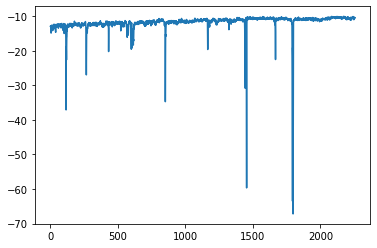

In [6]:
plt.plot(reward_records_)

In [7]:
import misc

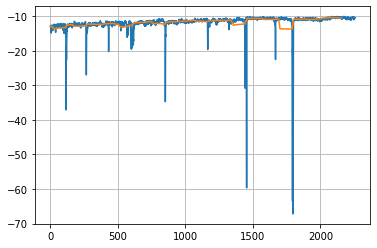

In [8]:
plt.plot(reward_records_)
plt.plot(misc.smooth(reward_records_,100))
plt.grid()


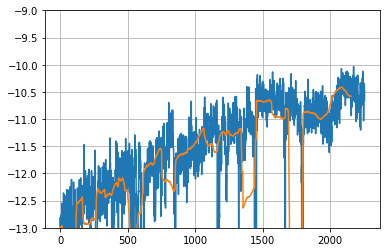

In [11]:
plt.plot(reward_records_)
plt.plot(misc.smooth(reward_records_,100))
plt.ylim([-13,-9])
plt.grid()


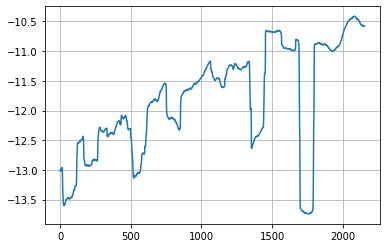

In [12]:
# plt.plot(reward_records_)
plt.plot(misc.smooth(reward_records_,100))
plt.grid()

In [ ]:
plt.plot(np.array(action_statmean_records).reshape([-1,8])[:,0])

In [ ]:
plt.plot(np.array(action_statmean_records).reshape([-1,8])[:,1])

In [ ]:
_=plt.hist(np.array(action_statmean_records).reshape([-1,8])[:,1],bins=100)

In [ ]:
for these_actions in actions[:5]:
    plt.plot(np.cumsum(these_actions[:,0]),np.cumsum(these_actions[:,1]))

In [ ]:
# actor_model.save('actor_model_vanilla_det_singleImg_Adv')

In [ ]:
batch_of_actions = np.array(actions).transpose([1,0,2])

In [ ]:
for these_actions in batch_of_actions[:20]:
    plt.plot(np.cumsum(these_actions[:,0]),np.cumsum(these_actions[:,1]))
plt.xlim([-10,10])
plt.ylim([-10,10])


In [ ]:
for ii in range(10):
    plt.plot(env.location_history[ii][0],env.location_history[ii][1])